<a href="https://colab.research.google.com/github/Deba951/Hyperspectral_Image_Analysis_Learning/blob/main/Land_Cover_Classification_of_Hyperspectral_Imagery_using_Deep_Neural_Networks(DNN).ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Land Cover Classification of Hyperspectral Imagery using Deep Neural Networks


## Download Data

In [1]:
!wget http://www.ehu.eus/ccwintco/uploads/e/ee/PaviaU.mat http://www.ehu.eus/ccwintco/uploads/5/50/PaviaU_gt.mat

--2023-09-07 06:43:31--  http://www.ehu.eus/ccwintco/uploads/e/ee/PaviaU.mat
Resolving www.ehu.eus (www.ehu.eus)... 158.227.0.65, 2001:720:1410::65
Connecting to www.ehu.eus (www.ehu.eus)|158.227.0.65|:80... connected.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://www.ehu.eus/ccwintco/uploads/e/ee/PaviaU.mat [following]
--2023-09-07 06:43:31--  https://www.ehu.eus/ccwintco/uploads/e/ee/PaviaU.mat
Connecting to www.ehu.eus (www.ehu.eus)|158.227.0.65|:443... connected.
OpenSSL: error:0A000152:SSL routines::unsafe legacy renegotiation disabled
Unable to establish SSL connection.
--2023-09-07 06:43:31--  http://www.ehu.eus/ccwintco/uploads/5/50/PaviaU_gt.mat
Reusing existing connection to www.ehu.eus:80.
HTTP request sent, awaiting response... 301 Moved Permanently
Location: https://www.ehu.eus/ccwintco/uploads/5/50/PaviaU_gt.mat [following]
--2023-09-07 06:43:31--  https://www.ehu.eus/ccwintco/uploads/5/50/PaviaU_gt.mat
Connecting to www.ehu.eus (www.ehu.

In [2]:
!pip install earthpy

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.4/1.4 MB 11.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 21.3/21.3 MB 71.4 MB/s eta 0:00:00


## Import Libraries

In [3]:
import matplotlib.pyplot as plt

import numpy as np
import earthpy.plot as ep
import seaborn as sns
import earthpy.spatial as es

import plotly.graph_objects as go
import plotly.express as px

from scipy.io import loadmat

import pandas as pd

from sklearn.model_selection import train_test_split
from sklearn.metrics import (accuracy_score,
                             confusion_matrix, classification_report)

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras.layers import Input, Dense, Dropout, BatchNormalization
from tensorflow.keras.models import Sequential
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint

from tqdm import tqdm

## Load Data

In [4]:
data = loadmat('PaviaU.mat')['paviaU']

gt = loadmat('PaviaU_gt.mat')['paviaU_gt']

In [5]:
print(f'Data Shape: {data.shape[:-1]}\nNumber of Bands: {data.shape[-1]}')

Data Shape: (610, 340)
Number of Bands: 103


In [6]:
df = pd.DataFrame(data.reshape(data.shape[0]*data.shape[1], -1))
df.columns = [f'band{i}' for i in range(1, df.shape[-1]+1)]
df['class'] = gt.ravel()

In [7]:
df.shape

(207400, 104)

In [8]:
df.head()

,band1,band2,band3,band4,band5,band6,band7,band8,band9,band10,...,band95,band96,band97,band98,band99,band100,band101,band102,band103,class
0,647,499,464,371,291,319,365,322,296,305,...,3416,3335,3256,3226,3205,3210,3221,3238,3250,0
1,604,546,527,455,378,377,336,314,324,329,...,2583,2538,2509,2511,2501,2468,2442,2464,2528,0
2,621,746,556,360,285,300,274,276,332,319,...,2288,2242,2193,2202,2225,2266,2308,2345,2361,0
3,637,592,482,556,508,284,178,198,193,224,...,2675,2609,2541,2551,2571,2569,2573,2620,2644,0
4,625,560,480,360,377,341,264,208,231,266,...,2392,2344,2289,2328,2415,2424,2386,2431,2456,0


<Axes: ylabel='class'>

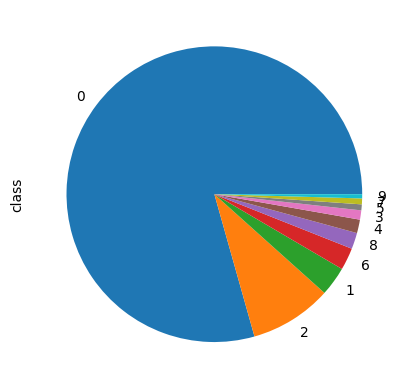

In [9]:
df['class'].value_counts().plot(kind = 'pie')

## Description of Classes

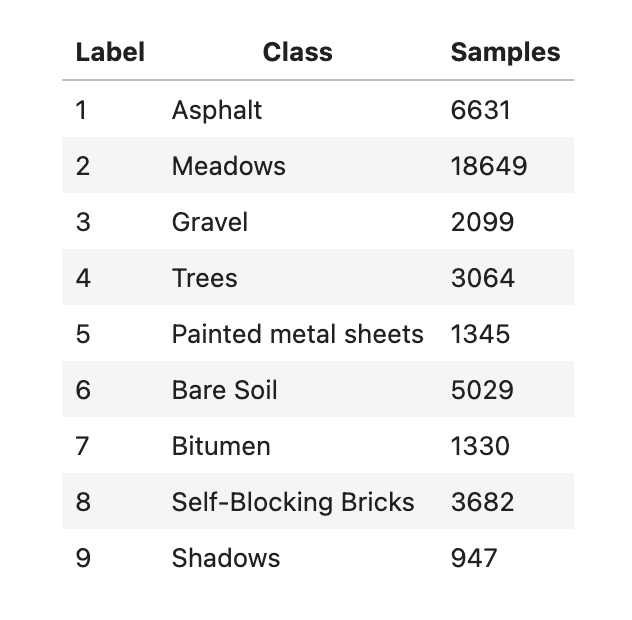

## Data Visualization

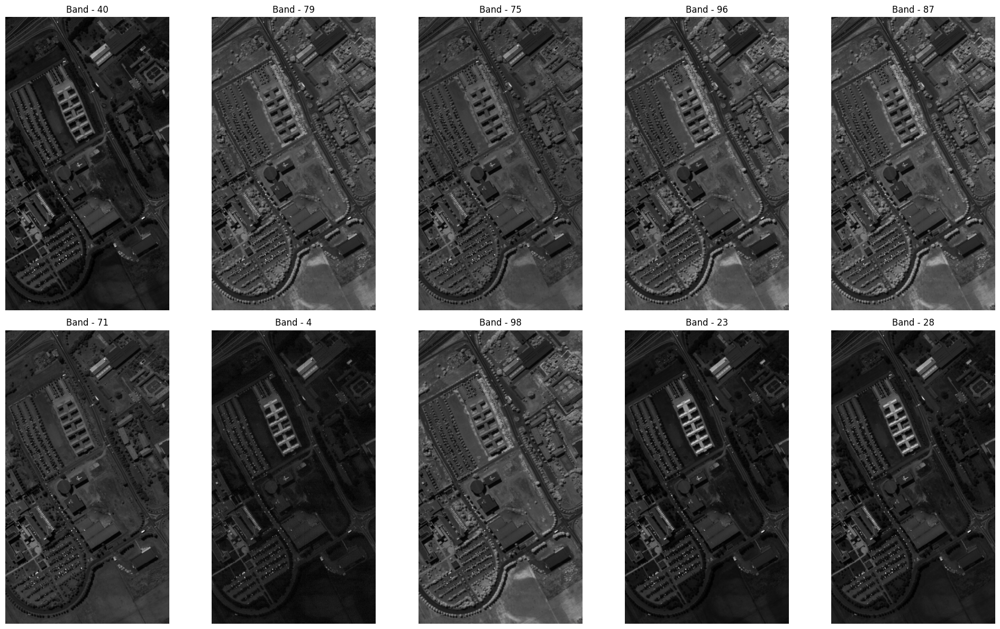

In [10]:
fig = plt.figure(figsize = (20, 12))

ax = fig.subplots(2, 5)

for i in range(2):
  for j in range(5):
    c = np.random.randint(103)
    ax[i][j].imshow(data[:, :, c], cmap='gray')
    ax[i][j].axis('off')
    ax[i][j].title.set_text(f"Band - {c}")
    c+=1

plt.tight_layout()
plt.show()

## Composite Image Visualization

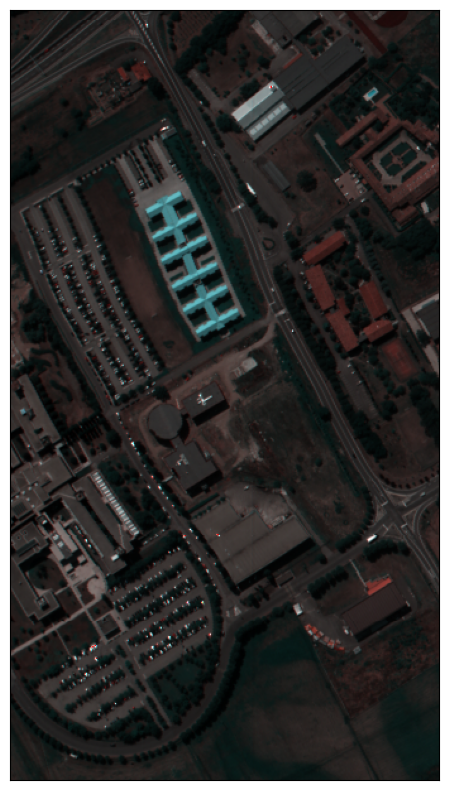

In [11]:
mdata = np.moveaxis(data, -1, 0)

ep.plot_rgb(mdata, (60, 30, 27), figsize=(12, 10))

plt.show()

## Ground Truth Visualization

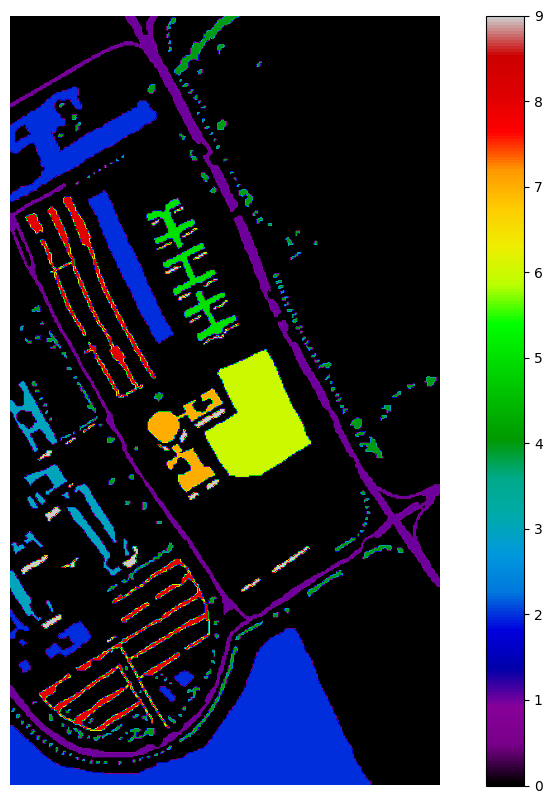

In [12]:
def plot_data(data):
  fig = plt.figure(figsize=(12, 10))
  plt.imshow(data, cmap='nipy_spectral')
  plt.colorbar()
  plt.axis('off')
  plt.show()

plot_data(gt)

In [13]:
X = df[df['class']!=0].iloc[:, :-1].values

y = tf.keras.utils.to_categorical(df[df['class']!=0].iloc[:, -1].values ,
                                  num_classes= np.unique(gt).shape[0],
                                  dtype='float32')

X_train, X_test, y_train, y_test = train_test_split(X, y, train_size = 0.7, stratify = y)

print(f"Train Data: {X_train.shape}\nTest Data: {X_test.shape}")

Train Data: (29943, 103)
Test Data: (12833, 103)


In [15]:
y_test.shape

(12833, 10)

## Classification

In [16]:
model = Sequential(name='Pavia_University')

model.add(Input(shape = X_train[0].shape, name = 'Input_Layer'))

model.add(BatchNormalization(name = 'BatchNormalization'))

model.add(Dense(units = 128, activation= 'relu', name = 'Layer1'))
model.add(Dense(units = 128, activation= 'relu', name = 'Layer2'))
model.add(Dense(units = 128, activation= 'relu', name = 'Layer3'))
model.add(Dense(units = 128, activation= 'relu', name = 'Layer4'))

model.add(Dropout(rate = 0.2, name = 'Dropout1',))

model.add(Dense(units = 64, activation= 'relu', name = 'Layer5'))
model.add(Dense(units = 64, activation= 'relu', name = 'Layer6'))
model.add(Dense(units = 64, activation= 'relu', name = 'Layer7'))
model.add(Dense(units = 64, activation= 'relu', name = 'Layer8'))

model.add(Dropout(rate = 0.2, name = 'Dropout2'))

model.add(Dense(units = 32, activation= 'relu', name = 'Layer9'))
model.add(Dense(units = 32, activation= 'relu', name = 'Layer10'))
model.add(Dense(units = 32, activation= 'relu', name = 'Layer11'))
model.add(Dense(units = 32, activation= 'relu', name = 'Layer12'))

model.add(Dense(units = y_train.shape[1], activation= 'softmax', name = 'Output_Layer'))

model.summary()

Model: "Pavia_University"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 BatchNormalization (BatchNo  (None, 103)              412       
 rmalization)                                                    
                                                                 
 Layer1 (Dense)              (None, 128)               13312     
                                                                 
 Layer2 (Dense)              (None, 128)               16512     
                                                                 
 Layer3 (Dense)              (None, 128)               16512     
                                                                 
 Layer4 (Dense)              (None, 128)               16512     
                                                                 
 Dropout1 (Dropout)          (None, 128)               0         
                                                  

In [17]:
model.compile(optimizer = 'adam', loss = 'categorical_crossentropy', metrics = ['accuracy'])

In [18]:
es = EarlyStopping(monitor = 'val_loss',
                   min_delta = 0,
                   patience = 15,
                   verbose = 1,
                   restore_best_weights = True)

checkpoint = ModelCheckpoint(filepath = 'Pavia_University_Model.h5',
                             monitor = 'val_loss',
                             mode ='min',
                             save_best_only = True,
                             verbose = 1)

In [20]:
history = model.fit(x = X_train,
          y = y_train,
          validation_data = (X_test, y_test),
          epochs = 100,
          callbacks = [es, checkpoint])

Epoch 1/100
932/936 [============================>.] - ETA: 0s - loss: 0.2508 - accuracy: 0.9066
Epoch 1: val_loss did not improve from 0.14344
936/936 [==============================] - 5s 6ms/step - loss: 0.2504 - accuracy: 0.9067 - val_loss: 0.1511 - val_accuracy: 0.9470
Epoch 2/100
935/936 [============================>.] - ETA: 0s - loss: 0.2463 - accuracy: 0.9083
Epoch 2: val_loss did not improve from 0.14344
936/936 [==============================] - 4s 4ms/step - loss: 0.2463 - accuracy: 0.9083 - val_loss: 0.1547 - val_accuracy: 0.9420
Epoch 3/100
931/936 [============================>.] - ETA: 0s - loss: 0.2613 - accuracy: 0.9041
Epoch 3: val_loss did not improve from 0.14344
936/936 [==============================] - 4s 4ms/step - loss: 0.2611 - accuracy: 0.9043 - val_loss: 0.1535 - val_accuracy: 0.9479
Epoch 4/100
936/936 [==============================] - ETA: 0s - loss: 0.2332 - accuracy: 0.9107
Epoch 4: val_loss did not improve from 0.14344
936/936 [======================

In [21]:
loss, acc = model.evaluate(X_test, y_test)

print(f'Loss: {loss}\nAccuracy: {acc}')

402/402 [==============================] - 1s 2ms/step - loss: 0.1377 - accuracy: 0.9475
Loss: 0.13765427470207214
Accuracy: 0.9474791288375854


In [22]:
pred = np.argmax(model.predict(X_test), axis=1)

402/402 [==============================] - 1s 2ms/step


In [23]:
pred.shape

(12833,)

In [25]:
hist = pd.DataFrame(data= history.history)
hist.head()

,loss,accuracy,val_loss,val_accuracy
0,0.250437,0.906723,0.151071,0.947012
1,0.246303,0.908259,0.154664,0.942024
2,0.261056,0.904318,0.153510,0.947947
3,0.233210,0.910730,0.173163,0.938518
4,0.237793,0.911198,0.171422,0.938206


In [26]:
hist.to_csv('PU_train_data.csv')

In [27]:
fig = go.Figure()
fig.add_trace(go.Scatter(x = hist.index, y = hist.loss.values,
                    mode='lines+markers',
                    name='Train Loss'))
fig.add_trace(go.Scatter(x = hist.index, y = hist.accuracy.values,
                    mode='lines+markers',
                    name='Train Accuracy'))
fig.add_trace(go.Scatter(x = hist.index, y = hist.val_loss.values,
                    mode='lines+markers', name='Test loss'))

fig.add_trace(go.Scatter(x = hist.index, y = hist.val_accuracy.values,
                    mode='lines+markers', name='Test Accuracy'))

fig.show()

In [28]:
from collections import Counter
Counter(np.argmax(y_test, 1)), Counter(pred)

(Counter({2: 5595,
          1: 1989,
          6: 1509,
          5: 403,
          4: 919,
          8: 1105,
          3: 630,
          7: 399,
          9: 284}),
 Counter({2: 5662,
          1: 1955,
          6: 1485,
          5: 403,
          4: 888,
          8: 1353,
          3: 399,
          7: 403,
          9: 285}))

In [29]:
print(classification_report(pred, np.argmax(y_test, 1),
      target_names = ['1. Asphalt', '2. Meadows', '3. Gravel', '4. Trees',
                 '5. Painted metal sheets','6. Bare Soil', '7. Bitumen',
                 '8. Self-Blocking Bricks', '9. Shadows']))

                         precision    recall  f1-score   support

             1. Asphalt       0.95      0.96      0.95      1955
             2. Meadows       0.99      0.98      0.98      5662
              3. Gravel       0.58      0.91      0.71       399
               4. Trees       0.95      0.98      0.96       888
5. Painted metal sheets       1.00      1.00      1.00       403
           6. Bare Soil       0.94      0.96      0.95      1485
             7. Bitumen       0.87      0.86      0.86       403
8. Self-Blocking Bricks       0.96      0.78      0.86      1353
             9. Shadows       1.00      1.00      1.00       285

               accuracy                           0.95     12833
              macro avg       0.91      0.94      0.92     12833
           weighted avg       0.95      0.95      0.95     12833



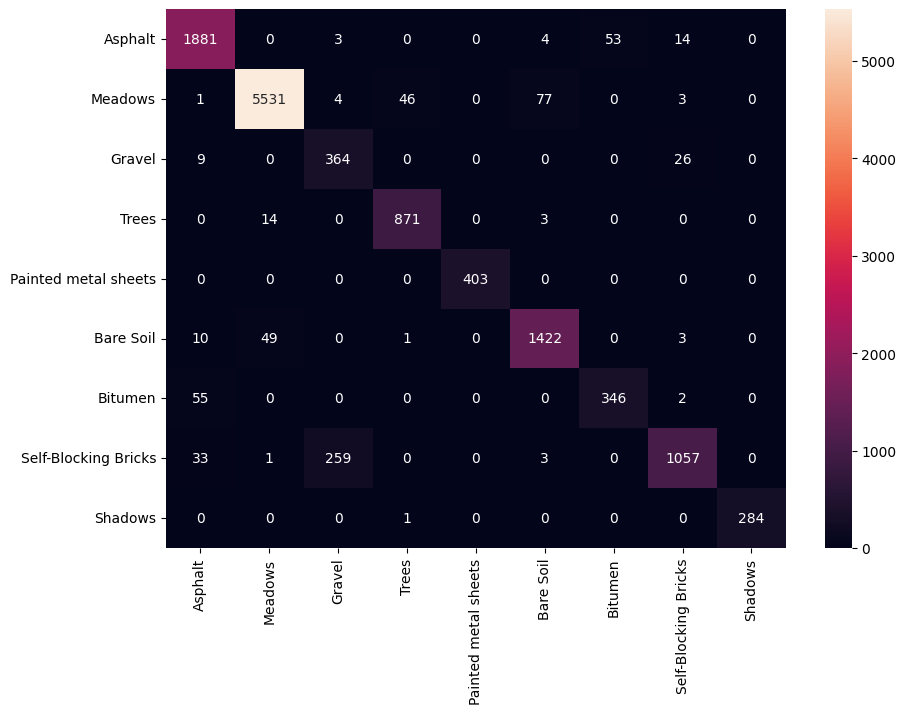

In [30]:
plt.figure(figsize = (10,7))

classes = ['Asphalt', 'Meadows', 'Gravel', 'Trees', 'Painted metal sheets',
            'Bare Soil', 'Bitumen', 'Self-Blocking Bricks', 'Shadows']
mat = confusion_matrix(np.add(pred, 1), np.add(np.argmax(y_test, 1), 1))

df_cm = pd.DataFrame(mat, index = classes,
                  columns = classes)

sns.heatmap(df_cm, annot=True, fmt='d')

plt.show()

In [31]:
l = []

for i in tqdm(range(df.shape[0])):
  # print(data.shape, data.reshape(-1, 103).shape, data , sep='\n')
  if df.iloc[i, -1] == 0:
    l.append(0)
  else:
    l.append(np.argmax(model.predict(df.iloc[i, :-1].values.reshape(-1, 103)), 1))

  0%|          | 0/207400 [00:00<?, ?it/s]

1/1 [==============================] - 0s 49ms/step


  0%|          | 92/207400 [00:00<09:00, 383.75it/s]

1/1 [==============================] - 0s 39ms/step


  0%|          | 131/207400 [00:01<1:01:15, 56.39it/s]

1/1 [==============================] - 0s 50ms/step


  0%|          | 171/207400 [00:02<43:11, 79.96it/s]  

1/1 [==============================] - 0s 44ms/step


  0%|          | 196/207400 [00:03<1:17:05, 44.80it/s]

1/1 [==============================] - 0s 78ms/step


  0%|          | 432/207400 [00:03<20:16, 170.18it/s] 

1/1 [==============================] - 0s 21ms/step


  0%|          | 486/207400 [00:04<29:10, 118.17it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 524/207400 [00:05<36:26, 94.61it/s] 

1/1 [==============================] - 0s 22ms/step


  0%|          | 774/207400 [00:05<15:19, 224.76it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 850/207400 [00:06<21:56, 156.85it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 904/207400 [00:07<24:25, 140.92it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 1114/207400 [00:07<13:26, 255.92it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 1190/207400 [00:08<23:48, 144.32it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 1245/207400 [00:09<24:47, 138.60it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 1455/207400 [00:09<13:52, 247.38it/s]

1/1 [==============================] - 0s 20ms/step


  1%|          | 1528/207400 [00:10<23:27, 146.26it/s]

1/1 [==============================] - 0s 30ms/step


  1%|          | 1581/207400 [00:11<26:29, 129.47it/s]

1/1 [==============================] - 0s 35ms/step


  1%|          | 1794/207400 [00:11<14:21, 238.66it/s]

1/1 [==============================] - 0s 31ms/step


  1%|          | 1879/207400 [00:14<41:05, 83.35it/s] 

1/1 [==============================] - 0s 30ms/step


  1%|          | 2135/207400 [00:14<21:51, 156.50it/s]

1/1 [==============================] - 0s 38ms/step


  1%|          | 2247/207400 [00:17<37:27, 91.28it/s] 

1/1 [==============================] - 0s 41ms/step


  1%|          | 2476/207400 [00:17<23:00, 148.45it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 2589/207400 [00:19<29:02, 117.53it/s]

1/1 [==============================] - 0s 30ms/step


  1%|▏         | 2818/207400 [00:19<18:30, 184.25it/s]

1/1 [==============================] - 0s 20ms/step


  1%|▏         | 2923/207400 [00:20<22:58, 148.31it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 3159/207400 [00:21<14:40, 232.02it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 3263/207400 [00:22<20:22, 167.04it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 3499/207400 [00:22<13:08, 258.75it/s]

1/1 [==============================] - 0s 32ms/step


  2%|▏         | 3603/207400 [00:24<19:58, 170.04it/s]

1/1 [==============================] - 0s 32ms/step


  2%|▏         | 3839/207400 [00:24<12:43, 266.56it/s]

1/1 [==============================] - 0s 36ms/step


  2%|▏         | 3960/207400 [00:25<21:09, 160.27it/s]

1/1 [==============================] - 0s 33ms/step


  2%|▏         | 4179/207400 [00:26<14:03, 240.94it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 4298/207400 [00:27<18:41, 181.10it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 4520/207400 [00:27<12:30, 270.27it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 4630/207400 [00:29<20:34, 164.26it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 4861/207400 [00:29<13:21, 252.81it/s]

1/1 [==============================] - 0s 20ms/step


  2%|▏         | 4972/207400 [00:30<18:07, 186.20it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 5201/207400 [00:30<12:02, 279.88it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 5304/207400 [00:31<18:06, 185.98it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 5542/207400 [00:32<11:41, 287.76it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 5650/207400 [00:33<18:29, 181.77it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 5883/207400 [00:33<12:05, 277.83it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 5991/207400 [00:34<17:39, 190.16it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 6223/207400 [00:34<11:35, 289.16it/s]

1/1 [==============================] - 0s 19ms/step


  3%|▎         | 6330/207400 [00:36<16:31, 202.84it/s]

1/1 [==============================] - 0s 33ms/step


  3%|▎         | 6563/207400 [00:36<10:41, 313.11it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 6688/207400 [00:37<18:15, 183.25it/s]

1/1 [==============================] - 0s 34ms/step


  3%|▎         | 6903/207400 [00:38<12:23, 269.54it/s]

1/1 [==============================] - 0s 20ms/step


  3%|▎         | 7016/207400 [00:39<18:39, 178.92it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 7232/207400 [00:39<12:34, 265.18it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 7337/207400 [00:41<20:14, 164.66it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▎         | 7569/207400 [00:41<13:07, 253.88it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▎         | 7671/207400 [00:44<30:12, 110.18it/s]

1/1 [==============================] - 0s 30ms/step


  4%|▍         | 7907/207400 [00:44<19:10, 173.44it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 8002/207400 [00:47<35:02, 94.82it/s] 

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 8244/207400 [00:47<21:42, 152.93it/s]

1/1 [==============================] - 0s 31ms/step


  4%|▍         | 8343/207400 [00:50<37:26, 88.61it/s] 

1/1 [==============================] - 0s 34ms/step


  4%|▍         | 8580/207400 [00:50<23:13, 142.67it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 8698/207400 [00:53<33:37, 98.47it/s] 

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 8919/207400 [00:53<22:04, 149.87it/s]

1/1 [==============================] - 0s 20ms/step


  4%|▍         | 9019/207400 [00:56<37:11, 88.92it/s] 

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 9257/207400 [00:56<23:17, 141.79it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 9353/207400 [00:59<34:05, 96.80it/s] 

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 9595/207400 [00:59<21:12, 155.48it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▍         | 9693/207400 [01:00<27:55, 117.98it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▍         | 9933/207400 [01:01<17:33, 187.52it/s]

1/1 [==============================] - 0s 32ms/step


  5%|▍         | 10036/207400 [01:03<26:40, 123.32it/s]

1/1 [==============================] - 0s 32ms/step


  5%|▍         | 10270/207400 [01:03<16:53, 194.55it/s]

1/1 [==============================] - 0s 20ms/step


  5%|▌         | 10386/207400 [01:04<23:45, 138.22it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 10609/207400 [01:05<15:50, 207.11it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 10707/207400 [01:06<21:26, 152.85it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 10947/207400 [01:06<13:38, 239.93it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 11048/207400 [01:08<20:56, 156.30it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 11286/207400 [01:08<13:35, 240.41it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 11379/207400 [01:10<21:31, 151.73it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 11624/207400 [01:10<13:38, 239.18it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 11718/207400 [01:11<21:56, 148.66it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 11962/207400 [01:12<13:53, 234.51it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 12059/207400 [01:13<21:11, 153.69it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 12300/207400 [01:13<13:33, 239.83it/s]

1/1 [==============================] - 0s 32ms/step


  6%|▌         | 12397/207400 [01:15<21:57, 148.06it/s]

1/1 [==============================] - 0s 31ms/step


  6%|▌         | 12637/207400 [01:15<13:46, 235.58it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▌         | 12756/207400 [01:17<20:36, 157.43it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 12841/207400 [01:17<17:48, 182.15it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▋         | 12977/207400 [01:17<13:36, 238.13it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 13059/207400 [01:18<18:58, 170.68it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 13119/207400 [01:18<18:19, 176.68it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 13315/207400 [01:19<11:10, 289.58it/s]

1/1 [==============================] - 0s 20ms/step


  6%|▋         | 13389/207400 [01:19<15:15, 211.85it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 13444/207400 [01:20<17:45, 182.07it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 13486/207400 [01:20<17:20, 186.40it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 13653/207400 [01:20<10:28, 308.25it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 13713/207400 [01:20<11:21, 284.08it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 13761/207400 [01:21<23:00, 140.25it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 13797/207400 [01:22<21:15, 151.79it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 13991/207400 [01:22<10:41, 301.71it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 14056/207400 [01:22<12:10, 264.81it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 14107/207400 [01:23<23:45, 135.55it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 14330/207400 [01:23<12:04, 266.58it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 14398/207400 [01:24<12:41, 253.45it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 14452/207400 [01:25<21:40, 148.31it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 14668/207400 [01:25<11:47, 272.58it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 14742/207400 [01:26<14:50, 216.27it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 14797/207400 [01:27<23:43, 135.34it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 15006/207400 [01:27<13:38, 235.11it/s]

1/1 [==============================] - 0s 36ms/step


  7%|▋         | 15067/207400 [01:27<15:05, 212.36it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 15114/207400 [01:29<31:30, 101.70it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 15345/207400 [01:29<16:04, 199.09it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 15416/207400 [01:30<15:28, 206.84it/s]

1/1 [==============================] - 0s 20ms/step


  7%|▋         | 15473/207400 [01:31<23:37, 135.38it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 15683/207400 [01:31<13:19, 239.84it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 15755/207400 [01:31<13:20, 239.54it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 15813/207400 [01:32<20:45, 153.80it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 16022/207400 [01:32<11:53, 268.22it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 16092/207400 [01:32<11:30, 277.09it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 16151/207400 [01:33<15:49, 201.41it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 16360/207400 [01:33<09:16, 343.33it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 16434/207400 [01:33<09:15, 343.93it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 16496/207400 [01:34<12:55, 246.21it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 16698/207400 [01:34<08:03, 394.66it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 16768/207400 [01:34<08:23, 378.59it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 16827/207400 [01:35<12:35, 252.39it/s]

1/1 [==============================] - 0s 19ms/step


  8%|▊         | 17037/207400 [01:35<07:27, 425.16it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 17115/207400 [01:35<07:37, 416.22it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 17181/207400 [01:36<11:12, 283.06it/s]

1/1 [==============================] - 0s 20ms/step


  8%|▊         | 17375/207400 [01:36<07:08, 443.56it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 17452/207400 [01:36<07:34, 417.89it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 17516/207400 [01:37<13:08, 240.83it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▊         | 17713/207400 [01:37<08:05, 391.01it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▊         | 17789/207400 [01:37<08:21, 378.45it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▊         | 17853/207400 [01:38<13:03, 242.03it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▊         | 18051/207400 [01:38<08:08, 387.97it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▊         | 18123/207400 [01:38<08:25, 374.65it/s]

1/1 [==============================] - 0s 34ms/step


  9%|▉         | 18183/207400 [01:39<12:32, 251.61it/s]

1/1 [==============================] - 0s 32ms/step


  9%|▉         | 18389/207400 [01:39<08:00, 393.73it/s]

1/1 [==============================] - 0s 32ms/step


  9%|▉         | 18451/207400 [01:39<10:02, 313.77it/s]

1/1 [==============================] - 0s 44ms/step


  9%|▉         | 18500/207400 [01:41<19:59, 157.45it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▉         | 18535/207400 [01:41<18:35, 169.37it/s]

1/1 [==============================] - 0s 35ms/step


  9%|▉         | 18727/207400 [01:41<09:42, 323.74it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▉         | 18805/207400 [01:41<11:17, 278.56it/s]

1/1 [==============================] - 0s 20ms/step


  9%|▉         | 18866/207400 [01:42<21:50, 143.89it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 19066/207400 [01:43<12:18, 255.16it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 19135/207400 [01:43<11:45, 266.71it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 19193/207400 [01:44<22:25, 139.89it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 19405/207400 [01:44<12:16, 255.17it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 19480/207400 [01:45<14:03, 222.81it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 19537/207400 [01:46<20:43, 151.08it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 19743/207400 [01:46<11:50, 264.24it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 19814/207400 [01:47<16:07, 193.88it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 19867/207400 [01:48<23:26, 133.38it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 20081/207400 [01:48<13:00, 239.90it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 20148/207400 [01:49<17:40, 176.56it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 20197/207400 [01:50<24:54, 125.29it/s]

1/1 [==============================] - 0s 28ms/step


 10%|▉         | 20233/207400 [01:50<23:15, 134.10it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 20419/207400 [01:50<12:34, 247.97it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 20480/207400 [01:51<21:14, 146.71it/s]

1/1 [==============================] - 0s 20ms/step


 10%|▉         | 20524/207400 [01:51<22:01, 141.39it/s]

1/1 [==============================] - 0s 31ms/step


 10%|▉         | 20559/207400 [01:52<31:33, 98.70it/s] 

1/1 [==============================] - 0s 33ms/step


 10%|█         | 20757/207400 [01:52<14:42, 211.38it/s]

1/1 [==============================] - 0s 24ms/step


 10%|█         | 20831/207400 [01:54<31:14, 99.55it/s] 

1/1 [==============================] - 0s 23ms/step


 10%|█         | 20884/207400 [01:55<36:21, 85.49it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 21096/207400 [01:56<18:26, 168.38it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 21169/207400 [01:57<28:26, 109.14it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 21221/207400 [01:58<29:33, 104.98it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 21434/207400 [01:58<15:51, 195.37it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 21502/207400 [02:00<27:32, 112.48it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 21551/207400 [02:00<25:22, 122.10it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 21592/207400 [02:00<25:44, 120.27it/s]

1/1 [==============================] - 0s 20ms/step


 10%|█         | 21772/207400 [02:00<13:59, 221.19it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 21834/207400 [02:02<28:45, 107.55it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 21890/207400 [02:02<24:27, 126.41it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 21933/207400 [02:03<27:38, 111.85it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 22110/207400 [02:03<14:39, 210.66it/s]

1/1 [==============================] - 0s 37ms/step


 11%|█         | 22169/207400 [02:06<40:34, 76.08it/s] 

1/1 [==============================] - 0s 37ms/step


 11%|█         | 22230/207400 [02:06<32:35, 94.69it/s]

1/1 [==============================] - 0s 44ms/step


 11%|█         | 22277/207400 [02:07<39:56, 77.25it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 22449/207400 [02:07<21:07, 145.93it/s]

1/1 [==============================] - 0s 35ms/step


 11%|█         | 22503/207400 [02:09<40:12, 76.63it/s] 

1/1 [==============================] - 0s 27ms/step


 11%|█         | 22571/207400 [02:09<32:09, 95.79it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 22610/207400 [02:10<35:31, 86.68it/s]

1/1 [==============================] - 0s 35ms/step


 11%|█         | 22787/207400 [02:10<18:24, 167.18it/s]

1/1 [==============================] - 0s 38ms/step


 11%|█         | 22839/207400 [02:12<37:59, 80.96it/s] 

1/1 [==============================] - 0s 39ms/step


 11%|█         | 22910/207400 [02:13<29:26, 104.47it/s]

1/1 [==============================] - 0s 36ms/step


 11%|█         | 22954/207400 [02:13<34:10, 89.95it/s] 

1/1 [==============================] - 0s 38ms/step


 11%|█         | 23124/207400 [02:13<17:58, 170.87it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 23186/207400 [02:16<37:43, 81.38it/s] 

1/1 [==============================] - 0s 21ms/step


 11%|█         | 23231/207400 [02:16<36:08, 84.94it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 23266/207400 [02:17<39:03, 78.57it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 23292/207400 [02:17<35:59, 85.24it/s]

1/1 [==============================] - 0s 35ms/step


 11%|█▏        | 23463/207400 [02:17<16:08, 189.95it/s]

1/1 [==============================] - 0s 35ms/step


 11%|█▏        | 23525/207400 [02:19<35:29, 86.36it/s] 

1/1 [==============================] - 0s 47ms/step


 11%|█▏        | 23570/207400 [02:20<39:19, 77.90it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 23603/207400 [02:21<43:17, 70.76it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█▏        | 23801/207400 [02:21<19:10, 159.60it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 23854/207400 [02:22<31:41, 96.54it/s] 

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 23893/207400 [02:22<28:26, 107.56it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 23928/207400 [02:23<33:14, 91.98it/s] 

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 23954/207400 [02:24<38:29, 79.42it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 24142/207400 [02:24<16:17, 187.39it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 24194/207400 [02:25<28:51, 105.80it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 24232/207400 [02:25<26:55, 113.38it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 24264/207400 [02:26<32:48, 93.05it/s] 

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 24288/207400 [02:27<40:32, 75.28it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 24482/207400 [02:27<16:11, 188.29it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 24531/207400 [02:28<24:29, 124.46it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 24567/207400 [02:28<26:36, 114.53it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 24595/207400 [02:29<33:30, 90.95it/s] 

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 24616/207400 [02:29<36:43, 82.95it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 24633/207400 [02:30<38:34, 78.98it/s]

1/1 [==============================] - 0s 33ms/step


 12%|█▏        | 24647/207400 [02:30<38:05, 79.96it/s]

1/1 [==============================] - 0s 33ms/step


 12%|█▏        | 24844/207400 [02:30<11:53, 255.75it/s]

1/1 [==============================] - 0s 34ms/step


 12%|█▏        | 24886/207400 [02:31<30:18, 100.37it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 24920/207400 [02:32<28:00, 108.57it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 24947/207400 [02:33<43:36, 69.74it/s] 

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 24967/207400 [02:33<52:11, 58.25it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 24982/207400 [02:34<51:05, 59.51it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 25183/207400 [02:34<15:41, 193.44it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 25231/207400 [02:35<27:05, 112.10it/s]

1/1 [==============================] - 0s 20ms/step


 12%|█▏        | 25266/207400 [02:36<32:54, 92.23it/s] 

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 25292/207400 [02:36<36:04, 84.13it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 25312/207400 [02:37<45:29, 66.71it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 25522/207400 [02:37<15:53, 190.82it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 25573/207400 [02:38<24:57, 121.41it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 25610/207400 [02:39<34:08, 88.74it/s] 

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 25637/207400 [02:39<37:47, 80.16it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 25658/207400 [02:40<38:28, 78.73it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 25858/207400 [02:40<14:40, 206.17it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 25910/207400 [02:41<27:41, 109.24it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 25948/207400 [02:42<37:39, 80.32it/s] 

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 25976/207400 [02:43<44:43, 67.62it/s]

1/1 [==============================] - 0s 35ms/step


 13%|█▎        | 25997/207400 [02:44<50:39, 59.68it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 26196/207400 [02:44<18:44, 161.13it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 26254/207400 [02:46<37:21, 80.81it/s] 

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 26296/207400 [02:48<54:37, 55.26it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 26326/207400 [02:48<54:57, 54.90it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 26349/207400 [02:48<50:05, 60.24it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 26536/207400 [02:49<20:07, 149.84it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 26587/207400 [02:50<35:51, 84.04it/s] 

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 26624/207400 [02:51<44:18, 68.00it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 26651/207400 [02:52<52:04, 57.85it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 26671/207400 [02:53<58:15, 51.70it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 26876/207400 [02:53<20:53, 144.07it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 26926/207400 [02:55<39:20, 76.47it/s] 

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 26962/207400 [02:56<48:51, 61.54it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 26988/207400 [02:58<1:04:23, 46.70it/s]

1/1 [==============================] - 0s 31ms/step


 13%|█▎        | 27007/207400 [02:58<1:12:43, 41.34it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 27212/207400 [02:59<25:44, 116.64it/s] 

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 27259/207400 [03:01<46:46, 64.20it/s] 

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 27293/207400 [03:01<46:16, 64.88it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 27319/207400 [03:03<1:07:05, 44.73it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 27338/207400 [03:03<1:01:25, 48.86it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 27355/207400 [03:03<1:03:14, 47.44it/s]

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 27551/207400 [03:04<20:10, 148.56it/s] 

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 27603/207400 [03:06<45:27, 65.91it/s] 

1/1 [==============================] - 0s 20ms/step


 13%|█▎        | 27640/207400 [03:07<53:26, 56.05it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 27667/207400 [03:08<1:04:36, 46.37it/s]

1/1 [==============================] - 0s 38ms/step


 13%|█▎        | 27687/207400 [03:09<1:11:15, 42.03it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 27889/207400 [03:09<24:40, 121.26it/s] 

1/1 [==============================] - 0s 85ms/step


 13%|█▎        | 27948/207400 [03:12<55:55, 53.49it/s] 

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 27990/207400 [03:15<1:16:24, 39.14it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▎        | 28020/207400 [03:15<1:13:06, 40.89it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▎        | 28043/207400 [03:16<1:11:55, 41.56it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▎        | 28228/207400 [03:16<28:20, 105.38it/s] 

1/1 [==============================] - 0s 22ms/step


 14%|█▎        | 28277/207400 [03:19<53:01, 56.30it/s] 

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 28312/207400 [03:19<56:07, 53.18it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▎        | 28338/207400 [03:21<1:14:09, 40.25it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▎        | 28359/207400 [03:21<1:06:21, 44.96it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▎        | 28377/207400 [03:22<1:16:08, 39.18it/s]

1/1 [==============================] - 0s 33ms/step


 14%|█▎        | 28390/207400 [03:22<1:11:53, 41.50it/s]

1/1 [==============================] - 0s 33ms/step


 14%|█▍        | 28565/207400 [03:22<21:20, 139.65it/s] 

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 28619/207400 [03:26<1:00:44, 49.06it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 28658/207400 [03:27<1:10:36, 42.19it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 28686/207400 [03:28<1:16:04, 39.15it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 28707/207400 [03:29<1:17:06, 38.62it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 28727/207400 [03:29<1:07:32, 44.09it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 28742/207400 [03:29<1:06:53, 44.51it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 28905/207400 [03:29<21:23, 139.12it/s] 

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 28947/207400 [03:32<56:59, 52.19it/s] 

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 28977/207400 [03:32<49:50, 59.67it/s]

1/1 [==============================] - 0s 36ms/step


 14%|█▍        | 29004/207400 [03:35<1:34:22, 31.51it/s]

1/1 [==============================] - 0s 35ms/step


 14%|█▍        | 29023/207400 [03:36<1:37:59, 30.34it/s]

1/1 [==============================] - 0s 37ms/step


 14%|█▍        | 29039/207400 [03:36<1:25:39, 34.70it/s]

1/1 [==============================] - 0s 41ms/step


 14%|█▍        | 29054/207400 [03:36<1:37:32, 30.47it/s]

1/1 [==============================] - 0s 38ms/step


 14%|█▍        | 29065/207400 [03:37<1:27:16, 34.06it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 29076/207400 [03:37<1:41:22, 29.32it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 29244/207400 [03:37<22:53, 129.74it/s] 

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 29280/207400 [03:40<1:05:41, 45.19it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 29305/207400 [03:41<1:05:45, 45.14it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 29324/207400 [03:42<1:14:00, 40.10it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 29338/207400 [03:43<1:35:45, 30.99it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▍        | 29349/207400 [03:43<1:49:56, 26.99it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 29381/207400 [03:44<1:15:35, 39.25it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 29393/207400 [03:44<1:20:37, 36.80it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 29406/207400 [03:44<1:11:41, 41.38it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 29415/207400 [03:45<1:19:44, 37.20it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 29582/207400 [03:45<17:04, 173.62it/s] 

1/1 [==============================] - 0s 43ms/step


 14%|█▍        | 29620/207400 [03:47<58:08, 50.97it/s] 

1/1 [==============================] - 0s 33ms/step


 14%|█▍        | 29648/207400 [03:48<59:32, 49.76it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▍        | 29669/207400 [03:49<1:23:21, 35.53it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 29684/207400 [03:51<1:45:34, 28.06it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 29695/207400 [03:51<1:37:05, 30.50it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 29721/207400 [03:51<1:12:39, 40.76it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 29734/207400 [03:51<1:19:12, 37.38it/s]

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 29746/207400 [03:52<1:11:01, 41.69it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 29755/207400 [03:52<1:19:32, 37.22it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 29922/207400 [03:52<16:37, 177.98it/s] 

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 29961/207400 [03:54<50:28, 58.58it/s] 

1/1 [==============================] - 0s 20ms/step


 14%|█▍        | 29989/207400 [03:55<44:04, 67.08it/s]

1/1 [==============================] - 0s 19ms/step


 14%|█▍        | 30015/207400 [03:56<1:09:56, 42.27it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▍        | 30034/207400 [03:57<1:17:18, 38.24it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 30062/207400 [03:57<1:01:09, 48.33it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 30078/207400 [03:58<1:11:13, 41.50it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 30090/207400 [03:58<1:16:55, 38.42it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 30262/207400 [03:58<20:19, 145.30it/s] 

1/1 [==============================] - 0s 31ms/step


 15%|█▍        | 30299/207400 [04:00<50:10, 58.82it/s] 

1/1 [==============================] - 0s 29ms/step


 15%|█▍        | 30326/207400 [04:01<45:34, 64.75it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▍        | 30349/207400 [04:02<1:16:08, 38.75it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 30366/207400 [04:04<1:35:54, 30.76it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 30403/207400 [04:04<1:09:06, 42.68it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 30419/207400 [04:04<1:16:23, 38.62it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 30431/207400 [04:05<1:18:49, 37.42it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 30602/207400 [04:05<21:15, 138.57it/s] 

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 30646/207400 [04:07<44:35, 66.07it/s] 

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 30677/207400 [04:08<50:03, 58.83it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 30700/207400 [04:09<1:15:21, 39.08it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 30717/207400 [04:10<1:10:05, 42.01it/s]

1/1 [==============================] - 0s 19ms/step


 15%|█▍        | 30743/207400 [04:10<57:16, 51.40it/s]  

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 30758/207400 [04:10<1:02:27, 47.13it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 30770/207400 [04:10<1:06:34, 44.22it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 30942/207400 [04:11<17:36, 166.95it/s] 

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 30983/207400 [04:12<41:25, 70.98it/s] 

1/1 [==============================] - 0s 34ms/step


 15%|█▍        | 31013/207400 [04:13<44:55, 65.43it/s]

1/1 [==============================] - 0s 43ms/step


 15%|█▍        | 31035/207400 [04:15<1:24:01, 34.98it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▍        | 31051/207400 [04:16<1:30:14, 32.57it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▍        | 31083/207400 [04:16<1:07:58, 43.23it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▍        | 31099/207400 [04:17<1:12:33, 40.50it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 31282/207400 [04:17<21:02, 139.45it/s] 

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 31326/207400 [04:18<39:09, 74.94it/s] 

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 31358/207400 [04:19<48:04, 61.04it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 31381/207400 [04:21<1:10:33, 41.57it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 31424/207400 [04:21<53:27, 54.86it/s]  

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 31444/207400 [04:22<56:53, 51.54it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 31622/207400 [04:22<20:27, 143.19it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 31667/207400 [04:23<34:09, 85.73it/s] 

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 31699/207400 [04:24<47:00, 62.29it/s]

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 31723/207400 [04:26<1:05:01, 45.03it/s]

1/1 [==============================] - 0s 33ms/step


 15%|█▌        | 31764/207400 [04:26<50:58, 57.42it/s]  

1/1 [==============================] - 0s 30ms/step


 15%|█▌        | 31783/207400 [04:27<1:04:22, 45.47it/s]

1/1 [==============================] - 0s 32ms/step


 15%|█▌        | 31961/207400 [04:27<22:28, 130.15it/s] 

1/1 [==============================] - 0s 21ms/step


 15%|█▌        | 32021/207400 [04:29<44:47, 65.25it/s] 

1/1 [==============================] - 0s 22ms/step


 15%|█▌        | 32064/207400 [04:32<1:09:21, 42.13it/s]

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 32096/207400 [04:32<59:48, 48.85it/s]  

1/1 [==============================] - 0s 20ms/step


 15%|█▌        | 32124/207400 [04:33<1:04:15, 45.46it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 32302/207400 [04:33<26:00, 112.21it/s] 

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 32350/207400 [04:35<42:46, 68.20it/s] 

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 32385/207400 [04:37<1:02:10, 46.91it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 32410/207400 [04:37<1:03:36, 45.85it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 32436/207400 [04:37<55:05, 52.93it/s]  

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 32455/207400 [04:38<1:03:55, 45.61it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 32642/207400 [04:38<21:33, 135.11it/s] 

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 32689/207400 [04:41<47:41, 61.06it/s] 

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 32723/207400 [04:43<1:11:39, 40.63it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 32747/207400 [04:44<1:12:37, 40.08it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 32777/207400 [04:44<1:00:33, 48.06it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 32796/207400 [04:45<1:08:30, 42.47it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 32982/207400 [04:45<22:57, 126.58it/s] 

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 33029/207400 [04:47<41:33, 69.94it/s] 

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 33063/207400 [04:49<1:02:34, 46.43it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 33087/207400 [04:49<1:02:43, 46.32it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 33118/207400 [04:49<52:08, 55.70it/s]  

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 33138/207400 [04:50<58:48, 49.38it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 33322/207400 [04:50<20:18, 142.91it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 33368/207400 [04:52<42:26, 68.35it/s] 

1/1 [==============================] - 0s 38ms/step


 16%|█▌        | 33401/207400 [04:55<1:14:43, 38.80it/s]

1/1 [==============================] - 0s 21ms/step


 16%|█▌        | 33424/207400 [04:55<1:14:57, 38.68it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 33458/207400 [04:56<1:00:49, 47.66it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 33477/207400 [04:56<1:06:48, 43.39it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 33491/207400 [04:56<1:02:02, 46.72it/s]

1/1 [==============================] - 0s 20ms/step


 16%|█▌        | 33662/207400 [04:57<19:31, 148.28it/s] 

1/1 [==============================] - 0s 25ms/step


 16%|█▋        | 33709/207400 [04:59<51:15, 56.48it/s] 

1/1 [==============================] - 0s 27ms/step


 16%|█▋        | 33743/207400 [05:02<1:20:08, 36.11it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▋        | 33767/207400 [05:02<1:13:46, 39.23it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▋        | 33807/207400 [05:02<55:44, 51.90it/s]  

1/1 [==============================] - 0s 27ms/step


 16%|█▋        | 33832/207400 [05:03<1:01:14, 47.23it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▋        | 34002/207400 [05:03<23:06, 125.03it/s] 

1/1 [==============================] - 0s 36ms/step


 16%|█▋        | 34044/207400 [05:06<56:32, 51.10it/s] 

1/1 [==============================] - 0s 24ms/step


 16%|█▋        | 34074/207400 [05:08<1:25:51, 33.64it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 34095/207400 [05:09<1:29:53, 32.13it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 34149/207400 [05:09<1:02:18, 46.34it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▋        | 34171/207400 [05:10<59:53, 48.20it/s]  

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 34342/207400 [05:10<22:58, 125.53it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 34386/207400 [05:12<49:18, 58.48it/s] 

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 34417/207400 [05:14<1:10:20, 40.99it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 34440/207400 [05:15<1:09:31, 41.46it/s]

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 34490/207400 [05:15<50:19, 57.26it/s]  

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 34513/207400 [05:15<48:47, 59.05it/s]

1/1 [==============================] - 0s 19ms/step


 17%|█▋        | 34682/207400 [05:15<19:00, 151.48it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 34731/207400 [05:18<46:04, 62.46it/s] 

1/1 [==============================] - 0s 40ms/step


 17%|█▋        | 34766/207400 [05:21<1:22:49, 34.74it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█▋        | 34834/207400 [05:21<57:15, 50.23it/s]  

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 34869/207400 [05:21<50:18, 57.16it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 35022/207400 [05:22<24:21, 117.91it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 35070/207400 [05:24<46:47, 61.37it/s] 

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 35104/207400 [05:26<1:10:13, 40.89it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 35176/207400 [05:26<48:53, 58.71it/s]  

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 35207/207400 [05:26<44:04, 65.12it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 35362/207400 [05:27<21:23, 134.04it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 35410/207400 [05:29<45:58, 62.35it/s] 

1/1 [==============================] - 0s 22ms/step


 17%|█▋        | 35445/207400 [05:31<1:07:16, 42.61it/s]

1/1 [==============================] - 0s 36ms/step


 17%|█▋        | 35516/207400 [05:31<46:28, 61.63it/s]  

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 35554/207400 [05:32<45:01, 63.61it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 35701/207400 [05:32<22:25, 127.64it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 35762/207400 [05:36<1:02:00, 46.13it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 35806/207400 [05:37<1:02:54, 45.46it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 35858/207400 [05:37<49:18, 57.99it/s]  

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 35891/207400 [05:37<43:45, 65.33it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 36042/207400 [05:38<21:32, 132.56it/s]

1/1 [==============================] - 0s 20ms/step


 17%|█▋        | 36089/207400 [05:40<45:05, 63.32it/s] 

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 36122/207400 [05:42<1:04:20, 44.37it/s]

1/1 [==============================] - 0s 21ms/step


 17%|█▋        | 36198/207400 [05:42<43:48, 65.14it/s]  

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 36381/207400 [05:42<21:10, 134.59it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 36438/207400 [05:45<49:30, 57.55it/s] 

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 36479/207400 [05:47<58:08, 48.99it/s]

1/1 [==============================] - 0s 34ms/step


 18%|█▊        | 36523/207400 [05:47<47:42, 59.70it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 36556/207400 [05:47<47:02, 60.53it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 36722/207400 [05:48<21:29, 132.34it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 36789/207400 [05:51<55:31, 51.21it/s] 

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 36837/207400 [05:51<46:17, 61.42it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 36880/207400 [05:52<42:08, 67.43it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 37065/207400 [05:52<20:01, 141.80it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 37123/207400 [05:55<45:19, 62.61it/s] 

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 37165/207400 [05:55<42:39, 66.52it/s]

1/1 [==============================] - 0s 22ms/step


 18%|█▊        | 37217/207400 [05:56<34:40, 81.78it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 37250/207400 [05:56<31:50, 89.07it/s]

1/1 [==============================] - 0s 19ms/step


 18%|█▊        | 37424/207400 [05:56<15:07, 187.36it/s]

1/1 [==============================] - 0s 44ms/step


 18%|█▊        | 37479/207400 [06:00<51:48, 54.66it/s] 

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 37543/207400 [06:00<39:49, 71.10it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 37589/207400 [06:00<38:18, 73.87it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 37764/207400 [06:01<19:02, 148.54it/s]

1/1 [==============================] - 0s 23ms/step


 18%|█▊        | 37834/207400 [06:04<44:12, 63.93it/s] 

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 37884/207400 [06:04<37:23, 75.56it/s]

1/1 [==============================] - 0s 21ms/step


 18%|█▊        | 37929/207400 [06:04<34:39, 81.51it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 38105/207400 [06:04<17:51, 157.96it/s]

1/1 [==============================] - 0s 24ms/step


 18%|█▊        | 38161/207400 [06:07<41:39, 67.71it/s] 

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 38201/207400 [06:07<36:25, 77.42it/s]

1/1 [==============================] - 0s 20ms/step


 18%|█▊        | 38238/207400 [06:08<37:50, 74.50it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 38446/207400 [06:08<16:41, 168.64it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▊        | 38509/207400 [06:11<36:53, 76.29it/s] 

1/1 [==============================] - 0s 42ms/step


 19%|█▊        | 38566/207400 [06:11<31:05, 90.49it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▊        | 38607/207400 [06:11<32:45, 85.88it/s]

1/1 [==============================] - 0s 36ms/step


 19%|█▊        | 38785/207400 [06:12<16:39, 168.76it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▊        | 38850/207400 [06:15<46:47, 60.03it/s] 

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 38906/207400 [06:15<38:58, 72.06it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 38948/207400 [06:16<41:43, 67.28it/s]

1/1 [==============================] - 0s 48ms/step


 19%|█▉        | 39126/207400 [06:16<21:01, 133.41it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 39184/207400 [06:19<41:52, 66.95it/s] 

1/1 [==============================] - 0s 27ms/step


 19%|█▉        | 39225/207400 [06:19<36:48, 76.16it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 39262/207400 [06:19<34:03, 82.29it/s]

1/1 [==============================] - 0s 20ms/step


 19%|█▉        | 39465/207400 [06:20<15:31, 180.37it/s]

1/1 [==============================] - 0s 22ms/step


 19%|█▉        | 39526/207400 [06:22<34:30, 81.08it/s] 

1/1 [==============================] - 0s 19ms/step


 19%|█▉        | 39597/207400 [06:22<27:23, 102.10it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 39642/207400 [06:22<24:07, 115.92it/s]

1/1 [==============================] - 0s 23ms/step


 19%|█▉        | 39806/207400 [06:22<13:42, 203.70it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 39864/207400 [06:25<34:47, 80.26it/s] 

1/1 [==============================] - 0s 37ms/step


 19%|█▉        | 39937/207400 [06:25<26:43, 104.41it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 39986/207400 [06:25<23:25, 119.14it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 40145/207400 [06:25<12:59, 214.64it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▉        | 40221/207400 [06:29<39:56, 69.77it/s] 

1/1 [==============================] - 0s 25ms/step


 19%|█▉        | 40278/207400 [06:29<33:16, 83.70it/s]

1/1 [==============================] - 0s 25ms/step


 19%|█▉        | 40326/207400 [06:29<28:33, 97.50it/s]

1/1 [==============================] - 0s 31ms/step


 20%|█▉        | 40487/207400 [06:29<16:02, 173.48it/s]

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 40544/207400 [06:31<35:16, 78.82it/s] 

1/1 [==============================] - 0s 26ms/step


 20%|█▉        | 40619/207400 [06:32<27:24, 101.42it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 40661/207400 [06:32<27:49, 99.88it/s] 

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 40829/207400 [06:32<15:16, 181.70it/s]

1/1 [==============================] - 0s 32ms/step


 20%|█▉        | 40879/207400 [06:34<32:06, 86.45it/s] 

1/1 [==============================] - 0s 28ms/step


 20%|█▉        | 40960/207400 [06:34<24:33, 112.92it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 40999/207400 [06:35<25:29, 108.79it/s]

1/1 [==============================] - 0s 30ms/step


 20%|█▉        | 41169/207400 [06:35<13:53, 199.53it/s]

1/1 [==============================] - 0s 20ms/step


 20%|█▉        | 41221/207400 [06:37<27:27, 100.85it/s]

1/1 [==============================] - 0s 21ms/step


 20%|█▉        | 41300/207400 [06:37<21:11, 130.68it/s]

1/1 [==============================] - 0s 27ms/step


 20%|█▉        | 41342/207400 [06:37<23:29, 117.84it/s]

1/1 [==============================] - 0s 23ms/step


 20%|██        | 41509/207400 [06:38<13:00, 212.43it/s]

1/1 [==============================] - 0s 30ms/step


 20%|██        | 41563/207400 [06:40<31:25, 87.93it/s] 

1/1 [==============================] - 0s 30ms/step


 20%|██        | 41641/207400 [06:40<24:41, 111.85it/s]

1/1 [==============================] - 0s 29ms/step


 20%|██        | 41680/207400 [06:40<26:14, 105.22it/s]

1/1 [==============================] - 0s 43ms/step


 20%|██        | 41847/207400 [06:41<13:59, 197.28it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 41910/207400 [06:42<25:17, 109.08it/s]

1/1 [==============================] - 0s 24ms/step


 20%|██        | 41981/207400 [06:42<20:18, 135.79it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 42027/207400 [06:43<21:33, 127.87it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 42187/207400 [06:43<12:22, 222.46it/s]

1/1 [==============================] - 0s 20ms/step


 20%|██        | 42242/207400 [06:44<21:46, 126.38it/s]

1/1 [==============================] - 0s 21ms/step


 20%|██        | 42322/207400 [06:44<16:59, 161.87it/s]

1/1 [==============================] - 0s 22ms/step


 20%|██        | 42366/207400 [06:45<20:52, 131.76it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 42527/207400 [06:45<11:49, 232.40it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 42585/207400 [06:46<20:41, 132.73it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 42653/207400 [06:46<17:05, 160.64it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 42695/207400 [06:47<22:57, 119.56it/s]

1/1 [==============================] - 0s 34ms/step


 21%|██        | 42867/207400 [06:47<12:40, 216.31it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 42916/207400 [06:48<19:49, 138.31it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 42993/207400 [06:48<15:48, 173.37it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 43033/207400 [06:49<20:51, 131.32it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██        | 43207/207400 [06:49<11:16, 242.60it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 43263/207400 [06:50<16:48, 162.72it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 43333/207400 [06:50<14:06, 193.90it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 43375/207400 [06:51<21:18, 128.25it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 43544/207400 [06:51<11:33, 236.30it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 43605/207400 [06:53<23:19, 117.06it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 43674/207400 [06:53<19:17, 141.44it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 43716/207400 [06:54<28:43, 94.97it/s] 

1/1 [==============================] - 0s 34ms/step


 21%|██        | 43883/207400 [06:54<15:12, 179.25it/s]

1/1 [==============================] - 0s 21ms/step


 21%|██        | 43947/207400 [06:55<19:29, 139.77it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██        | 44015/207400 [06:55<16:12, 168.00it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██        | 44061/207400 [06:56<23:07, 117.69it/s]

1/1 [==============================] - 0s 27ms/step


 21%|██▏       | 44222/207400 [06:56<13:07, 207.24it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██▏       | 44275/207400 [06:57<17:37, 154.20it/s]

1/1 [==============================] - 0s 22ms/step


 21%|██▏       | 44355/207400 [06:57<14:02, 193.50it/s]

1/1 [==============================] - 0s 23ms/step


 21%|██▏       | 44399/207400 [06:58<20:37, 131.75it/s]

1/1 [==============================] - 0s 20ms/step


 21%|██▏       | 44561/207400 [06:58<11:41, 231.99it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 44616/207400 [06:59<16:52, 160.71it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 44696/207400 [06:59<13:31, 200.56it/s]

1/1 [==============================] - 0s 23ms/step


 22%|██▏       | 44740/207400 [06:59<17:53, 151.49it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 44901/207400 [07:00<10:26, 259.36it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 44955/207400 [07:00<15:42, 172.31it/s]

1/1 [==============================] - 0s 25ms/step


 22%|██▏       | 45045/207400 [07:00<12:10, 222.29it/s]

1/1 [==============================] - 0s 24ms/step


 22%|██▏       | 45092/207400 [07:01<14:37, 185.04it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 45240/207400 [07:01<09:11, 293.90it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 45294/207400 [07:02<16:02, 168.45it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 45386/207400 [07:02<12:18, 219.47it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 45433/207400 [07:03<14:52, 181.39it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 45577/207400 [07:03<09:31, 283.12it/s]

1/1 [==============================] - 0s 21ms/step


 22%|██▏       | 45629/207400 [07:04<15:50, 170.14it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 45726/207400 [07:04<11:52, 226.96it/s]

1/1 [==============================] - 0s 40ms/step


 22%|██▏       | 45773/207400 [07:04<17:05, 157.58it/s]

1/1 [==============================] - 0s 40ms/step


 22%|██▏       | 45913/207400 [07:05<10:26, 257.80it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 45975/207400 [07:06<23:45, 113.28it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 46066/207400 [07:06<17:15, 155.79it/s]

1/1 [==============================] - 0s 33ms/step


 22%|██▏       | 46123/207400 [07:07<23:11, 115.94it/s]

1/1 [==============================] - 0s 33ms/step


 22%|██▏       | 46249/207400 [07:07<14:41, 182.81it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 46311/207400 [07:09<25:01, 107.31it/s]

1/1 [==============================] - 0s 26ms/step


 22%|██▏       | 46406/207400 [07:09<18:15, 147.02it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 46455/207400 [07:09<20:13, 132.57it/s]

1/1 [==============================] - 0s 19ms/step


 22%|██▏       | 46589/207400 [07:10<12:52, 208.24it/s]

1/1 [==============================] - 0s 20ms/step


 22%|██▏       | 46640/207400 [07:11<24:18, 110.20it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 46742/207400 [07:11<17:15, 155.21it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 46787/207400 [07:12<20:42, 129.30it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 46928/207400 [07:12<12:51, 208.06it/s]

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 46977/207400 [07:13<24:00, 111.33it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 47081/207400 [07:13<16:52, 158.34it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 47126/207400 [07:14<24:16, 110.03it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 47266/207400 [07:15<14:52, 179.41it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 47315/207400 [07:16<25:42, 103.78it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 47419/207400 [07:16<17:56, 148.61it/s]

1/1 [==============================] - 0s 45ms/step


 23%|██▎       | 47464/207400 [07:17<29:40, 89.84it/s] 

1/1 [==============================] - 0s 47ms/step


 23%|██▎       | 47603/207400 [07:18<17:39, 150.83it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 47657/207400 [07:19<30:57, 85.99it/s] 

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 47696/207400 [07:20<28:48, 92.38it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 47760/207400 [07:20<21:51, 121.69it/s]

1/1 [==============================] - 0s 24ms/step


 23%|██▎       | 47801/207400 [07:21<37:36, 70.72it/s] 

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 47943/207400 [07:21<20:05, 132.26it/s]

1/1 [==============================] - 0s 23ms/step


 23%|██▎       | 47991/207400 [07:23<29:59, 88.59it/s] 

1/1 [==============================] - 0s 25ms/step


 23%|██▎       | 48026/207400 [07:23<30:53, 86.01it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 48110/207400 [07:23<21:19, 124.54it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 48145/207400 [07:24<30:46, 86.24it/s] 

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 48282/207400 [07:24<16:50, 157.51it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 48327/207400 [07:26<28:34, 92.76it/s] 

1/1 [==============================] - 0s 22ms/step


 23%|██▎       | 48360/207400 [07:26<31:39, 83.74it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 48450/207400 [07:26<20:51, 127.05it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 48486/207400 [07:28<31:03, 85.27it/s] 

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 48622/207400 [07:28<17:11, 154.00it/s]

1/1 [==============================] - 0s 21ms/step


 23%|██▎       | 48666/207400 [07:29<25:38, 103.17it/s]

1/1 [==============================] - 0s 20ms/step


 23%|██▎       | 48698/207400 [07:29<31:22, 84.33it/s] 

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 48791/207400 [07:30<20:30, 128.85it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 48826/207400 [07:30<26:02, 101.48it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▎       | 48962/207400 [07:30<14:32, 181.50it/s]

1/1 [==============================] - 0s 35ms/step


 24%|██▎       | 49007/207400 [07:32<28:19, 93.20it/s] 

1/1 [==============================] - 0s 36ms/step


 24%|██▎       | 49040/207400 [07:33<42:12, 62.53it/s]

1/1 [==============================] - 0s 36ms/step


 24%|██▎       | 49130/207400 [07:33<26:58, 97.81it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▎       | 49170/207400 [07:34<33:35, 78.49it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 49302/207400 [07:35<18:53, 139.53it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 49347/207400 [07:36<27:59, 94.10it/s] 

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 49380/207400 [07:37<41:11, 63.93it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 49471/207400 [07:37<26:56, 97.72it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 49503/207400 [07:38<33:59, 77.44it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 49642/207400 [07:38<18:11, 144.48it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 49686/207400 [07:39<23:49, 110.34it/s]

1/1 [==============================] - 0s 23ms/step


 24%|██▍       | 49718/207400 [07:40<39:02, 67.33it/s] 

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 49770/207400 [07:41<30:29, 86.17it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 49797/207400 [07:41<29:08, 90.16it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 49819/207400 [07:41<36:06, 72.73it/s]

1/1 [==============================] - 0s 24ms/step


 24%|██▍       | 49836/207400 [07:42<41:50, 62.76it/s]

1/1 [==============================] - 0s 19ms/step


 24%|██▍       | 49982/207400 [07:42<16:16, 161.16it/s]

1/1 [==============================] - 0s 21ms/step


 24%|██▍       | 50020/207400 [07:43<20:19, 129.10it/s]

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 50049/207400 [07:44<33:07, 79.18it/s] 

1/1 [==============================] - 0s 36ms/step


 24%|██▍       | 50070/207400 [07:45<46:08, 56.83it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 50108/207400 [07:45<35:33, 73.71it/s]

1/1 [==============================] - 0s 70ms/step


 24%|██▍       | 50128/207400 [07:45<44:44, 58.58it/s]

1/1 [==============================] - 0s 120ms/step


 24%|██▍       | 50152/207400 [07:46<40:30, 64.71it/s]

1/1 [==============================] - 0s 49ms/step


 24%|██▍       | 50166/207400 [07:47<1:30:26, 28.98it/s]

1/1 [==============================] - 0s 43ms/step


 24%|██▍       | 50176/207400 [07:48<1:52:48, 23.23it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▍       | 50337/207400 [07:49<28:08, 93.00it/s]  

1/1 [==============================] - 0s 65ms/step


 24%|██▍       | 50377/207400 [07:51<57:55, 45.17it/s]

1/1 [==============================] - 0s 49ms/step


 24%|██▍       | 50406/207400 [07:54<1:38:40, 26.52it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 50447/207400 [07:54<1:14:46, 34.98it/s]

1/1 [==============================] - 0s 52ms/step


 24%|██▍       | 50470/207400 [07:56<1:28:20, 29.61it/s]

1/1 [==============================] - 0s 41ms/step


 24%|██▍       | 50492/207400 [07:56<1:16:05, 34.37it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▍       | 50507/207400 [07:57<1:40:19, 26.06it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▍       | 50518/207400 [07:58<1:42:15, 25.57it/s]

1/1 [==============================] - 0s 125ms/step


 24%|██▍       | 50675/207400 [07:58<29:36, 88.24it/s]  

1/1 [==============================] - 0s 122ms/step


 24%|██▍       | 50698/207400 [07:59<41:13, 63.36it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▍       | 50715/207400 [08:00<52:30, 49.73it/s]

1/1 [==============================] - 0s 33ms/step


 24%|██▍       | 50727/207400 [08:00<56:53, 45.90it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 50737/207400 [08:01<1:20:12, 32.55it/s]

1/1 [==============================] - 0s 28ms/step


 24%|██▍       | 50744/207400 [08:02<1:24:44, 30.81it/s]

1/1 [==============================] - 0s 22ms/step


 24%|██▍       | 50787/207400 [08:02<48:32, 53.78it/s]  

1/1 [==============================] - 0s 20ms/step


 24%|██▍       | 50800/207400 [08:02<1:01:15, 42.60it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▍       | 50834/207400 [08:03<42:10, 61.88it/s]  

1/1 [==============================] - 0s 20ms/step


 25%|██▍       | 50847/207400 [08:03<53:37, 48.65it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▍       | 50857/207400 [08:03<55:14, 47.23it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 51014/207400 [08:03<13:56, 187.05it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 51050/207400 [08:04<21:06, 123.43it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 51077/207400 [08:06<47:18, 55.07it/s] 

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 51097/207400 [08:06<47:22, 54.99it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 51125/207400 [08:06<39:50, 65.36it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▍       | 51141/207400 [08:07<52:01, 50.06it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 51174/207400 [08:07<39:50, 65.35it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▍       | 51188/207400 [08:08<54:03, 48.16it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▍       | 51352/207400 [08:08<16:22, 158.89it/s]

1/1 [==============================] - 0s 25ms/step


 25%|██▍       | 51388/207400 [08:09<21:31, 120.76it/s]

1/1 [==============================] - 0s 28ms/step


 25%|██▍       | 51415/207400 [08:10<37:17, 69.70it/s] 

1/1 [==============================] - 0s 25ms/step


 25%|██▍       | 51435/207400 [08:11<43:03, 60.38it/s]

1/1 [==============================] - 0s 27ms/step


 25%|██▍       | 51465/207400 [08:11<36:25, 71.35it/s]

1/1 [==============================] - 0s 44ms/step


 25%|██▍       | 51480/207400 [08:11<46:03, 56.42it/s]

1/1 [==============================] - 0s 61ms/step


 25%|██▍       | 51514/207400 [08:11<34:08, 76.11it/s]

1/1 [==============================] - 0s 38ms/step


 25%|██▍       | 51531/207400 [08:12<54:14, 47.90it/s]

1/1 [==============================] - 0s 50ms/step


 25%|██▍       | 51690/207400 [08:13<17:20, 149.71it/s]

1/1 [==============================] - 0s 41ms/step


 25%|██▍       | 51728/207400 [08:13<24:26, 106.14it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 51756/207400 [08:15<46:15, 56.08it/s] 

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 51776/207400 [08:15<48:24, 53.57it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▍       | 51805/207400 [08:16<40:11, 64.51it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▍       | 51822/207400 [08:16<47:22, 54.74it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 51855/207400 [08:16<36:11, 71.62it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 51871/207400 [08:17<38:45, 66.89it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 52029/207400 [08:17<12:19, 210.18it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 52080/207400 [08:18<21:55, 118.09it/s]

1/1 [==============================] - 0s 23ms/step


 25%|██▌       | 52118/207400 [08:19<35:37, 72.66it/s] 

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 52145/207400 [08:19<32:05, 80.63it/s]

1/1 [==============================] - 0s 22ms/step


 25%|██▌       | 52169/207400 [08:20<33:49, 76.48it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 52196/207400 [08:20<29:25, 87.92it/s]

1/1 [==============================] - 0s 24ms/step


 25%|██▌       | 52215/207400 [08:20<28:16, 91.49it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 52368/207400 [08:20<10:54, 236.92it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 52408/207400 [08:21<19:39, 131.40it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 52437/207400 [08:22<34:08, 75.66it/s] 

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 52459/207400 [08:22<37:30, 68.84it/s]

1/1 [==============================] - 0s 21ms/step


 25%|██▌       | 52485/207400 [08:23<32:43, 78.88it/s]

1/1 [==============================] - 0s 19ms/step


 25%|██▌       | 52502/207400 [08:23<35:04, 73.61it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 52536/207400 [08:23<27:42, 93.14it/s]

1/1 [==============================] - 0s 20ms/step


 25%|██▌       | 52706/207400 [08:23<10:04, 255.94it/s]

1/1 [==============================] - 0s 26ms/step


 25%|██▌       | 52750/207400 [08:24<20:12, 127.52it/s]

1/1 [==============================] - 0s 29ms/step


 25%|██▌       | 52782/207400 [08:26<42:34, 60.52it/s] 

1/1 [==============================] - 0s 51ms/step


 25%|██▌       | 52814/207400 [08:26<37:25, 68.84it/s]

1/1 [==============================] - 0s 39ms/step


 25%|██▌       | 52835/207400 [08:28<58:31, 44.02it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▌       | 52875/207400 [08:28<43:22, 59.37it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 52895/207400 [08:28<39:29, 65.20it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 53044/207400 [08:28<15:31, 165.63it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 53084/207400 [08:29<22:21, 115.01it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 53114/207400 [08:30<33:27, 76.84it/s] 

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 53136/207400 [08:31<41:00, 62.69it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 53154/207400 [08:31<38:09, 67.38it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 53169/207400 [08:32<58:15, 44.12it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 53234/207400 [08:32<32:47, 78.36it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 53254/207400 [08:32<30:43, 83.62it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 53382/207400 [08:32<13:52, 184.95it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 53417/207400 [08:33<23:57, 107.15it/s]

1/1 [==============================] - 0s 26ms/step


 26%|██▌       | 53443/207400 [08:34<27:37, 92.91it/s] 

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 53463/207400 [08:35<48:11, 53.24it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 53490/207400 [08:35<40:19, 63.60it/s]

1/1 [==============================] - 0s 28ms/step


 26%|██▌       | 53506/207400 [08:36<1:05:55, 38.90it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 53573/207400 [08:36<36:19, 70.59it/s]  

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 53721/207400 [08:37<15:51, 161.60it/s]

1/1 [==============================] - 0s 23ms/step


 26%|██▌       | 53762/207400 [08:38<26:43, 95.81it/s] 

1/1 [==============================] - 0s 31ms/step


 26%|██▌       | 53792/207400 [08:39<38:02, 67.30it/s]

1/1 [==============================] - 0s 36ms/step


 26%|██▌       | 53814/207400 [08:40<55:28, 46.15it/s]

1/1 [==============================] - 0s 38ms/step


 26%|██▌       | 53830/207400 [08:40<53:04, 48.22it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 53843/207400 [08:42<1:18:32, 32.58it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 53853/207400 [08:42<1:18:58, 32.40it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 53914/207400 [08:42<40:51, 62.60it/s]  

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 54062/207400 [08:42<16:12, 157.70it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▌       | 54101/207400 [08:43<28:32, 89.50it/s] 

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 54129/207400 [08:44<32:07, 79.50it/s]

1/1 [==============================] - 0s 22ms/step


 26%|██▌       | 54151/207400 [08:45<49:25, 51.69it/s]

1/1 [==============================] - 0s 25ms/step


 26%|██▌       | 54170/207400 [08:45<44:57, 56.81it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 54185/207400 [08:47<1:08:34, 37.24it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▌       | 54196/207400 [08:47<1:04:49, 39.39it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 54242/207400 [08:47<39:20, 64.87it/s]  

1/1 [==============================] - 0s 24ms/step


 26%|██▌       | 54401/207400 [08:47<14:07, 180.57it/s]

1/1 [==============================] - 0s 20ms/step


 26%|██▌       | 54438/207400 [08:48<29:09, 87.41it/s] 

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 54465/207400 [08:49<33:59, 74.98it/s]

1/1 [==============================] - 0s 24ms/step


 26%|██▋       | 54485/207400 [08:50<51:56, 49.07it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 54510/207400 [08:50<44:15, 57.58it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▋       | 54526/207400 [08:51<1:04:08, 39.73it/s]

1/1 [==============================] - 0s 41ms/step


 26%|██▋       | 54538/207400 [08:52<1:01:14, 41.61it/s]

1/1 [==============================] - 0s 36ms/step


 26%|██▋       | 54579/207400 [08:52<38:23, 66.34it/s]  

1/1 [==============================] - 0s 39ms/step


 26%|██▋       | 54598/207400 [08:52<45:34, 55.88it/s]

1/1 [==============================] - 0s 37ms/step


 26%|██▋       | 54613/207400 [08:52<40:02, 63.59it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▋       | 54741/207400 [08:53<13:31, 188.04it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▋       | 54783/207400 [08:54<38:50, 65.48it/s] 

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 54813/207400 [08:55<48:36, 52.32it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 54835/207400 [08:56<58:18, 43.61it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 54851/207400 [08:57<53:13, 47.77it/s]

1/1 [==============================] - 0s 27ms/step


 26%|██▋       | 54866/207400 [08:57<1:02:05, 40.94it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 54877/207400 [08:57<58:31, 43.43it/s]  

1/1 [==============================] - 0s 20ms/step


 26%|██▋       | 54919/207400 [08:57<35:56, 70.70it/s]

1/1 [==============================] - 0s 21ms/step


 26%|██▋       | 54935/207400 [08:58<41:12, 61.67it/s]

1/1 [==============================] - 0s 19ms/step


 26%|██▋       | 54947/207400 [08:58<45:12, 56.21it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 55082/207400 [08:58<14:06, 179.88it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 55114/207400 [08:59<26:55, 94.27it/s] 

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 55138/207400 [09:00<42:05, 60.28it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 55155/207400 [09:01<44:09, 57.46it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 55169/207400 [09:02<1:01:27, 41.29it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 55191/207400 [09:02<50:15, 50.48it/s]  

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 55203/207400 [09:02<47:45, 53.12it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 55213/207400 [09:02<59:14, 42.82it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 55225/207400 [09:03<54:13, 46.77it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 55259/207400 [09:03<34:26, 73.63it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 55271/207400 [09:03<42:56, 59.03it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 55280/207400 [09:04<55:12, 45.92it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 55422/207400 [09:04<13:34, 186.60it/s]

1/1 [==============================] - 0s 25ms/step


 27%|██▋       | 55455/207400 [09:05<26:30, 95.54it/s] 

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 55479/207400 [09:06<45:29, 55.65it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 55497/207400 [09:07<55:00, 46.03it/s]

1/1 [==============================] - 0s 37ms/step


 27%|██▋       | 55510/207400 [09:08<1:13:55, 34.24it/s]

1/1 [==============================] - 0s 38ms/step


 27%|██▋       | 55536/207400 [09:08<56:00, 45.19it/s]  

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 55549/207400 [09:09<1:16:17, 33.17it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 55562/207400 [09:09<1:07:39, 37.41it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 55572/207400 [09:09<1:09:57, 36.18it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 55600/207400 [09:09<46:48, 54.06it/s]  

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 55611/207400 [09:10<54:59, 46.00it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 55620/207400 [09:10<57:15, 44.18it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 55762/207400 [09:10<13:32, 186.59it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 55794/207400 [09:11<25:58, 97.30it/s] 

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 55818/207400 [09:12<41:48, 60.42it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 55835/207400 [09:13<44:08, 57.22it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 55849/207400 [09:13<1:03:01, 40.07it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 55875/207400 [09:14<49:07, 51.40it/s]  

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 55887/207400 [09:14<57:21, 44.02it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 55896/207400 [09:14<58:36, 43.08it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 55904/207400 [09:15<1:12:49, 34.67it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 55910/207400 [09:15<1:11:28, 35.33it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 55940/207400 [09:15<42:24, 59.52it/s]  

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 55949/207400 [09:16<57:39, 43.78it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 55957/207400 [09:16<56:47, 44.44it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 56102/207400 [09:16<12:17, 205.06it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 56132/207400 [09:17<27:20, 92.19it/s] 

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 56154/207400 [09:18<36:24, 69.22it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 56171/207400 [09:18<39:52, 63.21it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 56184/207400 [09:19<1:10:25, 35.79it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 56194/207400 [09:20<1:12:12, 34.90it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 56214/207400 [09:20<57:30, 43.81it/s]  

1/1 [==============================] - 0s 51ms/step


 27%|██▋       | 56223/207400 [09:20<53:31, 47.08it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 56232/207400 [09:21<1:27:08, 28.91it/s]

1/1 [==============================] - 0s 35ms/step


 27%|██▋       | 56239/207400 [09:21<1:31:45, 27.46it/s]

1/1 [==============================] - 0s 38ms/step


 27%|██▋       | 56245/207400 [09:22<2:03:24, 20.41it/s]

1/1 [==============================] - 0s 40ms/step


 27%|██▋       | 56249/207400 [09:22<1:56:27, 21.63it/s]

1/1 [==============================] - 0s 54ms/step


 27%|██▋       | 56280/207400 [09:22<53:20, 47.22it/s]  

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 56289/207400 [09:23<1:09:52, 36.04it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 56306/207400 [09:23<53:15, 47.28it/s]  

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 56389/207400 [09:23<17:34, 143.26it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 56442/207400 [09:23<13:48, 182.24it/s]

1/1 [==============================] - 0s 19ms/step


 27%|██▋       | 56473/207400 [09:24<31:18, 80.34it/s] 

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 56496/207400 [09:25<45:26, 55.35it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 56513/207400 [09:25<50:06, 50.19it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 56526/207400 [09:26<1:14:10, 33.90it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 56536/207400 [09:27<1:08:46, 36.56it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 56564/207400 [09:27<47:47, 52.60it/s]  

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 56576/207400 [09:27<1:06:30, 37.80it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 56585/207400 [09:28<1:26:17, 29.13it/s]

1/1 [==============================] - 0s 23ms/step


 27%|██▋       | 56621/207400 [09:28<50:13, 50.03it/s]  

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 56632/207400 [09:29<59:20, 42.34it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 56646/207400 [09:29<51:34, 48.71it/s]

1/1 [==============================] - 0s 22ms/step


 27%|██▋       | 56707/207400 [09:29<23:01, 109.10it/s]

1/1 [==============================] - 0s 21ms/step


 27%|██▋       | 56782/207400 [09:29<13:49, 181.53it/s]

1/1 [==============================] - 0s 24ms/step


 27%|██▋       | 56814/207400 [09:30<31:59, 78.47it/s] 

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 56837/207400 [09:31<43:46, 57.33it/s]

1/1 [==============================] - 0s 20ms/step


 27%|██▋       | 56854/207400 [09:32<47:34, 52.73it/s]

1/1 [==============================] - 0s 29ms/step


 27%|██▋       | 56867/207400 [09:33<1:15:03, 33.42it/s]

1/1 [==============================] - 0s 38ms/step


 27%|██▋       | 56903/207400 [09:33<48:50, 51.35it/s]  

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 56921/207400 [09:34<1:23:29, 30.04it/s]

1/1 [==============================] - 0s 45ms/step


 27%|██▋       | 56934/207400 [09:35<1:20:54, 31.00it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 56961/207400 [09:35<55:55, 44.83it/s]  

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 56976/207400 [09:35<1:07:07, 37.35it/s]

1/1 [==============================] - 0s 49ms/step


 28%|██▊       | 57121/207400 [09:36<18:33, 134.94it/s] 

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 57160/207400 [09:38<53:43, 46.60it/s] 

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 57188/207400 [09:39<59:12, 42.28it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 57209/207400 [09:41<1:18:20, 31.96it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 57246/207400 [09:41<58:43, 42.62it/s]  

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 57263/207400 [09:42<1:20:23, 31.13it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 57302/207400 [09:42<56:22, 44.38it/s]  

1/1 [==============================] - 0s 25ms/step


 28%|██▊       | 57317/207400 [09:43<1:01:01, 40.99it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 57461/207400 [09:43<20:17, 123.16it/s] 

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 57511/207400 [09:45<36:06, 69.18it/s] 

1/1 [==============================] - 0s 39ms/step


 28%|██▊       | 57547/207400 [09:47<1:03:37, 39.25it/s]

1/1 [==============================] - 0s 43ms/step


 28%|██▊       | 57573/207400 [09:47<56:17, 44.36it/s]  

1/1 [==============================] - 0s 32ms/step


 28%|██▊       | 57595/207400 [09:48<1:09:00, 36.18it/s]

1/1 [==============================] - 0s 32ms/step


 28%|██▊       | 57611/207400 [09:49<1:16:15, 32.74it/s]

1/1 [==============================] - 0s 34ms/step


 28%|██▊       | 57641/207400 [09:49<56:39, 44.06it/s]  

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 57658/207400 [09:50<1:01:45, 40.41it/s]

1/1 [==============================] - 0s 27ms/step


 28%|██▊       | 57802/207400 [09:50<20:36, 121.02it/s] 

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 57837/207400 [09:51<29:14, 85.25it/s] 

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 57863/207400 [09:52<40:41, 61.24it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 57882/207400 [09:53<48:37, 51.24it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 57896/207400 [09:53<57:01, 43.70it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 57927/207400 [09:53<43:23, 57.41it/s]

1/1 [==============================] - 0s 106ms/step


 28%|██▊       | 57941/207400 [09:54<1:09:05, 36.05it/s]

1/1 [==============================] - 0s 92ms/step


 28%|██▊       | 57951/207400 [09:55<1:15:08, 33.15it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 57983/207400 [09:55<51:00, 48.82it/s]  

1/1 [==============================] - 0s 73ms/step


 28%|██▊       | 57994/207400 [09:56<1:01:54, 40.22it/s]

1/1 [==============================] - 0s 118ms/step


 28%|██▊       | 58142/207400 [09:56<18:59, 131.04it/s] 

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 58162/207400 [09:57<26:53, 92.50it/s] 

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 58177/207400 [09:57<26:51, 92.60it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 58191/207400 [09:57<34:42, 71.64it/s]

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 58202/207400 [09:58<51:16, 48.49it/s]

1/1 [==============================] - 0s 19ms/step


 28%|██▊       | 58215/207400 [09:58<47:11, 52.69it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 58223/207400 [09:59<1:07:27, 36.85it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 58229/207400 [09:59<1:24:42, 29.35it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 58266/207400 [09:59<46:37, 53.31it/s]  

1/1 [==============================] - 0s 50ms/step


 28%|██▊       | 58275/207400 [10:00<1:15:56, 32.73it/s]

1/1 [==============================] - 0s 47ms/step


 28%|██▊       | 58282/207400 [10:00<1:11:12, 34.91it/s]

1/1 [==============================] - 0s 35ms/step


 28%|██▊       | 58289/207400 [10:01<1:10:21, 35.32it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 58323/207400 [10:01<38:41, 64.22it/s]  

1/1 [==============================] - 0s 45ms/step


 28%|██▊       | 58333/207400 [10:01<1:03:08, 39.34it/s]

1/1 [==============================] - 0s 29ms/step


 28%|██▊       | 58368/207400 [10:02<38:30, 64.50it/s]  

1/1 [==============================] - 0s 32ms/step


 28%|██▊       | 58380/207400 [10:02<35:48, 69.34it/s]

1/1 [==============================] - 0s 39ms/step


 28%|██▊       | 58483/207400 [10:02<12:58, 191.23it/s]

1/1 [==============================] - 0s 48ms/step


 28%|██▊       | 58514/207400 [10:02<22:06, 112.27it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 58537/207400 [10:03<36:53, 67.26it/s] 

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 58554/207400 [10:04<42:57, 57.76it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 58567/207400 [10:05<1:06:10, 37.48it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 58577/207400 [10:05<1:08:19, 36.31it/s]

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 58607/207400 [10:05<47:05, 52.66it/s]  

1/1 [==============================] - 0s 24ms/step


 28%|██▊       | 58618/207400 [10:06<1:02:57, 39.38it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 58626/207400 [10:06<1:04:07, 38.67it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 58663/207400 [10:06<38:27, 64.45it/s]  

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 58674/207400 [10:07<52:30, 47.20it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 58708/207400 [10:07<35:10, 70.45it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 58823/207400 [10:07<13:47, 179.55it/s]

1/1 [==============================] - 0s 28ms/step


 28%|██▊       | 58852/207400 [10:08<16:17, 151.96it/s]

1/1 [==============================] - 0s 21ms/step


 28%|██▊       | 58875/207400 [10:08<24:11, 102.30it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 58893/207400 [10:09<34:25, 71.89it/s] 

1/1 [==============================] - 0s 36ms/step


 28%|██▊       | 58906/207400 [10:10<55:27, 44.63it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 58916/207400 [10:10<1:01:36, 40.17it/s]

1/1 [==============================] - 0s 22ms/step


 28%|██▊       | 58945/207400 [10:10<44:21, 55.77it/s]  

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 58956/207400 [10:11<1:03:31, 38.95it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 58964/207400 [10:11<1:04:34, 38.31it/s]

1/1 [==============================] - 0s 20ms/step


 28%|██▊       | 59004/207400 [10:11<37:07, 66.62it/s]  

1/1 [==============================] - 0s 26ms/step


 28%|██▊       | 59016/207400 [10:12<48:15, 51.25it/s]

1/1 [==============================] - 0s 26ms/step


 29%|██▊       | 59164/207400 [10:12<13:39, 180.84it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▊       | 59197/207400 [10:12<14:36, 169.11it/s]

1/1 [==============================] - 0s 37ms/step


 29%|██▊       | 59224/207400 [10:13<31:05, 79.41it/s] 

1/1 [==============================] - 0s 29ms/step


 29%|██▊       | 59244/207400 [10:14<46:32, 53.05it/s]

1/1 [==============================] - 0s 47ms/step


 29%|██▊       | 59259/207400 [10:15<1:01:10, 40.36it/s]

1/1 [==============================] - 0s 48ms/step


 29%|██▊       | 59283/207400 [10:15<49:06, 50.26it/s]  

1/1 [==============================] - 0s 40ms/step


 29%|██▊       | 59296/207400 [10:17<1:21:55, 30.13it/s]

1/1 [==============================] - 0s 47ms/step


 29%|██▊       | 59306/207400 [10:17<1:19:14, 31.15it/s]

1/1 [==============================] - 0s 51ms/step


 29%|██▊       | 59343/207400 [10:17<47:36, 51.83it/s]  

1/1 [==============================] - 0s 33ms/step


 29%|██▊       | 59357/207400 [10:18<1:02:02, 39.77it/s]

1/1 [==============================] - 0s 51ms/step


 29%|██▊       | 59387/207400 [10:18<42:31, 58.02it/s]  

1/1 [==============================] - 0s 68ms/step


 29%|██▊       | 59504/207400 [10:18<15:57, 154.50it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▊       | 59538/207400 [10:19<19:46, 124.63it/s]

1/1 [==============================] - 0s 44ms/step


 29%|██▊       | 59564/207400 [10:20<40:55, 60.20it/s] 

1/1 [==============================] - 0s 21ms/step


 29%|██▊       | 59583/207400 [10:21<51:14, 48.08it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▊       | 59597/207400 [10:21<1:02:08, 39.64it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▊       | 59621/207400 [10:22<49:56, 49.32it/s]  

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 59633/207400 [10:22<1:12:32, 33.95it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 59642/207400 [10:23<1:14:13, 33.18it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 59684/207400 [10:23<42:15, 58.26it/s]  

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 59697/207400 [10:24<53:15, 46.22it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 59845/207400 [10:24<15:32, 158.29it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 59880/207400 [10:24<14:54, 164.95it/s]

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 59911/207400 [10:25<30:48, 79.78it/s] 

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 59933/207400 [10:26<50:29, 48.68it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 59958/207400 [10:26<42:58, 57.18it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 59974/207400 [10:28<1:12:11, 34.04it/s]

1/1 [==============================] - 0s 36ms/step


 29%|██▉       | 60025/207400 [10:28<45:33, 53.92it/s]  

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 60041/207400 [10:29<54:08, 45.36it/s]

1/1 [==============================] - 0s 36ms/step


 29%|██▉       | 60061/207400 [10:29<47:25, 51.79it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 60184/207400 [10:29<17:33, 139.77it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 60223/207400 [10:30<24:16, 101.04it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 60252/207400 [10:31<38:18, 64.02it/s] 

1/1 [==============================] - 0s 23ms/step


 29%|██▉       | 60273/207400 [10:32<57:54, 42.34it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 60296/207400 [10:32<49:43, 49.30it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 60311/207400 [10:33<1:02:34, 39.18it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 60322/207400 [10:34<1:03:05, 38.85it/s]

1/1 [==============================] - 0s 25ms/step


 29%|██▉       | 60365/207400 [10:34<39:05, 62.68it/s]  

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 60379/207400 [10:34<46:45, 52.40it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 60399/207400 [10:34<37:46, 64.85it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 60413/207400 [10:34<36:07, 67.83it/s]

1/1 [==============================] - 0s 24ms/step


 29%|██▉       | 60526/207400 [10:35<13:11, 185.57it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 60555/207400 [10:35<17:20, 141.13it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 60578/207400 [10:36<24:50, 98.51it/s] 

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 60595/207400 [10:36<29:59, 81.56it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 60609/207400 [10:37<54:45, 44.68it/s]

1/1 [==============================] - 0s 19ms/step


 29%|██▉       | 60619/207400 [10:37<58:11, 42.04it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 60637/207400 [10:37<48:41, 50.23it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 60646/207400 [10:38<1:01:34, 39.72it/s]

1/1 [==============================] - 0s 21ms/step


 29%|██▉       | 60653/207400 [10:38<1:09:48, 35.03it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 60659/207400 [10:38<1:08:57, 35.47it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 60705/207400 [10:39<31:18, 78.09it/s]  

1/1 [==============================] - 0s 27ms/step


 29%|██▉       | 60717/207400 [10:39<47:56, 51.00it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 60741/207400 [10:39<37:08, 65.82it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 60865/207400 [10:40<12:35, 194.06it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 60896/207400 [10:40<20:26, 119.48it/s]

1/1 [==============================] - 0s 22ms/step


 29%|██▉       | 60919/207400 [10:41<27:50, 87.69it/s] 

1/1 [==============================] - 0s 36ms/step


 29%|██▉       | 60937/207400 [10:41<33:06, 73.72it/s]

1/1 [==============================] - 0s 39ms/step


 29%|██▉       | 60951/207400 [10:43<1:07:20, 36.25it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 60961/207400 [10:43<1:06:03, 36.94it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 60976/207400 [10:43<55:07, 44.27it/s]  

1/1 [==============================] - 0s 40ms/step


 29%|██▉       | 60986/207400 [10:44<1:07:58, 35.90it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 60994/207400 [10:44<1:18:00, 31.28it/s]

1/1 [==============================] - 0s 46ms/step


 29%|██▉       | 61045/207400 [10:44<36:54, 66.09it/s]  

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 61057/207400 [10:45<55:01, 44.33it/s]

1/1 [==============================] - 0s 40ms/step


 29%|██▉       | 61080/207400 [10:45<41:31, 58.73it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 61092/207400 [10:45<44:20, 54.99it/s]

1/1 [==============================] - 0s 20ms/step


 29%|██▉       | 61103/207400 [10:45<42:13, 57.75it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 61207/207400 [10:46<13:59, 174.16it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 61234/207400 [10:46<19:00, 128.18it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 61255/207400 [10:46<22:24, 108.69it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 61272/207400 [10:47<32:37, 74.64it/s] 

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 61285/207400 [10:47<46:36, 52.25it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 61295/207400 [10:48<1:06:04, 36.86it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 61316/207400 [10:48<49:04, 49.61it/s]  

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 61327/207400 [10:49<49:33, 49.13it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 61336/207400 [10:49<1:04:08, 37.96it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 61386/207400 [10:49<31:23, 77.54it/s]  

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 61400/207400 [10:50<43:47, 55.57it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 61422/207400 [10:50<36:35, 66.49it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 61442/207400 [10:50<31:41, 76.78it/s]

1/1 [==============================] - 0s 24ms/step


 30%|██▉       | 61541/207400 [10:50<12:14, 198.60it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 61579/207400 [10:51<18:27, 131.64it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 61608/207400 [10:52<30:21, 80.02it/s] 

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 61629/207400 [10:53<45:44, 53.11it/s]

1/1 [==============================] - 0s 32ms/step


 30%|██▉       | 61645/207400 [10:53<48:06, 50.50it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 61665/207400 [10:53<41:30, 58.52it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 61677/207400 [10:54<56:16, 43.16it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 61692/207400 [10:54<49:18, 49.25it/s]

1/1 [==============================] - 0s 23ms/step


 30%|██▉       | 61726/207400 [10:54<33:13, 73.06it/s]

1/1 [==============================] - 0s 22ms/step


 30%|██▉       | 61739/207400 [10:55<46:49, 51.84it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 61762/207400 [10:55<37:08, 65.36it/s]

1/1 [==============================] - 0s 26ms/step


 30%|██▉       | 61773/207400 [10:55<38:07, 63.67it/s]

1/1 [==============================] - 0s 36ms/step


 30%|██▉       | 61783/207400 [10:55<43:29, 55.81it/s]

1/1 [==============================] - 0s 44ms/step


 30%|██▉       | 61888/207400 [10:55<15:17, 158.53it/s]

1/1 [==============================] - 0s 38ms/step


 30%|██▉       | 61907/207400 [10:56<18:43, 129.45it/s]

1/1 [==============================] - 0s 50ms/step


 30%|██▉       | 61923/207400 [10:56<21:48, 111.21it/s]

1/1 [==============================] - 0s 46ms/step


 30%|██▉       | 61936/207400 [10:56<30:15, 80.13it/s] 

1/1 [==============================] - 0s 30ms/step


 30%|██▉       | 61946/207400 [10:57<47:19, 51.22it/s]

1/1 [==============================] - 0s 70ms/step


 30%|██▉       | 61958/207400 [10:57<44:24, 54.58it/s]

1/1 [==============================] - 0s 33ms/step


 30%|██▉       | 61966/207400 [10:58<1:23:19, 29.09it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 61972/207400 [10:59<1:47:40, 22.51it/s]

1/1 [==============================] - 0s 19ms/step


 30%|██▉       | 61977/207400 [10:59<1:49:49, 22.07it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 62004/207400 [10:59<58:27, 41.45it/s]  

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 62014/207400 [10:59<54:47, 44.23it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 62022/207400 [10:59<52:47, 45.90it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 62030/207400 [11:00<52:15, 46.36it/s]

1/1 [==============================] - 0s 21ms/step


 30%|██▉       | 62037/207400 [11:00<59:40, 40.59it/s]

1/1 [==============================] - 0s 20ms/step


 30%|██▉       | 62067/207400 [11:00<32:57, 73.49it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 62077/207400 [11:01<50:14, 48.20it/s]

1/1 [==============================] - 0s 28ms/step


 30%|██▉       | 62174/207400 [11:01<14:31, 166.64it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 62228/207400 [11:01<12:08, 199.16it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 62261/207400 [11:01<16:04, 150.43it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 62287/207400 [11:02<22:14, 108.73it/s]

1/1 [==============================] - 0s 19ms/step


 30%|███       | 62307/207400 [11:02<34:00, 71.10it/s] 

1/1 [==============================] - 0s 26ms/step


 30%|███       | 62322/207400 [11:03<48:15, 50.10it/s]

1/1 [==============================] - 0s 24ms/step


 30%|███       | 62341/207400 [11:03<39:56, 60.52it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 62355/207400 [11:04<45:09, 53.54it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 62366/207400 [11:04<43:59, 54.95it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 62376/207400 [11:04<1:01:31, 39.29it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 62407/207400 [11:04<39:31, 61.15it/s]  

1/1 [==============================] - 0s 21ms/step


 30%|███       | 62418/207400 [11:05<55:32, 43.50it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 62568/207400 [11:05<13:56, 173.15it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 62601/207400 [11:06<18:08, 133.08it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 62626/207400 [11:06<23:11, 104.06it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 62646/207400 [11:07<31:41, 76.12it/s] 

1/1 [==============================] - 0s 21ms/step


 30%|███       | 62661/207400 [11:08<46:05, 52.34it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 62680/207400 [11:08<40:33, 59.47it/s]

1/1 [==============================] - 0s 34ms/step


 30%|███       | 62694/207400 [11:08<38:26, 62.73it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 62706/207400 [11:08<37:07, 64.95it/s]

1/1 [==============================] - 0s 35ms/step


 30%|███       | 62716/207400 [11:09<58:16, 41.38it/s]

1/1 [==============================] - 0s 35ms/step


 30%|███       | 62747/207400 [11:09<38:49, 62.10it/s]

1/1 [==============================] - 0s 29ms/step


 30%|███       | 62757/207400 [11:10<1:05:26, 36.84it/s]

1/1 [==============================] - 0s 31ms/step


 30%|███       | 62909/207400 [11:10<16:05, 149.71it/s] 

1/1 [==============================] - 0s 30ms/step


 30%|███       | 62941/207400 [11:10<22:06, 108.88it/s]

1/1 [==============================] - 0s 47ms/step


 30%|███       | 62965/207400 [11:11<29:07, 82.67it/s] 

1/1 [==============================] - 0s 33ms/step


 30%|███       | 62983/207400 [11:12<35:05, 68.58it/s]

1/1 [==============================] - 0s 21ms/step


 30%|███       | 62997/207400 [11:13<1:02:42, 38.38it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 63018/207400 [11:13<52:03, 46.23it/s]  

1/1 [==============================] - 0s 22ms/step


 30%|███       | 63044/207400 [11:13<41:15, 58.31it/s]

1/1 [==============================] - 0s 20ms/step


 30%|███       | 63057/207400 [11:14<54:10, 44.41it/s]

1/1 [==============================] - 0s 22ms/step


 30%|███       | 63088/207400 [11:14<38:35, 62.33it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 63101/207400 [11:15<1:07:17, 35.74it/s]

1/1 [==============================] - 0s 28ms/step


 30%|███       | 63248/207400 [11:15<18:20, 131.00it/s] 

1/1 [==============================] - 0s 25ms/step


 31%|███       | 63295/207400 [11:16<25:02, 95.90it/s] 

1/1 [==============================] - 0s 26ms/step


 31%|███       | 63330/207400 [11:17<38:07, 62.99it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 63355/207400 [11:18<43:02, 55.78it/s]

1/1 [==============================] - 0s 37ms/step


 31%|███       | 63381/207400 [11:18<35:58, 66.72it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 63402/207400 [11:19<46:53, 51.17it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 63429/207400 [11:19<38:30, 62.31it/s]

1/1 [==============================] - 0s 25ms/step


 31%|███       | 63445/207400 [11:20<46:37, 51.46it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 63588/207400 [11:20<15:20, 156.29it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███       | 63634/207400 [11:21<23:15, 103.01it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 63668/207400 [11:22<32:41, 73.26it/s] 

1/1 [==============================] - 0s 37ms/step


 31%|███       | 63693/207400 [11:23<43:54, 54.55it/s]

1/1 [==============================] - 0s 51ms/step


 31%|███       | 63719/207400 [11:23<37:38, 63.61it/s]

1/1 [==============================] - 0s 58ms/step


 31%|███       | 63737/207400 [11:24<57:14, 41.83it/s]

1/1 [==============================] - 0s 52ms/step


 31%|███       | 63768/207400 [11:24<43:20, 55.24it/s]

1/1 [==============================] - 0s 42ms/step


 31%|███       | 63785/207400 [11:25<58:52, 40.65it/s]

1/1 [==============================] - 0s 35ms/step


 31%|███       | 63929/207400 [11:25<19:16, 124.10it/s]

1/1 [==============================] - 0s 36ms/step


 31%|███       | 63976/207400 [11:26<25:37, 93.26it/s] 

1/1 [==============================] - 0s 21ms/step


 31%|███       | 64010/207400 [11:27<36:10, 66.08it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 64035/207400 [11:28<42:07, 56.73it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███       | 64057/207400 [11:28<36:36, 65.27it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 64077/207400 [11:29<51:52, 46.04it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 64110/207400 [11:29<39:32, 60.40it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 64126/207400 [11:30<45:38, 52.33it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 64149/207400 [11:30<38:37, 61.82it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 64269/207400 [11:30<15:18, 155.86it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 64298/207400 [11:31<21:09, 112.72it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 64320/207400 [11:31<22:26, 106.26it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 64338/207400 [11:31<24:12, 98.48it/s] 

1/1 [==============================] - 0s 24ms/step


 31%|███       | 64353/207400 [11:32<46:07, 51.70it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 64364/207400 [11:33<54:21, 43.85it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███       | 64397/207400 [11:33<38:12, 62.37it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 64409/207400 [11:33<48:41, 48.95it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███       | 64418/207400 [11:34<54:28, 43.74it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 64450/207400 [11:34<36:01, 66.13it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███       | 64461/207400 [11:34<48:51, 48.76it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 64488/207400 [11:34<35:42, 66.70it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███       | 64611/207400 [11:35<12:40, 187.64it/s]

1/1 [==============================] - 0s 29ms/step


 31%|███       | 64640/207400 [11:35<16:40, 142.70it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███       | 64662/207400 [11:35<16:52, 141.00it/s]

1/1 [==============================] - 0s 27ms/step


 31%|███       | 64682/207400 [11:35<20:58, 113.42it/s]

1/1 [==============================] - 0s 44ms/step


 31%|███       | 64698/207400 [11:37<57:55, 41.05it/s] 

1/1 [==============================] - 0s 30ms/step


 31%|███       | 64733/207400 [11:37<42:06, 56.46it/s]

1/1 [==============================] - 0s 44ms/step


 31%|███       | 64747/207400 [11:38<1:06:26, 35.79it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 64757/207400 [11:39<1:12:04, 32.98it/s]

1/1 [==============================] - 0s 40ms/step


 31%|███       | 64791/207400 [11:39<47:30, 50.02it/s]  

1/1 [==============================] - 0s 35ms/step


 31%|███       | 64802/207400 [11:40<59:48, 39.74it/s]

1/1 [==============================] - 0s 39ms/step


 31%|███▏      | 64826/207400 [11:40<43:13, 54.97it/s]

1/1 [==============================] - 0s 43ms/step


 31%|███▏      | 64839/207400 [11:40<43:25, 54.71it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███▏      | 64951/207400 [11:40<14:55, 159.12it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 64978/207400 [11:40<19:07, 124.07it/s]

1/1 [==============================] - 0s 19ms/step


 31%|███▏      | 64999/207400 [11:41<20:25, 116.21it/s]

1/1 [==============================] - 0s 22ms/step


 31%|███▏      | 65017/207400 [11:41<20:31, 115.59it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 65033/207400 [11:42<42:27, 55.88it/s] 

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 65045/207400 [11:42<54:23, 43.61it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███▏      | 65073/207400 [11:43<40:19, 58.84it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 65084/207400 [11:43<53:28, 44.36it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███▏      | 65093/207400 [11:43<59:31, 39.85it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 65131/207400 [11:44<35:12, 67.35it/s]

1/1 [==============================] - 0s 21ms/step


 31%|███▏      | 65143/207400 [11:44<46:37, 50.86it/s]

1/1 [==============================] - 0s 26ms/step


 31%|███▏      | 65165/207400 [11:44<37:35, 63.07it/s]

1/1 [==============================] - 0s 24ms/step


 31%|███▏      | 65291/207400 [11:44<12:37, 187.54it/s]

1/1 [==============================] - 0s 20ms/step


 31%|███▏      | 65320/207400 [11:45<17:55, 132.12it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 65343/207400 [11:45<17:53, 132.37it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 65363/207400 [11:45<20:03, 117.98it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 65379/207400 [11:47<49:38, 47.69it/s] 

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 65410/207400 [11:47<37:37, 62.91it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 65424/207400 [11:48<55:07, 42.93it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 65435/207400 [11:48<58:01, 40.78it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 65470/207400 [11:48<36:21, 65.07it/s]

1/1 [==============================] - 0s 22ms/step


 32%|███▏      | 65486/207400 [11:49<47:18, 50.00it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 65504/207400 [11:49<40:29, 58.41it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 65632/207400 [11:49<13:34, 174.14it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 65662/207400 [11:49<17:34, 134.47it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 65685/207400 [11:50<17:37, 134.06it/s]

1/1 [==============================] - 0s 34ms/step


 32%|███▏      | 65705/207400 [11:50<22:00, 107.32it/s]

1/1 [==============================] - 0s 41ms/step


 32%|███▏      | 65721/207400 [11:52<1:03:43, 37.05it/s]

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 65748/207400 [11:52<50:19, 46.92it/s]  

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 65760/207400 [11:53<1:20:07, 29.46it/s]

1/1 [==============================] - 0s 35ms/step


 32%|███▏      | 65769/207400 [11:53<1:16:31, 30.85it/s]

1/1 [==============================] - 0s 49ms/step


 32%|███▏      | 65812/207400 [11:54<44:12, 53.39it/s]  

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 65824/207400 [11:54<57:00, 41.39it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 65972/207400 [11:54<16:31, 142.58it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 66006/207400 [11:55<16:58, 138.88it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 66034/207400 [11:55<18:47, 125.38it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 66056/207400 [11:56<35:01, 67.27it/s] 

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 66072/207400 [11:56<39:03, 60.32it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 66086/207400 [11:57<37:11, 63.33it/s]

1/1 [==============================] - 0s 26ms/step


 32%|███▏      | 66098/207400 [11:58<1:02:50, 37.48it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 66107/207400 [11:58<1:03:08, 37.30it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 66152/207400 [11:58<34:42, 67.84it/s]  

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 66166/207400 [11:58<43:55, 53.59it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 66313/207400 [11:59<13:24, 175.29it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 66348/207400 [11:59<15:17, 153.70it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 66376/207400 [11:59<18:45, 125.31it/s]

1/1 [==============================] - 0s 28ms/step


 32%|███▏      | 66398/207400 [12:01<36:28, 64.44it/s] 

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 66414/207400 [12:01<38:09, 61.57it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 66427/207400 [12:01<41:24, 56.75it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 66437/207400 [12:02<54:00, 43.49it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 66445/207400 [12:02<1:00:32, 38.81it/s]

1/1 [==============================] - 0s 19ms/step


 32%|███▏      | 66493/207400 [12:02<32:00, 73.35it/s]  

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 66506/207400 [12:03<39:34, 59.32it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 66653/207400 [12:03<12:22, 189.48it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 66686/207400 [12:03<15:45, 148.79it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 66712/207400 [12:04<23:15, 100.82it/s]

1/1 [==============================] - 0s 50ms/step


 32%|███▏      | 66731/207400 [12:05<34:35, 67.78it/s] 

1/1 [==============================] - 0s 35ms/step


 32%|███▏      | 66745/207400 [12:06<59:30, 39.39it/s]

1/1 [==============================] - 0s 35ms/step


 32%|███▏      | 66763/207400 [12:06<52:25, 44.71it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 66773/207400 [12:07<1:10:03, 33.46it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 66781/207400 [12:07<1:16:48, 30.51it/s]

1/1 [==============================] - 0s 43ms/step


 32%|███▏      | 66832/207400 [12:07<36:44, 63.78it/s]  

1/1 [==============================] - 0s 40ms/step


 32%|███▏      | 66851/207400 [12:08<51:44, 45.28it/s]

1/1 [==============================] - 0s 27ms/step


 32%|███▏      | 66993/207400 [12:08<16:15, 143.99it/s]

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 67043/207400 [12:09<21:49, 107.14it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 67080/207400 [12:11<38:22, 60.95it/s] 

1/1 [==============================] - 0s 20ms/step


 32%|███▏      | 67107/207400 [12:11<42:52, 54.54it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 67127/207400 [12:12<45:29, 51.38it/s]

1/1 [==============================] - 0s 21ms/step


 32%|███▏      | 67174/207400 [12:12<32:16, 72.40it/s]

1/1 [==============================] - 0s 23ms/step


 32%|███▏      | 67193/207400 [12:13<35:34, 65.70it/s]

1/1 [==============================] - 0s 25ms/step


 32%|███▏      | 67333/207400 [12:13<13:48, 169.03it/s]

1/1 [==============================] - 0s 24ms/step


 32%|███▏      | 67386/207400 [12:13<19:37, 118.91it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 67425/207400 [12:15<36:13, 64.40it/s] 

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 67453/207400 [12:16<36:57, 63.10it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 67475/207400 [12:16<38:00, 61.36it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 67514/207400 [12:16<29:31, 78.98it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 67533/207400 [12:17<33:24, 69.79it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 67675/207400 [12:17<13:30, 172.33it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 67712/207400 [12:18<21:58, 105.96it/s]

1/1 [==============================] - 0s 27ms/step


 33%|███▎      | 67739/207400 [12:18<22:16, 104.52it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 67761/207400 [12:19<45:41, 50.93it/s] 

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 67777/207400 [12:20<45:06, 51.58it/s]

1/1 [==============================] - 0s 71ms/step


 33%|███▎      | 67790/207400 [12:20<51:11, 45.45it/s]

1/1 [==============================] - 0s 42ms/step


 33%|███▎      | 67800/207400 [12:21<1:09:31, 33.46it/s]

1/1 [==============================] - 0s 48ms/step


 33%|███▎      | 67808/207400 [12:21<1:12:01, 32.30it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███▎      | 67853/207400 [12:21<38:09, 60.96it/s]  

1/1 [==============================] - 0s 34ms/step


 33%|███▎      | 67867/207400 [12:22<51:50, 44.86it/s]

1/1 [==============================] - 0s 51ms/step


 33%|███▎      | 68015/207400 [12:22<15:04, 154.15it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 68055/207400 [12:23<25:56, 89.54it/s] 

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 68084/207400 [12:24<25:01, 92.77it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 68108/207400 [12:25<47:44, 48.63it/s]

1/1 [==============================] - 0s 28ms/step


 33%|███▎      | 68130/207400 [12:25<40:37, 57.14it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 68149/207400 [12:26<48:23, 47.96it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 68194/207400 [12:26<32:58, 70.35it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 68212/207400 [12:27<38:45, 59.86it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 68356/207400 [12:27<14:22, 161.30it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 68391/207400 [12:27<19:50, 116.81it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 68417/207400 [12:28<24:06, 96.10it/s] 

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 68437/207400 [12:29<35:00, 66.16it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 68452/207400 [12:29<44:26, 52.11it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 68469/207400 [12:30<40:21, 57.38it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 68480/207400 [12:30<44:58, 51.48it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 68489/207400 [12:30<52:00, 44.52it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 68535/207400 [12:30<29:25, 78.65it/s]

1/1 [==============================] - 0s 26ms/step


 33%|███▎      | 68548/207400 [12:31<37:17, 62.04it/s]

1/1 [==============================] - 0s 23ms/step


 33%|███▎      | 68697/207400 [12:31<11:33, 200.05it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 68732/207400 [12:32<18:01, 128.24it/s]

1/1 [==============================] - 0s 20ms/step


 33%|███▎      | 68758/207400 [12:32<20:05, 114.99it/s]

1/1 [==============================] - 0s 34ms/step


 33%|███▎      | 68779/207400 [12:33<38:17, 60.34it/s] 

1/1 [==============================] - 0s 41ms/step


 33%|███▎      | 68794/207400 [12:34<48:58, 47.17it/s]

1/1 [==============================] - 0s 47ms/step


 33%|███▎      | 68806/207400 [12:34<45:28, 50.80it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███▎      | 68817/207400 [12:35<54:08, 42.66it/s]

1/1 [==============================] - 0s 37ms/step


 33%|███▎      | 68826/207400 [12:35<1:07:53, 34.02it/s]

1/1 [==============================] - 0s 44ms/step


 33%|███▎      | 68839/207400 [12:35<56:39, 40.76it/s]  

1/1 [==============================] - 0s 53ms/step


 33%|███▎      | 68847/207400 [12:36<1:04:51, 35.60it/s]

1/1 [==============================] - 0s 44ms/step


 33%|███▎      | 68874/207400 [12:36<39:46, 58.05it/s]  

1/1 [==============================] - 0s 43ms/step


 33%|███▎      | 68885/207400 [12:36<1:06:28, 34.73it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 69036/207400 [12:37<14:19, 160.89it/s] 

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 69082/207400 [12:38<22:41, 101.61it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 69116/207400 [12:39<32:55, 70.00it/s] 

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 69141/207400 [12:39<39:41, 58.07it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 69159/207400 [12:40<42:27, 54.27it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 69173/207400 [12:40<48:35, 47.41it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 69184/207400 [12:41<1:00:27, 38.11it/s]

1/1 [==============================] - 0s 21ms/step


 33%|███▎      | 69215/207400 [12:41<42:55, 53.65it/s]  

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 69226/207400 [12:42<53:10, 43.31it/s]

1/1 [==============================] - 0s 24ms/step


 33%|███▎      | 69377/207400 [12:42<14:13, 161.77it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 69427/207400 [12:42<18:26, 124.67it/s]

1/1 [==============================] - 0s 22ms/step


 33%|███▎      | 69464/207400 [12:44<36:11, 63.53it/s] 

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 69491/207400 [12:44<35:52, 64.06it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▎      | 69512/207400 [12:45<38:16, 60.05it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 69528/207400 [12:45<46:50, 49.05it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▎      | 69556/207400 [12:46<37:44, 60.88it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▎      | 69569/207400 [12:46<46:11, 49.73it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 69718/207400 [12:46<14:50, 154.55it/s]

1/1 [==============================] - 0s 34ms/step


 34%|███▎      | 69751/207400 [12:47<17:21, 132.20it/s]

1/1 [==============================] - 0s 30ms/step


 34%|███▎      | 69777/207400 [12:47<24:30, 93.61it/s] 

1/1 [==============================] - 0s 68ms/step


 34%|███▎      | 69796/207400 [12:48<38:52, 58.98it/s]

1/1 [==============================] - 0s 46ms/step


 34%|███▎      | 69810/207400 [12:50<1:03:26, 36.14it/s]

1/1 [==============================] - 0s 56ms/step


 34%|███▎      | 69842/207400 [12:50<48:58, 46.82it/s]  

1/1 [==============================] - 0s 23ms/step


 34%|███▎      | 69853/207400 [12:50<51:19, 44.67it/s]

1/1 [==============================] - 0s 23ms/step


 34%|███▎      | 69862/207400 [12:51<1:11:03, 32.26it/s]

1/1 [==============================] - 0s 25ms/step


 34%|███▎      | 69895/207400 [12:51<44:42, 51.27it/s]  

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 69910/207400 [12:52<55:38, 41.18it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▎      | 69921/207400 [12:52<56:24, 40.61it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 70059/207400 [12:52<15:30, 147.54it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 70089/207400 [12:53<18:41, 122.45it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 70112/207400 [12:53<24:33, 93.20it/s] 

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 70131/207400 [12:53<23:49, 96.04it/s]

1/1 [==============================] - 0s 35ms/step


 34%|███▍      | 70147/207400 [12:55<1:02:48, 36.42it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 70182/207400 [12:55<45:12, 50.59it/s]  

1/1 [==============================] - 0s 33ms/step


 34%|███▍      | 70196/207400 [12:56<1:01:22, 37.25it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 70206/207400 [12:57<1:04:51, 35.25it/s]

1/1 [==============================] - 0s 36ms/step


 34%|███▍      | 70236/207400 [12:57<43:07, 53.01it/s]  

1/1 [==============================] - 0s 31ms/step


 34%|███▍      | 70250/207400 [12:57<1:00:47, 37.60it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 70261/207400 [12:58<56:47, 40.24it/s]  

1/1 [==============================] - 0s 35ms/step


 34%|███▍      | 70399/207400 [12:58<14:37, 156.21it/s]

1/1 [==============================] - 0s 34ms/step


 34%|███▍      | 70441/207400 [12:58<20:04, 113.69it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 70472/207400 [12:59<26:10, 87.20it/s] 

1/1 [==============================] - 0s 37ms/step


 34%|███▍      | 70495/207400 [13:01<49:56, 45.69it/s]

1/1 [==============================] - 0s 39ms/step


 34%|███▍      | 70522/207400 [13:01<40:18, 56.59it/s]

1/1 [==============================] - 0s 41ms/step


 34%|███▍      | 70542/207400 [13:03<1:17:00, 29.62it/s]

1/1 [==============================] - 0s 38ms/step


 34%|███▍      | 70576/207400 [13:03<54:36, 41.76it/s]  

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 70595/207400 [13:04<1:11:53, 31.72it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 70739/207400 [13:04<23:29, 96.97it/s]  

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 70787/207400 [13:05<25:33, 89.10it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 70823/207400 [13:06<39:43, 57.31it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 70849/207400 [13:07<38:15, 59.49it/s]

1/1 [==============================] - 0s 27ms/step


 34%|███▍      | 70869/207400 [13:07<42:57, 52.98it/s]

1/1 [==============================] - 0s 28ms/step


 34%|███▍      | 70884/207400 [13:08<52:05, 43.68it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 70918/207400 [13:08<38:45, 58.68it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 70932/207400 [13:09<43:30, 52.29it/s]

1/1 [==============================] - 0s 39ms/step


 34%|███▍      | 71080/207400 [13:09<13:46, 164.92it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 71132/207400 [13:09<17:46, 127.76it/s]

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 71171/207400 [13:11<35:11, 64.51it/s] 

1/1 [==============================] - 0s 21ms/step


 34%|███▍      | 71203/207400 [13:11<29:33, 76.79it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 71232/207400 [13:12<43:16, 52.44it/s]

1/1 [==============================] - 0s 22ms/step


 34%|███▍      | 71258/207400 [13:12<37:15, 60.89it/s]

1/1 [==============================] - 0s 24ms/step


 34%|███▍      | 71277/207400 [13:13<39:44, 57.09it/s]

1/1 [==============================] - 0s 20ms/step


 34%|███▍      | 71422/207400 [13:13<15:01, 150.86it/s]

1/1 [==============================] - 0s 26ms/step


 34%|███▍      | 71460/207400 [13:13<17:01, 133.09it/s]

1/1 [==============================] - 0s 29ms/step


 34%|███▍      | 71489/207400 [13:14<18:48, 120.38it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▍      | 71512/207400 [13:16<45:46, 49.47it/s] 

1/1 [==============================] - 0s 52ms/step


 34%|███▍      | 71543/207400 [13:16<36:44, 61.63it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▍      | 71563/207400 [13:17<1:05:24, 34.61it/s]

1/1 [==============================] - 0s 58ms/step


 35%|███▍      | 71598/207400 [13:18<47:23, 47.75it/s]  

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 71616/207400 [13:18<56:27, 40.09it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▍      | 71762/207400 [13:19<19:36, 115.32it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 71797/207400 [13:19<23:17, 97.04it/s] 

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 71823/207400 [13:19<23:04, 97.93it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▍      | 71845/207400 [13:21<39:12, 57.62it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 71861/207400 [13:21<38:55, 58.03it/s]

1/1 [==============================] - 0s 19ms/step


 35%|███▍      | 71882/207400 [13:21<34:21, 65.74it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▍      | 71895/207400 [13:22<52:18, 43.18it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 71905/207400 [13:22<52:49, 42.74it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 71939/207400 [13:22<35:16, 64.01it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 71951/207400 [13:23<45:26, 49.68it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▍      | 71960/207400 [13:23<51:17, 44.01it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▍      | 72102/207400 [13:23<12:31, 180.11it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 72147/207400 [13:24<18:57, 118.89it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▍      | 72181/207400 [13:25<30:13, 74.55it/s] 

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 72206/207400 [13:26<36:01, 62.56it/s]

1/1 [==============================] - 0s 27ms/step


 35%|███▍      | 72225/207400 [13:26<41:23, 54.43it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▍      | 72239/207400 [13:27<43:37, 51.63it/s]

1/1 [==============================] - 0s 24ms/step


 35%|███▍      | 72280/207400 [13:27<30:19, 74.26it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▍      | 72295/207400 [13:27<39:30, 56.98it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 72442/207400 [13:27<12:50, 175.23it/s]

1/1 [==============================] - 0s 50ms/step


 35%|███▍      | 72494/207400 [13:28<19:00, 118.34it/s]

1/1 [==============================] - 0s 35ms/step


 35%|███▍      | 72532/207400 [13:30<40:27, 55.56it/s] 

1/1 [==============================] - 0s 42ms/step


 35%|███▍      | 72560/207400 [13:31<37:46, 59.49it/s]

1/1 [==============================] - 0s 29ms/step


 35%|███▍      | 72582/207400 [13:31<45:22, 49.52it/s]

1/1 [==============================] - 0s 39ms/step


 35%|███▌      | 72619/207400 [13:32<34:13, 65.65it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▌      | 72640/207400 [13:32<40:12, 55.85it/s]

1/1 [==============================] - 0s 36ms/step


 35%|███▌      | 72783/207400 [13:32<15:04, 148.90it/s]

1/1 [==============================] - 0s 21ms/step


 35%|███▌      | 72837/207400 [13:33<21:42, 103.27it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 72877/207400 [13:35<33:59, 65.97it/s] 

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 72906/207400 [13:35<39:46, 56.35it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▌      | 72927/207400 [13:36<37:41, 59.47it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 72960/207400 [13:36<30:58, 72.32it/s]

1/1 [==============================] - 0s 25ms/step


 35%|███▌      | 72978/207400 [13:37<39:51, 56.22it/s]

1/1 [==============================] - 0s 41ms/step


 35%|███▌      | 73124/207400 [13:37<14:30, 154.33it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 73174/207400 [13:38<20:11, 110.82it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 73211/207400 [13:39<34:46, 64.32it/s] 

1/1 [==============================] - 0s 23ms/step


 35%|███▌      | 73238/207400 [13:40<36:11, 61.78it/s]

1/1 [==============================] - 0s 23ms/step


 35%|███▌      | 73259/207400 [13:40<37:46, 59.19it/s]

1/1 [==============================] - 0s 34ms/step


 35%|███▌      | 73299/207400 [13:40<27:59, 79.83it/s]

1/1 [==============================] - 0s 22ms/step


 35%|███▌      | 73321/207400 [13:41<41:05, 54.39it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▌      | 73465/207400 [13:41<16:20, 136.57it/s]

1/1 [==============================] - 0s 20ms/step


 35%|███▌      | 73500/207400 [13:42<20:26, 109.16it/s]

1/1 [==============================] - 0s 35ms/step


 35%|███▌      | 73527/207400 [13:42<21:38, 103.07it/s]

1/1 [==============================] - 0s 30ms/step


 35%|███▌      | 73548/207400 [13:44<41:39, 53.55it/s] 

1/1 [==============================] - 0s 36ms/step


 35%|███▌      | 73563/207400 [13:44<42:31, 52.46it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▌      | 73575/207400 [13:44<48:44, 45.76it/s]

1/1 [==============================] - 0s 41ms/step


 35%|███▌      | 73585/207400 [13:45<1:02:23, 35.74it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 73639/207400 [13:45<32:25, 68.77it/s]  

1/1 [==============================] - 0s 47ms/step


 36%|███▌      | 73659/207400 [13:46<47:58, 46.46it/s]

1/1 [==============================] - 0s 54ms/step


 36%|███▌      | 73804/207400 [13:46<16:24, 135.75it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 73844/207400 [13:47<21:40, 102.68it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 73874/207400 [13:47<22:54, 97.12it/s] 

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 73897/207400 [13:49<40:53, 54.41it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 73914/207400 [13:49<43:01, 51.72it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 73927/207400 [13:49<45:42, 48.66it/s]

1/1 [==============================] - 0s 33ms/step


 36%|███▌      | 73980/207400 [13:50<26:58, 82.43it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 74003/207400 [13:50<31:46, 69.98it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 74146/207400 [13:50<12:41, 175.10it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 74181/207400 [13:51<17:08, 129.58it/s]

1/1 [==============================] - 0s 29ms/step


 36%|███▌      | 74208/207400 [13:51<17:56, 123.76it/s]

1/1 [==============================] - 0s 28ms/step


 36%|███▌      | 74230/207400 [13:52<36:03, 61.56it/s] 

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 74246/207400 [13:53<34:32, 64.26it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 74260/207400 [13:53<43:02, 51.56it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 74321/207400 [13:53<24:54, 89.02it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 74339/207400 [13:54<29:26, 75.33it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 74487/207400 [13:54<11:34, 191.45it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▌      | 74521/207400 [13:54<16:27, 134.62it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 74547/207400 [13:55<18:30, 119.63it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▌      | 74568/207400 [13:56<32:15, 68.62it/s] 

1/1 [==============================] - 0s 22ms/step


 36%|███▌      | 74583/207400 [13:56<35:04, 63.11it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▌      | 74595/207400 [13:57<44:59, 49.19it/s]

1/1 [==============================] - 0s 72ms/step


 36%|███▌      | 74610/207400 [13:57<42:51, 51.65it/s]

1/1 [==============================] - 0s 52ms/step


 36%|███▌      | 74619/207400 [13:57<46:01, 48.09it/s]

1/1 [==============================] - 0s 34ms/step


 36%|███▌      | 74662/207400 [13:57<28:16, 78.25it/s]

1/1 [==============================] - 0s 35ms/step


 36%|███▌      | 74674/207400 [13:58<26:52, 82.30it/s]

1/1 [==============================] - 0s 39ms/step


 36%|███▌      | 74686/207400 [13:58<33:18, 66.41it/s]

1/1 [==============================] - 0s 33ms/step


 36%|███▌      | 74826/207400 [13:58<09:22, 235.73it/s]

1/1 [==============================] - 0s 56ms/step


 36%|███▌      | 74868/207400 [13:59<20:26, 108.10it/s]

1/1 [==============================] - 0s 43ms/step


 36%|███▌      | 74899/207400 [14:00<26:13, 84.18it/s] 

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 74922/207400 [14:01<45:49, 48.18it/s]

1/1 [==============================] - 0s 19ms/step


 36%|███▌      | 74939/207400 [14:01<45:37, 48.38it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 74952/207400 [14:02<53:59, 40.88it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▌      | 74968/207400 [14:02<48:09, 45.84it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▌      | 74978/207400 [14:02<46:35, 47.36it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 75001/207400 [14:02<34:07, 64.66it/s]

1/1 [==============================] - 0s 26ms/step


 36%|███▌      | 75014/207400 [14:03<33:40, 65.51it/s]

1/1 [==============================] - 0s 41ms/step


 36%|███▌      | 75025/207400 [14:03<31:13, 70.66it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▌      | 75167/207400 [14:03<07:47, 282.66it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▋      | 75215/207400 [14:03<13:10, 167.25it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▋      | 75251/207400 [14:05<30:47, 71.53it/s] 

1/1 [==============================] - 0s 20ms/step


 36%|███▋      | 75277/207400 [14:05<30:23, 72.47it/s]

1/1 [==============================] - 0s 23ms/step


 36%|███▋      | 75298/207400 [14:06<38:58, 56.48it/s]

1/1 [==============================] - 0s 25ms/step


 36%|███▋      | 75314/207400 [14:07<43:50, 50.22it/s]

1/1 [==============================] - 0s 33ms/step


 36%|███▋      | 75343/207400 [14:07<34:51, 63.13it/s]

1/1 [==============================] - 0s 27ms/step


 36%|███▋      | 75507/207400 [14:07<12:04, 182.12it/s]

1/1 [==============================] - 0s 22ms/step


 36%|███▋      | 75542/207400 [14:08<16:35, 132.49it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▋      | 75568/207400 [14:08<17:13, 127.58it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▋      | 75590/207400 [14:09<32:00, 68.62it/s] 

1/1 [==============================] - 0s 22ms/step


 36%|███▋      | 75606/207400 [14:09<33:58, 64.65it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▋      | 75619/207400 [14:09<35:42, 61.50it/s]

1/1 [==============================] - 0s 20ms/step


 36%|███▋      | 75629/207400 [14:10<40:44, 53.89it/s]

1/1 [==============================] - 0s 21ms/step


 36%|███▋      | 75637/207400 [14:10<48:23, 45.39it/s]

1/1 [==============================] - 0s 24ms/step


 36%|███▋      | 75644/207400 [14:10<52:59, 41.44it/s]

1/1 [==============================] - 0s 45ms/step


 36%|███▋      | 75650/207400 [14:11<1:21:22, 26.99it/s]

1/1 [==============================] - 0s 60ms/step


 36%|███▋      | 75682/207400 [14:11<43:27, 50.52it/s]  

1/1 [==============================] - 0s 35ms/step


 36%|███▋      | 75692/207400 [14:11<43:59, 49.90it/s]

1/1 [==============================] - 0s 35ms/step


 37%|███▋      | 75847/207400 [14:12<09:40, 226.79it/s]

1/1 [==============================] - 0s 34ms/step


 37%|███▋      | 75894/207400 [14:12<18:36, 117.81it/s]

1/1 [==============================] - 0s 44ms/step


 37%|███▋      | 75929/207400 [14:14<39:24, 55.59it/s] 

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 75954/207400 [14:15<39:33, 55.38it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 75973/207400 [14:16<49:59, 43.82it/s]

1/1 [==============================] - 0s 19ms/step


 37%|███▋      | 75987/207400 [14:16<56:16, 38.92it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 75998/207400 [14:16<53:17, 41.09it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 76024/207400 [14:17<40:48, 53.65it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 76038/207400 [14:17<35:56, 60.91it/s]

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 76050/207400 [14:17<34:50, 62.84it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 76188/207400 [14:17<09:30, 230.15it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 76235/207400 [14:18<15:38, 139.71it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 76270/207400 [14:19<30:55, 70.66it/s] 

1/1 [==============================] - 0s 38ms/step


 37%|███▋      | 76296/207400 [14:20<38:27, 56.81it/s]

1/1 [==============================] - 0s 35ms/step


 37%|███▋      | 76315/207400 [14:21<46:44, 46.73it/s]

1/1 [==============================] - 0s 38ms/step


 37%|███▋      | 76329/207400 [14:22<1:00:34, 36.07it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 76363/207400 [14:22<42:06, 51.87it/s]  

1/1 [==============================] - 0s 33ms/step


 37%|███▋      | 76381/207400 [14:22<48:02, 45.45it/s]

1/1 [==============================] - 0s 41ms/step


 37%|███▋      | 76528/207400 [14:22<15:32, 140.35it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 76570/207400 [14:23<22:29, 96.95it/s] 

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 76601/207400 [14:24<26:11, 83.23it/s]

1/1 [==============================] - 0s 47ms/step


 37%|███▋      | 76625/207400 [14:25<42:59, 50.70it/s]

1/1 [==============================] - 0s 68ms/step


 37%|███▋      | 76642/207400 [14:26<43:34, 50.02it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 76656/207400 [14:26<53:00, 41.11it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 76666/207400 [14:27<1:13:08, 29.79it/s]

1/1 [==============================] - 0s 40ms/step


 37%|███▋      | 76704/207400 [14:27<45:02, 48.37it/s]  

1/1 [==============================] - 0s 55ms/step


 37%|███▋      | 76720/207400 [14:28<57:54, 37.61it/s]

1/1 [==============================] - 0s 49ms/step


 37%|███▋      | 76870/207400 [14:28<17:53, 121.61it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 76900/207400 [14:29<19:05, 113.97it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 76924/207400 [14:29<24:08, 90.05it/s] 

1/1 [==============================] - 0s 33ms/step


 37%|███▋      | 76942/207400 [14:29<25:35, 84.97it/s]

1/1 [==============================] - 0s 26ms/step


 37%|███▋      | 76957/207400 [14:31<48:31, 44.80it/s]

1/1 [==============================] - 0s 29ms/step


 37%|███▋      | 76991/207400 [14:31<36:11, 60.06it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 77005/207400 [14:32<55:47, 38.96it/s]

1/1 [==============================] - 0s 27ms/step


 37%|███▋      | 77015/207400 [14:32<54:18, 40.02it/s]

1/1 [==============================] - 0s 20ms/step


 37%|███▋      | 77046/207400 [14:32<37:56, 57.26it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 77058/207400 [14:33<39:06, 55.55it/s]

1/1 [==============================] - 0s 28ms/step


 37%|███▋      | 77209/207400 [14:33<10:32, 205.79it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 77259/207400 [14:33<16:32, 131.16it/s]

1/1 [==============================] - 0s 22ms/step


 37%|███▋      | 77296/207400 [14:35<34:39, 62.57it/s] 

1/1 [==============================] - 0s 25ms/step


 37%|███▋      | 77332/207400 [14:35<29:06, 74.46it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 77357/207400 [14:36<39:56, 54.27it/s]

1/1 [==============================] - 0s 23ms/step


 37%|███▋      | 77386/207400 [14:36<33:33, 64.57it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 77404/207400 [14:37<36:31, 59.32it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 77551/207400 [14:37<13:44, 157.57it/s]

1/1 [==============================] - 0s 24ms/step


 37%|███▋      | 77587/207400 [14:38<16:55, 127.85it/s]

1/1 [==============================] - 0s 21ms/step


 37%|███▋      | 77614/207400 [14:38<17:40, 122.34it/s]

1/1 [==============================] - 0s 39ms/step


 37%|███▋      | 77636/207400 [14:40<52:32, 41.17it/s] 

1/1 [==============================] - 0s 42ms/step


 37%|███▋      | 77670/207400 [14:40<40:20, 53.59it/s]

1/1 [==============================] - 0s 41ms/step


 37%|███▋      | 77691/207400 [14:42<1:02:05, 34.82it/s]

1/1 [==============================] - 0s 40ms/step


 37%|███▋      | 77726/207400 [14:42<44:46, 48.27it/s]  

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 77747/207400 [14:43<53:50, 40.14it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 77890/207400 [14:43<18:57, 113.81it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 77933/207400 [14:44<23:36, 91.42it/s] 

1/1 [==============================] - 0s 27ms/step


 38%|███▊      | 77965/207400 [14:44<28:48, 74.89it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 77989/207400 [14:46<42:07, 51.21it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 78010/207400 [14:46<36:37, 58.88it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 78028/207400 [14:47<48:24, 44.54it/s]

1/1 [==============================] - 0s 39ms/step


 38%|███▊      | 78042/207400 [14:47<43:28, 49.59it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 78067/207400 [14:47<35:38, 60.49it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 78080/207400 [14:48<53:31, 40.27it/s]

1/1 [==============================] - 0s 41ms/step


 38%|███▊      | 78223/207400 [14:48<15:12, 141.52it/s]

1/1 [==============================] - 0s 37ms/step


 38%|███▊      | 78268/207400 [14:49<21:54, 98.25it/s] 

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 78301/207400 [14:49<22:48, 94.33it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 78327/207400 [14:51<42:30, 50.60it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 78348/207400 [14:51<38:24, 56.00it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 78365/207400 [14:52<51:09, 42.04it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 78377/207400 [14:52<50:44, 42.38it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 78407/207400 [14:52<37:28, 57.38it/s]

1/1 [==============================] - 0s 34ms/step


 38%|███▊      | 78419/207400 [14:53<46:32, 46.19it/s]

1/1 [==============================] - 0s 47ms/step


 38%|███▊      | 78561/207400 [14:53<13:40, 156.94it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 78602/207400 [14:54<20:42, 103.64it/s]

1/1 [==============================] - 0s 34ms/step


 38%|███▊      | 78632/207400 [14:54<28:01, 76.58it/s] 

1/1 [==============================] - 0s 61ms/step


 38%|███▊      | 78654/207400 [14:56<48:30, 44.24it/s]

1/1 [==============================] - 0s 71ms/step


 38%|███▊      | 78670/207400 [14:56<51:32, 41.63it/s]

1/1 [==============================] - 0s 55ms/step


 38%|███▊      | 78686/207400 [14:57<45:32, 47.11it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 78699/207400 [14:58<1:10:10, 30.57it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 78708/207400 [14:58<1:12:31, 29.57it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 78748/207400 [14:58<42:26, 50.52it/s]  

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 78760/207400 [14:59<48:32, 44.17it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 78901/207400 [14:59<14:38, 146.35it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 78931/207400 [15:00<21:53, 97.80it/s] 

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 78953/207400 [15:00<22:32, 95.00it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 78971/207400 [15:00<23:50, 89.77it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 78986/207400 [15:01<30:09, 70.95it/s]

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 78998/207400 [15:02<53:14, 40.19it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 79024/207400 [15:02<41:18, 51.80it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 79034/207400 [15:03<1:02:41, 34.12it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 79042/207400 [15:03<1:10:25, 30.38it/s]

1/1 [==============================] - 0s 41ms/step


 38%|███▊      | 79048/207400 [15:03<1:06:11, 32.32it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 79088/207400 [15:03<34:19, 62.31it/s]  

1/1 [==============================] - 0s 23ms/step


 38%|███▊      | 79099/207400 [15:04<43:30, 49.14it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 79238/207400 [15:04<11:47, 181.10it/s]

1/1 [==============================] - 0s 20ms/step


 38%|███▊      | 79274/207400 [15:05<22:25, 95.21it/s] 

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 79301/207400 [15:05<20:49, 102.53it/s]

1/1 [==============================] - 0s 25ms/step


 38%|███▊      | 79324/207400 [15:06<24:33, 86.91it/s] 

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 79342/207400 [15:07<46:58, 45.44it/s]

1/1 [==============================] - 0s 37ms/step


 38%|███▊      | 79361/207400 [15:07<39:39, 53.81it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 79376/207400 [15:09<1:15:21, 28.32it/s]

1/1 [==============================] - 0s 40ms/step


 38%|███▊      | 79387/207400 [15:09<1:11:25, 29.87it/s]

1/1 [==============================] - 0s 36ms/step


 38%|███▊      | 79427/207400 [15:09<40:55, 52.13it/s]  

1/1 [==============================] - 0s 45ms/step


 38%|███▊      | 79445/207400 [15:10<1:01:38, 34.60it/s]

1/1 [==============================] - 0s 39ms/step


 38%|███▊      | 79578/207400 [15:10<19:32, 109.03it/s] 

1/1 [==============================] - 0s 43ms/step


 38%|███▊      | 79617/207400 [15:11<28:45, 74.07it/s] 

1/1 [==============================] - 0s 36ms/step


 38%|███▊      | 79645/207400 [15:12<30:46, 69.20it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 79667/207400 [15:12<33:19, 63.88it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 79684/207400 [15:13<50:21, 42.27it/s]

1/1 [==============================] - 0s 21ms/step


 38%|███▊      | 79701/207400 [15:14<45:10, 47.11it/s]

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 79713/207400 [15:14<59:43, 35.63it/s]

1/1 [==============================] - 0s 24ms/step


 38%|███▊      | 79722/207400 [15:15<1:06:15, 32.12it/s]

1/1 [==============================] - 0s 28ms/step


 38%|███▊      | 79769/207400 [15:15<35:53, 59.26it/s]  

1/1 [==============================] - 0s 26ms/step


 38%|███▊      | 79782/207400 [15:16<48:32, 43.82it/s]

1/1 [==============================] - 0s 40ms/step


 38%|███▊      | 79792/207400 [15:16<44:21, 47.94it/s]

1/1 [==============================] - 0s 35ms/step


 39%|███▊      | 79933/207400 [15:16<11:44, 180.83it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▊      | 79982/207400 [15:17<16:32, 128.34it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▊      | 80019/207400 [15:18<33:52, 62.67it/s] 

1/1 [==============================] - 0s 33ms/step


 39%|███▊      | 80045/207400 [15:19<38:17, 55.44it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▊      | 80065/207400 [15:19<42:17, 50.18it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▊      | 80109/207400 [15:20<29:17, 72.43it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▊      | 80132/207400 [15:20<31:22, 67.62it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▊      | 80275/207400 [15:20<12:50, 165.06it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▊      | 80311/207400 [15:21<15:01, 140.94it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▊      | 80339/207400 [15:21<16:00, 132.34it/s]

1/1 [==============================] - 0s 33ms/step


 39%|███▊      | 80362/207400 [15:23<42:35, 49.71it/s] 

1/1 [==============================] - 0s 68ms/step


 39%|███▉      | 80380/207400 [15:23<40:22, 52.42it/s]

1/1 [==============================] - 0s 42ms/step


 39%|███▉      | 80394/207400 [15:24<49:50, 42.47it/s]

1/1 [==============================] - 0s 33ms/step


 39%|███▉      | 80404/207400 [15:24<57:54, 36.55it/s]

1/1 [==============================] - 0s 38ms/step


 39%|███▉      | 80449/207400 [15:24<33:42, 62.76it/s]

1/1 [==============================] - 0s 60ms/step


 39%|███▉      | 80467/207400 [15:25<43:31, 48.60it/s]

1/1 [==============================] - 0s 48ms/step


 39%|███▉      | 80614/207400 [15:25<13:59, 151.04it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▉      | 80658/207400 [15:26<18:31, 114.01it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 80691/207400 [15:27<27:36, 76.50it/s] 

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 80715/207400 [15:28<34:43, 60.80it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 80733/207400 [15:28<38:44, 54.50it/s]

1/1 [==============================] - 0s 21ms/step


 39%|███▉      | 80747/207400 [15:29<43:00, 49.07it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 80791/207400 [15:29<29:21, 71.88it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 80806/207400 [15:29<32:46, 64.39it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 80955/207400 [15:29<11:36, 181.42it/s]

1/1 [==============================] - 0s 25ms/step


 39%|███▉      | 80989/207400 [15:30<16:32, 127.36it/s]

1/1 [==============================] - 0s 28ms/step


 39%|███▉      | 81015/207400 [15:30<18:23, 114.52it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 81035/207400 [15:31<29:28, 71.47it/s] 

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 81050/207400 [15:32<35:59, 58.50it/s]

1/1 [==============================] - 0s 23ms/step


 39%|███▉      | 81062/207400 [15:32<39:11, 53.74it/s]

1/1 [==============================] - 0s 27ms/step


 39%|███▉      | 81071/207400 [15:32<41:54, 50.24it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 81079/207400 [15:32<46:15, 45.51it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 81097/207400 [15:33<37:55, 55.51it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▉      | 81130/207400 [15:33<26:04, 80.74it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 81141/207400 [15:33<27:19, 77.00it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 81295/207400 [15:33<08:00, 262.64it/s]

1/1 [==============================] - 0s 22ms/step


 39%|███▉      | 81327/207400 [15:34<10:54, 192.73it/s]

1/1 [==============================] - 0s 24ms/step


 39%|███▉      | 81352/207400 [15:34<17:45, 118.26it/s]

1/1 [==============================] - 0s 26ms/step


 39%|███▉      | 81371/207400 [15:35<24:08, 87.00it/s] 

1/1 [==============================] - 0s 33ms/step


 39%|███▉      | 81385/207400 [15:36<41:47, 50.25it/s]

1/1 [==============================] - 0s 49ms/step


 39%|███▉      | 81409/207400 [15:36<35:30, 59.14it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 81420/207400 [15:36<44:12, 47.50it/s]

1/1 [==============================] - 0s 36ms/step


 39%|███▉      | 81429/207400 [15:36<41:14, 50.90it/s]

1/1 [==============================] - 0s 39ms/step


 39%|███▉      | 81438/207400 [15:37<55:48, 37.62it/s]

1/1 [==============================] - 0s 38ms/step


 39%|███▉      | 81445/207400 [15:37<52:24, 40.05it/s]

1/1 [==============================] - 0s 64ms/step


 39%|███▉      | 81484/207400 [15:37<27:11, 77.20it/s]

1/1 [==============================] - 0s 45ms/step


 39%|███▉      | 81636/207400 [15:37<08:01, 261.40it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▉      | 81679/207400 [15:38<14:04, 148.90it/s]

1/1 [==============================] - 0s 48ms/step


 39%|███▉      | 81711/207400 [15:39<23:28, 89.25it/s] 

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 81735/207400 [15:40<37:22, 56.03it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 81752/207400 [15:40<36:38, 57.16it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 81766/207400 [15:41<39:32, 52.95it/s]

1/1 [==============================] - 0s 29ms/step


 39%|███▉      | 81777/207400 [15:41<48:15, 43.38it/s]

1/1 [==============================] - 0s 34ms/step


 39%|███▉      | 81786/207400 [15:42<47:37, 43.96it/s]

1/1 [==============================] - 0s 34ms/step


 40%|███▉      | 81976/207400 [15:42<10:30, 198.77it/s]

1/1 [==============================] - 0s 37ms/step


 40%|███▉      | 82012/207400 [15:42<15:01, 139.07it/s]

1/1 [==============================] - 0s 29ms/step


 40%|███▉      | 82039/207400 [15:43<17:04, 122.39it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 82060/207400 [15:44<34:22, 60.78it/s] 

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 82076/207400 [15:44<34:07, 61.20it/s]

1/1 [==============================] - 0s 21ms/step


 40%|███▉      | 82089/207400 [15:45<35:11, 59.34it/s]

1/1 [==============================] - 0s 25ms/step


 40%|███▉      | 82100/207400 [15:45<37:55, 55.07it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 82109/207400 [15:45<42:05, 49.62it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 82116/207400 [15:46<1:01:55, 33.72it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 82122/207400 [15:46<1:07:09, 31.09it/s]

1/1 [==============================] - 0s 33ms/step


 40%|███▉      | 82166/207400 [15:46<31:35, 66.09it/s]  

1/1 [==============================] - 0s 29ms/step


 40%|███▉      | 82177/207400 [15:46<29:36, 70.48it/s]

1/1 [==============================] - 0s 34ms/step


 40%|███▉      | 82316/207400 [15:46<08:15, 252.58it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 82363/207400 [15:47<14:29, 143.83it/s]

1/1 [==============================] - 0s 23ms/step


 40%|███▉      | 82398/207400 [15:48<28:34, 72.90it/s] 

1/1 [==============================] - 0s 27ms/step


 40%|███▉      | 82423/207400 [15:49<30:12, 68.97it/s]

1/1 [==============================] - 0s 26ms/step


 40%|███▉      | 82443/207400 [15:49<34:31, 60.32it/s]

1/1 [==============================] - 0s 66ms/step


 40%|███▉      | 82458/207400 [15:51<53:43, 38.76it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 82496/207400 [15:51<36:14, 57.45it/s]

1/1 [==============================] - 0s 83ms/step


 40%|███▉      | 82515/207400 [15:51<43:49, 47.49it/s]

1/1 [==============================] - 0s 36ms/step


 40%|███▉      | 82646/207400 [15:51<15:42, 132.31it/s]

1/1 [==============================] - 0s 61ms/step


 40%|███▉      | 82689/207400 [15:52<20:56, 99.25it/s] 

1/1 [==============================] - 0s 35ms/step


 40%|███▉      | 82721/207400 [15:53<25:25, 81.75it/s]

1/1 [==============================] - 0s 30ms/step


 40%|███▉      | 82745/207400 [15:55<48:01, 43.26it/s]

1/1 [==============================] - 0s 36ms/step


 40%|███▉      | 82764/207400 [15:55<43:21, 47.90it/s]

1/1 [==============================] - 0s 30ms/step


 40%|███▉      | 82780/207400 [15:55<39:58, 51.96it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 82794/207400 [15:56<1:03:02, 32.94it/s]

1/1 [==============================] - 0s 28ms/step


 40%|███▉      | 82804/207400 [15:56<58:58, 35.21it/s]  

1/1 [==============================] - 0s 39ms/step


 40%|███▉      | 82833/207400 [15:56<39:07, 53.07it/s]

1/1 [==============================] - 0s 22ms/step


 40%|███▉      | 82848/207400 [15:57<49:11, 42.20it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 82986/207400 [15:57<14:32, 142.56it/s]

1/1 [==============================] - 0s 26ms/step


 40%|████      | 83018/207400 [15:58<19:32, 106.04it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 83042/207400 [15:58<20:14, 102.40it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 83062/207400 [15:58<23:16, 89.04it/s] 

1/1 [==============================] - 0s 24ms/step


 40%|████      | 83077/207400 [15:59<37:00, 55.98it/s]

1/1 [==============================] - 0s 22ms/step


 40%|████      | 83089/207400 [16:00<49:39, 41.72it/s]

1/1 [==============================] - 0s 34ms/step


 40%|████      | 83120/207400 [16:00<34:32, 59.96it/s]

1/1 [==============================] - 0s 25ms/step


 40%|████      | 83135/207400 [16:01<58:34, 35.36it/s]

1/1 [==============================] - 0s 37ms/step


 40%|████      | 83146/207400 [16:01<51:52, 39.92it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 83174/207400 [16:01<37:16, 55.55it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 83186/207400 [16:02<44:55, 46.08it/s]

1/1 [==============================] - 0s 36ms/step


 40%|████      | 83338/207400 [16:02<11:15, 183.78it/s]

1/1 [==============================] - 0s 27ms/step


 40%|████      | 83386/207400 [16:03<16:15, 127.10it/s]

1/1 [==============================] - 0s 35ms/step


 40%|████      | 83422/207400 [16:04<30:28, 67.81it/s] 

1/1 [==============================] - 0s 66ms/step


 40%|████      | 83448/207400 [16:05<30:28, 67.77it/s]

1/1 [==============================] - 0s 48ms/step


 40%|████      | 83468/207400 [16:06<45:03, 45.85it/s]

1/1 [==============================] - 0s 48ms/step


 40%|████      | 83483/207400 [16:06<54:22, 37.98it/s]

1/1 [==============================] - 0s 35ms/step


 40%|████      | 83513/207400 [16:07<40:08, 51.44it/s]

1/1 [==============================] - 0s 36ms/step


 40%|████      | 83529/207400 [16:07<54:11, 38.10it/s]

1/1 [==============================] - 0s 35ms/step


 40%|████      | 83650/207400 [16:08<19:09, 107.69it/s]

1/1 [==============================] - 0s 38ms/step


 40%|████      | 83691/207400 [16:08<19:19, 106.67it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 83723/207400 [16:09<22:44, 90.64it/s] 

1/1 [==============================] - 0s 29ms/step


 40%|████      | 83747/207400 [16:09<22:39, 90.95it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 83767/207400 [16:10<45:51, 44.93it/s]

1/1 [==============================] - 0s 35ms/step


 40%|████      | 83799/207400 [16:10<34:23, 59.88it/s]

1/1 [==============================] - 0s 23ms/step


 40%|████      | 83818/207400 [16:11<51:53, 39.70it/s]

1/1 [==============================] - 0s 39ms/step


 40%|████      | 83849/207400 [16:12<37:31, 54.88it/s]

1/1 [==============================] - 0s 29ms/step


 40%|████      | 83868/207400 [16:12<44:08, 46.65it/s]

1/1 [==============================] - 0s 25ms/step


 40%|████      | 83883/207400 [16:12<40:40, 50.62it/s]

1/1 [==============================] - 0s 28ms/step


 40%|████      | 83990/207400 [16:13<15:49, 129.99it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 84020/207400 [16:13<15:09, 135.69it/s]

1/1 [==============================] - 0s 35ms/step


 41%|████      | 84044/207400 [16:13<18:22, 111.87it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 84063/207400 [16:13<18:22, 111.90it/s]

1/1 [==============================] - 0s 20ms/step


 41%|████      | 84080/207400 [16:14<21:11, 97.02it/s] 

1/1 [==============================] - 0s 24ms/step


 41%|████      | 84094/207400 [16:14<26:56, 76.27it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 84105/207400 [16:15<52:55, 38.82it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 84113/207400 [16:15<52:10, 39.38it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 84139/207400 [16:15<37:11, 55.24it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 84148/207400 [16:16<1:01:10, 33.58it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 84155/207400 [16:16<1:00:29, 33.95it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 84161/207400 [16:16<1:01:50, 33.21it/s]

1/1 [==============================] - 0s 25ms/step


 41%|████      | 84195/207400 [16:17<32:41, 62.81it/s]  

1/1 [==============================] - 0s 24ms/step


 41%|████      | 84205/207400 [16:17<44:12, 46.44it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████      | 84213/207400 [16:18<57:15, 35.86it/s]

1/1 [==============================] - 0s 32ms/step


 41%|████      | 84330/207400 [16:18<14:29, 141.56it/s]

1/1 [==============================] - 0s 36ms/step


 41%|████      | 84360/207400 [16:18<12:53, 159.13it/s]

1/1 [==============================] - 0s 36ms/step


 41%|████      | 84385/207400 [16:18<17:54, 114.44it/s]

1/1 [==============================] - 0s 33ms/step


 41%|████      | 84405/207400 [16:18<18:30, 110.79it/s]

1/1 [==============================] - 0s 50ms/step


 41%|████      | 84422/207400 [16:19<24:55, 82.24it/s] 

1/1 [==============================] - 0s 32ms/step


 41%|████      | 84435/207400 [16:19<35:36, 57.54it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 84445/207400 [16:21<1:06:45, 30.69it/s]

1/1 [==============================] - 0s 47ms/step


 41%|████      | 84452/207400 [16:21<1:05:47, 31.15it/s]

1/1 [==============================] - 0s 43ms/step


 41%|████      | 84478/207400 [16:21<46:29, 44.06it/s]  

1/1 [==============================] - 0s 32ms/step


 41%|████      | 84486/207400 [16:22<1:18:34, 26.07it/s]

1/1 [==============================] - 0s 39ms/step


 41%|████      | 84492/207400 [16:22<1:17:17, 26.51it/s]

1/1 [==============================] - 0s 38ms/step


 41%|████      | 84497/207400 [16:22<1:18:03, 26.24it/s]

1/1 [==============================] - 0s 43ms/step


 41%|████      | 84535/207400 [16:23<33:37, 60.90it/s]  

1/1 [==============================] - 0s 29ms/step


 41%|████      | 84549/207400 [16:23<51:25, 39.82it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 84669/207400 [16:23<14:10, 144.34it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 84712/207400 [16:24<14:47, 138.18it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 84746/207400 [16:24<19:46, 103.39it/s]

1/1 [==============================] - 0s 32ms/step


 41%|████      | 84772/207400 [16:25<21:52, 93.42it/s] 

1/1 [==============================] - 0s 27ms/step


 41%|████      | 84792/207400 [16:26<45:18, 45.10it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████      | 84815/207400 [16:26<36:48, 55.50it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 84832/207400 [16:28<1:13:20, 27.86it/s]

1/1 [==============================] - 0s 37ms/step


 41%|████      | 84863/207400 [16:28<50:38, 40.33it/s]  

1/1 [==============================] - 0s 31ms/step


 41%|████      | 84881/207400 [16:29<54:26, 37.51it/s]

1/1 [==============================] - 0s 39ms/step


 41%|████      | 85032/207400 [16:29<16:02, 127.14it/s]

1/1 [==============================] - 0s 35ms/step


 41%|████      | 85083/207400 [16:29<17:56, 113.61it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 85121/207400 [16:31<28:00, 72.78it/s] 

1/1 [==============================] - 0s 29ms/step


 41%|████      | 85149/207400 [16:31<32:40, 62.36it/s]

1/1 [==============================] - 0s 39ms/step


 41%|████      | 85170/207400 [16:33<54:49, 37.15it/s]

1/1 [==============================] - 0s 41ms/step


 41%|████      | 85185/207400 [16:33<49:02, 41.54it/s]

1/1 [==============================] - 0s 40ms/step


 41%|████      | 85216/207400 [16:33<36:29, 55.80it/s]

1/1 [==============================] - 0s 40ms/step


 41%|████      | 85235/207400 [16:34<36:17, 56.10it/s]

1/1 [==============================] - 0s 62ms/step


 41%|████      | 85372/207400 [16:34<13:01, 156.17it/s]

1/1 [==============================] - 0s 51ms/step


 41%|████      | 85411/207400 [16:35<19:54, 102.13it/s]

1/1 [==============================] - 0s 77ms/step


 41%|████      | 85440/207400 [16:35<24:13, 83.93it/s] 

1/1 [==============================] - 0s 33ms/step


 41%|████      | 85462/207400 [16:37<39:40, 51.23it/s]

1/1 [==============================] - 0s 40ms/step


 41%|████      | 85478/207400 [16:37<47:26, 42.83it/s]

1/1 [==============================] - 0s 45ms/step


 41%|████      | 85492/207400 [16:37<42:26, 47.88it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 85504/207400 [16:39<1:10:31, 28.81it/s]

1/1 [==============================] - 0s 28ms/step


 41%|████      | 85513/207400 [16:39<1:16:39, 26.50it/s]

1/1 [==============================] - 0s 42ms/step


 41%|████▏     | 85556/207400 [16:39<40:48, 49.77it/s]  

1/1 [==============================] - 0s 30ms/step


 41%|████▏     | 85573/207400 [16:40<44:49, 45.30it/s]

1/1 [==============================] - 0s 41ms/step


 41%|████▏     | 85712/207400 [16:40<13:38, 148.62it/s]

1/1 [==============================] - 0s 26ms/step


 41%|████▏     | 85760/207400 [16:41<19:34, 103.58it/s]

1/1 [==============================] - 0s 33ms/step


 41%|████▏     | 85795/207400 [16:41<22:16, 91.01it/s] 

1/1 [==============================] - 0s 28ms/step


 41%|████▏     | 85822/207400 [16:43<35:51, 56.52it/s]

1/1 [==============================] - 0s 27ms/step


 41%|████▏     | 85842/207400 [16:44<49:24, 41.01it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████▏     | 85856/207400 [16:44<47:37, 42.54it/s]

1/1 [==============================] - 0s 29ms/step


 41%|████▏     | 85898/207400 [16:44<32:34, 62.17it/s]

1/1 [==============================] - 0s 33ms/step


 41%|████▏     | 85914/207400 [16:44<29:10, 69.38it/s]

1/1 [==============================] - 0s 36ms/step


 41%|████▏     | 86053/207400 [16:44<10:27, 193.28it/s]

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 86100/207400 [16:45<14:41, 137.58it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 86135/207400 [16:46<18:01, 112.10it/s]

1/1 [==============================] - 0s 42ms/step


 42%|████▏     | 86162/207400 [16:47<35:45, 56.52it/s] 

1/1 [==============================] - 0s 38ms/step


 42%|████▏     | 86181/207400 [16:48<51:46, 39.02it/s]

1/1 [==============================] - 0s 40ms/step


 42%|████▏     | 86195/207400 [16:48<46:41, 43.26it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 86237/207400 [16:49<30:54, 65.34it/s]

1/1 [==============================] - 0s 39ms/step


 42%|████▏     | 86259/207400 [16:49<31:05, 64.93it/s]

1/1 [==============================] - 0s 39ms/step


 42%|████▏     | 86382/207400 [16:49<12:47, 157.62it/s]

1/1 [==============================] - 0s 54ms/step


 42%|████▏     | 86419/207400 [16:50<19:44, 102.18it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 86446/207400 [16:50<20:54, 96.42it/s] 

1/1 [==============================] - 0s 38ms/step


 42%|████▏     | 86468/207400 [16:51<23:13, 86.79it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 86485/207400 [16:52<40:54, 49.27it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 86498/207400 [16:52<37:17, 54.04it/s]

1/1 [==============================] - 0s 43ms/step


 42%|████▏     | 86510/207400 [16:52<36:50, 54.69it/s]

1/1 [==============================] - 0s 45ms/step


 42%|████▏     | 86521/207400 [16:53<48:58, 41.14it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 86529/207400 [16:53<56:20, 35.76it/s]

1/1 [==============================] - 0s 39ms/step


 42%|████▏     | 86578/207400 [16:53<26:21, 76.39it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 86596/207400 [16:53<25:24, 79.22it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 86721/207400 [16:53<08:49, 227.84it/s]

1/1 [==============================] - 0s 27ms/step


 42%|████▏     | 86769/207400 [16:54<14:42, 136.75it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 86804/207400 [16:55<19:16, 104.25it/s]

1/1 [==============================] - 0s 24ms/step


 42%|████▏     | 86831/207400 [16:56<29:54, 67.19it/s] 

1/1 [==============================] - 0s 21ms/step


 42%|████▏     | 86851/207400 [16:56<30:01, 66.90it/s]

1/1 [==============================] - 0s 20ms/step


 42%|████▏     | 86867/207400 [16:57<41:09, 48.80it/s]

1/1 [==============================] - 0s 37ms/step


 42%|████▏     | 86879/207400 [16:57<37:47, 53.15it/s]

1/1 [==============================] - 0s 36ms/step


 42%|████▏     | 86918/207400 [16:57<24:26, 82.14it/s]

1/1 [==============================] - 0s 26ms/step


 42%|████▏     | 86938/207400 [16:57<29:33, 67.91it/s]

1/1 [==============================] - 0s 39ms/step


 42%|████▏     | 87053/207400 [16:58<11:21, 176.62it/s]

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 87097/207400 [16:59<22:21, 89.68it/s] 

1/1 [==============================] - 0s 28ms/step


 42%|████▏     | 87129/207400 [16:59<21:12, 94.50it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 87155/207400 [16:59<22:25, 89.39it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 87176/207400 [17:00<30:35, 65.49it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 87192/207400 [17:00<31:54, 62.80it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 87205/207400 [17:01<39:01, 51.34it/s]

1/1 [==============================] - 0s 58ms/step


 42%|████▏     | 87259/207400 [17:01<21:55, 91.30it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 87280/207400 [17:01<25:59, 77.03it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 87394/207400 [17:02<11:41, 171.09it/s]

1/1 [==============================] - 0s 35ms/step


 42%|████▏     | 87424/207400 [17:02<20:25, 97.87it/s] 

1/1 [==============================] - 0s 35ms/step


 42%|████▏     | 87447/207400 [17:03<21:29, 93.02it/s]

1/1 [==============================] - 0s 35ms/step


 42%|████▏     | 87465/207400 [17:03<21:55, 91.16it/s]

1/1 [==============================] - 0s 41ms/step


 42%|████▏     | 87480/207400 [17:03<26:08, 76.44it/s]

1/1 [==============================] - 0s 66ms/step


 42%|████▏     | 87496/207400 [17:03<24:41, 80.91it/s]

1/1 [==============================] - 0s 43ms/step


 42%|████▏     | 87508/207400 [17:04<42:20, 47.18it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 87530/207400 [17:04<31:55, 62.59it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 87543/207400 [17:05<37:07, 53.82it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 87601/207400 [17:05<19:33, 102.05it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 87618/207400 [17:05<19:54, 100.30it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 87734/207400 [17:05<08:03, 247.30it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 87778/207400 [17:06<20:24, 97.65it/s] 

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 87810/207400 [17:07<18:26, 108.05it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 87838/207400 [17:07<23:02, 86.47it/s] 

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 87859/207400 [17:07<21:48, 91.39it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 87878/207400 [17:07<21:43, 91.66it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 87941/207400 [17:08<14:12, 140.16it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 87962/207400 [17:08<16:35, 119.99it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 88076/207400 [17:08<08:39, 229.81it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 88107/207400 [17:09<13:27, 147.78it/s]

1/1 [==============================] - 0s 29ms/step


 42%|████▏     | 88131/207400 [17:09<13:43, 144.89it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 88152/207400 [17:09<14:22, 138.21it/s]

1/1 [==============================] - 0s 34ms/step


 43%|████▎     | 88170/207400 [17:09<16:49, 118.09it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 88185/207400 [17:10<19:04, 104.15it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 88216/207400 [17:10<16:33, 119.93it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 88282/207400 [17:10<11:03, 179.64it/s]

1/1 [==============================] - 0s 38ms/step


 43%|████▎     | 88302/207400 [17:10<19:35, 101.34it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 88437/207400 [17:11<08:06, 244.44it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 88487/207400 [17:11<13:44, 144.28it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 88524/207400 [17:12<14:58, 132.35it/s]

1/1 [==============================] - 0s 29ms/step


 43%|████▎     | 88622/207400 [17:12<10:03, 196.84it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 88658/207400 [17:13<14:34, 135.73it/s]

1/1 [==============================] - 0s 36ms/step


 43%|████▎     | 88778/207400 [17:13<08:31, 231.98it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 88830/207400 [17:13<12:12, 161.84it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 88869/207400 [17:14<12:38, 156.17it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 88962/207400 [17:14<08:27, 233.60it/s]

1/1 [==============================] - 0s 39ms/step


 43%|████▎     | 89012/207400 [17:14<11:48, 167.11it/s]

1/1 [==============================] - 0s 73ms/step


 43%|████▎     | 89115/207400 [17:14<08:08, 242.31it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████▎     | 89162/207400 [17:16<17:31, 112.40it/s]

1/1 [==============================] - 0s 65ms/step


 43%|████▎     | 89196/207400 [17:16<21:38, 91.01it/s] 

1/1 [==============================] - 0s 38ms/step


 43%|████▎     | 89303/207400 [17:16<13:03, 150.66it/s]

1/1 [==============================] - 0s 52ms/step


 43%|████▎     | 89346/207400 [17:17<17:47, 110.63it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 89453/207400 [17:17<11:16, 174.22it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 89501/207400 [17:19<19:50, 99.06it/s] 

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 89536/207400 [17:19<23:44, 82.76it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 89644/207400 [17:20<14:02, 139.84it/s]

1/1 [==============================] - 0s 30ms/step


 43%|████▎     | 89693/207400 [17:20<18:21, 106.88it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 89809/207400 [17:20<11:14, 174.43it/s]

1/1 [==============================] - 0s 35ms/step


 43%|████▎     | 89867/207400 [17:22<22:32, 86.92it/s] 

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 89985/207400 [17:22<14:41, 133.23it/s]

1/1 [==============================] - 0s 28ms/step


 43%|████▎     | 90032/207400 [17:23<16:54, 115.72it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 90150/207400 [17:23<10:46, 181.32it/s]

1/1 [==============================] - 0s 26ms/step


 43%|████▎     | 90210/207400 [17:25<22:02, 88.60it/s] 

1/1 [==============================] - 0s 39ms/step


 44%|████▎     | 90302/207400 [17:25<15:27, 126.20it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▎     | 90359/207400 [17:26<17:46, 109.70it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▎     | 90491/207400 [17:26<11:19, 172.01it/s]

1/1 [==============================] - 0s 41ms/step


 44%|████▎     | 90542/207400 [17:28<21:23, 91.08it/s] 

1/1 [==============================] - 0s 37ms/step


 44%|████▎     | 90579/207400 [17:28<18:49, 103.44it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▎     | 90640/207400 [17:28<15:08, 128.56it/s]

1/1 [==============================] - 0s 62ms/step


 44%|████▎     | 90675/207400 [17:29<22:45, 85.47it/s] 

1/1 [==============================] - 0s 42ms/step


 44%|████▍     | 90822/207400 [17:29<11:29, 168.99it/s]

1/1 [==============================] - 0s 47ms/step


 44%|████▍     | 90880/207400 [17:31<25:40, 75.63it/s] 

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 90921/207400 [17:32<24:58, 77.75it/s]

1/1 [==============================] - 0s 36ms/step


 44%|████▍     | 90977/207400 [17:32<19:15, 100.73it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 91015/207400 [17:33<28:53, 67.14it/s] 

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 91162/207400 [17:33<14:12, 136.33it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 91223/207400 [17:35<23:19, 82.99it/s] 

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 91314/207400 [17:35<16:39, 116.13it/s]

1/1 [==============================] - 0s 21ms/step


 44%|████▍     | 91361/207400 [17:37<25:50, 74.83it/s] 

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 91395/207400 [17:37<22:23, 86.33it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████▍     | 91504/207400 [17:37<13:22, 144.50it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 91559/207400 [17:38<20:40, 93.37it/s] 

1/1 [==============================] - 0s 26ms/step


 44%|████▍     | 91599/207400 [17:38<20:10, 95.68it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 91654/207400 [17:39<16:11, 119.09it/s]

1/1 [==============================] - 0s 23ms/step


 44%|████▍     | 91685/207400 [17:40<24:41, 78.12it/s] 

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 91708/207400 [17:41<32:53, 58.63it/s]

1/1 [==============================] - 0s 29ms/step


 44%|████▍     | 91845/207400 [17:41<15:10, 126.93it/s]

1/1 [==============================] - 0s 27ms/step


 44%|████▍     | 91880/207400 [17:41<17:11, 111.99it/s]

1/1 [==============================] - 0s 49ms/step


 44%|████▍     | 91907/207400 [17:42<29:26, 65.39it/s] 

1/1 [==============================] - 0s 65ms/step


 44%|████▍     | 91991/207400 [17:43<18:30, 103.90it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 92022/207400 [17:44<33:32, 57.32it/s] 

1/1 [==============================] - 0s 36ms/step


 44%|████▍     | 92044/207400 [17:45<42:18, 45.44it/s]

1/1 [==============================] - 0s 34ms/step


 44%|████▍     | 92185/207400 [17:45<18:23, 104.36it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 92233/207400 [17:47<28:50, 66.55it/s] 

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 92268/207400 [17:47<26:38, 72.04it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 92329/207400 [17:47<19:09, 100.08it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▍     | 92367/207400 [17:49<33:41, 56.91it/s] 

1/1 [==============================] - 0s 30ms/step


 45%|████▍     | 92394/207400 [17:50<33:37, 57.01it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▍     | 92535/207400 [17:50<15:36, 122.59it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▍     | 92573/207400 [17:51<21:21, 89.61it/s] 

1/1 [==============================] - 0s 29ms/step


 45%|████▍     | 92601/207400 [17:51<21:55, 87.27it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▍     | 92668/207400 [17:51<16:05, 118.79it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▍     | 92694/207400 [17:53<33:31, 57.01it/s] 

1/1 [==============================] - 0s 31ms/step


 45%|████▍     | 92713/207400 [17:54<37:33, 50.89it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▍     | 92875/207400 [17:54<14:50, 128.59it/s]

1/1 [==============================] - 0s 35ms/step


 45%|████▍     | 92912/207400 [17:55<19:23, 98.39it/s] 

1/1 [==============================] - 0s 32ms/step


 45%|████▍     | 92939/207400 [17:55<20:17, 93.99it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▍     | 93006/207400 [17:55<14:52, 128.16it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▍     | 93033/207400 [17:57<39:28, 48.29it/s] 

1/1 [==============================] - 0s 33ms/step


 45%|████▍     | 93052/207400 [17:58<40:45, 46.76it/s]

1/1 [==============================] - 0s 62ms/step


 45%|████▍     | 93067/207400 [17:58<46:16, 41.17it/s]

1/1 [==============================] - 0s 45ms/step


 45%|████▍     | 93215/207400 [17:59<16:35, 114.75it/s]

1/1 [==============================] - 0s 47ms/step


 45%|████▍     | 93259/207400 [17:59<20:58, 90.67it/s] 

1/1 [==============================] - 0s 31ms/step


 45%|████▍     | 93291/207400 [18:00<22:05, 86.07it/s]

1/1 [==============================] - 0s 75ms/step


 45%|████▌     | 93342/207400 [18:00<17:03, 111.43it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▌     | 93371/207400 [18:03<45:08, 42.10it/s] 

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 93392/207400 [18:03<43:09, 44.02it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 93408/207400 [18:03<45:31, 41.73it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 93556/207400 [18:04<16:28, 115.17it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 93590/207400 [18:04<19:57, 95.01it/s] 

1/1 [==============================] - 0s 30ms/step


 45%|████▌     | 93616/207400 [18:05<22:06, 85.81it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▌     | 93680/207400 [18:05<15:05, 125.56it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▌     | 93713/207400 [18:07<44:24, 42.67it/s] 

1/1 [==============================] - 0s 30ms/step


 45%|████▌     | 93737/207400 [18:08<45:16, 41.84it/s]

1/1 [==============================] - 0s 46ms/step


 45%|████▌     | 93755/207400 [18:08<41:09, 46.01it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 93897/207400 [18:08<16:04, 117.62it/s]

1/1 [==============================] - 0s 27ms/step


 45%|████▌     | 93932/207400 [18:09<20:35, 91.86it/s] 

1/1 [==============================] - 0s 23ms/step


 45%|████▌     | 93958/207400 [18:10<21:25, 88.27it/s]

1/1 [==============================] - 0s 40ms/step


 45%|████▌     | 94018/207400 [18:10<15:04, 125.30it/s]

1/1 [==============================] - 0s 40ms/step


 45%|████▌     | 94049/207400 [18:13<50:41, 37.27it/s] 

1/1 [==============================] - 0s 40ms/step


 45%|████▌     | 94071/207400 [18:13<45:22, 41.62it/s]

1/1 [==============================] - 0s 42ms/step


 45%|████▌     | 94089/207400 [18:14<50:31, 37.37it/s]

1/1 [==============================] - 0s 34ms/step


 45%|████▌     | 94103/207400 [18:14<54:45, 34.49it/s]

1/1 [==============================] - 0s 41ms/step


 45%|████▌     | 94236/207400 [18:14<18:44, 100.61it/s]

1/1 [==============================] - 0s 37ms/step


 45%|████▌     | 94273/207400 [18:15<24:59, 75.43it/s] 

1/1 [==============================] - 0s 32ms/step


 45%|████▌     | 94300/207400 [18:16<24:26, 77.15it/s]

1/1 [==============================] - 0s 29ms/step


 45%|████▌     | 94355/207400 [18:16<17:12, 109.47it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▌     | 94386/207400 [18:19<1:02:26, 30.16it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▌     | 94408/207400 [18:20<56:27, 33.35it/s]  

1/1 [==============================] - 0s 44ms/step


 46%|████▌     | 94426/207400 [18:21<1:01:30, 30.61it/s]

1/1 [==============================] - 0s 38ms/step


 46%|████▌     | 94439/207400 [18:21<1:10:48, 26.59it/s]

1/1 [==============================] - 0s 40ms/step


 46%|████▌     | 94577/207400 [18:22<22:22, 84.06it/s]  

1/1 [==============================] - 0s 38ms/step


 46%|████▌     | 94622/207400 [18:22<25:37, 73.36it/s]

1/1 [==============================] - 0s 45ms/step


 46%|████▌     | 94655/207400 [18:23<25:06, 74.82it/s]

1/1 [==============================] - 0s 40ms/step


 46%|████▌     | 94694/207400 [18:23<21:07, 88.89it/s]

1/1 [==============================] - 0s 74ms/step


 46%|████▌     | 94718/207400 [18:26<56:05, 33.48it/s]

1/1 [==============================] - 0s 39ms/step


 46%|████▌     | 94735/207400 [18:27<1:15:15, 24.95it/s]

1/1 [==============================] - 0s 42ms/step


 46%|████▌     | 94750/207400 [18:27<1:05:27, 28.68it/s]

1/1 [==============================] - 0s 85ms/step


 46%|████▌     | 94762/207400 [18:28<1:17:09, 24.33it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▌     | 94771/207400 [18:29<1:25:48, 21.88it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 94778/207400 [18:29<1:21:41, 22.98it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 94906/207400 [18:29<18:53, 99.22it/s]  

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 94945/207400 [18:30<22:42, 82.53it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 94974/207400 [18:31<26:19, 71.18it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 95030/207400 [18:31<17:51, 104.88it/s]

1/1 [==============================] - 0s 35ms/step


 46%|████▌     | 95062/207400 [18:34<1:04:39, 28.96it/s]

1/1 [==============================] - 0s 39ms/step


 46%|████▌     | 95085/207400 [18:35<1:08:01, 27.52it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 95102/207400 [18:36<1:08:37, 27.27it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 95115/207400 [18:36<1:04:05, 29.20it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 95246/207400 [18:37<20:47, 89.91it/s]  

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 95291/207400 [18:37<24:40, 75.73it/s]

1/1 [==============================] - 0s 35ms/step


 46%|████▌     | 95324/207400 [18:38<26:29, 70.53it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 95367/207400 [18:38<20:26, 91.34it/s]

1/1 [==============================] - 0s 35ms/step


 46%|████▌     | 95396/207400 [18:41<1:00:24, 30.90it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▌     | 95417/207400 [18:43<1:17:15, 24.16it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▌     | 95432/207400 [18:43<1:07:29, 27.65it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 95446/207400 [18:44<1:08:44, 27.14it/s]

1/1 [==============================] - 0s 45ms/step


 46%|████▌     | 95598/207400 [18:44<19:53, 93.69it/s]  

1/1 [==============================] - 0s 36ms/step


 46%|████▌     | 95641/207400 [18:45<23:42, 78.57it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 95673/207400 [18:45<23:31, 79.13it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 95706/207400 [18:45<19:35, 95.01it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 95733/207400 [18:48<50:45, 36.67it/s]

1/1 [==============================] - 0s 28ms/step


 46%|████▌     | 95752/207400 [18:49<1:09:55, 26.61it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 95773/207400 [18:50<58:24, 31.85it/s]  

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 95786/207400 [18:50<1:00:06, 30.95it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▋     | 95940/207400 [18:50<18:02, 103.01it/s] 

1/1 [==============================] - 0s 30ms/step


 46%|████▋     | 95971/207400 [18:50<17:44, 104.70it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▋     | 95996/207400 [18:51<22:42, 81.78it/s] 

1/1 [==============================] - 0s 34ms/step


 46%|████▋     | 96046/207400 [18:51<16:35, 111.90it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▋     | 96074/207400 [18:54<49:37, 37.39it/s] 

1/1 [==============================] - 0s 48ms/step


 46%|████▋     | 96094/207400 [18:56<1:15:32, 24.56it/s]

1/1 [==============================] - 0s 54ms/step


 46%|████▋     | 96113/207400 [18:56<1:03:41, 29.12it/s]

1/1 [==============================] - 0s 45ms/step


 46%|████▋     | 96128/207400 [18:57<1:09:15, 26.77it/s]

1/1 [==============================] - 0s 47ms/step


 46%|████▋     | 96280/207400 [18:57<20:34, 90.05it/s]  

1/1 [==============================] - 0s 31ms/step


 46%|████▋     | 96324/207400 [18:58<22:16, 83.09it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▋     | 96357/207400 [18:58<21:03, 87.87it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▋     | 96386/207400 [18:58<19:20, 95.65it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▋     | 96409/207400 [19:00<46:46, 39.55it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▋     | 96426/207400 [19:02<1:06:51, 27.66it/s]

1/1 [==============================] - 0s 29ms/step


 46%|████▋     | 96438/207400 [19:02<1:09:30, 26.61it/s]

1/1 [==============================] - 0s 33ms/step


 47%|████▋     | 96454/207400 [19:03<59:33, 31.05it/s]  

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 96463/207400 [19:03<1:08:30, 26.99it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 96620/207400 [19:03<15:44, 117.25it/s] 

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 96672/207400 [19:04<21:05, 87.49it/s] 

1/1 [==============================] - 0s 38ms/step


 47%|████▋     | 96710/207400 [19:05<18:33, 99.39it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 96742/207400 [19:06<34:36, 53.30it/s]

1/1 [==============================] - 0s 33ms/step


 47%|████▋     | 96765/207400 [19:09<1:03:07, 29.21it/s]

1/1 [==============================] - 0s 39ms/step


 47%|████▋     | 96782/207400 [19:09<1:06:43, 27.63it/s]

1/1 [==============================] - 0s 34ms/step


 47%|████▋     | 96795/207400 [19:10<1:02:06, 29.68it/s]

1/1 [==============================] - 0s 39ms/step


 47%|████▋     | 96806/207400 [19:10<1:08:21, 26.97it/s]

1/1 [==============================] - 0s 47ms/step


 47%|████▋     | 96961/207400 [19:10<18:11, 101.17it/s] 

1/1 [==============================] - 0s 36ms/step


 47%|████▋     | 97000/207400 [19:11<23:01, 79.93it/s] 

1/1 [==============================] - 0s 42ms/step


 47%|████▋     | 97028/207400 [19:12<22:51, 80.46it/s]

1/1 [==============================] - 0s 33ms/step


 47%|████▋     | 97067/207400 [19:12<19:04, 96.38it/s]

1/1 [==============================] - 0s 38ms/step


 47%|████▋     | 97089/207400 [19:14<45:17, 40.59it/s]

1/1 [==============================] - 0s 39ms/step


 47%|████▋     | 97105/207400 [19:15<1:03:55, 28.75it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 97117/207400 [19:16<1:10:03, 26.24it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 97135/207400 [19:16<56:09, 32.72it/s]  

1/1 [==============================] - 0s 33ms/step


 47%|████▋     | 97147/207400 [19:17<1:00:39, 30.29it/s]

1/1 [==============================] - 0s 29ms/step


 47%|████▋     | 97292/207400 [19:17<16:19, 112.39it/s] 

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 97324/207400 [19:17<20:20, 90.16it/s] 

1/1 [==============================] - 0s 36ms/step


 47%|████▋     | 97348/207400 [19:18<21:18, 86.08it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 97367/207400 [19:18<22:13, 82.49it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 97408/207400 [19:18<17:45, 103.28it/s]

1/1 [==============================] - 0s 33ms/step


 47%|████▋     | 97425/207400 [19:20<41:45, 43.89it/s] 

1/1 [==============================] - 0s 40ms/step


 47%|████▋     | 97438/207400 [19:21<1:00:04, 30.51it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 97447/207400 [19:22<1:13:13, 25.03it/s]

1/1 [==============================] - 0s 35ms/step


 47%|████▋     | 97454/207400 [19:22<1:27:44, 20.88it/s]

1/1 [==============================] - 0s 46ms/step


 47%|████▋     | 97476/207400 [19:23<59:36, 30.74it/s]  

1/1 [==============================] - 0s 72ms/step


 47%|████▋     | 97485/207400 [19:23<1:11:19, 25.69it/s]

1/1 [==============================] - 0s 47ms/step


 47%|████▋     | 97492/207400 [19:23<1:05:12, 28.10it/s]

1/1 [==============================] - 0s 46ms/step


 47%|████▋     | 97499/207400 [19:23<59:26, 30.82it/s]  

1/1 [==============================] - 0s 50ms/step


 47%|████▋     | 97571/207400 [19:24<17:58, 101.83it/s]

1/1 [==============================] - 0s 38ms/step


 47%|████▋     | 97594/207400 [19:24<15:31, 117.84it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 97632/207400 [19:24<12:53, 141.95it/s]

1/1 [==============================] - 0s 70ms/step


 47%|████▋     | 97655/207400 [19:24<18:18, 99.87it/s] 

1/1 [==============================] - 0s 67ms/step


 47%|████▋     | 97672/207400 [19:25<23:33, 77.64it/s]

1/1 [==============================] - 0s 41ms/step


 47%|████▋     | 97686/207400 [19:25<28:34, 63.99it/s]

1/1 [==============================] - 0s 40ms/step


 47%|████▋     | 97697/207400 [19:25<30:44, 59.47it/s]

1/1 [==============================] - 0s 46ms/step


 47%|████▋     | 97747/207400 [19:25<16:44, 109.13it/s]

1/1 [==============================] - 0s 35ms/step


 47%|████▋     | 97765/207400 [19:27<51:52, 35.23it/s] 

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 97778/207400 [19:28<1:12:27, 25.22it/s]

1/1 [==============================] - 0s 37ms/step


 47%|████▋     | 97788/207400 [19:29<1:27:38, 20.85it/s]

1/1 [==============================] - 0s 43ms/step


 47%|████▋     | 97795/207400 [19:30<1:36:23, 18.95it/s]

1/1 [==============================] - 0s 28ms/step


 47%|████▋     | 97818/207400 [19:30<1:03:24, 28.80it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 97826/207400 [19:30<1:07:11, 27.18it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 97832/207400 [19:31<1:05:35, 27.84it/s]

1/1 [==============================] - 0s 33ms/step


 47%|████▋     | 97911/207400 [19:31<20:08, 90.61it/s]  

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 97928/207400 [19:31<27:42, 65.86it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 97984/207400 [19:32<17:27, 104.48it/s]

1/1 [==============================] - 0s 33ms/step


 47%|████▋     | 98003/207400 [19:32<17:44, 102.75it/s]

1/1 [==============================] - 0s 46ms/step


 47%|████▋     | 98019/207400 [19:32<20:46, 87.72it/s] 

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 98088/207400 [19:32<11:14, 161.97it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 98117/207400 [19:35<48:16, 37.73it/s] 

1/1 [==============================] - 0s 34ms/step


 47%|████▋     | 98138/207400 [19:36<1:08:41, 26.51it/s]

1/1 [==============================] - 0s 40ms/step


 47%|████▋     | 98157/207400 [19:37<56:35, 32.18it/s]  

1/1 [==============================] - 0s 50ms/step


 47%|████▋     | 98173/207400 [19:37<1:04:15, 28.33it/s]

1/1 [==============================] - 0s 47ms/step


 47%|████▋     | 98250/207400 [19:38<28:53, 62.97it/s]  

1/1 [==============================] - 0s 38ms/step


 47%|████▋     | 98278/207400 [19:38<34:43, 52.38it/s]

1/1 [==============================] - 0s 59ms/step


 47%|████▋     | 98324/207400 [19:39<24:29, 74.20it/s]

1/1 [==============================] - 0s 34ms/step


 47%|████▋     | 98348/207400 [19:39<27:09, 66.92it/s]

1/1 [==============================] - 0s 50ms/step


 47%|████▋     | 98367/207400 [19:40<32:32, 55.85it/s]

1/1 [==============================] - 0s 40ms/step


 47%|████▋     | 98429/207400 [19:40<18:58, 95.73it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 98454/207400 [19:42<50:39, 35.84it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 98472/207400 [19:44<1:10:53, 25.61it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 98485/207400 [19:44<1:05:57, 27.52it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 98499/207400 [19:44<58:02, 31.27it/s]  

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 98509/207400 [19:44<58:47, 30.87it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 98591/207400 [19:45<22:35, 80.26it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 98611/207400 [19:45<30:32, 59.37it/s]

1/1 [==============================] - 0s 51ms/step


 48%|████▊     | 98626/207400 [19:46<29:25, 61.62it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 98665/207400 [19:46<21:11, 85.51it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 98681/207400 [19:46<22:56, 78.97it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 98697/207400 [19:46<22:09, 81.75it/s]

1/1 [==============================] - 0s 33ms/step


 48%|████▊     | 98709/207400 [19:46<23:17, 77.79it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 98770/207400 [19:47<13:17, 136.22it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 98787/207400 [19:48<42:09, 42.93it/s] 

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 98799/207400 [19:49<1:00:34, 29.88it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 98808/207400 [19:50<1:15:45, 23.89it/s]

1/1 [==============================] - 0s 48ms/step


 48%|████▊     | 98815/207400 [19:51<1:31:25, 19.79it/s]

1/1 [==============================] - 0s 42ms/step


 48%|████▊     | 98838/207400 [19:51<59:09, 30.58it/s]  

1/1 [==============================] - 0s 38ms/step


 48%|████▊     | 98848/207400 [19:52<1:12:01, 25.12it/s]

1/1 [==============================] - 0s 38ms/step


 48%|████▊     | 98855/207400 [19:52<1:09:34, 26.00it/s]

1/1 [==============================] - 0s 47ms/step


 48%|████▊     | 98929/207400 [19:52<22:40, 79.75it/s]  

1/1 [==============================] - 0s 44ms/step


 48%|████▊     | 98948/207400 [19:53<36:08, 50.01it/s]

1/1 [==============================] - 0s 60ms/step


 48%|████▊     | 98962/207400 [19:54<52:31, 34.41it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 98994/207400 [19:54<35:27, 50.96it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 99010/207400 [19:54<34:36, 52.20it/s]

1/1 [==============================] - 0s 34ms/step


 48%|████▊     | 99023/207400 [19:55<35:36, 50.72it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 99037/207400 [19:55<30:25, 59.37it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 99049/207400 [19:55<32:24, 55.72it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 99109/207400 [19:55<14:35, 123.70it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 99133/207400 [19:57<54:25, 33.16it/s] 

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 99150/207400 [19:59<1:16:10, 23.68it/s]

1/1 [==============================] - 0s 42ms/step


 48%|████▊     | 99162/207400 [19:59<1:14:59, 24.06it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 99180/207400 [19:59<59:23, 30.37it/s]  

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 99190/207400 [20:00<1:03:52, 28.23it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 99198/207400 [20:00<1:00:19, 29.90it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 99271/207400 [20:00<20:38, 87.33it/s]  

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 99297/207400 [20:01<29:32, 60.99it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 99316/207400 [20:01<30:35, 58.87it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 99335/207400 [20:01<27:14, 66.11it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 99349/207400 [20:02<29:13, 61.64it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 99361/207400 [20:02<26:32, 67.85it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 99373/207400 [20:02<26:49, 67.11it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 99383/207400 [20:02<35:11, 51.15it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 99450/207400 [20:03<13:41, 131.47it/s]

1/1 [==============================] - 0s 64ms/step


 48%|████▊     | 99475/207400 [20:05<57:53, 31.07it/s] 

1/1 [==============================] - 0s 38ms/step


 48%|████▊     | 99493/207400 [20:07<1:30:53, 19.79it/s]

1/1 [==============================] - 0s 44ms/step


 48%|████▊     | 99506/207400 [20:08<1:42:17, 17.58it/s]

1/1 [==============================] - 0s 38ms/step


 48%|████▊     | 99519/207400 [20:08<1:24:15, 21.34it/s]

1/1 [==============================] - 0s 39ms/step


 48%|████▊     | 99530/207400 [20:09<1:29:10, 20.16it/s]

1/1 [==============================] - 0s 40ms/step


 48%|████▊     | 99600/207400 [20:09<33:40, 53.36it/s]  

1/1 [==============================] - 0s 60ms/step


 48%|████▊     | 99625/207400 [20:10<35:07, 51.14it/s]

1/1 [==============================] - 0s 38ms/step


 48%|████▊     | 99644/207400 [20:11<47:03, 38.16it/s]

1/1 [==============================] - 0s 40ms/step


 48%|████▊     | 99686/207400 [20:11<31:49, 56.40it/s]

1/1 [==============================] - 0s 38ms/step


 48%|████▊     | 99702/207400 [20:11<29:52, 60.07it/s]

1/1 [==============================] - 0s 41ms/step


 48%|████▊     | 99720/207400 [20:11<27:38, 64.94it/s]

1/1 [==============================] - 0s 39ms/step


 48%|████▊     | 99733/207400 [20:12<30:04, 59.67it/s]

1/1 [==============================] - 0s 45ms/step


 48%|████▊     | 99790/207400 [20:12<16:02, 111.78it/s]

1/1 [==============================] - 0s 35ms/step


 48%|████▊     | 99810/207400 [20:14<52:02, 34.46it/s] 

1/1 [==============================] - 0s 38ms/step


 48%|████▊     | 99825/207400 [20:15<1:15:45, 23.66it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 99836/207400 [20:16<1:33:27, 19.18it/s]

1/1 [==============================] - 0s 44ms/step


 48%|████▊     | 99860/207400 [20:17<1:04:47, 27.66it/s]

1/1 [==============================] - 0s 38ms/step


 48%|████▊     | 99872/207400 [20:17<1:11:27, 25.08it/s]

1/1 [==============================] - 0s 39ms/step


 48%|████▊     | 99935/207400 [20:17<31:09, 57.47it/s]  

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 99957/207400 [20:18<41:10, 43.49it/s]

1/1 [==============================] - 0s 51ms/step


 48%|████▊     | 99973/207400 [20:19<45:56, 38.97it/s]

1/1 [==============================] - 0s 80ms/step


 48%|████▊     | 99985/207400 [20:19<42:56, 41.70it/s]

1/1 [==============================] - 0s 35ms/step


 48%|████▊     | 100016/207400 [20:19<28:57, 61.81it/s]

1/1 [==============================] - 0s 37ms/step


 48%|████▊     | 100032/207400 [20:20<31:32, 56.74it/s]

1/1 [==============================] - 0s 85ms/step


 48%|████▊     | 100044/207400 [20:20<37:20, 47.93it/s]

1/1 [==============================] - 0s 37ms/step


 48%|████▊     | 100060/207400 [20:20<30:48, 58.07it/s]

1/1 [==============================] - 0s 57ms/step


 48%|████▊     | 100071/207400 [20:21<46:32, 38.43it/s]

1/1 [==============================] - 0s 71ms/step


 48%|████▊     | 100130/207400 [20:21<20:56, 85.36it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 100147/207400 [20:23<1:00:50, 29.38it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 100159/207400 [20:24<1:20:27, 22.21it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 100168/207400 [20:25<1:33:25, 19.13it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 100175/207400 [20:26<1:44:24, 17.11it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 100200/207400 [20:26<1:05:31, 27.27it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 100208/207400 [20:26<1:14:58, 23.83it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 100275/207400 [20:26<27:12, 65.63it/s]  

1/1 [==============================] - 0s 34ms/step


 48%|████▊     | 100299/207400 [20:27<27:37, 64.60it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 100318/207400 [20:27<31:20, 56.95it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 100357/207400 [20:27<20:54, 85.32it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 100378/207400 [20:28<19:21, 92.17it/s]

1/1 [==============================] - 0s 34ms/step


 48%|████▊     | 100397/207400 [20:28<21:01, 84.80it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 100412/207400 [20:28<23:14, 76.70it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 100472/207400 [20:28<13:42, 130.03it/s]

1/1 [==============================] - 0s 28ms/step


 48%|████▊     | 100490/207400 [20:30<41:30, 42.93it/s] 

1/1 [==============================] - 0s 25ms/step


 48%|████▊     | 100503/207400 [20:31<1:00:46, 29.31it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 100513/207400 [20:32<1:15:42, 23.53it/s]

1/1 [==============================] - 0s 29ms/step


 48%|████▊     | 100520/207400 [20:32<1:16:43, 23.22it/s]

1/1 [==============================] - 0s 47ms/step


 48%|████▊     | 100542/207400 [20:33<53:59, 32.99it/s]  

1/1 [==============================] - 0s 38ms/step


 48%|████▊     | 100550/207400 [20:33<1:05:24, 27.23it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 100556/207400 [20:33<1:03:56, 27.85it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▊     | 100616/207400 [20:34<24:05, 73.88it/s]  

1/1 [==============================] - 0s 44ms/step


 49%|████▊     | 100630/207400 [20:34<22:03, 80.69it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▊     | 100650/207400 [20:34<18:41, 95.19it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▊     | 100665/207400 [20:34<27:12, 65.39it/s]

1/1 [==============================] - 0s 38ms/step


 49%|████▊     | 100697/207400 [20:34<18:30, 96.07it/s]

1/1 [==============================] - 0s 66ms/step


 49%|████▊     | 100714/207400 [20:35<23:42, 75.00it/s]

1/1 [==============================] - 0s 36ms/step


 49%|████▊     | 100728/207400 [20:35<27:46, 64.00it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▊     | 100739/207400 [20:35<26:00, 68.37it/s]

1/1 [==============================] - 0s 41ms/step


 49%|████▊     | 100750/207400 [20:35<24:54, 71.38it/s]

1/1 [==============================] - 0s 39ms/step


 49%|████▊     | 100800/207400 [20:35<12:44, 139.35it/s]

1/1 [==============================] - 0s 49ms/step


 49%|████▊     | 100820/207400 [20:37<39:49, 44.60it/s] 

1/1 [==============================] - 0s 32ms/step


 49%|████▊     | 100835/207400 [20:38<1:07:32, 26.30it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▊     | 100846/207400 [20:39<1:25:45, 20.71it/s]

1/1 [==============================] - 0s 42ms/step


 49%|████▊     | 100854/207400 [20:40<1:38:08, 18.10it/s]

1/1 [==============================] - 0s 39ms/step


 49%|████▊     | 100860/207400 [20:40<1:36:17, 18.44it/s]

1/1 [==============================] - 0s 38ms/step


 49%|████▊     | 100882/207400 [20:40<58:35, 30.30it/s]  

1/1 [==============================] - 0s 29ms/step


 49%|████▊     | 100891/207400 [20:41<1:05:58, 26.91it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▊     | 100898/207400 [20:41<1:07:18, 26.37it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▊     | 100992/207400 [20:41<17:27, 101.61it/s] 

1/1 [==============================] - 0s 30ms/step


 49%|████▊     | 101013/207400 [20:42<22:56, 77.27it/s] 

1/1 [==============================] - 0s 34ms/step


 49%|████▊     | 101037/207400 [20:42<19:30, 90.85it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▊     | 101054/207400 [20:42<22:59, 77.10it/s]

1/1 [==============================] - 0s 38ms/step


 49%|████▊     | 101068/207400 [20:43<24:53, 71.22it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▊     | 101079/207400 [20:43<28:13, 62.77it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 101140/207400 [20:43<14:51, 119.13it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 101157/207400 [20:44<26:30, 66.79it/s] 

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 101170/207400 [20:45<49:14, 35.95it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 101179/207400 [20:46<1:05:58, 26.84it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 101186/207400 [20:46<1:20:10, 22.08it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 101191/207400 [20:47<1:30:06, 19.64it/s]

1/1 [==============================] - 0s 51ms/step


 49%|████▉     | 101195/207400 [20:47<1:44:06, 17.00it/s]

1/1 [==============================] - 0s 36ms/step


 49%|████▉     | 101198/207400 [20:48<1:56:20, 15.21it/s]

1/1 [==============================] - 0s 43ms/step


 49%|████▉     | 101222/207400 [20:48<54:14, 32.62it/s]  

1/1 [==============================] - 0s 72ms/step


 49%|████▉     | 101231/207400 [20:49<1:16:59, 22.98it/s]

1/1 [==============================] - 0s 51ms/step


 49%|████▉     | 101238/207400 [20:49<1:14:35, 23.72it/s]

1/1 [==============================] - 0s 49ms/step


 49%|████▉     | 101332/207400 [20:49<17:10, 102.90it/s] 

1/1 [==============================] - 0s 44ms/step


 49%|████▉     | 101356/207400 [20:50<25:46, 68.56it/s] 

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 101379/207400 [20:50<21:34, 81.91it/s]

1/1 [==============================] - 0s 56ms/step


 49%|████▉     | 101398/207400 [20:50<24:12, 72.99it/s]

1/1 [==============================] - 0s 68ms/step


 49%|████▉     | 101413/207400 [20:50<26:04, 67.73it/s]

1/1 [==============================] - 0s 50ms/step


 49%|████▉     | 101425/207400 [20:51<32:00, 55.17it/s]

1/1 [==============================] - 0s 63ms/step


 49%|████▉     | 101477/207400 [20:51<17:44, 99.53it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 101494/207400 [20:52<31:09, 56.65it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 101507/207400 [20:53<54:16, 32.52it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 101516/207400 [20:54<1:10:03, 25.19it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 101523/207400 [20:54<1:23:01, 21.25it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 101528/207400 [20:55<1:33:30, 18.87it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 101532/207400 [20:55<1:41:17, 17.42it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 101535/207400 [20:56<1:49:25, 16.12it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 101538/207400 [20:56<1:58:05, 14.94it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 101564/207400 [20:56<49:31, 35.62it/s]  

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 101570/207400 [20:57<1:04:35, 27.31it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 101628/207400 [20:57<21:05, 83.59it/s]  

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 101672/207400 [20:57<15:17, 115.28it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▉     | 101693/207400 [20:57<19:23, 90.82it/s] 

1/1 [==============================] - 0s 42ms/step


 49%|████▉     | 101719/207400 [20:57<15:47, 111.54it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 101739/207400 [20:58<18:11, 96.81it/s] 

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 101755/207400 [20:58<26:17, 66.96it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 101779/207400 [20:58<22:19, 78.82it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 101816/207400 [20:58<16:41, 105.42it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 101831/207400 [20:59<27:52, 63.12it/s] 

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 101842/207400 [21:00<48:45, 36.08it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 101850/207400 [21:01<1:05:15, 26.96it/s]

1/1 [==============================] - 0s 36ms/step


 49%|████▉     | 101856/207400 [21:01<1:19:39, 22.08it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 101861/207400 [21:02<1:35:46, 18.37it/s]

1/1 [==============================] - 0s 37ms/step


 49%|████▉     | 101865/207400 [21:02<1:49:55, 16.00it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▉     | 101868/207400 [21:03<2:00:22, 14.61it/s]

1/1 [==============================] - 0s 46ms/step


 49%|████▉     | 101871/207400 [21:03<2:15:44, 12.96it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▉     | 101873/207400 [21:03<2:20:04, 12.56it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 101875/207400 [21:03<2:27:16, 11.94it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 101877/207400 [21:04<2:29:29, 11.77it/s]

1/1 [==============================] - 0s 62ms/step


 49%|████▉     | 101879/207400 [21:04<2:50:07, 10.34it/s]

1/1 [==============================] - 0s 65ms/step


 49%|████▉     | 101903/207400 [21:04<46:02, 38.19it/s]  

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 101909/207400 [21:05<1:19:29, 22.12it/s]

1/1 [==============================] - 0s 63ms/step


 49%|████▉     | 101967/207400 [21:05<23:18, 75.39it/s]  

1/1 [==============================] - 0s 44ms/step


 49%|████▉     | 101982/207400 [21:05<24:30, 71.69it/s]

1/1 [==============================] - 0s 43ms/step


 49%|████▉     | 102012/207400 [21:05<17:34, 99.90it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 102029/207400 [21:06<25:00, 70.22it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 102061/207400 [21:06<19:25, 90.39it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 102075/207400 [21:06<20:36, 85.20it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 102087/207400 [21:06<24:30, 71.60it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 102116/207400 [21:07<18:47, 93.35it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 102128/207400 [21:07<28:18, 61.97it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 102154/207400 [21:07<22:19, 78.56it/s]

1/1 [==============================] - 0s 62ms/step


 49%|████▉     | 102165/207400 [21:08<45:53, 38.22it/s]

1/1 [==============================] - 0s 46ms/step


 49%|████▉     | 102174/207400 [21:08<44:21, 39.54it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 102181/207400 [21:09<1:03:43, 27.52it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 102187/207400 [21:10<1:19:08, 22.16it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 102191/207400 [21:10<1:30:11, 19.44it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 102195/207400 [21:10<1:40:28, 17.45it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 102198/207400 [21:11<1:50:44, 15.83it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 102201/207400 [21:11<1:59:11, 14.71it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 102203/207400 [21:11<2:03:13, 14.23it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 102205/207400 [21:11<2:08:27, 13.65it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 102207/207400 [21:11<2:15:43, 12.92it/s]

1/1 [==============================] - 0s 44ms/step


 49%|████▉     | 102209/207400 [21:12<2:25:38, 12.04it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 102211/207400 [21:12<2:29:15, 11.75it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 102213/207400 [21:12<2:33:37, 11.41it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▉     | 102215/207400 [21:12<2:43:25, 10.73it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 102217/207400 [21:12<2:45:38, 10.58it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 102219/207400 [21:13<2:45:04, 10.62it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 102244/207400 [21:13<33:59, 51.55it/s]  

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 102252/207400 [21:13<58:57, 29.73it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 102260/207400 [21:13<53:45, 32.59it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 102307/207400 [21:14<20:48, 84.15it/s]

1/1 [==============================] - 0s 38ms/step


 49%|████▉     | 102319/207400 [21:14<23:01, 76.08it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 102353/207400 [21:14<16:43, 104.65it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 102366/207400 [21:14<22:21, 78.28it/s] 

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 102401/207400 [21:15<16:20, 107.10it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▉     | 102415/207400 [21:15<20:42, 84.47it/s] 

1/1 [==============================] - 0s 28ms/step


 49%|████▉     | 102426/207400 [21:15<21:50, 80.08it/s]

1/1 [==============================] - 0s 36ms/step


 49%|████▉     | 102436/207400 [21:16<36:46, 47.57it/s]

1/1 [==============================] - 0s 45ms/step


 49%|████▉     | 102456/207400 [21:16<27:41, 63.17it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 102466/207400 [21:16<43:33, 40.15it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▉     | 102492/207400 [21:16<28:00, 62.43it/s]

1/1 [==============================] - 0s 65ms/step


 49%|████▉     | 102505/207400 [21:18<1:08:57, 25.35it/s]

1/1 [==============================] - 0s 62ms/step


 49%|████▉     | 102514/207400 [21:18<1:01:12, 28.56it/s]

1/1 [==============================] - 0s 56ms/step


 49%|████▉     | 102523/207400 [21:19<1:32:04, 18.98it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 102529/207400 [21:20<1:50:53, 15.76it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 102534/207400 [21:20<2:00:02, 14.56it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 102538/207400 [21:21<2:07:48, 13.67it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 102541/207400 [21:21<2:12:47, 13.16it/s]

1/1 [==============================] - 0s 36ms/step


 49%|████▉     | 102544/207400 [21:21<2:19:51, 12.50it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 102546/207400 [21:21<2:23:42, 12.16it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 102548/207400 [21:22<2:28:10, 11.79it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 102550/207400 [21:22<2:29:30, 11.69it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 102552/207400 [21:22<2:32:21, 11.47it/s]

1/1 [==============================] - 0s 39ms/step


 49%|████▉     | 102554/207400 [21:22<2:39:00, 10.99it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 102556/207400 [21:22<2:43:39, 10.68it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 102558/207400 [21:23<2:37:33, 11.09it/s]

1/1 [==============================] - 0s 38ms/step


 49%|████▉     | 102560/207400 [21:23<2:35:48, 11.22it/s]

1/1 [==============================] - 0s 36ms/step


 49%|████▉     | 102585/207400 [21:23<37:06, 47.08it/s]  

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 102590/207400 [21:23<1:02:52, 27.78it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 102599/207400 [21:24<53:33, 32.61it/s]  

1/1 [==============================] - 0s 34ms/step


 49%|████▉     | 102644/207400 [21:24<21:03, 82.93it/s]

1/1 [==============================] - 0s 29ms/step


 49%|████▉     | 102655/207400 [21:24<25:39, 68.02it/s]

1/1 [==============================] - 0s 32ms/step


 50%|████▉     | 102693/207400 [21:24<17:23, 100.33it/s]

1/1 [==============================] - 0s 31ms/step


 50%|████▉     | 102705/207400 [21:25<27:11, 64.15it/s] 

1/1 [==============================] - 0s 30ms/step


 50%|████▉     | 102741/207400 [21:25<19:20, 90.22it/s]

1/1 [==============================] - 0s 32ms/step


 50%|████▉     | 102753/207400 [21:25<22:50, 76.36it/s]

1/1 [==============================] - 0s 35ms/step


 50%|████▉     | 102767/207400 [21:25<20:46, 83.93it/s]

1/1 [==============================] - 0s 33ms/step


 50%|████▉     | 102778/207400 [21:26<25:55, 67.27it/s]

1/1 [==============================] - 0s 31ms/step


 50%|████▉     | 102796/207400 [21:26<23:10, 75.23it/s]

1/1 [==============================] - 0s 43ms/step


 50%|████▉     | 102805/207400 [21:26<35:51, 48.62it/s]

1/1 [==============================] - 0s 31ms/step


 50%|████▉     | 102832/207400 [21:26<23:04, 75.50it/s]

1/1 [==============================] - 0s 31ms/step


 50%|████▉     | 102845/207400 [21:28<54:25, 32.02it/s]

1/1 [==============================] - 0s 32ms/step


 50%|████▉     | 102855/207400 [21:28<49:45, 35.01it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 102863/207400 [21:29<1:12:17, 24.10it/s]

1/1 [==============================] - 0s 33ms/step


 50%|████▉     | 102869/207400 [21:29<1:27:00, 20.02it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 102874/207400 [21:30<1:39:30, 17.51it/s]

1/1 [==============================] - 0s 34ms/step


 50%|████▉     | 102878/207400 [21:30<1:51:42, 15.59it/s]

1/1 [==============================] - 0s 41ms/step


 50%|████▉     | 102881/207400 [21:30<2:01:06, 14.38it/s]

1/1 [==============================] - 0s 32ms/step


 50%|████▉     | 102884/207400 [21:31<2:21:01, 12.35it/s]

1/1 [==============================] - 0s 35ms/step


 50%|████▉     | 102886/207400 [21:31<2:33:00, 11.38it/s]

1/1 [==============================] - 0s 50ms/step


 50%|████▉     | 102888/207400 [21:31<2:43:30, 10.65it/s]

1/1 [==============================] - 0s 46ms/step


 50%|████▉     | 102890/207400 [21:31<2:58:41,  9.75it/s]

1/1 [==============================] - 0s 38ms/step


 50%|████▉     | 102892/207400 [21:32<3:09:05,  9.21it/s]

1/1 [==============================] - 0s 31ms/step


 50%|████▉     | 102894/207400 [21:32<3:01:12,  9.61it/s]

1/1 [==============================] - 0s 49ms/step


 50%|████▉     | 102896/207400 [21:32<3:21:46,  8.63it/s]

1/1 [==============================] - 0s 69ms/step


 50%|████▉     | 102897/207400 [21:32<3:31:07,  8.25it/s]

1/1 [==============================] - 0s 59ms/step


 50%|████▉     | 102898/207400 [21:32<3:37:31,  8.01it/s]

1/1 [==============================] - 0s 44ms/step


 50%|████▉     | 102899/207400 [21:33<3:34:28,  8.12it/s]

1/1 [==============================] - 0s 56ms/step


 50%|████▉     | 102900/207400 [21:33<3:38:43,  7.96it/s]

1/1 [==============================] - 0s 39ms/step


 50%|████▉     | 102926/207400 [21:33<35:56, 48.44it/s]  

1/1 [==============================] - 0s 51ms/step


 50%|████▉     | 102931/207400 [21:33<1:07:04, 25.96it/s]

1/1 [==============================] - 0s 49ms/step


 50%|████▉     | 102983/207400 [21:34<20:08, 86.43it/s]  

1/1 [==============================] - 0s 30ms/step


 50%|████▉     | 102998/207400 [21:34<23:34, 73.80it/s]

1/1 [==============================] - 0s 36ms/step


 50%|████▉     | 103032/207400 [21:34<15:36, 111.41it/s]

1/1 [==============================] - 0s 31ms/step


 50%|████▉     | 103051/207400 [21:35<29:51, 58.26it/s] 

1/1 [==============================] - 0s 32ms/step


 50%|████▉     | 103082/207400 [21:35<22:27, 77.40it/s]

1/1 [==============================] - 0s 30ms/step


 50%|████▉     | 103097/207400 [21:35<22:33, 77.07it/s]

1/1 [==============================] - 0s 31ms/step


 50%|████▉     | 103135/207400 [21:35<15:05, 115.19it/s]

1/1 [==============================] - 0s 30ms/step


 50%|████▉     | 103155/207400 [21:36<20:59, 82.74it/s] 

1/1 [==============================] - 0s 31ms/step


 50%|████▉     | 103173/207400 [21:36<18:20, 94.70it/s]

1/1 [==============================] - 0s 32ms/step


 50%|████▉     | 103189/207400 [21:37<45:11, 38.44it/s]

1/1 [==============================] - 0s 32ms/step


 50%|████▉     | 103201/207400 [21:38<55:26, 31.32it/s]

1/1 [==============================] - 0s 44ms/step


 50%|████▉     | 103210/207400 [21:39<1:15:37, 22.96it/s]

1/1 [==============================] - 0s 31ms/step


 50%|████▉     | 103217/207400 [21:39<1:29:04, 19.49it/s]

1/1 [==============================] - 0s 32ms/step


 50%|████▉     | 103222/207400 [21:40<1:39:51, 17.39it/s]

1/1 [==============================] - 0s 38ms/step


 50%|████▉     | 103226/207400 [21:40<1:49:55, 15.80it/s]

1/1 [==============================] - 0s 30ms/step


 50%|████▉     | 103229/207400 [21:40<1:58:29, 14.65it/s]

1/1 [==============================] - 0s 30ms/step


 50%|████▉     | 103232/207400 [21:41<2:06:26, 13.73it/s]

1/1 [==============================] - 0s 30ms/step


 50%|████▉     | 103234/207400 [21:41<2:09:29, 13.41it/s]

1/1 [==============================] - 0s 40ms/step


 50%|████▉     | 103236/207400 [21:41<2:18:00, 12.58it/s]

1/1 [==============================] - 0s 30ms/step


 50%|████▉     | 103238/207400 [21:41<2:23:39, 12.08it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 103240/207400 [21:41<2:26:30, 11.85it/s]

1/1 [==============================] - 0s 35ms/step


 50%|████▉     | 103242/207400 [21:42<2:13:49, 12.97it/s]

1/1 [==============================] - 0s 30ms/step


 50%|████▉     | 103266/207400 [21:42<37:53, 45.80it/s]  

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 103271/207400 [21:42<1:03:26, 27.36it/s]

1/1 [==============================] - 0s 36ms/step


 50%|████▉     | 103282/207400 [21:42<46:13, 37.54it/s]  

1/1 [==============================] - 0s 30ms/step


 50%|████▉     | 103372/207400 [21:42<10:15, 169.05it/s]

1/1 [==============================] - 0s 29ms/step


 50%|████▉     | 103401/207400 [21:43<20:59, 82.57it/s] 

1/1 [==============================] - 0s 32ms/step


 50%|████▉     | 103423/207400 [21:44<19:30, 88.82it/s]

1/1 [==============================] - 0s 32ms/step


 50%|████▉     | 103442/207400 [21:44<19:06, 90.65it/s]

1/1 [==============================] - 0s 48ms/step


 50%|████▉     | 103477/207400 [21:44<14:31, 119.19it/s]

1/1 [==============================] - 0s 30ms/step


 50%|████▉     | 103496/207400 [21:44<15:42, 110.22it/s]

1/1 [==============================] - 0s 65ms/step


 50%|████▉     | 103513/207400 [21:44<15:33, 111.24it/s]

1/1 [==============================] - 0s 51ms/step


 50%|████▉     | 103528/207400 [21:45<42:32, 40.70it/s] 

1/1 [==============================] - 0s 64ms/step


 50%|████▉     | 103539/207400 [21:46<51:34, 33.56it/s]

1/1 [==============================] - 0s 47ms/step


 50%|████▉     | 103547/207400 [21:47<1:17:53, 22.22it/s]

1/1 [==============================] - 0s 32ms/step


 50%|████▉     | 103553/207400 [21:48<1:30:16, 19.17it/s]

1/1 [==============================] - 0s 65ms/step


 50%|████▉     | 103558/207400 [21:48<1:49:47, 15.76it/s]

1/1 [==============================] - 0s 31ms/step


 50%|████▉     | 103562/207400 [21:49<1:56:34, 14.85it/s]

1/1 [==============================] - 0s 30ms/step


 50%|████▉     | 103565/207400 [21:49<2:04:34, 13.89it/s]

1/1 [==============================] - 0s 30ms/step


 50%|████▉     | 103568/207400 [21:49<2:10:44, 13.24it/s]

1/1 [==============================] - 0s 31ms/step


 50%|████▉     | 103570/207400 [21:49<2:13:46, 12.94it/s]

1/1 [==============================] - 0s 36ms/step


 50%|████▉     | 103572/207400 [21:49<2:17:53, 12.55it/s]

1/1 [==============================] - 0s 31ms/step


 50%|████▉     | 103574/207400 [21:50<2:24:59, 11.94it/s]

1/1 [==============================] - 0s 36ms/step


 50%|████▉     | 103576/207400 [21:50<2:30:22, 11.51it/s]

1/1 [==============================] - 0s 30ms/step


 50%|████▉     | 103578/207400 [21:50<2:37:39, 10.97it/s]

1/1 [==============================] - 0s 30ms/step


 50%|████▉     | 103580/207400 [21:50<2:37:52, 10.96it/s]

1/1 [==============================] - 0s 30ms/step


 50%|████▉     | 103585/207400 [21:50<1:39:58, 17.31it/s]

1/1 [==============================] - 0s 34ms/step


 50%|████▉     | 103606/207400 [21:51<38:31, 44.90it/s]  

1/1 [==============================] - 0s 31ms/step


 50%|████▉     | 103611/207400 [21:51<1:05:25, 26.44it/s]

1/1 [==============================] - 0s 31ms/step


 50%|████▉     | 103621/207400 [21:51<52:55, 32.68it/s]  

1/1 [==============================] - 0s 31ms/step


 50%|█████     | 103701/207400 [21:51<13:28, 128.28it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 103717/207400 [21:52<24:15, 71.26it/s] 

1/1 [==============================] - 0s 31ms/step


 50%|█████     | 103729/207400 [21:52<27:01, 63.94it/s]

1/1 [==============================] - 0s 32ms/step


 50%|█████     | 103772/207400 [21:53<17:58, 96.05it/s]

1/1 [==============================] - 0s 33ms/step


 50%|█████     | 103786/207400 [21:53<19:00, 90.82it/s]

1/1 [==============================] - 0s 46ms/step


 50%|█████     | 103818/207400 [21:53<14:19, 120.56it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 103847/207400 [21:53<12:59, 132.81it/s]

1/1 [==============================] - 0s 31ms/step


 50%|█████     | 103864/207400 [21:54<21:48, 79.10it/s] 

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 103877/207400 [21:54<29:47, 57.90it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 103887/207400 [21:55<51:40, 33.39it/s]

1/1 [==============================] - 0s 31ms/step


 50%|█████     | 103895/207400 [21:56<1:08:31, 25.18it/s]

1/1 [==============================] - 0s 29ms/step


 50%|█████     | 103901/207400 [21:56<1:20:20, 21.47it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 103906/207400 [21:57<1:31:25, 18.87it/s]

1/1 [==============================] - 0s 35ms/step


 50%|█████     | 103910/207400 [21:57<1:43:33, 16.66it/s]

1/1 [==============================] - 0s 31ms/step


 50%|█████     | 103913/207400 [21:57<1:51:46, 15.43it/s]

1/1 [==============================] - 0s 33ms/step


 50%|█████     | 103916/207400 [21:58<1:59:20, 14.45it/s]

1/1 [==============================] - 0s 31ms/step


 50%|█████     | 103918/207400 [21:58<2:05:42, 13.72it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 103920/207400 [21:58<2:15:42, 12.71it/s]

1/1 [==============================] - 0s 35ms/step


 50%|█████     | 103922/207400 [21:58<2:07:15, 13.55it/s]

1/1 [==============================] - 0s 48ms/step


 50%|█████     | 103946/207400 [21:58<37:15, 46.28it/s]  

1/1 [==============================] - 0s 34ms/step


 50%|█████     | 103953/207400 [21:59<1:14:52, 23.02it/s]

1/1 [==============================] - 0s 34ms/step


 50%|█████     | 103959/207400 [21:59<1:04:24, 26.77it/s]

1/1 [==============================] - 0s 39ms/step


 50%|█████     | 103965/207400 [21:59<1:04:17, 26.81it/s]

1/1 [==============================] - 0s 38ms/step


 50%|█████     | 104041/207400 [22:00<14:03, 122.61it/s] 

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 104063/207400 [22:01<34:26, 50.01it/s] 

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 104104/207400 [22:01<23:29, 73.27it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 104123/207400 [22:01<22:26, 76.73it/s]

1/1 [==============================] - 0s 37ms/step


 50%|█████     | 104184/207400 [22:01<13:23, 128.54it/s]

1/1 [==============================] - 0s 41ms/step


 50%|█████     | 104208/207400 [22:03<41:20, 41.60it/s] 

1/1 [==============================] - 0s 38ms/step


 50%|█████     | 104226/207400 [22:04<54:22, 31.63it/s]

1/1 [==============================] - 0s 40ms/step


 50%|█████     | 104239/207400 [22:06<1:15:45, 22.70it/s]

1/1 [==============================] - 0s 39ms/step


 50%|█████     | 104248/207400 [22:07<1:30:30, 19.00it/s]

1/1 [==============================] - 0s 39ms/step


 50%|█████     | 104255/207400 [22:08<1:44:53, 16.39it/s]

1/1 [==============================] - 0s 39ms/step


 50%|█████     | 104260/207400 [22:08<1:54:35, 15.00it/s]

1/1 [==============================] - 0s 40ms/step


 50%|█████     | 104264/207400 [22:08<1:51:49, 15.37it/s]

1/1 [==============================] - 0s 38ms/step


 50%|█████     | 104287/207400 [22:08<1:00:36, 28.36it/s]

1/1 [==============================] - 0s 42ms/step


 50%|█████     | 104296/207400 [22:09<1:10:40, 24.32it/s]

1/1 [==============================] - 0s 46ms/step


 50%|█████     | 104381/207400 [22:09<19:42, 87.14it/s]  

1/1 [==============================] - 0s 37ms/step


 50%|█████     | 104408/207400 [22:11<37:47, 45.42it/s]

1/1 [==============================] - 0s 39ms/step


 50%|█████     | 104444/207400 [22:11<27:13, 63.05it/s]

1/1 [==============================] - 0s 40ms/step


 50%|█████     | 104467/207400 [22:11<28:35, 60.00it/s]

1/1 [==============================] - 0s 39ms/step


 50%|█████     | 104522/207400 [22:11<17:29, 98.06it/s]

1/1 [==============================] - 0s 40ms/step


 50%|█████     | 104550/207400 [22:12<31:47, 53.93it/s]

1/1 [==============================] - 0s 47ms/step


 50%|█████     | 104571/207400 [22:14<56:56, 30.10it/s]

1/1 [==============================] - 0s 83ms/step


 50%|█████     | 104586/207400 [22:17<1:31:51, 18.66it/s]

1/1 [==============================] - 0s 35ms/step


 50%|█████     | 104597/207400 [22:18<1:48:41, 15.76it/s]

1/1 [==============================] - 0s 39ms/step


 50%|█████     | 104605/207400 [22:18<1:47:48, 15.89it/s]

1/1 [==============================] - 0s 36ms/step


 50%|█████     | 104628/207400 [22:19<1:14:45, 22.91it/s]

1/1 [==============================] - 0s 31ms/step


 50%|█████     | 104636/207400 [22:19<1:15:44, 22.61it/s]

1/1 [==============================] - 0s 31ms/step


 50%|█████     | 104722/207400 [22:19<25:07, 68.10it/s]  

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 104741/207400 [22:20<39:38, 43.15it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 104755/207400 [22:21<37:06, 46.11it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████     | 104785/207400 [22:21<28:15, 60.52it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████     | 104799/207400 [22:21<27:32, 62.10it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████     | 104860/207400 [22:21<14:32, 117.58it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 104886/207400 [22:22<28:49, 59.26it/s] 

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 104905/207400 [22:23<39:55, 42.78it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████     | 104919/207400 [22:24<1:01:06, 27.95it/s]

1/1 [==============================] - 0s 47ms/step


 51%|█████     | 104929/207400 [22:25<1:16:56, 22.20it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████     | 104937/207400 [22:26<1:28:45, 19.24it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 104943/207400 [22:27<1:39:13, 17.21it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 104969/207400 [22:27<59:00, 28.93it/s]  

1/1 [==============================] - 0s 36ms/step


 51%|█████     | 104977/207400 [22:27<1:03:24, 26.92it/s]

1/1 [==============================] - 0s 47ms/step


 51%|█████     | 105061/207400 [22:27<19:43, 86.50it/s]  

1/1 [==============================] - 0s 48ms/step


 51%|█████     | 105087/207400 [22:30<51:33, 33.07it/s]

1/1 [==============================] - 0s 39ms/step


 51%|█████     | 105106/207400 [22:30<46:01, 37.04it/s]

1/1 [==============================] - 0s 61ms/step


 51%|█████     | 105122/207400 [22:30<39:59, 42.63it/s]

1/1 [==============================] - 0s 44ms/step


 51%|█████     | 105136/207400 [22:31<53:28, 31.87it/s]

1/1 [==============================] - 0s 65ms/step


 51%|█████     | 105198/207400 [22:31<26:00, 65.49it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 105219/207400 [22:32<33:41, 50.55it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 105235/207400 [22:32<39:02, 43.61it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 105247/207400 [22:33<53:34, 31.77it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████     | 105256/207400 [22:34<1:09:57, 24.33it/s]

1/1 [==============================] - 0s 41ms/step


 51%|█████     | 105263/207400 [22:35<1:22:38, 20.60it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 105268/207400 [22:35<1:32:30, 18.40it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 105272/207400 [22:36<1:40:25, 16.95it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 105275/207400 [22:36<1:47:45, 15.79it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 105278/207400 [22:36<1:54:13, 14.90it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 105280/207400 [22:36<1:59:41, 14.22it/s]

1/1 [==============================] - 0s 43ms/step


 51%|█████     | 105282/207400 [22:37<2:10:25, 13.05it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 105308/207400 [22:37<43:29, 39.13it/s]  

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 105314/207400 [22:37<1:00:28, 28.14it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 105322/207400 [22:37<50:14, 33.86it/s]  

1/1 [==============================] - 0s 35ms/step


 51%|█████     | 105328/207400 [22:38<52:12, 32.58it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 105358/207400 [22:38<26:22, 64.49it/s]

1/1 [==============================] - 0s 40ms/step


 51%|█████     | 105367/207400 [22:38<33:01, 51.49it/s]

1/1 [==============================] - 0s 47ms/step


 51%|█████     | 105402/207400 [22:38<21:09, 80.33it/s]

1/1 [==============================] - 0s 38ms/step


 51%|█████     | 105412/207400 [22:40<54:00, 31.47it/s]

1/1 [==============================] - 0s 39ms/step


 51%|█████     | 105419/207400 [22:40<1:15:38, 22.47it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████     | 105424/207400 [22:41<1:21:23, 20.88it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████     | 105462/207400 [22:41<36:02, 47.14it/s]  

1/1 [==============================] - 0s 47ms/step


 51%|█████     | 105475/207400 [22:41<46:04, 36.87it/s]

1/1 [==============================] - 0s 46ms/step


 51%|█████     | 105485/207400 [22:42<41:07, 41.30it/s]

1/1 [==============================] - 0s 48ms/step


 51%|█████     | 105538/207400 [22:42<19:03, 89.10it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████     | 105557/207400 [22:43<35:43, 47.50it/s]

1/1 [==============================] - 0s 46ms/step


 51%|█████     | 105571/207400 [22:43<46:48, 36.26it/s]

1/1 [==============================] - 0s 45ms/step


 51%|█████     | 105581/207400 [22:44<54:35, 31.09it/s]

1/1 [==============================] - 0s 49ms/step


 51%|█████     | 105589/207400 [22:45<1:21:18, 20.87it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 105595/207400 [22:46<1:36:05, 17.66it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 105600/207400 [22:46<1:46:58, 15.86it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 105604/207400 [22:47<1:54:50, 14.77it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 105607/207400 [22:47<2:01:43, 13.94it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 105610/207400 [22:47<2:07:31, 13.30it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 105612/207400 [22:47<2:09:45, 13.07it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 105614/207400 [22:47<2:12:44, 12.78it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 105616/207400 [22:48<2:18:10, 12.28it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 105618/207400 [22:48<2:21:04, 12.02it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 105620/207400 [22:48<2:24:10, 11.77it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 105622/207400 [22:48<2:33:21, 11.06it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 105624/207400 [22:48<2:36:29, 10.84it/s]

1/1 [==============================] - 0s 39ms/step


 51%|█████     | 105649/207400 [22:49<33:17, 50.94it/s]  

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 105658/207400 [22:49<43:22, 39.10it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 105665/207400 [22:49<50:32, 33.54it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 105697/207400 [22:49<23:01, 73.62it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 105710/207400 [22:50<29:01, 58.41it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 105742/207400 [22:50<19:29, 86.91it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████     | 105755/207400 [22:51<50:10, 33.76it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 105764/207400 [22:52<1:05:55, 25.69it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 105804/207400 [22:52<35:05, 48.24it/s]  

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 105816/207400 [22:52<40:59, 41.30it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████     | 105825/207400 [22:53<37:33, 45.08it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 105880/207400 [22:53<18:35, 90.99it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 105896/207400 [22:53<24:52, 68.01it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 105908/207400 [22:54<32:29, 52.07it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 105920/207400 [22:54<30:40, 55.15it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 105929/207400 [22:55<52:38, 32.13it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████     | 105936/207400 [22:55<1:09:42, 24.26it/s]

1/1 [==============================] - 0s 40ms/step


 51%|█████     | 105941/207400 [22:56<1:25:00, 19.89it/s]

1/1 [==============================] - 0s 47ms/step


 51%|█████     | 105945/207400 [22:56<1:41:00, 16.74it/s]

1/1 [==============================] - 0s 69ms/step


 51%|█████     | 105948/207400 [22:57<1:55:35, 14.63it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████     | 105951/207400 [22:57<2:11:49, 12.83it/s]

1/1 [==============================] - 0s 54ms/step


 51%|█████     | 105953/207400 [22:57<2:23:15, 11.80it/s]

1/1 [==============================] - 0s 44ms/step


 51%|█████     | 105955/207400 [22:58<2:27:49, 11.44it/s]

1/1 [==============================] - 0s 62ms/step


 51%|█████     | 105957/207400 [22:58<2:38:22, 10.67it/s]

1/1 [==============================] - 0s 68ms/step


 51%|█████     | 105959/207400 [22:58<2:51:33,  9.86it/s]

1/1 [==============================] - 0s 52ms/step


 51%|█████     | 105961/207400 [22:58<2:58:56,  9.45it/s]

1/1 [==============================] - 0s 70ms/step


 51%|█████     | 105962/207400 [22:58<3:13:48,  8.72it/s]

1/1 [==============================] - 0s 80ms/step


 51%|█████     | 105963/207400 [22:59<3:26:45,  8.18it/s]

1/1 [==============================] - 0s 54ms/step


 51%|█████     | 105964/207400 [22:59<3:29:30,  8.07it/s]

1/1 [==============================] - 0s 49ms/step


 51%|█████     | 105990/207400 [22:59<32:21, 52.23it/s]  

1/1 [==============================] - 0s 69ms/step


 51%|█████     | 105998/207400 [22:59<54:14, 31.16it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 106035/207400 [23:00<22:15, 75.90it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 106050/207400 [23:00<32:17, 52.30it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 106082/207400 [23:00<21:52, 77.17it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 106095/207400 [23:01<49:05, 34.40it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 106105/207400 [23:02<1:04:01, 26.37it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████     | 106146/207400 [23:02<32:55, 51.26it/s]  

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 106163/207400 [23:03<33:50, 49.85it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████     | 106219/207400 [23:03<17:43, 95.14it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████     | 106244/207400 [23:04<31:10, 54.08it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████     | 106262/207400 [23:04<37:43, 44.68it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 106276/207400 [23:06<59:39, 28.25it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 106286/207400 [23:07<1:15:31, 22.31it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████▏    | 106294/207400 [23:07<1:28:19, 19.08it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████▏    | 106300/207400 [23:08<1:38:51, 17.04it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████▏    | 106305/207400 [23:09<1:47:44, 15.64it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████▏    | 106332/207400 [23:09<57:05, 29.51it/s]  

1/1 [==============================] - 0s 30ms/step


 51%|█████▏    | 106339/207400 [23:09<54:57, 30.65it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████▏    | 106345/207400 [23:09<55:47, 30.19it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████▏    | 106350/207400 [23:09<56:30, 29.80it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████▏    | 106378/207400 [23:09<28:01, 60.06it/s]

1/1 [==============================] - 0s 43ms/step


 51%|█████▏    | 106389/207400 [23:10<32:23, 51.98it/s]

1/1 [==============================] - 0s 50ms/step


 51%|█████▏    | 106421/207400 [23:10<19:28, 86.45it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████▏    | 106435/207400 [23:11<50:21, 33.41it/s]

1/1 [==============================] - 0s 41ms/step


 51%|█████▏    | 106445/207400 [23:12<1:18:31, 21.43it/s]

1/1 [==============================] - 0s 47ms/step


 51%|█████▏    | 106453/207400 [23:12<1:08:40, 24.50it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████▏    | 106487/207400 [23:12<35:26, 47.45it/s]  

1/1 [==============================] - 0s 62ms/step


 51%|█████▏    | 106502/207400 [23:13<38:18, 43.90it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████▏    | 106560/207400 [23:13<18:08, 92.63it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████▏    | 106583/207400 [23:14<34:46, 48.32it/s]

1/1 [==============================] - 0s 42ms/step


 51%|█████▏    | 106600/207400 [23:15<39:36, 42.41it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████▏    | 106613/207400 [23:16<1:01:25, 27.35it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████▏    | 106622/207400 [23:17<1:15:03, 22.38it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████▏    | 106629/207400 [23:17<1:27:01, 19.30it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████▏    | 106634/207400 [23:18<1:37:29, 17.23it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████▏    | 106638/207400 [23:18<1:44:31, 16.07it/s]

1/1 [==============================] - 0s 50ms/step


 51%|█████▏    | 106641/207400 [23:19<1:51:08, 15.11it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████▏    | 106644/207400 [23:19<1:59:45, 14.02it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████▏    | 106646/207400 [23:19<2:04:16, 13.51it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████▏    | 106674/207400 [23:19<44:04, 38.09it/s]  

1/1 [==============================] - 0s 29ms/step


 51%|█████▏    | 106680/207400 [23:19<41:24, 40.55it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████▏    | 106686/207400 [23:20<50:20, 33.35it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████▏    | 106719/207400 [23:20<22:38, 74.12it/s]

1/1 [==============================] - 0s 29ms/step


 51%|█████▏    | 106732/207400 [23:20<23:00, 72.91it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████▏    | 106763/207400 [23:20<16:45, 100.09it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████▏    | 106776/207400 [23:20<23:47, 70.47it/s] 

1/1 [==============================] - 0s 29ms/step


 51%|█████▏    | 106787/207400 [23:21<38:21, 43.71it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████▏    | 106795/207400 [23:21<38:35, 43.45it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 106837/207400 [23:21<20:13, 82.85it/s]

1/1 [==============================] - 0s 37ms/step


 52%|█████▏    | 106850/207400 [23:22<20:48, 80.54it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 106879/207400 [23:22<16:41, 100.33it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 106892/207400 [23:23<31:17, 53.53it/s] 

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 106902/207400 [23:23<34:23, 48.70it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 106910/207400 [23:23<53:09, 31.51it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 106916/207400 [23:24<1:06:25, 25.21it/s]

1/1 [==============================] - 0s 40ms/step


 52%|█████▏    | 106924/207400 [23:24<56:06, 29.85it/s]  

1/1 [==============================] - 0s 36ms/step


 52%|█████▏    | 106930/207400 [23:25<1:20:37, 20.77it/s]

1/1 [==============================] - 0s 42ms/step


 52%|█████▏    | 106941/207400 [23:25<58:47, 28.48it/s]  

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 106947/207400 [23:26<1:27:10, 19.21it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 106952/207400 [23:26<1:52:02, 14.94it/s]

1/1 [==============================] - 0s 44ms/step


 52%|█████▏    | 106956/207400 [23:27<2:11:40, 12.71it/s]

1/1 [==============================] - 0s 63ms/step


 52%|█████▏    | 106959/207400 [23:27<2:30:23, 11.13it/s]

1/1 [==============================] - 0s 47ms/step


 52%|█████▏    | 106961/207400 [23:27<2:37:04, 10.66it/s]

1/1 [==============================] - 0s 65ms/step


 52%|█████▏    | 106963/207400 [23:28<2:47:49,  9.97it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 106965/207400 [23:28<2:53:20,  9.66it/s]

1/1 [==============================] - 0s 45ms/step


 52%|█████▏    | 106967/207400 [23:28<3:05:07,  9.04it/s]

1/1 [==============================] - 0s 46ms/step


 52%|█████▏    | 106969/207400 [23:28<3:09:24,  8.84it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 106970/207400 [23:28<3:06:59,  8.95it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 106972/207400 [23:29<2:57:53,  9.41it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 106974/207400 [23:29<2:52:12,  9.72it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 106976/207400 [23:29<2:50:17,  9.83it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 106978/207400 [23:29<2:48:06,  9.96it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 106980/207400 [23:29<2:45:14, 10.13it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 106982/207400 [23:30<2:40:26, 10.43it/s]

1/1 [==============================] - 0s 42ms/step


 52%|█████▏    | 106984/207400 [23:30<2:43:21, 10.25it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 106986/207400 [23:30<2:39:18, 10.51it/s]

1/1 [==============================] - 0s 45ms/step


 52%|█████▏    | 107014/207400 [23:30<34:17, 48.80it/s]  

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 107019/207400 [23:30<39:51, 41.98it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 107025/207400 [23:31<42:20, 39.51it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 107059/207400 [23:31<18:06, 92.39it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 107104/207400 [23:31<11:52, 140.70it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 107120/207400 [23:31<20:16, 82.42it/s] 

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 107132/207400 [23:32<31:37, 52.85it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 107179/207400 [23:32<18:44, 89.12it/s]

1/1 [==============================] - 0s 41ms/step


 52%|█████▏    | 107216/207400 [23:32<15:28, 107.94it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 107231/207400 [23:33<34:51, 47.90it/s] 

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 107242/207400 [23:34<37:52, 44.08it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 107251/207400 [23:35<55:48, 29.91it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 107258/207400 [23:35<1:00:17, 27.68it/s]

1/1 [==============================] - 0s 35ms/step


 52%|█████▏    | 107263/207400 [23:35<1:00:07, 27.76it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 107268/207400 [23:36<1:16:16, 21.88it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 107280/207400 [23:36<58:17, 28.62it/s]  

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 107285/207400 [23:36<1:14:58, 22.26it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 107289/207400 [23:37<1:29:15, 18.69it/s]

1/1 [==============================] - 0s 36ms/step


 52%|█████▏    | 107292/207400 [23:37<1:39:22, 16.79it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 107295/207400 [23:37<1:51:08, 15.01it/s]

1/1 [==============================] - 0s 39ms/step


 52%|█████▏    | 107297/207400 [23:38<1:58:32, 14.07it/s]

1/1 [==============================] - 0s 37ms/step


 52%|█████▏    | 107299/207400 [23:38<2:05:02, 13.34it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 107301/207400 [23:38<2:10:27, 12.79it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 107303/207400 [23:38<2:13:21, 12.51it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 107305/207400 [23:38<2:23:42, 11.61it/s]

1/1 [==============================] - 0s 47ms/step


 52%|█████▏    | 107307/207400 [23:38<2:32:00, 10.97it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 107309/207400 [23:39<2:36:25, 10.66it/s]

1/1 [==============================] - 0s 50ms/step


 52%|█████▏    | 107311/207400 [23:39<2:51:26,  9.73it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 107313/207400 [23:39<2:43:48, 10.18it/s]

1/1 [==============================] - 0s 55ms/step


 52%|█████▏    | 107315/207400 [23:39<3:08:33,  8.85it/s]

1/1 [==============================] - 0s 48ms/step


 52%|█████▏    | 107316/207400 [23:40<3:12:04,  8.68it/s]

1/1 [==============================] - 0s 61ms/step


 52%|█████▏    | 107317/207400 [23:40<3:22:10,  8.25it/s]

1/1 [==============================] - 0s 38ms/step


 52%|█████▏    | 107318/207400 [23:40<3:21:34,  8.28it/s]

1/1 [==============================] - 0s 39ms/step


 52%|█████▏    | 107319/207400 [23:40<3:21:13,  8.29it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 107320/207400 [23:40<3:19:52,  8.35it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 107321/207400 [23:40<3:12:35,  8.66it/s]

1/1 [==============================] - 0s 67ms/step


 52%|█████▏    | 107322/207400 [23:40<3:31:00,  7.90it/s]

1/1 [==============================] - 0s 36ms/step


 52%|█████▏    | 107323/207400 [23:40<3:19:16,  8.37it/s]

1/1 [==============================] - 0s 39ms/step


 52%|█████▏    | 107324/207400 [23:41<3:14:42,  8.57it/s]

1/1 [==============================] - 0s 42ms/step


 52%|█████▏    | 107325/207400 [23:41<3:18:17,  8.41it/s]

1/1 [==============================] - 0s 48ms/step


 52%|█████▏    | 107326/207400 [23:41<3:24:54,  8.14it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 107327/207400 [23:41<3:20:47,  8.31it/s]

1/1 [==============================] - 0s 35ms/step


 52%|█████▏    | 107354/207400 [23:41<22:06, 75.40it/s]  

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 107363/207400 [23:41<33:35, 49.63it/s]

1/1 [==============================] - 0s 45ms/step


 52%|█████▏    | 107370/207400 [23:41<31:59, 52.13it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 107444/207400 [23:42<08:45, 190.12it/s]

1/1 [==============================] - 0s 72ms/step


 52%|█████▏    | 107468/207400 [23:43<24:27, 68.11it/s] 

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 107518/207400 [23:43<15:05, 110.29it/s]

1/1 [==============================] - 0s 42ms/step


 52%|█████▏    | 107545/207400 [23:43<16:40, 99.77it/s] 

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 107566/207400 [23:44<33:52, 49.12it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 107582/207400 [23:45<44:30, 37.37it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 107594/207400 [23:46<1:02:13, 26.74it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 107603/207400 [23:46<1:01:11, 27.18it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 107610/207400 [23:47<1:05:48, 25.28it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 107618/207400 [23:47<57:05, 29.13it/s]  

1/1 [==============================] - 0s 47ms/step


 52%|█████▏    | 107625/207400 [23:48<1:17:59, 21.32it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 107630/207400 [23:48<1:34:17, 17.64it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 107634/207400 [23:48<1:44:42, 15.88it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 107637/207400 [23:49<1:55:09, 14.44it/s]

1/1 [==============================] - 0s 56ms/step


 52%|█████▏    | 107640/207400 [23:49<2:03:11, 13.50it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 107642/207400 [23:49<2:07:31, 13.04it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 107644/207400 [23:49<2:11:43, 12.62it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 107646/207400 [23:50<2:16:04, 12.22it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 107648/207400 [23:50<2:17:00, 12.13it/s]

1/1 [==============================] - 0s 45ms/step


 52%|█████▏    | 107650/207400 [23:50<2:20:35, 11.83it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 107652/207400 [23:50<2:25:41, 11.41it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 107654/207400 [23:50<2:26:23, 11.36it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 107656/207400 [23:51<2:28:34, 11.19it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 107658/207400 [23:51<2:25:19, 11.44it/s]

1/1 [==============================] - 0s 35ms/step


 52%|█████▏    | 107660/207400 [23:51<2:27:22, 11.28it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 107662/207400 [23:51<2:34:23, 10.77it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 107664/207400 [23:51<2:33:08, 10.85it/s]

1/1 [==============================] - 0s 36ms/step


 52%|█████▏    | 107666/207400 [23:51<2:37:18, 10.57it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 107668/207400 [23:52<2:34:47, 10.74it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 107695/207400 [23:52<33:23, 49.77it/s]  

1/1 [==============================] - 0s 35ms/step


 52%|█████▏    | 107700/207400 [23:52<44:15, 37.54it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 107784/207400 [23:52<10:01, 165.50it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 107809/207400 [23:53<21:31, 77.13it/s] 

1/1 [==============================] - 0s 73ms/step


 52%|█████▏    | 107859/207400 [23:53<15:59, 103.79it/s]

1/1 [==============================] - 0s 63ms/step


 52%|█████▏    | 107878/207400 [23:54<17:29, 94.81it/s] 

1/1 [==============================] - 0s 37ms/step


 52%|█████▏    | 107894/207400 [23:54<16:49, 98.54it/s]

1/1 [==============================] - 0s 43ms/step


 52%|█████▏    | 107909/207400 [23:56<54:07, 30.64it/s]

1/1 [==============================] - 0s 48ms/step


 52%|█████▏    | 107920/207400 [23:56<1:06:29, 24.93it/s]

1/1 [==============================] - 0s 40ms/step


 52%|█████▏    | 107928/207400 [23:58<1:48:29, 15.28it/s]

1/1 [==============================] - 0s 38ms/step


 52%|█████▏    | 107934/207400 [23:58<1:44:57, 15.79it/s]

1/1 [==============================] - 0s 39ms/step


 52%|█████▏    | 107939/207400 [23:59<1:40:45, 16.45it/s]

1/1 [==============================] - 0s 42ms/step


 52%|█████▏    | 107943/207400 [23:59<1:50:54, 14.95it/s]

1/1 [==============================] - 0s 38ms/step


 52%|█████▏    | 107946/207400 [23:59<1:59:16, 13.90it/s]

1/1 [==============================] - 0s 38ms/step


 52%|█████▏    | 107957/207400 [23:59<1:17:36, 21.36it/s]

1/1 [==============================] - 0s 39ms/step


 52%|█████▏    | 107962/207400 [24:00<1:38:54, 16.76it/s]

1/1 [==============================] - 0s 39ms/step


 52%|█████▏    | 107966/207400 [24:00<1:53:43, 14.57it/s]

1/1 [==============================] - 0s 37ms/step


 52%|█████▏    | 107969/207400 [24:01<2:03:09, 13.46it/s]

1/1 [==============================] - 0s 37ms/step


 52%|█████▏    | 107972/207400 [24:01<2:15:59, 12.19it/s]

1/1 [==============================] - 0s 47ms/step


 52%|█████▏    | 107974/207400 [24:01<2:24:53, 11.44it/s]

1/1 [==============================] - 0s 39ms/step


 52%|█████▏    | 107976/207400 [24:02<2:29:30, 11.08it/s]

1/1 [==============================] - 0s 39ms/step


 52%|█████▏    | 107978/207400 [24:02<2:41:02, 10.29it/s]

1/1 [==============================] - 0s 43ms/step


 52%|█████▏    | 107980/207400 [24:02<2:49:00,  9.80it/s]

1/1 [==============================] - 0s 42ms/step


 52%|█████▏    | 107982/207400 [24:02<2:49:02,  9.80it/s]

1/1 [==============================] - 0s 46ms/step


 52%|█████▏    | 107984/207400 [24:02<2:50:03,  9.74it/s]

1/1 [==============================] - 0s 41ms/step


 52%|█████▏    | 107986/207400 [24:03<2:52:12,  9.62it/s]

1/1 [==============================] - 0s 40ms/step


 52%|█████▏    | 107987/207400 [24:03<2:58:48,  9.27it/s]

1/1 [==============================] - 0s 42ms/step


 52%|█████▏    | 107988/207400 [24:03<2:59:57,  9.21it/s]

1/1 [==============================] - 0s 38ms/step


 52%|█████▏    | 107989/207400 [24:03<3:00:47,  9.16it/s]

1/1 [==============================] - 0s 38ms/step


 52%|█████▏    | 107990/207400 [24:03<3:03:42,  9.02it/s]

1/1 [==============================] - 0s 43ms/step


 52%|█████▏    | 107991/207400 [24:03<3:01:18,  9.14it/s]

1/1 [==============================] - 0s 40ms/step


 52%|█████▏    | 107992/207400 [24:03<2:59:22,  9.24it/s]

1/1 [==============================] - 0s 38ms/step


 52%|█████▏    | 107994/207400 [24:04<2:49:18,  9.79it/s]

1/1 [==============================] - 0s 42ms/step


 52%|█████▏    | 107995/207400 [24:04<2:52:32,  9.60it/s]

1/1 [==============================] - 0s 40ms/step


 52%|█████▏    | 107996/207400 [24:04<3:16:31,  8.43it/s]

1/1 [==============================] - 0s 38ms/step


 52%|█████▏    | 107997/207400 [24:04<3:08:35,  8.78it/s]

1/1 [==============================] - 0s 39ms/step


 52%|█████▏    | 107998/207400 [24:04<3:04:50,  8.96it/s]

1/1 [==============================] - 0s 38ms/step


 52%|█████▏    | 107999/207400 [24:04<3:00:09,  9.20it/s]

1/1 [==============================] - 0s 38ms/step


 52%|█████▏    | 108000/207400 [24:04<3:04:44,  8.97it/s]

1/1 [==============================] - 0s 41ms/step


 52%|█████▏    | 108001/207400 [24:04<3:02:14,  9.09it/s]

1/1 [==============================] - 0s 40ms/step


 52%|█████▏    | 108002/207400 [24:04<3:01:38,  9.12it/s]

1/1 [==============================] - 0s 40ms/step


 52%|█████▏    | 108003/207400 [24:05<2:58:53,  9.26it/s]

1/1 [==============================] - 0s 53ms/step


 52%|█████▏    | 108005/207400 [24:05<3:04:12,  8.99it/s]

1/1 [==============================] - 0s 47ms/step


 52%|█████▏    | 108006/207400 [24:05<3:07:16,  8.85it/s]

1/1 [==============================] - 0s 40ms/step


 52%|█████▏    | 108007/207400 [24:05<3:05:05,  8.95it/s]

1/1 [==============================] - 0s 41ms/step


 52%|█████▏    | 108008/207400 [24:05<3:04:26,  8.98it/s]

1/1 [==============================] - 0s 39ms/step


 52%|█████▏    | 108034/207400 [24:05<22:33, 73.39it/s]  

1/1 [==============================] - 0s 45ms/step


 52%|█████▏    | 108043/207400 [24:06<41:08, 40.24it/s]

1/1 [==============================] - 0s 36ms/step


 52%|█████▏    | 108075/207400 [24:06<19:38, 84.27it/s]

1/1 [==============================] - 0s 41ms/step


 52%|█████▏    | 108088/207400 [24:06<25:01, 66.12it/s]

1/1 [==============================] - 0s 40ms/step


 52%|█████▏    | 108124/207400 [24:06<14:47, 111.91it/s]

1/1 [==============================] - 0s 43ms/step


 52%|█████▏    | 108142/207400 [24:07<21:52, 75.62it/s] 

1/1 [==============================] - 0s 48ms/step


 52%|█████▏    | 108156/207400 [24:07<31:33, 52.41it/s]

1/1 [==============================] - 0s 43ms/step


 52%|█████▏    | 108189/207400 [24:07<20:32, 80.48it/s]

1/1 [==============================] - 0s 40ms/step


 52%|█████▏    | 108204/207400 [24:08<29:07, 56.75it/s]

1/1 [==============================] - 0s 56ms/step


 52%|█████▏    | 108233/207400 [24:08<21:03, 78.46it/s]

1/1 [==============================] - 0s 36ms/step


 52%|█████▏    | 108248/207400 [24:10<1:04:18, 25.70it/s]

1/1 [==============================] - 0s 46ms/step


 52%|█████▏    | 108259/207400 [24:11<1:26:51, 19.02it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 108267/207400 [24:12<1:34:09, 17.55it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 108273/207400 [24:12<1:28:15, 18.72it/s]

1/1 [==============================] - 0s 37ms/step


 52%|█████▏    | 108278/207400 [24:12<1:31:17, 18.10it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 108282/207400 [24:13<1:40:36, 16.42it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 108285/207400 [24:13<1:40:46, 16.39it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 108296/207400 [24:13<1:10:35, 23.40it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 108300/207400 [24:13<1:23:16, 19.83it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 108303/207400 [24:14<1:32:45, 17.80it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 108306/207400 [24:14<1:44:40, 15.78it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 108308/207400 [24:14<1:53:09, 14.60it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 108310/207400 [24:14<2:00:35, 13.70it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 108312/207400 [24:15<2:09:38, 12.74it/s]

1/1 [==============================] - 0s 42ms/step


 52%|█████▏    | 108314/207400 [24:15<2:19:45, 11.82it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 108316/207400 [24:15<2:21:59, 11.63it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 108318/207400 [24:15<2:24:32, 11.43it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 108320/207400 [24:15<2:34:04, 10.72it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 108322/207400 [24:16<2:38:41, 10.41it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 108324/207400 [24:16<2:40:10, 10.31it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 108326/207400 [24:16<2:38:11, 10.44it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 108328/207400 [24:16<2:37:50, 10.46it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 108330/207400 [24:16<2:44:45, 10.02it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 108332/207400 [24:17<2:40:28, 10.29it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 108334/207400 [24:17<2:38:34, 10.41it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 108336/207400 [24:17<2:35:25, 10.62it/s]

1/1 [==============================] - 0s 28ms/step


 52%|█████▏    | 108338/207400 [24:17<2:32:58, 10.79it/s]

1/1 [==============================] - 0s 36ms/step


 52%|█████▏    | 108340/207400 [24:17<2:35:45, 10.60it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 108342/207400 [24:17<2:37:14, 10.50it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 108344/207400 [24:18<2:35:43, 10.60it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 108346/207400 [24:18<2:35:18, 10.63it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 108348/207400 [24:18<2:39:28, 10.35it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 108350/207400 [24:18<2:16:59, 12.05it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 108376/207400 [24:18<30:53, 53.42it/s]  

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 108382/207400 [24:19<40:40, 40.57it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 108416/207400 [24:19<20:10, 81.76it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 108425/207400 [24:19<23:06, 71.41it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 108465/207400 [24:19<12:43, 129.53it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 108482/207400 [24:19<13:57, 118.17it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 108497/207400 [24:20<26:09, 63.00it/s] 

1/1 [==============================] - 0s 42ms/step


 52%|█████▏    | 108528/207400 [24:20<17:35, 93.69it/s]

1/1 [==============================] - 0s 39ms/step


 52%|█████▏    | 108545/207400 [24:21<26:11, 62.90it/s]

1/1 [==============================] - 0s 42ms/step


 52%|█████▏    | 108572/207400 [24:21<19:00, 86.64it/s]

1/1 [==============================] - 0s 46ms/step


 52%|█████▏    | 108589/207400 [24:23<58:51, 27.98it/s]

1/1 [==============================] - 0s 49ms/step


 52%|█████▏    | 108602/207400 [24:23<1:02:03, 26.54it/s]

1/1 [==============================] - 0s 40ms/step


 52%|█████▏    | 108612/207400 [24:24<1:11:55, 22.89it/s]

1/1 [==============================] - 0s 44ms/step


 52%|█████▏    | 108619/207400 [24:24<1:22:15, 20.01it/s]

1/1 [==============================] - 0s 47ms/step


 52%|█████▏    | 108625/207400 [24:25<1:20:11, 20.53it/s]

1/1 [==============================] - 0s 64ms/step


 52%|█████▏    | 108634/207400 [24:25<1:06:06, 24.90it/s]

1/1 [==============================] - 0s 44ms/step


 52%|█████▏    | 108639/207400 [24:25<1:30:45, 18.14it/s]

1/1 [==============================] - 0s 50ms/step


 52%|█████▏    | 108643/207400 [24:26<1:46:33, 15.45it/s]

1/1 [==============================] - 0s 42ms/step


 52%|█████▏    | 108646/207400 [24:26<1:53:51, 14.46it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 108649/207400 [24:26<2:02:43, 13.41it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 108651/207400 [24:27<2:07:18, 12.93it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 108653/207400 [24:27<2:13:48, 12.30it/s]

1/1 [==============================] - 0s 35ms/step


 52%|█████▏    | 108655/207400 [24:27<2:19:56, 11.76it/s]

1/1 [==============================] - 0s 36ms/step


 52%|█████▏    | 108657/207400 [24:27<2:22:47, 11.53it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 108659/207400 [24:27<2:23:14, 11.49it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 108661/207400 [24:28<2:28:40, 11.07it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 108663/207400 [24:28<2:33:01, 10.75it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 108665/207400 [24:28<2:43:54, 10.04it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 108667/207400 [24:28<2:40:52, 10.23it/s]

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 108669/207400 [24:28<2:39:18, 10.33it/s]

1/1 [==============================] - 0s 38ms/step


 52%|█████▏    | 108671/207400 [24:29<2:41:25, 10.19it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 108673/207400 [24:29<2:38:11, 10.40it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 108675/207400 [24:29<2:44:09, 10.02it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 108677/207400 [24:29<2:42:20, 10.14it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 108679/207400 [24:29<2:45:24,  9.95it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 108681/207400 [24:30<2:41:54, 10.16it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 108683/207400 [24:30<2:44:55,  9.98it/s]

1/1 [==============================] - 0s 38ms/step


 52%|█████▏    | 108685/207400 [24:30<2:46:05,  9.91it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 108687/207400 [24:30<2:40:08, 10.27it/s]

1/1 [==============================] - 0s 39ms/step


 52%|█████▏    | 108689/207400 [24:30<2:44:57,  9.97it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 108717/207400 [24:31<33:34, 48.98it/s]  

1/1 [==============================] - 0s 29ms/step


 52%|█████▏    | 108722/207400 [24:31<37:42, 43.61it/s]

1/1 [==============================] - 0s 37ms/step


 52%|█████▏    | 108735/207400 [24:31<28:04, 58.59it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 108754/207400 [24:31<23:15, 70.70it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 108762/207400 [24:31<27:03, 60.76it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 108805/207400 [24:31<12:41, 129.51it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 108822/207400 [24:32<16:04, 102.24it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 108836/207400 [24:32<33:28, 49.07it/s] 

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 108867/207400 [24:33<23:20, 70.34it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 108880/207400 [24:33<30:07, 54.52it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 108890/207400 [24:33<30:59, 52.97it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 108912/207400 [24:33<24:54, 65.89it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 108922/207400 [24:34<49:54, 32.88it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 108929/207400 [24:35<1:06:13, 24.78it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 108934/207400 [24:35<1:14:09, 22.13it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 108945/207400 [24:36<59:50, 27.42it/s]  

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 108950/207400 [24:36<55:29, 29.57it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 108955/207400 [24:36<1:07:38, 24.26it/s]

1/1 [==============================] - 0s 69ms/step


 53%|█████▎    | 108959/207400 [24:37<1:36:13, 17.05it/s]

1/1 [==============================] - 0s 45ms/step


 53%|█████▎    | 108972/207400 [24:37<1:00:18, 27.20it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 108977/207400 [24:37<1:18:30, 20.89it/s]

1/1 [==============================] - 0s 51ms/step


 53%|█████▎    | 108981/207400 [24:38<1:43:02, 15.92it/s]

1/1 [==============================] - 0s 70ms/step


 53%|█████▎    | 108984/207400 [24:38<2:04:15, 13.20it/s]

1/1 [==============================] - 0s 81ms/step


 53%|█████▎    | 108987/207400 [24:39<2:33:23, 10.69it/s]

1/1 [==============================] - 0s 43ms/step


 53%|█████▎    | 108989/207400 [24:39<2:44:14,  9.99it/s]

1/1 [==============================] - 0s 64ms/step


 53%|█████▎    | 108991/207400 [24:39<2:52:40,  9.50it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 108993/207400 [24:39<2:53:16,  9.47it/s]

1/1 [==============================] - 0s 47ms/step


 53%|█████▎    | 108995/207400 [24:40<2:56:03,  9.32it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 108997/207400 [24:40<3:09:39,  8.65it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 108999/207400 [24:40<2:58:44,  9.18it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 109001/207400 [24:40<2:51:35,  9.56it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 109003/207400 [24:40<2:45:25,  9.91it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 109005/207400 [24:41<2:45:32,  9.91it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 109007/207400 [24:41<2:41:56, 10.13it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 109009/207400 [24:41<2:37:12, 10.43it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 109011/207400 [24:41<2:36:47, 10.46it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 109013/207400 [24:41<2:35:47, 10.53it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 109015/207400 [24:42<2:35:25, 10.55it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 109017/207400 [24:42<2:31:10, 10.85it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 109019/207400 [24:42<2:30:56, 10.86it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 109021/207400 [24:42<2:28:23, 11.05it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 109023/207400 [24:42<2:34:08, 10.64it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 109025/207400 [24:43<2:36:18, 10.49it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 109027/207400 [24:43<2:39:36, 10.27it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 109029/207400 [24:43<2:36:46, 10.46it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 109056/207400 [24:43<32:34, 50.31it/s]  

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 109062/207400 [24:43<45:21, 36.14it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 109074/207400 [24:44<36:57, 44.33it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 109080/207400 [24:44<53:20, 30.72it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 109146/207400 [24:44<15:43, 104.16it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 109163/207400 [24:44<16:01, 102.15it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 109176/207400 [24:45<25:14, 64.86it/s] 

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 109204/207400 [24:45<18:09, 90.10it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 109219/207400 [24:45<24:55, 65.64it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 109231/207400 [24:46<27:40, 59.11it/s]

1/1 [==============================] - 0s 41ms/step


 53%|█████▎    | 109251/207400 [24:46<21:45, 75.20it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 109263/207400 [24:47<49:12, 33.24it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 109272/207400 [24:48<1:07:22, 24.27it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 109284/207400 [24:48<56:14, 29.08it/s]  

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 109291/207400 [24:48<50:33, 32.34it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 109298/207400 [24:49<1:11:06, 23.00it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 109312/207400 [24:49<52:40, 31.04it/s]  

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 109318/207400 [24:49<1:11:38, 22.82it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 109323/207400 [24:50<1:25:01, 19.22it/s]

1/1 [==============================] - 0s 71ms/step


 53%|█████▎    | 109327/207400 [24:50<1:43:46, 15.75it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 109330/207400 [24:51<1:54:28, 14.28it/s]

1/1 [==============================] - 0s 64ms/step


 53%|█████▎    | 109333/207400 [24:51<2:09:12, 12.65it/s]

1/1 [==============================] - 0s 69ms/step


 53%|█████▎    | 109335/207400 [24:51<2:25:17, 11.25it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 109337/207400 [24:52<2:31:14, 10.81it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 109339/207400 [24:52<2:45:43,  9.86it/s]

1/1 [==============================] - 0s 68ms/step


 53%|█████▎    | 109341/207400 [24:52<2:58:56,  9.13it/s]

1/1 [==============================] - 0s 49ms/step


 53%|█████▎    | 109342/207400 [24:52<3:04:20,  8.87it/s]

1/1 [==============================] - 0s 62ms/step


 53%|█████▎    | 109343/207400 [24:52<3:13:22,  8.45it/s]

1/1 [==============================] - 0s 60ms/step


 53%|█████▎    | 109344/207400 [24:53<3:20:55,  8.13it/s]

1/1 [==============================] - 0s 61ms/step


 53%|█████▎    | 109345/207400 [24:53<3:27:11,  7.89it/s]

1/1 [==============================] - 0s 58ms/step


 53%|█████▎    | 109346/207400 [24:53<3:32:08,  7.70it/s]

1/1 [==============================] - 0s 61ms/step


 53%|█████▎    | 109347/207400 [24:53<3:35:26,  7.59it/s]

1/1 [==============================] - 0s 74ms/step


 53%|█████▎    | 109348/207400 [24:53<3:52:13,  7.04it/s]

1/1 [==============================] - 0s 54ms/step


 53%|█████▎    | 109349/207400 [24:53<3:41:05,  7.39it/s]

1/1 [==============================] - 0s 52ms/step


 53%|█████▎    | 109350/207400 [24:53<3:46:11,  7.22it/s]

1/1 [==============================] - 0s 62ms/step


 53%|█████▎    | 109351/207400 [24:54<3:48:10,  7.16it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 109352/207400 [24:54<3:36:48,  7.54it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████▎    | 109353/207400 [24:54<3:32:47,  7.68it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 109354/207400 [24:54<3:23:57,  8.01it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 109355/207400 [24:54<3:19:05,  8.21it/s]

1/1 [==============================] - 0s 46ms/step


 53%|█████▎    | 109356/207400 [24:54<3:18:47,  8.22it/s]

1/1 [==============================] - 0s 47ms/step


 53%|█████▎    | 109357/207400 [24:54<3:24:26,  7.99it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 109358/207400 [24:54<3:16:37,  8.31it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 109360/207400 [24:55<2:56:27,  9.26it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 109362/207400 [24:55<2:43:41,  9.98it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 109364/207400 [24:55<2:36:10, 10.46it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 109366/207400 [24:55<2:35:18, 10.52it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 109368/207400 [24:55<2:37:21, 10.38it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 109370/207400 [24:55<2:41:28, 10.12it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████▎    | 109397/207400 [24:56<28:11, 57.93it/s]  

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 109406/207400 [24:56<35:28, 46.03it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 109413/207400 [24:56<37:37, 43.40it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 109419/207400 [24:57<57:00, 28.65it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 109487/207400 [24:57<15:17, 106.69it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 109503/207400 [24:57<16:29, 98.96it/s] 

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 109516/207400 [24:57<26:47, 60.89it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 109544/207400 [24:58<21:23, 76.26it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 109559/207400 [24:58<21:15, 76.73it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 109569/207400 [24:58<25:09, 64.82it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 109591/207400 [24:58<20:54, 77.96it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 109601/207400 [24:59<46:20, 35.17it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 109608/207400 [25:00<1:03:45, 25.56it/s]

1/1 [==============================] - 0s 43ms/step


 53%|█████▎    | 109614/207400 [25:01<1:19:53, 20.40it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 109631/207400 [25:01<55:06, 29.57it/s]  

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 109637/207400 [25:01<1:05:57, 24.70it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 109650/207400 [25:01<51:26, 31.67it/s]  

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 109656/207400 [25:02<1:10:01, 23.27it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 109660/207400 [25:02<1:21:33, 19.97it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 109664/207400 [25:03<1:34:04, 17.32it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 109667/207400 [25:03<1:44:08, 15.64it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 109670/207400 [25:03<1:53:22, 14.37it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 109672/207400 [25:03<1:59:40, 13.61it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 109674/207400 [25:04<2:05:31, 12.98it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 109676/207400 [25:04<2:16:44, 11.91it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 109678/207400 [25:04<2:18:18, 11.78it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 109680/207400 [25:04<2:24:09, 11.30it/s]

1/1 [==============================] - 0s 44ms/step


 53%|█████▎    | 109682/207400 [25:04<2:35:51, 10.45it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 109684/207400 [25:05<2:37:06, 10.37it/s]

1/1 [==============================] - 0s 69ms/step


 53%|█████▎    | 109686/207400 [25:05<2:46:37,  9.77it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 109687/207400 [25:05<2:50:02,  9.58it/s]

1/1 [==============================] - 0s 41ms/step


 53%|█████▎    | 109688/207400 [25:05<2:55:48,  9.26it/s]

1/1 [==============================] - 0s 54ms/step


 53%|█████▎    | 109690/207400 [25:05<3:02:08,  8.94it/s]

1/1 [==============================] - 0s 48ms/step


 53%|█████▎    | 109691/207400 [25:05<3:13:01,  8.44it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 109692/207400 [25:06<3:10:16,  8.56it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 109693/207400 [25:06<3:10:02,  8.57it/s]

1/1 [==============================] - 0s 47ms/step


 53%|█████▎    | 109694/207400 [25:06<3:13:12,  8.43it/s]

1/1 [==============================] - 0s 75ms/step


 53%|█████▎    | 109695/207400 [25:06<3:32:21,  7.67it/s]

1/1 [==============================] - 0s 70ms/step


 53%|█████▎    | 109696/207400 [25:06<3:46:47,  7.18it/s]

1/1 [==============================] - 0s 66ms/step


 53%|█████▎    | 109697/207400 [25:06<3:51:42,  7.03it/s]

1/1 [==============================] - 0s 45ms/step


 53%|█████▎    | 109698/207400 [25:06<3:47:13,  7.17it/s]

1/1 [==============================] - 0s 67ms/step


 53%|█████▎    | 109699/207400 [25:07<3:54:31,  6.94it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 109700/207400 [25:07<3:51:06,  7.05it/s]

1/1 [==============================] - 0s 51ms/step


 53%|█████▎    | 109701/207400 [25:07<3:50:54,  7.05it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 109702/207400 [25:07<3:32:40,  7.66it/s]

1/1 [==============================] - 0s 48ms/step


 53%|█████▎    | 109703/207400 [25:07<3:27:15,  7.86it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████▎    | 109704/207400 [25:07<3:23:42,  7.99it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 109706/207400 [25:07<3:09:26,  8.60it/s]

1/1 [==============================] - 0s 69ms/step


 53%|█████▎    | 109707/207400 [25:08<3:23:45,  7.99it/s]

1/1 [==============================] - 0s 68ms/step


 53%|█████▎    | 109708/207400 [25:08<3:35:33,  7.55it/s]

1/1 [==============================] - 0s 69ms/step


 53%|█████▎    | 109709/207400 [25:08<3:52:13,  7.01it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████▎    | 109710/207400 [25:08<3:38:56,  7.44it/s]

1/1 [==============================] - 0s 41ms/step


 53%|█████▎    | 109711/207400 [25:08<3:29:02,  7.79it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 109737/207400 [25:08<23:44, 68.57it/s]  

1/1 [==============================] - 0s 63ms/step


 53%|█████▎    | 109746/207400 [25:09<37:10, 43.79it/s]

1/1 [==============================] - 0s 71ms/step


 53%|█████▎    | 109753/207400 [25:09<50:37, 32.15it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 109759/207400 [25:09<1:08:23, 23.79it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 109827/207400 [25:10<15:59, 101.67it/s] 

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 109850/207400 [25:11<33:17, 48.84it/s] 

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 109883/207400 [25:11<24:33, 66.19it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 109900/207400 [25:11<25:32, 63.60it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 109914/207400 [25:11<24:38, 65.94it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 109931/207400 [25:12<22:56, 70.83it/s]

1/1 [==============================] - 0s 28ms/step


 53%|█████▎    | 109942/207400 [25:13<47:45, 34.01it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 109950/207400 [25:13<1:05:45, 24.70it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 109956/207400 [25:14<1:11:23, 22.75it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 109970/207400 [25:14<55:05, 29.48it/s]  

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 109976/207400 [25:14<1:03:50, 25.43it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 109986/207400 [25:14<50:10, 32.35it/s]  

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 109992/207400 [25:15<1:12:08, 22.50it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 109997/207400 [25:15<1:28:02, 18.44it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 110001/207400 [25:16<1:40:02, 16.23it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 110004/207400 [25:16<1:47:31, 15.10it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 110007/207400 [25:16<1:56:18, 13.96it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 110009/207400 [25:17<2:00:00, 13.52it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 110011/207400 [25:17<2:03:57, 13.10it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 110013/207400 [25:17<2:08:14, 12.66it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 110015/207400 [25:17<2:11:21, 12.36it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████▎    | 110017/207400 [25:17<2:15:01, 12.02it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 110019/207400 [25:18<2:25:34, 11.15it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 110021/207400 [25:18<2:32:59, 10.61it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 110023/207400 [25:18<2:28:51, 10.90it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 110025/207400 [25:18<2:25:37, 11.14it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 110027/207400 [25:18<2:30:57, 10.75it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 110029/207400 [25:18<2:32:09, 10.67it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 110031/207400 [25:19<2:29:48, 10.83it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 110033/207400 [25:19<2:30:13, 10.80it/s]

1/1 [==============================] - 0s 49ms/step


 53%|█████▎    | 110035/207400 [25:19<2:38:47, 10.22it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████▎    | 110037/207400 [25:19<2:42:09, 10.01it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 110039/207400 [25:19<2:43:15,  9.94it/s]

1/1 [==============================] - 0s 66ms/step


 53%|█████▎    | 110040/207400 [25:20<2:56:33,  9.19it/s]

1/1 [==============================] - 0s 45ms/step


 53%|█████▎    | 110041/207400 [25:20<2:58:38,  9.08it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 110042/207400 [25:20<3:02:45,  8.88it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████▎    | 110043/207400 [25:20<3:02:34,  8.89it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 110044/207400 [25:20<3:04:27,  8.80it/s]

1/1 [==============================] - 0s 81ms/step


 53%|█████▎    | 110045/207400 [25:20<3:30:11,  7.72it/s]

1/1 [==============================] - 0s 51ms/step


 53%|█████▎    | 110046/207400 [25:20<3:31:45,  7.66it/s]

1/1 [==============================] - 0s 50ms/step


 53%|█████▎    | 110047/207400 [25:20<3:29:39,  7.74it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 110048/207400 [25:21<3:20:06,  8.11it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 110049/207400 [25:21<3:16:08,  8.27it/s]

1/1 [==============================] - 0s 63ms/step


 53%|█████▎    | 110050/207400 [25:21<3:29:47,  7.73it/s]

1/1 [==============================] - 0s 70ms/step


 53%|█████▎    | 110051/207400 [25:21<3:40:42,  7.35it/s]

1/1 [==============================] - 0s 68ms/step


 53%|█████▎    | 110077/207400 [25:21<26:58, 60.12it/s]  

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 110083/207400 [25:22<49:59, 32.44it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 110091/207400 [25:22<41:33, 39.02it/s]

1/1 [==============================] - 0s 71ms/step


 53%|█████▎    | 110097/207400 [25:22<1:19:44, 20.34it/s]

1/1 [==============================] - 0s 58ms/step


 53%|█████▎    | 110101/207400 [25:23<1:15:28, 21.49it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████▎    | 110167/207400 [25:23<16:12, 99.94it/s]  

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 110186/207400 [25:24<37:32, 43.16it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 110200/207400 [25:24<41:30, 39.03it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 110220/207400 [25:25<31:30, 51.41it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 110234/207400 [25:25<39:17, 41.21it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 110244/207400 [25:26<45:41, 35.44it/s]

1/1 [==============================] - 0s 41ms/step


 53%|█████▎    | 110270/207400 [25:26<29:27, 54.94it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 110283/207400 [25:27<57:55, 27.94it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 110293/207400 [25:28<1:17:27, 20.89it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 110300/207400 [25:28<1:08:30, 23.62it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 110308/207400 [25:28<1:01:44, 26.21it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 110315/207400 [25:29<1:12:04, 22.45it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 110325/207400 [25:29<59:57, 26.98it/s]  

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 110330/207400 [25:29<1:16:02, 21.27it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 110334/207400 [25:30<1:29:09, 18.15it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 110337/207400 [25:30<1:38:37, 16.40it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 110340/207400 [25:30<1:49:31, 14.77it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 110342/207400 [25:30<1:54:50, 14.09it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 110344/207400 [25:31<2:00:58, 13.37it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 110346/207400 [25:31<2:04:57, 12.95it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 110348/207400 [25:31<2:13:26, 12.12it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 110350/207400 [25:31<2:18:20, 11.69it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 110352/207400 [25:31<2:19:51, 11.57it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 110354/207400 [25:32<2:23:51, 11.24it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 110356/207400 [25:32<2:23:38, 11.26it/s]

1/1 [==============================] - 0s 42ms/step


 53%|█████▎    | 110358/207400 [25:32<2:28:59, 10.86it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 110360/207400 [25:32<2:27:35, 10.96it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 110362/207400 [25:32<2:29:15, 10.84it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 110364/207400 [25:32<2:33:08, 10.56it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 110366/207400 [25:33<2:37:58, 10.24it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 110368/207400 [25:33<2:36:11, 10.35it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 110370/207400 [25:33<2:43:34,  9.89it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 110371/207400 [25:33<2:46:01,  9.74it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 110372/207400 [25:33<2:45:17,  9.78it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 110373/207400 [25:33<2:46:41,  9.70it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 110374/207400 [25:34<2:48:50,  9.58it/s]

1/1 [==============================] - 0s 70ms/step


 53%|█████▎    | 110375/207400 [25:34<3:10:08,  8.50it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 110376/207400 [25:34<3:04:15,  8.78it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 110377/207400 [25:34<2:58:51,  9.04it/s]

1/1 [==============================] - 0s 42ms/step


 53%|█████▎    | 110378/207400 [25:34<3:00:31,  8.96it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 110379/207400 [25:34<2:58:30,  9.06it/s]

1/1 [==============================] - 0s 49ms/step


 53%|█████▎    | 110380/207400 [25:34<3:04:04,  8.78it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 110381/207400 [25:34<3:01:25,  8.91it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 110382/207400 [25:34<3:01:21,  8.92it/s]

1/1 [==============================] - 0s 50ms/step


 53%|█████▎    | 110383/207400 [25:35<3:08:57,  8.56it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 110384/207400 [25:35<3:11:20,  8.45it/s]

1/1 [==============================] - 0s 71ms/step


 53%|█████▎    | 110385/207400 [25:35<3:35:02,  7.52it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 110386/207400 [25:35<3:24:47,  7.90it/s]

1/1 [==============================] - 0s 43ms/step


 53%|█████▎    | 110387/207400 [25:35<3:19:06,  8.12it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 110388/207400 [25:35<3:09:48,  8.52it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 110389/207400 [25:35<3:06:14,  8.68it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 110390/207400 [25:35<3:01:17,  8.92it/s]

1/1 [==============================] - 0s 46ms/step


 53%|█████▎    | 110391/207400 [25:36<3:06:58,  8.65it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 110392/207400 [25:36<2:59:29,  9.01it/s]

1/1 [==============================] - 0s 77ms/step


 53%|█████▎    | 110417/207400 [25:36<25:03, 64.50it/s]  

1/1 [==============================] - 0s 48ms/step


 53%|█████▎    | 110423/207400 [25:36<52:56, 30.53it/s]

1/1 [==============================] - 0s 41ms/step


 53%|█████▎    | 110430/207400 [25:36<45:40, 35.39it/s]

1/1 [==============================] - 0s 49ms/step


 53%|█████▎    | 110435/207400 [25:37<1:22:45, 19.53it/s]

1/1 [==============================] - 0s 51ms/step


 53%|█████▎    | 110439/207400 [25:37<1:35:54, 16.85it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 110508/207400 [25:38<18:15, 88.42it/s]  

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 110527/207400 [25:39<40:34, 39.79it/s]

1/1 [==============================] - 0s 44ms/step


 53%|█████▎    | 110541/207400 [25:39<40:53, 39.49it/s]

1/1 [==============================] - 0s 49ms/step


 53%|█████▎    | 110558/207400 [25:39<32:55, 49.02it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 110570/207400 [25:40<38:48, 41.59it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 110580/207400 [25:40<37:28, 43.06it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 110588/207400 [25:40<40:43, 39.62it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 110611/207400 [25:40<29:28, 54.73it/s]

1/1 [==============================] - 0s 29ms/step


 53%|█████▎    | 110619/207400 [25:41<51:08, 31.54it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 110625/207400 [25:42<1:07:09, 24.02it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 110630/207400 [25:42<1:20:30, 20.03it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 110634/207400 [25:43<1:31:09, 17.69it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████▎    | 110649/207400 [25:43<58:49, 27.42it/s]  

1/1 [==============================] - 0s 45ms/step


 53%|█████▎    | 110654/207400 [25:43<59:40, 27.02it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 110664/207400 [25:43<49:52, 32.32it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 110669/207400 [25:44<1:09:14, 23.29it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 110673/207400 [25:44<1:25:48, 18.79it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 110676/207400 [25:44<1:37:26, 16.54it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 110679/207400 [25:45<1:50:21, 14.61it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 110681/207400 [25:45<1:58:22, 13.62it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 110683/207400 [25:45<2:02:20, 13.17it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 110685/207400 [25:45<2:05:36, 12.83it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 110687/207400 [25:45<2:09:33, 12.44it/s]

1/1 [==============================] - 0s 41ms/step


 53%|█████▎    | 110689/207400 [25:46<2:22:54, 11.28it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 110691/207400 [25:46<2:26:06, 11.03it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 110693/207400 [25:46<2:31:26, 10.64it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 110695/207400 [25:46<2:33:26, 10.50it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 110697/207400 [25:46<2:30:52, 10.68it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 110699/207400 [25:47<2:34:34, 10.43it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 110701/207400 [25:47<2:42:41,  9.91it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 110703/207400 [25:47<2:37:53, 10.21it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 110705/207400 [25:47<2:38:43, 10.15it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 110707/207400 [25:47<2:39:48, 10.08it/s]

1/1 [==============================] - 0s 30ms/step


 53%|█████▎    | 110709/207400 [25:48<2:35:45, 10.35it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████▎    | 110711/207400 [25:48<2:46:36,  9.67it/s]

1/1 [==============================] - 0s 49ms/step


 53%|█████▎    | 110712/207400 [25:48<2:54:51,  9.22it/s]

1/1 [==============================] - 0s 61ms/step


 53%|█████▎    | 110713/207400 [25:48<3:07:26,  8.60it/s]

1/1 [==============================] - 0s 67ms/step


 53%|█████▎    | 110714/207400 [25:48<3:19:31,  8.08it/s]

1/1 [==============================] - 0s 72ms/step


 53%|█████▎    | 110715/207400 [25:48<3:39:17,  7.35it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 110716/207400 [25:49<3:26:26,  7.81it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 110717/207400 [25:49<3:21:40,  7.99it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 110719/207400 [25:49<3:03:13,  8.79it/s]

1/1 [==============================] - 0s 62ms/step


 53%|█████▎    | 110721/207400 [25:49<3:00:04,  8.95it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 110722/207400 [25:49<3:00:14,  8.94it/s]

1/1 [==============================] - 0s 65ms/step


 53%|█████▎    | 110723/207400 [25:49<3:12:07,  8.39it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 110724/207400 [25:49<3:13:07,  8.34it/s]

1/1 [==============================] - 0s 45ms/step


 53%|█████▎    | 110725/207400 [25:50<3:12:43,  8.36it/s]

1/1 [==============================] - 0s 46ms/step


 53%|█████▎    | 110726/207400 [25:50<3:14:10,  8.30it/s]

1/1 [==============================] - 0s 41ms/step


 53%|█████▎    | 110727/207400 [25:50<3:15:46,  8.23it/s]

1/1 [==============================] - 0s 41ms/step


 53%|█████▎    | 110728/207400 [25:50<3:22:03,  7.97it/s]

1/1 [==============================] - 0s 67ms/step


 53%|█████▎    | 110729/207400 [25:50<3:33:25,  7.55it/s]

1/1 [==============================] - 0s 71ms/step


 53%|█████▎    | 110730/207400 [25:50<3:44:17,  7.18it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 110731/207400 [25:50<3:30:00,  7.67it/s]

1/1 [==============================] - 0s 44ms/step


 53%|█████▎    | 110732/207400 [25:50<3:29:57,  7.67it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 110757/207400 [25:51<25:36, 62.91it/s]  

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 110764/207400 [25:51<55:37, 28.96it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 110774/207400 [25:51<46:43, 34.46it/s]

1/1 [==============================] - 0s 42ms/step


 53%|█████▎    | 110779/207400 [25:52<1:11:47, 22.43it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 110848/207400 [25:52<16:27, 97.73it/s]  

1/1 [==============================] - 0s 42ms/step


 53%|█████▎    | 110870/207400 [25:55<1:00:36, 26.54it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████▎    | 110886/207400 [25:55<51:57, 30.96it/s]  

1/1 [==============================] - 0s 45ms/step


 53%|█████▎    | 110900/207400 [25:55<50:09, 32.06it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 110911/207400 [25:55<47:04, 34.16it/s]

1/1 [==============================] - 0s 45ms/step


 53%|█████▎    | 110920/207400 [25:55<42:10, 38.12it/s]

1/1 [==============================] - 0s 44ms/step


 53%|█████▎    | 110929/207400 [25:56<46:04, 34.90it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 110950/207400 [25:56<30:48, 52.16it/s]

1/1 [==============================] - 0s 57ms/step


 54%|█████▎    | 110961/207400 [25:57<1:06:37, 24.13it/s]

1/1 [==============================] - 0s 62ms/step


 54%|█████▎    | 110969/207400 [25:58<1:34:04, 17.09it/s]

1/1 [==============================] - 0s 50ms/step


 54%|█████▎    | 110975/207400 [25:59<1:48:53, 14.76it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████▎    | 110989/207400 [25:59<1:14:07, 21.68it/s]

1/1 [==============================] - 0s 66ms/step


 54%|█████▎    | 110996/207400 [25:59<1:05:55, 24.37it/s]

1/1 [==============================] - 0s 53ms/step


 54%|█████▎    | 111002/207400 [25:59<1:00:17, 26.65it/s]

1/1 [==============================] - 0s 45ms/step


 54%|█████▎    | 111008/207400 [26:00<1:32:53, 17.29it/s]

1/1 [==============================] - 0s 48ms/step


 54%|█████▎    | 111012/207400 [26:01<1:52:52, 14.23it/s]

1/1 [==============================] - 0s 43ms/step


 54%|█████▎    | 111015/207400 [26:01<2:07:47, 12.57it/s]

1/1 [==============================] - 0s 56ms/step


 54%|█████▎    | 111018/207400 [26:01<2:20:03, 11.47it/s]

1/1 [==============================] - 0s 43ms/step


 54%|█████▎    | 111020/207400 [26:02<2:29:23, 10.75it/s]

1/1 [==============================] - 0s 59ms/step


 54%|█████▎    | 111022/207400 [26:02<2:44:06,  9.79it/s]

1/1 [==============================] - 0s 45ms/step


 54%|█████▎    | 111024/207400 [26:02<3:01:29,  8.85it/s]

1/1 [==============================] - 0s 75ms/step


 54%|█████▎    | 111026/207400 [26:02<3:19:25,  8.05it/s]

1/1 [==============================] - 0s 59ms/step


 54%|█████▎    | 111027/207400 [26:03<3:21:56,  7.95it/s]

1/1 [==============================] - 0s 50ms/step


 54%|█████▎    | 111028/207400 [26:03<3:23:48,  7.88it/s]

1/1 [==============================] - 0s 45ms/step


 54%|█████▎    | 111029/207400 [26:03<3:22:10,  7.94it/s]

1/1 [==============================] - 0s 69ms/step


 54%|█████▎    | 111030/207400 [26:03<3:28:05,  7.72it/s]

1/1 [==============================] - 0s 51ms/step


 54%|█████▎    | 111031/207400 [26:03<3:40:30,  7.28it/s]

1/1 [==============================] - 0s 50ms/step


 54%|█████▎    | 111032/207400 [26:03<3:50:12,  6.98it/s]

1/1 [==============================] - 0s 56ms/step


 54%|█████▎    | 111033/207400 [26:03<3:52:47,  6.90it/s]

1/1 [==============================] - 0s 62ms/step


 54%|█████▎    | 111034/207400 [26:04<3:59:08,  6.72it/s]

1/1 [==============================] - 0s 77ms/step


 54%|█████▎    | 111035/207400 [26:04<4:08:38,  6.46it/s]

1/1 [==============================] - 0s 71ms/step


 54%|█████▎    | 111036/207400 [26:04<4:07:59,  6.48it/s]

1/1 [==============================] - 0s 53ms/step


 54%|█████▎    | 111037/207400 [26:04<3:59:13,  6.71it/s]

1/1 [==============================] - 0s 93ms/step


 54%|█████▎    | 111038/207400 [26:04<4:20:53,  6.16it/s]

1/1 [==============================] - 0s 97ms/step


 54%|█████▎    | 111039/207400 [26:05<4:35:29,  5.83it/s]

1/1 [==============================] - 0s 57ms/step


 54%|█████▎    | 111040/207400 [26:05<4:42:58,  5.68it/s]

1/1 [==============================] - 0s 75ms/step


 54%|█████▎    | 111041/207400 [26:05<4:42:13,  5.69it/s]

1/1 [==============================] - 0s 44ms/step


 54%|█████▎    | 111042/207400 [26:05<4:21:02,  6.15it/s]

1/1 [==============================] - 0s 46ms/step


 54%|█████▎    | 111043/207400 [26:05<3:59:02,  6.72it/s]

1/1 [==============================] - 0s 50ms/step


 54%|█████▎    | 111044/207400 [26:05<3:42:20,  7.22it/s]

1/1 [==============================] - 0s 97ms/step


 54%|█████▎    | 111045/207400 [26:05<4:02:13,  6.63it/s]

1/1 [==============================] - 0s 67ms/step


 54%|█████▎    | 111046/207400 [26:06<4:07:58,  6.48it/s]

1/1 [==============================] - 0s 46ms/step


 54%|█████▎    | 111047/207400 [26:06<4:01:07,  6.66it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████▎    | 111048/207400 [26:06<3:44:50,  7.14it/s]

1/1 [==============================] - 0s 43ms/step


 54%|█████▎    | 111049/207400 [26:06<3:45:25,  7.12it/s]

1/1 [==============================] - 0s 51ms/step


 54%|█████▎    | 111050/207400 [26:06<3:43:21,  7.19it/s]

1/1 [==============================] - 0s 46ms/step


 54%|█████▎    | 111051/207400 [26:06<3:45:07,  7.13it/s]

1/1 [==============================] - 0s 78ms/step


 54%|█████▎    | 111052/207400 [26:06<3:59:14,  6.71it/s]

1/1 [==============================] - 0s 76ms/step


 54%|█████▎    | 111053/207400 [26:07<4:07:45,  6.48it/s]

1/1 [==============================] - 0s 44ms/step


 54%|█████▎    | 111054/207400 [26:07<3:49:10,  7.01it/s]

1/1 [==============================] - 0s 44ms/step


 54%|█████▎    | 111055/207400 [26:07<3:38:36,  7.35it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████▎    | 111056/207400 [26:07<3:25:43,  7.81it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████▎    | 111057/207400 [26:07<3:23:29,  7.89it/s]

1/1 [==============================] - 0s 47ms/step


 54%|█████▎    | 111058/207400 [26:07<3:32:16,  7.56it/s]

1/1 [==============================] - 0s 47ms/step


 54%|█████▎    | 111059/207400 [26:07<3:27:00,  7.76it/s]

1/1 [==============================] - 0s 44ms/step


 54%|█████▎    | 111060/207400 [26:07<3:18:00,  8.11it/s]

1/1 [==============================] - 0s 45ms/step


 54%|█████▎    | 111061/207400 [26:08<3:14:39,  8.25it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████▎    | 111062/207400 [26:08<3:18:25,  8.09it/s]

1/1 [==============================] - 0s 48ms/step


 54%|█████▎    | 111063/207400 [26:08<3:17:13,  8.14it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▎    | 111064/207400 [26:08<3:15:36,  8.21it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▎    | 111065/207400 [26:08<3:13:10,  8.31it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████▎    | 111066/207400 [26:08<3:07:28,  8.56it/s]

1/1 [==============================] - 0s 46ms/step


 54%|█████▎    | 111067/207400 [26:08<3:20:50,  7.99it/s]

1/1 [==============================] - 0s 37ms/step


 54%|█████▎    | 111068/207400 [26:08<3:09:44,  8.46it/s]

1/1 [==============================] - 0s 37ms/step


 54%|█████▎    | 111069/207400 [26:09<3:11:09,  8.40it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▎    | 111070/207400 [26:09<3:02:00,  8.82it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▎    | 111071/207400 [26:09<3:07:31,  8.56it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▎    | 111073/207400 [26:09<2:58:44,  8.98it/s]

1/1 [==============================] - 0s 52ms/step


 54%|█████▎    | 111097/207400 [26:09<27:47, 57.75it/s]  

1/1 [==============================] - 0s 36ms/step


 54%|█████▎    | 111104/207400 [26:10<53:43, 29.87it/s]

1/1 [==============================] - 0s 54ms/step


 54%|█████▎    | 111113/207400 [26:10<43:51, 36.59it/s]

1/1 [==============================] - 0s 43ms/step


 54%|█████▎    | 111119/207400 [26:10<59:07, 27.14it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████▎    | 111189/207400 [26:10<14:25, 111.11it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▎    | 111207/207400 [26:12<44:02, 36.40it/s] 

1/1 [==============================] - 0s 29ms/step


 54%|█████▎    | 111220/207400 [26:12<46:51, 34.21it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▎    | 111236/207400 [26:12<37:42, 42.51it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▎    | 111248/207400 [26:13<35:19, 45.37it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▎    | 111262/207400 [26:13<32:06, 49.90it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▎    | 111271/207400 [26:13<32:12, 49.73it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▎    | 111290/207400 [26:13<23:45, 67.41it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▎    | 111301/207400 [26:14<55:12, 29.01it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▎    | 111309/207400 [26:15<1:13:55, 21.66it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▎    | 111315/207400 [26:16<1:23:18, 19.22it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▎    | 111341/207400 [26:16<45:58, 34.82it/s]  

1/1 [==============================] - 0s 30ms/step


 54%|█████▎    | 111349/207400 [26:16<1:05:48, 24.33it/s]

1/1 [==============================] - 0s 44ms/step


 54%|█████▎    | 111355/207400 [26:17<1:27:17, 18.34it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████▎    | 111360/207400 [26:18<1:46:32, 15.02it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▎    | 111364/207400 [26:18<1:57:44, 13.59it/s]

1/1 [==============================] - 0s 37ms/step


 54%|█████▎    | 111367/207400 [26:19<2:07:31, 12.55it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▎    | 111369/207400 [26:19<2:13:20, 12.00it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▎    | 111371/207400 [26:19<2:17:29, 11.64it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▎    | 111373/207400 [26:19<2:20:36, 11.38it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▎    | 111375/207400 [26:19<2:24:45, 11.06it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████▎    | 111377/207400 [26:20<2:34:53, 10.33it/s]

1/1 [==============================] - 0s 47ms/step


 54%|█████▎    | 111379/207400 [26:20<2:44:20,  9.74it/s]

1/1 [==============================] - 0s 65ms/step


 54%|█████▎    | 111381/207400 [26:20<2:49:36,  9.44it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████▎    | 111382/207400 [26:20<2:54:32,  9.17it/s]

1/1 [==============================] - 0s 46ms/step


 54%|█████▎    | 111383/207400 [26:20<3:01:12,  8.83it/s]

1/1 [==============================] - 0s 68ms/step


 54%|█████▎    | 111384/207400 [26:21<3:09:46,  8.43it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████▎    | 111385/207400 [26:21<3:10:08,  8.42it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▎    | 111387/207400 [26:21<2:52:44,  9.26it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▎    | 111389/207400 [26:21<2:43:36,  9.78it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▎    | 111391/207400 [26:21<2:36:39, 10.21it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▎    | 111393/207400 [26:21<2:36:47, 10.20it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▎    | 111395/207400 [26:22<2:34:45, 10.34it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▎    | 111397/207400 [26:22<2:28:25, 10.78it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▎    | 111399/207400 [26:22<2:26:01, 10.96it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▎    | 111401/207400 [26:22<2:27:41, 10.83it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▎    | 111403/207400 [26:22<2:28:27, 10.78it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▎    | 111405/207400 [26:22<2:26:54, 10.89it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▎    | 111407/207400 [26:23<2:25:12, 11.02it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▎    | 111409/207400 [26:23<2:28:49, 10.75it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▎    | 111411/207400 [26:23<2:29:41, 10.69it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▎    | 111413/207400 [26:23<2:27:43, 10.83it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████▎    | 111438/207400 [26:23<29:12, 54.74it/s]  

1/1 [==============================] - 0s 29ms/step


 54%|█████▎    | 111446/207400 [26:24<41:19, 38.69it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▎    | 111454/207400 [26:24<35:51, 44.59it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▎    | 111461/207400 [26:24<38:00, 42.07it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 111531/207400 [26:24<11:00, 145.08it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 111548/207400 [26:26<37:11, 42.96it/s] 

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 111560/207400 [26:26<41:14, 38.73it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 111580/207400 [26:26<33:16, 47.99it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 111602/207400 [26:26<26:53, 59.37it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 111613/207400 [26:27<29:05, 54.89it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 111631/207400 [26:27<24:55, 64.02it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 111641/207400 [26:28<48:44, 32.75it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 111648/207400 [26:28<1:04:50, 24.61it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 111653/207400 [26:29<1:17:41, 20.54it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 111678/207400 [26:29<43:53, 36.35it/s]  

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 111686/207400 [26:30<1:04:29, 24.74it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 111692/207400 [26:30<1:17:29, 20.59it/s]

1/1 [==============================] - 0s 65ms/step


 54%|█████▍    | 111697/207400 [26:31<1:33:00, 17.15it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████▍    | 111701/207400 [26:31<1:53:51, 14.01it/s]

1/1 [==============================] - 0s 44ms/step


 54%|█████▍    | 111704/207400 [26:32<2:05:01, 12.76it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████▍    | 111706/207400 [26:32<2:15:20, 11.78it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████▍    | 111708/207400 [26:32<2:20:21, 11.36it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 111710/207400 [26:33<2:23:31, 11.11it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▍    | 111712/207400 [26:33<2:30:16, 10.61it/s]

1/1 [==============================] - 0s 49ms/step


 54%|█████▍    | 111714/207400 [26:33<2:38:42, 10.05it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 111716/207400 [26:33<2:32:10, 10.48it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 111718/207400 [26:33<2:28:45, 10.72it/s]

1/1 [==============================] - 0s 63ms/step


 54%|█████▍    | 111720/207400 [26:34<2:34:01, 10.35it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████▍    | 111722/207400 [26:34<2:42:57,  9.79it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████▍    | 111724/207400 [26:34<2:45:22,  9.64it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████▍    | 111725/207400 [26:34<2:46:09,  9.60it/s]

1/1 [==============================] - 0s 48ms/step


 54%|█████▍    | 111726/207400 [26:34<2:51:06,  9.32it/s]

1/1 [==============================] - 0s 46ms/step


 54%|█████▍    | 111727/207400 [26:34<2:56:22,  9.04it/s]

1/1 [==============================] - 0s 58ms/step


 54%|█████▍    | 111728/207400 [26:34<3:05:47,  8.58it/s]

1/1 [==============================] - 0s 64ms/step


 54%|█████▍    | 111729/207400 [26:35<3:17:30,  8.07it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▍    | 111730/207400 [26:35<3:12:53,  8.27it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▍    | 111731/207400 [26:35<3:09:50,  8.40it/s]

1/1 [==============================] - 0s 43ms/step


 54%|█████▍    | 111732/207400 [26:35<3:13:52,  8.22it/s]

1/1 [==============================] - 0s 43ms/step


 54%|█████▍    | 111733/207400 [26:35<3:11:19,  8.33it/s]

1/1 [==============================] - 0s 50ms/step


 54%|█████▍    | 111734/207400 [26:35<3:13:46,  8.23it/s]

1/1 [==============================] - 0s 43ms/step


 54%|█████▍    | 111735/207400 [26:35<3:10:34,  8.37it/s]

1/1 [==============================] - 0s 68ms/step


 54%|█████▍    | 111736/207400 [26:35<3:30:15,  7.58it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 111738/207400 [26:36<2:59:22,  8.89it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 111739/207400 [26:36<2:55:37,  9.08it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 111741/207400 [26:36<2:44:34,  9.69it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▍    | 111742/207400 [26:36<2:46:39,  9.57it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 111744/207400 [26:36<2:41:33,  9.87it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████▍    | 111745/207400 [26:36<2:42:29,  9.81it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 111747/207400 [26:37<2:36:24, 10.19it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 111749/207400 [26:37<2:36:07, 10.21it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 111751/207400 [26:37<2:36:00, 10.22it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▍    | 111753/207400 [26:37<2:40:04,  9.96it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 111779/207400 [26:37<32:22, 49.22it/s]  

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 111784/207400 [26:38<43:49, 36.36it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 111871/207400 [26:38<09:23, 169.47it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 111897/207400 [26:40<35:18, 45.08it/s] 

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 111920/207400 [26:40<29:44, 53.52it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████▍    | 111943/207400 [26:40<24:13, 65.66it/s]

1/1 [==============================] - 0s 69ms/step


 54%|█████▍    | 111960/207400 [26:40<24:29, 64.95it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████▍    | 111974/207400 [26:41<31:13, 50.93it/s]

1/1 [==============================] - 0s 44ms/step


 54%|█████▍    | 111985/207400 [26:42<1:04:02, 24.83it/s]

1/1 [==============================] - 0s 64ms/step


 54%|█████▍    | 111993/207400 [26:43<1:26:52, 18.30it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 111999/207400 [26:43<1:22:33, 19.26it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 112016/207400 [26:43<55:43, 28.53it/s]  

1/1 [==============================] - 0s 36ms/step


 54%|█████▍    | 112024/207400 [26:44<1:15:05, 21.17it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 112030/207400 [26:45<1:27:59, 18.06it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 112035/207400 [26:45<1:38:24, 16.15it/s]

1/1 [==============================] - 0s 49ms/step


 54%|█████▍    | 112039/207400 [26:46<1:51:12, 14.29it/s]

1/1 [==============================] - 0s 44ms/step


 54%|█████▍    | 112042/207400 [26:46<2:01:51, 13.04it/s]

1/1 [==============================] - 0s 65ms/step


 54%|█████▍    | 112045/207400 [26:46<2:19:00, 11.43it/s]

1/1 [==============================] - 0s 51ms/step


 54%|█████▍    | 112047/207400 [26:47<2:28:01, 10.74it/s]

1/1 [==============================] - 0s 65ms/step


 54%|█████▍    | 112049/207400 [26:47<2:44:17,  9.67it/s]

1/1 [==============================] - 0s 61ms/step


 54%|█████▍    | 112051/207400 [26:47<2:59:52,  8.83it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▍    | 112053/207400 [26:47<2:59:53,  8.83it/s]

1/1 [==============================] - 0s 48ms/step


 54%|█████▍    | 112054/207400 [26:48<3:01:52,  8.74it/s]

1/1 [==============================] - 0s 46ms/step


 54%|█████▍    | 112055/207400 [26:48<3:01:55,  8.74it/s]

1/1 [==============================] - 0s 58ms/step


 54%|█████▍    | 112056/207400 [26:48<3:06:59,  8.50it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████▍    | 112057/207400 [26:48<3:05:23,  8.57it/s]

1/1 [==============================] - 0s 51ms/step


 54%|█████▍    | 112058/207400 [26:48<3:07:58,  8.45it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████▍    | 112059/207400 [26:48<3:06:25,  8.52it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▍    | 112060/207400 [26:48<3:05:12,  8.58it/s]

1/1 [==============================] - 0s 51ms/step


 54%|█████▍    | 112061/207400 [26:48<3:13:02,  8.23it/s]

1/1 [==============================] - 0s 69ms/step


 54%|█████▍    | 112062/207400 [26:49<3:28:50,  7.61it/s]

1/1 [==============================] - 0s 63ms/step


 54%|█████▍    | 112063/207400 [26:49<3:35:28,  7.37it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████▍    | 112064/207400 [26:49<3:28:43,  7.61it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▍    | 112065/207400 [26:49<3:19:25,  7.97it/s]

1/1 [==============================] - 0s 48ms/step


 54%|█████▍    | 112066/207400 [26:49<3:19:05,  7.98it/s]

1/1 [==============================] - 0s 68ms/step


 54%|█████▍    | 112067/207400 [26:49<3:26:34,  7.69it/s]

1/1 [==============================] - 0s 49ms/step


 54%|█████▍    | 112068/207400 [26:49<3:30:56,  7.53it/s]

1/1 [==============================] - 0s 68ms/step


 54%|█████▍    | 112069/207400 [26:50<3:37:35,  7.30it/s]

1/1 [==============================] - 0s 73ms/step


 54%|█████▍    | 112070/207400 [26:50<3:45:36,  7.04it/s]

1/1 [==============================] - 0s 45ms/step


 54%|█████▍    | 112071/207400 [26:50<3:38:43,  7.26it/s]

1/1 [==============================] - 0s 68ms/step


 54%|█████▍    | 112072/207400 [26:50<3:43:44,  7.10it/s]

1/1 [==============================] - 0s 47ms/step


 54%|█████▍    | 112073/207400 [26:50<3:36:08,  7.35it/s]

1/1 [==============================] - 0s 44ms/step


 54%|█████▍    | 112074/207400 [26:50<3:26:42,  7.69it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 112075/207400 [26:50<3:15:56,  8.11it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 112077/207400 [26:51<2:57:05,  8.97it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▍    | 112079/207400 [26:51<2:49:11,  9.39it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 112081/207400 [26:51<2:38:27, 10.03it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 112082/207400 [26:51<2:39:24,  9.97it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 112084/207400 [26:51<2:33:11, 10.37it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 112086/207400 [26:51<2:41:24,  9.84it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 112087/207400 [26:52<2:45:54,  9.57it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████▍    | 112088/207400 [26:52<2:44:54,  9.63it/s]

1/1 [==============================] - 0s 37ms/step


 54%|█████▍    | 112089/207400 [26:52<2:45:06,  9.62it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 112091/207400 [26:52<2:39:40,  9.95it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 112093/207400 [26:52<2:31:36, 10.48it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▍    | 112119/207400 [26:52<29:42, 53.45it/s]  

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 112124/207400 [26:53<48:10, 32.96it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▍    | 112211/207400 [26:53<09:48, 161.64it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 112240/207400 [26:54<29:36, 53.56it/s] 

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 112261/207400 [26:54<26:17, 60.29it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 112285/207400 [26:55<22:23, 70.82it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 112302/207400 [26:55<19:46, 80.12it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 112319/207400 [26:55<31:49, 49.79it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 112331/207400 [26:57<55:05, 28.76it/s]

1/1 [==============================] - 0s 28ms/step


 54%|█████▍    | 112340/207400 [26:57<53:30, 29.61it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 112355/207400 [26:57<41:08, 38.51it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 112365/207400 [26:58<1:02:00, 25.54it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 112372/207400 [26:59<1:17:34, 20.42it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 112378/207400 [26:59<1:32:32, 17.11it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 112382/207400 [27:00<1:40:27, 15.77it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 112386/207400 [27:00<1:45:53, 14.95it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 112389/207400 [27:00<1:51:11, 14.24it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████▍    | 112392/207400 [27:00<1:58:59, 13.31it/s]

1/1 [==============================] - 0s 59ms/step


 54%|█████▍    | 112394/207400 [27:01<2:15:28, 11.69it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 112396/207400 [27:01<2:17:09, 11.54it/s]

1/1 [==============================] - 0s 45ms/step


 54%|█████▍    | 112398/207400 [27:01<2:25:56, 10.85it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▍    | 112400/207400 [27:01<2:29:54, 10.56it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████▍    | 112402/207400 [27:02<2:37:00, 10.08it/s]

1/1 [==============================] - 0s 69ms/step


 54%|█████▍    | 112404/207400 [27:02<2:47:07,  9.47it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████▍    | 112405/207400 [27:02<2:54:27,  9.08it/s]

1/1 [==============================] - 0s 63ms/step


 54%|█████▍    | 112407/207400 [27:02<2:57:05,  8.94it/s]

1/1 [==============================] - 0s 62ms/step


 54%|█████▍    | 112408/207400 [27:02<3:05:25,  8.54it/s]

1/1 [==============================] - 0s 59ms/step


 54%|█████▍    | 112409/207400 [27:02<3:11:42,  8.26it/s]

1/1 [==============================] - 0s 47ms/step


 54%|█████▍    | 112410/207400 [27:03<3:13:54,  8.16it/s]

1/1 [==============================] - 0s 60ms/step


 54%|█████▍    | 112411/207400 [27:03<3:23:40,  7.77it/s]

1/1 [==============================] - 0s 47ms/step


 54%|█████▍    | 112412/207400 [27:03<3:22:42,  7.81it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 112414/207400 [27:03<3:02:51,  8.66it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 112415/207400 [27:03<2:57:10,  8.94it/s]

1/1 [==============================] - 0s 53ms/step


 54%|█████▍    | 112416/207400 [27:03<3:05:18,  8.54it/s]

1/1 [==============================] - 0s 64ms/step


 54%|█████▍    | 112418/207400 [27:04<3:08:22,  8.40it/s]

1/1 [==============================] - 0s 63ms/step


 54%|█████▍    | 112419/207400 [27:04<3:17:51,  8.00it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████▍    | 112420/207400 [27:04<3:12:45,  8.21it/s]

1/1 [==============================] - 0s 51ms/step


 54%|█████▍    | 112421/207400 [27:04<3:14:29,  8.14it/s]

1/1 [==============================] - 0s 50ms/step


 54%|█████▍    | 112422/207400 [27:04<3:19:55,  7.92it/s]

1/1 [==============================] - 0s 44ms/step


 54%|█████▍    | 112423/207400 [27:04<3:20:13,  7.91it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████▍    | 112424/207400 [27:04<3:13:29,  8.18it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████▍    | 112425/207400 [27:04<3:11:33,  8.26it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████▍    | 112426/207400 [27:04<3:04:56,  8.56it/s]

1/1 [==============================] - 0s 48ms/step


 54%|█████▍    | 112427/207400 [27:05<3:10:27,  8.31it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 112428/207400 [27:05<3:03:41,  8.62it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 112429/207400 [27:05<2:56:24,  8.97it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 112430/207400 [27:05<2:55:24,  9.02it/s]

1/1 [==============================] - 0s 27ms/step


 54%|█████▍    | 112432/207400 [27:05<2:35:24, 10.18it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 112434/207400 [27:05<2:25:39, 10.87it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 112460/207400 [27:05<26:45, 59.14it/s]  

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 112466/207400 [27:06<43:33, 36.32it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 112478/207400 [27:06<36:24, 43.45it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 112483/207400 [27:06<45:21, 34.88it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 112552/207400 [27:06<11:29, 137.60it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 112575/207400 [27:07<28:34, 55.30it/s] 

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 112625/207400 [27:08<17:51, 88.43it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 112646/207400 [27:08<16:52, 93.62it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 112664/207400 [27:09<34:51, 45.29it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 112678/207400 [27:10<48:29, 32.56it/s]

1/1 [==============================] - 0s 43ms/step


 54%|█████▍    | 112688/207400 [27:10<45:32, 34.66it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 112697/207400 [27:10<45:29, 34.70it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 112704/207400 [27:11<1:01:53, 25.50it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▍    | 112710/207400 [27:12<1:16:03, 20.75it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 112714/207400 [27:12<1:26:14, 18.30it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 112718/207400 [27:12<1:37:13, 16.23it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 112721/207400 [27:13<1:44:54, 15.04it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 112724/207400 [27:13<1:50:55, 14.22it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 112726/207400 [27:13<1:56:09, 13.58it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 112728/207400 [27:13<2:00:51, 13.06it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 112730/207400 [27:13<2:04:02, 12.72it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████▍    | 112732/207400 [27:14<2:10:36, 12.08it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 112734/207400 [27:14<2:15:30, 11.64it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 112736/207400 [27:14<2:21:29, 11.15it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 112738/207400 [27:14<2:21:03, 11.19it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 112740/207400 [27:14<2:20:26, 11.23it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▍    | 112742/207400 [27:15<2:22:15, 11.09it/s]

1/1 [==============================] - 0s 44ms/step


 54%|█████▍    | 112744/207400 [27:15<2:29:56, 10.52it/s]

1/1 [==============================] - 0s 37ms/step


 54%|█████▍    | 112746/207400 [27:15<2:37:41, 10.00it/s]

1/1 [==============================] - 0s 49ms/step


 54%|█████▍    | 112748/207400 [27:15<2:49:24,  9.31it/s]

1/1 [==============================] - 0s 66ms/step


 54%|█████▍    | 112749/207400 [27:15<3:01:26,  8.69it/s]

1/1 [==============================] - 0s 48ms/step


 54%|█████▍    | 112750/207400 [27:16<3:06:41,  8.45it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████▍    | 112751/207400 [27:16<3:07:23,  8.42it/s]

1/1 [==============================] - 0s 43ms/step


 54%|█████▍    | 112752/207400 [27:16<3:09:09,  8.34it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▍    | 112753/207400 [27:16<3:07:10,  8.43it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 112754/207400 [27:16<3:02:16,  8.65it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▍    | 112756/207400 [27:16<2:45:50,  9.51it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▍    | 112757/207400 [27:16<2:44:49,  9.57it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████▍    | 112758/207400 [27:16<2:47:15,  9.43it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▍    | 112759/207400 [27:17<2:46:47,  9.46it/s]

1/1 [==============================] - 0s 48ms/step


 54%|█████▍    | 112760/207400 [27:17<2:56:51,  8.92it/s]

1/1 [==============================] - 0s 43ms/step


 54%|█████▍    | 112761/207400 [27:17<3:01:30,  8.69it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████▍    | 112762/207400 [27:17<3:08:53,  8.35it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████▍    | 112763/207400 [27:17<3:09:01,  8.34it/s]

1/1 [==============================] - 0s 71ms/step


 54%|█████▍    | 112764/207400 [27:17<3:27:14,  7.61it/s]

1/1 [==============================] - 0s 47ms/step


 54%|█████▍    | 112765/207400 [27:17<3:21:19,  7.83it/s]

1/1 [==============================] - 0s 44ms/step


 54%|█████▍    | 112766/207400 [27:17<3:12:30,  8.19it/s]

1/1 [==============================] - 0s 37ms/step


 54%|█████▍    | 112768/207400 [27:18<2:56:18,  8.95it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▍    | 112769/207400 [27:18<2:52:21,  9.15it/s]

1/1 [==============================] - 0s 46ms/step


 54%|█████▍    | 112770/207400 [27:18<2:57:01,  8.91it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▍    | 112771/207400 [27:18<3:01:18,  8.70it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████▍    | 112772/207400 [27:18<3:07:44,  8.40it/s]

1/1 [==============================] - 0s 47ms/step


 54%|█████▍    | 112773/207400 [27:18<3:15:16,  8.08it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▍    | 112774/207400 [27:18<3:08:30,  8.37it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▍    | 112800/207400 [27:18<22:34, 69.83it/s]  

1/1 [==============================] - 0s 73ms/step


 54%|█████▍    | 112808/207400 [27:19<47:06, 33.47it/s]

1/1 [==============================] - 0s 46ms/step


 54%|█████▍    | 112816/207400 [27:19<44:27, 35.46it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 112822/207400 [27:20<55:39, 28.32it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████▍    | 112893/207400 [27:20<12:55, 121.93it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 112917/207400 [27:21<26:40, 59.05it/s] 

1/1 [==============================] - 0s 40ms/step


 54%|█████▍    | 112935/207400 [27:21<24:55, 63.17it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▍    | 112966/207400 [27:21<17:46, 88.53it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 112986/207400 [27:21<17:22, 90.57it/s]

1/1 [==============================] - 0s 44ms/step


 54%|█████▍    | 113003/207400 [27:22<34:05, 46.16it/s]

1/1 [==============================] - 0s 29ms/step


 54%|█████▍    | 113016/207400 [27:23<44:57, 34.99it/s]

1/1 [==============================] - 0s 30ms/step


 54%|█████▍    | 113025/207400 [27:23<48:05, 32.71it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 113035/207400 [27:23<41:21, 38.02it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 113043/207400 [27:24<1:00:57, 25.80it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 113049/207400 [27:25<1:14:48, 21.02it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▍    | 113054/207400 [27:25<1:28:42, 17.73it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 113058/207400 [27:25<1:36:30, 16.29it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▍    | 113061/207400 [27:26<1:43:12, 15.23it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 113064/207400 [27:26<1:53:56, 13.80it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████▍    | 113066/207400 [27:26<1:59:44, 13.13it/s]

1/1 [==============================] - 0s 27ms/step


 55%|█████▍    | 113068/207400 [27:26<2:04:02, 12.67it/s]

1/1 [==============================] - 0s 28ms/step


 55%|█████▍    | 113070/207400 [27:27<2:05:16, 12.55it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▍    | 113072/207400 [27:27<2:09:17, 12.16it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 113074/207400 [27:27<2:11:50, 11.92it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 113076/207400 [27:27<2:12:47, 11.84it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 113078/207400 [27:27<2:13:53, 11.74it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▍    | 113080/207400 [27:27<2:16:03, 11.55it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 113082/207400 [27:28<2:21:15, 11.13it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 113084/207400 [27:28<2:19:04, 11.30it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 113086/207400 [27:28<2:16:39, 11.50it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 113088/207400 [27:28<2:24:10, 10.90it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▍    | 113090/207400 [27:28<2:27:43, 10.64it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▍    | 113092/207400 [27:29<2:33:38, 10.23it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 113094/207400 [27:29<2:29:08, 10.54it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▍    | 113096/207400 [27:29<2:24:10, 10.90it/s]

1/1 [==============================] - 0s 47ms/step


 55%|█████▍    | 113098/207400 [27:29<2:32:48, 10.29it/s]

1/1 [==============================] - 0s 65ms/step


 55%|█████▍    | 113100/207400 [27:29<2:44:48,  9.54it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▍    | 113102/207400 [27:30<2:40:56,  9.77it/s]

1/1 [==============================] - 0s 64ms/step


 55%|█████▍    | 113103/207400 [27:30<2:54:09,  9.02it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▍    | 113104/207400 [27:30<2:54:33,  9.00it/s]

1/1 [==============================] - 0s 45ms/step


 55%|█████▍    | 113105/207400 [27:30<2:56:57,  8.88it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████▍    | 113106/207400 [27:30<3:01:32,  8.66it/s]

1/1 [==============================] - 0s 69ms/step


 55%|█████▍    | 113107/207400 [27:30<3:14:17,  8.09it/s]

1/1 [==============================] - 0s 65ms/step


 55%|█████▍    | 113108/207400 [27:30<3:26:34,  7.61it/s]

1/1 [==============================] - 0s 58ms/step


 55%|█████▍    | 113109/207400 [27:31<3:28:45,  7.53it/s]

1/1 [==============================] - 0s 62ms/step


 55%|█████▍    | 113110/207400 [27:31<3:32:48,  7.38it/s]

1/1 [==============================] - 0s 52ms/step


 55%|█████▍    | 113111/207400 [27:31<3:34:12,  7.34it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▍    | 113112/207400 [27:31<3:28:19,  7.54it/s]

1/1 [==============================] - 0s 45ms/step


 55%|█████▍    | 113113/207400 [27:31<3:20:18,  7.85it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 113114/207400 [27:31<3:10:41,  8.24it/s]

1/1 [==============================] - 0s 48ms/step


 55%|█████▍    | 113141/207400 [27:31<22:50, 68.76it/s]  

1/1 [==============================] - 0s 39ms/step


 55%|█████▍    | 113148/207400 [27:32<44:48, 35.05it/s]

1/1 [==============================] - 0s 64ms/step


 55%|█████▍    | 113154/207400 [27:32<42:55, 36.60it/s]

1/1 [==============================] - 0s 50ms/step


 55%|█████▍    | 113159/207400 [27:33<1:20:35, 19.49it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▍    | 113163/207400 [27:33<1:13:38, 21.33it/s]

1/1 [==============================] - 0s 44ms/step


 55%|█████▍    | 113233/207400 [27:33<14:43, 106.57it/s] 

1/1 [==============================] - 0s 40ms/step


 55%|█████▍    | 113252/207400 [27:34<27:47, 56.46it/s] 

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 113266/207400 [27:34<32:35, 48.14it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▍    | 113306/207400 [27:34<20:59, 74.73it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 113320/207400 [27:35<20:56, 74.85it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████▍    | 113335/207400 [27:35<18:44, 83.64it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▍    | 113348/207400 [27:36<47:48, 32.78it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▍    | 113358/207400 [27:36<54:29, 28.77it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 113365/207400 [27:37<51:57, 30.17it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 113377/207400 [27:37<44:14, 35.42it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▍    | 113384/207400 [27:37<1:04:01, 24.48it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 113389/207400 [27:38<1:17:32, 20.21it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▍    | 113393/207400 [27:38<1:26:41, 18.07it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 113396/207400 [27:39<1:33:59, 16.67it/s]

1/1 [==============================] - 0s 43ms/step


 55%|█████▍    | 113399/207400 [27:39<1:44:28, 15.00it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 113401/207400 [27:39<1:51:05, 14.10it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 113403/207400 [27:39<1:56:40, 13.43it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 113405/207400 [27:39<2:02:27, 12.79it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 113407/207400 [27:40<2:12:01, 11.87it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 113409/207400 [27:40<2:15:54, 11.53it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 113411/207400 [27:40<2:23:46, 10.89it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▍    | 113413/207400 [27:40<2:25:40, 10.75it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 113415/207400 [27:40<2:30:53, 10.38it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▍    | 113417/207400 [27:41<2:29:17, 10.49it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 113419/207400 [27:41<2:26:52, 10.66it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▍    | 113421/207400 [27:41<2:30:55, 10.38it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▍    | 113423/207400 [27:41<2:27:25, 10.62it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▍    | 113425/207400 [27:41<2:26:35, 10.68it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 113427/207400 [27:42<2:26:25, 10.70it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 113429/207400 [27:42<2:33:25, 10.21it/s]

1/1 [==============================] - 0s 46ms/step


 55%|█████▍    | 113431/207400 [27:42<2:35:34, 10.07it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 113433/207400 [27:42<2:36:42,  9.99it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 113435/207400 [27:42<2:34:10, 10.16it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 113437/207400 [27:43<2:29:30, 10.48it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▍    | 113439/207400 [27:43<2:27:53, 10.59it/s]

1/1 [==============================] - 0s 48ms/step


 55%|█████▍    | 113441/207400 [27:43<2:34:42, 10.12it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▍    | 113443/207400 [27:43<2:33:21, 10.21it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 113445/207400 [27:43<2:28:47, 10.52it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 113447/207400 [27:43<2:29:31, 10.47it/s]

1/1 [==============================] - 0s 44ms/step


 55%|█████▍    | 113449/207400 [27:44<2:37:49,  9.92it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 113451/207400 [27:44<2:37:36,  9.94it/s]

1/1 [==============================] - 0s 71ms/step


 55%|█████▍    | 113452/207400 [27:44<2:47:30,  9.35it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 113453/207400 [27:44<2:52:10,  9.09it/s]

1/1 [==============================] - 0s 47ms/step


 55%|█████▍    | 113454/207400 [27:44<2:56:45,  8.86it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▍    | 113455/207400 [27:44<2:54:12,  8.99it/s]

1/1 [==============================] - 0s 69ms/step


 55%|█████▍    | 113481/207400 [27:45<25:21, 61.74it/s]  

1/1 [==============================] - 0s 40ms/step


 55%|█████▍    | 113487/207400 [27:45<1:01:32, 25.43it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▍    | 113495/207400 [27:45<54:44, 28.59it/s]  

1/1 [==============================] - 0s 36ms/step


 55%|█████▍    | 113500/207400 [27:46<50:59, 30.69it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████▍    | 113574/207400 [27:46<11:19, 138.00it/s]

1/1 [==============================] - 0s 50ms/step


 55%|█████▍    | 113596/207400 [27:47<33:34, 46.56it/s] 

1/1 [==============================] - 0s 40ms/step


 55%|█████▍    | 113612/207400 [27:48<37:04, 42.15it/s]

1/1 [==============================] - 0s 46ms/step


 55%|█████▍    | 113639/207400 [27:48<27:16, 57.31it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▍    | 113654/207400 [27:48<31:05, 50.25it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 113677/207400 [27:48<25:40, 60.86it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▍    | 113688/207400 [27:50<1:04:00, 24.40it/s]

1/1 [==============================] - 0s 47ms/step


 55%|█████▍    | 113696/207400 [27:50<1:03:44, 24.50it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▍    | 113703/207400 [27:51<1:04:28, 24.22it/s]

1/1 [==============================] - 0s 49ms/step


 55%|█████▍    | 113716/207400 [27:51<50:02, 31.20it/s]  

1/1 [==============================] - 0s 41ms/step


 55%|█████▍    | 113723/207400 [27:52<1:13:02, 21.37it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▍    | 113728/207400 [27:52<1:28:27, 17.65it/s]

1/1 [==============================] - 0s 52ms/step


 55%|█████▍    | 113732/207400 [27:53<1:41:56, 15.31it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████▍    | 113735/207400 [27:53<1:52:29, 13.88it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████▍    | 113738/207400 [27:53<2:01:23, 12.86it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▍    | 113740/207400 [27:53<2:06:47, 12.31it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████▍    | 113742/207400 [27:54<2:15:30, 11.52it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▍    | 113744/207400 [27:54<2:23:39, 10.87it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▍    | 113746/207400 [27:54<2:28:28, 10.51it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████▍    | 113748/207400 [27:54<2:31:02, 10.33it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▍    | 113750/207400 [27:55<2:34:29, 10.10it/s]

1/1 [==============================] - 0s 43ms/step


 55%|█████▍    | 113752/207400 [27:55<2:43:52,  9.52it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████▍    | 113753/207400 [27:55<2:45:51,  9.41it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▍    | 113754/207400 [27:55<2:45:29,  9.43it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████▍    | 113755/207400 [27:55<2:49:57,  9.18it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████▍    | 113756/207400 [27:55<2:50:21,  9.16it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▍    | 113757/207400 [27:55<2:52:35,  9.04it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████▍    | 113758/207400 [27:55<2:52:21,  9.05it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████▍    | 113759/207400 [27:56<2:48:40,  9.25it/s]

1/1 [==============================] - 0s 51ms/step


 55%|█████▍    | 113760/207400 [27:56<3:04:39,  8.45it/s]

1/1 [==============================] - 0s 61ms/step


 55%|█████▍    | 113761/207400 [27:56<3:11:42,  8.14it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████▍    | 113762/207400 [27:56<3:03:22,  8.51it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████▍    | 113763/207400 [27:56<3:03:55,  8.48it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▍    | 113764/207400 [27:56<3:03:46,  8.49it/s]

1/1 [==============================] - 0s 46ms/step


 55%|█████▍    | 113765/207400 [27:56<3:00:06,  8.66it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████▍    | 113766/207400 [27:56<2:55:54,  8.87it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████▍    | 113767/207400 [27:56<2:55:43,  8.88it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████▍    | 113768/207400 [27:57<2:55:32,  8.89it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████▍    | 113769/207400 [27:57<3:03:02,  8.53it/s]

1/1 [==============================] - 0s 46ms/step


 55%|█████▍    | 113770/207400 [27:57<3:03:12,  8.52it/s]

1/1 [==============================] - 0s 44ms/step


 55%|█████▍    | 113771/207400 [27:57<3:02:50,  8.53it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████▍    | 113772/207400 [27:57<2:58:36,  8.74it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▍    | 113773/207400 [27:57<2:54:07,  8.96it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▍    | 113774/207400 [27:57<2:49:46,  9.19it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████▍    | 113775/207400 [27:57<2:48:58,  9.23it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████▍    | 113776/207400 [27:57<2:48:32,  9.26it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▍    | 113777/207400 [27:58<2:46:43,  9.36it/s]

1/1 [==============================] - 0s 44ms/step


 55%|█████▍    | 113778/207400 [27:58<2:56:59,  8.82it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████▍    | 113779/207400 [27:58<2:57:33,  8.79it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████▍    | 113780/207400 [27:58<2:54:29,  8.94it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████▍    | 113781/207400 [27:58<2:55:54,  8.87it/s]

1/1 [==============================] - 0s 49ms/step


 55%|█████▍    | 113782/207400 [27:58<2:57:45,  8.78it/s]

1/1 [==============================] - 0s 45ms/step


 55%|█████▍    | 113783/207400 [27:58<3:00:13,  8.66it/s]

1/1 [==============================] - 0s 76ms/step


 55%|█████▍    | 113784/207400 [27:58<3:19:39,  7.81it/s]

1/1 [==============================] - 0s 44ms/step


 55%|█████▍    | 113785/207400 [27:59<3:19:13,  7.83it/s]

1/1 [==============================] - 0s 47ms/step


 55%|█████▍    | 113786/207400 [27:59<3:20:33,  7.78it/s]

1/1 [==============================] - 0s 48ms/step


 55%|█████▍    | 113787/207400 [27:59<3:31:24,  7.38it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████▍    | 113788/207400 [27:59<3:27:00,  7.54it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████▍    | 113789/207400 [27:59<3:12:39,  8.10it/s]

1/1 [==============================] - 0s 43ms/step


 55%|█████▍    | 113790/207400 [27:59<3:03:53,  8.48it/s]

1/1 [==============================] - 0s 43ms/step


 55%|█████▍    | 113791/207400 [27:59<2:58:27,  8.74it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████▍    | 113792/207400 [27:59<2:53:08,  9.01it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████▍    | 113793/207400 [28:00<2:49:30,  9.20it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████▍    | 113794/207400 [28:00<2:45:52,  9.41it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████▍    | 113795/207400 [28:00<2:43:47,  9.52it/s]

1/1 [==============================] - 0s 58ms/step


 55%|█████▍    | 113796/207400 [28:00<2:58:19,  8.75it/s]

1/1 [==============================] - 0s 57ms/step


 55%|█████▍    | 113821/207400 [28:00<23:03, 67.63it/s]  

1/1 [==============================] - 0s 36ms/step


 55%|█████▍    | 113828/207400 [28:01<59:38, 26.15it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████▍    | 113845/207400 [28:01<35:29, 43.93it/s]

1/1 [==============================] - 0s 63ms/step


 55%|█████▍    | 113854/207400 [28:01<32:33, 47.90it/s]

1/1 [==============================] - 0s 45ms/step


 55%|█████▍    | 113915/207400 [28:01<11:36, 134.29it/s]

1/1 [==============================] - 0s 43ms/step


 55%|█████▍    | 113934/207400 [28:02<28:48, 54.06it/s] 

1/1 [==============================] - 0s 37ms/step


 55%|█████▍    | 113948/207400 [28:02<31:17, 49.77it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▍    | 113959/207400 [28:03<33:55, 45.91it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 113978/207400 [28:03<26:14, 59.35it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 113989/207400 [28:04<44:45, 34.79it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▍    | 114017/207400 [28:04<28:01, 55.55it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 114031/207400 [28:05<54:35, 28.51it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▍    | 114041/207400 [28:05<56:05, 27.74it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▍    | 114056/207400 [28:06<43:04, 36.12it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 114066/207400 [28:07<1:07:49, 22.94it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 114073/207400 [28:07<1:23:14, 18.69it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▌    | 114079/207400 [28:08<1:36:51, 16.06it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▌    | 114083/207400 [28:08<1:44:18, 14.91it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 114087/207400 [28:09<1:54:21, 13.60it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 114090/207400 [28:09<2:00:21, 12.92it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▌    | 114092/207400 [28:09<2:04:26, 12.50it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▌    | 114094/207400 [28:09<2:10:25, 11.92it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 114096/207400 [28:10<2:14:53, 11.53it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 114098/207400 [28:10<2:16:59, 11.35it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▌    | 114100/207400 [28:10<2:24:05, 10.79it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 114102/207400 [28:10<2:26:26, 10.62it/s]

1/1 [==============================] - 0s 50ms/step


 55%|█████▌    | 114104/207400 [28:10<2:33:30, 10.13it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 114106/207400 [28:11<2:27:42, 10.53it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▌    | 114108/207400 [28:11<2:31:01, 10.30it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 114110/207400 [28:11<2:30:42, 10.32it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▌    | 114112/207400 [28:11<2:35:57,  9.97it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▌    | 114114/207400 [28:11<2:32:37, 10.19it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 114116/207400 [28:12<2:34:25, 10.07it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 114118/207400 [28:12<2:30:48, 10.31it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 114120/207400 [28:12<2:34:21, 10.07it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 114122/207400 [28:12<2:35:09, 10.02it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 114124/207400 [28:12<2:31:32, 10.26it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▌    | 114126/207400 [28:13<2:33:11, 10.15it/s]

1/1 [==============================] - 0s 47ms/step


 55%|█████▌    | 114128/207400 [28:13<2:40:23,  9.69it/s]

1/1 [==============================] - 0s 49ms/step


 55%|█████▌    | 114129/207400 [28:13<2:49:21,  9.18it/s]

1/1 [==============================] - 0s 43ms/step


 55%|█████▌    | 114130/207400 [28:13<2:57:11,  8.77it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▌    | 114131/207400 [28:13<2:52:20,  9.02it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▌    | 114132/207400 [28:13<2:50:31,  9.12it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▌    | 114133/207400 [28:13<2:48:19,  9.24it/s]

1/1 [==============================] - 0s 50ms/step


 55%|█████▌    | 114134/207400 [28:14<2:56:27,  8.81it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████▌    | 114135/207400 [28:14<2:54:29,  8.91it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████▌    | 114136/207400 [28:14<2:58:50,  8.69it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████▌    | 114162/207400 [28:14<23:29, 66.16it/s]  

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 114168/207400 [28:14<48:40, 31.92it/s]

1/1 [==============================] - 0s 51ms/step


 55%|█████▌    | 114186/207400 [28:15<29:21, 52.92it/s]

1/1 [==============================] - 0s 45ms/step


 55%|█████▌    | 114194/207400 [28:15<28:17, 54.90it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 114255/207400 [28:15<09:50, 157.66it/s]

1/1 [==============================] - 0s 66ms/step


 55%|█████▌    | 114277/207400 [28:16<33:15, 46.68it/s] 

1/1 [==============================] - 0s 38ms/step


 55%|█████▌    | 114293/207400 [28:17<34:55, 44.44it/s]

1/1 [==============================] - 0s 61ms/step


 55%|█████▌    | 114318/207400 [28:17<26:12, 59.20it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▌    | 114332/207400 [28:18<40:14, 38.54it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▌    | 114358/207400 [28:18<28:03, 55.27it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 114373/207400 [28:19<46:58, 33.01it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▌    | 114384/207400 [28:19<45:50, 33.82it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 114398/207400 [28:19<39:21, 39.39it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▌    | 114407/207400 [28:20<59:33, 26.02it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 114414/207400 [28:21<1:12:16, 21.44it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▌    | 114419/207400 [28:21<1:22:31, 18.78it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▌    | 114423/207400 [28:21<1:30:26, 17.13it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 114426/207400 [28:22<1:37:41, 15.86it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▌    | 114429/207400 [28:22<1:44:38, 14.81it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 114431/207400 [28:22<1:51:00, 13.96it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 114433/207400 [28:22<1:59:57, 12.92it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████▌    | 114435/207400 [28:23<2:09:51, 11.93it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 114437/207400 [28:23<2:13:38, 11.59it/s]

1/1 [==============================] - 0s 44ms/step


 55%|█████▌    | 114439/207400 [28:23<2:22:36, 10.86it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 114441/207400 [28:23<2:19:40, 11.09it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▌    | 114443/207400 [28:23<2:24:47, 10.70it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▌    | 114445/207400 [28:24<2:28:51, 10.41it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 114447/207400 [28:24<2:29:50, 10.34it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▌    | 114449/207400 [28:24<2:29:11, 10.38it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▌    | 114451/207400 [28:24<2:28:14, 10.45it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 114453/207400 [28:24<2:27:49, 10.48it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████▌    | 114455/207400 [28:25<2:33:38, 10.08it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 114457/207400 [28:25<2:35:47,  9.94it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 114459/207400 [28:25<2:32:09, 10.18it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▌    | 114461/207400 [28:25<2:37:26,  9.84it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▌    | 114463/207400 [28:25<2:32:48, 10.14it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 114465/207400 [28:26<2:34:58, 10.00it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▌    | 114467/207400 [28:26<2:31:28, 10.23it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 114469/207400 [28:26<2:30:56, 10.26it/s]

1/1 [==============================] - 0s 43ms/step


 55%|█████▌    | 114471/207400 [28:26<2:38:39,  9.76it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 114472/207400 [28:26<2:39:26,  9.71it/s]

1/1 [==============================] - 0s 53ms/step


 55%|█████▌    | 114473/207400 [28:26<2:42:12,  9.55it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 114475/207400 [28:27<2:35:43,  9.95it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 114476/207400 [28:27<2:40:55,  9.62it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 114477/207400 [28:27<2:41:26,  9.59it/s]

1/1 [==============================] - 0s 46ms/step


 55%|█████▌    | 114504/207400 [28:27<27:41, 55.89it/s]  

1/1 [==============================] - 0s 53ms/step


 55%|█████▌    | 114509/207400 [28:27<49:26, 31.31it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████▌    | 114526/207400 [28:28<30:36, 50.56it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████▌    | 114533/207400 [28:28<40:33, 38.16it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▌    | 114596/207400 [28:28<12:43, 121.50it/s]

1/1 [==============================] - 0s 45ms/step


 55%|█████▌    | 114616/207400 [28:29<28:38, 53.99it/s] 

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 114631/207400 [28:29<30:56, 49.96it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 114658/207400 [28:30<22:05, 69.99it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▌    | 114674/207400 [28:30<29:33, 52.29it/s]

1/1 [==============================] - 0s 67ms/step


 55%|█████▌    | 114700/207400 [28:30<22:30, 68.62it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████▌    | 114714/207400 [28:31<37:18, 41.40it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 114724/207400 [28:31<38:14, 40.39it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 114738/207400 [28:32<34:14, 45.11it/s]

1/1 [==============================] - 0s 44ms/step


 55%|█████▌    | 114746/207400 [28:32<55:36, 27.77it/s]

1/1 [==============================] - 0s 45ms/step


 55%|█████▌    | 114752/207400 [28:33<1:09:43, 22.15it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 114757/207400 [28:33<1:22:28, 18.72it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 114761/207400 [28:34<1:31:43, 16.83it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████▌    | 114764/207400 [28:34<1:41:33, 15.20it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 114767/207400 [28:34<1:49:05, 14.15it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 114769/207400 [28:35<1:53:41, 13.58it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 114771/207400 [28:35<1:59:59, 12.87it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 114773/207400 [28:35<2:09:47, 11.89it/s]

1/1 [==============================] - 0s 45ms/step


 55%|█████▌    | 114775/207400 [28:35<2:17:19, 11.24it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 114777/207400 [28:35<2:20:33, 10.98it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 114779/207400 [28:36<2:22:01, 10.87it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▌    | 114781/207400 [28:36<2:30:50, 10.23it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████▌    | 114783/207400 [28:36<2:30:36, 10.25it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 114785/207400 [28:36<2:27:02, 10.50it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 114787/207400 [28:36<2:22:53, 10.80it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 114789/207400 [28:37<2:20:27, 10.99it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▌    | 114791/207400 [28:37<2:25:47, 10.59it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▌    | 114793/207400 [28:37<2:26:28, 10.54it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 114795/207400 [28:37<2:28:31, 10.39it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 114797/207400 [28:37<2:34:52,  9.97it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 114799/207400 [28:38<2:38:48,  9.72it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 114800/207400 [28:38<2:39:36,  9.67it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 114801/207400 [28:38<2:38:47,  9.72it/s]

1/1 [==============================] - 0s 45ms/step


 55%|█████▌    | 114803/207400 [28:38<2:36:57,  9.83it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 114805/207400 [28:38<2:30:27, 10.26it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▌    | 114807/207400 [28:38<2:34:03, 10.02it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 114809/207400 [28:39<2:36:00,  9.89it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▌    | 114811/207400 [28:39<2:35:37,  9.92it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████▌    | 114812/207400 [28:39<2:36:52,  9.84it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 114814/207400 [28:39<2:31:49, 10.16it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▌    | 114816/207400 [28:39<2:36:06,  9.88it/s]

1/1 [==============================] - 0s 57ms/step


 55%|█████▌    | 114817/207400 [28:39<2:40:42,  9.60it/s]

1/1 [==============================] - 0s 48ms/step


 55%|█████▌    | 114818/207400 [28:40<2:43:46,  9.42it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 114843/207400 [28:40<24:48, 62.18it/s]  

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 114851/207400 [28:40<41:13, 37.42it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 114866/207400 [28:40<27:53, 55.29it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 114875/207400 [28:40<35:59, 42.85it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 114936/207400 [28:41<11:45, 131.00it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 114959/207400 [28:41<22:46, 67.67it/s] 

1/1 [==============================] - 0s 46ms/step


 55%|█████▌    | 114976/207400 [28:42<25:01, 61.55it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▌    | 114998/207400 [28:42<19:45, 77.96it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 115014/207400 [28:42<28:15, 54.48it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 115042/207400 [28:43<21:15, 72.41it/s]

1/1 [==============================] - 0s 48ms/step


 55%|█████▌    | 115056/207400 [28:43<27:00, 56.97it/s]

1/1 [==============================] - 0s 56ms/step


 55%|█████▌    | 115067/207400 [28:43<25:40, 59.95it/s]

1/1 [==============================] - 0s 67ms/step


 55%|█████▌    | 115078/207400 [28:43<24:22, 63.15it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████▌    | 115087/207400 [28:44<50:30, 30.46it/s]

1/1 [==============================] - 0s 66ms/step


 55%|█████▌    | 115094/207400 [28:45<1:15:02, 20.50it/s]

1/1 [==============================] - 0s 51ms/step


 55%|█████▌    | 115099/207400 [28:46<1:34:00, 16.36it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 115103/207400 [28:46<1:46:17, 14.47it/s]

1/1 [==============================] - 0s 29ms/step


 55%|█████▌    | 115106/207400 [28:46<1:52:31, 13.67it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 115109/207400 [28:47<1:56:39, 13.18it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 115111/207400 [28:47<1:59:33, 12.86it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 115113/207400 [28:47<2:06:28, 12.16it/s]

1/1 [==============================] - 0s 45ms/step


 56%|█████▌    | 115115/207400 [28:47<2:13:37, 11.51it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 115117/207400 [28:47<2:15:17, 11.37it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 115119/207400 [28:48<2:17:36, 11.18it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 115121/207400 [28:48<2:22:50, 10.77it/s]

1/1 [==============================] - 0s 41ms/step


 56%|█████▌    | 115123/207400 [28:48<2:26:54, 10.47it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 115125/207400 [28:48<2:27:55, 10.40it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 115127/207400 [28:49<2:32:58, 10.05it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 115129/207400 [28:49<2:35:11,  9.91it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 115131/207400 [28:49<2:34:36,  9.95it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 115133/207400 [28:49<2:35:12,  9.91it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 115135/207400 [28:49<2:31:01, 10.18it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 115137/207400 [28:50<2:33:05, 10.04it/s]

1/1 [==============================] - 0s 50ms/step


 56%|█████▌    | 115139/207400 [28:50<2:37:10,  9.78it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 115140/207400 [28:50<2:36:51,  9.80it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 115142/207400 [28:50<2:35:00,  9.92it/s]

1/1 [==============================] - 0s 48ms/step


 56%|█████▌    | 115144/207400 [28:50<2:35:57,  9.86it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 115145/207400 [28:50<2:36:07,  9.85it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▌    | 115146/207400 [28:50<2:36:17,  9.84it/s]

1/1 [==============================] - 0s 35ms/step


 56%|█████▌    | 115147/207400 [28:51<2:42:37,  9.45it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 115148/207400 [28:51<2:41:53,  9.50it/s]

1/1 [==============================] - 0s 40ms/step


 56%|█████▌    | 115149/207400 [28:51<2:40:24,  9.59it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 115150/207400 [28:51<2:41:11,  9.54it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 115152/207400 [28:51<2:32:11, 10.10it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▌    | 115153/207400 [28:51<2:34:01,  9.98it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 115154/207400 [28:51<2:34:43,  9.94it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 115155/207400 [28:51<2:35:26,  9.89it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▌    | 115156/207400 [28:51<2:42:08,  9.48it/s]

1/1 [==============================] - 0s 35ms/step


 56%|█████▌    | 115157/207400 [28:52<2:43:18,  9.41it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▌    | 115158/207400 [28:52<2:41:36,  9.51it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 115184/207400 [28:52<19:35, 78.46it/s]  

1/1 [==============================] - 0s 41ms/step


 56%|█████▌    | 115192/207400 [28:52<36:10, 42.47it/s]

1/1 [==============================] - 0s 43ms/step


 56%|█████▌    | 115207/207400 [28:52<30:04, 51.08it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 115214/207400 [28:53<33:47, 45.47it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 115277/207400 [28:53<10:34, 145.16it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 115299/207400 [28:53<17:06, 89.68it/s] 

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 115316/207400 [28:53<17:55, 85.65it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▌    | 115351/207400 [28:54<14:27, 106.11it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▌    | 115419/207400 [28:54<08:03, 190.24it/s]

1/1 [==============================] - 0s 36ms/step


 56%|█████▌    | 115449/207400 [28:57<49:52, 30.73it/s] 

1/1 [==============================] - 0s 34ms/step


 56%|█████▌    | 115471/207400 [29:00<1:22:04, 18.67it/s]

1/1 [==============================] - 0s 36ms/step


 56%|█████▌    | 115487/207400 [29:02<1:35:23, 16.06it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▌    | 115498/207400 [29:03<1:44:53, 14.60it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▌    | 115524/207400 [29:03<1:12:18, 21.18it/s]

1/1 [==============================] - 0s 35ms/step


 56%|█████▌    | 115536/207400 [29:04<1:09:58, 21.88it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 115546/207400 [29:04<1:21:30, 18.78it/s]

1/1 [==============================] - 0s 38ms/step


 56%|█████▌    | 115553/207400 [29:05<1:22:24, 18.58it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 115617/207400 [29:05<29:26, 51.96it/s]  

1/1 [==============================] - 0s 36ms/step


 56%|█████▌    | 115640/207400 [29:05<27:32, 55.51it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 115690/207400 [29:05<16:47, 91.06it/s]

1/1 [==============================] - 0s 53ms/step


 56%|█████▌    | 115717/207400 [29:06<15:31, 98.45it/s]

1/1 [==============================] - 0s 36ms/step


 56%|█████▌    | 115740/207400 [29:06<17:59, 84.89it/s]

1/1 [==============================] - 0s 53ms/step


 56%|█████▌    | 115760/207400 [29:06<17:25, 87.61it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 115776/207400 [29:08<44:16, 34.49it/s]

1/1 [==============================] - 0s 59ms/step


 56%|█████▌    | 115788/207400 [29:09<1:06:28, 22.97it/s]

1/1 [==============================] - 0s 49ms/step


 56%|█████▌    | 115796/207400 [29:10<1:21:36, 18.71it/s]

1/1 [==============================] - 0s 43ms/step


 56%|█████▌    | 115802/207400 [29:11<1:36:34, 15.81it/s]

1/1 [==============================] - 0s 66ms/step


 56%|█████▌    | 115807/207400 [29:11<1:52:49, 13.53it/s]

1/1 [==============================] - 0s 53ms/step


 56%|█████▌    | 115811/207400 [29:12<2:07:22, 11.98it/s]

1/1 [==============================] - 0s 39ms/step


 56%|█████▌    | 115814/207400 [29:12<2:18:38, 11.01it/s]

1/1 [==============================] - 0s 44ms/step


 56%|█████▌    | 115816/207400 [29:13<2:29:27, 10.21it/s]

1/1 [==============================] - 0s 39ms/step


 56%|█████▌    | 115818/207400 [29:13<2:37:50,  9.67it/s]

1/1 [==============================] - 0s 74ms/step


 56%|█████▌    | 115820/207400 [29:13<2:48:23,  9.06it/s]

1/1 [==============================] - 0s 44ms/step


 56%|█████▌    | 115822/207400 [29:13<2:50:25,  8.96it/s]

1/1 [==============================] - 0s 39ms/step


 56%|█████▌    | 115824/207400 [29:14<3:03:05,  8.34it/s]

1/1 [==============================] - 0s 50ms/step


 56%|█████▌    | 115825/207400 [29:14<3:07:41,  8.13it/s]

1/1 [==============================] - 0s 51ms/step


 56%|█████▌    | 115826/207400 [29:14<3:14:15,  7.86it/s]

1/1 [==============================] - 0s 68ms/step


 56%|█████▌    | 115827/207400 [29:14<3:22:21,  7.54it/s]

1/1 [==============================] - 0s 42ms/step


 56%|█████▌    | 115828/207400 [29:14<3:16:59,  7.75it/s]

1/1 [==============================] - 0s 41ms/step


 56%|█████▌    | 115829/207400 [29:14<3:21:49,  7.56it/s]

1/1 [==============================] - 0s 47ms/step


 56%|█████▌    | 115830/207400 [29:15<3:16:45,  7.76it/s]

1/1 [==============================] - 0s 49ms/step


 56%|█████▌    | 115831/207400 [29:15<3:21:14,  7.58it/s]

1/1 [==============================] - 0s 45ms/step


 56%|█████▌    | 115832/207400 [29:15<3:16:24,  7.77it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▌    | 115833/207400 [29:15<3:08:12,  8.11it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 115835/207400 [29:15<2:46:51,  9.15it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 115836/207400 [29:15<2:46:02,  9.19it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▌    | 115865/207400 [29:15<20:02, 76.13it/s]  

1/1 [==============================] - 0s 35ms/step


 56%|█████▌    | 115875/207400 [29:16<33:57, 44.92it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 115883/207400 [29:17<1:00:49, 25.08it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 115889/207400 [29:17<1:22:15, 18.54it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 115958/207400 [29:17<21:05, 72.24it/s]  

1/1 [==============================] - 0s 35ms/step


 56%|█████▌    | 115972/207400 [29:18<23:24, 65.09it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 116030/207400 [29:18<12:34, 121.17it/s]

1/1 [==============================] - 0s 41ms/step


 56%|█████▌    | 116055/207400 [29:18<12:55, 117.82it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 116076/207400 [29:19<21:52, 69.56it/s] 

1/1 [==============================] - 0s 44ms/step


 56%|█████▌    | 116100/207400 [29:19<18:20, 82.95it/s]

1/1 [==============================] - 0s 35ms/step


 56%|█████▌    | 116116/207400 [29:20<46:24, 32.78it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 116128/207400 [29:22<1:06:11, 22.98it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 116137/207400 [29:23<1:19:34, 19.11it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 116144/207400 [29:23<1:31:54, 16.55it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 116149/207400 [29:24<1:37:42, 15.57it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 116153/207400 [29:24<1:44:23, 14.57it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 116156/207400 [29:24<1:50:13, 13.80it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 116159/207400 [29:25<1:54:54, 13.23it/s]

1/1 [==============================] - 0s 54ms/step


 56%|█████▌    | 116161/207400 [29:25<2:01:47, 12.49it/s]

1/1 [==============================] - 0s 44ms/step


 56%|█████▌    | 116163/207400 [29:25<2:14:59, 11.26it/s]

1/1 [==============================] - 0s 72ms/step


 56%|█████▌    | 116165/207400 [29:26<2:36:12,  9.73it/s]

1/1 [==============================] - 0s 76ms/step


 56%|█████▌    | 116167/207400 [29:26<2:51:19,  8.87it/s]

1/1 [==============================] - 0s 36ms/step


 56%|█████▌    | 116168/207400 [29:26<2:48:54,  9.00it/s]

1/1 [==============================] - 0s 45ms/step


 56%|█████▌    | 116169/207400 [29:26<2:50:51,  8.90it/s]

1/1 [==============================] - 0s 52ms/step


 56%|█████▌    | 116170/207400 [29:26<2:59:06,  8.49it/s]

1/1 [==============================] - 0s 78ms/step


 56%|█████▌    | 116171/207400 [29:26<3:13:33,  7.86it/s]

1/1 [==============================] - 0s 69ms/step


 56%|█████▌    | 116172/207400 [29:27<3:24:11,  7.45it/s]

1/1 [==============================] - 0s 36ms/step


 56%|█████▌    | 116173/207400 [29:27<3:15:30,  7.78it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▌    | 116174/207400 [29:27<3:06:33,  8.15it/s]

1/1 [==============================] - 0s 75ms/step


 56%|█████▌    | 116175/207400 [29:27<3:23:10,  7.48it/s]

1/1 [==============================] - 0s 39ms/step


 56%|█████▌    | 116205/207400 [29:27<21:37, 70.27it/s]  

1/1 [==============================] - 0s 45ms/step


 56%|█████▌    | 116214/207400 [29:28<43:22, 35.04it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▌    | 116221/207400 [29:28<44:11, 34.39it/s]

1/1 [==============================] - 0s 43ms/step


 56%|█████▌    | 116227/207400 [29:28<1:04:43, 23.47it/s]

1/1 [==============================] - 0s 60ms/step


 56%|█████▌    | 116232/207400 [29:29<1:21:19, 18.68it/s]

1/1 [==============================] - 0s 40ms/step


 56%|█████▌    | 116299/207400 [29:29<18:37, 81.54it/s]  

1/1 [==============================] - 0s 45ms/step


 56%|█████▌    | 116316/207400 [29:29<19:37, 77.35it/s]

1/1 [==============================] - 0s 42ms/step


 56%|█████▌    | 116370/207400 [29:29<11:27, 132.35it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▌    | 116393/207400 [29:30<15:23, 98.60it/s] 

1/1 [==============================] - 0s 36ms/step


 56%|█████▌    | 116411/207400 [29:31<26:22, 57.51it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 116424/207400 [29:31<27:29, 55.14it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 116440/207400 [29:31<23:15, 65.17it/s]

1/1 [==============================] - 0s 54ms/step


 56%|█████▌    | 116452/207400 [29:32<49:32, 30.59it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▌    | 116461/207400 [29:33<1:07:55, 22.32it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 116468/207400 [29:34<1:22:08, 18.45it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 116473/207400 [29:34<1:31:31, 16.56it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 116477/207400 [29:35<1:41:45, 14.89it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 116480/207400 [29:35<1:48:43, 13.94it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 116483/207400 [29:35<1:53:33, 13.34it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 116485/207400 [29:35<1:56:15, 13.03it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 116487/207400 [29:36<2:04:20, 12.19it/s]

1/1 [==============================] - 0s 36ms/step


 56%|█████▌    | 116489/207400 [29:36<2:07:55, 11.84it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 116491/207400 [29:36<2:14:21, 11.28it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▌    | 116493/207400 [29:36<2:17:09, 11.05it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▌    | 116495/207400 [29:37<2:19:55, 10.83it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▌    | 116497/207400 [29:37<2:20:22, 10.79it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 116499/207400 [29:37<2:24:24, 10.49it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 116501/207400 [29:37<2:23:27, 10.56it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▌    | 116503/207400 [29:37<2:25:31, 10.41it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 116505/207400 [29:37<2:29:40, 10.12it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▌    | 116507/207400 [29:38<2:32:48,  9.91it/s]

1/1 [==============================] - 0s 45ms/step


 56%|█████▌    | 116508/207400 [29:38<2:36:25,  9.68it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 116510/207400 [29:38<2:33:30,  9.87it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 116511/207400 [29:38<2:34:32,  9.80it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 116513/207400 [29:38<2:29:54, 10.10it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 116546/207400 [29:38<20:40, 73.22it/s]  

1/1 [==============================] - 0s 35ms/step


 56%|█████▌    | 116556/207400 [29:39<32:35, 46.47it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▌    | 116565/207400 [29:39<31:55, 47.43it/s]

1/1 [==============================] - 0s 49ms/step


 56%|█████▌    | 116572/207400 [29:40<55:50, 27.11it/s]

1/1 [==============================] - 0s 51ms/step


 56%|█████▌    | 116639/207400 [29:40<16:00, 94.46it/s]

1/1 [==============================] - 0s 35ms/step


 56%|█████▌    | 116657/207400 [29:40<18:40, 80.99it/s]

1/1 [==============================] - 0s 39ms/step


 56%|█████▋    | 116710/207400 [29:40<11:12, 134.79it/s]

1/1 [==============================] - 0s 39ms/step


 56%|█████▋    | 116734/207400 [29:41<19:25, 77.77it/s] 

1/1 [==============================] - 0s 35ms/step


 56%|█████▋    | 116752/207400 [29:42<30:55, 48.86it/s]

1/1 [==============================] - 0s 51ms/step


 56%|█████▋    | 116765/207400 [29:42<35:10, 42.94it/s]

1/1 [==============================] - 0s 39ms/step


 56%|█████▋    | 116781/207400 [29:42<29:09, 51.79it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▋    | 116793/207400 [29:44<1:00:58, 24.76it/s]

1/1 [==============================] - 0s 52ms/step


 56%|█████▋    | 116802/207400 [29:45<1:16:36, 19.71it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▋    | 116809/207400 [29:45<1:27:37, 17.23it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▋    | 116814/207400 [29:46<1:36:02, 15.72it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▋    | 116818/207400 [29:46<1:43:24, 14.60it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▋    | 116821/207400 [29:47<1:51:32, 13.53it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▋    | 116824/207400 [29:47<1:58:00, 12.79it/s]

1/1 [==============================] - 0s 46ms/step


 56%|█████▋    | 116826/207400 [29:47<2:03:51, 12.19it/s]

1/1 [==============================] - 0s 29ms/step


 56%|█████▋    | 116828/207400 [29:47<2:06:54, 11.89it/s]

1/1 [==============================] - 0s 36ms/step


 56%|█████▋    | 116830/207400 [29:48<2:13:56, 11.27it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▋    | 116832/207400 [29:48<2:15:38, 11.13it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▋    | 116834/207400 [29:48<2:19:48, 10.80it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▋    | 116836/207400 [29:48<2:22:57, 10.56it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▋    | 116838/207400 [29:48<2:24:53, 10.42it/s]

1/1 [==============================] - 0s 40ms/step


 56%|█████▋    | 116840/207400 [29:49<4:32:08,  5.55it/s]

1/1 [==============================] - 0s 48ms/step


 56%|█████▋    | 116841/207400 [29:49<4:16:22,  5.89it/s]

1/1 [==============================] - 0s 38ms/step


 56%|█████▋    | 116842/207400 [29:49<3:57:58,  6.34it/s]

1/1 [==============================] - 0s 40ms/step


 56%|█████▋    | 116843/207400 [29:50<3:40:16,  6.85it/s]

1/1 [==============================] - 0s 41ms/step


 56%|█████▋    | 116844/207400 [29:50<3:27:24,  7.28it/s]

1/1 [==============================] - 0s 43ms/step


 56%|█████▋    | 116845/207400 [29:50<3:22:56,  7.44it/s]

1/1 [==============================] - 0s 39ms/step


 56%|█████▋    | 116846/207400 [29:50<3:15:44,  7.71it/s]

1/1 [==============================] - 0s 44ms/step


 56%|█████▋    | 116847/207400 [29:50<3:17:14,  7.65it/s]

1/1 [==============================] - 0s 42ms/step


 56%|█████▋    | 116848/207400 [29:50<3:09:26,  7.97it/s]

1/1 [==============================] - 0s 40ms/step


 56%|█████▋    | 116849/207400 [29:50<3:07:59,  8.03it/s]

1/1 [==============================] - 0s 58ms/step


 56%|█████▋    | 116850/207400 [29:50<3:08:56,  7.99it/s]

1/1 [==============================] - 0s 40ms/step


 56%|█████▋    | 116851/207400 [29:51<2:58:55,  8.43it/s]

1/1 [==============================] - 0s 39ms/step


 56%|█████▋    | 116852/207400 [29:51<2:55:46,  8.59it/s]

1/1 [==============================] - 0s 39ms/step


 56%|█████▋    | 116886/207400 [29:51<15:56, 94.66it/s]  

1/1 [==============================] - 0s 39ms/step


 56%|█████▋    | 116897/207400 [29:51<29:07, 51.80it/s]

1/1 [==============================] - 0s 40ms/step


 56%|█████▋    | 116905/207400 [29:52<38:36, 39.06it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▋    | 116912/207400 [29:52<1:06:18, 22.75it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▋    | 116979/207400 [29:52<17:47, 84.71it/s]  

1/1 [==============================] - 0s 49ms/step


 56%|█████▋    | 117002/207400 [29:53<18:56, 79.54it/s]

1/1 [==============================] - 0s 42ms/step


 56%|█████▋    | 117050/207400 [29:53<12:09, 123.90it/s]

1/1 [==============================] - 0s 40ms/step


 56%|█████▋    | 117075/207400 [29:53<15:39, 96.17it/s] 

1/1 [==============================] - 0s 69ms/step


 56%|█████▋    | 117094/207400 [29:54<32:47, 45.90it/s]

1/1 [==============================] - 0s 60ms/step


 56%|█████▋    | 117108/207400 [29:55<42:37, 35.31it/s]

1/1 [==============================] - 0s 54ms/step


 56%|█████▋    | 117121/207400 [29:55<37:45, 39.84it/s]

1/1 [==============================] - 0s 58ms/step


 56%|█████▋    | 117131/207400 [29:57<1:08:24, 21.99it/s]

1/1 [==============================] - 0s 42ms/step


 56%|█████▋    | 117138/207400 [29:58<1:27:18, 17.23it/s]

1/1 [==============================] - 0s 40ms/step


 56%|█████▋    | 117144/207400 [29:58<1:39:22, 15.14it/s]

1/1 [==============================] - 0s 39ms/step


 56%|█████▋    | 117148/207400 [29:59<1:49:42, 13.71it/s]

1/1 [==============================] - 0s 40ms/step


 56%|█████▋    | 117151/207400 [29:59<1:56:29, 12.91it/s]

1/1 [==============================] - 0s 44ms/step


 56%|█████▋    | 117154/207400 [30:00<2:03:04, 12.22it/s]

1/1 [==============================] - 0s 41ms/step


 56%|█████▋    | 117156/207400 [30:00<2:07:33, 11.79it/s]

1/1 [==============================] - 0s 41ms/step


 56%|█████▋    | 117158/207400 [30:00<2:17:49, 10.91it/s]

1/1 [==============================] - 0s 43ms/step


 56%|█████▋    | 117160/207400 [30:00<2:21:45, 10.61it/s]

1/1 [==============================] - 0s 42ms/step


 56%|█████▋    | 117162/207400 [30:00<2:30:34,  9.99it/s]

1/1 [==============================] - 0s 39ms/step


 56%|█████▋    | 117164/207400 [30:01<2:33:48,  9.78it/s]

1/1 [==============================] - 0s 66ms/step


 56%|█████▋    | 117166/207400 [30:01<2:42:18,  9.27it/s]

1/1 [==============================] - 0s 39ms/step


 56%|█████▋    | 117167/207400 [30:01<2:42:37,  9.25it/s]

1/1 [==============================] - 0s 42ms/step


 56%|█████▋    | 117168/207400 [30:01<2:41:57,  9.29it/s]

1/1 [==============================] - 0s 41ms/step


 56%|█████▋    | 117169/207400 [30:01<2:40:33,  9.37it/s]

1/1 [==============================] - 0s 39ms/step


 56%|█████▋    | 117170/207400 [30:01<2:39:54,  9.40it/s]

1/1 [==============================] - 0s 38ms/step


 56%|█████▋    | 117172/207400 [30:02<2:31:43,  9.91it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▋    | 117173/207400 [30:02<2:32:47,  9.84it/s]

1/1 [==============================] - 0s 41ms/step


 56%|█████▋    | 117174/207400 [30:02<2:37:11,  9.57it/s]

1/1 [==============================] - 0s 39ms/step


 56%|█████▋    | 117175/207400 [30:02<2:42:35,  9.25it/s]

1/1 [==============================] - 0s 45ms/step


 56%|█████▋    | 117176/207400 [30:02<2:45:25,  9.09it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▋    | 117178/207400 [30:02<2:39:16,  9.44it/s]

1/1 [==============================] - 0s 35ms/step


 56%|█████▋    | 117179/207400 [30:02<2:37:52,  9.52it/s]

1/1 [==============================] - 0s 35ms/step


 56%|█████▋    | 117181/207400 [30:02<2:34:22,  9.74it/s]

1/1 [==============================] - 0s 39ms/step


 57%|█████▋    | 117183/207400 [30:03<2:32:59,  9.83it/s]

1/1 [==============================] - 0s 38ms/step


 57%|█████▋    | 117184/207400 [30:03<2:33:35,  9.79it/s]

1/1 [==============================] - 0s 52ms/step


 57%|█████▋    | 117186/207400 [30:03<2:35:53,  9.65it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 117187/207400 [30:03<2:35:03,  9.70it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 117189/207400 [30:03<2:37:14,  9.56it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 117227/207400 [30:03<20:22, 73.77it/s]  

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 117235/207400 [30:04<31:01, 48.43it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 117242/207400 [30:04<29:34, 50.82it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 117248/207400 [30:05<53:31, 28.07it/s]

1/1 [==============================] - 0s 40ms/step


 57%|█████▋    | 117253/207400 [30:05<1:04:22, 23.34it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 117321/207400 [30:05<16:45, 89.55it/s]  

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 117334/207400 [30:06<21:56, 68.40it/s]

1/1 [==============================] - 0s 38ms/step


 57%|█████▋    | 117392/207400 [30:06<12:55, 116.08it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 117431/207400 [30:06<09:57, 150.58it/s]

1/1 [==============================] - 0s 37ms/step


 57%|█████▋    | 117454/207400 [30:07<23:27, 63.92it/s] 

1/1 [==============================] - 0s 43ms/step


 57%|█████▋    | 117471/207400 [30:08<35:38, 42.04it/s]

1/1 [==============================] - 0s 52ms/step


 57%|█████▋    | 117483/207400 [30:09<58:54, 25.44it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 117492/207400 [30:11<1:19:42, 18.80it/s]

1/1 [==============================] - 0s 65ms/step


 57%|█████▋    | 117499/207400 [30:11<1:37:00, 15.45it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 117504/207400 [30:12<1:43:58, 14.41it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 117508/207400 [30:12<1:49:19, 13.70it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 117511/207400 [30:13<1:53:33, 13.19it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 117514/207400 [30:13<1:54:43, 13.06it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 117516/207400 [30:13<1:57:59, 12.70it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 117518/207400 [30:13<2:05:49, 11.91it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 117520/207400 [30:14<2:09:24, 11.58it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 117522/207400 [30:14<2:10:45, 11.46it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 117524/207400 [30:14<2:16:21, 10.99it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 117526/207400 [30:14<2:24:40, 10.35it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 117528/207400 [30:14<2:26:24, 10.23it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 117568/207400 [30:15<24:13, 61.79it/s]  

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 117575/207400 [30:15<32:12, 46.48it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 117583/207400 [30:15<32:26, 46.13it/s]

1/1 [==============================] - 0s 28ms/step


 57%|█████▋    | 117589/207400 [30:16<52:21, 28.59it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 117593/207400 [30:16<1:06:38, 22.46it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 117671/207400 [30:16<15:07, 98.92it/s]  

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 117687/207400 [30:16<15:24, 97.09it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 117733/207400 [30:17<11:00, 135.71it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 117772/207400 [30:17<08:39, 172.53it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 117795/207400 [30:18<22:48, 65.50it/s] 

1/1 [==============================] - 0s 43ms/step


 57%|█████▋    | 117812/207400 [30:19<35:23, 42.19it/s]

1/1 [==============================] - 0s 37ms/step


 57%|█████▋    | 117825/207400 [30:20<54:04, 27.61it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 117834/207400 [30:21<1:07:10, 22.22it/s]

1/1 [==============================] - 0s 45ms/step


 57%|█████▋    | 117841/207400 [30:22<1:18:55, 18.91it/s]

1/1 [==============================] - 0s 70ms/step


 57%|█████▋    | 117846/207400 [30:22<1:31:57, 16.23it/s]

1/1 [==============================] - 0s 67ms/step


 57%|█████▋    | 117850/207400 [30:23<1:45:19, 14.17it/s]

1/1 [==============================] - 0s 39ms/step


 57%|█████▋    | 117853/207400 [30:23<1:54:32, 13.03it/s]

1/1 [==============================] - 0s 76ms/step


 57%|█████▋    | 117856/207400 [30:24<2:11:22, 11.36it/s]

1/1 [==============================] - 0s 52ms/step


 57%|█████▋    | 117858/207400 [30:24<2:19:33, 10.69it/s]

1/1 [==============================] - 0s 53ms/step


 57%|█████▋    | 117860/207400 [30:24<2:26:53, 10.16it/s]

1/1 [==============================] - 0s 70ms/step


 57%|█████▋    | 117862/207400 [30:24<2:35:51,  9.57it/s]

1/1 [==============================] - 0s 68ms/step


 57%|█████▋    | 117864/207400 [30:25<2:54:05,  8.57it/s]

1/1 [==============================] - 0s 45ms/step


 57%|█████▋    | 117865/207400 [30:25<2:55:32,  8.50it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 117866/207400 [30:25<2:51:42,  8.69it/s]

1/1 [==============================] - 0s 44ms/step


 57%|█████▋    | 117908/207400 [30:25<21:00, 71.02it/s]  

1/1 [==============================] - 0s 56ms/step


 57%|█████▋    | 117919/207400 [30:26<35:21, 42.17it/s]

1/1 [==============================] - 0s 68ms/step


 57%|█████▋    | 117928/207400 [30:26<33:20, 44.74it/s]

1/1 [==============================] - 0s 38ms/step


 57%|█████▋    | 117936/207400 [30:27<59:55, 24.88it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 118010/207400 [30:27<17:49, 83.55it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 118027/207400 [30:27<17:55, 83.11it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 118073/207400 [30:27<12:51, 115.82it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 118113/207400 [30:27<10:52, 136.82it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 118131/207400 [30:29<29:00, 51.29it/s] 

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 118144/207400 [30:29<27:35, 53.92it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 118156/207400 [30:30<48:12, 30.85it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 118165/207400 [30:31<1:03:26, 23.44it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 118172/207400 [30:32<1:16:02, 19.56it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 118177/207400 [30:32<1:25:17, 17.43it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 118181/207400 [30:32<1:33:08, 15.96it/s]

1/1 [==============================] - 0s 43ms/step


 57%|█████▋    | 118184/207400 [30:33<1:40:18, 14.82it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 118187/207400 [30:33<1:48:34, 13.70it/s]

1/1 [==============================] - 0s 39ms/step


 57%|█████▋    | 118189/207400 [30:33<1:52:35, 13.21it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 118191/207400 [30:33<1:56:31, 12.76it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 118193/207400 [30:34<1:59:33, 12.44it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 118195/207400 [30:34<2:06:36, 11.74it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 118197/207400 [30:34<2:11:06, 11.34it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 118199/207400 [30:34<2:11:27, 11.31it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 118201/207400 [30:34<2:13:39, 11.12it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 118203/207400 [30:35<2:16:29, 10.89it/s]

1/1 [==============================] - 0s 38ms/step


 57%|█████▋    | 118205/207400 [30:35<2:17:37, 10.80it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 118249/207400 [30:35<17:17, 85.95it/s]  

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 118263/207400 [30:35<23:57, 61.99it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 118274/207400 [30:36<33:42, 44.07it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 118348/207400 [30:36<12:35, 117.83it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 118366/207400 [30:36<16:25, 90.30it/s] 

1/1 [==============================] - 0s 51ms/step


 57%|█████▋    | 118413/207400 [30:36<11:05, 133.62it/s]

1/1 [==============================] - 0s 48ms/step


 57%|█████▋    | 118435/207400 [30:37<12:15, 120.95it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 118454/207400 [30:37<13:02, 113.68it/s]

1/1 [==============================] - 0s 48ms/step


 57%|█████▋    | 118470/207400 [30:39<43:32, 34.04it/s] 

1/1 [==============================] - 0s 48ms/step


 57%|█████▋    | 118484/207400 [30:39<37:19, 39.71it/s]

1/1 [==============================] - 0s 75ms/step


 57%|█████▋    | 118496/207400 [30:40<1:07:47, 21.86it/s]

1/1 [==============================] - 0s 45ms/step


 57%|█████▋    | 118504/207400 [30:41<1:26:05, 17.21it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 118510/207400 [30:42<1:41:43, 14.56it/s]

1/1 [==============================] - 0s 81ms/step


 57%|█████▋    | 118515/207400 [30:43<1:53:45, 13.02it/s]

1/1 [==============================] - 0s 52ms/step


 57%|█████▋    | 118519/207400 [30:43<2:05:35, 11.80it/s]

1/1 [==============================] - 0s 69ms/step


 57%|█████▋    | 118522/207400 [30:44<2:13:55, 11.06it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 118524/207400 [30:44<2:18:20, 10.71it/s]

1/1 [==============================] - 0s 41ms/step


 57%|█████▋    | 118526/207400 [30:44<2:24:36, 10.24it/s]

1/1 [==============================] - 0s 42ms/step


 57%|█████▋    | 118528/207400 [30:44<2:33:06,  9.67it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 118530/207400 [30:45<2:30:59,  9.81it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 118532/207400 [30:45<2:26:16, 10.13it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 118534/207400 [30:45<2:23:52, 10.29it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 118536/207400 [30:45<2:23:50, 10.30it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 118538/207400 [30:45<2:24:02, 10.28it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 118540/207400 [30:45<2:25:53, 10.15it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 118542/207400 [30:46<2:27:11, 10.06it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 118544/207400 [30:46<2:08:11, 11.55it/s]

1/1 [==============================] - 0s 43ms/step


 57%|█████▋    | 118590/207400 [30:46<18:21, 80.63it/s]  

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 118598/207400 [30:46<25:10, 58.79it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 118612/207400 [30:46<23:11, 63.79it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 118619/207400 [30:47<26:38, 55.54it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 118686/207400 [30:47<09:15, 159.79it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 118710/207400 [30:47<14:29, 101.95it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 118753/207400 [30:47<10:01, 147.30it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 118778/207400 [30:48<10:19, 143.04it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 118800/207400 [30:48<20:34, 71.80it/s] 

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 118816/207400 [30:49<30:08, 48.98it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 118828/207400 [30:50<35:29, 41.60it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 118837/207400 [30:50<53:06, 27.79it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 118844/207400 [30:51<1:06:21, 22.24it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 118849/207400 [30:52<1:17:30, 19.04it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 118853/207400 [30:52<1:27:35, 16.85it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 118856/207400 [30:52<1:37:49, 15.09it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 118859/207400 [30:53<1:53:27, 13.01it/s]

1/1 [==============================] - 0s 52ms/step


 57%|█████▋    | 118861/207400 [30:53<2:03:18, 11.97it/s]

1/1 [==============================] - 0s 40ms/step


 57%|█████▋    | 118863/207400 [30:53<2:12:36, 11.13it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 118865/207400 [30:54<2:17:17, 10.75it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 118867/207400 [30:54<2:24:45, 10.19it/s]

1/1 [==============================] - 0s 47ms/step


 57%|█████▋    | 118869/207400 [30:54<2:28:36,  9.93it/s]

1/1 [==============================] - 0s 82ms/step


 57%|█████▋    | 118871/207400 [30:54<2:50:18,  8.66it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 118872/207400 [30:54<2:48:33,  8.75it/s]

1/1 [==============================] - 0s 68ms/step


 57%|█████▋    | 118873/207400 [30:55<2:58:10,  8.28it/s]

1/1 [==============================] - 0s 47ms/step


 57%|█████▋    | 118874/207400 [30:55<2:58:14,  8.28it/s]

1/1 [==============================] - 0s 72ms/step


 57%|█████▋    | 118875/207400 [30:55<3:09:02,  7.80it/s]

1/1 [==============================] - 0s 40ms/step


 57%|█████▋    | 118876/207400 [30:55<3:05:22,  7.96it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 118877/207400 [30:55<2:57:42,  8.30it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 118879/207400 [30:55<2:50:59,  8.63it/s]

1/1 [==============================] - 0s 42ms/step


 57%|█████▋    | 118881/207400 [30:55<2:42:48,  9.06it/s]

1/1 [==============================] - 0s 48ms/step


 57%|█████▋    | 118882/207400 [30:56<2:46:48,  8.84it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 118930/207400 [30:56<14:12, 103.77it/s] 

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 118943/207400 [30:56<23:23, 63.05it/s] 

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 118953/207400 [30:56<27:47, 53.05it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 119025/207400 [30:57<11:04, 133.00it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 119042/207400 [30:57<12:02, 122.37it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 119094/207400 [30:57<09:15, 159.08it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 119112/207400 [30:57<10:42, 137.52it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 119131/207400 [30:57<10:12, 144.05it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 119147/207400 [30:59<33:36, 43.77it/s] 

1/1 [==============================] - 0s 38ms/step


 57%|█████▋    | 119159/207400 [30:59<32:13, 45.63it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 119169/207400 [30:59<38:48, 37.89it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 119177/207400 [31:00<55:23, 26.55it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 119183/207400 [31:01<1:08:03, 21.60it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 119188/207400 [31:01<1:19:30, 18.49it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 119192/207400 [31:02<1:27:42, 16.76it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 119195/207400 [31:02<1:34:27, 15.56it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 119198/207400 [31:02<1:43:26, 14.21it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 119200/207400 [31:02<1:52:13, 13.10it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 119202/207400 [31:03<1:57:42, 12.49it/s]

1/1 [==============================] - 0s 42ms/step


 57%|█████▋    | 119204/207400 [31:03<2:02:39, 11.98it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 119206/207400 [31:03<2:05:34, 11.71it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 119208/207400 [31:03<2:08:53, 11.40it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 119210/207400 [31:03<2:10:04, 11.30it/s]

1/1 [==============================] - 0s 44ms/step


 57%|█████▋    | 119212/207400 [31:03<2:12:08, 11.12it/s]

1/1 [==============================] - 0s 29ms/step


 57%|█████▋    | 119214/207400 [31:04<2:11:11, 11.20it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 119216/207400 [31:04<2:11:43, 11.16it/s]

1/1 [==============================] - 0s 38ms/step


 57%|█████▋    | 119218/207400 [31:04<2:15:28, 10.85it/s]

1/1 [==============================] - 0s 38ms/step


 57%|█████▋    | 119220/207400 [31:04<2:15:10, 10.87it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 119272/207400 [31:04<14:13, 103.30it/s] 

1/1 [==============================] - 0s 42ms/step


 58%|█████▊    | 119288/207400 [31:05<15:17, 96.08it/s] 

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 119302/207400 [31:05<25:21, 57.89it/s]

1/1 [==============================] - 0s 41ms/step


 58%|█████▊    | 119363/207400 [31:05<11:13, 130.69it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 119387/207400 [31:05<11:38, 125.97it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 119435/207400 [31:06<08:58, 163.45it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 119458/207400 [31:06<09:41, 151.22it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 119478/207400 [31:06<13:19, 109.91it/s]

1/1 [==============================] - 0s 66ms/step


 58%|█████▊    | 119494/207400 [31:07<33:34, 43.63it/s] 

1/1 [==============================] - 0s 63ms/step


 58%|█████▊    | 119505/207400 [31:07<31:11, 46.98it/s]

1/1 [==============================] - 0s 41ms/step


 58%|█████▊    | 119515/207400 [31:09<59:50, 24.48it/s]

1/1 [==============================] - 0s 41ms/step


 58%|█████▊    | 119523/207400 [31:10<1:21:46, 17.91it/s]

1/1 [==============================] - 0s 41ms/step


 58%|█████▊    | 119529/207400 [31:11<1:37:27, 15.03it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 119533/207400 [31:11<1:42:57, 14.22it/s]

1/1 [==============================] - 0s 41ms/step


 58%|█████▊    | 119537/207400 [31:11<1:49:02, 13.43it/s]

1/1 [==============================] - 0s 45ms/step


 58%|█████▊    | 119540/207400 [31:12<1:54:34, 12.78it/s]

1/1 [==============================] - 0s 36ms/step


 58%|█████▊    | 119543/207400 [31:12<1:58:55, 12.31it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 119545/207400 [31:12<1:59:15, 12.28it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 119547/207400 [31:12<2:04:03, 11.80it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 119549/207400 [31:13<2:08:05, 11.43it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 119551/207400 [31:13<2:08:30, 11.39it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 119553/207400 [31:13<2:09:28, 11.31it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 119555/207400 [31:13<2:11:03, 11.17it/s]

1/1 [==============================] - 0s 43ms/step


 58%|█████▊    | 119557/207400 [31:13<2:10:57, 11.18it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 119559/207400 [31:13<2:10:09, 11.25it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 119613/207400 [31:14<14:03, 104.05it/s] 

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 119629/207400 [31:14<14:58, 97.73it/s] 

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 119704/207400 [31:14<06:32, 223.52it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 119776/207400 [31:14<05:20, 273.14it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 119809/207400 [31:14<05:59, 243.32it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 119838/207400 [31:16<20:06, 72.55it/s] 

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 119859/207400 [31:17<34:05, 42.81it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 119874/207400 [31:18<51:45, 28.19it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 119885/207400 [31:19<1:04:30, 22.61it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 119893/207400 [31:20<1:13:25, 19.86it/s]

1/1 [==============================] - 0s 41ms/step


 58%|█████▊    | 119899/207400 [31:21<1:18:17, 18.63it/s]

1/1 [==============================] - 0s 41ms/step


 58%|█████▊    | 119954/207400 [31:21<33:07, 44.00it/s]  

1/1 [==============================] - 0s 38ms/step


 58%|█████▊    | 119966/207400 [31:21<32:30, 44.83it/s]

1/1 [==============================] - 0s 43ms/step


 58%|█████▊    | 120115/207400 [31:21<09:17, 156.52it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 120158/207400 [31:22<15:39, 92.85it/s] 

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 120189/207400 [31:24<25:38, 56.69it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 120212/207400 [31:26<47:38, 30.50it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 120228/207400 [31:28<1:00:19, 24.08it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 120240/207400 [31:28<1:04:13, 22.62it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 120294/207400 [31:28<35:40, 40.69it/s]  

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 120316/207400 [31:29<30:49, 47.08it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 120457/207400 [31:29<11:41, 123.91it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 120494/207400 [31:30<16:07, 89.86it/s] 

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 120521/207400 [31:31<22:02, 65.70it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 120541/207400 [31:32<34:08, 42.41it/s]

1/1 [==============================] - 0s 30ms/step


 58%|█████▊    | 120556/207400 [31:33<48:58, 29.55it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 120567/207400 [31:35<1:00:07, 24.07it/s]

1/1 [==============================] - 0s 36ms/step


 58%|█████▊    | 120575/207400 [31:35<1:08:50, 21.02it/s]

1/1 [==============================] - 0s 45ms/step


 58%|█████▊    | 120635/207400 [31:35<32:02, 45.13it/s]  

1/1 [==============================] - 0s 64ms/step


 58%|█████▊    | 120654/207400 [31:36<27:55, 51.77it/s]

1/1 [==============================] - 0s 41ms/step


 58%|█████▊    | 120797/207400 [31:36<09:40, 149.31it/s]

1/1 [==============================] - 0s 42ms/step


 58%|█████▊    | 120843/207400 [31:37<17:45, 81.22it/s] 

1/1 [==============================] - 0s 41ms/step


 58%|█████▊    | 120876/207400 [31:39<32:01, 45.02it/s]

1/1 [==============================] - 0s 39ms/step


 58%|█████▊    | 120900/207400 [31:42<51:06, 28.21it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 120917/207400 [31:43<58:49, 24.50it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 120976/207400 [31:43<35:49, 40.21it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 120995/207400 [31:43<31:15, 46.07it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 121076/207400 [31:43<17:20, 83.00it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 121139/207400 [31:43<12:39, 113.63it/s]

1/1 [==============================] - 0s 29ms/step


 58%|█████▊    | 121168/207400 [31:44<13:46, 104.39it/s]

1/1 [==============================] - 0s 47ms/step


 58%|█████▊    | 121191/207400 [31:45<22:15, 64.56it/s] 

1/1 [==============================] - 0s 36ms/step


 58%|█████▊    | 121208/207400 [31:45<21:23, 67.17it/s]

1/1 [==============================] - 0s 43ms/step


 58%|█████▊    | 121223/207400 [31:47<51:33, 27.85it/s]

1/1 [==============================] - 0s 39ms/step


 58%|█████▊    | 121234/207400 [31:48<1:07:40, 21.22it/s]

1/1 [==============================] - 0s 42ms/step


 58%|█████▊    | 121242/207400 [31:49<1:18:51, 18.21it/s]

1/1 [==============================] - 0s 51ms/step


 58%|█████▊    | 121248/207400 [31:50<1:31:21, 15.72it/s]

1/1 [==============================] - 0s 90ms/step


 58%|█████▊    | 121253/207400 [31:50<1:36:17, 14.91it/s]

1/1 [==============================] - 0s 53ms/step


 58%|█████▊    | 121314/207400 [31:51<32:05, 44.70it/s]  

1/1 [==============================] - 0s 42ms/step


 58%|█████▊    | 121328/207400 [31:51<31:59, 44.84it/s]

1/1 [==============================] - 0s 40ms/step


 59%|█████▊    | 121413/207400 [31:51<13:24, 106.83it/s]

1/1 [==============================] - 0s 46ms/step


 59%|█████▊    | 121444/207400 [31:52<17:10, 83.42it/s] 

1/1 [==============================] - 0s 40ms/step


 59%|█████▊    | 121478/207400 [31:52<13:42, 104.43it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▊    | 121504/207400 [31:52<13:02, 109.71it/s]

1/1 [==============================] - 0s 43ms/step


 59%|█████▊    | 121526/207400 [31:53<23:46, 60.18it/s] 

1/1 [==============================] - 0s 58ms/step


 59%|█████▊    | 121542/207400 [31:54<36:58, 38.70it/s]

1/1 [==============================] - 0s 40ms/step


 59%|█████▊    | 121554/207400 [31:55<45:20, 31.55it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▊    | 121563/207400 [31:56<1:03:00, 22.71it/s]

1/1 [==============================] - 0s 41ms/step


 59%|█████▊    | 121570/207400 [31:56<1:16:58, 18.58it/s]

1/1 [==============================] - 0s 46ms/step


 59%|█████▊    | 121575/207400 [31:57<1:27:49, 16.29it/s]

1/1 [==============================] - 0s 43ms/step


 59%|█████▊    | 121579/207400 [31:57<1:36:58, 14.75it/s]

1/1 [==============================] - 0s 43ms/step


 59%|█████▊    | 121582/207400 [31:58<1:45:26, 13.56it/s]

1/1 [==============================] - 0s 42ms/step


 59%|█████▊    | 121585/207400 [31:58<1:54:26, 12.50it/s]

1/1 [==============================] - 0s 40ms/step


 59%|█████▊    | 121587/207400 [31:58<1:59:07, 12.01it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▊    | 121589/207400 [31:59<2:04:51, 11.45it/s]

1/1 [==============================] - 0s 40ms/step


 59%|█████▊    | 121591/207400 [31:59<1:59:25, 11.98it/s]

1/1 [==============================] - 0s 41ms/step


 59%|█████▊    | 121654/207400 [31:59<15:39, 91.28it/s]  

1/1 [==============================] - 0s 39ms/step


 59%|█████▊    | 121673/207400 [31:59<19:46, 72.23it/s]

1/1 [==============================] - 0s 36ms/step


 59%|█████▊    | 121753/207400 [31:59<09:44, 146.45it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▊    | 121775/207400 [32:00<14:42, 97.01it/s] 

1/1 [==============================] - 0s 30ms/step


 59%|█████▊    | 121820/207400 [32:00<11:23, 125.14it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▊    | 121846/207400 [32:00<11:06, 128.33it/s]

1/1 [==============================] - 0s 44ms/step


 59%|█████▉    | 121864/207400 [32:01<15:23, 92.58it/s] 

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 121878/207400 [32:02<36:53, 38.63it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 121891/207400 [32:02<34:15, 41.60it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 121900/207400 [32:03<49:13, 28.95it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 121907/207400 [32:04<1:02:27, 22.82it/s]

1/1 [==============================] - 0s 42ms/step


 59%|█████▉    | 121912/207400 [32:04<1:12:56, 19.54it/s]

1/1 [==============================] - 0s 45ms/step


 59%|█████▉    | 121916/207400 [32:05<1:24:56, 16.77it/s]

1/1 [==============================] - 0s 37ms/step


 59%|█████▉    | 121919/207400 [32:05<1:33:47, 15.19it/s]

1/1 [==============================] - 0s 48ms/step


 59%|█████▉    | 121922/207400 [32:06<1:44:37, 13.62it/s]

1/1 [==============================] - 0s 67ms/step


 59%|█████▉    | 121924/207400 [32:06<1:55:18, 12.36it/s]

1/1 [==============================] - 0s 73ms/step


 59%|█████▉    | 121926/207400 [32:06<2:10:05, 10.95it/s]

1/1 [==============================] - 0s 62ms/step


 59%|█████▉    | 121928/207400 [32:06<2:20:43, 10.12it/s]

1/1 [==============================] - 0s 47ms/step


 59%|█████▉    | 121995/207400 [32:06<17:17, 82.30it/s]  

1/1 [==============================] - 0s 65ms/step


 59%|█████▉    | 122012/207400 [32:07<24:23, 58.35it/s]

1/1 [==============================] - 0s 67ms/step


 59%|█████▉    | 122090/207400 [32:07<11:05, 128.13it/s]

1/1 [==============================] - 0s 42ms/step


 59%|█████▉    | 122114/207400 [32:08<22:45, 62.46it/s] 

1/1 [==============================] - 0s 40ms/step


 59%|█████▉    | 122159/207400 [32:08<16:00, 88.74it/s]

1/1 [==============================] - 0s 48ms/step


 59%|█████▉    | 122182/207400 [32:09<15:45, 90.16it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▉    | 122201/207400 [32:09<15:56, 89.05it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 122217/207400 [32:10<35:04, 40.48it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 122229/207400 [32:10<32:30, 43.67it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 122239/207400 [32:11<46:34, 30.48it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▉    | 122247/207400 [32:12<1:01:48, 22.96it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 122253/207400 [32:13<1:11:36, 19.82it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 122258/207400 [32:13<1:20:55, 17.54it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 122262/207400 [32:13<1:28:48, 15.98it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 122265/207400 [32:14<1:36:40, 14.68it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 122336/207400 [32:14<20:21, 69.62it/s]  

1/1 [==============================] - 0s 43ms/step


 59%|█████▉    | 122349/207400 [32:14<22:12, 63.83it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▉    | 122428/207400 [32:14<09:55, 142.69it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 122458/207400 [32:15<19:26, 72.79it/s] 

1/1 [==============================] - 0s 51ms/step


 59%|█████▉    | 122501/207400 [32:15<15:04, 93.81it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 122523/207400 [32:16<13:25, 105.38it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 122545/207400 [32:16<12:55, 109.40it/s]

1/1 [==============================] - 0s 36ms/step


 59%|█████▉    | 122564/207400 [32:17<33:40, 41.99it/s] 

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 122578/207400 [32:18<39:43, 35.59it/s]

1/1 [==============================] - 0s 51ms/step


 59%|█████▉    | 122589/207400 [32:19<57:15, 24.69it/s]

1/1 [==============================] - 0s 44ms/step


 59%|█████▉    | 122597/207400 [32:20<1:13:23, 19.26it/s]

1/1 [==============================] - 0s 36ms/step


 59%|█████▉    | 122603/207400 [32:21<1:26:07, 16.41it/s]

1/1 [==============================] - 0s 55ms/step


 59%|█████▉    | 122608/207400 [32:21<1:23:18, 16.96it/s]

1/1 [==============================] - 0s 65ms/step


 59%|█████▉    | 122676/207400 [32:21<24:21, 57.95it/s]  

1/1 [==============================] - 0s 60ms/step


 59%|█████▉    | 122693/207400 [32:22<28:10, 50.12it/s]

1/1 [==============================] - 0s 66ms/step


 59%|█████▉    | 122765/207400 [32:22<14:15, 98.91it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 122787/207400 [32:23<31:44, 44.44it/s]

1/1 [==============================] - 0s 28ms/step


 59%|█████▉    | 122841/207400 [32:23<20:47, 67.78it/s]

1/1 [==============================] - 0s 36ms/step


 59%|█████▉    | 122861/207400 [32:24<19:45, 71.30it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 122883/207400 [32:24<17:55, 78.61it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 122899/207400 [32:25<39:40, 35.49it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 122911/207400 [32:26<36:31, 38.55it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 122921/207400 [32:26<50:17, 27.99it/s]

1/1 [==============================] - 0s 36ms/step


 59%|█████▉    | 122929/207400 [32:27<1:04:01, 21.99it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 122935/207400 [32:28<1:12:49, 19.33it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 122940/207400 [32:28<1:22:53, 16.98it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 122944/207400 [32:29<1:24:46, 16.60it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 123016/207400 [32:29<19:35, 71.79it/s]  

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 123040/207400 [32:29<21:52, 64.26it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 123101/207400 [32:29<12:10, 115.42it/s]

1/1 [==============================] - 0s 37ms/step


 59%|█████▉    | 123132/207400 [32:31<31:57, 43.94it/s] 

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 123181/207400 [32:31<21:07, 66.45it/s]

1/1 [==============================] - 0s 29ms/step


 59%|█████▉    | 123210/207400 [32:31<18:26, 76.11it/s]

1/1 [==============================] - 0s 46ms/step


 59%|█████▉    | 123235/207400 [32:33<33:20, 42.08it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▉    | 123253/207400 [32:34<36:58, 37.94it/s]

1/1 [==============================] - 0s 35ms/step


 59%|█████▉    | 123267/207400 [32:35<55:00, 25.49it/s]

1/1 [==============================] - 0s 47ms/step


 59%|█████▉    | 123277/207400 [32:36<1:11:33, 19.59it/s]

1/1 [==============================] - 0s 65ms/step


 59%|█████▉    | 123284/207400 [32:37<1:15:50, 18.49it/s]

1/1 [==============================] - 0s 41ms/step


 59%|█████▉    | 123356/207400 [32:37<27:24, 51.10it/s]  

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 123378/207400 [32:37<30:28, 45.94it/s]

1/1 [==============================] - 0s 39ms/step


 60%|█████▉    | 123439/207400 [32:38<18:09, 77.09it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 123461/207400 [32:40<40:00, 34.96it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 123523/207400 [32:40<24:10, 57.82it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 123545/207400 [32:40<20:56, 66.73it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 123567/207400 [32:41<28:03, 49.79it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 123583/207400 [32:42<45:04, 30.99it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 123595/207400 [32:43<42:07, 33.15it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 123605/207400 [32:43<56:34, 24.68it/s]

1/1 [==============================] - 0s 39ms/step


 60%|█████▉    | 123612/207400 [32:44<1:07:52, 20.57it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 123618/207400 [32:45<1:17:30, 18.02it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 123622/207400 [32:45<1:16:19, 18.30it/s]

1/1 [==============================] - 0s 28ms/step


 60%|█████▉    | 123697/207400 [32:45<19:29, 71.55it/s]  

1/1 [==============================] - 0s 45ms/step


 60%|█████▉    | 123722/207400 [32:46<23:00, 60.60it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 123775/207400 [32:46<13:55, 100.08it/s]

1/1 [==============================] - 0s 34ms/step


 60%|█████▉    | 123804/207400 [32:48<40:09, 34.69it/s] 

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 123857/207400 [32:48<25:44, 54.10it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 123881/207400 [32:48<22:24, 62.13it/s]

1/1 [==============================] - 0s 39ms/step


 60%|█████▉    | 123902/207400 [32:49<30:43, 45.29it/s]

1/1 [==============================] - 0s 45ms/step


 60%|█████▉    | 123918/207400 [32:51<55:07, 25.24it/s]

1/1 [==============================] - 0s 32ms/step


 60%|█████▉    | 123929/207400 [32:52<55:05, 25.25it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 123938/207400 [32:52<57:58, 23.99it/s]

1/1 [==============================] - 0s 34ms/step


 60%|█████▉    | 123945/207400 [32:53<1:07:53, 20.49it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 123950/207400 [32:53<1:16:20, 18.22it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 123954/207400 [32:54<1:24:03, 16.54it/s]

1/1 [==============================] - 0s 40ms/step


 60%|█████▉    | 123957/207400 [32:54<1:32:03, 15.11it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 123960/207400 [32:54<1:29:50, 15.48it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 124038/207400 [32:54<15:28, 89.82it/s]  

1/1 [==============================] - 0s 35ms/step


 60%|█████▉    | 124063/207400 [32:55<18:55, 73.41it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 124114/207400 [32:55<11:49, 117.40it/s]

1/1 [==============================] - 0s 47ms/step


 60%|█████▉    | 124141/207400 [32:57<35:35, 38.99it/s] 

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 124195/207400 [32:57<22:42, 61.08it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 124217/207400 [32:58<24:10, 57.35it/s]

1/1 [==============================] - 0s 51ms/step


 60%|█████▉    | 124234/207400 [32:58<21:28, 64.53it/s]

1/1 [==============================] - 0s 29ms/step


 60%|█████▉    | 124251/207400 [32:59<44:19, 31.26it/s]

1/1 [==============================] - 0s 33ms/step


 60%|█████▉    | 124263/207400 [33:00<52:46, 26.26it/s]

1/1 [==============================] - 0s 32ms/step


 60%|█████▉    | 124279/207400 [33:00<42:10, 32.84it/s]

1/1 [==============================] - 0s 33ms/step


 60%|█████▉    | 124290/207400 [33:01<56:43, 24.42it/s]

1/1 [==============================] - 0s 43ms/step


 60%|█████▉    | 124378/207400 [33:01<19:08, 72.31it/s]

1/1 [==============================] - 0s 47ms/step


 60%|█████▉    | 124403/207400 [33:02<22:09, 62.41it/s]

1/1 [==============================] - 0s 42ms/step


 60%|██████    | 124452/207400 [33:02<14:57, 92.42it/s]

1/1 [==============================] - 0s 45ms/step


 60%|██████    | 124478/207400 [33:04<36:00, 38.38it/s]

1/1 [==============================] - 0s 50ms/step


 60%|██████    | 124497/207400 [33:05<38:03, 36.31it/s]

1/1 [==============================] - 0s 41ms/step


 60%|██████    | 124535/207400 [33:05<26:10, 52.76it/s]

1/1 [==============================] - 0s 42ms/step


 60%|██████    | 124555/207400 [33:06<29:34, 46.69it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 124575/207400 [33:06<25:43, 53.66it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 124589/207400 [33:07<45:47, 30.14it/s]

1/1 [==============================] - 0s 31ms/step


 60%|██████    | 124599/207400 [33:08<55:50, 24.71it/s]

1/1 [==============================] - 0s 35ms/step


 60%|██████    | 124719/207400 [33:08<16:36, 82.95it/s]

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 124742/207400 [33:09<19:32, 70.49it/s]

1/1 [==============================] - 0s 44ms/step


 60%|██████    | 124794/207400 [33:09<14:29, 94.97it/s]

1/1 [==============================] - 0s 33ms/step


 60%|██████    | 124814/207400 [33:10<23:37, 58.24it/s]

1/1 [==============================] - 0s 33ms/step


 60%|██████    | 124829/207400 [33:11<32:33, 42.26it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 124862/207400 [33:11<24:39, 55.78it/s]

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 124876/207400 [33:11<23:23, 58.81it/s]

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 124888/207400 [33:11<24:51, 55.34it/s]

1/1 [==============================] - 0s 44ms/step


 60%|██████    | 124915/207400 [33:12<19:54, 69.06it/s]

1/1 [==============================] - 0s 31ms/step


 60%|██████    | 124926/207400 [33:13<38:56, 35.30it/s]

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 124934/207400 [33:13<51:33, 26.66it/s]

1/1 [==============================] - 0s 29ms/step


 60%|██████    | 124940/207400 [33:14<49:43, 27.64it/s]

1/1 [==============================] - 0s 33ms/step


 60%|██████    | 125060/207400 [33:14<11:47, 116.41it/s]

1/1 [==============================] - 0s 48ms/step


 60%|██████    | 125083/207400 [33:14<16:09, 84.92it/s] 

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 125135/207400 [33:15<11:51, 115.55it/s]

1/1 [==============================] - 0s 43ms/step


 60%|██████    | 125157/207400 [33:15<20:12, 67.81it/s] 

1/1 [==============================] - 0s 38ms/step


 60%|██████    | 125173/207400 [33:17<31:06, 44.06it/s]

1/1 [==============================] - 0s 40ms/step


 60%|██████    | 125200/207400 [33:17<24:08, 56.74it/s]

1/1 [==============================] - 0s 42ms/step


 60%|██████    | 125215/207400 [33:17<26:14, 52.21it/s]

1/1 [==============================] - 0s 31ms/step


 60%|██████    | 125227/207400 [33:17<26:43, 51.26it/s]

1/1 [==============================] - 0s 71ms/step


 60%|██████    | 125255/207400 [33:18<21:04, 64.96it/s]

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 125266/207400 [33:19<40:16, 33.99it/s]

1/1 [==============================] - 0s 69ms/step


 60%|██████    | 125274/207400 [33:20<57:17, 23.89it/s]

1/1 [==============================] - 0s 34ms/step


 60%|██████    | 125283/207400 [33:20<49:18, 27.76it/s]

1/1 [==============================] - 0s 50ms/step


 60%|██████    | 125290/207400 [33:20<49:26, 27.68it/s]

1/1 [==============================] - 0s 35ms/step


 60%|██████    | 125400/207400 [33:20<11:04, 123.38it/s]

1/1 [==============================] - 0s 35ms/step


 60%|██████    | 125433/207400 [33:21<15:54, 85.85it/s] 

1/1 [==============================] - 0s 31ms/step


 60%|██████    | 125475/207400 [33:21<11:56, 114.27it/s]

1/1 [==============================] - 0s 47ms/step


 61%|██████    | 125504/207400 [33:22<24:58, 54.63it/s] 

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 125525/207400 [33:22<21:20, 63.94it/s]

1/1 [==============================] - 0s 50ms/step


 61%|██████    | 125546/207400 [33:23<23:57, 56.94it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 125567/207400 [33:23<19:47, 68.90it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 125585/207400 [33:23<17:07, 79.59it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 125603/207400 [33:24<30:35, 44.56it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████    | 125616/207400 [33:25<43:18, 31.47it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 125626/207400 [33:25<46:05, 29.57it/s]

1/1 [==============================] - 0s 37ms/step


 61%|██████    | 125741/207400 [33:26<13:11, 103.15it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 125765/207400 [33:26<16:42, 81.44it/s] 

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 125817/207400 [33:26<12:19, 110.33it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 125839/207400 [33:27<17:12, 78.99it/s] 

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 125856/207400 [33:27<19:00, 71.48it/s]

1/1 [==============================] - 0s 29ms/step


 61%|██████    | 125880/207400 [33:27<16:46, 80.99it/s]

1/1 [==============================] - 0s 46ms/step


 61%|██████    | 125893/207400 [33:28<17:34, 77.27it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 125908/207400 [33:28<17:27, 77.76it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 125935/207400 [33:28<14:35, 93.05it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 125947/207400 [33:29<35:50, 37.87it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 125956/207400 [33:30<38:51, 34.93it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 125963/207400 [33:30<44:30, 30.50it/s]

1/1 [==============================] - 0s 52ms/step


 61%|██████    | 126081/207400 [33:30<11:18, 119.84it/s]

1/1 [==============================] - 0s 34ms/step


 61%|██████    | 126102/207400 [33:31<18:38, 72.72it/s] 

1/1 [==============================] - 0s 73ms/step


 61%|██████    | 126156/207400 [33:31<13:11, 102.68it/s]

1/1 [==============================] - 0s 35ms/step


 61%|██████    | 126177/207400 [33:32<16:35, 81.59it/s] 

1/1 [==============================] - 0s 46ms/step


 61%|██████    | 126193/207400 [33:32<24:17, 55.73it/s]

1/1 [==============================] - 0s 36ms/step


 61%|██████    | 126205/207400 [33:33<22:24, 60.41it/s]

1/1 [==============================] - 0s 51ms/step


 61%|██████    | 126219/207400 [33:33<20:20, 66.50it/s]

1/1 [==============================] - 0s 35ms/step


 61%|██████    | 126231/207400 [33:33<21:27, 63.03it/s]

1/1 [==============================] - 0s 64ms/step


 61%|██████    | 126248/207400 [33:33<18:40, 72.41it/s]

1/1 [==============================] - 0s 51ms/step


 61%|██████    | 126259/207400 [33:33<21:41, 62.32it/s]

1/1 [==============================] - 0s 53ms/step


 61%|██████    | 126275/207400 [33:33<18:08, 74.52it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 126285/207400 [33:35<45:15, 29.87it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 126293/207400 [33:35<51:17, 26.36it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 126299/207400 [33:35<50:18, 26.87it/s]

1/1 [==============================] - 0s 28ms/step


 61%|██████    | 126304/207400 [33:36<1:03:37, 21.25it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████    | 126423/207400 [33:36<11:16, 119.66it/s] 

1/1 [==============================] - 0s 39ms/step


 61%|██████    | 126444/207400 [33:36<15:55, 84.77it/s] 

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 126516/207400 [33:37<10:02, 134.21it/s]

1/1 [==============================] - 0s 47ms/step


 61%|██████    | 126540/207400 [33:38<18:56, 71.14it/s] 

1/1 [==============================] - 0s 40ms/step


 61%|██████    | 126588/207400 [33:38<19:07, 70.42it/s]

1/1 [==============================] - 0s 35ms/step


 61%|██████    | 126602/207400 [33:39<19:11, 70.14it/s]

1/1 [==============================] - 0s 40ms/step


 61%|██████    | 126616/207400 [33:39<17:54, 75.19it/s]

1/1 [==============================] - 0s 46ms/step


 61%|██████    | 126629/207400 [33:40<36:28, 36.91it/s]

1/1 [==============================] - 0s 38ms/step


 61%|██████    | 126638/207400 [33:40<36:15, 37.13it/s]

1/1 [==============================] - 0s 38ms/step


 61%|██████    | 126646/207400 [33:41<42:06, 31.97it/s]

1/1 [==============================] - 0s 43ms/step


 61%|██████    | 126762/207400 [33:41<11:07, 120.76it/s]

1/1 [==============================] - 0s 35ms/step


 61%|██████    | 126797/207400 [33:41<15:38, 85.90it/s] 

1/1 [==============================] - 0s 44ms/step


 61%|██████    | 126823/207400 [33:42<18:03, 74.35it/s]

1/1 [==============================] - 0s 47ms/step


 61%|██████    | 126855/207400 [33:42<14:33, 92.25it/s]

1/1 [==============================] - 0s 37ms/step


 61%|██████    | 126877/207400 [33:43<24:52, 53.95it/s]

1/1 [==============================] - 0s 37ms/step


 61%|██████    | 126893/207400 [33:44<27:14, 49.26it/s]

1/1 [==============================] - 0s 39ms/step


 61%|██████    | 126929/207400 [33:44<18:47, 71.38it/s]

1/1 [==============================] - 0s 38ms/step


 61%|██████    | 126948/207400 [33:44<18:05, 74.13it/s]

1/1 [==============================] - 0s 43ms/step


 61%|██████    | 126964/207400 [33:45<34:51, 38.46it/s]

1/1 [==============================] - 0s 55ms/step


 61%|██████    | 126976/207400 [33:46<36:53, 36.33it/s]

1/1 [==============================] - 0s 45ms/step


 61%|██████    | 126985/207400 [33:46<48:00, 27.92it/s]

1/1 [==============================] - 0s 43ms/step


 61%|██████▏   | 127103/207400 [33:46<12:55, 103.55it/s]

1/1 [==============================] - 0s 81ms/step


 61%|██████▏   | 127137/207400 [33:47<20:03, 66.70it/s] 

1/1 [==============================] - 0s 41ms/step


 61%|██████▏   | 127162/207400 [33:48<25:15, 52.94it/s]

1/1 [==============================] - 0s 40ms/step


 61%|██████▏   | 127195/207400 [33:48<19:32, 68.38it/s]

1/1 [==============================] - 0s 54ms/step


 61%|██████▏   | 127217/207400 [33:49<26:03, 51.30it/s]

1/1 [==============================] - 0s 42ms/step


 61%|██████▏   | 127234/207400 [33:50<29:07, 45.88it/s]

1/1 [==============================] - 0s 53ms/step


 61%|██████▏   | 127270/207400 [33:50<20:13, 66.03it/s]

1/1 [==============================] - 0s 39ms/step


 61%|██████▏   | 127288/207400 [33:50<19:04, 69.99it/s]

1/1 [==============================] - 0s 36ms/step


 61%|██████▏   | 127304/207400 [33:51<29:00, 46.03it/s]

1/1 [==============================] - 0s 38ms/step


 61%|██████▏   | 127317/207400 [33:51<25:28, 52.39it/s]

1/1 [==============================] - 0s 34ms/step


 61%|██████▏   | 127329/207400 [33:51<24:59, 53.41it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████▏   | 127444/207400 [33:51<07:30, 177.68it/s]

1/1 [==============================] - 0s 35ms/step


 61%|██████▏   | 127484/207400 [33:52<13:41, 97.22it/s] 

1/1 [==============================] - 0s 34ms/step


 61%|██████▏   | 127514/207400 [33:53<19:17, 69.00it/s]

1/1 [==============================] - 0s 44ms/step


 61%|██████▏   | 127536/207400 [33:53<18:51, 70.57it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 127554/207400 [33:54<18:00, 73.92it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 127569/207400 [33:54<28:04, 47.39it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 127611/207400 [33:55<17:57, 74.03it/s]

1/1 [==============================] - 0s 51ms/step


 62%|██████▏   | 127630/207400 [33:55<17:11, 77.30it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 127646/207400 [33:55<23:03, 57.63it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 127712/207400 [33:55<11:35, 114.55it/s]

1/1 [==============================] - 0s 52ms/step


 62%|██████▏   | 127784/207400 [33:56<07:21, 180.46it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 127821/207400 [33:57<13:50, 95.85it/s] 

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 127848/207400 [33:58<21:22, 62.05it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 127872/207400 [33:58<18:06, 73.22it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 127893/207400 [33:58<18:53, 70.15it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 127910/207400 [33:59<30:38, 43.23it/s]

1/1 [==============================] - 0s 45ms/step


 62%|██████▏   | 127951/207400 [33:59<19:48, 66.85it/s]

1/1 [==============================] - 0s 64ms/step


 62%|██████▏   | 127971/207400 [34:00<21:06, 62.73it/s]

1/1 [==============================] - 0s 65ms/step


 62%|██████▏   | 127987/207400 [34:00<26:10, 50.55it/s]

1/1 [==============================] - 0s 70ms/step


 62%|██████▏   | 128125/207400 [34:00<08:38, 153.03it/s]

1/1 [==============================] - 0s 45ms/step


 62%|██████▏   | 128160/207400 [34:02<19:28, 67.80it/s] 

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 128185/207400 [34:03<28:44, 45.93it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 128210/207400 [34:03<24:53, 53.01it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 128227/207400 [34:04<24:30, 53.83it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 128241/207400 [34:04<30:25, 43.37it/s]

1/1 [==============================] - 0s 38ms/step


 62%|██████▏   | 128252/207400 [34:05<30:34, 43.15it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 128292/207400 [34:05<18:38, 70.72it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 128309/207400 [34:05<17:43, 74.37it/s]

1/1 [==============================] - 0s 48ms/step


 62%|██████▏   | 128324/207400 [34:05<16:07, 81.73it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 128459/207400 [34:05<05:05, 258.67it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 128508/207400 [34:07<14:22, 91.50it/s] 

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 128544/207400 [34:08<20:58, 62.68it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 128570/207400 [34:08<21:24, 61.39it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 128590/207400 [34:09<25:02, 52.46it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 128634/207400 [34:09<18:00, 72.92it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 128666/207400 [34:09<15:07, 86.74it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 128685/207400 [34:09<15:00, 87.42it/s]

1/1 [==============================] - 0s 47ms/step


 62%|██████▏   | 128799/207400 [34:10<07:18, 179.28it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 128826/207400 [34:11<17:01, 76.95it/s] 

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 128846/207400 [34:11<16:51, 77.70it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 128863/207400 [34:13<29:45, 43.98it/s]

1/1 [==============================] - 0s 43ms/step


 62%|██████▏   | 128881/207400 [34:13<25:27, 51.39it/s]

1/1 [==============================] - 0s 49ms/step


 62%|██████▏   | 128895/207400 [34:13<28:37, 45.72it/s]

1/1 [==============================] - 0s 75ms/step


 62%|██████▏   | 128906/207400 [34:13<31:39, 41.32it/s]

1/1 [==============================] - 0s 52ms/step


 62%|██████▏   | 128919/207400 [34:14<27:39, 47.29it/s]

1/1 [==============================] - 0s 68ms/step


 62%|██████▏   | 128928/207400 [34:14<41:08, 31.79it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 128973/207400 [34:14<20:02, 65.24it/s]

1/1 [==============================] - 0s 37ms/step


 62%|██████▏   | 128990/207400 [34:15<19:14, 67.90it/s]

1/1 [==============================] - 0s 37ms/step


 62%|██████▏   | 129005/207400 [34:15<17:10, 76.05it/s]

1/1 [==============================] - 0s 59ms/step


 62%|██████▏   | 129019/207400 [34:15<24:41, 52.92it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 129139/207400 [34:15<07:18, 178.44it/s]

1/1 [==============================] - 0s 69ms/step


 62%|██████▏   | 129179/207400 [34:17<18:23, 70.87it/s] 

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 129208/207400 [34:19<31:27, 41.42it/s]

1/1 [==============================] - 0s 44ms/step


 62%|██████▏   | 129229/207400 [34:19<29:46, 43.74it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 129246/207400 [34:20<30:43, 42.40it/s]

1/1 [==============================] - 0s 28ms/step


 62%|██████▏   | 129261/207400 [34:20<27:53, 46.69it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 129273/207400 [34:20<30:08, 43.19it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 129314/207400 [34:20<17:58, 72.43it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 129333/207400 [34:20<16:44, 77.72it/s]

1/1 [==============================] - 0s 36ms/step


 62%|██████▏   | 129349/207400 [34:21<23:07, 56.25it/s]

1/1 [==============================] - 0s 30ms/step


 62%|██████▏   | 129488/207400 [34:21<06:57, 186.59it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 129537/207400 [34:24<26:52, 48.28it/s] 

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 129572/207400 [34:25<26:26, 49.06it/s]

1/1 [==============================] - 0s 46ms/step


 62%|██████▏   | 129598/207400 [34:25<25:05, 51.68it/s]

1/1 [==============================] - 0s 29ms/step


 62%|██████▏   | 129618/207400 [34:26<27:51, 46.54it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 129654/207400 [34:26<20:35, 62.95it/s]

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 129675/207400 [34:26<18:56, 68.37it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 129693/207400 [34:27<23:06, 56.04it/s]

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 129829/207400 [34:27<08:02, 160.84it/s]

1/1 [==============================] - 0s 61ms/step


 63%|██████▎   | 129877/207400 [34:30<31:19, 41.25it/s] 

1/1 [==============================] - 0s 54ms/step


 63%|██████▎   | 129911/207400 [34:32<33:25, 38.65it/s]

1/1 [==============================] - 0s 33ms/step


 63%|██████▎   | 129936/207400 [34:32<30:29, 42.35it/s]

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 129956/207400 [34:32<31:51, 40.51it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 129995/207400 [34:33<22:43, 56.78it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 130017/207400 [34:33<20:15, 63.68it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 130036/207400 [34:33<21:29, 59.99it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 130170/207400 [34:33<07:46, 165.59it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 130218/207400 [34:35<20:49, 61.77it/s] 

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 130252/207400 [34:36<23:18, 55.17it/s]

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 130282/207400 [34:37<20:07, 63.84it/s]

1/1 [==============================] - 0s 44ms/step


 63%|██████▎   | 130305/207400 [34:37<21:16, 60.39it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 130337/207400 [34:37<17:25, 73.74it/s]

1/1 [==============================] - 0s 46ms/step


 63%|██████▎   | 130363/207400 [34:37<15:44, 81.60it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 130379/207400 [34:37<14:31, 88.38it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 130503/207400 [34:38<06:09, 208.02it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 130536/207400 [34:38<10:26, 122.65it/s]

1/1 [==============================] - 0s 35ms/step


 63%|██████▎   | 130561/207400 [34:39<14:02, 91.18it/s] 

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 130580/207400 [34:39<17:11, 74.45it/s]

1/1 [==============================] - 0s 37ms/step


 63%|██████▎   | 130594/207400 [34:40<22:29, 56.90it/s]

1/1 [==============================] - 0s 34ms/step


 63%|██████▎   | 130622/207400 [34:40<18:16, 70.05it/s]

1/1 [==============================] - 0s 49ms/step


 63%|██████▎   | 130635/207400 [34:41<27:53, 45.86it/s]

1/1 [==============================] - 0s 43ms/step


 63%|██████▎   | 130676/207400 [34:41<17:26, 73.34it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 130695/207400 [34:41<18:39, 68.51it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 130841/207400 [34:42<06:05, 209.38it/s]

1/1 [==============================] - 0s 45ms/step


 63%|██████▎   | 130895/207400 [34:43<15:41, 81.27it/s] 

1/1 [==============================] - 0s 62ms/step


 63%|██████▎   | 130934/207400 [34:44<20:28, 62.25it/s]

1/1 [==============================] - 0s 33ms/step


 63%|██████▎   | 130962/207400 [34:45<17:35, 72.40it/s]

1/1 [==============================] - 0s 44ms/step


 63%|██████▎   | 130990/207400 [34:45<20:30, 62.09it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 131011/207400 [34:46<21:39, 58.78it/s]

1/1 [==============================] - 0s 43ms/step


 63%|██████▎   | 131027/207400 [34:46<23:52, 53.32it/s]

1/1 [==============================] - 0s 50ms/step


 63%|██████▎   | 131181/207400 [34:46<08:08, 156.14it/s]

1/1 [==============================] - 0s 38ms/step


 63%|██████▎   | 131221/207400 [34:47<11:36, 109.36it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 131251/207400 [34:48<14:51, 85.39it/s] 

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 131273/207400 [34:49<19:39, 64.57it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 131303/207400 [34:49<16:00, 79.25it/s]

1/1 [==============================] - 0s 38ms/step


 63%|██████▎   | 131324/207400 [34:49<19:52, 63.82it/s]

1/1 [==============================] - 0s 29ms/step


 63%|██████▎   | 131340/207400 [34:50<20:12, 62.73it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 131353/207400 [34:50<21:09, 59.91it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 131364/207400 [34:50<25:13, 50.23it/s]

1/1 [==============================] - 0s 34ms/step


 63%|██████▎   | 131533/207400 [34:50<06:28, 195.27it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 131566/207400 [34:51<10:41, 118.15it/s]

1/1 [==============================] - 0s 33ms/step


 63%|██████▎   | 131591/207400 [34:52<15:45, 80.19it/s] 

1/1 [==============================] - 0s 64ms/step


 63%|██████▎   | 131609/207400 [34:53<19:26, 64.95it/s]

1/1 [==============================] - 0s 30ms/step


 63%|██████▎   | 131643/207400 [34:53<15:04, 83.76it/s]

1/1 [==============================] - 0s 28ms/step


 63%|██████▎   | 131663/207400 [34:53<20:24, 61.87it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 131678/207400 [34:54<21:28, 58.79it/s]

1/1 [==============================] - 0s 50ms/step


 63%|██████▎   | 131690/207400 [34:54<23:00, 54.84it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▎   | 131700/207400 [34:54<22:55, 55.03it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▎   | 131709/207400 [34:54<23:31, 53.63it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▎   | 131873/207400 [34:54<05:00, 251.51it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▎   | 131921/207400 [34:56<15:06, 83.29it/s] 

1/1 [==============================] - 0s 29ms/step


 64%|██████▎   | 131956/207400 [34:57<15:39, 80.31it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▎   | 131985/207400 [34:57<14:15, 88.16it/s]

1/1 [==============================] - 0s 51ms/step


 64%|██████▎   | 132008/207400 [34:57<17:01, 73.77it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▎   | 132026/207400 [34:58<15:23, 81.59it/s]

1/1 [==============================] - 0s 49ms/step


 64%|██████▎   | 132044/207400 [34:58<20:54, 60.08it/s]

1/1 [==============================] - 0s 43ms/step


 64%|██████▎   | 132214/207400 [34:58<06:28, 193.51it/s]

1/1 [==============================] - 0s 64ms/step


 64%|██████▍   | 132260/207400 [35:01<19:49, 63.14it/s] 

1/1 [==============================] - 0s 52ms/step


 64%|██████▍   | 132293/207400 [35:01<20:42, 60.45it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 132318/207400 [35:02<18:07, 69.02it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 132343/207400 [35:02<20:44, 60.31it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 132366/207400 [35:02<17:56, 69.72it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 132385/207400 [35:03<21:01, 59.48it/s]

1/1 [==============================] - 0s 35ms/step


 64%|██████▍   | 132542/207400 [35:03<07:06, 175.51it/s]

1/1 [==============================] - 0s 36ms/step


 64%|██████▍   | 132590/207400 [35:05<18:18, 68.09it/s] 

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 132625/207400 [35:05<17:50, 69.85it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 132652/207400 [35:06<21:58, 56.71it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 132672/207400 [35:07<25:46, 48.31it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 132706/207400 [35:07<19:43, 63.13it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 132726/207400 [35:08<21:40, 57.41it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 132882/207400 [35:08<07:33, 164.47it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 132937/207400 [35:10<17:25, 71.25it/s] 

1/1 [==============================] - 0s 42ms/step


 64%|██████▍   | 132976/207400 [35:10<15:14, 81.35it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████▍   | 133009/207400 [35:11<22:04, 56.15it/s]

1/1 [==============================] - 0s 35ms/step


 64%|██████▍   | 133033/207400 [35:12<21:36, 57.36it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 133052/207400 [35:12<20:33, 60.27it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 133068/207400 [35:12<20:43, 59.78it/s]

1/1 [==============================] - 0s 42ms/step


 64%|██████▍   | 133235/207400 [35:12<06:39, 185.62it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 133286/207400 [35:15<18:58, 65.10it/s] 

1/1 [==============================] - 0s 33ms/step


 64%|██████▍   | 133322/207400 [35:16<20:38, 59.79it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 133349/207400 [35:17<26:15, 47.01it/s]

1/1 [==============================] - 0s 46ms/step


 64%|██████▍   | 133369/207400 [35:17<26:00, 47.43it/s]

1/1 [==============================] - 0s 30ms/step


 64%|██████▍   | 133402/207400 [35:17<20:12, 61.03it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 133422/207400 [35:18<19:26, 63.39it/s]

1/1 [==============================] - 0s 35ms/step


 64%|██████▍   | 133576/207400 [35:18<06:57, 176.86it/s]

1/1 [==============================] - 0s 59ms/step


 64%|██████▍   | 133629/207400 [35:19<15:22, 79.94it/s] 

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 133667/207400 [35:20<16:34, 74.18it/s]

1/1 [==============================] - 0s 28ms/step


 64%|██████▍   | 133696/207400 [35:22<26:02, 47.18it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 133744/207400 [35:22<19:37, 62.58it/s]

1/1 [==============================] - 0s 29ms/step


 64%|██████▍   | 133766/207400 [35:22<18:04, 67.89it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▍   | 133904/207400 [35:22<08:19, 147.10it/s]

1/1 [==============================] - 0s 28ms/step


 65%|██████▍   | 133939/207400 [35:24<15:26, 79.25it/s] 

1/1 [==============================] - 0s 30ms/step


 65%|██████▍   | 133964/207400 [35:24<14:25, 84.81it/s]

1/1 [==============================] - 0s 49ms/step


 65%|██████▍   | 133991/207400 [35:24<12:39, 96.60it/s]

1/1 [==============================] - 0s 35ms/step


 65%|██████▍   | 134014/207400 [35:25<22:28, 54.40it/s]

1/1 [==============================] - 0s 71ms/step


 65%|██████▍   | 134031/207400 [35:26<27:16, 44.83it/s]

1/1 [==============================] - 0s 42ms/step


 65%|██████▍   | 134043/207400 [35:26<28:09, 43.43it/s]

1/1 [==============================] - 0s 64ms/step


 65%|██████▍   | 134084/207400 [35:26<18:13, 67.03it/s]

1/1 [==============================] - 0s 48ms/step


 65%|██████▍   | 134100/207400 [35:27<17:58, 67.99it/s]

1/1 [==============================] - 0s 34ms/step


 65%|██████▍   | 134243/207400 [35:27<05:56, 205.06it/s]

1/1 [==============================] - 0s 55ms/step


 65%|██████▍   | 134292/207400 [35:29<19:43, 61.78it/s] 

1/1 [==============================] - 0s 47ms/step


 65%|██████▍   | 134330/207400 [35:29<16:48, 72.49it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▍   | 134360/207400 [35:31<25:44, 47.28it/s]

1/1 [==============================] - 0s 37ms/step


 65%|██████▍   | 134382/207400 [35:32<34:19, 35.45it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████▍   | 134425/207400 [35:32<24:56, 48.77it/s]

1/1 [==============================] - 0s 37ms/step


 65%|██████▍   | 134443/207400 [35:33<23:06, 52.63it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████▍   | 134598/207400 [35:33<08:21, 145.23it/s]

1/1 [==============================] - 0s 36ms/step


 65%|██████▍   | 134644/207400 [35:35<18:47, 64.54it/s] 

1/1 [==============================] - 0s 36ms/step


 65%|██████▍   | 134677/207400 [35:36<21:25, 56.57it/s]

1/1 [==============================] - 0s 35ms/step


 65%|██████▍   | 134702/207400 [35:37<24:21, 49.73it/s]

1/1 [==============================] - 0s 37ms/step


 65%|██████▍   | 134720/207400 [35:38<30:09, 40.18it/s]

1/1 [==============================] - 0s 37ms/step


 65%|██████▍   | 134765/207400 [35:38<20:43, 58.39it/s]

1/1 [==============================] - 0s 45ms/step


 65%|██████▍   | 134788/207400 [35:38<19:54, 60.81it/s]

1/1 [==============================] - 0s 59ms/step


 65%|██████▌   | 134939/207400 [35:38<07:38, 158.00it/s]

1/1 [==============================] - 0s 52ms/step


 65%|██████▌   | 134984/207400 [35:40<16:33, 72.86it/s] 

1/1 [==============================] - 0s 52ms/step


 65%|██████▌   | 135016/207400 [35:41<18:13, 66.21it/s]

1/1 [==============================] - 0s 70ms/step


 65%|██████▌   | 135040/207400 [35:42<24:51, 48.53it/s]

1/1 [==============================] - 0s 97ms/step


 65%|██████▌   | 135058/207400 [35:43<32:07, 37.53it/s]

1/1 [==============================] - 0s 55ms/step


 65%|██████▌   | 135105/207400 [35:43<22:02, 54.67it/s]

1/1 [==============================] - 0s 81ms/step


 65%|██████▌   | 135124/207400 [35:43<23:17, 51.72it/s]

1/1 [==============================] - 0s 58ms/step


 65%|██████▌   | 135280/207400 [35:44<08:28, 141.91it/s]

1/1 [==============================] - 0s 34ms/step


 65%|██████▌   | 135324/207400 [35:45<16:05, 74.69it/s] 

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 135355/207400 [35:45<14:59, 80.13it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████▌   | 135381/207400 [35:46<18:48, 63.83it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▌   | 135400/207400 [35:47<23:36, 50.84it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▌   | 135446/207400 [35:47<16:28, 72.78it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 135468/207400 [35:47<16:17, 73.56it/s]

1/1 [==============================] - 0s 33ms/step


 65%|██████▌   | 135602/207400 [35:48<06:43, 178.07it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▌   | 135651/207400 [35:49<13:54, 85.95it/s] 

1/1 [==============================] - 0s 33ms/step


 65%|██████▌   | 135692/207400 [35:49<12:07, 98.57it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▌   | 135723/207400 [35:50<16:18, 73.23it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 135746/207400 [35:51<20:17, 58.85it/s]

1/1 [==============================] - 0s 34ms/step


 65%|██████▌   | 135787/207400 [35:51<15:08, 78.80it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 135809/207400 [35:51<15:07, 78.90it/s]

1/1 [==============================] - 0s 35ms/step


 66%|██████▌   | 135942/207400 [35:51<06:19, 188.49it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▌   | 135992/207400 [35:53<13:09, 90.49it/s] 

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 136032/207400 [35:53<11:23, 104.45it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 136064/207400 [35:54<15:33, 76.46it/s] 

1/1 [==============================] - 0s 41ms/step


 66%|██████▌   | 136088/207400 [35:55<18:59, 62.58it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 136128/207400 [35:55<14:14, 83.46it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 136152/207400 [35:55<14:57, 79.41it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 136299/207400 [35:55<05:53, 201.09it/s]

1/1 [==============================] - 0s 39ms/step


 66%|██████▌   | 136356/207400 [35:56<10:02, 117.96it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▌   | 136398/207400 [35:57<11:36, 101.93it/s]

1/1 [==============================] - 0s 50ms/step


 66%|██████▌   | 136429/207400 [35:58<18:24, 64.25it/s] 

1/1 [==============================] - 0s 58ms/step


 66%|██████▌   | 136457/207400 [35:58<15:58, 74.00it/s]

1/1 [==============================] - 0s 28ms/step


 66%|██████▌   | 136479/207400 [35:59<21:25, 55.18it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 136639/207400 [35:59<08:29, 138.97it/s]

1/1 [==============================] - 0s 45ms/step


 66%|██████▌   | 136674/207400 [36:00<13:27, 87.58it/s] 

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 136735/207400 [36:01<10:30, 112.15it/s]

1/1 [==============================] - 0s 34ms/step


 66%|██████▌   | 136763/207400 [36:02<17:49, 66.07it/s] 

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 136798/207400 [36:02<15:06, 77.85it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▌   | 136819/207400 [36:03<18:38, 63.10it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 136961/207400 [36:03<07:49, 150.15it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 137011/207400 [36:04<15:02, 77.98it/s] 

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 137075/207400 [36:05<11:04, 105.90it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 137119/207400 [36:06<16:22, 71.54it/s] 

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 137151/207400 [36:06<14:51, 78.80it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▌   | 137178/207400 [36:06<13:37, 85.95it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▌   | 137301/207400 [36:06<07:02, 165.77it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 137338/207400 [36:08<13:40, 85.39it/s] 

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 137365/207400 [36:08<12:56, 90.14it/s]

1/1 [==============================] - 0s 43ms/step


 66%|██████▋   | 137416/207400 [36:08<09:40, 120.48it/s]

1/1 [==============================] - 0s 39ms/step


 66%|██████▋   | 137447/207400 [36:10<19:09, 60.85it/s] 

1/1 [==============================] - 0s 30ms/step


 66%|██████▋   | 137491/207400 [36:10<14:56, 78.00it/s]

1/1 [==============================] - 0s 46ms/step


 66%|██████▋   | 137514/207400 [36:10<15:37, 74.53it/s]

1/1 [==============================] - 0s 45ms/step


 66%|██████▋   | 137640/207400 [36:10<07:03, 164.64it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▋   | 137684/207400 [36:12<18:14, 63.67it/s] 

1/1 [==============================] - 0s 58ms/step


 66%|██████▋   | 137757/207400 [36:13<12:38, 91.86it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▋   | 137795/207400 [36:14<19:37, 59.11it/s]

1/1 [==============================] - 0s 29ms/step


 66%|██████▋   | 137832/207400 [36:14<16:30, 70.24it/s]

1/1 [==============================] - 0s 30ms/step


 66%|██████▋   | 137857/207400 [36:15<15:45, 73.53it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 137995/207400 [36:15<07:24, 156.29it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 138034/207400 [36:16<14:27, 79.96it/s] 

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 138098/207400 [36:16<10:33, 109.33it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 138136/207400 [36:18<16:50, 68.54it/s] 

1/1 [==============================] - 0s 37ms/step


 67%|██████▋   | 138172/207400 [36:18<14:00, 82.40it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 138200/207400 [36:18<13:22, 86.23it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 138333/207400 [36:18<06:14, 184.38it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 138388/207400 [36:20<13:07, 87.62it/s] 

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 138440/207400 [36:20<10:48, 106.32it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 138476/207400 [36:21<15:26, 74.36it/s] 

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 138514/207400 [36:21<12:59, 88.33it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 138540/207400 [36:21<12:12, 94.02it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 138672/207400 [36:21<05:43, 200.23it/s]

1/1 [==============================] - 0s 34ms/step


 67%|██████▋   | 138726/207400 [36:23<11:59, 95.41it/s] 

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 138781/207400 [36:23<09:52, 115.73it/s]

1/1 [==============================] - 0s 67ms/step


 67%|██████▋   | 138817/207400 [36:24<16:34, 68.95it/s] 

1/1 [==============================] - 0s 42ms/step


 67%|██████▋   | 138854/207400 [36:25<13:43, 83.20it/s]

1/1 [==============================] - 0s 47ms/step


 67%|██████▋   | 138881/207400 [36:25<14:03, 81.22it/s]

1/1 [==============================] - 0s 46ms/step


 67%|██████▋   | 138998/207400 [36:25<07:06, 160.55it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 139040/207400 [36:27<19:49, 57.49it/s] 

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 139070/207400 [36:28<16:54, 67.37it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 139120/207400 [36:28<13:01, 87.35it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 139150/207400 [36:29<20:14, 56.18it/s]

1/1 [==============================] - 0s 41ms/step


 67%|██████▋   | 139194/207400 [36:29<14:58, 75.88it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 139222/207400 [36:30<14:53, 76.28it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 139339/207400 [36:30<07:31, 150.76it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 139373/207400 [36:31<14:33, 77.88it/s] 

1/1 [==============================] - 0s 39ms/step


 67%|██████▋   | 139398/207400 [36:31<15:15, 74.31it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 139417/207400 [36:32<15:19, 73.93it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 139462/207400 [36:32<11:37, 97.45it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 139481/207400 [36:33<18:56, 59.78it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 139495/207400 [36:33<18:12, 62.15it/s]

1/1 [==============================] - 0s 37ms/step


 67%|██████▋   | 139535/207400 [36:33<12:19, 91.75it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 139556/207400 [36:34<14:38, 77.22it/s]

1/1 [==============================] - 0s 39ms/step


 67%|██████▋   | 139690/207400 [36:34<05:58, 189.13it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 139721/207400 [36:35<14:15, 79.10it/s] 

1/1 [==============================] - 0s 38ms/step


 67%|██████▋   | 139754/207400 [36:35<11:55, 94.53it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 139780/207400 [36:36<13:18, 84.73it/s]

1/1 [==============================] - 0s 28ms/step


 67%|██████▋   | 139803/207400 [36:36<12:22, 91.01it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 139821/207400 [36:37<18:44, 60.08it/s]

1/1 [==============================] - 0s 29ms/step


 67%|██████▋   | 139834/207400 [36:37<18:14, 61.73it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 139876/207400 [36:37<12:05, 93.10it/s]

1/1 [==============================] - 0s 34ms/step


 67%|██████▋   | 139894/207400 [36:37<13:32, 83.10it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 140025/207400 [36:37<04:53, 229.24it/s]

1/1 [==============================] - 0s 44ms/step


 68%|██████▊   | 140074/207400 [36:40<16:56, 66.20it/s] 

1/1 [==============================] - 0s 47ms/step


 68%|██████▊   | 140109/207400 [36:40<19:21, 57.92it/s]

1/1 [==============================] - 0s 75ms/step


 68%|██████▊   | 140142/207400 [36:41<16:21, 68.56it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 140166/207400 [36:42<23:30, 47.66it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 140217/207400 [36:42<16:23, 68.32it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 140238/207400 [36:42<16:18, 68.65it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 140366/207400 [36:42<07:28, 149.55it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 140397/207400 [36:44<16:07, 69.25it/s] 

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 140420/207400 [36:44<14:58, 74.57it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 140440/207400 [36:45<17:37, 63.31it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 140484/207400 [36:45<13:21, 83.54it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 140501/207400 [36:46<19:15, 57.89it/s]

1/1 [==============================] - 0s 50ms/step


 68%|██████▊   | 140514/207400 [36:46<18:55, 58.92it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 140557/207400 [36:46<12:21, 90.17it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 140577/207400 [36:46<14:28, 76.93it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 140704/207400 [36:47<05:32, 200.57it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 140750/207400 [36:48<14:18, 77.60it/s] 

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 140783/207400 [36:49<15:11, 73.08it/s]

1/1 [==============================] - 0s 41ms/step


 68%|██████▊   | 140824/207400 [36:49<11:57, 92.85it/s]

1/1 [==============================] - 0s 36ms/step


 68%|██████▊   | 140852/207400 [36:50<17:08, 64.69it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 140899/207400 [36:50<12:58, 85.42it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 140921/207400 [36:50<13:15, 83.56it/s]

1/1 [==============================] - 0s 37ms/step


 68%|██████▊   | 141031/207400 [36:50<06:22, 173.65it/s]

1/1 [==============================] - 0s 41ms/step


 68%|██████▊   | 141074/207400 [36:51<09:58, 110.78it/s]

1/1 [==============================] - 0s 38ms/step


 68%|██████▊   | 141106/207400 [36:52<14:49, 74.50it/s] 

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 141130/207400 [36:53<20:12, 54.65it/s]

1/1 [==============================] - 0s 41ms/step


 68%|██████▊   | 141165/207400 [36:53<15:42, 70.27it/s]

1/1 [==============================] - 0s 40ms/step


 68%|██████▊   | 141186/207400 [36:54<22:14, 49.62it/s]

1/1 [==============================] - 0s 43ms/step


 68%|██████▊   | 141202/207400 [36:54<19:52, 55.49it/s]

1/1 [==============================] - 0s 48ms/step


 68%|██████▊   | 141239/207400 [36:55<13:59, 78.83it/s]

1/1 [==============================] - 0s 76ms/step


 68%|██████▊   | 141259/207400 [36:55<15:49, 69.64it/s]

1/1 [==============================] - 0s 40ms/step


 68%|██████▊   | 141370/207400 [36:55<06:40, 165.02it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 141405/207400 [36:56<09:31, 115.43it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 141431/207400 [36:57<16:14, 67.72it/s] 

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 141452/207400 [36:57<14:18, 76.78it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 141472/207400 [36:58<19:56, 55.09it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 141505/207400 [36:58<14:46, 74.33it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 141524/207400 [36:59<22:47, 48.17it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 141538/207400 [36:59<21:14, 51.68it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 141582/207400 [36:59<14:00, 78.33it/s]

1/1 [==============================] - 0s 43ms/step


 68%|██████▊   | 141597/207400 [36:59<12:55, 84.81it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 141709/207400 [36:59<05:07, 213.38it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 141751/207400 [37:00<07:17, 149.99it/s]

1/1 [==============================] - 0s 30ms/step


 68%|██████▊   | 141783/207400 [37:01<13:11, 82.86it/s] 

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 141807/207400 [37:01<15:46, 69.30it/s]

1/1 [==============================] - 0s 29ms/step


 68%|██████▊   | 141846/207400 [37:01<11:52, 91.98it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 141869/207400 [37:02<17:55, 60.91it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 141886/207400 [37:03<17:54, 60.99it/s]

1/1 [==============================] - 0s 42ms/step


 68%|██████▊   | 141923/207400 [37:03<13:39, 79.90it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 141938/207400 [37:03<12:43, 85.73it/s]

1/1 [==============================] - 0s 39ms/step


 68%|██████▊   | 142046/207400 [37:03<05:16, 206.58it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▊   | 142088/207400 [37:04<07:32, 144.20it/s]

1/1 [==============================] - 0s 48ms/step


 69%|██████▊   | 142120/207400 [37:05<14:00, 77.63it/s] 

1/1 [==============================] - 0s 34ms/step


 69%|██████▊   | 142143/207400 [37:05<16:54, 64.30it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▊   | 142187/207400 [37:05<12:49, 84.71it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▊   | 142206/207400 [37:06<17:35, 61.75it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▊   | 142220/207400 [37:07<18:42, 58.04it/s]

1/1 [==============================] - 0s 72ms/step


 69%|██████▊   | 142248/207400 [37:07<16:03, 67.59it/s]

1/1 [==============================] - 0s 42ms/step


 69%|██████▊   | 142262/207400 [37:07<14:49, 73.22it/s]

1/1 [==============================] - 0s 51ms/step


 69%|██████▊   | 142274/207400 [37:07<17:41, 61.37it/s]

1/1 [==============================] - 0s 41ms/step


 69%|██████▊   | 142385/207400 [37:07<06:09, 175.81it/s]

1/1 [==============================] - 0s 49ms/step


 69%|██████▊   | 142416/207400 [37:08<09:55, 109.16it/s]

1/1 [==============================] - 0s 38ms/step


 69%|██████▊   | 142440/207400 [37:09<15:32, 69.69it/s] 

1/1 [==============================] - 0s 75ms/step


 69%|██████▊   | 142457/207400 [37:09<17:25, 62.13it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▊   | 142471/207400 [37:10<20:55, 51.72it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▊   | 142484/207400 [37:10<20:22, 53.10it/s]

1/1 [==============================] - 0s 40ms/step


 69%|██████▊   | 142493/207400 [37:10<19:25, 55.68it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▊   | 142528/207400 [37:10<12:01, 89.86it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▊   | 142545/207400 [37:11<18:11, 59.39it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▊   | 142558/207400 [37:11<17:37, 61.31it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 142588/207400 [37:11<13:14, 81.53it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▉   | 142604/207400 [37:11<13:00, 82.98it/s]

1/1 [==============================] - 0s 43ms/step


 69%|██████▉   | 142616/207400 [37:12<12:34, 85.81it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▉   | 142724/207400 [37:12<04:54, 219.45it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 142749/207400 [37:12<06:58, 154.44it/s]

1/1 [==============================] - 0s 37ms/step


 69%|██████▉   | 142776/207400 [37:12<07:06, 151.37it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▉   | 142794/207400 [37:13<14:09, 76.08it/s] 

1/1 [==============================] - 0s 31ms/step


 69%|██████▉   | 142807/207400 [37:13<16:48, 64.06it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 142818/207400 [37:14<19:42, 54.63it/s]

1/1 [==============================] - 0s 46ms/step


 69%|██████▉   | 142826/207400 [37:14<23:38, 45.52it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▉   | 142870/207400 [37:14<13:43, 78.35it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 142882/207400 [37:15<18:32, 57.99it/s]

1/1 [==============================] - 0s 38ms/step


 69%|██████▉   | 142891/207400 [37:15<17:35, 61.12it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 142900/207400 [37:15<16:55, 63.54it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▉   | 142927/207400 [37:15<12:57, 82.91it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▉   | 142937/207400 [37:15<14:56, 71.90it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 142946/207400 [37:16<18:25, 58.32it/s]

1/1 [==============================] - 0s 34ms/step


 69%|██████▉   | 143063/207400 [37:16<05:20, 200.71it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▉   | 143087/207400 [37:16<07:01, 152.72it/s]

1/1 [==============================] - 0s 34ms/step


 69%|██████▉   | 143106/207400 [37:17<14:37, 73.27it/s] 

1/1 [==============================] - 0s 31ms/step


 69%|██████▉   | 143120/207400 [37:18<19:48, 54.06it/s]

1/1 [==============================] - 0s 34ms/step


 69%|██████▉   | 143131/207400 [37:18<23:07, 46.30it/s]

1/1 [==============================] - 0s 39ms/step


 69%|██████▉   | 143144/207400 [37:18<20:14, 52.92it/s]

1/1 [==============================] - 0s 47ms/step


 69%|██████▉   | 143154/207400 [37:19<32:44, 32.70it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▉   | 143165/207400 [37:19<27:51, 38.42it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 143210/207400 [37:19<13:30, 79.15it/s]

1/1 [==============================] - 0s 60ms/step


 69%|██████▉   | 143229/207400 [37:20<18:07, 58.99it/s]

1/1 [==============================] - 0s 58ms/step


 69%|██████▉   | 143244/207400 [37:21<25:32, 41.88it/s]

1/1 [==============================] - 0s 49ms/step


 69%|██████▉   | 143266/207400 [37:21<19:20, 55.25it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▉   | 143279/207400 [37:21<21:20, 50.06it/s]

1/1 [==============================] - 0s 63ms/step


 69%|██████▉   | 143289/207400 [37:22<25:33, 41.80it/s]

1/1 [==============================] - 0s 44ms/step


 69%|██████▉   | 143375/207400 [37:22<08:44, 121.99it/s]

1/1 [==============================] - 0s 73ms/step


 69%|██████▉   | 143402/207400 [37:22<12:31, 85.12it/s] 

1/1 [==============================] - 0s 36ms/step


 69%|██████▉   | 143422/207400 [37:23<14:14, 74.87it/s]

1/1 [==============================] - 0s 54ms/step


 69%|██████▉   | 143438/207400 [37:24<22:25, 47.53it/s]

1/1 [==============================] - 0s 30ms/step


 69%|██████▉   | 143450/207400 [37:24<25:53, 41.17it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▉   | 143459/207400 [37:24<28:40, 37.16it/s]

1/1 [==============================] - 0s 29ms/step


 69%|██████▉   | 143466/207400 [37:25<37:40, 28.28it/s]

1/1 [==============================] - 0s 44ms/step


 69%|██████▉   | 143484/207400 [37:25<26:53, 39.61it/s]

1/1 [==============================] - 0s 53ms/step


 69%|██████▉   | 143493/207400 [37:26<52:19, 20.36it/s]

1/1 [==============================] - 0s 37ms/step


 69%|██████▉   | 143550/207400 [37:26<19:56, 53.35it/s]

1/1 [==============================] - 0s 38ms/step


 69%|██████▉   | 143571/207400 [37:27<24:35, 43.25it/s]

1/1 [==============================] - 0s 45ms/step


 69%|██████▉   | 143587/207400 [37:28<25:24, 41.85it/s]

1/1 [==============================] - 0s 39ms/step


 69%|██████▉   | 143605/207400 [37:28<20:49, 51.07it/s]

1/1 [==============================] - 0s 36ms/step


 69%|██████▉   | 143618/207400 [37:28<22:02, 48.25it/s]

1/1 [==============================] - 0s 39ms/step


 69%|██████▉   | 143628/207400 [37:29<26:21, 40.33it/s]

1/1 [==============================] - 0s 37ms/step


 69%|██████▉   | 143714/207400 [37:29<08:59, 118.09it/s]

1/1 [==============================] - 0s 37ms/step


 69%|██████▉   | 143742/207400 [37:30<14:56, 71.01it/s] 

1/1 [==============================] - 0s 59ms/step


 69%|██████▉   | 143762/207400 [37:30<15:43, 67.41it/s]

1/1 [==============================] - 0s 38ms/step


 69%|██████▉   | 143778/207400 [37:31<24:52, 42.62it/s]

1/1 [==============================] - 0s 35ms/step


 69%|██████▉   | 143790/207400 [37:32<33:07, 32.00it/s]

1/1 [==============================] - 0s 39ms/step


 69%|██████▉   | 143799/207400 [37:32<35:19, 30.00it/s]

1/1 [==============================] - 0s 37ms/step


 69%|██████▉   | 143806/207400 [37:33<44:54, 23.60it/s]

1/1 [==============================] - 0s 41ms/step


 69%|██████▉   | 143824/207400 [37:33<31:29, 33.64it/s]

1/1 [==============================] - 0s 55ms/step


 69%|██████▉   | 143833/207400 [37:34<39:01, 27.15it/s]

1/1 [==============================] - 0s 36ms/step


 69%|██████▉   | 143891/207400 [37:34<15:13, 69.54it/s]

1/1 [==============================] - 0s 77ms/step


 69%|██████▉   | 143911/207400 [37:34<18:41, 56.62it/s]

1/1 [==============================] - 0s 38ms/step


 69%|██████▉   | 143926/207400 [37:35<23:49, 44.40it/s]

1/1 [==============================] - 0s 38ms/step


 69%|██████▉   | 143945/207400 [37:35<18:54, 55.95it/s]

1/1 [==============================] - 0s 60ms/step


 69%|██████▉   | 143959/207400 [37:35<20:10, 52.41it/s]

1/1 [==============================] - 0s 51ms/step


 69%|██████▉   | 143970/207400 [37:36<27:49, 37.99it/s]

1/1 [==============================] - 0s 45ms/step


 69%|██████▉   | 144053/207400 [37:36<10:06, 104.46it/s]

1/1 [==============================] - 0s 86ms/step


 69%|██████▉   | 144076/207400 [37:36<11:20, 93.11it/s] 

1/1 [==============================] - 0s 38ms/step


 69%|██████▉   | 144094/207400 [37:37<15:20, 68.74it/s]

1/1 [==============================] - 0s 53ms/step


 69%|██████▉   | 144108/207400 [37:38<21:42, 48.61it/s]

1/1 [==============================] - 0s 46ms/step


 69%|██████▉   | 144118/207400 [37:38<30:19, 34.77it/s]

1/1 [==============================] - 0s 35ms/step


 69%|██████▉   | 144126/207400 [37:39<32:08, 32.82it/s]

1/1 [==============================] - 0s 37ms/step


 69%|██████▉   | 144132/207400 [37:39<40:01, 26.34it/s]

1/1 [==============================] - 0s 39ms/step


 69%|██████▉   | 144138/207400 [37:39<40:22, 26.11it/s]

1/1 [==============================] - 0s 45ms/step


 69%|██████▉   | 144142/207400 [37:40<49:32, 21.28it/s]

1/1 [==============================] - 0s 33ms/step


 70%|██████▉   | 144146/207400 [37:40<54:12, 19.45it/s]

1/1 [==============================] - 0s 30ms/step


 70%|██████▉   | 144164/207400 [37:40<30:06, 35.00it/s]

1/1 [==============================] - 0s 33ms/step


 70%|██████▉   | 144171/207400 [37:41<37:40, 27.98it/s]

1/1 [==============================] - 0s 33ms/step


 70%|██████▉   | 144233/207400 [37:41<12:15, 85.92it/s]

1/1 [==============================] - 0s 31ms/step


 70%|██████▉   | 144247/207400 [37:41<15:31, 67.79it/s]

1/1 [==============================] - 0s 32ms/step


 70%|██████▉   | 144258/207400 [37:41<15:55, 66.06it/s]

1/1 [==============================] - 0s 30ms/step


 70%|██████▉   | 144268/207400 [37:42<18:41, 56.30it/s]

1/1 [==============================] - 0s 44ms/step


 70%|██████▉   | 144282/207400 [37:42<15:55, 66.04it/s]

1/1 [==============================] - 0s 33ms/step


 70%|██████▉   | 144291/207400 [37:42<21:41, 48.51it/s]

1/1 [==============================] - 0s 30ms/step


 70%|██████▉   | 144306/207400 [37:42<17:11, 61.18it/s]

1/1 [==============================] - 0s 38ms/step


 70%|██████▉   | 144315/207400 [37:43<18:47, 55.97it/s]

1/1 [==============================] - 0s 43ms/step


 70%|██████▉   | 144392/207400 [37:43<07:11, 145.92it/s]

1/1 [==============================] - 0s 31ms/step


 70%|██████▉   | 144409/207400 [37:43<08:06, 129.59it/s]

1/1 [==============================] - 0s 31ms/step


 70%|██████▉   | 144424/207400 [37:43<10:33, 99.36it/s] 

1/1 [==============================] - 0s 31ms/step


 70%|██████▉   | 144436/207400 [37:43<12:50, 81.72it/s]

1/1 [==============================] - 0s 30ms/step


 70%|██████▉   | 144446/207400 [37:44<18:33, 56.53it/s]

1/1 [==============================] - 0s 44ms/step


 70%|██████▉   | 144454/207400 [37:45<30:13, 34.71it/s]

1/1 [==============================] - 0s 42ms/step


 70%|██████▉   | 144469/207400 [37:45<25:04, 41.84it/s]

1/1 [==============================] - 0s 34ms/step


 70%|██████▉   | 144476/207400 [37:45<26:04, 40.23it/s]

1/1 [==============================] - 0s 31ms/step


 70%|██████▉   | 144482/207400 [37:45<36:07, 29.03it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 144487/207400 [37:46<42:49, 24.49it/s]

1/1 [==============================] - 0s 30ms/step


 70%|██████▉   | 144506/207400 [37:46<26:53, 38.98it/s]

1/1 [==============================] - 0s 31ms/step


 70%|██████▉   | 144573/207400 [37:46<09:48, 106.76it/s]

1/1 [==============================] - 0s 31ms/step


 70%|██████▉   | 144589/207400 [37:47<13:50, 75.66it/s] 

1/1 [==============================] - 0s 36ms/step


 70%|██████▉   | 144601/207400 [37:47<18:33, 56.40it/s]

1/1 [==============================] - 0s 30ms/step


 70%|██████▉   | 144622/207400 [37:47<15:55, 65.67it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 144632/207400 [37:48<19:17, 54.22it/s]

1/1 [==============================] - 0s 39ms/step


 70%|██████▉   | 144646/207400 [37:48<16:29, 63.44it/s]

1/1 [==============================] - 0s 39ms/step


 70%|██████▉   | 144656/207400 [37:48<20:32, 50.90it/s]

1/1 [==============================] - 0s 49ms/step


 70%|██████▉   | 144729/207400 [37:48<07:45, 134.59it/s]

1/1 [==============================] - 0s 48ms/step


 70%|██████▉   | 144752/207400 [37:49<12:00, 86.94it/s] 

1/1 [==============================] - 0s 71ms/step


 70%|██████▉   | 144773/207400 [37:49<11:01, 94.71it/s]

1/1 [==============================] - 0s 34ms/step


 70%|██████▉   | 144789/207400 [37:50<26:48, 38.93it/s]

1/1 [==============================] - 0s 45ms/step


 70%|██████▉   | 144808/207400 [37:50<21:33, 48.38it/s]

1/1 [==============================] - 0s 33ms/step


 70%|██████▉   | 144821/207400 [37:51<27:32, 37.87it/s]

1/1 [==============================] - 0s 59ms/step


 70%|██████▉   | 144831/207400 [37:52<34:39, 30.09it/s]

1/1 [==============================] - 0s 47ms/step


 70%|██████▉   | 144845/207400 [37:52<27:59, 37.24it/s]

1/1 [==============================] - 0s 46ms/step


 70%|██████▉   | 144913/207400 [37:52<11:06, 93.69it/s]

1/1 [==============================] - 0s 40ms/step


 70%|██████▉   | 144935/207400 [37:53<18:47, 55.42it/s]

1/1 [==============================] - 0s 31ms/step


 70%|██████▉   | 144951/207400 [37:53<17:38, 58.99it/s]

1/1 [==============================] - 0s 30ms/step


 70%|██████▉   | 144965/207400 [37:54<19:53, 52.33it/s]

1/1 [==============================] - 0s 34ms/step


 70%|██████▉   | 144988/207400 [37:54<16:07, 64.54it/s]

1/1 [==============================] - 0s 36ms/step


 70%|██████▉   | 145000/207400 [37:54<14:49, 70.15it/s]

1/1 [==============================] - 0s 30ms/step


 70%|██████▉   | 145068/207400 [37:54<06:47, 153.03it/s]

1/1 [==============================] - 0s 33ms/step


 70%|██████▉   | 145096/207400 [37:54<08:54, 116.47it/s]

1/1 [==============================] - 0s 37ms/step


 70%|██████▉   | 145118/207400 [37:55<12:03, 86.05it/s] 

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 145135/207400 [37:55<17:59, 57.67it/s]

1/1 [==============================] - 0s 29ms/step


 70%|██████▉   | 145160/207400 [37:56<13:59, 74.14it/s]

1/1 [==============================] - 0s 32ms/step


 70%|██████▉   | 145176/207400 [37:56<20:12, 51.31it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 145255/207400 [37:56<09:32, 108.53it/s]

1/1 [==============================] - 0s 35ms/step


 70%|███████   | 145276/207400 [37:57<13:34, 76.29it/s] 

1/1 [==============================] - 0s 30ms/step


 70%|███████   | 145292/207400 [37:57<13:35, 76.16it/s]

1/1 [==============================] - 0s 36ms/step


 70%|███████   | 145306/207400 [37:58<14:58, 69.14it/s]

1/1 [==============================] - 0s 30ms/step


 70%|███████   | 145328/207400 [37:58<13:33, 76.34it/s]

1/1 [==============================] - 0s 34ms/step


 70%|███████   | 145339/207400 [37:58<13:58, 73.99it/s]

1/1 [==============================] - 0s 29ms/step


 70%|███████   | 145407/207400 [37:58<07:12, 143.27it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 145426/207400 [37:58<08:01, 128.76it/s]

1/1 [==============================] - 0s 30ms/step


 70%|███████   | 145452/207400 [37:59<07:53, 130.76it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 145467/207400 [37:59<14:20, 72.01it/s] 

1/1 [==============================] - 0s 49ms/step


 70%|███████   | 145501/207400 [37:59<10:16, 100.43it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 145518/207400 [38:00<16:24, 62.85it/s] 

1/1 [==============================] - 0s 30ms/step


 70%|███████   | 145549/207400 [38:00<12:49, 80.35it/s]

1/1 [==============================] - 0s 38ms/step


 70%|███████   | 145595/207400 [38:00<09:08, 112.78it/s]

1/1 [==============================] - 0s 30ms/step


 70%|███████   | 145612/207400 [38:01<11:36, 88.75it/s] 

1/1 [==============================] - 0s 56ms/step


 70%|███████   | 145626/207400 [38:01<13:39, 75.36it/s]

1/1 [==============================] - 0s 30ms/step


 70%|███████   | 145639/207400 [38:01<14:05, 73.03it/s]

1/1 [==============================] - 0s 46ms/step


 70%|███████   | 145668/207400 [38:01<11:16, 91.22it/s]

1/1 [==============================] - 0s 34ms/step


 70%|███████   | 145680/207400 [38:02<13:44, 74.82it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 145745/207400 [38:02<06:45, 152.12it/s]

1/1 [==============================] - 0s 30ms/step


 70%|███████   | 145769/207400 [38:02<08:10, 125.57it/s]

1/1 [==============================] - 0s 49ms/step


 70%|███████   | 145791/207400 [38:02<08:26, 121.68it/s]

1/1 [==============================] - 0s 66ms/step


 70%|███████   | 145808/207400 [38:03<15:50, 64.82it/s] 

1/1 [==============================] - 0s 45ms/step


 70%|███████   | 145841/207400 [38:03<11:31, 89.09it/s]

1/1 [==============================] - 0s 36ms/step


 70%|███████   | 145858/207400 [38:04<18:35, 55.15it/s]

1/1 [==============================] - 0s 38ms/step


 70%|███████   | 145886/207400 [38:04<13:52, 73.90it/s]

1/1 [==============================] - 0s 37ms/step


 70%|███████   | 145902/207400 [38:04<17:13, 59.52it/s]

1/1 [==============================] - 0s 47ms/step


 70%|███████   | 145935/207400 [38:05<12:05, 84.72it/s]

1/1 [==============================] - 0s 64ms/step


 70%|███████   | 145952/207400 [38:05<16:19, 62.71it/s]

1/1 [==============================] - 0s 63ms/step


 70%|███████   | 145965/207400 [38:06<20:19, 50.40it/s]

1/1 [==============================] - 0s 35ms/step


 70%|███████   | 145975/207400 [38:06<18:37, 54.98it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 145985/207400 [38:06<22:32, 45.41it/s]

1/1 [==============================] - 0s 65ms/step


 70%|███████   | 146009/207400 [38:06<15:56, 64.20it/s]

1/1 [==============================] - 0s 36ms/step


 70%|███████   | 146020/207400 [38:06<17:10, 59.58it/s]

1/1 [==============================] - 0s 30ms/step


 70%|███████   | 146083/207400 [38:07<07:23, 138.22it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 146107/207400 [38:07<09:30, 107.37it/s]

1/1 [==============================] - 0s 29ms/step


 70%|███████   | 146130/207400 [38:07<09:08, 111.78it/s]

1/1 [==============================] - 0s 44ms/step


 70%|███████   | 146147/207400 [38:08<14:49, 68.83it/s] 

1/1 [==============================] - 0s 34ms/step


 70%|███████   | 146182/207400 [38:08<10:24, 98.02it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 146200/207400 [38:08<16:06, 63.31it/s]

1/1 [==============================] - 0s 43ms/step


 71%|███████   | 146227/207400 [38:09<13:37, 74.85it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 146240/207400 [38:09<14:07, 72.15it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 146253/207400 [38:09<12:55, 78.84it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 146276/207400 [38:09<11:29, 88.67it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 146288/207400 [38:09<12:08, 83.86it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 146299/207400 [38:10<16:48, 60.57it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 146314/207400 [38:10<13:57, 72.98it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 146324/207400 [38:10<19:25, 52.40it/s]

1/1 [==============================] - 0s 56ms/step


 71%|███████   | 146349/207400 [38:10<13:18, 76.44it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 146361/207400 [38:11<15:45, 64.55it/s]

1/1 [==============================] - 0s 43ms/step


 71%|███████   | 146423/207400 [38:11<07:50, 129.68it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 146439/207400 [38:11<09:44, 104.29it/s]

1/1 [==============================] - 0s 55ms/step


 71%|███████   | 146467/207400 [38:11<08:15, 122.86it/s]

1/1 [==============================] - 0s 47ms/step


 71%|███████   | 146482/207400 [38:12<14:27, 70.22it/s] 

1/1 [==============================] - 0s 38ms/step


 71%|███████   | 146524/207400 [38:12<10:06, 100.44it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 146539/207400 [38:13<15:52, 63.92it/s] 

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 146563/207400 [38:13<12:26, 81.50it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 146578/207400 [38:13<16:58, 59.70it/s]

1/1 [==============================] - 0s 47ms/step


 71%|███████   | 146592/207400 [38:13<14:55, 67.94it/s]

1/1 [==============================] - 0s 48ms/step


 71%|███████   | 146604/207400 [38:13<13:42, 73.87it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 146617/207400 [38:14<13:46, 73.51it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 146636/207400 [38:14<12:12, 82.97it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 146647/207400 [38:14<17:41, 57.24it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 146656/207400 [38:14<18:15, 55.47it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 146672/207400 [38:15<15:38, 64.69it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 146680/207400 [38:15<20:25, 49.57it/s]

1/1 [==============================] - 0s 51ms/step


 71%|███████   | 146690/207400 [38:15<17:57, 56.34it/s]

1/1 [==============================] - 0s 34ms/step


 71%|███████   | 146698/207400 [38:15<20:06, 50.30it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 146761/207400 [38:15<06:47, 148.66it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 146784/207400 [38:16<09:24, 107.36it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 146804/207400 [38:16<08:22, 120.60it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 146823/207400 [38:16<12:35, 80.13it/s] 

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 146863/207400 [38:16<08:13, 122.67it/s]

1/1 [==============================] - 0s 82ms/step


 71%|███████   | 146885/207400 [38:17<17:13, 58.55it/s] 

1/1 [==============================] - 0s 45ms/step


 71%|███████   | 146902/207400 [38:17<15:02, 67.00it/s]

1/1 [==============================] - 0s 47ms/step


 71%|███████   | 146918/207400 [38:18<20:59, 48.04it/s]

1/1 [==============================] - 0s 37ms/step


 71%|███████   | 146931/207400 [38:18<18:26, 54.67it/s]

1/1 [==============================] - 0s 41ms/step


 71%|███████   | 146943/207400 [38:18<16:39, 60.49it/s]

1/1 [==============================] - 0s 47ms/step


 71%|███████   | 146956/207400 [38:18<14:50, 67.87it/s]

1/1 [==============================] - 0s 39ms/step


 71%|███████   | 146967/207400 [38:19<13:33, 74.29it/s]

1/1 [==============================] - 0s 43ms/step


 71%|███████   | 146978/207400 [38:19<27:44, 36.31it/s]

1/1 [==============================] - 0s 66ms/step


 71%|███████   | 146987/207400 [38:20<28:03, 35.89it/s]

1/1 [==============================] - 0s 55ms/step


 71%|███████   | 146994/207400 [38:20<37:25, 26.91it/s]

1/1 [==============================] - 0s 48ms/step


 71%|███████   | 147010/207400 [38:20<26:14, 38.35it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 147017/207400 [38:21<34:21, 29.30it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 147032/207400 [38:21<25:58, 38.73it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 147039/207400 [38:21<25:11, 39.92it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 147100/207400 [38:21<09:13, 108.85it/s]

1/1 [==============================] - 0s 39ms/step


 71%|███████   | 147115/207400 [38:22<11:30, 87.26it/s] 

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 147143/207400 [38:22<09:42, 103.47it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 147156/207400 [38:22<15:26, 64.99it/s] 

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 147205/207400 [38:22<09:48, 102.33it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 147219/207400 [38:23<15:18, 65.55it/s] 

1/1 [==============================] - 0s 43ms/step


 71%|███████   | 147239/207400 [38:23<12:44, 78.66it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 147252/207400 [38:24<20:28, 48.94it/s]

1/1 [==============================] - 0s 36ms/step


 71%|███████   | 147270/207400 [38:24<16:22, 61.18it/s]

1/1 [==============================] - 0s 42ms/step


 71%|███████   | 147295/207400 [38:24<13:18, 75.29it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 147311/207400 [38:24<12:47, 78.28it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 147323/207400 [38:25<26:16, 38.11it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 147332/207400 [38:25<25:31, 39.23it/s]

1/1 [==============================] - 0s 40ms/step


 71%|███████   | 147348/207400 [38:26<19:29, 51.33it/s]

1/1 [==============================] - 0s 50ms/step


 71%|███████   | 147358/207400 [38:26<31:45, 31.51it/s]

1/1 [==============================] - 0s 35ms/step


 71%|███████   | 147371/207400 [38:26<24:56, 40.10it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 147380/207400 [38:27<26:34, 37.64it/s]

1/1 [==============================] - 0s 56ms/step


 71%|███████   | 147438/207400 [38:27<10:10, 98.19it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 147457/207400 [38:27<11:03, 90.32it/s]

1/1 [==============================] - 0s 70ms/step


 71%|███████   | 147480/207400 [38:27<09:41, 103.01it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 147496/207400 [38:28<15:36, 63.96it/s] 

1/1 [==============================] - 0s 29ms/step


 71%|███████   | 147546/207400 [38:28<09:33, 104.29it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 147563/207400 [38:29<14:28, 68.88it/s] 

1/1 [==============================] - 0s 37ms/step


 71%|███████   | 147577/207400 [38:29<13:07, 75.95it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 147590/207400 [38:29<20:26, 48.77it/s]

1/1 [==============================] - 0s 35ms/step


 71%|███████   | 147609/207400 [38:29<16:22, 60.85it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 147621/207400 [38:30<16:05, 61.92it/s]

1/1 [==============================] - 0s 35ms/step


 71%|███████   | 147635/207400 [38:30<13:56, 71.43it/s]

1/1 [==============================] - 0s 35ms/step


 71%|███████   | 147646/207400 [38:30<12:51, 77.42it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 147657/207400 [38:31<27:57, 35.61it/s]

1/1 [==============================] - 0s 49ms/step


 71%|███████   | 147665/207400 [38:31<28:01, 35.52it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 147672/207400 [38:31<29:58, 33.21it/s]

1/1 [==============================] - 0s 63ms/step


 71%|███████   | 147687/207400 [38:31<21:53, 45.46it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 147695/207400 [38:32<43:06, 23.08it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 147701/207400 [38:32<40:40, 24.46it/s]

1/1 [==============================] - 0s 41ms/step


 71%|███████   | 147712/207400 [38:32<30:08, 33.01it/s]

1/1 [==============================] - 0s 34ms/step


 71%|███████   | 147719/207400 [38:33<36:38, 27.14it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████▏  | 147776/207400 [38:33<11:16, 88.11it/s]

1/1 [==============================] - 0s 63ms/step


 71%|███████▏  | 147795/207400 [38:33<13:51, 71.65it/s]

1/1 [==============================] - 0s 38ms/step


 71%|███████▏  | 147818/207400 [38:34<11:04, 89.71it/s]

1/1 [==============================] - 0s 64ms/step


 71%|███████▏  | 147835/207400 [38:34<18:56, 52.43it/s]

1/1 [==============================] - 0s 44ms/step


 71%|███████▏  | 147886/207400 [38:34<10:38, 93.16it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████▏  | 147906/207400 [38:35<15:42, 63.14it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████▏  | 147921/207400 [38:36<21:11, 46.79it/s]

1/1 [==============================] - 0s 42ms/step


 71%|███████▏  | 147932/207400 [38:36<20:30, 48.33it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████▏  | 147947/207400 [38:36<18:17, 54.15it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████▏  | 147956/207400 [38:36<22:04, 44.87it/s]

1/1 [==============================] - 0s 36ms/step


 71%|███████▏  | 147975/207400 [38:37<16:31, 59.91it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████▏  | 147991/207400 [38:37<15:15, 64.89it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████▏  | 148001/207400 [38:37<23:42, 41.76it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████▏  | 148009/207400 [38:38<28:14, 35.05it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████▏  | 148027/207400 [38:38<21:21, 46.32it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████▏  | 148034/207400 [38:38<29:29, 33.55it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████▏  | 148040/207400 [38:39<33:07, 29.87it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████▏  | 148054/207400 [38:39<25:34, 38.69it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████▏  | 148114/207400 [38:39<09:58, 99.08it/s]

1/1 [==============================] - 0s 28ms/step


 71%|███████▏  | 148128/207400 [38:39<13:23, 73.79it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████▏  | 148158/207400 [38:40<10:41, 92.40it/s]

1/1 [==============================] - 0s 29ms/step


 71%|███████▏  | 148171/207400 [38:40<12:44, 77.52it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████▏  | 148226/207400 [38:40<06:59, 141.17it/s]

1/1 [==============================] - 0s 38ms/step


 71%|███████▏  | 148250/207400 [38:41<12:30, 78.80it/s] 

1/1 [==============================] - 0s 43ms/step


 71%|███████▏  | 148268/207400 [38:42<19:03, 51.70it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████▏  | 148284/207400 [38:42<16:32, 59.55it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 148298/207400 [38:42<21:50, 45.11it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 148316/207400 [38:42<18:57, 51.96it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 148333/207400 [38:43<16:39, 59.08it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 148343/207400 [38:43<19:33, 50.32it/s]

1/1 [==============================] - 0s 78ms/step


 72%|███████▏  | 148351/207400 [38:43<24:47, 39.69it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 148365/207400 [38:44<19:25, 50.65it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 148374/207400 [38:44<26:55, 36.55it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 148381/207400 [38:44<30:06, 32.68it/s]

1/1 [==============================] - 0s 34ms/step


 72%|███████▏  | 148395/207400 [38:44<24:03, 40.87it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 148401/207400 [38:45<23:07, 42.52it/s]

1/1 [==============================] - 0s 33ms/step


 72%|███████▏  | 148453/207400 [38:45<09:35, 102.39it/s]

1/1 [==============================] - 0s 38ms/step


 72%|███████▏  | 148466/207400 [38:45<14:52, 66.02it/s] 

1/1 [==============================] - 0s 49ms/step


 72%|███████▏  | 148495/207400 [38:45<10:41, 91.82it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 148509/207400 [38:46<17:42, 55.42it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 148568/207400 [38:46<09:26, 103.82it/s]

1/1 [==============================] - 0s 39ms/step


 72%|███████▏  | 148586/207400 [38:47<13:32, 72.36it/s] 

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 148600/207400 [38:48<20:24, 48.01it/s]

1/1 [==============================] - 0s 43ms/step


 72%|███████▏  | 148622/207400 [38:48<15:51, 61.75it/s]

1/1 [==============================] - 0s 39ms/step


 72%|███████▏  | 148636/207400 [38:48<19:23, 50.51it/s]

1/1 [==============================] - 0s 43ms/step


 72%|███████▏  | 148655/207400 [38:48<15:40, 62.45it/s]

1/1 [==============================] - 0s 43ms/step


 72%|███████▏  | 148667/207400 [38:49<21:09, 46.27it/s]

1/1 [==============================] - 0s 46ms/step


 72%|███████▏  | 148676/207400 [38:49<22:17, 43.92it/s]

1/1 [==============================] - 0s 35ms/step


 72%|███████▏  | 148684/207400 [38:49<25:44, 38.03it/s]

1/1 [==============================] - 0s 39ms/step


 72%|███████▏  | 148690/207400 [38:49<24:31, 39.89it/s]

1/1 [==============================] - 0s 42ms/step


 72%|███████▏  | 148703/207400 [38:50<19:37, 49.83it/s]

1/1 [==============================] - 0s 45ms/step


 72%|███████▏  | 148710/207400 [38:50<38:32, 25.38it/s]

1/1 [==============================] - 0s 47ms/step


 72%|███████▏  | 148719/207400 [38:50<31:43, 30.83it/s]

1/1 [==============================] - 0s 51ms/step


 72%|███████▏  | 148725/207400 [38:51<29:31, 33.13it/s]

1/1 [==============================] - 0s 49ms/step


 72%|███████▏  | 148734/207400 [38:51<25:09, 38.87it/s]

1/1 [==============================] - 0s 44ms/step


 72%|███████▏  | 148740/207400 [38:51<34:01, 28.73it/s]

1/1 [==============================] - 0s 49ms/step


 72%|███████▏  | 148791/207400 [38:51<10:59, 88.91it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 148806/207400 [38:52<15:45, 61.94it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 148835/207400 [38:52<12:10, 80.16it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 148848/207400 [38:52<13:38, 71.51it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 148908/207400 [38:52<07:45, 125.71it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 148924/207400 [38:53<11:18, 86.19it/s] 

1/1 [==============================] - 0s 33ms/step


 72%|███████▏  | 148937/207400 [38:54<18:18, 53.20it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 148997/207400 [38:54<09:30, 102.39it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 149021/207400 [38:54<13:46, 70.60it/s] 

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 149039/207400 [38:55<13:01, 74.66it/s]

1/1 [==============================] - 0s 33ms/step


 72%|███████▏  | 149054/207400 [38:55<19:45, 49.23it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 149066/207400 [38:55<18:49, 51.65it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 149076/207400 [38:56<19:08, 50.79it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 149085/207400 [38:56<17:35, 55.23it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 149131/207400 [38:56<09:36, 101.07it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 149145/207400 [38:56<11:51, 81.83it/s] 

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 149173/207400 [38:56<09:40, 100.25it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 149186/207400 [38:57<11:26, 84.77it/s] 

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 149248/207400 [38:57<05:49, 166.59it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 149274/207400 [38:58<14:43, 65.78it/s] 

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 149293/207400 [38:58<12:47, 75.69it/s]

1/1 [==============================] - 0s 45ms/step


 72%|███████▏  | 149339/207400 [38:58<09:05, 106.34it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 149360/207400 [38:59<16:08, 59.92it/s] 

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 149375/207400 [38:59<15:36, 61.98it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 149388/207400 [39:00<19:40, 49.13it/s]

1/1 [==============================] - 0s 42ms/step


 72%|███████▏  | 149401/207400 [39:00<17:11, 56.24it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 149417/207400 [39:00<15:37, 61.82it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 149469/207400 [39:00<08:54, 108.30it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 149485/207400 [39:01<10:38, 90.70it/s] 

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 149511/207400 [39:01<08:35, 112.34it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 149527/207400 [39:01<11:48, 81.64it/s] 

1/1 [==============================] - 0s 43ms/step


 72%|███████▏  | 149589/207400 [39:01<07:10, 134.39it/s]

1/1 [==============================] - 0s 69ms/step


 72%|███████▏  | 149607/207400 [39:02<15:05, 63.83it/s] 

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 149620/207400 [39:03<19:18, 49.88it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 149680/207400 [39:03<10:47, 89.15it/s]

1/1 [==============================] - 0s 40ms/step


 72%|███████▏  | 149698/207400 [39:04<16:28, 58.39it/s]

1/1 [==============================] - 0s 49ms/step


 72%|███████▏  | 149711/207400 [39:04<17:07, 56.16it/s]

1/1 [==============================] - 0s 45ms/step


 72%|███████▏  | 149722/207400 [39:05<22:33, 42.62it/s]

1/1 [==============================] - 0s 43ms/step


 72%|███████▏  | 149730/207400 [39:05<23:36, 40.70it/s]

1/1 [==============================] - 0s 46ms/step


 72%|███████▏  | 149741/207400 [39:05<20:43, 46.37it/s]

1/1 [==============================] - 0s 37ms/step


 72%|███████▏  | 149749/207400 [39:05<19:08, 50.19it/s]

1/1 [==============================] - 0s 38ms/step


 72%|███████▏  | 149757/207400 [39:05<21:16, 45.15it/s]

1/1 [==============================] - 0s 36ms/step


 72%|███████▏  | 149764/207400 [39:06<24:08, 39.80it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 149808/207400 [39:06<09:51, 97.30it/s]

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 149825/207400 [39:06<11:28, 83.62it/s]

1/1 [==============================] - 0s 47ms/step


 72%|███████▏  | 149851/207400 [39:06<09:53, 97.05it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 149865/207400 [39:06<12:28, 76.83it/s]

1/1 [==============================] - 0s 39ms/step


 72%|███████▏  | 149929/207400 [39:07<06:01, 158.85it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 149956/207400 [39:08<15:09, 63.17it/s] 

1/1 [==============================] - 0s 34ms/step


 72%|███████▏  | 150021/207400 [39:08<09:19, 102.48it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 150045/207400 [39:09<12:58, 73.64it/s] 

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 150063/207400 [39:09<15:56, 59.94it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 150083/207400 [39:09<14:29, 65.92it/s]

1/1 [==============================] - 0s 49ms/step


 72%|███████▏  | 150097/207400 [39:09<13:12, 72.34it/s]

1/1 [==============================] - 0s 34ms/step


 72%|███████▏  | 150110/207400 [39:10<13:17, 71.85it/s]

1/1 [==============================] - 0s 33ms/step


 72%|███████▏  | 150148/207400 [39:10<08:38, 110.42it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 150166/207400 [39:10<09:01, 105.70it/s]

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 150188/207400 [39:10<08:33, 111.45it/s]

1/1 [==============================] - 0s 34ms/step


 72%|███████▏  | 150203/207400 [39:11<15:36, 61.06it/s] 

1/1 [==============================] - 0s 29ms/step


 72%|███████▏  | 150271/207400 [39:11<08:08, 116.86it/s]

1/1 [==============================] - 0s 56ms/step


 72%|███████▏  | 150289/207400 [39:12<15:24, 61.74it/s] 

1/1 [==============================] - 0s 30ms/step


 72%|███████▏  | 150302/207400 [39:12<14:57, 63.61it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 150360/207400 [39:12<08:17, 114.76it/s]

1/1 [==============================] - 0s 36ms/step


 73%|███████▎  | 150386/207400 [39:13<12:40, 75.01it/s] 

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 150405/207400 [39:13<14:32, 65.29it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 150422/207400 [39:14<13:32, 70.13it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 150438/207400 [39:14<12:44, 74.47it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 150450/207400 [39:14<12:45, 74.42it/s]

1/1 [==============================] - 0s 40ms/step


 73%|███████▎  | 150524/207400 [39:14<05:39, 167.70it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 150553/207400 [39:15<13:05, 72.33it/s] 

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 150612/207400 [39:15<08:41, 108.87it/s]

1/1 [==============================] - 0s 48ms/step


 73%|███████▎  | 150637/207400 [39:16<14:32, 65.09it/s] 

1/1 [==============================] - 0s 48ms/step


 73%|███████▎  | 150701/207400 [39:16<09:05, 104.03it/s]

1/1 [==============================] - 0s 36ms/step


 73%|███████▎  | 150729/207400 [39:17<11:11, 84.34it/s] 

1/1 [==============================] - 0s 43ms/step


 73%|███████▎  | 150750/207400 [39:17<13:55, 67.83it/s]

1/1 [==============================] - 0s 66ms/step


 73%|███████▎  | 150766/207400 [39:18<18:30, 50.98it/s]

1/1 [==============================] - 0s 67ms/step


 73%|███████▎  | 150779/207400 [39:18<17:20, 54.43it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 150790/207400 [39:18<16:02, 58.84it/s]

1/1 [==============================] - 0s 65ms/step


 73%|███████▎  | 150864/207400 [39:19<07:23, 127.57it/s]

1/1 [==============================] - 0s 35ms/step


 73%|███████▎  | 150886/207400 [39:20<18:47, 50.12it/s] 

1/1 [==============================] - 0s 52ms/step


 73%|███████▎  | 150952/207400 [39:20<11:30, 81.78it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 150972/207400 [39:21<18:13, 51.59it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 151056/207400 [39:22<10:03, 93.37it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 151080/207400 [39:22<11:23, 82.43it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 151100/207400 [39:22<10:51, 86.42it/s]

1/1 [==============================] - 0s 47ms/step


 73%|███████▎  | 151117/207400 [39:23<12:43, 73.74it/s]

1/1 [==============================] - 0s 35ms/step


 73%|███████▎  | 151130/207400 [39:23<21:00, 44.62it/s]

1/1 [==============================] - 0s 39ms/step


 73%|███████▎  | 151202/207400 [39:24<10:51, 86.26it/s]

1/1 [==============================] - 0s 38ms/step


 73%|███████▎  | 151219/207400 [39:25<17:57, 52.13it/s]

1/1 [==============================] - 0s 37ms/step


 73%|███████▎  | 151232/207400 [39:25<16:28, 56.80it/s]

1/1 [==============================] - 0s 38ms/step


 73%|███████▎  | 151292/207400 [39:25<09:11, 101.75it/s]

1/1 [==============================] - 0s 41ms/step


 73%|███████▎  | 151318/207400 [39:26<17:16, 54.12it/s] 

1/1 [==============================] - 0s 40ms/step


 73%|███████▎  | 151395/207400 [39:26<09:23, 99.33it/s]

1/1 [==============================] - 0s 39ms/step


 73%|███████▎  | 151428/207400 [39:27<10:32, 88.43it/s]

1/1 [==============================] - 0s 37ms/step


 73%|███████▎  | 151453/207400 [39:27<14:01, 66.50it/s]

1/1 [==============================] - 0s 36ms/step


 73%|███████▎  | 151472/207400 [39:28<14:14, 65.49it/s]

1/1 [==============================] - 0s 41ms/step


 73%|███████▎  | 151539/207400 [39:28<08:09, 114.06it/s]

1/1 [==============================] - 0s 45ms/step


 73%|███████▎  | 151569/207400 [39:29<15:48, 58.84it/s] 

1/1 [==============================] - 0s 39ms/step


 73%|███████▎  | 151633/207400 [39:29<09:54, 93.73it/s]

1/1 [==============================] - 0s 52ms/step


 73%|███████▎  | 151665/207400 [39:31<16:40, 55.72it/s]

1/1 [==============================] - 0s 43ms/step


 73%|███████▎  | 151734/207400 [39:31<10:29, 88.49it/s]

1/1 [==============================] - 0s 48ms/step


 73%|███████▎  | 151767/207400 [39:32<12:19, 75.22it/s]

1/1 [==============================] - 0s 97ms/step


 73%|███████▎  | 151791/207400 [39:33<18:26, 50.25it/s]

1/1 [==============================] - 0s 84ms/step


 73%|███████▎  | 151809/207400 [39:33<19:19, 47.95it/s]

1/1 [==============================] - 0s 66ms/step


 73%|███████▎  | 151837/207400 [39:33<15:28, 59.87it/s]

1/1 [==============================] - 0s 55ms/step


 73%|███████▎  | 151878/207400 [39:33<10:54, 84.77it/s]

1/1 [==============================] - 0s 39ms/step


 73%|███████▎  | 151899/207400 [39:35<20:08, 45.92it/s]

1/1 [==============================] - 0s 39ms/step


 73%|███████▎  | 151974/207400 [39:35<10:24, 88.74it/s]

1/1 [==============================] - 0s 40ms/step


 73%|███████▎  | 152006/207400 [39:36<17:35, 52.48it/s]

1/1 [==============================] - 0s 40ms/step


 73%|███████▎  | 152071/207400 [39:36<10:57, 84.11it/s]

1/1 [==============================] - 0s 51ms/step


 73%|███████▎  | 152107/207400 [39:37<11:16, 81.67it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 152134/207400 [39:37<13:46, 66.86it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 152154/207400 [39:38<13:43, 67.05it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 152176/207400 [39:38<12:22, 74.35it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 152191/207400 [39:38<12:22, 74.32it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 152217/207400 [39:38<10:26, 88.05it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 152231/207400 [39:39<16:56, 54.26it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 152241/207400 [39:39<17:38, 52.10it/s]

1/1 [==============================] - 0s 40ms/step


 73%|███████▎  | 152314/207400 [39:39<07:26, 123.34it/s]

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 152340/207400 [39:41<16:32, 55.45it/s] 

1/1 [==============================] - 0s 29ms/step


 73%|███████▎  | 152410/207400 [39:41<09:39, 94.89it/s]

1/1 [==============================] - 0s 28ms/step


 73%|███████▎  | 152435/207400 [39:41<11:56, 76.76it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▎  | 152458/207400 [39:42<10:47, 84.85it/s]

1/1 [==============================] - 0s 33ms/step


 74%|███████▎  | 152476/207400 [39:42<11:12, 81.70it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▎  | 152491/207400 [39:42<12:14, 74.77it/s]

1/1 [==============================] - 0s 48ms/step


 74%|███████▎  | 152515/207400 [39:42<10:46, 84.96it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 152527/207400 [39:42<11:01, 82.97it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▎  | 152555/207400 [39:43<09:08, 100.04it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▎  | 152568/207400 [39:43<14:31, 62.93it/s] 

1/1 [==============================] - 0s 33ms/step


 74%|███████▎  | 152578/207400 [39:43<17:57, 50.86it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▎  | 152656/207400 [39:44<07:22, 123.75it/s]

1/1 [==============================] - 0s 61ms/step


 74%|███████▎  | 152675/207400 [39:45<16:44, 54.48it/s] 

1/1 [==============================] - 0s 60ms/step


 74%|███████▎  | 152750/207400 [39:45<09:04, 100.42it/s]

1/1 [==============================] - 0s 47ms/step


 74%|███████▎  | 152775/207400 [39:46<11:23, 79.89it/s] 

1/1 [==============================] - 0s 65ms/step


 74%|███████▎  | 152797/207400 [39:46<10:21, 87.81it/s]

1/1 [==============================] - 0s 40ms/step


 74%|███████▎  | 152815/207400 [39:46<12:04, 75.29it/s]

1/1 [==============================] - 0s 47ms/step


 74%|███████▎  | 152829/207400 [39:46<13:53, 65.50it/s]

1/1 [==============================] - 0s 36ms/step


 74%|███████▎  | 152853/207400 [39:47<11:09, 81.42it/s]

1/1 [==============================] - 0s 33ms/step


 74%|███████▎  | 152867/207400 [39:47<13:45, 66.02it/s]

1/1 [==============================] - 0s 48ms/step


 74%|███████▎  | 152893/207400 [39:47<10:34, 85.85it/s]

1/1 [==============================] - 0s 31ms/step


 74%|███████▎  | 152907/207400 [39:48<21:40, 41.91it/s]

1/1 [==============================] - 0s 28ms/step


 74%|███████▎  | 152917/207400 [39:48<23:19, 38.92it/s]

1/1 [==============================] - 0s 36ms/step


 74%|███████▍  | 152996/207400 [39:49<08:41, 104.37it/s]

1/1 [==============================] - 0s 31ms/step


 74%|███████▍  | 153022/207400 [39:50<16:10, 56.05it/s] 

1/1 [==============================] - 0s 39ms/step


 74%|███████▍  | 153106/207400 [39:50<08:16, 109.30it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 153144/207400 [39:50<07:24, 122.20it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 153176/207400 [39:51<09:40, 93.49it/s] 

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 153200/207400 [39:51<10:02, 89.98it/s]

1/1 [==============================] - 0s 34ms/step


 74%|███████▍  | 153231/207400 [39:51<08:09, 110.57it/s]

1/1 [==============================] - 0s 67ms/step


 74%|███████▍  | 153253/207400 [39:52<16:20, 55.23it/s] 

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 153338/207400 [39:52<08:31, 105.73it/s]

1/1 [==============================] - 0s 33ms/step


 74%|███████▍  | 153364/207400 [39:53<14:03, 64.09it/s] 

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 153425/207400 [39:54<09:31, 94.42it/s]

1/1 [==============================] - 0s 31ms/step


 74%|███████▍  | 153449/207400 [39:54<09:47, 91.89it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 153470/207400 [39:54<09:21, 96.01it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▍  | 153487/207400 [39:55<13:19, 67.42it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 153500/207400 [39:55<13:05, 68.60it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 153512/207400 [39:55<14:32, 61.79it/s]

1/1 [==============================] - 0s 34ms/step


 74%|███████▍  | 153530/207400 [39:55<12:58, 69.16it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 153540/207400 [39:56<16:48, 53.39it/s]

1/1 [==============================] - 0s 53ms/step


 74%|███████▍  | 153570/207400 [39:56<10:58, 81.74it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 153584/207400 [39:56<19:00, 47.17it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 153594/207400 [39:57<19:34, 45.82it/s]

1/1 [==============================] - 0s 39ms/step


 74%|███████▍  | 153679/207400 [39:57<07:27, 120.16it/s]

1/1 [==============================] - 0s 40ms/step


 74%|███████▍  | 153698/207400 [39:58<15:17, 58.50it/s] 

1/1 [==============================] - 0s 51ms/step


 74%|███████▍  | 153761/207400 [39:58<08:58, 99.55it/s]

1/1 [==============================] - 0s 48ms/step


 74%|███████▍  | 153787/207400 [39:59<12:23, 72.11it/s]

1/1 [==============================] - 0s 49ms/step


 74%|███████▍  | 153807/207400 [39:59<11:06, 80.42it/s]

1/1 [==============================] - 0s 49ms/step


 74%|███████▍  | 153826/207400 [40:00<16:46, 53.22it/s]

1/1 [==============================] - 0s 46ms/step


 74%|███████▍  | 153840/207400 [40:00<16:36, 53.73it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 153852/207400 [40:00<18:48, 47.47it/s]

1/1 [==============================] - 0s 35ms/step


 74%|███████▍  | 153868/207400 [40:01<16:28, 54.16it/s]

1/1 [==============================] - 0s 69ms/step


 74%|███████▍  | 153877/207400 [40:01<22:24, 39.81it/s]

1/1 [==============================] - 0s 54ms/step


 74%|███████▍  | 153908/207400 [40:01<14:03, 63.41it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 153920/207400 [40:02<23:32, 37.87it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 153929/207400 [40:03<27:42, 32.17it/s]

1/1 [==============================] - 0s 37ms/step


 74%|███████▍  | 154019/207400 [40:03<08:32, 104.08it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▍  | 154051/207400 [40:04<13:45, 64.63it/s] 

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 154100/207400 [40:04<09:26, 94.12it/s]

1/1 [==============================] - 0s 33ms/step


 74%|███████▍  | 154129/207400 [40:04<11:40, 76.01it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▍  | 154151/207400 [40:05<14:22, 61.77it/s]

1/1 [==============================] - 0s 31ms/step


 74%|███████▍  | 154184/207400 [40:05<11:30, 77.06it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 154201/207400 [40:05<12:08, 73.03it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 154215/207400 [40:06<14:05, 62.92it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 154247/207400 [40:06<10:55, 81.09it/s]

1/1 [==============================] - 0s 52ms/step


 74%|███████▍  | 154260/207400 [40:07<16:22, 54.07it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 154270/207400 [40:07<21:29, 41.21it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 154363/207400 [40:07<08:06, 109.13it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 154382/207400 [40:08<12:35, 70.21it/s] 

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 154440/207400 [40:08<08:29, 104.04it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▍  | 154460/207400 [40:09<10:04, 87.54it/s] 

1/1 [==============================] - 0s 57ms/step


 74%|███████▍  | 154485/207400 [40:09<09:31, 92.61it/s]

1/1 [==============================] - 0s 29ms/step


 74%|███████▍  | 154499/207400 [40:09<11:30, 76.63it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 154510/207400 [40:10<12:37, 69.78it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▍  | 154525/207400 [40:10<12:18, 71.58it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▍  | 154534/207400 [40:10<14:18, 61.61it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 154546/207400 [40:10<13:44, 64.10it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 154554/207400 [40:10<15:09, 58.12it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 154585/207400 [40:11<10:16, 85.68it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 154595/207400 [40:11<19:15, 45.71it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▍  | 154602/207400 [40:12<24:25, 36.02it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▍  | 154608/207400 [40:12<25:18, 34.76it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 154702/207400 [40:12<06:15, 140.31it/s]

1/1 [==============================] - 0s 37ms/step


 75%|███████▍  | 154731/207400 [40:13<12:53, 68.12it/s] 

1/1 [==============================] - 0s 45ms/step


 75%|███████▍  | 154778/207400 [40:13<08:57, 97.93it/s]

1/1 [==============================] - 0s 64ms/step


 75%|███████▍  | 154804/207400 [40:14<11:38, 75.25it/s]

1/1 [==============================] - 0s 38ms/step


 75%|███████▍  | 154824/207400 [40:14<11:20, 77.29it/s]

1/1 [==============================] - 0s 37ms/step


 75%|███████▍  | 154841/207400 [40:14<13:42, 63.87it/s]

1/1 [==============================] - 0s 59ms/step


 75%|███████▍  | 154854/207400 [40:15<14:21, 61.02it/s]

1/1 [==============================] - 0s 38ms/step


 75%|███████▍  | 154865/207400 [40:15<13:43, 63.83it/s]

1/1 [==============================] - 0s 67ms/step


 75%|███████▍  | 154875/207400 [40:15<17:25, 50.24it/s]

1/1 [==============================] - 0s 61ms/step


 75%|███████▍  | 154884/207400 [40:15<16:42, 52.38it/s]

1/1 [==============================] - 0s 62ms/step


 75%|███████▍  | 154892/207400 [40:16<18:42, 46.79it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 154923/207400 [40:16<10:28, 83.48it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▍  | 154937/207400 [40:17<23:01, 37.97it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 154947/207400 [40:17<28:51, 30.30it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 155043/207400 [40:17<08:42, 100.18it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▍  | 155066/207400 [40:18<13:38, 63.93it/s] 

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 155118/207400 [40:18<08:58, 97.12it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 155144/207400 [40:19<08:28, 102.74it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 155166/207400 [40:19<11:21, 76.66it/s] 

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 155190/207400 [40:19<10:06, 86.13it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▍  | 155206/207400 [40:20<10:12, 85.19it/s]

1/1 [==============================] - 0s 28ms/step


 75%|███████▍  | 155220/207400 [40:20<11:30, 75.53it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▍  | 155231/207400 [40:20<12:19, 70.59it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▍  | 155262/207400 [40:20<08:23, 103.49it/s]

1/1 [==============================] - 0s 46ms/step


 75%|███████▍  | 155278/207400 [40:21<17:58, 48.34it/s] 

1/1 [==============================] - 0s 31ms/step


 75%|███████▍  | 155290/207400 [40:21<20:32, 42.30it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▍  | 155384/207400 [40:22<07:26, 116.38it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▍  | 155406/207400 [40:23<12:43, 68.14it/s] 

1/1 [==============================] - 0s 52ms/step


 75%|███████▍  | 155475/207400 [40:23<07:39, 112.93it/s]

1/1 [==============================] - 0s 39ms/step


 75%|███████▍  | 155502/207400 [40:23<08:29, 101.92it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▍  | 155523/207400 [40:23<09:08, 94.56it/s] 

1/1 [==============================] - 0s 31ms/step


 75%|███████▍  | 155540/207400 [40:24<10:19, 83.73it/s]

1/1 [==============================] - 0s 42ms/step


 75%|███████▌  | 155554/207400 [40:24<14:21, 60.21it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 155602/207400 [40:24<09:17, 92.90it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████▌  | 155617/207400 [40:25<15:31, 55.56it/s]

1/1 [==============================] - 0s 50ms/step


 75%|███████▌  | 155629/207400 [40:25<16:34, 52.07it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 155724/207400 [40:26<06:50, 125.81it/s]

1/1 [==============================] - 0s 36ms/step


 75%|███████▌  | 155747/207400 [40:26<11:00, 78.23it/s] 

1/1 [==============================] - 0s 30ms/step


 75%|███████▌  | 155814/207400 [40:27<06:48, 126.20it/s]

1/1 [==============================] - 0s 42ms/step


 75%|███████▌  | 155846/207400 [40:27<10:16, 83.66it/s] 

1/1 [==============================] - 0s 39ms/step


 75%|███████▌  | 155870/207400 [40:28<10:57, 78.43it/s]

1/1 [==============================] - 0s 48ms/step


 75%|███████▌  | 155889/207400 [40:28<13:59, 61.35it/s]

1/1 [==============================] - 0s 54ms/step


 75%|███████▌  | 155903/207400 [40:29<13:04, 65.62it/s]

1/1 [==============================] - 0s 69ms/step


 75%|███████▌  | 155939/207400 [40:29<09:36, 89.26it/s]

1/1 [==============================] - 0s 64ms/step


 75%|███████▌  | 155955/207400 [40:30<18:52, 45.42it/s]

1/1 [==============================] - 0s 70ms/step


 75%|███████▌  | 155967/207400 [40:30<21:30, 39.85it/s]

1/1 [==============================] - 0s 49ms/step


 75%|███████▌  | 156064/207400 [40:30<08:02, 106.33it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 156092/207400 [40:31<13:09, 64.98it/s] 

1/1 [==============================] - 0s 46ms/step


 75%|███████▌  | 156152/207400 [40:32<09:01, 94.56it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 156176/207400 [40:32<08:39, 98.62it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▌  | 156197/207400 [40:32<11:35, 73.60it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▌  | 156213/207400 [40:33<15:04, 56.60it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 156228/207400 [40:33<14:01, 60.78it/s]

1/1 [==============================] - 0s 29ms/step


 75%|███████▌  | 156239/207400 [40:33<15:04, 56.56it/s]

1/1 [==============================] - 0s 37ms/step


 75%|███████▌  | 156279/207400 [40:34<10:06, 84.32it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▌  | 156292/207400 [40:34<15:06, 56.36it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▌  | 156302/207400 [40:34<15:56, 53.40it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▌  | 156406/207400 [40:35<05:43, 148.54it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▌  | 156429/207400 [40:35<10:22, 81.86it/s] 

1/1 [==============================] - 0s 28ms/step


 75%|███████▌  | 156488/207400 [40:36<07:10, 118.27it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▌  | 156511/207400 [40:36<07:52, 107.77it/s]

1/1 [==============================] - 0s 30ms/step


 75%|███████▌  | 156529/207400 [40:36<10:18, 82.26it/s] 

1/1 [==============================] - 0s 40ms/step


 75%|███████▌  | 156546/207400 [40:37<09:19, 90.83it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▌  | 156561/207400 [40:37<13:41, 61.91it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▌  | 156573/207400 [40:37<15:48, 53.57it/s]

1/1 [==============================] - 0s 59ms/step


 76%|███████▌  | 156618/207400 [40:38<10:09, 83.32it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 156631/207400 [40:38<14:47, 57.21it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 156745/207400 [40:38<05:39, 149.16it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 156771/207400 [40:40<11:05, 76.13it/s] 

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 156827/207400 [40:40<08:00, 105.22it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 156851/207400 [40:40<08:51, 95.02it/s] 

1/1 [==============================] - 0s 35ms/step


 76%|███████▌  | 156870/207400 [40:40<10:24, 80.91it/s]

1/1 [==============================] - 0s 34ms/step


 76%|███████▌  | 156885/207400 [40:41<10:22, 81.18it/s]

1/1 [==============================] - 0s 47ms/step


 76%|███████▌  | 156898/207400 [40:41<15:51, 53.09it/s]

1/1 [==============================] - 0s 42ms/step


 76%|███████▌  | 156908/207400 [40:42<19:28, 43.22it/s]

1/1 [==============================] - 0s 41ms/step


 76%|███████▌  | 156916/207400 [40:42<24:43, 34.02it/s]

1/1 [==============================] - 0s 38ms/step


 76%|███████▌  | 156956/207400 [40:42<13:18, 63.19it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████▌  | 156970/207400 [40:43<20:51, 40.31it/s]

1/1 [==============================] - 0s 51ms/step


 76%|███████▌  | 157086/207400 [40:43<06:47, 123.60it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 157118/207400 [40:44<11:15, 74.46it/s] 

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 157165/207400 [40:45<08:46, 95.45it/s]

1/1 [==============================] - 0s 42ms/step


 76%|███████▌  | 157189/207400 [40:45<09:51, 84.82it/s]

1/1 [==============================] - 0s 41ms/step


 76%|███████▌  | 157223/207400 [40:45<08:26, 99.13it/s]

1/1 [==============================] - 0s 55ms/step


 76%|███████▌  | 157242/207400 [40:46<15:05, 55.37it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 157256/207400 [40:47<18:11, 45.94it/s]

1/1 [==============================] - 0s 41ms/step


 76%|███████▌  | 157295/207400 [40:47<12:55, 64.58it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████▌  | 157308/207400 [40:48<16:42, 49.96it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 157427/207400 [40:48<05:58, 139.36it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 157469/207400 [40:49<09:24, 88.38it/s] 

1/1 [==============================] - 0s 38ms/step


 76%|███████▌  | 157503/207400 [40:49<07:57, 104.44it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 157533/207400 [40:49<08:29, 97.97it/s] 

1/1 [==============================] - 0s 42ms/step


 76%|███████▌  | 157562/207400 [40:49<07:49, 106.21it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 157583/207400 [40:50<12:41, 65.45it/s] 

1/1 [==============================] - 0s 36ms/step


 76%|███████▌  | 157599/207400 [40:51<16:54, 49.09it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▌  | 157633/207400 [40:51<12:49, 64.65it/s]

1/1 [==============================] - 0s 37ms/step


 76%|███████▌  | 157646/207400 [40:52<17:40, 46.90it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 157768/207400 [40:52<06:08, 134.75it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 157808/207400 [40:53<09:57, 83.02it/s] 

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 157843/207400 [40:53<08:36, 95.93it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 157869/207400 [40:53<07:58, 103.61it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 157900/207400 [40:54<07:08, 115.54it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▌  | 157922/207400 [40:54<12:26, 66.28it/s] 

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 157938/207400 [40:55<17:15, 47.76it/s]

1/1 [==============================] - 0s 51ms/step


 76%|███████▌  | 157970/207400 [40:55<12:39, 65.08it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 157986/207400 [40:56<17:47, 46.29it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 158109/207400 [40:56<06:30, 126.32it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 158138/207400 [40:57<11:00, 74.55it/s] 

1/1 [==============================] - 0s 74ms/step


 76%|███████▋  | 158183/207400 [40:58<09:00, 91.06it/s]

1/1 [==============================] - 0s 71ms/step


 76%|███████▋  | 158204/207400 [40:58<08:31, 96.21it/s]

1/1 [==============================] - 0s 45ms/step


 76%|███████▋  | 158223/207400 [40:58<07:59, 102.66it/s]

1/1 [==============================] - 0s 38ms/step


 76%|███████▋  | 158241/207400 [40:59<12:00, 68.26it/s] 

1/1 [==============================] - 0s 53ms/step


 76%|███████▋  | 158255/207400 [40:59<13:47, 59.41it/s]

1/1 [==============================] - 0s 37ms/step


 76%|███████▋  | 158266/207400 [40:59<17:23, 47.09it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▋  | 158274/207400 [41:00<23:41, 34.56it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▋  | 158280/207400 [41:00<25:27, 32.16it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▋  | 158309/207400 [41:00<15:37, 52.36it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▋  | 158318/207400 [41:01<23:11, 35.27it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▋  | 158449/207400 [41:01<05:27, 149.49it/s]

1/1 [==============================] - 0s 34ms/step


 76%|███████▋  | 158493/207400 [41:02<09:08, 89.19it/s] 

1/1 [==============================] - 0s 31ms/step


 76%|███████▋  | 158548/207400 [41:02<07:09, 113.76it/s]

1/1 [==============================] - 0s 35ms/step


 76%|███████▋  | 158578/207400 [41:03<08:57, 90.77it/s] 

1/1 [==============================] - 0s 30ms/step


 76%|███████▋  | 158601/207400 [41:03<10:00, 81.29it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▋  | 158619/207400 [41:04<14:20, 56.72it/s]

1/1 [==============================] - 0s 51ms/step


 76%|███████▋  | 158649/207400 [41:04<11:54, 68.22it/s]

1/1 [==============================] - 0s 34ms/step


 77%|███████▋  | 158663/207400 [41:05<14:24, 56.39it/s]

1/1 [==============================] - 0s 34ms/step


 77%|███████▋  | 158790/207400 [41:05<05:07, 158.22it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 158833/207400 [41:06<07:16, 111.28it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 158886/207400 [41:06<05:54, 136.74it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 158917/207400 [41:07<08:55, 90.50it/s] 

1/1 [==============================] - 0s 34ms/step


 77%|███████▋  | 158940/207400 [41:07<09:40, 83.47it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 158958/207400 [41:08<14:29, 55.73it/s]

1/1 [==============================] - 0s 44ms/step


 77%|███████▋  | 158972/207400 [41:08<13:10, 61.24it/s]

1/1 [==============================] - 0s 40ms/step


 77%|███████▋  | 158987/207400 [41:08<11:55, 67.62it/s]

1/1 [==============================] - 0s 29ms/step


 77%|███████▋  | 159000/207400 [41:09<15:48, 51.01it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 159130/207400 [41:09<04:43, 170.34it/s]

1/1 [==============================] - 0s 42ms/step


 77%|███████▋  | 159173/207400 [41:10<07:44, 103.79it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 159224/207400 [41:10<05:52, 136.56it/s]

1/1 [==============================] - 0s 35ms/step


 77%|███████▋  | 159261/207400 [41:11<10:53, 73.64it/s] 

1/1 [==============================] - 0s 66ms/step


 77%|███████▋  | 159288/207400 [41:11<10:11, 78.64it/s]

1/1 [==============================] - 0s 37ms/step


 77%|███████▋  | 159310/207400 [41:13<16:30, 48.54it/s]

1/1 [==============================] - 0s 35ms/step


 77%|███████▋  | 159327/207400 [41:13<14:34, 54.95it/s]

1/1 [==============================] - 0s 50ms/step


 77%|███████▋  | 159343/207400 [41:13<15:11, 52.72it/s]

1/1 [==============================] - 0s 39ms/step


 77%|███████▋  | 159471/207400 [41:13<05:19, 150.22it/s]

1/1 [==============================] - 0s 52ms/step


 77%|███████▋  | 159512/207400 [41:14<08:15, 96.60it/s] 

1/1 [==============================] - 0s 36ms/step


 77%|███████▋  | 159563/207400 [41:14<06:40, 119.52it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 159593/207400 [41:15<09:00, 88.48it/s] 

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 159615/207400 [41:15<09:11, 86.57it/s]

1/1 [==============================] - 0s 40ms/step


 77%|███████▋  | 159633/207400 [41:16<11:11, 71.17it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 159647/207400 [41:16<15:50, 50.22it/s]

1/1 [==============================] - 0s 28ms/step


 77%|███████▋  | 159664/207400 [41:16<13:30, 58.91it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 159676/207400 [41:17<16:56, 46.93it/s]

1/1 [==============================] - 0s 35ms/step


 77%|███████▋  | 159811/207400 [41:17<04:53, 162.03it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 159852/207400 [41:18<07:18, 108.49it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 159901/207400 [41:18<06:07, 129.10it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 159930/207400 [41:19<07:49, 101.16it/s]

1/1 [==============================] - 0s 34ms/step


 77%|███████▋  | 159952/207400 [41:19<08:19, 94.98it/s] 

1/1 [==============================] - 0s 39ms/step


 77%|███████▋  | 159970/207400 [41:20<14:14, 55.49it/s]

1/1 [==============================] - 0s 48ms/step


 77%|███████▋  | 159983/207400 [41:21<21:16, 37.14it/s]

1/1 [==============================] - 0s 40ms/step


 77%|███████▋  | 160003/207400 [41:21<17:09, 46.05it/s]

1/1 [==============================] - 0s 40ms/step


 77%|███████▋  | 160015/207400 [41:21<18:52, 41.86it/s]

1/1 [==============================] - 0s 38ms/step


 77%|███████▋  | 160024/207400 [41:22<21:57, 35.97it/s]

1/1 [==============================] - 0s 40ms/step


 77%|███████▋  | 160141/207400 [41:22<06:11, 127.21it/s]

1/1 [==============================] - 0s 39ms/step


 77%|███████▋  | 160174/207400 [41:23<09:28, 83.05it/s] 

1/1 [==============================] - 0s 53ms/step


 77%|███████▋  | 160239/207400 [41:23<06:29, 120.95it/s]

1/1 [==============================] - 0s 38ms/step


 77%|███████▋  | 160268/207400 [41:24<08:50, 88.92it/s] 

1/1 [==============================] - 0s 69ms/step


 77%|███████▋  | 160290/207400 [41:24<10:06, 77.63it/s]

1/1 [==============================] - 0s 74ms/step


 77%|███████▋  | 160307/207400 [41:24<10:29, 74.85it/s]

1/1 [==============================] - 0s 44ms/step


 77%|███████▋  | 160321/207400 [41:25<16:27, 47.70it/s]

1/1 [==============================] - 0s 38ms/step


 77%|███████▋  | 160331/207400 [41:25<15:20, 51.13it/s]

1/1 [==============================] - 0s 54ms/step


 77%|███████▋  | 160342/207400 [41:25<14:08, 55.46it/s]

1/1 [==============================] - 0s 79ms/step


 77%|███████▋  | 160352/207400 [41:26<18:33, 42.24it/s]

1/1 [==============================] - 0s 55ms/step


 77%|███████▋  | 160360/207400 [41:26<22:51, 34.30it/s]

1/1 [==============================] - 0s 49ms/step


 77%|███████▋  | 160366/207400 [41:26<21:46, 36.01it/s]

1/1 [==============================] - 0s 46ms/step


 77%|███████▋  | 160481/207400 [41:27<04:40, 167.26it/s]

1/1 [==============================] - 0s 51ms/step


 77%|███████▋  | 160514/207400 [41:28<10:12, 76.53it/s] 

1/1 [==============================] - 0s 49ms/step


 77%|███████▋  | 160578/207400 [41:28<06:44, 115.64it/s]

1/1 [==============================] - 0s 41ms/step


 77%|███████▋  | 160608/207400 [41:29<10:07, 76.97it/s] 

1/1 [==============================] - 0s 50ms/step


 77%|███████▋  | 160630/207400 [41:29<09:43, 80.16it/s]

1/1 [==============================] - 0s 40ms/step


 77%|███████▋  | 160649/207400 [41:29<10:52, 71.61it/s]

1/1 [==============================] - 0s 40ms/step


 77%|███████▋  | 160664/207400 [41:30<14:59, 51.95it/s]

1/1 [==============================] - 0s 41ms/step


 77%|███████▋  | 160680/207400 [41:30<13:04, 59.52it/s]

1/1 [==============================] - 0s 42ms/step


 77%|███████▋  | 160692/207400 [41:31<15:54, 48.92it/s]

1/1 [==============================] - 0s 42ms/step


 77%|███████▋  | 160701/207400 [41:31<17:55, 43.42it/s]

1/1 [==============================] - 0s 40ms/step


 78%|███████▊  | 160821/207400 [41:31<04:51, 159.64it/s]

1/1 [==============================] - 0s 38ms/step


 78%|███████▊  | 160860/207400 [41:32<08:24, 92.19it/s] 

1/1 [==============================] - 0s 38ms/step


 78%|███████▊  | 160917/207400 [41:32<05:57, 129.88it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 160953/207400 [41:33<09:29, 81.60it/s] 

1/1 [==============================] - 0s 34ms/step


 78%|███████▊  | 160980/207400 [41:33<09:17, 83.24it/s]

1/1 [==============================] - 0s 33ms/step


 78%|███████▊  | 161002/207400 [41:34<09:29, 81.49it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 161019/207400 [41:34<09:44, 79.34it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 161033/207400 [41:34<13:02, 59.28it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 161124/207400 [41:34<05:32, 139.07it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 161161/207400 [41:35<04:40, 165.06it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 161196/207400 [41:35<08:12, 93.77it/s] 

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 161255/207400 [41:36<05:32, 138.91it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 161291/207400 [41:36<09:09, 83.86it/s] 

1/1 [==============================] - 0s 36ms/step


 78%|███████▊  | 161317/207400 [41:37<09:33, 80.34it/s]

1/1 [==============================] - 0s 33ms/step


 78%|███████▊  | 161338/207400 [41:37<08:35, 89.30it/s]

1/1 [==============================] - 0s 36ms/step


 78%|███████▊  | 161358/207400 [41:37<09:55, 77.36it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 161373/207400 [41:38<15:48, 48.51it/s]

1/1 [==============================] - 0s 40ms/step


 78%|███████▊  | 161501/207400 [41:38<05:21, 142.89it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 161544/207400 [41:39<08:55, 85.63it/s] 

1/1 [==============================] - 0s 39ms/step


 78%|███████▊  | 161594/207400 [41:40<06:47, 112.47it/s]

1/1 [==============================] - 0s 41ms/step


 78%|███████▊  | 161630/207400 [41:41<10:04, 75.70it/s] 

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 161657/207400 [41:41<12:01, 63.41it/s]

1/1 [==============================] - 0s 48ms/step


 78%|███████▊  | 161684/207400 [41:41<10:06, 75.43it/s]

1/1 [==============================] - 0s 50ms/step


 78%|███████▊  | 161705/207400 [41:43<17:19, 43.95it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 161720/207400 [41:43<18:20, 41.52it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 161842/207400 [41:43<07:01, 108.21it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 161869/207400 [41:44<07:50, 96.82it/s] 

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 161890/207400 [41:44<09:33, 79.40it/s]

1/1 [==============================] - 0s 33ms/step


 78%|███████▊  | 161933/207400 [41:44<07:29, 101.23it/s]

1/1 [==============================] - 0s 33ms/step


 78%|███████▊  | 161952/207400 [41:45<09:10, 82.50it/s] 

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 161967/207400 [41:45<11:58, 63.27it/s]

1/1 [==============================] - 0s 56ms/step


 78%|███████▊  | 161991/207400 [41:46<10:39, 70.97it/s]

1/1 [==============================] - 0s 33ms/step


 78%|███████▊  | 162002/207400 [41:46<15:20, 49.30it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 162025/207400 [41:46<11:40, 64.80it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 162038/207400 [41:48<23:48, 31.76it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 162049/207400 [41:48<21:35, 35.02it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 162058/207400 [41:48<22:03, 34.26it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 162182/207400 [41:48<05:15, 143.23it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 162221/207400 [41:49<10:16, 73.32it/s] 

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 162271/207400 [41:50<07:50, 95.85it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 162299/207400 [41:50<08:26, 88.96it/s]

1/1 [==============================] - 0s 40ms/step


 78%|███████▊  | 162321/207400 [41:50<08:56, 84.03it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 162339/207400 [41:51<14:48, 50.72it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 162367/207400 [41:52<12:13, 61.40it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 162380/207400 [41:52<17:34, 42.67it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 162522/207400 [41:52<05:25, 137.72it/s]

1/1 [==============================] - 0s 63ms/step


 78%|███████▊  | 162569/207400 [41:54<11:13, 66.51it/s] 

1/1 [==============================] - 0s 40ms/step


 78%|███████▊  | 162609/207400 [41:54<09:08, 81.61it/s]

1/1 [==============================] - 0s 39ms/step


 78%|███████▊  | 162642/207400 [41:55<11:57, 62.38it/s]

1/1 [==============================] - 0s 44ms/step


 78%|███████▊  | 162666/207400 [41:55<10:29, 71.12it/s]

1/1 [==============================] - 0s 58ms/step


 78%|███████▊  | 162689/207400 [41:57<16:08, 46.16it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 162708/207400 [41:57<13:49, 53.90it/s]

1/1 [==============================] - 0s 33ms/step


 78%|███████▊  | 162725/207400 [41:57<15:26, 48.20it/s]

1/1 [==============================] - 0s 42ms/step


 79%|███████▊  | 162862/207400 [41:57<05:19, 139.61it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▊  | 162897/207400 [41:59<09:30, 77.97it/s] 

1/1 [==============================] - 0s 34ms/step


 79%|███████▊  | 162949/207400 [41:59<07:26, 99.61it/s]

1/1 [==============================] - 0s 35ms/step


 79%|███████▊  | 162976/207400 [41:59<08:07, 91.08it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▊  | 162997/207400 [42:00<09:13, 80.27it/s]

1/1 [==============================] - 0s 46ms/step


 79%|███████▊  | 163013/207400 [42:01<14:33, 50.79it/s]

1/1 [==============================] - 0s 40ms/step


 79%|███████▊  | 163025/207400 [42:01<15:20, 48.21it/s]

1/1 [==============================] - 0s 35ms/step


 79%|███████▊  | 163048/207400 [42:01<12:05, 61.17it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▊  | 163061/207400 [42:01<12:50, 57.54it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▊  | 163205/207400 [42:02<03:59, 184.66it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▊  | 163235/207400 [42:02<07:02, 104.51it/s]

1/1 [==============================] - 0s 36ms/step


 79%|███████▊  | 163257/207400 [42:03<07:30, 97.88it/s] 

1/1 [==============================] - 0s 31ms/step


 79%|███████▊  | 163290/207400 [42:03<06:15, 117.49it/s]

1/1 [==============================] - 0s 48ms/step


 79%|███████▊  | 163311/207400 [42:03<06:23, 114.98it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 163329/207400 [42:04<09:40, 75.93it/s] 

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 163343/207400 [42:04<09:55, 73.94it/s]

1/1 [==============================] - 0s 47ms/step


 79%|███████▉  | 163355/207400 [42:04<15:42, 46.72it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 163364/207400 [42:05<18:25, 39.83it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 163371/207400 [42:05<17:40, 41.53it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 163387/207400 [42:05<14:44, 49.75it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 163394/207400 [42:05<17:21, 42.25it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 163544/207400 [42:06<03:33, 205.78it/s]

1/1 [==============================] - 0s 35ms/step


 79%|███████▉  | 163573/207400 [42:07<07:34, 96.48it/s] 

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 163594/207400 [42:07<07:55, 92.07it/s]

1/1 [==============================] - 0s 51ms/step


 79%|███████▉  | 163611/207400 [42:07<08:56, 81.59it/s]

1/1 [==============================] - 0s 56ms/step


 79%|███████▉  | 163653/207400 [42:07<06:30, 112.07it/s]

1/1 [==============================] - 0s 37ms/step


 79%|███████▉  | 163673/207400 [42:08<08:17, 87.87it/s] 

1/1 [==============================] - 0s 54ms/step


 79%|███████▉  | 163688/207400 [42:09<16:26, 44.29it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 163699/207400 [42:09<15:04, 48.33it/s]

1/1 [==============================] - 0s 34ms/step


 79%|███████▉  | 163710/207400 [42:09<16:09, 45.08it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 163724/207400 [42:10<13:40, 53.23it/s]

1/1 [==============================] - 0s 49ms/step


 79%|███████▉  | 163734/207400 [42:10<20:22, 35.73it/s]

1/1 [==============================] - 0s 45ms/step


 79%|███████▉  | 163742/207400 [42:10<20:48, 34.96it/s]

1/1 [==============================] - 0s 57ms/step


 79%|███████▉  | 163885/207400 [42:11<04:13, 171.55it/s]

1/1 [==============================] - 0s 54ms/step


 79%|███████▉  | 163918/207400 [42:12<10:36, 68.34it/s] 

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 163942/207400 [42:13<12:10, 59.47it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 163992/207400 [42:13<08:45, 82.53it/s]

1/1 [==============================] - 0s 44ms/step


 79%|███████▉  | 164013/207400 [42:13<08:29, 85.15it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 164031/207400 [42:14<12:08, 59.49it/s]

1/1 [==============================] - 0s 34ms/step


 79%|███████▉  | 164045/207400 [42:14<13:21, 54.06it/s]

1/1 [==============================] - 0s 36ms/step


 79%|███████▉  | 164064/207400 [42:14<12:02, 59.99it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 164074/207400 [42:15<13:06, 55.07it/s]

1/1 [==============================] - 0s 40ms/step


 79%|███████▉  | 164083/207400 [42:15<17:19, 41.68it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 164225/207400 [42:15<04:06, 175.46it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 164269/207400 [42:17<08:46, 81.95it/s] 

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 164301/207400 [42:18<11:11, 64.15it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 164331/207400 [42:18<09:43, 73.78it/s]

1/1 [==============================] - 0s 37ms/step


 79%|███████▉  | 164357/207400 [42:18<08:48, 81.51it/s]

1/1 [==============================] - 0s 30ms/step


 79%|███████▉  | 164376/207400 [42:19<12:05, 59.29it/s]

1/1 [==============================] - 0s 36ms/step


 79%|███████▉  | 164402/207400 [42:19<10:13, 70.11it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 164416/207400 [42:19<13:20, 53.71it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 164427/207400 [42:20<13:06, 54.62it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 164567/207400 [42:20<04:07, 173.38it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 164595/207400 [42:21<08:16, 86.16it/s] 

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 164615/207400 [42:22<11:10, 63.83it/s]

1/1 [==============================] - 0s 71ms/step


 79%|███████▉  | 164630/207400 [42:22<13:01, 54.74it/s]

1/1 [==============================] - 0s 49ms/step


 79%|███████▉  | 164668/207400 [42:22<09:32, 74.70it/s]

1/1 [==============================] - 0s 46ms/step


 79%|███████▉  | 164684/207400 [42:23<09:49, 72.49it/s]

1/1 [==============================] - 0s 34ms/step


 79%|███████▉  | 164697/207400 [42:23<10:38, 66.84it/s]

1/1 [==============================] - 0s 52ms/step


 79%|███████▉  | 164708/207400 [42:23<13:53, 51.24it/s]

1/1 [==============================] - 0s 65ms/step


 79%|███████▉  | 164718/207400 [42:23<13:20, 53.30it/s]

1/1 [==============================] - 0s 36ms/step


 79%|███████▉  | 164741/207400 [42:24<09:43, 73.09it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 164753/207400 [42:24<15:38, 45.45it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 164762/207400 [42:24<17:06, 41.55it/s]

1/1 [==============================] - 0s 32ms/step


 80%|███████▉  | 164906/207400 [42:25<03:41, 191.77it/s]

1/1 [==============================] - 0s 39ms/step


 80%|███████▉  | 164949/207400 [42:26<10:27, 67.65it/s] 

1/1 [==============================] - 0s 31ms/step


 80%|███████▉  | 164980/207400 [42:28<13:52, 50.96it/s]

1/1 [==============================] - 0s 50ms/step


 80%|███████▉  | 165007/207400 [42:28<12:05, 58.43it/s]

1/1 [==============================] - 0s 76ms/step


 80%|███████▉  | 165027/207400 [42:28<10:54, 64.74it/s]

1/1 [==============================] - 0s 31ms/step


 80%|███████▉  | 165045/207400 [42:29<13:36, 51.89it/s]

1/1 [==============================] - 0s 43ms/step


 80%|███████▉  | 165080/207400 [42:29<10:16, 68.63it/s]

1/1 [==============================] - 0s 30ms/step


 80%|███████▉  | 165095/207400 [42:30<14:08, 49.83it/s]

1/1 [==============================] - 0s 31ms/step


 80%|███████▉  | 165246/207400 [42:30<04:38, 151.32it/s]

1/1 [==============================] - 0s 38ms/step


 80%|███████▉  | 165279/207400 [42:31<07:13, 97.17it/s] 

1/1 [==============================] - 0s 30ms/step


 80%|███████▉  | 165303/207400 [42:32<13:25, 52.26it/s]

1/1 [==============================] - 0s 35ms/step


 80%|███████▉  | 165345/207400 [42:32<10:09, 68.95it/s]

1/1 [==============================] - 0s 30ms/step


 80%|███████▉  | 165368/207400 [42:32<09:22, 74.72it/s]

1/1 [==============================] - 0s 34ms/step


 80%|███████▉  | 165388/207400 [42:33<11:02, 63.41it/s]

1/1 [==============================] - 0s 32ms/step


 80%|███████▉  | 165419/207400 [42:33<09:02, 77.36it/s]

1/1 [==============================] - 0s 35ms/step


 80%|███████▉  | 165435/207400 [42:34<11:51, 59.01it/s]

1/1 [==============================] - 0s 45ms/step


 80%|███████▉  | 165459/207400 [42:34<09:31, 73.33it/s]

1/1 [==============================] - 0s 32ms/step


 80%|███████▉  | 165474/207400 [42:35<14:04, 49.63it/s]

1/1 [==============================] - 0s 33ms/step


 80%|███████▉  | 165585/207400 [42:35<05:20, 130.36it/s]

1/1 [==============================] - 0s 33ms/step


 80%|███████▉  | 165611/207400 [42:35<06:41, 104.19it/s]

1/1 [==============================] - 0s 36ms/step


 80%|███████▉  | 165631/207400 [42:36<10:15, 67.87it/s] 

1/1 [==============================] - 0s 53ms/step


 80%|███████▉  | 165646/207400 [42:37<17:45, 39.19it/s]

1/1 [==============================] - 0s 37ms/step


 80%|███████▉  | 165683/207400 [42:37<12:29, 55.69it/s]

1/1 [==============================] - 0s 31ms/step


 80%|███████▉  | 165698/207400 [42:38<13:24, 51.83it/s]

1/1 [==============================] - 0s 42ms/step


 80%|███████▉  | 165711/207400 [42:38<12:04, 57.52it/s]

1/1 [==============================] - 0s 75ms/step


 80%|███████▉  | 165723/207400 [42:38<15:24, 45.08it/s]

1/1 [==============================] - 0s 35ms/step


 80%|███████▉  | 165738/207400 [42:39<12:58, 53.51it/s]

1/1 [==============================] - 0s 50ms/step


 80%|███████▉  | 165758/207400 [42:39<10:14, 67.80it/s]

1/1 [==============================] - 0s 39ms/step


 80%|███████▉  | 165770/207400 [42:40<18:04, 38.37it/s]

1/1 [==============================] - 0s 48ms/step


 80%|███████▉  | 165779/207400 [42:40<16:47, 41.30it/s]

1/1 [==============================] - 0s 53ms/step


 80%|███████▉  | 165798/207400 [42:40<12:30, 55.42it/s]

1/1 [==============================] - 0s 46ms/step


 80%|███████▉  | 165808/207400 [42:41<23:31, 29.47it/s]

1/1 [==============================] - 0s 34ms/step


 80%|████████  | 165922/207400 [42:41<05:43, 120.80it/s]

1/1 [==============================] - 0s 32ms/step


 80%|████████  | 165960/207400 [42:41<05:28, 126.32it/s]

1/1 [==============================] - 0s 31ms/step


 80%|████████  | 165991/207400 [42:43<14:28, 47.67it/s] 

1/1 [==============================] - 0s 33ms/step


 80%|████████  | 166022/207400 [42:43<11:48, 58.43it/s]

1/1 [==============================] - 0s 31ms/step


 80%|████████  | 166043/207400 [42:43<10:37, 64.85it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 166061/207400 [42:44<12:09, 56.66it/s]

1/1 [==============================] - 0s 54ms/step


 80%|████████  | 166078/207400 [42:44<10:51, 63.43it/s]

1/1 [==============================] - 0s 31ms/step


 80%|████████  | 166097/207400 [42:44<09:51, 69.85it/s]

1/1 [==============================] - 0s 29ms/step


 80%|████████  | 166110/207400 [42:45<12:46, 53.86it/s]

1/1 [==============================] - 0s 32ms/step


 80%|████████  | 166138/207400 [42:45<09:37, 71.44it/s]

1/1 [==============================] - 0s 32ms/step


 80%|████████  | 166150/207400 [42:46<17:37, 39.02it/s]

1/1 [==============================] - 0s 33ms/step


 80%|████████  | 166262/207400 [42:46<05:51, 117.01it/s]

1/1 [==============================] - 0s 38ms/step


 80%|████████  | 166286/207400 [42:46<06:06, 112.23it/s]

1/1 [==============================] - 0s 46ms/step


 80%|████████  | 166306/207400 [42:47<07:49, 87.56it/s] 

1/1 [==============================] - 0s 37ms/step


 80%|████████  | 166321/207400 [42:49<20:34, 33.28it/s]

1/1 [==============================] - 0s 39ms/step


 80%|████████  | 166332/207400 [42:49<18:40, 36.66it/s]

1/1 [==============================] - 0s 43ms/step


 80%|████████  | 166360/207400 [42:49<13:19, 51.36it/s]

1/1 [==============================] - 0s 35ms/step


 80%|████████  | 166374/207400 [42:49<12:47, 53.43it/s]

1/1 [==============================] - 0s 41ms/step


 80%|████████  | 166387/207400 [42:49<11:24, 59.88it/s]

1/1 [==============================] - 0s 44ms/step


 80%|████████  | 166399/207400 [42:50<16:06, 42.44it/s]

1/1 [==============================] - 0s 51ms/step


 80%|████████  | 166418/207400 [42:50<12:31, 54.55it/s]

1/1 [==============================] - 0s 44ms/step


 80%|████████  | 166435/207400 [42:50<10:13, 66.74it/s]

1/1 [==============================] - 0s 40ms/step


 80%|████████  | 166447/207400 [42:51<16:29, 41.40it/s]

1/1 [==============================] - 0s 51ms/step


 80%|████████  | 166475/207400 [42:51<10:52, 62.68it/s]

1/1 [==============================] - 0s 44ms/step


 80%|████████  | 166487/207400 [42:52<27:29, 24.80it/s]

1/1 [==============================] - 0s 32ms/step


 80%|████████  | 166601/207400 [42:53<07:35, 89.50it/s]

1/1 [==============================] - 0s 33ms/step


 80%|████████  | 166640/207400 [42:53<07:19, 92.84it/s]

1/1 [==============================] - 0s 30ms/step


 80%|████████  | 166671/207400 [42:56<19:27, 34.88it/s]

1/1 [==============================] - 0s 32ms/step


 80%|████████  | 166698/207400 [42:56<15:41, 43.22it/s]

1/1 [==============================] - 0s 32ms/step


 80%|████████  | 166721/207400 [42:56<14:07, 48.02it/s]

1/1 [==============================] - 0s 31ms/step


 80%|████████  | 166740/207400 [42:56<14:14, 47.59it/s]

1/1 [==============================] - 0s 33ms/step


 80%|████████  | 166757/207400 [42:57<12:17, 55.12it/s]

1/1 [==============================] - 0s 31ms/step


 80%|████████  | 166772/207400 [42:57<12:39, 53.51it/s]

1/1 [==============================] - 0s 32ms/step


 80%|████████  | 166784/207400 [42:57<15:40, 43.18it/s]

1/1 [==============================] - 0s 44ms/step


 80%|████████  | 166793/207400 [42:58<14:33, 46.47it/s]

1/1 [==============================] - 0s 33ms/step


 80%|████████  | 166814/207400 [42:58<10:29, 64.50it/s]

1/1 [==============================] - 0s 31ms/step


 80%|████████  | 166827/207400 [42:59<24:17, 27.84it/s]

1/1 [==============================] - 0s 41ms/step


 80%|████████  | 166941/207400 [42:59<06:52, 98.01it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 166965/207400 [42:59<07:15, 92.88it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 166984/207400 [43:00<09:34, 70.30it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 166999/207400 [43:01<18:43, 35.95it/s]

1/1 [==============================] - 0s 59ms/step


 81%|████████  | 167010/207400 [43:02<21:07, 31.86it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 167036/207400 [43:02<15:03, 44.68it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 167049/207400 [43:02<15:14, 44.12it/s]

1/1 [==============================] - 0s 51ms/step


 81%|████████  | 167065/207400 [43:03<12:44, 52.76it/s]

1/1 [==============================] - 0s 37ms/step


 81%|████████  | 167076/207400 [43:03<13:59, 48.03it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 167096/207400 [43:03<11:20, 59.24it/s]

1/1 [==============================] - 0s 58ms/step


 81%|████████  | 167106/207400 [43:03<14:22, 46.71it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 167114/207400 [43:04<13:21, 50.28it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 167122/207400 [43:04<17:37, 38.10it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 167128/207400 [43:04<16:35, 40.44it/s]

1/1 [==============================] - 0s 52ms/step


 81%|████████  | 167151/207400 [43:04<10:08, 66.19it/s]

1/1 [==============================] - 0s 36ms/step


 81%|████████  | 167161/207400 [43:05<27:13, 24.64it/s]

1/1 [==============================] - 0s 51ms/step


 81%|████████  | 167168/207400 [43:06<38:39, 17.35it/s]

1/1 [==============================] - 0s 66ms/step


 81%|████████  | 167174/207400 [43:07<34:44, 19.30it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 167281/207400 [43:07<06:30, 102.65it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 167314/207400 [43:07<06:32, 102.14it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 167340/207400 [43:09<18:31, 36.03it/s] 

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 167359/207400 [43:10<17:22, 38.39it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 167374/207400 [43:10<16:50, 39.62it/s]

1/1 [==============================] - 0s 36ms/step


 81%|████████  | 167386/207400 [43:10<17:34, 37.95it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 167404/207400 [43:10<14:41, 45.37it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 167414/207400 [43:11<15:35, 42.76it/s]

1/1 [==============================] - 0s 39ms/step


 81%|████████  | 167434/207400 [43:11<11:41, 57.00it/s]

1/1 [==============================] - 0s 38ms/step


 81%|████████  | 167445/207400 [43:11<15:28, 43.02it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 167454/207400 [43:11<14:00, 47.55it/s]

1/1 [==============================] - 0s 40ms/step


 81%|████████  | 167463/207400 [43:12<17:32, 37.94it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 167490/207400 [43:12<11:14, 59.17it/s]

1/1 [==============================] - 0s 40ms/step


 81%|████████  | 167499/207400 [43:13<20:59, 31.67it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 167506/207400 [43:14<28:18, 23.48it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 167511/207400 [43:14<29:33, 22.49it/s]

1/1 [==============================] - 0s 44ms/step


 81%|████████  | 167621/207400 [43:14<05:43, 115.77it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 167654/207400 [43:14<05:42, 116.04it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 167681/207400 [43:16<13:59, 47.33it/s] 

1/1 [==============================] - 0s 36ms/step


 81%|████████  | 167700/207400 [43:16<13:20, 49.59it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 167716/207400 [43:17<15:09, 43.65it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 167742/207400 [43:17<12:02, 54.88it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████  | 167755/207400 [43:17<13:14, 49.87it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 167773/207400 [43:18<11:22, 58.06it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 167783/207400 [43:18<11:22, 58.02it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 167792/207400 [43:18<10:40, 61.83it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 167801/207400 [43:18<15:27, 42.71it/s]

1/1 [==============================] - 0s 39ms/step


 81%|████████  | 167827/207400 [43:18<10:29, 62.82it/s]

1/1 [==============================] - 0s 37ms/step


 81%|████████  | 167836/207400 [43:20<24:42, 26.68it/s]

1/1 [==============================] - 0s 43ms/step


 81%|████████  | 167843/207400 [43:21<43:56, 15.01it/s]

1/1 [==============================] - 0s 49ms/step


 81%|████████  | 167848/207400 [43:22<53:11, 12.39it/s]

1/1 [==============================] - 0s 38ms/step


 81%|████████  | 167852/207400 [43:22<51:23, 12.83it/s]

1/1 [==============================] - 0s 40ms/step


 81%|████████  | 168009/207400 [43:22<06:05, 107.80it/s]

1/1 [==============================] - 0s 52ms/step


 81%|████████  | 168049/207400 [43:24<11:56, 54.92it/s] 

1/1 [==============================] - 0s 37ms/step


 81%|████████  | 168078/207400 [43:25<12:04, 54.28it/s]

1/1 [==============================] - 0s 43ms/step


 81%|████████  | 168100/207400 [43:25<12:52, 50.89it/s]

1/1 [==============================] - 0s 40ms/step


 81%|████████  | 168117/207400 [43:26<12:59, 50.37it/s]

1/1 [==============================] - 0s 37ms/step


 81%|████████  | 168133/207400 [43:26<11:29, 56.94it/s]

1/1 [==============================] - 0s 37ms/step


 81%|████████  | 168146/207400 [43:26<14:14, 45.93it/s]

1/1 [==============================] - 0s 37ms/step


 81%|████████  | 168167/207400 [43:26<11:50, 55.21it/s]

1/1 [==============================] - 0s 75ms/step


 81%|████████  | 168178/207400 [43:28<22:46, 28.71it/s]

1/1 [==============================] - 0s 37ms/step


 81%|████████  | 168186/207400 [43:29<29:37, 22.06it/s]

1/1 [==============================] - 0s 39ms/step


 81%|████████  | 168192/207400 [43:29<32:42, 19.98it/s]

1/1 [==============================] - 0s 37ms/step


 81%|████████  | 168309/207400 [43:29<07:00, 92.96it/s]

1/1 [==============================] - 0s 45ms/step


 81%|████████  | 168347/207400 [43:29<06:10, 105.27it/s]

1/1 [==============================] - 0s 41ms/step


 81%|████████  | 168379/207400 [43:31<13:51, 46.93it/s] 

1/1 [==============================] - 0s 39ms/step


 81%|████████  | 168402/207400 [43:32<14:25, 45.07it/s]

1/1 [==============================] - 0s 46ms/step


 81%|████████  | 168419/207400 [43:32<13:24, 48.44it/s]

1/1 [==============================] - 0s 41ms/step


 81%|████████  | 168434/207400 [43:32<13:27, 48.25it/s]

1/1 [==============================] - 0s 37ms/step


 81%|████████  | 168449/207400 [43:32<11:39, 55.69it/s]

1/1 [==============================] - 0s 46ms/step


 81%|████████  | 168462/207400 [43:33<12:33, 51.70it/s]

1/1 [==============================] - 0s 62ms/step


 81%|████████  | 168473/207400 [43:33<11:40, 55.54it/s]

1/1 [==============================] - 0s 54ms/step


 81%|████████  | 168483/207400 [43:33<12:26, 52.12it/s]

1/1 [==============================] - 0s 74ms/step


 81%|████████  | 168505/207400 [43:33<09:27, 68.51it/s]

1/1 [==============================] - 0s 51ms/step


 81%|████████▏ | 168515/207400 [43:35<23:45, 27.28it/s]

1/1 [==============================] - 0s 65ms/step


 81%|████████▏ | 168522/207400 [43:35<31:47, 20.38it/s]

1/1 [==============================] - 0s 51ms/step


 81%|████████▏ | 168528/207400 [43:36<40:29, 16.00it/s]

1/1 [==============================] - 0s 42ms/step


 81%|████████▏ | 168532/207400 [43:36<43:30, 14.89it/s]

1/1 [==============================] - 0s 68ms/step


 81%|████████▏ | 168648/207400 [43:37<07:04, 91.26it/s]

1/1 [==============================] - 0s 51ms/step


 81%|████████▏ | 168674/207400 [43:37<08:25, 76.68it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████▏ | 168694/207400 [43:38<09:43, 66.31it/s]

1/1 [==============================] - 0s 36ms/step


 81%|████████▏ | 168709/207400 [43:38<13:13, 48.75it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████▏ | 168729/207400 [43:38<11:28, 56.14it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████▏ | 168740/207400 [43:39<12:22, 52.05it/s]

1/1 [==============================] - 0s 36ms/step


 81%|████████▏ | 168756/207400 [43:39<10:27, 61.54it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████▏ | 168767/207400 [43:39<12:35, 51.13it/s]

1/1 [==============================] - 0s 42ms/step


 81%|████████▏ | 168787/207400 [43:39<09:31, 67.55it/s]

1/1 [==============================] - 0s 41ms/step


 81%|████████▏ | 168799/207400 [43:40<12:08, 53.02it/s]

1/1 [==============================] - 0s 46ms/step


 81%|████████▏ | 168812/207400 [43:40<10:25, 61.69it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████▏ | 168822/207400 [43:40<10:54, 58.94it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████▏ | 168845/207400 [43:40<08:33, 75.14it/s]

1/1 [==============================] - 0s 29ms/step


 81%|████████▏ | 168855/207400 [43:41<19:01, 33.77it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████▏ | 168862/207400 [43:42<26:11, 24.53it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████▏ | 168868/207400 [43:42<32:42, 19.63it/s]

1/1 [==============================] - 0s 28ms/step


 81%|████████▏ | 168872/207400 [43:43<33:39, 19.08it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████▏ | 168990/207400 [43:43<05:40, 112.72it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████▏ | 169012/207400 [43:43<06:04, 105.31it/s]

1/1 [==============================] - 0s 34ms/step


 82%|████████▏ | 169032/207400 [43:43<06:01, 106.15it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 169048/207400 [43:44<09:25, 67.84it/s] 

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 169067/207400 [43:44<07:59, 79.96it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 169081/207400 [43:44<07:54, 80.71it/s]

1/1 [==============================] - 0s 42ms/step


 82%|████████▏ | 169095/207400 [43:44<07:59, 79.89it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 169106/207400 [43:45<09:47, 65.13it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 169127/207400 [43:45<08:25, 75.69it/s]

1/1 [==============================] - 0s 52ms/step


 82%|████████▏ | 169137/207400 [43:45<09:35, 66.45it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 169153/207400 [43:45<08:45, 72.75it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 169183/207400 [43:45<06:35, 96.52it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 169194/207400 [43:47<16:50, 37.79it/s]

1/1 [==============================] - 0s 41ms/step


 82%|████████▏ | 169202/207400 [43:47<24:30, 25.97it/s]

1/1 [==============================] - 0s 39ms/step


 82%|████████▏ | 169208/207400 [43:48<33:23, 19.06it/s]

1/1 [==============================] - 0s 39ms/step


 82%|████████▏ | 169213/207400 [43:48<35:28, 17.94it/s]

1/1 [==============================] - 0s 54ms/step


 82%|████████▏ | 169330/207400 [43:49<06:28, 98.01it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 169357/207400 [43:49<07:47, 81.46it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 169377/207400 [43:50<10:18, 61.49it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 169407/207400 [43:50<08:22, 75.65it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 169432/207400 [43:50<07:18, 86.65it/s]

1/1 [==============================] - 0s 48ms/step


 82%|████████▏ | 169448/207400 [43:51<10:04, 62.77it/s]

1/1 [==============================] - 0s 41ms/step


 82%|████████▏ | 169464/207400 [43:51<08:51, 71.44it/s]

1/1 [==============================] - 0s 59ms/step


 82%|████████▏ | 169477/207400 [43:51<11:48, 53.50it/s]

1/1 [==============================] - 0s 45ms/step


 82%|████████▏ | 169492/207400 [43:51<10:21, 61.01it/s]

1/1 [==============================] - 0s 44ms/step


 82%|████████▏ | 169502/207400 [43:52<11:25, 55.25it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 169523/207400 [43:52<09:20, 67.52it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 169533/207400 [43:53<19:36, 32.18it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 169540/207400 [43:54<26:11, 24.10it/s]

1/1 [==============================] - 0s 43ms/step


 82%|████████▏ | 169545/207400 [43:54<31:22, 20.11it/s]

1/1 [==============================] - 0s 28ms/step


 82%|████████▏ | 169549/207400 [43:54<34:40, 18.19it/s]

1/1 [==============================] - 0s 54ms/step


 82%|████████▏ | 169552/207400 [43:55<38:13, 16.50it/s]

1/1 [==============================] - 0s 47ms/step


 82%|████████▏ | 169694/207400 [43:55<04:43, 132.80it/s]

1/1 [==============================] - 0s 34ms/step


 82%|████████▏ | 169715/207400 [43:56<08:17, 75.68it/s] 

1/1 [==============================] - 0s 37ms/step


 82%|████████▏ | 169731/207400 [43:56<07:38, 82.08it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 169747/207400 [43:56<09:02, 69.41it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 169771/207400 [43:56<07:52, 79.61it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 169784/207400 [43:57<10:13, 61.32it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 169802/207400 [43:57<08:29, 73.73it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 169815/207400 [43:57<10:36, 59.02it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 169832/207400 [43:58<08:46, 71.41it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 169844/207400 [43:58<08:52, 70.51it/s]

1/1 [==============================] - 0s 47ms/step


 82%|████████▏ | 169862/207400 [43:58<08:29, 73.62it/s]

1/1 [==============================] - 0s 46ms/step


 82%|████████▏ | 169872/207400 [43:59<19:32, 32.01it/s]

1/1 [==============================] - 0s 39ms/step


 82%|████████▏ | 169879/207400 [44:00<26:38, 23.48it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 169885/207400 [44:00<32:11, 19.42it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 169889/207400 [44:01<36:05, 17.32it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 169893/207400 [44:01<37:44, 16.57it/s]

1/1 [==============================] - 0s 35ms/step


 82%|████████▏ | 170033/207400 [44:01<04:28, 139.02it/s]

1/1 [==============================] - 0s 58ms/step


 82%|████████▏ | 170072/207400 [44:03<10:05, 61.70it/s] 

1/1 [==============================] - 0s 46ms/step


 82%|████████▏ | 170100/207400 [44:03<12:11, 51.01it/s]

1/1 [==============================] - 0s 44ms/step


 82%|████████▏ | 170121/207400 [44:04<14:07, 43.97it/s]

1/1 [==============================] - 0s 51ms/step


 82%|████████▏ | 170141/207400 [44:04<12:08, 51.15it/s]

1/1 [==============================] - 0s 66ms/step


 82%|████████▏ | 170156/207400 [44:05<13:03, 47.57it/s]

1/1 [==============================] - 0s 54ms/step


 82%|████████▏ | 170171/207400 [44:05<11:27, 54.17it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 170183/207400 [44:05<13:59, 44.32it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 170200/207400 [44:06<11:12, 55.30it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 170211/207400 [44:07<21:15, 29.16it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 170219/207400 [44:07<27:31, 22.51it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 170225/207400 [44:08<32:05, 19.31it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 170230/207400 [44:08<36:42, 16.87it/s]

1/1 [==============================] - 0s 37ms/step


 82%|████████▏ | 170234/207400 [44:09<38:04, 16.27it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 170373/207400 [44:09<05:10, 119.10it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 170397/207400 [44:10<09:56, 62.07it/s] 

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 170422/207400 [44:10<08:51, 69.64it/s]

1/1 [==============================] - 0s 46ms/step


 82%|████████▏ | 170438/207400 [44:11<09:57, 61.90it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 170451/207400 [44:11<11:08, 55.24it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 170479/207400 [44:11<08:50, 69.53it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 170491/207400 [44:12<10:07, 60.77it/s]

1/1 [==============================] - 0s 38ms/step


 82%|████████▏ | 170512/207400 [44:12<08:52, 69.26it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 170522/207400 [44:12<11:21, 54.14it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 170539/207400 [44:12<09:17, 66.12it/s]

1/1 [==============================] - 0s 34ms/step


 82%|████████▏ | 170549/207400 [44:13<18:48, 32.66it/s]

1/1 [==============================] - 0s 48ms/step


 82%|████████▏ | 170556/207400 [44:14<25:26, 24.14it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 170562/207400 [44:14<29:55, 20.52it/s]

1/1 [==============================] - 0s 39ms/step


 82%|████████▏ | 170566/207400 [44:15<34:26, 17.82it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 170570/207400 [44:15<38:37, 15.89it/s]

1/1 [==============================] - 0s 63ms/step


 82%|████████▏ | 170573/207400 [44:16<44:18, 13.85it/s]

1/1 [==============================] - 0s 68ms/step


 82%|████████▏ | 170710/207400 [44:16<04:47, 127.46it/s]

1/1 [==============================] - 0s 68ms/step


 82%|████████▏ | 170736/207400 [44:18<16:15, 37.60it/s] 

1/1 [==============================] - 0s 39ms/step


 82%|████████▏ | 170759/207400 [44:19<13:39, 44.72it/s]

1/1 [==============================] - 0s 53ms/step


 82%|████████▏ | 170778/207400 [44:19<13:22, 45.63it/s]

1/1 [==============================] - 0s 49ms/step


 82%|████████▏ | 170793/207400 [44:19<14:52, 41.03it/s]

1/1 [==============================] - 0s 43ms/step


 82%|████████▏ | 170820/207400 [44:20<11:04, 55.07it/s]

1/1 [==============================] - 0s 45ms/step


 82%|████████▏ | 170835/207400 [44:20<09:53, 61.62it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 170851/207400 [44:20<08:36, 70.73it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 170865/207400 [44:20<11:30, 52.94it/s]

1/1 [==============================] - 0s 34ms/step


 82%|████████▏ | 170879/207400 [44:21<10:35, 57.45it/s]

1/1 [==============================] - 0s 35ms/step


 82%|████████▏ | 170889/207400 [44:21<19:52, 30.61it/s]

1/1 [==============================] - 0s 29ms/step


 82%|████████▏ | 170897/207400 [44:22<26:13, 23.20it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 170903/207400 [44:23<31:53, 19.07it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 170907/207400 [44:23<35:47, 17.00it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 170911/207400 [44:24<39:53, 15.24it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 170914/207400 [44:24<39:24, 15.43it/s]

1/1 [==============================] - 0s 35ms/step


 82%|████████▏ | 171049/207400 [44:24<04:12, 144.06it/s]

1/1 [==============================] - 0s 37ms/step


 82%|████████▏ | 171085/207400 [44:26<12:52, 46.99it/s] 

1/1 [==============================] - 0s 65ms/step


 83%|████████▎ | 171111/207400 [44:27<13:09, 45.99it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 171131/207400 [44:27<12:42, 47.58it/s]

1/1 [==============================] - 0s 38ms/step


 83%|████████▎ | 171182/207400 [44:27<08:35, 70.22it/s]

1/1 [==============================] - 0s 32ms/step


 83%|████████▎ | 171200/207400 [44:28<11:07, 54.22it/s]

1/1 [==============================] - 0s 33ms/step


 83%|████████▎ | 171219/207400 [44:28<10:03, 59.95it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 171232/207400 [44:29<18:07, 33.25it/s]

1/1 [==============================] - 0s 43ms/step


 83%|████████▎ | 171241/207400 [44:31<25:18, 23.81it/s]

1/1 [==============================] - 0s 61ms/step


 83%|████████▎ | 171248/207400 [44:32<33:29, 17.99it/s]

1/1 [==============================] - 0s 44ms/step


 83%|████████▎ | 171253/207400 [44:32<37:08, 16.22it/s]

1/1 [==============================] - 0s 45ms/step


 83%|████████▎ | 171257/207400 [44:32<35:12, 17.11it/s]

1/1 [==============================] - 0s 35ms/step


 83%|████████▎ | 171389/207400 [44:32<05:45, 104.27it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 171419/207400 [44:35<14:35, 41.11it/s] 

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 171441/207400 [44:35<14:23, 41.63it/s]

1/1 [==============================] - 0s 33ms/step


 83%|████████▎ | 171458/207400 [44:35<13:06, 45.72it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 171473/207400 [44:36<14:07, 42.40it/s]

1/1 [==============================] - 0s 61ms/step


 83%|████████▎ | 171522/207400 [44:36<09:00, 66.32it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 171536/207400 [44:36<08:59, 66.50it/s]

1/1 [==============================] - 0s 46ms/step


 83%|████████▎ | 171548/207400 [44:37<09:42, 61.54it/s]

1/1 [==============================] - 0s 33ms/step


 83%|████████▎ | 171558/207400 [44:37<09:56, 60.05it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 171567/207400 [44:38<17:41, 33.75it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 171574/207400 [44:38<24:01, 24.85it/s]

1/1 [==============================] - 0s 32ms/step


 83%|████████▎ | 171579/207400 [44:39<28:52, 20.67it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 171583/207400 [44:39<33:03, 18.06it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 171586/207400 [44:39<35:30, 16.81it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 171589/207400 [44:40<38:31, 15.49it/s]

1/1 [==============================] - 0s 36ms/step


 83%|████████▎ | 171591/207400 [44:40<42:09, 14.16it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 171593/207400 [44:40<44:54, 13.29it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 171595/207400 [44:40<42:20, 14.09it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 171730/207400 [44:40<02:43, 217.86it/s]

1/1 [==============================] - 0s 39ms/step


 83%|████████▎ | 171769/207400 [44:42<08:56, 66.45it/s] 

1/1 [==============================] - 0s 43ms/step


 83%|████████▎ | 171797/207400 [44:43<09:45, 60.77it/s]

1/1 [==============================] - 0s 36ms/step


 83%|████████▎ | 171818/207400 [44:43<09:59, 59.32it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 171835/207400 [44:43<09:37, 61.59it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 171870/207400 [44:43<07:20, 80.63it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 171886/207400 [44:44<08:28, 69.88it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 171898/207400 [44:44<09:33, 61.90it/s]

1/1 [==============================] - 0s 42ms/step


 83%|████████▎ | 171908/207400 [44:45<18:45, 31.52it/s]

1/1 [==============================] - 0s 50ms/step


 83%|████████▎ | 171915/207400 [44:46<26:36, 22.23it/s]

1/1 [==============================] - 0s 60ms/step


 83%|████████▎ | 171921/207400 [44:47<33:57, 17.41it/s]

1/1 [==============================] - 0s 47ms/step


 83%|████████▎ | 171925/207400 [44:47<38:31, 15.35it/s]

1/1 [==============================] - 0s 49ms/step


 83%|████████▎ | 171928/207400 [44:48<42:32, 13.90it/s]

1/1 [==============================] - 0s 45ms/step


 83%|████████▎ | 171931/207400 [44:48<47:16, 12.50it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 171933/207400 [44:48<49:06, 12.04it/s]

1/1 [==============================] - 0s 50ms/step


 83%|████████▎ | 171935/207400 [44:48<51:31, 11.47it/s]

1/1 [==============================] - 0s 57ms/step


 83%|████████▎ | 172070/207400 [44:49<03:58, 148.03it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 172100/207400 [44:50<08:53, 66.19it/s] 

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 172122/207400 [44:50<09:01, 65.15it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 172139/207400 [44:50<08:28, 69.32it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 172154/207400 [44:51<08:49, 66.53it/s]

1/1 [==============================] - 0s 35ms/step


 83%|████████▎ | 172171/207400 [44:51<07:43, 76.00it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 172184/207400 [44:51<08:56, 65.69it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 172210/207400 [44:51<07:11, 81.47it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 172222/207400 [44:52<09:47, 59.85it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 172236/207400 [44:52<08:30, 68.88it/s]

1/1 [==============================] - 0s 35ms/step


 83%|████████▎ | 172247/207400 [44:53<19:16, 30.40it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 172255/207400 [44:54<26:10, 22.38it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 172261/207400 [44:54<31:20, 18.69it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 172266/207400 [44:55<35:00, 16.72it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 172270/207400 [44:55<37:53, 15.45it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 172273/207400 [44:55<40:33, 14.43it/s]

1/1 [==============================] - 0s 28ms/step


 83%|████████▎ | 172276/207400 [44:56<42:43, 13.70it/s]

1/1 [==============================] - 0s 33ms/step


 83%|████████▎ | 172412/207400 [44:56<04:13, 137.85it/s]

1/1 [==============================] - 0s 42ms/step


 83%|████████▎ | 172437/207400 [44:56<05:51, 99.37it/s] 

1/1 [==============================] - 0s 64ms/step


 83%|████████▎ | 172456/207400 [44:57<07:33, 77.12it/s]

1/1 [==============================] - 0s 46ms/step


 83%|████████▎ | 172472/207400 [44:57<07:02, 82.76it/s]

1/1 [==============================] - 0s 32ms/step


 83%|████████▎ | 172486/207400 [44:57<07:46, 74.79it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 172511/207400 [44:57<06:52, 84.52it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 172523/207400 [44:58<08:08, 71.39it/s]

1/1 [==============================] - 0s 39ms/step


 83%|████████▎ | 172548/207400 [44:58<06:08, 94.66it/s]

1/1 [==============================] - 0s 33ms/step


 83%|████████▎ | 172562/207400 [44:58<08:35, 67.54it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 172577/207400 [44:58<08:08, 71.23it/s]

1/1 [==============================] - 0s 36ms/step


 83%|████████▎ | 172588/207400 [45:00<20:06, 28.86it/s]

1/1 [==============================] - 0s 71ms/step


 83%|████████▎ | 172596/207400 [45:01<30:26, 19.05it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 172602/207400 [45:01<34:14, 16.93it/s]

1/1 [==============================] - 0s 34ms/step


 83%|████████▎ | 172607/207400 [45:02<38:21, 15.12it/s]

1/1 [==============================] - 0s 49ms/step


 83%|████████▎ | 172611/207400 [45:02<43:47, 13.24it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 172614/207400 [45:03<47:48, 12.13it/s]

1/1 [==============================] - 0s 72ms/step


 83%|████████▎ | 172616/207400 [45:03<51:07, 11.34it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 172618/207400 [45:03<48:00, 12.07it/s]

1/1 [==============================] - 0s 43ms/step


 83%|████████▎ | 172752/207400 [45:03<03:39, 158.04it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 172790/207400 [45:04<03:50, 150.17it/s]

1/1 [==============================] - 0s 45ms/step


 83%|████████▎ | 172821/207400 [45:05<07:55, 72.70it/s] 

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 172849/207400 [45:05<06:32, 88.01it/s]

1/1 [==============================] - 0s 61ms/step


 83%|████████▎ | 172873/207400 [45:05<07:22, 78.08it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 172892/207400 [45:05<07:34, 75.95it/s]

1/1 [==============================] - 0s 33ms/step


 83%|████████▎ | 172907/207400 [45:06<07:25, 77.49it/s]

1/1 [==============================] - 0s 29ms/step


 83%|████████▎ | 172920/207400 [45:06<10:30, 54.71it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 172930/207400 [45:07<17:46, 32.31it/s]

1/1 [==============================] - 0s 33ms/step


 83%|████████▎ | 172938/207400 [45:08<24:08, 23.79it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 172944/207400 [45:08<28:48, 19.93it/s]

1/1 [==============================] - 0s 32ms/step


 83%|████████▎ | 172949/207400 [45:09<32:32, 17.64it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 172953/207400 [45:09<35:16, 16.27it/s]

1/1 [==============================] - 0s 37ms/step


 83%|████████▎ | 172956/207400 [45:10<37:53, 15.15it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 172959/207400 [45:10<34:55, 16.43it/s]

1/1 [==============================] - 0s 27ms/step


 83%|████████▎ | 173127/207400 [45:10<03:03, 186.87it/s]

1/1 [==============================] - 0s 34ms/step


 83%|████████▎ | 173157/207400 [45:11<06:16, 91.07it/s] 

1/1 [==============================] - 0s 29ms/step


 84%|████████▎ | 173188/207400 [45:11<05:41, 100.24it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▎ | 173208/207400 [45:11<06:32, 87.12it/s] 

1/1 [==============================] - 0s 63ms/step


 84%|████████▎ | 173229/207400 [45:12<06:00, 94.91it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▎ | 173245/207400 [45:12<07:25, 76.73it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▎ | 173257/207400 [45:12<08:27, 67.32it/s]

1/1 [==============================] - 0s 47ms/step


 84%|████████▎ | 173267/207400 [45:13<16:33, 34.37it/s]

1/1 [==============================] - 0s 67ms/step


 84%|████████▎ | 173274/207400 [45:14<24:28, 23.24it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▎ | 173280/207400 [45:15<29:45, 19.11it/s]

1/1 [==============================] - 0s 44ms/step


 84%|████████▎ | 173284/207400 [45:16<43:56, 12.94it/s]

1/1 [==============================] - 0s 69ms/step


 84%|████████▎ | 173287/207400 [45:16<47:23, 12.00it/s]

1/1 [==============================] - 0s 56ms/step


 84%|████████▎ | 173290/207400 [45:17<51:20, 11.07it/s]

1/1 [==============================] - 0s 53ms/step


 84%|████████▎ | 173292/207400 [45:17<53:19, 10.66it/s]

1/1 [==============================] - 0s 53ms/step


 84%|████████▎ | 173294/207400 [45:17<57:50,  9.83it/s]

1/1 [==============================] - 0s 35ms/step


 84%|████████▎ | 173296/207400 [45:17<57:22,  9.91it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▎ | 173298/207400 [45:18<56:12, 10.11it/s]

1/1 [==============================] - 0s 37ms/step


 84%|████████▎ | 173465/207400 [45:18<02:37, 215.50it/s]

1/1 [==============================] - 0s 38ms/step


 84%|████████▎ | 173514/207400 [45:19<05:10, 109.27it/s]

1/1 [==============================] - 0s 36ms/step


 84%|████████▎ | 173550/207400 [45:19<06:05, 92.57it/s] 

1/1 [==============================] - 0s 35ms/step


 84%|████████▎ | 173577/207400 [45:20<07:38, 73.85it/s]

1/1 [==============================] - 0s 37ms/step


 84%|████████▎ | 173597/207400 [45:20<08:24, 67.03it/s]

1/1 [==============================] - 0s 35ms/step


 84%|████████▎ | 173613/207400 [45:22<16:41, 33.75it/s]

1/1 [==============================] - 0s 36ms/step


 84%|████████▎ | 173625/207400 [45:23<23:08, 24.33it/s]

1/1 [==============================] - 0s 41ms/step


 84%|████████▎ | 173633/207400 [45:24<27:26, 20.51it/s]

1/1 [==============================] - 0s 39ms/step


 84%|████████▎ | 173639/207400 [45:25<30:33, 18.41it/s]

1/1 [==============================] - 0s 41ms/step


 84%|████████▍ | 173752/207400 [45:25<07:41, 72.93it/s]

1/1 [==============================] - 0s 52ms/step


 84%|████████▍ | 173786/207400 [45:25<06:16, 89.17it/s]

1/1 [==============================] - 0s 38ms/step


 84%|████████▍ | 173818/207400 [45:25<05:40, 98.70it/s]

1/1 [==============================] - 0s 41ms/step


 84%|████████▍ | 173845/207400 [45:25<05:29, 101.79it/s]

1/1 [==============================] - 0s 44ms/step


 84%|████████▍ | 173868/207400 [45:26<07:12, 77.48it/s] 

1/1 [==============================] - 0s 43ms/step


 84%|████████▍ | 173885/207400 [45:26<06:30, 85.88it/s]

1/1 [==============================] - 0s 41ms/step


 84%|████████▍ | 173902/207400 [45:26<06:55, 80.57it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 173916/207400 [45:27<09:47, 57.00it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 173934/207400 [45:27<08:48, 63.36it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 173944/207400 [45:28<18:21, 30.36it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 173952/207400 [45:29<26:35, 20.96it/s]

1/1 [==============================] - 0s 37ms/step


 84%|████████▍ | 173958/207400 [45:30<32:35, 17.10it/s]

1/1 [==============================] - 0s 43ms/step


 84%|████████▍ | 173962/207400 [45:30<38:08, 14.61it/s]

1/1 [==============================] - 0s 47ms/step


 84%|████████▍ | 173965/207400 [45:31<42:04, 13.24it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 173968/207400 [45:31<45:49, 12.16it/s]

1/1 [==============================] - 0s 43ms/step


 84%|████████▍ | 173970/207400 [45:31<48:47, 11.42it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 173972/207400 [45:32<51:15, 10.87it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 173974/207400 [45:32<51:57, 10.72it/s]

1/1 [==============================] - 0s 56ms/step


 84%|████████▍ | 173976/207400 [45:32<55:47,  9.99it/s]

1/1 [==============================] - 0s 39ms/step


 84%|████████▍ | 173978/207400 [45:32<54:43, 10.18it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 174091/207400 [45:32<03:49, 145.38it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 174109/207400 [45:33<04:37, 119.84it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 174142/207400 [45:33<03:44, 148.19it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 174162/207400 [45:33<03:55, 141.16it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 174179/207400 [45:33<04:12, 131.79it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 174203/207400 [45:33<04:12, 131.37it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 174218/207400 [45:34<06:10, 89.48it/s] 

1/1 [==============================] - 0s 42ms/step


 84%|████████▍ | 174241/207400 [45:34<05:45, 95.84it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 174253/207400 [45:34<07:52, 70.08it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 174262/207400 [45:35<10:03, 54.94it/s]

1/1 [==============================] - 0s 38ms/step


 84%|████████▍ | 174274/207400 [45:35<08:56, 61.72it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 174282/207400 [45:36<16:52, 32.70it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 174288/207400 [45:36<22:36, 24.41it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 174293/207400 [45:37<27:34, 20.01it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 174297/207400 [45:37<32:23, 17.03it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 174300/207400 [45:37<34:30, 15.99it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 174303/207400 [45:37<36:25, 15.15it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 174305/207400 [45:38<40:18, 13.68it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 174307/207400 [45:38<41:59, 13.14it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 174309/207400 [45:38<43:42, 12.62it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 174311/207400 [45:38<45:25, 12.14it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 174313/207400 [45:38<47:43, 11.55it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 174315/207400 [45:39<48:31, 11.36it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 174317/207400 [45:39<49:39, 11.11it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 174319/207400 [45:39<50:14, 10.97it/s]

1/1 [==============================] - 0s 44ms/step


 84%|████████▍ | 174430/207400 [45:39<03:10, 172.82it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 174447/207400 [45:40<05:09, 106.54it/s]

1/1 [==============================] - 0s 65ms/step


 84%|████████▍ | 174481/207400 [45:40<04:12, 130.58it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 174498/207400 [45:40<05:15, 104.45it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 174516/207400 [45:40<05:15, 104.12it/s]

1/1 [==============================] - 0s 68ms/step


 84%|████████▍ | 174540/207400 [45:40<04:38, 118.20it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 174554/207400 [45:41<08:00, 68.41it/s] 

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 174588/207400 [45:41<05:52, 93.14it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 174602/207400 [45:42<07:24, 73.71it/s]

1/1 [==============================] - 0s 78ms/step


 84%|████████▍ | 174614/207400 [45:42<07:16, 75.18it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 174624/207400 [45:43<17:50, 30.63it/s]

1/1 [==============================] - 0s 60ms/step


 84%|████████▍ | 174632/207400 [45:44<24:56, 21.90it/s]

1/1 [==============================] - 0s 40ms/step


 84%|████████▍ | 174638/207400 [45:44<31:18, 17.44it/s]

1/1 [==============================] - 0s 43ms/step


 84%|████████▍ | 174642/207400 [45:45<35:15, 15.49it/s]

1/1 [==============================] - 0s 71ms/step


 84%|████████▍ | 174646/207400 [45:45<42:15, 12.92it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 174649/207400 [45:46<44:53, 12.16it/s]

1/1 [==============================] - 0s 71ms/step


 84%|████████▍ | 174651/207400 [45:46<47:52, 11.40it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 174653/207400 [45:46<49:52, 10.94it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 174655/207400 [45:46<49:31, 11.02it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 174657/207400 [45:47<50:21, 10.84it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 174659/207400 [45:47<49:49, 10.95it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 174768/207400 [45:47<03:12, 169.94it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 174802/207400 [45:48<05:25, 100.06it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 174827/207400 [45:48<07:00, 77.49it/s] 

1/1 [==============================] - 0s 38ms/step


 84%|████████▍ | 174847/207400 [45:48<06:07, 88.53it/s]

1/1 [==============================] - 0s 51ms/step


 84%|████████▍ | 174866/207400 [45:48<05:35, 96.91it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 174884/207400 [45:49<08:37, 62.82it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 174929/207400 [45:49<05:36, 96.37it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 174947/207400 [45:49<06:10, 87.71it/s]

1/1 [==============================] - 0s 38ms/step


 84%|████████▍ | 174961/207400 [45:50<11:07, 48.56it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 174972/207400 [45:51<17:27, 30.96it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 174980/207400 [45:52<22:45, 23.74it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 174986/207400 [45:53<26:39, 20.27it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 174991/207400 [45:53<30:12, 17.88it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 174995/207400 [45:53<33:00, 16.36it/s]

1/1 [==============================] - 0s 37ms/step


 84%|████████▍ | 174998/207400 [45:54<35:31, 15.20it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 175001/207400 [45:54<32:45, 16.48it/s]

1/1 [==============================] - 0s 29ms/step


 84%|████████▍ | 175108/207400 [45:54<04:10, 128.66it/s]

1/1 [==============================] - 0s 28ms/step


 84%|████████▍ | 175136/207400 [45:55<07:13, 74.36it/s] 

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 175157/207400 [45:55<06:15, 85.83it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 175178/207400 [45:56<08:20, 64.38it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 175194/207400 [45:56<08:51, 60.60it/s]

1/1 [==============================] - 0s 40ms/step


 84%|████████▍ | 175207/207400 [45:56<08:36, 62.28it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 175218/207400 [45:56<08:39, 61.93it/s]

1/1 [==============================] - 0s 45ms/step


 84%|████████▍ | 175228/207400 [45:57<12:46, 41.97it/s]

1/1 [==============================] - 0s 34ms/step


 85%|████████▍ | 175267/207400 [45:57<06:54, 77.51it/s]

1/1 [==============================] - 0s 44ms/step


 85%|████████▍ | 175283/207400 [45:58<10:21, 51.71it/s]

1/1 [==============================] - 0s 51ms/step


 85%|████████▍ | 175295/207400 [45:58<11:15, 47.53it/s]

1/1 [==============================] - 0s 43ms/step


 85%|████████▍ | 175305/207400 [45:59<21:56, 24.38it/s]

1/1 [==============================] - 0s 34ms/step


 85%|████████▍ | 175312/207400 [46:00<29:02, 18.42it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 175317/207400 [46:00<32:50, 16.28it/s]

1/1 [==============================] - 0s 50ms/step


 85%|████████▍ | 175321/207400 [46:01<36:13, 14.76it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████▍ | 175324/207400 [46:01<37:51, 14.12it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▍ | 175327/207400 [46:02<41:01, 13.03it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 175329/207400 [46:02<41:56, 12.75it/s]

1/1 [==============================] - 0s 37ms/step


 85%|████████▍ | 175331/207400 [46:02<43:38, 12.25it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 175333/207400 [46:02<45:06, 11.85it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▍ | 175335/207400 [46:02<47:02, 11.36it/s]

1/1 [==============================] - 0s 51ms/step


 85%|████████▍ | 175337/207400 [46:03<50:39, 10.55it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▍ | 175339/207400 [46:03<51:00, 10.48it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▍ | 175449/207400 [46:03<03:21, 158.62it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 175468/207400 [46:04<06:09, 86.38it/s] 

1/1 [==============================] - 0s 37ms/step


 85%|████████▍ | 175497/207400 [46:04<05:17, 100.63it/s]

1/1 [==============================] - 0s 63ms/step


 85%|████████▍ | 175512/207400 [46:04<07:59, 66.49it/s] 

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 175526/207400 [46:04<07:38, 69.52it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 175537/207400 [46:05<09:48, 54.11it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 175546/207400 [46:05<09:09, 57.99it/s]

1/1 [==============================] - 0s 40ms/step


 85%|████████▍ | 175555/207400 [46:05<08:36, 61.63it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 175564/207400 [46:06<14:18, 37.09it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 175608/207400 [46:06<07:02, 75.20it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 175620/207400 [46:06<09:15, 57.20it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 175634/207400 [46:06<08:38, 61.29it/s]

1/1 [==============================] - 0s 27ms/step


 85%|████████▍ | 175643/207400 [46:07<15:44, 33.62it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▍ | 175650/207400 [46:08<20:33, 25.73it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 175655/207400 [46:08<24:44, 21.38it/s]

1/1 [==============================] - 0s 46ms/step


 85%|████████▍ | 175659/207400 [46:09<28:38, 18.48it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▍ | 175662/207400 [46:09<31:27, 16.82it/s]

1/1 [==============================] - 0s 45ms/step


 85%|████████▍ | 175665/207400 [46:09<34:27, 15.35it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 175667/207400 [46:09<36:37, 14.44it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 175669/207400 [46:10<37:42, 14.03it/s]

1/1 [==============================] - 0s 42ms/step


 85%|████████▍ | 175671/207400 [46:10<41:05, 12.87it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 175673/207400 [46:10<42:01, 12.58it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 175675/207400 [46:10<42:51, 12.34it/s]

1/1 [==============================] - 0s 46ms/step


 85%|████████▍ | 175677/207400 [46:10<45:54, 11.52it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 175679/207400 [46:11<47:45, 11.07it/s]

1/1 [==============================] - 0s 44ms/step


 85%|████████▍ | 175681/207400 [46:11<52:09, 10.13it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 175790/207400 [46:11<02:48, 187.15it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▍ | 175824/207400 [46:12<05:05, 103.33it/s]

1/1 [==============================] - 0s 37ms/step


 85%|████████▍ | 175849/207400 [46:13<09:03, 58.10it/s] 

1/1 [==============================] - 0s 39ms/step


 85%|████████▍ | 175867/207400 [46:13<09:20, 56.29it/s]

1/1 [==============================] - 0s 42ms/step


 85%|████████▍ | 175882/207400 [46:14<10:54, 48.15it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 175893/207400 [46:14<09:57, 52.70it/s]

1/1 [==============================] - 0s 38ms/step


 85%|████████▍ | 175904/207400 [46:15<16:27, 31.91it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▍ | 175946/207400 [46:15<08:46, 59.78it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▍ | 175963/207400 [46:15<10:31, 49.79it/s]

1/1 [==============================] - 0s 34ms/step


 85%|████████▍ | 175976/207400 [46:16<11:07, 47.11it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 175986/207400 [46:17<18:16, 28.65it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 175994/207400 [46:17<23:54, 21.89it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▍ | 176000/207400 [46:18<27:37, 18.94it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 176005/207400 [46:18<31:26, 16.64it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████▍ | 176009/207400 [46:19<33:48, 15.48it/s]

1/1 [==============================] - 0s 36ms/step


 85%|████████▍ | 176012/207400 [46:19<36:31, 14.32it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 176015/207400 [46:19<38:30, 13.59it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 176017/207400 [46:19<39:00, 13.41it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 176019/207400 [46:20<39:45, 13.16it/s]

1/1 [==============================] - 0s 43ms/step


 85%|████████▍ | 176021/207400 [46:20<41:09, 12.71it/s]

1/1 [==============================] - 0s 41ms/step


 85%|████████▍ | 176131/207400 [46:20<03:09, 164.98it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 176158/207400 [46:20<04:21, 119.25it/s]

1/1 [==============================] - 0s 41ms/step


 85%|████████▍ | 176179/207400 [46:21<06:14, 83.45it/s] 

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 176195/207400 [46:21<05:39, 91.79it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 176211/207400 [46:22<08:20, 62.31it/s]

1/1 [==============================] - 0s 38ms/step


 85%|████████▍ | 176223/207400 [46:22<09:46, 53.16it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▍ | 176233/207400 [46:22<09:53, 52.48it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▍ | 176241/207400 [46:23<14:36, 35.54it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▍ | 176279/207400 [46:23<07:28, 69.32it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 176295/207400 [46:23<11:05, 46.77it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████▌ | 176313/207400 [46:24<09:26, 54.86it/s]

1/1 [==============================] - 0s 50ms/step


 85%|████████▌ | 176325/207400 [46:25<18:08, 28.56it/s]

1/1 [==============================] - 0s 38ms/step


 85%|████████▌ | 176334/207400 [46:26<25:02, 20.68it/s]

1/1 [==============================] - 0s 39ms/step


 85%|████████▌ | 176340/207400 [46:26<30:13, 17.13it/s]

1/1 [==============================] - 0s 61ms/step


 85%|████████▌ | 176345/207400 [46:27<35:57, 14.39it/s]

1/1 [==============================] - 0s 35ms/step


 85%|████████▌ | 176349/207400 [46:28<40:13, 12.87it/s]

1/1 [==============================] - 0s 73ms/step


 85%|████████▌ | 176352/207400 [46:28<45:16, 11.43it/s]

1/1 [==============================] - 0s 45ms/step


 85%|████████▌ | 176354/207400 [46:28<47:29, 10.89it/s]

1/1 [==============================] - 0s 57ms/step


 85%|████████▌ | 176356/207400 [46:29<50:57, 10.15it/s]

1/1 [==============================] - 0s 40ms/step


 85%|████████▌ | 176358/207400 [46:29<52:08,  9.92it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▌ | 176360/207400 [46:29<51:53,  9.97it/s]

1/1 [==============================] - 0s 41ms/step


 85%|████████▌ | 176362/207400 [46:29<51:36, 10.02it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▌ | 176472/207400 [46:29<03:39, 141.16it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▌ | 176492/207400 [46:30<03:57, 130.23it/s]

1/1 [==============================] - 0s 41ms/step


 85%|████████▌ | 176541/207400 [46:30<03:14, 158.48it/s]

1/1 [==============================] - 0s 44ms/step


 85%|████████▌ | 176560/207400 [46:30<04:57, 103.58it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▌ | 176575/207400 [46:31<07:25, 69.24it/s] 

1/1 [==============================] - 0s 31ms/step


 85%|████████▌ | 176586/207400 [46:31<07:36, 67.43it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▌ | 176619/207400 [46:31<05:37, 91.23it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 176632/207400 [46:31<06:24, 79.99it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▌ | 176643/207400 [46:32<07:56, 64.51it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▌ | 176653/207400 [46:32<08:14, 62.21it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 176661/207400 [46:33<14:50, 34.52it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▌ | 176667/207400 [46:33<20:29, 24.99it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▌ | 176672/207400 [46:34<24:43, 20.71it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▌ | 176676/207400 [46:34<27:48, 18.41it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 176679/207400 [46:34<29:56, 17.10it/s]

1/1 [==============================] - 0s 43ms/step


 85%|████████▌ | 176682/207400 [46:35<33:00, 15.51it/s]

1/1 [==============================] - 0s 35ms/step


 85%|████████▌ | 176684/207400 [46:35<35:38, 14.36it/s]

1/1 [==============================] - 0s 36ms/step


 85%|████████▌ | 176686/207400 [46:35<37:41, 13.58it/s]

1/1 [==============================] - 0s 34ms/step


 85%|████████▌ | 176688/207400 [46:35<39:18, 13.02it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▌ | 176690/207400 [46:35<41:54, 12.21it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▌ | 176692/207400 [46:36<43:04, 11.88it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▌ | 176694/207400 [46:36<44:41, 11.45it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▌ | 176696/207400 [46:36<51:25,  9.95it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▌ | 176698/207400 [46:36<49:47, 10.28it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▌ | 176700/207400 [46:36<48:51, 10.47it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▌ | 176702/207400 [46:37<53:21,  9.59it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▌ | 176811/207400 [46:37<02:45, 184.43it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▌ | 176843/207400 [46:37<02:25, 209.42it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▌ | 176880/207400 [46:37<02:27, 207.37it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▌ | 176908/207400 [46:37<03:47, 134.01it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▌ | 176930/207400 [46:38<06:50, 74.15it/s] 

1/1 [==============================] - 0s 29ms/step


 85%|████████▌ | 176946/207400 [46:39<08:17, 61.23it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▌ | 176959/207400 [46:39<08:39, 58.62it/s]

1/1 [==============================] - 0s 45ms/step


 85%|████████▌ | 176970/207400 [46:39<09:56, 51.04it/s]

1/1 [==============================] - 0s 34ms/step


 85%|████████▌ | 176978/207400 [46:39<10:20, 49.00it/s]

1/1 [==============================] - 0s 40ms/step


 85%|████████▌ | 176992/207400 [46:40<09:16, 54.65it/s]

1/1 [==============================] - 0s 65ms/step


 85%|████████▌ | 177000/207400 [46:41<19:08, 26.47it/s]

1/1 [==============================] - 0s 42ms/step


 85%|████████▌ | 177006/207400 [46:41<26:09, 19.36it/s]

1/1 [==============================] - 0s 47ms/step


 85%|████████▌ | 177010/207400 [46:42<30:51, 16.42it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▌ | 177013/207400 [46:42<33:45, 15.00it/s]

1/1 [==============================] - 0s 42ms/step


 85%|████████▌ | 177016/207400 [46:43<37:42, 13.43it/s]

1/1 [==============================] - 0s 37ms/step


 85%|████████▌ | 177018/207400 [46:43<40:04, 12.63it/s]

1/1 [==============================] - 0s 36ms/step


 85%|████████▌ | 177020/207400 [46:43<42:21, 11.95it/s]

1/1 [==============================] - 0s 45ms/step


 85%|████████▌ | 177022/207400 [46:43<47:49, 10.59it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▌ | 177024/207400 [46:43<46:59, 10.77it/s]

1/1 [==============================] - 0s 62ms/step


 85%|████████▌ | 177026/207400 [46:44<49:29, 10.23it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▌ | 177028/207400 [46:44<48:29, 10.44it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▌ | 177030/207400 [46:44<48:23, 10.46it/s]

1/1 [==============================] - 0s 38ms/step


 85%|████████▌ | 177032/207400 [46:44<48:26, 10.45it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 177034/207400 [46:44<46:16, 10.94it/s]

1/1 [==============================] - 0s 28ms/step


 85%|████████▌ | 177036/207400 [46:45<45:38, 11.09it/s]

1/1 [==============================] - 0s 30ms/step


 85%|████████▌ | 177038/207400 [46:45<45:11, 11.20it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▌ | 177040/207400 [46:45<45:54, 11.02it/s]

1/1 [==============================] - 0s 29ms/step


 85%|████████▌ | 177042/207400 [46:45<46:56, 10.78it/s]

1/1 [==============================] - 0s 41ms/step


 85%|████████▌ | 177217/207400 [46:45<01:32, 327.37it/s]

1/1 [==============================] - 0s 41ms/step


 85%|████████▌ | 177267/207400 [46:47<06:01, 83.46it/s] 

1/1 [==============================] - 0s 30ms/step


 85%|████████▌ | 177303/207400 [46:48<08:07, 61.79it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████▌ | 177329/207400 [46:49<09:04, 55.22it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 177349/207400 [46:51<16:25, 30.50it/s]

1/1 [==============================] - 0s 37ms/step


 86%|████████▌ | 177363/207400 [46:52<21:01, 23.82it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 177373/207400 [46:53<24:27, 20.46it/s]

1/1 [==============================] - 0s 50ms/step


 86%|████████▌ | 177381/207400 [46:54<28:48, 17.36it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 177387/207400 [46:54<26:28, 18.89it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████▌ | 177526/207400 [46:54<05:39, 88.11it/s]

1/1 [==============================] - 0s 35ms/step


 86%|████████▌ | 177559/207400 [46:55<06:19, 78.67it/s]

1/1 [==============================] - 0s 37ms/step


 86%|████████▌ | 177584/207400 [46:55<07:10, 69.26it/s]

1/1 [==============================] - 0s 62ms/step


 86%|████████▌ | 177603/207400 [46:56<10:36, 46.81it/s]

1/1 [==============================] - 0s 50ms/step


 86%|████████▌ | 177617/207400 [46:57<11:39, 42.60it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 177628/207400 [46:58<15:04, 32.92it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 177637/207400 [46:58<14:14, 34.83it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 177646/207400 [46:58<13:29, 36.76it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 177653/207400 [46:58<15:01, 32.99it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 177671/207400 [46:59<11:26, 43.28it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 177678/207400 [46:59<17:48, 27.83it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 177683/207400 [47:00<22:08, 22.36it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 177687/207400 [47:00<25:24, 19.49it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 177690/207400 [47:00<28:33, 17.34it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 177693/207400 [47:01<31:46, 15.58it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 177695/207400 [47:01<33:18, 14.87it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 177697/207400 [47:01<36:03, 13.73it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 177699/207400 [47:01<38:42, 12.79it/s]

1/1 [==============================] - 0s 35ms/step


 86%|████████▌ | 177701/207400 [47:01<40:14, 12.30it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 177703/207400 [47:02<42:33, 11.63it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 177705/207400 [47:02<42:57, 11.52it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 177707/207400 [47:02<45:01, 10.99it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 177709/207400 [47:02<44:56, 11.01it/s]

1/1 [==============================] - 0s 49ms/step


 86%|████████▌ | 177711/207400 [47:02<48:04, 10.29it/s]

1/1 [==============================] - 0s 43ms/step


 86%|████████▌ | 177713/207400 [47:03<47:57, 10.32it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 177715/207400 [47:03<48:11, 10.27it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████▌ | 177717/207400 [47:03<49:30,  9.99it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 177719/207400 [47:03<48:07, 10.28it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 177721/207400 [47:03<47:24, 10.43it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 177723/207400 [47:04<47:51, 10.34it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 177865/207400 [47:04<01:53, 260.56it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 177906/207400 [47:04<03:48, 128.94it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 177936/207400 [47:05<04:20, 112.95it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 177960/207400 [47:06<07:22, 66.46it/s] 

1/1 [==============================] - 0s 35ms/step


 86%|████████▌ | 177978/207400 [47:06<08:17, 59.17it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 177992/207400 [47:06<08:28, 57.82it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 178010/207400 [47:07<07:41, 63.68it/s]

1/1 [==============================] - 0s 69ms/step


 86%|████████▌ | 178021/207400 [47:08<15:02, 32.55it/s]

1/1 [==============================] - 0s 52ms/step


 86%|████████▌ | 178029/207400 [47:10<28:54, 16.93it/s]

1/1 [==============================] - 0s 73ms/step


 86%|████████▌ | 178035/207400 [47:10<33:18, 14.70it/s]

1/1 [==============================] - 0s 74ms/step


 86%|████████▌ | 178040/207400 [47:11<36:46, 13.30it/s]

1/1 [==============================] - 0s 55ms/step


 86%|████████▌ | 178044/207400 [47:11<40:17, 12.14it/s]

1/1 [==============================] - 0s 73ms/step


 86%|████████▌ | 178047/207400 [47:12<43:44, 11.18it/s]

1/1 [==============================] - 0s 37ms/step


 86%|████████▌ | 178049/207400 [47:12<45:33, 10.74it/s]

1/1 [==============================] - 0s 35ms/step


 86%|████████▌ | 178051/207400 [47:12<46:23, 10.55it/s]

1/1 [==============================] - 0s 59ms/step


 86%|████████▌ | 178053/207400 [47:13<48:40, 10.05it/s]

1/1 [==============================] - 0s 35ms/step


 86%|████████▌ | 178055/207400 [47:13<48:43, 10.04it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████▌ | 178057/207400 [47:13<49:05,  9.96it/s]

1/1 [==============================] - 0s 36ms/step


 86%|████████▌ | 178059/207400 [47:13<52:44,  9.27it/s]

1/1 [==============================] - 0s 37ms/step


 86%|████████▌ | 178060/207400 [47:13<53:00,  9.22it/s]

1/1 [==============================] - 0s 36ms/step


 86%|████████▌ | 178062/207400 [47:13<51:43,  9.45it/s]

1/1 [==============================] - 0s 37ms/step


 86%|████████▌ | 178063/207400 [47:14<51:43,  9.45it/s]

1/1 [==============================] - 0s 36ms/step


 86%|████████▌ | 178204/207400 [47:14<01:48, 269.26it/s]

1/1 [==============================] - 0s 43ms/step


 86%|████████▌ | 178245/207400 [47:15<04:38, 104.78it/s]

1/1 [==============================] - 0s 34ms/step


 86%|████████▌ | 178275/207400 [47:15<06:17, 77.18it/s] 

1/1 [==============================] - 0s 37ms/step


 86%|████████▌ | 178297/207400 [47:16<09:16, 52.29it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 178313/207400 [47:17<11:48, 41.04it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████▌ | 178325/207400 [47:18<13:32, 35.80it/s]

1/1 [==============================] - 0s 48ms/step


 86%|████████▌ | 178334/207400 [47:18<14:18, 33.86it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████▌ | 178350/207400 [47:18<11:23, 42.51it/s]

1/1 [==============================] - 0s 55ms/step


 86%|████████▌ | 178360/207400 [47:19<19:08, 25.29it/s]

1/1 [==============================] - 0s 37ms/step


 86%|████████▌ | 178367/207400 [47:20<24:45, 19.54it/s]

1/1 [==============================] - 0s 35ms/step


 86%|████████▌ | 178373/207400 [47:21<29:09, 16.59it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 178377/207400 [47:21<32:19, 14.96it/s]

1/1 [==============================] - 0s 34ms/step


 86%|████████▌ | 178380/207400 [47:21<34:21, 14.08it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 178383/207400 [47:22<36:48, 13.14it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████▌ | 178385/207400 [47:22<37:56, 12.74it/s]

1/1 [==============================] - 0s 54ms/step


 86%|████████▌ | 178387/207400 [47:22<41:24, 11.68it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 178389/207400 [47:22<43:37, 11.08it/s]

1/1 [==============================] - 0s 49ms/step


 86%|████████▌ | 178391/207400 [47:23<45:51, 10.54it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 178393/207400 [47:23<46:34, 10.38it/s]

1/1 [==============================] - 0s 35ms/step


 86%|████████▌ | 178395/207400 [47:23<46:44, 10.34it/s]

1/1 [==============================] - 0s 49ms/step


 86%|████████▌ | 178397/207400 [47:23<50:55,  9.49it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 178398/207400 [47:23<52:04,  9.28it/s]

1/1 [==============================] - 0s 44ms/step


 86%|████████▌ | 178400/207400 [47:24<52:27,  9.21it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 178401/207400 [47:24<52:29,  9.21it/s]

1/1 [==============================] - 0s 63ms/step


 86%|████████▌ | 178402/207400 [47:24<56:09,  8.61it/s]

1/1 [==============================] - 0s 52ms/step


 86%|████████▌ | 178403/207400 [47:24<57:51,  8.35it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 178543/207400 [47:24<01:39, 288.69it/s]

1/1 [==============================] - 0s 44ms/step


 86%|████████▌ | 178578/207400 [47:25<04:21, 110.10it/s]

1/1 [==============================] - 0s 56ms/step


 86%|████████▌ | 178604/207400 [47:26<05:25, 88.50it/s] 

1/1 [==============================] - 0s 65ms/step


 86%|████████▌ | 178624/207400 [47:26<06:06, 78.46it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 178639/207400 [47:27<09:39, 49.65it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 178650/207400 [47:27<11:31, 41.56it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 178659/207400 [47:27<11:25, 41.95it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 178667/207400 [47:28<11:10, 42.84it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 178674/207400 [47:28<11:16, 42.44it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 178689/207400 [47:28<08:33, 55.96it/s]

1/1 [==============================] - 0s 27ms/step


 86%|████████▌ | 178698/207400 [47:29<15:41, 30.49it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 178705/207400 [47:29<21:07, 22.64it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 178710/207400 [47:30<24:36, 19.44it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 178714/207400 [47:30<27:54, 17.13it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 178717/207400 [47:30<29:55, 15.98it/s]

1/1 [==============================] - 0s 44ms/step


 86%|████████▌ | 178720/207400 [47:31<33:35, 14.23it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████▌ | 178722/207400 [47:31<35:26, 13.48it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 178724/207400 [47:31<37:10, 12.86it/s]

1/1 [==============================] - 0s 68ms/step


 86%|████████▌ | 178726/207400 [47:31<41:16, 11.58it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 178728/207400 [47:32<42:10, 11.33it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 178730/207400 [47:32<41:46, 11.44it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 178732/207400 [47:32<40:46, 11.72it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 178734/207400 [47:32<42:07, 11.34it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 178736/207400 [47:32<41:50, 11.42it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 178738/207400 [47:32<42:05, 11.35it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▌ | 178740/207400 [47:33<40:49, 11.70it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▌ | 178742/207400 [47:33<39:38, 12.05it/s]

1/1 [==============================] - 0s 47ms/step


 86%|████████▌ | 178882/207400 [47:33<01:57, 243.09it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▋ | 178905/207400 [47:33<02:24, 197.50it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▋ | 178924/207400 [47:34<03:38, 130.14it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████▋ | 178942/207400 [47:34<03:52, 122.32it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▋ | 178963/207400 [47:34<03:54, 121.38it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▋ | 178976/207400 [47:34<06:42, 70.59it/s] 

1/1 [==============================] - 0s 41ms/step


 86%|████████▋ | 178986/207400 [47:35<11:34, 40.94it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▋ | 179005/207400 [47:35<08:47, 53.81it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▋ | 179016/207400 [47:36<09:39, 49.00it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▋ | 179029/207400 [47:36<08:07, 58.20it/s]

1/1 [==============================] - 0s 62ms/step


 86%|████████▋ | 179039/207400 [47:37<17:44, 26.65it/s]

1/1 [==============================] - 0s 64ms/step


 86%|████████▋ | 179047/207400 [47:38<26:11, 18.04it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▋ | 179053/207400 [47:39<32:04, 14.73it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▋ | 179057/207400 [47:39<35:14, 13.40it/s]

1/1 [==============================] - 0s 37ms/step


 86%|████████▋ | 179060/207400 [47:39<37:22, 12.64it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▋ | 179063/207400 [47:40<39:48, 11.86it/s]

1/1 [==============================] - 0s 63ms/step


 86%|████████▋ | 179065/207400 [47:40<43:03, 10.97it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████▋ | 179067/207400 [47:40<44:52, 10.52it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████▋ | 179069/207400 [47:40<45:28, 10.38it/s]

1/1 [==============================] - 0s 53ms/step


 86%|████████▋ | 179071/207400 [47:41<47:55,  9.85it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▋ | 179073/207400 [47:41<49:15,  9.58it/s]

1/1 [==============================] - 0s 35ms/step


 86%|████████▋ | 179075/207400 [47:41<48:12,  9.79it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▋ | 179077/207400 [47:41<46:44, 10.10it/s]

1/1 [==============================] - 0s 59ms/step


 86%|████████▋ | 179079/207400 [47:41<48:46,  9.68it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▋ | 179081/207400 [47:42<47:15,  9.99it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▋ | 179083/207400 [47:42<46:06, 10.23it/s]

1/1 [==============================] - 0s 57ms/step


 86%|████████▋ | 179085/207400 [47:42<40:54, 11.54it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▋ | 179221/207400 [47:42<01:58, 237.49it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▋ | 179248/207400 [47:42<02:11, 213.54it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▋ | 179270/207400 [47:43<03:00, 155.94it/s]

1/1 [==============================] - 0s 29ms/step


 86%|████████▋ | 179288/207400 [47:43<03:58, 117.65it/s]

1/1 [==============================] - 0s 28ms/step


 86%|████████▋ | 179313/207400 [47:43<03:43, 125.67it/s]

1/1 [==============================] - 0s 64ms/step


 86%|████████▋ | 179328/207400 [47:44<08:44, 53.56it/s] 

1/1 [==============================] - 0s 29ms/step


 86%|████████▋ | 179344/207400 [47:44<07:26, 62.80it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▋ | 179357/207400 [47:44<07:51, 59.43it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▋ | 179369/207400 [47:45<07:34, 61.72it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▋ | 179379/207400 [47:46<15:23, 30.35it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▋ | 179386/207400 [47:46<20:22, 22.92it/s]

1/1 [==============================] - 0s 50ms/step


 86%|████████▋ | 179391/207400 [47:47<24:08, 19.33it/s]

1/1 [==============================] - 0s 35ms/step


 86%|████████▋ | 179395/207400 [47:47<26:56, 17.33it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▋ | 179398/207400 [47:47<30:07, 15.49it/s]

1/1 [==============================] - 0s 43ms/step


 86%|████████▋ | 179401/207400 [47:48<32:33, 14.33it/s]

1/1 [==============================] - 0s 45ms/step


 87%|████████▋ | 179403/207400 [47:48<34:53, 13.37it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 179405/207400 [47:48<36:21, 12.83it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 179407/207400 [47:48<38:08, 12.23it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 179409/207400 [47:48<39:08, 11.92it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 179411/207400 [47:49<43:40, 10.68it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 179413/207400 [47:49<43:54, 10.62it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 179415/207400 [47:49<43:27, 10.73it/s]

1/1 [==============================] - 0s 51ms/step


 87%|████████▋ | 179417/207400 [47:49<43:36, 10.70it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 179419/207400 [47:49<42:54, 10.87it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 179421/207400 [47:50<42:28, 10.98it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 179423/207400 [47:50<43:44, 10.66it/s]

1/1 [==============================] - 0s 50ms/step


 87%|████████▋ | 179425/207400 [47:50<40:45, 11.44it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 179559/207400 [47:50<01:59, 233.57it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 179583/207400 [47:50<02:19, 199.18it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 179604/207400 [47:51<03:31, 131.31it/s]

1/1 [==============================] - 0s 46ms/step


 87%|████████▋ | 179620/207400 [47:51<04:06, 112.69it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 179634/207400 [47:51<04:36, 100.42it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 179655/207400 [47:51<04:30, 102.46it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 179667/207400 [47:52<08:55, 51.77it/s] 

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 179685/207400 [47:52<07:41, 60.07it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 179694/207400 [47:52<07:59, 57.75it/s]

1/1 [==============================] - 0s 64ms/step


 87%|████████▋ | 179709/207400 [47:53<07:46, 59.35it/s]

1/1 [==============================] - 0s 45ms/step


 87%|████████▋ | 179717/207400 [47:54<16:07, 28.61it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████▋ | 179723/207400 [47:54<22:01, 20.95it/s]

1/1 [==============================] - 0s 57ms/step


 87%|████████▋ | 179727/207400 [47:55<26:38, 17.31it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 179731/207400 [47:55<31:41, 14.55it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 179734/207400 [47:56<33:02, 13.96it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 179736/207400 [47:56<33:53, 13.61it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 179738/207400 [47:56<34:37, 13.31it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 179740/207400 [47:56<36:44, 12.55it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 179742/207400 [47:56<37:05, 12.43it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 179744/207400 [47:56<37:22, 12.33it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 179746/207400 [47:57<40:37, 11.35it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 179748/207400 [47:57<41:22, 11.14it/s]

1/1 [==============================] - 0s 37ms/step


 87%|████████▋ | 179750/207400 [47:57<42:35, 10.82it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 179752/207400 [47:57<44:41, 10.31it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 179754/207400 [47:57<43:42, 10.54it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 179756/207400 [47:58<43:18, 10.64it/s]

1/1 [==============================] - 0s 53ms/step


 87%|████████▋ | 179758/207400 [47:58<46:24,  9.93it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 179760/207400 [47:58<45:44, 10.07it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 179762/207400 [47:58<45:08, 10.20it/s]

1/1 [==============================] - 0s 61ms/step


 87%|████████▋ | 179764/207400 [47:59<47:51,  9.62it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 179816/207400 [47:59<04:46, 96.16it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 179897/207400 [47:59<02:00, 228.67it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 179930/207400 [47:59<03:46, 121.46it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 179956/207400 [48:00<03:36, 126.71it/s]

1/1 [==============================] - 0s 52ms/step


 87%|████████▋ | 179987/207400 [48:00<03:34, 127.80it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 180006/207400 [48:00<06:27, 70.68it/s] 

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 180024/207400 [48:01<05:59, 76.23it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 180038/207400 [48:01<06:55, 65.86it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 180049/207400 [48:01<07:04, 64.46it/s]

1/1 [==============================] - 0s 39ms/step


 87%|████████▋ | 180059/207400 [48:02<13:55, 32.72it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 180066/207400 [48:03<17:53, 25.45it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 180071/207400 [48:03<21:20, 21.34it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 180075/207400 [48:04<24:32, 18.56it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 180078/207400 [48:04<27:15, 16.70it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████▋ | 180081/207400 [48:04<30:41, 14.84it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 180083/207400 [48:04<32:07, 14.17it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 180085/207400 [48:05<33:22, 13.64it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 180087/207400 [48:05<35:37, 12.78it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 180089/207400 [48:05<38:03, 11.96it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 180091/207400 [48:05<40:12, 11.32it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 180093/207400 [48:05<41:24, 10.99it/s]

1/1 [==============================] - 0s 68ms/step


 87%|████████▋ | 180095/207400 [48:06<48:54,  9.30it/s]

1/1 [==============================] - 0s 64ms/step


 87%|████████▋ | 180096/207400 [48:06<52:12,  8.72it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 180097/207400 [48:06<53:26,  8.51it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 180098/207400 [48:06<52:07,  8.73it/s]

1/1 [==============================] - 0s 38ms/step


 87%|████████▋ | 180099/207400 [48:06<51:10,  8.89it/s]

1/1 [==============================] - 0s 39ms/step


 87%|████████▋ | 180100/207400 [48:06<49:49,  9.13it/s]

1/1 [==============================] - 0s 48ms/step


 87%|████████▋ | 180101/207400 [48:06<50:30,  9.01it/s]

1/1 [==============================] - 0s 49ms/step


 87%|████████▋ | 180102/207400 [48:07<51:59,  8.75it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 180103/207400 [48:07<50:18,  9.04it/s]

1/1 [==============================] - 0s 39ms/step


 87%|████████▋ | 180104/207400 [48:07<52:00,  8.75it/s]

1/1 [==============================] - 0s 70ms/step


 87%|████████▋ | 180105/207400 [48:07<57:28,  7.91it/s]

1/1 [==============================] - 0s 60ms/step


 87%|████████▋ | 180235/207400 [48:07<01:30, 298.91it/s]

1/1 [==============================] - 0s 38ms/step


 87%|████████▋ | 180264/207400 [48:08<02:57, 152.64it/s]

1/1 [==============================] - 0s 40ms/step


 87%|████████▋ | 180287/207400 [48:08<03:53, 116.27it/s]

1/1 [==============================] - 0s 59ms/step


 87%|████████▋ | 180305/207400 [48:08<05:52, 76.79it/s] 

1/1 [==============================] - 0s 41ms/step


 87%|████████▋ | 180337/207400 [48:09<04:51, 92.77it/s]

1/1 [==============================] - 0s 60ms/step


 87%|████████▋ | 180351/207400 [48:09<06:14, 72.19it/s]

1/1 [==============================] - 0s 38ms/step


 87%|████████▋ | 180363/207400 [48:09<05:54, 76.30it/s]

1/1 [==============================] - 0s 41ms/step


 87%|████████▋ | 180374/207400 [48:10<08:43, 51.61it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 180388/207400 [48:10<07:21, 61.20it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 180398/207400 [48:11<15:00, 29.98it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 180406/207400 [48:12<20:22, 22.08it/s]

1/1 [==============================] - 0s 99ms/step


 87%|████████▋ | 180412/207400 [48:12<24:47, 18.15it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 180417/207400 [48:13<27:48, 16.17it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 180421/207400 [48:13<30:38, 14.67it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 180424/207400 [48:13<32:20, 13.90it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 180427/207400 [48:14<34:04, 13.20it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 180429/207400 [48:14<34:45, 12.93it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 180431/207400 [48:14<36:19, 12.37it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 180433/207400 [48:14<38:06, 11.79it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 180435/207400 [48:14<41:19, 10.87it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 180437/207400 [48:15<41:26, 10.84it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 180439/207400 [48:15<41:40, 10.78it/s]

1/1 [==============================] - 0s 46ms/step


 87%|████████▋ | 180441/207400 [48:15<44:22, 10.12it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 180443/207400 [48:15<43:57, 10.22it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 180445/207400 [48:15<42:55, 10.46it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 180541/207400 [48:16<02:56, 151.88it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 180574/207400 [48:16<02:26, 183.22it/s]

1/1 [==============================] - 0s 40ms/step


 87%|████████▋ | 180595/207400 [48:16<03:26, 129.66it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 180612/207400 [48:17<05:30, 80.95it/s] 

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 180634/207400 [48:17<05:02, 88.57it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 180647/207400 [48:17<05:24, 82.56it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 180679/207400 [48:17<04:15, 104.53it/s]

1/1 [==============================] - 0s 49ms/step


 87%|████████▋ | 180703/207400 [48:17<03:43, 119.56it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 180718/207400 [48:18<05:12, 85.51it/s] 

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 180730/207400 [48:18<07:13, 61.56it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 180739/207400 [48:19<13:46, 32.25it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 180746/207400 [48:20<19:12, 23.12it/s]

1/1 [==============================] - 0s 70ms/step


 87%|████████▋ | 180751/207400 [48:20<25:02, 17.74it/s]

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 180755/207400 [48:21<29:09, 15.23it/s]

1/1 [==============================] - 0s 59ms/step


 87%|████████▋ | 180758/207400 [48:21<32:01, 13.87it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 180761/207400 [48:22<34:53, 12.73it/s]

1/1 [==============================] - 0s 75ms/step


 87%|████████▋ | 180763/207400 [48:22<40:03, 11.08it/s]

1/1 [==============================] - 0s 50ms/step


 87%|████████▋ | 180765/207400 [48:22<42:22, 10.48it/s]

1/1 [==============================] - 0s 44ms/step


 87%|████████▋ | 180767/207400 [48:22<45:37,  9.73it/s]

1/1 [==============================] - 0s 38ms/step


 87%|████████▋ | 180769/207400 [48:23<46:20,  9.58it/s]

1/1 [==============================] - 0s 50ms/step


 87%|████████▋ | 180771/207400 [48:23<47:45,  9.29it/s]

1/1 [==============================] - 0s 63ms/step


 87%|████████▋ | 180772/207400 [48:23<50:41,  8.75it/s]

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 180773/207400 [48:23<49:49,  8.91it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████▋ | 180774/207400 [48:23<50:26,  8.80it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 180775/207400 [48:23<49:24,  8.98it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 180776/207400 [48:24<49:55,  8.89it/s]

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 180777/207400 [48:24<49:54,  8.89it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 180779/207400 [48:24<46:05,  9.62it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 180781/207400 [48:24<43:56, 10.10it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 180783/207400 [48:24<42:47, 10.37it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 180785/207400 [48:24<42:28, 10.44it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 180881/207400 [48:25<02:42, 162.88it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 180912/207400 [48:25<02:49, 156.68it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 180927/207400 [48:25<04:09, 106.11it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 180942/207400 [48:25<04:23, 100.27it/s]

1/1 [==============================] - 0s 41ms/step


 87%|████████▋ | 180953/207400 [48:26<05:16, 83.55it/s] 

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 180973/207400 [48:26<04:53, 90.10it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 180983/207400 [48:26<05:20, 82.45it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 180992/207400 [48:26<06:00, 73.30it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 181001/207400 [48:26<06:57, 63.17it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 181008/207400 [48:27<08:03, 54.64it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 181028/207400 [48:27<06:14, 70.33it/s]

1/1 [==============================] - 0s 37ms/step


 87%|████████▋ | 181043/207400 [48:27<05:57, 73.73it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 181051/207400 [48:27<09:03, 48.51it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 181067/207400 [48:27<06:51, 64.01it/s]

1/1 [==============================] - 0s 69ms/step


 87%|████████▋ | 181076/207400 [48:28<15:33, 28.20it/s]

1/1 [==============================] - 0s 53ms/step


 87%|████████▋ | 181083/207400 [48:29<21:01, 20.86it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 181088/207400 [48:29<24:28, 17.92it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 181092/207400 [48:30<28:14, 15.53it/s]

1/1 [==============================] - 0s 38ms/step


 87%|████████▋ | 181095/207400 [48:30<30:20, 14.45it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 181098/207400 [48:30<32:19, 13.56it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 181100/207400 [48:31<33:02, 13.27it/s]

1/1 [==============================] - 0s 27ms/step


 87%|████████▋ | 181102/207400 [48:31<34:34, 12.67it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 181104/207400 [48:31<35:06, 12.48it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 181106/207400 [48:31<35:14, 12.44it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 181108/207400 [48:31<36:52, 11.88it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 181110/207400 [48:32<37:33, 11.67it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 181112/207400 [48:32<41:46, 10.49it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 181114/207400 [48:32<42:13, 10.37it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 181116/207400 [48:32<40:48, 10.73it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 181118/207400 [48:32<39:17, 11.15it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 181120/207400 [48:32<38:28, 11.38it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 181122/207400 [48:33<39:59, 10.95it/s]

1/1 [==============================] - 0s 49ms/step


 87%|████████▋ | 181124/207400 [48:33<40:53, 10.71it/s]

1/1 [==============================] - 0s 55ms/step


 87%|████████▋ | 181126/207400 [48:33<43:15, 10.12it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 181221/207400 [48:33<02:29, 175.00it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 181250/207400 [48:33<02:54, 149.73it/s]

1/1 [==============================] - 0s 63ms/step


 87%|████████▋ | 181274/207400 [48:34<05:19, 81.77it/s] 

1/1 [==============================] - 0s 39ms/step


 87%|████████▋ | 181292/207400 [48:35<06:28, 67.23it/s]

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 181308/207400 [48:35<05:44, 75.64it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 181322/207400 [48:35<09:26, 46.05it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 181332/207400 [48:36<08:35, 50.57it/s]

1/1 [==============================] - 0s 43ms/step


 87%|████████▋ | 181342/207400 [48:36<10:59, 39.49it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 181350/207400 [48:36<11:05, 39.13it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 181366/207400 [48:36<08:16, 52.47it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 181375/207400 [48:37<10:42, 40.52it/s]

1/1 [==============================] - 0s 39ms/step


 87%|████████▋ | 181382/207400 [48:37<11:06, 39.04it/s]

1/1 [==============================] - 0s 71ms/step


 87%|████████▋ | 181388/207400 [48:37<15:09, 28.60it/s]

1/1 [==============================] - 0s 67ms/step


 87%|████████▋ | 181393/207400 [48:38<14:59, 28.92it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 181407/207400 [48:38<11:18, 38.34it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 181412/207400 [48:38<16:30, 26.25it/s]

1/1 [==============================] - 0s 58ms/step


 87%|████████▋ | 181416/207400 [48:39<20:52, 20.75it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 181419/207400 [48:39<23:50, 18.16it/s]

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 181422/207400 [48:39<26:33, 16.30it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 181424/207400 [48:39<28:56, 14.96it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 181426/207400 [48:40<30:51, 14.03it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 181428/207400 [48:40<32:10, 13.45it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 181430/207400 [48:40<33:16, 13.01it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 181432/207400 [48:40<33:58, 12.74it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 181434/207400 [48:40<36:21, 11.90it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 181436/207400 [48:40<37:41, 11.48it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 181438/207400 [48:41<38:38, 11.20it/s]

1/1 [==============================] - 0s 70ms/step


 87%|████████▋ | 181440/207400 [48:41<43:55,  9.85it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 181442/207400 [48:41<42:59, 10.06it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 181444/207400 [48:41<42:17, 10.23it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 181446/207400 [48:41<41:32, 10.41it/s]

1/1 [==============================] - 0s 29ms/step


 87%|████████▋ | 181448/207400 [48:42<42:49, 10.10it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 181450/207400 [48:42<42:46, 10.11it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 181452/207400 [48:42<41:58, 10.30it/s]

1/1 [==============================] - 0s 61ms/step


 87%|████████▋ | 181454/207400 [48:42<43:51,  9.86it/s]

1/1 [==============================] - 0s 28ms/step


 87%|████████▋ | 181456/207400 [48:42<42:17, 10.22it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 181458/207400 [48:43<42:19, 10.22it/s]

1/1 [==============================] - 0s 46ms/step


 87%|████████▋ | 181460/207400 [48:43<43:59,  9.83it/s]

1/1 [==============================] - 0s 117ms/step


 87%|████████▋ | 181461/207400 [48:43<49:16,  8.77it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 181462/207400 [48:43<48:07,  8.98it/s]

1/1 [==============================] - 0s 43ms/step


 87%|████████▋ | 181463/207400 [48:43<48:10,  8.97it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 181464/207400 [48:43<47:49,  9.04it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 181466/207400 [48:44<42:57, 10.06it/s]

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 181467/207400 [48:44<43:39,  9.90it/s]

1/1 [==============================] - 0s 35ms/step


 88%|████████▊ | 181561/207400 [48:44<01:53, 227.72it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 181587/207400 [48:44<02:32, 169.38it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 181608/207400 [48:45<05:51, 73.39it/s] 

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 181624/207400 [48:45<06:09, 69.80it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 181648/207400 [48:45<05:26, 78.97it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 181661/207400 [48:46<06:46, 63.27it/s]

1/1 [==============================] - 0s 47ms/step


 88%|████████▊ | 181671/207400 [48:46<07:15, 59.12it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 181680/207400 [48:46<07:24, 57.80it/s]

1/1 [==============================] - 0s 54ms/step


 88%|████████▊ | 181688/207400 [48:47<11:55, 35.95it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 181703/207400 [48:47<09:28, 45.18it/s]

1/1 [==============================] - 0s 45ms/step


 88%|████████▊ | 181710/207400 [48:47<14:37, 29.26it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 181721/207400 [48:48<12:29, 34.26it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 181727/207400 [48:48<13:40, 31.27it/s]

1/1 [==============================] - 0s 35ms/step


 88%|████████▊ | 181732/207400 [48:48<14:49, 28.86it/s]

1/1 [==============================] - 0s 41ms/step


 88%|████████▊ | 181746/207400 [48:48<10:04, 42.45it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 181753/207400 [48:49<19:39, 21.75it/s]

1/1 [==============================] - 0s 44ms/step


 88%|████████▊ | 181758/207400 [48:50<27:17, 15.66it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 181762/207400 [48:50<31:15, 13.67it/s]

1/1 [==============================] - 0s 39ms/step


 88%|████████▊ | 181765/207400 [48:51<33:45, 12.65it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 181768/207400 [48:51<36:01, 11.86it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 181770/207400 [48:51<36:46, 11.62it/s]

1/1 [==============================] - 0s 42ms/step


 88%|████████▊ | 181772/207400 [48:51<40:28, 10.55it/s]

1/1 [==============================] - 0s 63ms/step


 88%|████████▊ | 181774/207400 [48:52<43:36,  9.80it/s]

1/1 [==============================] - 0s 43ms/step


 88%|████████▊ | 181776/207400 [48:52<45:47,  9.33it/s]

1/1 [==============================] - 0s 44ms/step


 88%|████████▊ | 181778/207400 [48:52<48:36,  8.78it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 181779/207400 [48:52<48:14,  8.85it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 181780/207400 [48:52<47:53,  8.92it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 181782/207400 [48:53<45:07,  9.46it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 181784/207400 [48:53<42:20, 10.08it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 181786/207400 [48:53<41:04, 10.39it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 181788/207400 [48:53<40:40, 10.50it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 181790/207400 [48:53<41:10, 10.37it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 181792/207400 [48:53<41:08, 10.37it/s]

1/1 [==============================] - 0s 56ms/step


 88%|████████▊ | 181794/207400 [48:54<41:40, 10.24it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 181796/207400 [48:54<41:49, 10.20it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 181798/207400 [48:54<41:47, 10.21it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 181800/207400 [48:54<41:15, 10.34it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 181802/207400 [48:54<43:44,  9.75it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 181804/207400 [48:55<42:14, 10.10it/s]

1/1 [==============================] - 0s 35ms/step


 88%|████████▊ | 181806/207400 [48:55<43:09,  9.88it/s]

1/1 [==============================] - 0s 73ms/step


 88%|████████▊ | 181808/207400 [48:55<45:48,  9.31it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 181901/207400 [48:55<02:38, 160.46it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 181928/207400 [48:56<03:49, 110.85it/s]

1/1 [==============================] - 0s 27ms/step


 88%|████████▊ | 181949/207400 [48:56<06:46, 62.54it/s] 

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 181965/207400 [48:57<06:59, 60.60it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 181986/207400 [48:57<06:06, 69.32it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 181998/207400 [48:57<08:20, 50.75it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 182007/207400 [48:58<08:28, 49.97it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 182015/207400 [48:58<07:55, 53.34it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 182023/207400 [48:58<10:35, 39.91it/s]

1/1 [==============================] - 0s 43ms/step


 88%|████████▊ | 182030/207400 [48:59<13:08, 32.16it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 182042/207400 [48:59<10:42, 39.49it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 182048/207400 [48:59<14:53, 28.38it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 182060/207400 [48:59<11:51, 35.60it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 182066/207400 [49:00<12:51, 32.82it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 182071/207400 [49:00<13:18, 31.70it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 182087/207400 [49:00<09:11, 45.90it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 182093/207400 [49:01<15:56, 26.46it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 182098/207400 [49:01<20:13, 20.85it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 182102/207400 [49:01<24:22, 17.30it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 182105/207400 [49:02<27:01, 15.60it/s]

1/1 [==============================] - 0s 35ms/step


 88%|████████▊ | 182108/207400 [49:02<29:31, 14.27it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 182110/207400 [49:02<31:16, 13.48it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 182112/207400 [49:02<32:55, 12.80it/s]

1/1 [==============================] - 0s 42ms/step


 88%|████████▊ | 182114/207400 [49:03<36:09, 11.66it/s]

1/1 [==============================] - 0s 66ms/step


 88%|████████▊ | 182116/207400 [49:03<40:51, 10.31it/s]

1/1 [==============================] - 0s 42ms/step


 88%|████████▊ | 182118/207400 [49:03<42:51,  9.83it/s]

1/1 [==============================] - 0s 51ms/step


 88%|████████▊ | 182120/207400 [49:03<45:44,  9.21it/s]

1/1 [==============================] - 0s 60ms/step


 88%|████████▊ | 182121/207400 [49:04<47:45,  8.82it/s]

1/1 [==============================] - 0s 47ms/step


 88%|████████▊ | 182122/207400 [49:04<49:11,  8.57it/s]

1/1 [==============================] - 0s 64ms/step


 88%|████████▊ | 182123/207400 [49:04<51:33,  8.17it/s]

1/1 [==============================] - 0s 64ms/step


 88%|████████▊ | 182124/207400 [49:04<55:11,  7.63it/s]

1/1 [==============================] - 0s 40ms/step


 88%|████████▊ | 182125/207400 [49:05<2:07:34,  3.30it/s]

1/1 [==============================] - 0s 53ms/step


 88%|████████▊ | 182126/207400 [49:05<1:48:50,  3.87it/s]

1/1 [==============================] - 0s 55ms/step


 88%|████████▊ | 182127/207400 [49:05<1:34:57,  4.44it/s]

1/1 [==============================] - 0s 42ms/step


 88%|████████▊ | 182128/207400 [49:05<1:21:03,  5.20it/s]

1/1 [==============================] - 0s 46ms/step


 88%|████████▊ | 182129/207400 [49:05<1:13:19,  5.74it/s]

1/1 [==============================] - 0s 35ms/step


 88%|████████▊ | 182130/207400 [49:05<1:05:09,  6.46it/s]

1/1 [==============================] - 0s 53ms/step


 88%|████████▊ | 182131/207400 [49:06<1:02:35,  6.73it/s]

1/1 [==============================] - 0s 53ms/step


 88%|████████▊ | 182132/207400 [49:06<1:01:20,  6.87it/s]

1/1 [==============================] - 0s 53ms/step


 88%|████████▊ | 182133/207400 [49:06<1:00:50,  6.92it/s]

1/1 [==============================] - 0s 78ms/step


 88%|████████▊ | 182134/207400 [49:06<1:04:52,  6.49it/s]

1/1 [==============================] - 0s 50ms/step


 88%|████████▊ | 182135/207400 [49:06<1:01:45,  6.82it/s]

1/1 [==============================] - 0s 47ms/step


 88%|████████▊ | 182136/207400 [49:06<58:00,  7.26it/s]  

1/1 [==============================] - 0s 56ms/step


 88%|████████▊ | 182137/207400 [49:06<57:23,  7.34it/s]

1/1 [==============================] - 0s 74ms/step


 88%|████████▊ | 182138/207400 [49:07<1:00:11,  7.00it/s]

1/1 [==============================] - 0s 39ms/step


 88%|████████▊ | 182139/207400 [49:07<55:43,  7.56it/s]  

1/1 [==============================] - 0s 35ms/step


 88%|████████▊ | 182140/207400 [49:07<53:17,  7.90it/s]

1/1 [==============================] - 0s 44ms/step


 88%|████████▊ | 182141/207400 [49:07<51:47,  8.13it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 182142/207400 [49:07<50:05,  8.40it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 182143/207400 [49:07<48:21,  8.70it/s]

1/1 [==============================] - 0s 35ms/step


 88%|████████▊ | 182144/207400 [49:07<48:37,  8.66it/s]

1/1 [==============================] - 0s 43ms/step


 88%|████████▊ | 182146/207400 [49:07<47:16,  8.90it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 182147/207400 [49:08<47:03,  8.94it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 182162/207400 [49:08<09:48, 42.87it/s]

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 182242/207400 [49:08<02:11, 191.63it/s]

1/1 [==============================] - 0s 40ms/step


 88%|████████▊ | 182259/207400 [49:08<03:21, 124.52it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 182272/207400 [49:09<07:11, 58.28it/s] 

1/1 [==============================] - 0s 39ms/step


 88%|████████▊ | 182282/207400 [49:09<08:13, 50.90it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 182296/207400 [49:09<06:54, 60.62it/s]

1/1 [==============================] - 0s 43ms/step


 88%|████████▊ | 182306/207400 [49:10<07:16, 57.49it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 182324/207400 [49:10<05:39, 73.94it/s]

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 182335/207400 [49:10<08:03, 51.88it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 182344/207400 [49:10<10:46, 38.76it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 182351/207400 [49:11<10:05, 41.34it/s]

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 182361/207400 [49:11<08:36, 48.51it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 182368/207400 [49:11<15:38, 26.68it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 182381/207400 [49:12<11:04, 37.67it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 182389/207400 [49:12<13:02, 31.97it/s]

1/1 [==============================] - 0s 39ms/step


 88%|████████▊ | 182399/207400 [49:12<10:31, 39.58it/s]

1/1 [==============================] - 0s 35ms/step


 88%|████████▊ | 182406/207400 [49:12<13:45, 30.28it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 182412/207400 [49:13<13:44, 30.30it/s]

1/1 [==============================] - 0s 46ms/step


 88%|████████▊ | 182425/207400 [49:13<09:44, 42.75it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 182432/207400 [49:13<17:50, 23.33it/s]

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 182437/207400 [49:14<23:15, 17.89it/s]

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 182441/207400 [49:14<26:37, 15.63it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 182444/207400 [49:15<29:00, 14.34it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 182447/207400 [49:15<32:06, 12.95it/s]

1/1 [==============================] - 0s 39ms/step


 88%|████████▊ | 182449/207400 [49:15<33:20, 12.47it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 182451/207400 [49:15<35:24, 11.74it/s]

1/1 [==============================] - 0s 39ms/step


 88%|████████▊ | 182453/207400 [49:16<36:46, 11.31it/s]

1/1 [==============================] - 0s 50ms/step


 88%|████████▊ | 182455/207400 [49:16<38:40, 10.75it/s]

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 182457/207400 [49:16<39:05, 10.64it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 182459/207400 [49:16<40:39, 10.23it/s]

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 182461/207400 [49:17<42:45,  9.72it/s]

1/1 [==============================] - 0s 79ms/step


 88%|████████▊ | 182463/207400 [49:17<46:12,  9.00it/s]

1/1 [==============================] - 0s 77ms/step


 88%|████████▊ | 182464/207400 [49:17<50:07,  8.29it/s]

1/1 [==============================] - 0s 58ms/step


 88%|████████▊ | 182465/207400 [49:17<50:56,  8.16it/s]

1/1 [==============================] - 0s 72ms/step


 88%|████████▊ | 182466/207400 [49:17<53:52,  7.71it/s]

1/1 [==============================] - 0s 71ms/step


 88%|████████▊ | 182467/207400 [49:17<55:36,  7.47it/s]

1/1 [==============================] - 0s 35ms/step


 88%|████████▊ | 182468/207400 [49:17<53:38,  7.75it/s]

1/1 [==============================] - 0s 41ms/step


 88%|████████▊ | 182469/207400 [49:18<53:49,  7.72it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 182470/207400 [49:18<52:37,  7.90it/s]

1/1 [==============================] - 0s 40ms/step


 88%|████████▊ | 182471/207400 [49:18<51:38,  8.05it/s]

1/1 [==============================] - 0s 47ms/step


 88%|████████▊ | 182472/207400 [49:18<52:40,  7.89it/s]

1/1 [==============================] - 0s 42ms/step


 88%|████████▊ | 182473/207400 [49:18<51:22,  8.09it/s]

1/1 [==============================] - 0s 46ms/step


 88%|████████▊ | 182474/207400 [49:18<52:44,  7.88it/s]

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 182475/207400 [49:18<50:39,  8.20it/s]

1/1 [==============================] - 0s 54ms/step


 88%|████████▊ | 182476/207400 [49:18<51:45,  8.02it/s]

1/1 [==============================] - 0s 51ms/step


 88%|████████▊ | 182477/207400 [49:19<51:50,  8.01it/s]

1/1 [==============================] - 0s 87ms/step


 88%|████████▊ | 182478/207400 [49:19<58:39,  7.08it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 182479/207400 [49:19<54:48,  7.58it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 182480/207400 [49:19<53:09,  7.81it/s]

1/1 [==============================] - 0s 57ms/step


 88%|████████▊ | 182481/207400 [49:19<53:47,  7.72it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 182482/207400 [49:19<52:43,  7.88it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 182484/207400 [49:19<46:14,  8.98it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 182486/207400 [49:20<44:01,  9.43it/s]

1/1 [==============================] - 0s 44ms/step


 88%|████████▊ | 182487/207400 [49:20<45:10,  9.19it/s]

1/1 [==============================] - 0s 48ms/step


 88%|████████▊ | 182488/207400 [49:20<47:24,  8.76it/s]

1/1 [==============================] - 0s 61ms/step


 88%|████████▊ | 182489/207400 [49:20<50:04,  8.29it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 182581/207400 [49:20<01:57, 211.63it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 182606/207400 [49:21<05:41, 72.59it/s] 

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 182624/207400 [49:22<08:14, 50.07it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 182638/207400 [49:22<09:14, 44.67it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 182663/207400 [49:23<07:20, 56.16it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 182674/207400 [49:23<08:28, 48.67it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 182683/207400 [49:23<08:25, 48.93it/s]

1/1 [==============================] - 0s 41ms/step


 88%|████████▊ | 182691/207400 [49:23<08:31, 48.28it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 182703/207400 [49:23<07:54, 52.05it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 182710/207400 [49:24<11:08, 36.92it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 182727/207400 [49:24<08:28, 48.53it/s]

1/1 [==============================] - 0s 41ms/step


 88%|████████▊ | 182739/207400 [49:24<07:58, 51.49it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 182746/207400 [49:25<09:28, 43.37it/s]

1/1 [==============================] - 0s 63ms/step


 88%|████████▊ | 182752/207400 [49:25<10:38, 38.57it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 182765/207400 [49:25<08:54, 46.08it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 182771/207400 [49:26<15:05, 27.21it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 182775/207400 [49:26<18:34, 22.10it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 182779/207400 [49:26<21:24, 19.17it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 182782/207400 [49:26<23:41, 17.31it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 182785/207400 [49:27<26:15, 15.63it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 182787/207400 [49:27<27:27, 14.94it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 182789/207400 [49:27<29:19, 13.99it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 182791/207400 [49:27<31:05, 13.19it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 182793/207400 [49:27<32:39, 12.56it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 182795/207400 [49:28<33:05, 12.39it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 182797/207400 [49:28<34:39, 11.83it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 182799/207400 [49:28<34:46, 11.79it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 182801/207400 [49:28<37:22, 10.97it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 182803/207400 [49:28<37:22, 10.97it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 182805/207400 [49:29<38:26, 10.66it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 182807/207400 [49:29<38:16, 10.71it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 182809/207400 [49:29<38:33, 10.63it/s]

1/1 [==============================] - 0s 52ms/step


 88%|████████▊ | 182811/207400 [49:29<41:01,  9.99it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 182813/207400 [49:29<39:49, 10.29it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 182815/207400 [49:30<39:40, 10.33it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 182817/207400 [49:30<38:16, 10.71it/s]

1/1 [==============================] - 0s 70ms/step


 88%|████████▊ | 182819/207400 [49:30<41:31,  9.87it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 182821/207400 [49:30<39:19, 10.42it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 182823/207400 [49:30<39:16, 10.43it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 182825/207400 [49:31<39:24, 10.39it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 182827/207400 [49:31<39:27, 10.38it/s]

1/1 [==============================] - 0s 43ms/step


 88%|████████▊ | 182829/207400 [49:31<42:18,  9.68it/s]

1/1 [==============================] - 0s 57ms/step


 88%|████████▊ | 182921/207400 [49:31<02:37, 155.71it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 182942/207400 [49:32<04:42, 86.52it/s] 

1/1 [==============================] - 0s 41ms/step


 88%|████████▊ | 182958/207400 [49:33<08:51, 45.97it/s]

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 182972/207400 [49:33<07:41, 52.93it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 182984/207400 [49:33<09:08, 44.48it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 183001/207400 [49:33<07:42, 52.76it/s]

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 183011/207400 [49:34<10:48, 37.62it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 183020/207400 [49:34<09:33, 42.54it/s]

1/1 [==============================] - 0s 62ms/step


 88%|████████▊ | 183029/207400 [49:34<08:44, 46.50it/s]

1/1 [==============================] - 0s 41ms/step


 88%|████████▊ | 183043/207400 [49:34<07:02, 57.71it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 183052/207400 [49:35<12:59, 31.25it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 183067/207400 [49:35<09:57, 40.70it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 183077/207400 [49:35<08:28, 47.86it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 183085/207400 [49:36<10:36, 38.21it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 183092/207400 [49:36<10:47, 37.56it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 183105/207400 [49:36<08:49, 45.91it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 183112/207400 [49:37<15:11, 26.66it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 183117/207400 [49:37<19:04, 21.22it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 183121/207400 [49:38<22:29, 17.99it/s]

1/1 [==============================] - 0s 57ms/step


 88%|████████▊ | 183124/207400 [49:38<24:56, 16.23it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 183127/207400 [49:38<27:12, 14.87it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 183129/207400 [49:38<29:48, 13.57it/s]

1/1 [==============================] - 0s 64ms/step


 88%|████████▊ | 183131/207400 [49:39<32:12, 12.56it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 183133/207400 [49:39<33:31, 12.07it/s]

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 183135/207400 [49:39<35:31, 11.38it/s]

1/1 [==============================] - 0s 48ms/step


 88%|████████▊ | 183137/207400 [49:39<37:20, 10.83it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 183139/207400 [49:39<38:50, 10.41it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 183141/207400 [49:40<38:32, 10.49it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 183143/207400 [49:40<38:11, 10.59it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 183145/207400 [49:40<37:20, 10.82it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 183147/207400 [49:40<39:45, 10.16it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 183149/207400 [49:40<38:03, 10.62it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 183151/207400 [49:40<37:09, 10.87it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 183153/207400 [49:41<40:38,  9.94it/s]

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 183155/207400 [49:41<40:47,  9.91it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 183157/207400 [49:41<38:54, 10.38it/s]

1/1 [==============================] - 0s 62ms/step


 88%|████████▊ | 183159/207400 [49:41<41:24,  9.76it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 183161/207400 [49:42<39:50, 10.14it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 183163/207400 [49:42<38:26, 10.51it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 183165/207400 [49:42<38:29, 10.50it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 183167/207400 [49:42<39:28, 10.23it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 183169/207400 [49:42<38:47, 10.41it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 183190/207400 [49:42<08:37, 46.80it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 183262/207400 [49:43<02:32, 158.59it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 183279/207400 [49:43<04:49, 83.35it/s] 

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 183292/207400 [49:44<07:06, 56.59it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 183312/207400 [49:44<06:07, 65.60it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 183322/207400 [49:44<06:54, 58.03it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 183339/207400 [49:44<06:00, 66.66it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 183348/207400 [49:45<08:24, 47.64it/s]

1/1 [==============================] - 0s 40ms/step


 88%|████████▊ | 183361/207400 [49:45<07:42, 51.92it/s]

1/1 [==============================] - 0s 39ms/step


 88%|████████▊ | 183369/207400 [49:45<07:22, 54.28it/s]

1/1 [==============================] - 0s 63ms/step


 88%|████████▊ | 183376/207400 [49:45<07:33, 53.02it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 183384/207400 [49:45<07:03, 56.76it/s]

1/1 [==============================] - 0s 71ms/step


 88%|████████▊ | 183391/207400 [49:46<15:54, 25.15it/s]

1/1 [==============================] - 0s 67ms/step


 88%|████████▊ | 183406/207400 [49:46<10:59, 36.41it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 183417/207400 [49:46<08:48, 45.36it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 183425/207400 [49:47<11:12, 35.64it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 183431/207400 [49:47<10:19, 38.72it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 183443/207400 [49:47<07:56, 50.26it/s]

1/1 [==============================] - 0s 46ms/step


 88%|████████▊ | 183451/207400 [49:48<19:28, 20.50it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 183457/207400 [49:49<24:17, 16.43it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 183461/207400 [49:49<28:45, 13.87it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 183465/207400 [49:50<30:57, 12.88it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 183468/207400 [49:50<32:18, 12.35it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 183471/207400 [49:50<33:39, 11.85it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 183473/207400 [49:50<33:48, 11.80it/s]

1/1 [==============================] - 0s 53ms/step


 88%|████████▊ | 183475/207400 [49:50<35:45, 11.15it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 183477/207400 [49:51<36:24, 10.95it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 183479/207400 [49:51<36:18, 10.98it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 183481/207400 [49:51<35:44, 11.15it/s]

1/1 [==============================] - 0s 63ms/step


 88%|████████▊ | 183483/207400 [49:51<39:33, 10.08it/s]

1/1 [==============================] - 0s 45ms/step


 88%|████████▊ | 183485/207400 [49:51<39:40, 10.05it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 183487/207400 [49:52<38:27, 10.36it/s]

1/1 [==============================] - 0s 69ms/step


 88%|████████▊ | 183489/207400 [49:52<41:25,  9.62it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 183491/207400 [49:52<39:43, 10.03it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 183493/207400 [49:52<40:08,  9.93it/s]

1/1 [==============================] - 0s 42ms/step


 88%|████████▊ | 183495/207400 [49:52<40:14,  9.90it/s]

1/1 [==============================] - 0s 28ms/step


 88%|████████▊ | 183497/207400 [49:53<39:39, 10.04it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 183499/207400 [49:53<38:20, 10.39it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 183501/207400 [49:53<38:34, 10.33it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 183503/207400 [49:53<37:19, 10.67it/s]

1/1 [==============================] - 0s 29ms/step


 88%|████████▊ | 183505/207400 [49:53<37:59, 10.48it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 183507/207400 [49:54<37:48, 10.53it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 183509/207400 [49:54<36:57, 10.78it/s]

1/1 [==============================] - 0s 35ms/step


 88%|████████▊ | 183511/207400 [49:54<32:56, 12.09it/s]

1/1 [==============================] - 0s 67ms/step


 89%|████████▊ | 183602/207400 [49:54<02:11, 180.80it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▊ | 183623/207400 [49:55<04:09, 95.15it/s] 

1/1 [==============================] - 0s 30ms/step


 89%|████████▊ | 183639/207400 [49:55<05:16, 75.12it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▊ | 183651/207400 [49:55<05:57, 66.44it/s]

1/1 [==============================] - 0s 62ms/step


 89%|████████▊ | 183661/207400 [49:56<07:10, 55.15it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▊ | 183676/207400 [49:56<05:55, 66.64it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▊ | 183686/207400 [49:56<10:21, 38.17it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▊ | 183702/207400 [49:57<08:29, 46.54it/s]

1/1 [==============================] - 0s 41ms/step


 89%|████████▊ | 183710/207400 [49:57<08:04, 48.93it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▊ | 183725/207400 [49:57<06:52, 57.34it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▊ | 183733/207400 [49:57<10:59, 35.88it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▊ | 183744/207400 [49:58<08:59, 43.82it/s]

1/1 [==============================] - 0s 43ms/step


 89%|████████▊ | 183752/207400 [49:58<09:15, 42.57it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▊ | 183759/207400 [49:58<12:09, 32.40it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▊ | 183765/207400 [49:58<12:09, 32.39it/s]

1/1 [==============================] - 0s 45ms/step


 89%|████████▊ | 183770/207400 [49:58<11:28, 34.34it/s]

1/1 [==============================] - 0s 46ms/step


 89%|████████▊ | 183783/207400 [49:59<09:30, 41.37it/s]

1/1 [==============================] - 0s 40ms/step


 89%|████████▊ | 183788/207400 [49:59<14:43, 26.74it/s]

1/1 [==============================] - 0s 72ms/step


 89%|████████▊ | 183792/207400 [50:00<21:14, 18.52it/s]

1/1 [==============================] - 0s 47ms/step


 89%|████████▊ | 183795/207400 [50:00<25:38, 15.34it/s]

1/1 [==============================] - 0s 40ms/step


 89%|████████▊ | 183798/207400 [50:00<31:06, 12.64it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▊ | 183800/207400 [50:01<32:59, 11.92it/s]

1/1 [==============================] - 0s 45ms/step


 89%|████████▊ | 183802/207400 [50:01<35:16, 11.15it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▊ | 183804/207400 [50:01<37:55, 10.37it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▊ | 183806/207400 [50:01<40:38,  9.68it/s]

1/1 [==============================] - 0s 45ms/step


 89%|████████▊ | 183808/207400 [50:02<42:37,  9.23it/s]

1/1 [==============================] - 0s 44ms/step


 89%|████████▊ | 183809/207400 [50:02<43:07,  9.12it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▊ | 183810/207400 [50:02<43:00,  9.14it/s]

1/1 [==============================] - 0s 58ms/step


 89%|████████▊ | 183811/207400 [50:02<45:24,  8.66it/s]

1/1 [==============================] - 0s 73ms/step


 89%|████████▊ | 183812/207400 [50:02<48:39,  8.08it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▊ | 183813/207400 [50:02<47:31,  8.27it/s]

1/1 [==============================] - 0s 44ms/step


 89%|████████▊ | 183814/207400 [50:02<48:28,  8.11it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▊ | 183815/207400 [50:03<47:47,  8.23it/s]

1/1 [==============================] - 0s 39ms/step


 89%|████████▊ | 183817/207400 [50:03<45:24,  8.66it/s]

1/1 [==============================] - 0s 46ms/step


 89%|████████▊ | 183819/207400 [50:03<45:19,  8.67it/s]

1/1 [==============================] - 0s 57ms/step


 89%|████████▊ | 183820/207400 [50:03<47:14,  8.32it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▊ | 183822/207400 [50:03<43:39,  9.00it/s]

1/1 [==============================] - 0s 39ms/step


 89%|████████▊ | 183823/207400 [50:03<43:10,  9.10it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▊ | 183824/207400 [50:04<43:06,  9.12it/s]

1/1 [==============================] - 0s 46ms/step


 89%|████████▊ | 183825/207400 [50:04<44:27,  8.84it/s]

1/1 [==============================] - 0s 64ms/step


 89%|████████▊ | 183826/207400 [50:04<47:17,  8.31it/s]

1/1 [==============================] - 0s 42ms/step


 89%|████████▊ | 183827/207400 [50:04<47:40,  8.24it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▊ | 183828/207400 [50:04<46:14,  8.50it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▊ | 183830/207400 [50:04<41:19,  9.51it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▊ | 183832/207400 [50:04<39:07, 10.04it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▊ | 183833/207400 [50:04<39:17, 10.00it/s]

1/1 [==============================] - 0s 50ms/step


 89%|████████▊ | 183834/207400 [50:05<42:16,  9.29it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▊ | 183835/207400 [50:05<41:57,  9.36it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▊ | 183837/207400 [50:05<39:28,  9.95it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▊ | 183839/207400 [50:05<38:52, 10.10it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▊ | 183841/207400 [50:05<37:10, 10.56it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▊ | 183843/207400 [50:05<37:04, 10.59it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▊ | 183845/207400 [50:06<36:21, 10.80it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▊ | 183847/207400 [50:06<35:50, 10.95it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▊ | 183849/207400 [50:06<35:22, 11.09it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▊ | 183851/207400 [50:06<36:23, 10.78it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▊ | 183943/207400 [50:06<02:08, 183.16it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▊ | 183971/207400 [50:07<04:28, 87.31it/s] 

1/1 [==============================] - 0s 50ms/step


 89%|████████▊ | 183992/207400 [50:08<06:01, 64.70it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▊ | 184014/207400 [50:08<04:54, 79.34it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▊ | 184032/207400 [50:08<07:04, 55.01it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▊ | 184045/207400 [50:09<06:41, 58.21it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▊ | 184057/207400 [50:09<05:58, 65.04it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▉ | 184069/207400 [50:09<07:17, 53.38it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 184079/207400 [50:09<07:38, 50.88it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 184087/207400 [50:09<07:13, 53.74it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 184097/207400 [50:10<07:16, 53.37it/s]

1/1 [==============================] - 0s 63ms/step


 89%|████████▉ | 184104/207400 [50:10<09:23, 41.31it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 184110/207400 [50:10<09:55, 39.09it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 184123/207400 [50:10<08:09, 47.53it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 184129/207400 [50:11<14:29, 26.77it/s]

1/1 [==============================] - 0s 73ms/step


 89%|████████▉ | 184134/207400 [50:11<19:31, 19.87it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 184138/207400 [50:12<22:03, 17.57it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 184141/207400 [50:12<23:58, 16.17it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 184144/207400 [50:12<25:55, 14.95it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 184146/207400 [50:12<27:06, 14.30it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 184148/207400 [50:13<28:30, 13.59it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 184150/207400 [50:13<29:36, 13.08it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 184152/207400 [50:13<33:55, 11.42it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 184154/207400 [50:13<33:21, 11.61it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 184156/207400 [50:13<33:09, 11.68it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 184158/207400 [50:13<33:38, 11.52it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 184160/207400 [50:14<32:49, 11.80it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 184162/207400 [50:14<34:03, 11.37it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 184164/207400 [50:14<34:44, 11.15it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 184166/207400 [50:14<36:57, 10.48it/s]

1/1 [==============================] - 0s 37ms/step


 89%|████████▉ | 184168/207400 [50:14<37:06, 10.44it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▉ | 184170/207400 [50:15<38:40, 10.01it/s]

1/1 [==============================] - 0s 42ms/step


 89%|████████▉ | 184172/207400 [50:15<41:36,  9.30it/s]

1/1 [==============================] - 0s 48ms/step


 89%|████████▉ | 184174/207400 [50:15<40:48,  9.49it/s]

1/1 [==============================] - 0s 49ms/step


 89%|████████▉ | 184175/207400 [50:15<41:48,  9.26it/s]

1/1 [==============================] - 0s 48ms/step


 89%|████████▉ | 184176/207400 [50:15<42:52,  9.03it/s]

1/1 [==============================] - 0s 47ms/step


 89%|████████▉ | 184177/207400 [50:15<43:47,  8.84it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 184178/207400 [50:16<43:39,  8.87it/s]

1/1 [==============================] - 0s 37ms/step


 89%|████████▉ | 184179/207400 [50:16<44:27,  8.71it/s]

1/1 [==============================] - 0s 43ms/step


 89%|████████▉ | 184180/207400 [50:16<45:18,  8.54it/s]

1/1 [==============================] - 0s 70ms/step


 89%|████████▉ | 184181/207400 [50:16<49:09,  7.87it/s]

1/1 [==============================] - 0s 39ms/step


 89%|████████▉ | 184182/207400 [50:16<48:13,  8.02it/s]

1/1 [==============================] - 0s 64ms/step


 89%|████████▉ | 184183/207400 [50:16<50:19,  7.69it/s]

1/1 [==============================] - 0s 42ms/step


 89%|████████▉ | 184184/207400 [50:16<48:36,  7.96it/s]

1/1 [==============================] - 0s 40ms/step


 89%|████████▉ | 184185/207400 [50:16<46:39,  8.29it/s]

1/1 [==============================] - 0s 43ms/step


 89%|████████▉ | 184186/207400 [50:17<45:52,  8.43it/s]

1/1 [==============================] - 0s 67ms/step


 89%|████████▉ | 184187/207400 [50:17<51:08,  7.56it/s]

1/1 [==============================] - 0s 47ms/step


 89%|████████▉ | 184188/207400 [50:17<50:02,  7.73it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 184189/207400 [50:17<47:39,  8.12it/s]

1/1 [==============================] - 0s 51ms/step


 89%|████████▉ | 184190/207400 [50:17<47:59,  8.06it/s]

1/1 [==============================] - 0s 47ms/step


 89%|████████▉ | 184191/207400 [50:17<48:32,  7.97it/s]

1/1 [==============================] - 0s 45ms/step


 89%|████████▉ | 184284/207400 [50:17<01:41, 227.66it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 184307/207400 [50:18<04:44, 81.12it/s] 

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 184324/207400 [50:18<04:34, 83.95it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 184339/207400 [50:19<07:17, 52.71it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 184352/207400 [50:19<06:27, 59.42it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 184364/207400 [50:20<10:14, 37.49it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 184384/207400 [50:20<07:53, 48.64it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 184394/207400 [50:20<08:06, 47.27it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 184408/207400 [50:20<07:16, 52.73it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 184416/207400 [50:21<07:34, 50.58it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 184423/207400 [50:21<07:58, 48.02it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 184429/207400 [50:21<07:46, 49.24it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 184435/207400 [50:21<07:43, 49.60it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 184441/207400 [50:21<11:22, 33.63it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 184446/207400 [50:22<13:58, 27.37it/s]

1/1 [==============================] - 0s 40ms/step


 89%|████████▉ | 184461/207400 [50:22<08:30, 44.95it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 184468/207400 [50:23<15:23, 24.83it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 184474/207400 [50:23<19:43, 19.38it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 184478/207400 [50:23<22:56, 16.66it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 184482/207400 [50:24<24:57, 15.30it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 184485/207400 [50:24<26:57, 14.17it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 184488/207400 [50:24<28:15, 13.51it/s]

1/1 [==============================] - 0s 27ms/step


 89%|████████▉ | 184490/207400 [50:25<29:20, 13.01it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 184492/207400 [50:25<32:38, 11.70it/s]

1/1 [==============================] - 0s 51ms/step


 89%|████████▉ | 184494/207400 [50:25<34:16, 11.14it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 184496/207400 [50:25<34:32, 11.05it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 184498/207400 [50:25<37:23, 10.21it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 184500/207400 [50:26<37:21, 10.22it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 184502/207400 [50:26<37:08, 10.28it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 184504/207400 [50:26<36:25, 10.48it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 184506/207400 [50:26<36:00, 10.60it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 184508/207400 [50:26<34:46, 10.97it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 184510/207400 [50:27<34:24, 11.08it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 184512/207400 [50:27<33:52, 11.26it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 184514/207400 [50:27<33:08, 11.51it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 184516/207400 [50:27<32:38, 11.69it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 184518/207400 [50:27<34:44, 10.98it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 184520/207400 [50:27<35:19, 10.80it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 184522/207400 [50:28<34:51, 10.94it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 184524/207400 [50:28<35:28, 10.75it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 184526/207400 [50:28<34:18, 11.11it/s]

1/1 [==============================] - 0s 44ms/step


 89%|████████▉ | 184528/207400 [50:28<38:28,  9.91it/s]

1/1 [==============================] - 0s 45ms/step


 89%|████████▉ | 184530/207400 [50:28<39:56,  9.54it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 184531/207400 [50:29<40:06,  9.50it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 184532/207400 [50:29<41:09,  9.26it/s]

1/1 [==============================] - 0s 37ms/step


 89%|████████▉ | 184625/207400 [50:29<01:58, 192.47it/s]

1/1 [==============================] - 0s 63ms/step


 89%|████████▉ | 184648/207400 [50:30<05:06, 74.24it/s] 

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 184665/207400 [50:30<06:26, 58.80it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 184678/207400 [50:31<07:28, 50.70it/s]

1/1 [==============================] - 0s 73ms/step


 89%|████████▉ | 184692/207400 [50:31<07:13, 52.40it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▉ | 184701/207400 [50:32<12:17, 30.76it/s]

1/1 [==============================] - 0s 48ms/step


 89%|████████▉ | 184723/207400 [50:32<08:31, 44.32it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 184733/207400 [50:32<08:23, 45.02it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 184749/207400 [50:32<07:05, 53.27it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 184762/207400 [50:32<06:01, 62.68it/s]

1/1 [==============================] - 0s 50ms/step


 89%|████████▉ | 184775/207400 [50:32<05:20, 70.50it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 184785/207400 [50:33<09:00, 41.82it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 184801/207400 [50:33<06:47, 55.46it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 184811/207400 [50:34<13:29, 27.89it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 184819/207400 [50:35<18:15, 20.61it/s]

1/1 [==============================] - 0s 67ms/step


 89%|████████▉ | 184825/207400 [50:35<22:01, 17.08it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 184829/207400 [50:36<24:22, 15.43it/s]

1/1 [==============================] - 0s 66ms/step


 89%|████████▉ | 184833/207400 [50:36<26:33, 14.16it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 184836/207400 [50:37<27:59, 13.44it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 184839/207400 [50:37<29:35, 12.70it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 184841/207400 [50:37<29:47, 12.62it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 184843/207400 [50:37<30:13, 12.44it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 184845/207400 [50:37<30:41, 12.25it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 184847/207400 [50:38<32:13, 11.67it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 184849/207400 [50:38<34:00, 11.05it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 184851/207400 [50:38<34:27, 10.91it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 184853/207400 [50:38<34:22, 10.93it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 184855/207400 [50:38<35:08, 10.69it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 184857/207400 [50:38<34:57, 10.75it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 184859/207400 [50:39<34:28, 10.89it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 184861/207400 [50:39<35:58, 10.44it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 184863/207400 [50:39<36:26, 10.31it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 184865/207400 [50:39<39:31,  9.50it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 184867/207400 [50:39<37:33, 10.00it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 184869/207400 [50:40<37:15, 10.08it/s]

1/1 [==============================] - 0s 56ms/step


 89%|████████▉ | 184871/207400 [50:40<39:28,  9.51it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 184872/207400 [50:40<39:45,  9.44it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 184965/207400 [50:40<02:03, 180.99it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 184991/207400 [50:41<05:38, 66.12it/s] 

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 185010/207400 [50:42<07:41, 48.57it/s]

1/1 [==============================] - 0s 48ms/step


 89%|████████▉ | 185030/207400 [50:42<06:20, 58.76it/s]

1/1 [==============================] - 0s 44ms/step


 89%|████████▉ | 185045/207400 [50:43<09:31, 39.13it/s]

1/1 [==============================] - 0s 49ms/step


 89%|████████▉ | 185062/207400 [50:43<07:47, 47.81it/s]

1/1 [==============================] - 0s 45ms/step


 89%|████████▉ | 185074/207400 [50:44<09:11, 40.45it/s]

1/1 [==============================] - 0s 43ms/step


 89%|████████▉ | 185116/207400 [50:44<05:05, 72.90it/s]

1/1 [==============================] - 0s 45ms/step


 89%|████████▉ | 185133/207400 [50:44<06:26, 57.57it/s]

1/1 [==============================] - 0s 47ms/step


 89%|████████▉ | 185146/207400 [50:45<10:08, 36.59it/s]

1/1 [==============================] - 0s 37ms/step


 89%|████████▉ | 185156/207400 [50:46<15:55, 23.28it/s]

1/1 [==============================] - 0s 40ms/step


 89%|████████▉ | 185163/207400 [50:47<20:31, 18.05it/s]

1/1 [==============================] - 0s 37ms/step


 89%|████████▉ | 185168/207400 [50:48<24:15, 15.27it/s]

1/1 [==============================] - 0s 51ms/step


 89%|████████▉ | 185172/207400 [50:48<26:13, 14.13it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 185175/207400 [50:48<27:48, 13.32it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 185178/207400 [50:49<28:33, 12.97it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 185180/207400 [50:49<29:33, 12.53it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 185182/207400 [50:49<30:22, 12.19it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 185184/207400 [50:49<31:22, 11.80it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 185186/207400 [50:49<32:18, 11.46it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 185188/207400 [50:50<33:28, 11.06it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 185190/207400 [50:50<33:48, 10.95it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 185192/207400 [50:50<34:56, 10.59it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 185194/207400 [50:50<34:37, 10.69it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 185196/207400 [50:50<35:56, 10.30it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 185198/207400 [50:51<35:54, 10.31it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 185200/207400 [50:51<35:48, 10.33it/s]

1/1 [==============================] - 0s 39ms/step


 89%|████████▉ | 185202/207400 [50:51<37:21,  9.90it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 185204/207400 [50:51<35:55, 10.30it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 185206/207400 [50:51<35:40, 10.37it/s]

1/1 [==============================] - 0s 77ms/step


 89%|████████▉ | 185208/207400 [50:52<38:36,  9.58it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 185209/207400 [50:52<38:46,  9.54it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 185211/207400 [50:52<36:37, 10.10it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 185213/207400 [50:52<35:07, 10.53it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 185306/207400 [50:52<01:57, 188.20it/s]

1/1 [==============================] - 0s 37ms/step


 89%|████████▉ | 185334/207400 [50:53<04:48, 76.52it/s] 

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 185355/207400 [50:54<06:40, 55.02it/s]

1/1 [==============================] - 0s 30ms/step


 89%|████████▉ | 185370/207400 [50:54<06:14, 58.88it/s]

1/1 [==============================] - 0s 41ms/step


 89%|████████▉ | 185383/207400 [50:55<07:31, 48.74it/s]

1/1 [==============================] - 0s 29ms/step


 89%|████████▉ | 185401/207400 [50:55<06:26, 56.98it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 185411/207400 [50:55<07:42, 47.58it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 185456/207400 [50:55<04:19, 84.49it/s]

1/1 [==============================] - 0s 67ms/step


 89%|████████▉ | 185470/207400 [50:56<05:06, 71.66it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 185481/207400 [50:56<05:52, 62.24it/s]

1/1 [==============================] - 0s 28ms/step


 89%|████████▉ | 185490/207400 [50:57<10:39, 34.25it/s]

1/1 [==============================] - 0s 37ms/step


 89%|████████▉ | 185497/207400 [50:58<19:57, 18.29it/s]

1/1 [==============================] - 0s 53ms/step


 89%|████████▉ | 185502/207400 [50:59<23:42, 15.39it/s]

1/1 [==============================] - 0s 39ms/step


 89%|████████▉ | 185506/207400 [50:59<27:32, 13.25it/s]

1/1 [==============================] - 0s 55ms/step


 89%|████████▉ | 185509/207400 [51:00<31:23, 11.62it/s]

1/1 [==============================] - 0s 86ms/step


 89%|████████▉ | 185512/207400 [51:00<35:14, 10.35it/s]

1/1 [==============================] - 0s 40ms/step


 89%|████████▉ | 185514/207400 [51:00<36:58,  9.87it/s]

1/1 [==============================] - 0s 79ms/step


 89%|████████▉ | 185516/207400 [51:01<40:39,  8.97it/s]

1/1 [==============================] - 0s 75ms/step


 89%|████████▉ | 185518/207400 [51:01<43:47,  8.33it/s]

1/1 [==============================] - 0s 52ms/step


 89%|████████▉ | 185519/207400 [51:01<46:41,  7.81it/s]

1/1 [==============================] - 0s 37ms/step


 89%|████████▉ | 185520/207400 [51:01<46:31,  7.84it/s]

1/1 [==============================] - 0s 60ms/step


 89%|████████▉ | 185521/207400 [51:02<47:55,  7.61it/s]

1/1 [==============================] - 0s 60ms/step


 89%|████████▉ | 185522/207400 [51:02<48:26,  7.53it/s]

1/1 [==============================] - 0s 80ms/step


 89%|████████▉ | 185523/207400 [51:02<52:03,  7.00it/s]

1/1 [==============================] - 0s 44ms/step


 89%|████████▉ | 185524/207400 [51:02<50:41,  7.19it/s]

1/1 [==============================] - 0s 41ms/step


 89%|████████▉ | 185525/207400 [51:02<48:12,  7.56it/s]

1/1 [==============================] - 0s 52ms/step


 89%|████████▉ | 185526/207400 [51:02<47:30,  7.67it/s]

1/1 [==============================] - 0s 44ms/step


 89%|████████▉ | 185527/207400 [51:02<49:16,  7.40it/s]

1/1 [==============================] - 0s 74ms/step


 89%|████████▉ | 185528/207400 [51:02<52:45,  6.91it/s]

1/1 [==============================] - 0s 78ms/step


 89%|████████▉ | 185529/207400 [51:03<55:07,  6.61it/s]

1/1 [==============================] - 0s 37ms/step


 89%|████████▉ | 185530/207400 [51:03<51:34,  7.07it/s]

1/1 [==============================] - 0s 39ms/step


 89%|████████▉ | 185531/207400 [51:03<47:11,  7.72it/s]

1/1 [==============================] - 0s 39ms/step


 89%|████████▉ | 185532/207400 [51:03<46:22,  7.86it/s]

1/1 [==============================] - 0s 82ms/step


 89%|████████▉ | 185533/207400 [51:03<50:55,  7.16it/s]

1/1 [==============================] - 0s 39ms/step


 89%|████████▉ | 185534/207400 [51:03<48:35,  7.50it/s]

1/1 [==============================] - 0s 37ms/step


 89%|████████▉ | 185535/207400 [51:03<45:00,  8.10it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 185536/207400 [51:04<44:19,  8.22it/s]

1/1 [==============================] - 0s 49ms/step


 89%|████████▉ | 185537/207400 [51:04<44:55,  8.11it/s]

1/1 [==============================] - 0s 39ms/step


 89%|████████▉ | 185538/207400 [51:04<42:45,  8.52it/s]

1/1 [==============================] - 0s 45ms/step


 89%|████████▉ | 185539/207400 [51:04<41:47,  8.72it/s]

1/1 [==============================] - 0s 53ms/step


 89%|████████▉ | 185540/207400 [51:04<44:34,  8.17it/s]

1/1 [==============================] - 0s 37ms/step


 89%|████████▉ | 185541/207400 [51:04<42:12,  8.63it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▉ | 185542/207400 [51:04<40:43,  8.95it/s]

1/1 [==============================] - 0s 41ms/step


 89%|████████▉ | 185543/207400 [51:04<39:47,  9.16it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 185544/207400 [51:04<39:54,  9.13it/s]

1/1 [==============================] - 0s 49ms/step


 89%|████████▉ | 185545/207400 [51:05<43:34,  8.36it/s]

1/1 [==============================] - 0s 54ms/step


 89%|████████▉ | 185546/207400 [51:05<44:13,  8.24it/s]

1/1 [==============================] - 0s 40ms/step


 89%|████████▉ | 185547/207400 [51:05<42:38,  8.54it/s]

1/1 [==============================] - 0s 37ms/step


 89%|████████▉ | 185548/207400 [51:05<41:57,  8.68it/s]

1/1 [==============================] - 0s 41ms/step


 89%|████████▉ | 185549/207400 [51:05<40:41,  8.95it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▉ | 185550/207400 [51:05<40:06,  9.08it/s]

1/1 [==============================] - 0s 39ms/step


 89%|████████▉ | 185551/207400 [51:05<41:29,  8.78it/s]

1/1 [==============================] - 0s 37ms/step


 89%|████████▉ | 185553/207400 [51:05<38:53,  9.36it/s]

1/1 [==============================] - 0s 38ms/step


 90%|████████▉ | 185648/207400 [51:06<01:55, 187.88it/s]

1/1 [==============================] - 0s 52ms/step


 90%|████████▉ | 185664/207400 [51:06<03:46, 95.96it/s] 

1/1 [==============================] - 0s 37ms/step


 90%|████████▉ | 185676/207400 [51:06<04:17, 84.23it/s]

1/1 [==============================] - 0s 41ms/step


 90%|████████▉ | 185686/207400 [51:07<08:31, 42.42it/s]

1/1 [==============================] - 0s 40ms/step


 90%|████████▉ | 185708/207400 [51:07<06:16, 57.54it/s]

1/1 [==============================] - 0s 48ms/step


 90%|████████▉ | 185719/207400 [51:08<08:33, 42.19it/s]

1/1 [==============================] - 0s 41ms/step


 90%|████████▉ | 185738/207400 [51:08<06:24, 56.33it/s]

1/1 [==============================] - 0s 49ms/step


 90%|████████▉ | 185749/207400 [51:09<10:04, 35.82it/s]

1/1 [==============================] - 0s 39ms/step


 90%|████████▉ | 185758/207400 [51:09<09:43, 37.06it/s]

1/1 [==============================] - 0s 38ms/step


 90%|████████▉ | 185795/207400 [51:09<05:04, 70.93it/s]

1/1 [==============================] - 0s 36ms/step


 90%|████████▉ | 185810/207400 [51:09<06:24, 56.10it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 185822/207400 [51:10<07:27, 48.24it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 185831/207400 [51:11<12:36, 28.51it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 185838/207400 [51:11<16:25, 21.89it/s]

1/1 [==============================] - 0s 34ms/step


 90%|████████▉ | 185843/207400 [51:12<18:56, 18.96it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 185847/207400 [51:12<20:44, 17.32it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 185850/207400 [51:12<21:51, 16.43it/s]

1/1 [==============================] - 0s 46ms/step


 90%|████████▉ | 185853/207400 [51:13<24:00, 14.96it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████▉ | 185856/207400 [51:13<26:51, 13.37it/s]

1/1 [==============================] - 0s 48ms/step


 90%|████████▉ | 185858/207400 [51:13<28:53, 12.43it/s]

1/1 [==============================] - 0s 38ms/step


 90%|████████▉ | 185860/207400 [51:14<30:46, 11.67it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 185862/207400 [51:14<32:44, 10.97it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 185864/207400 [51:14<34:45, 10.33it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████▉ | 185866/207400 [51:14<35:17, 10.17it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 185868/207400 [51:14<33:53, 10.59it/s]

1/1 [==============================] - 0s 64ms/step


 90%|████████▉ | 185870/207400 [51:15<38:15,  9.38it/s]

1/1 [==============================] - 0s 49ms/step


 90%|████████▉ | 185871/207400 [51:15<39:24,  9.10it/s]

1/1 [==============================] - 0s 40ms/step


 90%|████████▉ | 185872/207400 [51:15<38:50,  9.24it/s]

1/1 [==============================] - 0s 40ms/step


 90%|████████▉ | 185873/207400 [51:15<39:22,  9.11it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 185874/207400 [51:15<39:12,  9.15it/s]

1/1 [==============================] - 0s 69ms/step


 90%|████████▉ | 185876/207400 [51:15<39:33,  9.07it/s]

1/1 [==============================] - 0s 43ms/step


 90%|████████▉ | 185877/207400 [51:15<40:30,  8.85it/s]

1/1 [==============================] - 0s 40ms/step


 90%|████████▉ | 185878/207400 [51:16<42:05,  8.52it/s]

1/1 [==============================] - 0s 48ms/step


 90%|████████▉ | 185879/207400 [51:16<42:22,  8.47it/s]

1/1 [==============================] - 0s 64ms/step


 90%|████████▉ | 185880/207400 [51:16<45:16,  7.92it/s]

1/1 [==============================] - 0s 70ms/step


 90%|████████▉ | 185881/207400 [51:16<47:37,  7.53it/s]

1/1 [==============================] - 0s 36ms/step


 90%|████████▉ | 185882/207400 [51:16<45:44,  7.84it/s]

1/1 [==============================] - 0s 34ms/step


 90%|████████▉ | 185883/207400 [51:16<43:33,  8.23it/s]

1/1 [==============================] - 0s 35ms/step


 90%|████████▉ | 185884/207400 [51:16<42:25,  8.45it/s]

1/1 [==============================] - 0s 48ms/step


 90%|████████▉ | 185885/207400 [51:16<42:50,  8.37it/s]

1/1 [==============================] - 0s 47ms/step


 90%|████████▉ | 185886/207400 [51:17<43:20,  8.27it/s]

1/1 [==============================] - 0s 37ms/step


 90%|████████▉ | 185887/207400 [51:17<42:59,  8.34it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 185888/207400 [51:17<41:23,  8.66it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 185889/207400 [51:17<40:17,  8.90it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 185890/207400 [51:17<39:03,  9.18it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 185892/207400 [51:17<36:06,  9.93it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 185893/207400 [51:17<36:37,  9.79it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 185988/207400 [51:17<01:26, 248.43it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 186016/207400 [51:18<03:54, 91.29it/s] 

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 186037/207400 [51:19<05:56, 60.00it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 186053/207400 [51:19<07:28, 47.55it/s]

1/1 [==============================] - 0s 39ms/step


 90%|████████▉ | 186078/207400 [51:20<06:00, 59.10it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 186090/207400 [51:20<06:55, 51.34it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 186100/207400 [51:20<07:11, 49.34it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 186135/207400 [51:20<04:37, 76.57it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 186147/207400 [51:21<05:19, 66.42it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 186159/207400 [51:21<05:35, 63.35it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 186168/207400 [51:22<10:33, 33.52it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 186175/207400 [51:23<14:52, 23.77it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 186180/207400 [51:23<17:40, 20.02it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 186184/207400 [51:23<20:12, 17.49it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 186187/207400 [51:24<22:10, 15.95it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 186190/207400 [51:24<24:52, 14.21it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 186192/207400 [51:24<25:35, 13.81it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 186194/207400 [51:24<26:49, 13.17it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████▉ | 186196/207400 [51:25<28:01, 12.61it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 186198/207400 [51:25<29:53, 11.82it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████▉ | 186200/207400 [51:25<31:34, 11.19it/s]

1/1 [==============================] - 0s 34ms/step


 90%|████████▉ | 186202/207400 [51:25<31:50, 11.09it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 186204/207400 [51:25<33:07, 10.66it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 186206/207400 [51:26<33:00, 10.70it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 186208/207400 [51:26<32:41, 10.80it/s]

1/1 [==============================] - 0s 35ms/step


 90%|████████▉ | 186210/207400 [51:26<32:57, 10.72it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 186212/207400 [51:26<33:32, 10.53it/s]

1/1 [==============================] - 0s 34ms/step


 90%|████████▉ | 186214/207400 [51:26<33:36, 10.50it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 186216/207400 [51:27<33:07, 10.66it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 186218/207400 [51:27<32:16, 10.94it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 186220/207400 [51:27<33:02, 10.69it/s]

1/1 [==============================] - 0s 34ms/step


 90%|████████▉ | 186222/207400 [51:27<36:31,  9.66it/s]

1/1 [==============================] - 0s 62ms/step


 90%|████████▉ | 186223/207400 [51:27<39:02,  9.04it/s]

1/1 [==============================] - 0s 57ms/step


 90%|████████▉ | 186224/207400 [51:27<40:43,  8.66it/s]

1/1 [==============================] - 0s 34ms/step


 90%|████████▉ | 186225/207400 [51:28<41:30,  8.50it/s]

1/1 [==============================] - 0s 56ms/step


 90%|████████▉ | 186226/207400 [51:28<42:34,  8.29it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 186228/207400 [51:28<39:27,  8.94it/s]

1/1 [==============================] - 0s 58ms/step


 90%|████████▉ | 186229/207400 [51:28<41:48,  8.44it/s]

1/1 [==============================] - 0s 49ms/step


 90%|████████▉ | 186230/207400 [51:28<43:05,  8.19it/s]

1/1 [==============================] - 0s 40ms/step


 90%|████████▉ | 186231/207400 [51:28<42:09,  8.37it/s]

1/1 [==============================] - 0s 45ms/step


 90%|████████▉ | 186232/207400 [51:28<42:14,  8.35it/s]

1/1 [==============================] - 0s 46ms/step


 90%|████████▉ | 186233/207400 [51:29<42:32,  8.29it/s]

1/1 [==============================] - 0s 40ms/step


 90%|████████▉ | 186234/207400 [51:29<41:11,  8.57it/s]

1/1 [==============================] - 0s 38ms/step


 90%|████████▉ | 186329/207400 [51:29<01:27, 240.58it/s]

1/1 [==============================] - 0s 40ms/step


 90%|████████▉ | 186354/207400 [51:30<04:31, 77.58it/s] 

1/1 [==============================] - 0s 51ms/step


 90%|████████▉ | 186373/207400 [51:31<07:09, 48.95it/s]

1/1 [==============================] - 0s 67ms/step


 90%|████████▉ | 186387/207400 [51:31<07:02, 49.78it/s]

1/1 [==============================] - 0s 34ms/step


 90%|████████▉ | 186398/207400 [51:31<07:45, 45.15it/s]

1/1 [==============================] - 0s 60ms/step


 90%|████████▉ | 186415/207400 [51:31<06:23, 54.79it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 186425/207400 [51:32<07:42, 45.30it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 186433/207400 [51:32<07:48, 44.76it/s]

1/1 [==============================] - 0s 28ms/step


 90%|████████▉ | 186458/207400 [51:32<05:22, 64.85it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 186473/207400 [51:32<04:59, 69.98it/s]

1/1 [==============================] - 0s 34ms/step


 90%|████████▉ | 186482/207400 [51:33<07:32, 46.25it/s]

1/1 [==============================] - 0s 35ms/step


 90%|████████▉ | 186498/207400 [51:33<06:27, 53.92it/s]

1/1 [==============================] - 0s 46ms/step


 90%|████████▉ | 186506/207400 [51:34<11:43, 29.70it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 186512/207400 [51:34<15:00, 23.20it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 186517/207400 [51:35<18:08, 19.19it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 186521/207400 [51:35<20:05, 17.31it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 186524/207400 [51:35<22:18, 15.60it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████▉ | 186527/207400 [51:36<24:22, 14.27it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 186529/207400 [51:36<25:30, 13.64it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 186531/207400 [51:36<25:59, 13.38it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 186533/207400 [51:36<26:30, 13.12it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 186535/207400 [51:36<28:09, 12.35it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 186537/207400 [51:37<30:34, 11.37it/s]

1/1 [==============================] - 0s 27ms/step


 90%|████████▉ | 186539/207400 [51:37<30:07, 11.54it/s]

1/1 [==============================] - 0s 46ms/step


 90%|████████▉ | 186541/207400 [51:37<31:53, 10.90it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 186543/207400 [51:37<31:59, 10.87it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 186545/207400 [51:37<32:38, 10.65it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 186547/207400 [51:37<32:11, 10.80it/s]

1/1 [==============================] - 0s 42ms/step


 90%|████████▉ | 186549/207400 [51:38<33:35, 10.35it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████▉ | 186551/207400 [51:38<33:25, 10.39it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 186553/207400 [51:38<33:01, 10.52it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 186555/207400 [51:38<32:46, 10.60it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 186557/207400 [51:38<31:46, 10.93it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 186559/207400 [51:39<31:59, 10.86it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 186561/207400 [51:39<31:46, 10.93it/s]

1/1 [==============================] - 0s 29ms/step


 90%|████████▉ | 186563/207400 [51:39<33:08, 10.48it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 186565/207400 [51:39<32:33, 10.67it/s]

1/1 [==============================] - 0s 40ms/step


 90%|████████▉ | 186567/207400 [51:39<36:11,  9.59it/s]

1/1 [==============================] - 0s 40ms/step


 90%|████████▉ | 186569/207400 [51:40<35:19,  9.83it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 186571/207400 [51:40<34:55,  9.94it/s]

1/1 [==============================] - 0s 30ms/step


 90%|████████▉ | 186573/207400 [51:40<33:49, 10.26it/s]

1/1 [==============================] - 0s 35ms/step


 90%|████████▉ | 186575/207400 [51:40<33:07, 10.48it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 186664/207400 [51:40<02:18, 149.33it/s]

1/1 [==============================] - 0s 66ms/step


 90%|█████████ | 186680/207400 [51:41<04:29, 76.99it/s] 

1/1 [==============================] - 0s 44ms/step


 90%|█████████ | 186694/207400 [51:41<04:11, 82.27it/s]

1/1 [==============================] - 0s 64ms/step


 90%|█████████ | 186706/207400 [51:42<08:52, 38.85it/s]

1/1 [==============================] - 0s 41ms/step


 90%|█████████ | 186725/207400 [51:42<06:52, 50.15it/s]

1/1 [==============================] - 0s 44ms/step


 90%|█████████ | 186736/207400 [51:43<08:28, 40.68it/s]

1/1 [==============================] - 0s 41ms/step


 90%|█████████ | 186753/207400 [51:43<06:33, 52.48it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 186764/207400 [51:43<09:01, 38.13it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 186772/207400 [51:44<08:39, 39.71it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 186797/207400 [51:44<05:47, 59.35it/s]

1/1 [==============================] - 0s 47ms/step


 90%|█████████ | 186807/207400 [51:44<06:35, 52.13it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 186815/207400 [51:44<08:19, 41.24it/s]

1/1 [==============================] - 0s 44ms/step


 90%|█████████ | 186821/207400 [51:45<10:11, 33.66it/s]

1/1 [==============================] - 0s 45ms/step


 90%|█████████ | 186837/207400 [51:45<07:10, 47.79it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 186845/207400 [51:46<13:22, 25.62it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 186851/207400 [51:46<17:38, 19.42it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 186856/207400 [51:47<21:08, 16.20it/s]

1/1 [==============================] - 0s 40ms/step


 90%|█████████ | 186860/207400 [51:47<23:18, 14.69it/s]

1/1 [==============================] - 0s 38ms/step


 90%|█████████ | 186863/207400 [51:47<24:59, 13.70it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 186866/207400 [51:48<26:06, 13.11it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 186868/207400 [51:48<27:03, 12.65it/s]

1/1 [==============================] - 0s 38ms/step


 90%|█████████ | 186870/207400 [51:48<27:59, 12.22it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 186872/207400 [51:48<29:40, 11.53it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 186874/207400 [51:49<30:01, 11.39it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 186876/207400 [51:49<30:13, 11.32it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 186878/207400 [51:49<30:54, 11.07it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 186880/207400 [51:49<32:09, 10.64it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 186882/207400 [51:49<31:48, 10.75it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 186884/207400 [51:49<31:37, 10.81it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 186886/207400 [51:50<30:52, 11.07it/s]

1/1 [==============================] - 0s 34ms/step


 90%|█████████ | 186888/207400 [51:50<30:09, 11.33it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 186890/207400 [51:50<31:12, 10.95it/s]

1/1 [==============================] - 0s 37ms/step


 90%|█████████ | 186892/207400 [51:50<32:53, 10.39it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 186894/207400 [51:50<32:27, 10.53it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 186896/207400 [51:51<31:16, 10.93it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 186898/207400 [51:51<31:04, 11.00it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 186900/207400 [51:51<32:10, 10.62it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 186902/207400 [51:51<31:56, 10.70it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 186904/207400 [51:51<34:24,  9.93it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 186906/207400 [51:52<33:10, 10.30it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 186908/207400 [51:52<31:40, 10.78it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 186910/207400 [51:52<32:08, 10.62it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 186912/207400 [51:52<31:05, 10.98it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 186914/207400 [51:52<30:09, 11.32it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 187003/207400 [51:52<02:08, 158.91it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 187019/207400 [51:53<04:32, 74.87it/s] 

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 187037/207400 [51:53<04:17, 79.11it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 187049/207400 [51:54<06:04, 55.79it/s]

1/1 [==============================] - 0s 39ms/step


 90%|█████████ | 187064/207400 [51:54<05:40, 59.74it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 187073/207400 [51:54<07:09, 47.35it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 187092/207400 [51:54<05:18, 63.78it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 187103/207400 [51:55<07:32, 44.89it/s]

1/1 [==============================] - 0s 61ms/step


 90%|█████████ | 187111/207400 [51:55<07:11, 46.99it/s]

1/1 [==============================] - 0s 41ms/step


 90%|█████████ | 187119/207400 [51:55<07:50, 43.13it/s]

1/1 [==============================] - 0s 49ms/step


 90%|█████████ | 187138/207400 [51:55<05:27, 61.78it/s]

1/1 [==============================] - 0s 63ms/step


 90%|█████████ | 187147/207400 [51:56<05:32, 60.91it/s]

1/1 [==============================] - 0s 39ms/step


 90%|█████████ | 187155/207400 [51:56<07:53, 42.75it/s]

1/1 [==============================] - 0s 47ms/step


 90%|█████████ | 187162/207400 [51:56<10:18, 32.75it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 187176/207400 [51:57<07:28, 45.06it/s]

1/1 [==============================] - 0s 49ms/step


 90%|█████████ | 187183/207400 [51:57<13:37, 24.72it/s]

1/1 [==============================] - 0s 62ms/step


 90%|█████████ | 187189/207400 [51:58<20:06, 16.76it/s]

1/1 [==============================] - 0s 39ms/step


 90%|█████████ | 187193/207400 [51:59<23:18, 14.45it/s]

1/1 [==============================] - 0s 44ms/step


 90%|█████████ | 187196/207400 [51:59<26:11, 12.86it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 187199/207400 [51:59<27:29, 12.24it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 187201/207400 [51:59<28:13, 11.93it/s]

1/1 [==============================] - 0s 46ms/step


 90%|█████████ | 187203/207400 [52:00<29:35, 11.38it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 187205/207400 [52:00<30:55, 10.88it/s]

1/1 [==============================] - 0s 41ms/step


 90%|█████████ | 187207/207400 [52:00<31:24, 10.71it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 187209/207400 [52:00<31:38, 10.64it/s]

1/1 [==============================] - 0s 35ms/step


 90%|█████████ | 187211/207400 [52:00<33:18, 10.10it/s]

1/1 [==============================] - 0s 37ms/step


 90%|█████████ | 187213/207400 [52:01<33:43,  9.97it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 187215/207400 [52:01<32:48, 10.25it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 187217/207400 [52:01<32:06, 10.48it/s]

1/1 [==============================] - 0s 45ms/step


 90%|█████████ | 187219/207400 [52:01<32:04, 10.49it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 187221/207400 [52:01<32:27, 10.36it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 187223/207400 [52:02<32:12, 10.44it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 187225/207400 [52:02<32:18, 10.41it/s]

1/1 [==============================] - 0s 41ms/step


 90%|█████████ | 187227/207400 [52:02<32:19, 10.40it/s]

1/1 [==============================] - 0s 35ms/step


 90%|█████████ | 187229/207400 [52:02<34:33,  9.73it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 187231/207400 [52:02<33:25, 10.06it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 187233/207400 [52:03<31:47, 10.57it/s]

1/1 [==============================] - 0s 38ms/step


 90%|█████████ | 187235/207400 [52:03<32:49, 10.24it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 187237/207400 [52:03<31:44, 10.59it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 187239/207400 [52:03<32:09, 10.45it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 187241/207400 [52:03<31:25, 10.69it/s]

1/1 [==============================] - 0s 27ms/step


 90%|█████████ | 187243/207400 [52:04<30:30, 11.01it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 187245/207400 [52:04<29:19, 11.46it/s]

1/1 [==============================] - 0s 40ms/step


 90%|█████████ | 187247/207400 [52:04<30:03, 11.17it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 187249/207400 [52:04<31:00, 10.83it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 187251/207400 [52:04<30:37, 10.97it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 187253/207400 [52:04<31:33, 10.64it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 187255/207400 [52:05<32:10, 10.44it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 187257/207400 [52:05<28:10, 11.92it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 187342/207400 [52:05<01:51, 179.13it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 187367/207400 [52:05<03:40, 90.93it/s] 

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 187386/207400 [52:06<04:44, 70.29it/s]

1/1 [==============================] - 0s 35ms/step


 90%|█████████ | 187400/207400 [52:06<04:21, 76.53it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 187414/207400 [52:07<06:46, 49.16it/s]

1/1 [==============================] - 0s 69ms/step


 90%|█████████ | 187431/207400 [52:07<06:05, 54.66it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 187441/207400 [52:07<07:16, 45.71it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 187449/207400 [52:07<07:24, 44.90it/s]

1/1 [==============================] - 0s 48ms/step


 90%|█████████ | 187491/207400 [52:08<04:05, 81.02it/s]

1/1 [==============================] - 0s 41ms/step


 90%|█████████ | 187502/207400 [52:08<05:22, 61.64it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 187515/207400 [52:08<05:13, 63.34it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 187523/207400 [52:09<09:28, 34.95it/s]

1/1 [==============================] - 0s 35ms/step


 90%|█████████ | 187529/207400 [52:10<13:54, 23.82it/s]

1/1 [==============================] - 0s 65ms/step


 90%|█████████ | 187534/207400 [52:10<18:25, 17.98it/s]

1/1 [==============================] - 0s 66ms/step


 90%|█████████ | 187538/207400 [52:11<22:44, 14.56it/s]

1/1 [==============================] - 0s 52ms/step


 90%|█████████ | 187541/207400 [52:11<25:18, 13.07it/s]

1/1 [==============================] - 0s 44ms/step


 90%|█████████ | 187543/207400 [52:12<26:36, 12.44it/s]

1/1 [==============================] - 0s 38ms/step


 90%|█████████ | 187545/207400 [52:12<27:59, 11.82it/s]

1/1 [==============================] - 0s 36ms/step


 90%|█████████ | 187547/207400 [52:12<29:06, 11.37it/s]

1/1 [==============================] - 0s 46ms/step


 90%|█████████ | 187549/207400 [52:12<30:49, 10.73it/s]

1/1 [==============================] - 0s 66ms/step


 90%|█████████ | 187551/207400 [52:12<34:23,  9.62it/s]

1/1 [==============================] - 0s 60ms/step


 90%|█████████ | 187553/207400 [52:13<36:03,  9.17it/s]

1/1 [==============================] - 0s 54ms/step


 90%|█████████ | 187554/207400 [52:13<36:58,  8.94it/s]

1/1 [==============================] - 0s 47ms/step


 90%|█████████ | 187555/207400 [52:13<38:13,  8.65it/s]

1/1 [==============================] - 0s 53ms/step


 90%|█████████ | 187556/207400 [52:13<39:20,  8.41it/s]

1/1 [==============================] - 0s 62ms/step


 90%|█████████ | 187557/207400 [52:13<41:19,  8.00it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 187558/207400 [52:13<40:03,  8.26it/s]

1/1 [==============================] - 0s 36ms/step


 90%|█████████ | 187560/207400 [52:14<37:35,  8.80it/s]

1/1 [==============================] - 0s 49ms/step


 90%|█████████ | 187561/207400 [52:14<37:25,  8.83it/s]

1/1 [==============================] - 0s 43ms/step


 90%|█████████ | 187562/207400 [52:14<38:42,  8.54it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 187563/207400 [52:14<37:28,  8.82it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 187565/207400 [52:14<34:50,  9.49it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 187567/207400 [52:14<33:33,  9.85it/s]

1/1 [==============================] - 0s 37ms/step


 90%|█████████ | 187568/207400 [52:14<33:49,  9.77it/s]

1/1 [==============================] - 0s 63ms/step


 90%|█████████ | 187569/207400 [52:15<36:43,  9.00it/s]

1/1 [==============================] - 0s 42ms/step


 90%|█████████ | 187570/207400 [52:15<36:22,  9.09it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 187572/207400 [52:15<33:52,  9.75it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 187574/207400 [52:15<32:16, 10.24it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 187576/207400 [52:15<31:50, 10.38it/s]

1/1 [==============================] - 0s 68ms/step


 90%|█████████ | 187578/207400 [52:15<33:29,  9.86it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 187579/207400 [52:16<33:59,  9.72it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 187581/207400 [52:16<33:03,  9.99it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 187583/207400 [52:16<31:52, 10.36it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 187585/207400 [52:16<31:44, 10.40it/s]

1/1 [==============================] - 0s 29ms/step


 90%|█████████ | 187587/207400 [52:16<31:00, 10.65it/s]

1/1 [==============================] - 0s 38ms/step


 90%|█████████ | 187589/207400 [52:16<30:41, 10.76it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 187591/207400 [52:17<31:00, 10.65it/s]

1/1 [==============================] - 0s 28ms/step


 90%|█████████ | 187593/207400 [52:17<30:10, 10.94it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 187595/207400 [52:17<30:11, 10.93it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 187693/207400 [52:17<01:55, 171.00it/s]

1/1 [==============================] - 0s 46ms/step


 91%|█████████ | 187711/207400 [52:18<02:50, 115.28it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 187725/207400 [52:18<03:33, 92.32it/s] 

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 187736/207400 [52:18<03:53, 84.15it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 187746/207400 [52:19<07:32, 43.44it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 187769/207400 [52:19<05:44, 56.90it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 187778/207400 [52:19<07:30, 43.60it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 187789/207400 [52:19<06:30, 50.18it/s]

1/1 [==============================] - 0s 43ms/step


 91%|█████████ | 187797/207400 [52:20<06:05, 53.59it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 187830/207400 [52:20<03:47, 86.17it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 187841/207400 [52:20<05:09, 63.12it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 187855/207400 [52:20<04:54, 66.44it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████ | 187864/207400 [52:21<10:42, 30.39it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████ | 187871/207400 [52:22<13:58, 23.29it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 187876/207400 [52:22<16:57, 19.18it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████ | 187880/207400 [52:23<19:50, 16.39it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 187883/207400 [52:23<21:34, 15.07it/s]

1/1 [==============================] - 0s 61ms/step


 91%|█████████ | 187886/207400 [52:23<23:52, 13.62it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████ | 187888/207400 [52:24<25:50, 12.58it/s]

1/1 [==============================] - 0s 40ms/step


 91%|█████████ | 187890/207400 [52:24<28:12, 11.53it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████ | 187892/207400 [52:24<29:09, 11.15it/s]

1/1 [==============================] - 0s 64ms/step


 91%|█████████ | 187894/207400 [52:24<32:09, 10.11it/s]

1/1 [==============================] - 0s 69ms/step


 91%|█████████ | 187896/207400 [52:25<36:20,  8.94it/s]

1/1 [==============================] - 0s 49ms/step


 91%|█████████ | 187897/207400 [52:25<37:14,  8.73it/s]

1/1 [==============================] - 0s 50ms/step


 91%|█████████ | 187898/207400 [52:25<37:47,  8.60it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 187899/207400 [52:25<38:39,  8.41it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 187900/207400 [52:25<38:56,  8.35it/s]

1/1 [==============================] - 0s 49ms/step


 91%|█████████ | 187901/207400 [52:25<39:14,  8.28it/s]

1/1 [==============================] - 0s 47ms/step


 91%|█████████ | 187902/207400 [52:25<39:11,  8.29it/s]

1/1 [==============================] - 0s 45ms/step


 91%|█████████ | 187903/207400 [52:26<39:41,  8.19it/s]

1/1 [==============================] - 0s 64ms/step


 91%|█████████ | 187904/207400 [52:26<41:36,  7.81it/s]

1/1 [==============================] - 0s 44ms/step


 91%|█████████ | 187905/207400 [52:26<41:04,  7.91it/s]

1/1 [==============================] - 0s 47ms/step


 91%|█████████ | 187906/207400 [52:26<40:50,  7.95it/s]

1/1 [==============================] - 0s 41ms/step


 91%|█████████ | 187907/207400 [52:26<39:38,  8.19it/s]

1/1 [==============================] - 0s 44ms/step


 91%|█████████ | 187908/207400 [52:26<39:58,  8.13it/s]

1/1 [==============================] - 0s 46ms/step


 91%|█████████ | 187909/207400 [52:26<39:13,  8.28it/s]

1/1 [==============================] - 0s 45ms/step


 91%|█████████ | 187910/207400 [52:26<37:59,  8.55it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████ | 187911/207400 [52:27<37:01,  8.77it/s]

1/1 [==============================] - 0s 40ms/step


 91%|█████████ | 187912/207400 [52:27<36:26,  8.91it/s]

1/1 [==============================] - 0s 60ms/step


 91%|█████████ | 187913/207400 [52:27<39:33,  8.21it/s]

1/1 [==============================] - 0s 68ms/step


 91%|█████████ | 187914/207400 [52:27<41:55,  7.75it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████ | 187915/207400 [52:27<40:20,  8.05it/s]

1/1 [==============================] - 0s 53ms/step


 91%|█████████ | 187916/207400 [52:27<42:14,  7.69it/s]

1/1 [==============================] - 0s 53ms/step


 91%|█████████ | 187917/207400 [52:27<42:26,  7.65it/s]

1/1 [==============================] - 0s 40ms/step


 91%|█████████ | 187918/207400 [52:27<40:34,  8.00it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████ | 187920/207400 [52:28<36:03,  9.00it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 187922/207400 [52:28<34:17,  9.47it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 187924/207400 [52:28<33:12,  9.78it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 187926/207400 [52:28<33:34,  9.67it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 187928/207400 [52:28<32:07, 10.10it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 187930/207400 [52:29<30:35, 10.60it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 187932/207400 [52:29<29:36, 10.96it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 187934/207400 [52:29<29:50, 10.87it/s]

1/1 [==============================] - 0s 55ms/step


 91%|█████████ | 187936/207400 [52:29<33:42,  9.63it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 188035/207400 [52:29<02:01, 159.54it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 188053/207400 [52:30<02:32, 126.52it/s]

1/1 [==============================] - 0s 41ms/step


 91%|█████████ | 188068/207400 [52:30<02:50, 113.49it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 188081/207400 [52:30<04:41, 68.67it/s] 

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 188091/207400 [52:31<05:27, 58.92it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 188106/207400 [52:31<04:34, 70.23it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████ | 188116/207400 [52:31<07:24, 43.42it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 188129/207400 [52:31<06:06, 52.54it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 188138/207400 [52:32<06:31, 49.16it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 188169/207400 [52:32<03:46, 84.92it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 188183/207400 [52:32<04:55, 64.97it/s]

1/1 [==============================] - 0s 39ms/step


 91%|█████████ | 188194/207400 [52:32<04:32, 70.38it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 188205/207400 [52:33<11:01, 29.04it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 188213/207400 [52:34<14:49, 21.58it/s]

1/1 [==============================] - 0s 68ms/step


 91%|█████████ | 188219/207400 [52:35<17:47, 17.96it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████ | 188224/207400 [52:35<19:54, 16.05it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 188228/207400 [52:36<22:35, 14.14it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 188231/207400 [52:36<23:19, 13.70it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 188234/207400 [52:36<23:57, 13.34it/s]

1/1 [==============================] - 0s 53ms/step


 91%|█████████ | 188236/207400 [52:36<25:00, 12.77it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 188238/207400 [52:36<25:52, 12.34it/s]

1/1 [==============================] - 0s 39ms/step


 91%|█████████ | 188240/207400 [52:37<26:39, 11.98it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 188242/207400 [52:37<27:36, 11.56it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 188244/207400 [52:37<27:20, 11.67it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████ | 188246/207400 [52:37<27:34, 11.57it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████ | 188248/207400 [52:37<27:47, 11.48it/s]

1/1 [==============================] - 0s 48ms/step


 91%|█████████ | 188250/207400 [52:38<29:27, 10.83it/s]

1/1 [==============================] - 0s 47ms/step


 91%|█████████ | 188252/207400 [52:38<32:27,  9.83it/s]

1/1 [==============================] - 0s 54ms/step


 91%|█████████ | 188254/207400 [52:38<36:03,  8.85it/s]

1/1 [==============================] - 0s 46ms/step


 91%|█████████ | 188255/207400 [52:38<36:40,  8.70it/s]

1/1 [==============================] - 0s 65ms/step


 91%|█████████ | 188256/207400 [52:38<38:00,  8.40it/s]

1/1 [==============================] - 0s 43ms/step


 91%|█████████ | 188257/207400 [52:39<37:48,  8.44it/s]

1/1 [==============================] - 0s 62ms/step


 91%|█████████ | 188259/207400 [52:39<36:48,  8.67it/s]

1/1 [==============================] - 0s 43ms/step


 91%|█████████ | 188260/207400 [52:39<38:04,  8.38it/s]

1/1 [==============================] - 0s 51ms/step


 91%|█████████ | 188261/207400 [52:39<38:27,  8.29it/s]

1/1 [==============================] - 0s 46ms/step


 91%|█████████ | 188262/207400 [52:39<38:37,  8.26it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████ | 188263/207400 [52:39<37:43,  8.46it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████ | 188264/207400 [52:39<37:06,  8.60it/s]

1/1 [==============================] - 0s 43ms/step


 91%|█████████ | 188266/207400 [52:40<36:11,  8.81it/s]

1/1 [==============================] - 0s 47ms/step


 91%|█████████ | 188267/207400 [52:40<36:50,  8.66it/s]

1/1 [==============================] - 0s 43ms/step


 91%|█████████ | 188268/207400 [52:40<37:21,  8.53it/s]

1/1 [==============================] - 0s 73ms/step


 91%|█████████ | 188269/207400 [52:40<39:58,  7.98it/s]

1/1 [==============================] - 0s 40ms/step


 91%|█████████ | 188270/207400 [52:40<39:31,  8.07it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 188271/207400 [52:40<38:20,  8.32it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████ | 188272/207400 [52:40<37:01,  8.61it/s]

1/1 [==============================] - 0s 45ms/step


 91%|█████████ | 188273/207400 [52:40<36:59,  8.62it/s]

1/1 [==============================] - 0s 45ms/step


 91%|█████████ | 188274/207400 [52:41<37:16,  8.55it/s]

1/1 [==============================] - 0s 62ms/step


 91%|█████████ | 188275/207400 [52:41<40:08,  7.94it/s]

1/1 [==============================] - 0s 48ms/step


 91%|█████████ | 188276/207400 [52:41<40:17,  7.91it/s]

1/1 [==============================] - 0s 51ms/step


 91%|█████████ | 188277/207400 [52:41<41:14,  7.73it/s]

1/1 [==============================] - 0s 46ms/step


 91%|█████████ | 188366/207400 [52:41<01:29, 213.86it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████ | 188389/207400 [52:42<04:11, 75.51it/s] 

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 188406/207400 [52:42<05:01, 63.07it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 188419/207400 [52:43<05:41, 55.56it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 188429/207400 [52:43<06:47, 46.55it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 188444/207400 [52:43<05:31, 57.23it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████ | 188454/207400 [52:44<08:46, 35.95it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 188462/207400 [52:44<09:20, 33.76it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 188471/207400 [52:44<08:38, 36.51it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 188479/207400 [52:45<08:18, 37.95it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 188495/207400 [52:45<06:27, 48.78it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 188502/207400 [52:45<06:05, 51.77it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 188509/207400 [52:45<06:37, 47.48it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 188515/207400 [52:45<07:12, 43.65it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 188520/207400 [52:45<09:38, 32.65it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████ | 188533/207400 [52:46<06:39, 47.23it/s]

1/1 [==============================] - 0s 40ms/step


 91%|█████████ | 188540/207400 [52:46<12:20, 25.47it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 188545/207400 [52:47<16:29, 19.06it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 188549/207400 [52:47<18:53, 16.63it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 188552/207400 [52:47<20:47, 15.11it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 188555/207400 [52:48<21:54, 14.34it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 188557/207400 [52:48<22:46, 13.79it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 188559/207400 [52:48<24:37, 12.75it/s]

1/1 [==============================] - 0s 43ms/step


 91%|█████████ | 188561/207400 [52:48<25:24, 12.36it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 188563/207400 [52:48<25:46, 12.18it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████ | 188565/207400 [52:49<26:34, 11.81it/s]

1/1 [==============================] - 0s 72ms/step


 91%|█████████ | 188567/207400 [52:49<30:04, 10.43it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 188569/207400 [52:49<29:42, 10.57it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 188571/207400 [52:49<29:07, 10.77it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 188573/207400 [52:49<28:43, 10.92it/s]

1/1 [==============================] - 0s 69ms/step


 91%|█████████ | 188575/207400 [52:50<31:04, 10.09it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 188577/207400 [52:50<30:22, 10.33it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 188579/207400 [52:50<30:41, 10.22it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████ | 188581/207400 [52:50<29:39, 10.58it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 188583/207400 [52:50<29:31, 10.62it/s]

1/1 [==============================] - 0s 41ms/step


 91%|█████████ | 188585/207400 [52:51<58:15,  5.38it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████ | 188586/207400 [52:51<55:28,  5.65it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████ | 188587/207400 [52:51<51:19,  6.11it/s]

1/1 [==============================] - 0s 75ms/step


 91%|█████████ | 188589/207400 [52:52<48:46,  6.43it/s]

1/1 [==============================] - 0s 56ms/step


 91%|█████████ | 188590/207400 [52:52<47:37,  6.58it/s]

1/1 [==============================] - 0s 41ms/step


 91%|█████████ | 188591/207400 [52:52<46:21,  6.76it/s]

1/1 [==============================] - 0s 61ms/step


 91%|█████████ | 188592/207400 [52:52<46:39,  6.72it/s]

1/1 [==============================] - 0s 57ms/step


 91%|█████████ | 188593/207400 [52:52<45:34,  6.88it/s]

1/1 [==============================] - 0s 51ms/step


 91%|█████████ | 188594/207400 [52:52<45:33,  6.88it/s]

1/1 [==============================] - 0s 40ms/step


 91%|█████████ | 188595/207400 [52:53<41:44,  7.51it/s]

1/1 [==============================] - 0s 49ms/step


 91%|█████████ | 188596/207400 [52:53<41:19,  7.58it/s]

1/1 [==============================] - 0s 78ms/step


 91%|█████████ | 188597/207400 [52:53<44:30,  7.04it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████ | 188598/207400 [52:53<42:12,  7.43it/s]

1/1 [==============================] - 0s 94ms/step


 91%|█████████ | 188599/207400 [52:53<46:53,  6.68it/s]

1/1 [==============================] - 0s 43ms/step


 91%|█████████ | 188600/207400 [52:53<44:23,  7.06it/s]

1/1 [==============================] - 0s 40ms/step


 91%|█████████ | 188601/207400 [52:53<42:53,  7.30it/s]

1/1 [==============================] - 0s 55ms/step


 91%|█████████ | 188602/207400 [52:53<42:35,  7.36it/s]

1/1 [==============================] - 0s 83ms/step


 91%|█████████ | 188603/207400 [52:54<46:51,  6.69it/s]

1/1 [==============================] - 0s 40ms/step


 91%|█████████ | 188604/207400 [52:54<42:48,  7.32it/s]

1/1 [==============================] - 0s 41ms/step


 91%|█████████ | 188605/207400 [52:54<41:51,  7.48it/s]

1/1 [==============================] - 0s 40ms/step


 91%|█████████ | 188606/207400 [52:54<39:45,  7.88it/s]

1/1 [==============================] - 0s 58ms/step


 91%|█████████ | 188607/207400 [52:54<41:25,  7.56it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████ | 188608/207400 [52:54<40:17,  7.77it/s]

1/1 [==============================] - 0s 46ms/step


 91%|█████████ | 188609/207400 [52:54<39:10,  7.99it/s]

1/1 [==============================] - 0s 40ms/step


 91%|█████████ | 188610/207400 [52:54<36:59,  8.47it/s]

1/1 [==============================] - 0s 60ms/step


 91%|█████████ | 188611/207400 [52:55<39:06,  8.01it/s]

1/1 [==============================] - 0s 75ms/step


 91%|█████████ | 188612/207400 [52:55<44:40,  7.01it/s]

1/1 [==============================] - 0s 45ms/step


 91%|█████████ | 188613/207400 [52:55<44:44,  7.00it/s]

1/1 [==============================] - 0s 47ms/step


 91%|█████████ | 188614/207400 [52:55<44:38,  7.01it/s]

1/1 [==============================] - 0s 84ms/step


 91%|█████████ | 188615/207400 [52:55<48:03,  6.51it/s]

1/1 [==============================] - 0s 60ms/step


 91%|█████████ | 188616/207400 [52:55<47:27,  6.60it/s]

1/1 [==============================] - 0s 51ms/step


 91%|█████████ | 188617/207400 [52:56<45:19,  6.91it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████ | 188706/207400 [52:56<01:32, 201.20it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████ | 188730/207400 [52:57<04:23, 70.78it/s] 

1/1 [==============================] - 0s 36ms/step


 91%|█████████ | 188748/207400 [52:57<05:40, 54.70it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████ | 188761/207400 [52:58<08:22, 37.09it/s]

1/1 [==============================] - 0s 39ms/step


 91%|█████████ | 188771/207400 [52:58<07:29, 41.42it/s]

1/1 [==============================] - 0s 44ms/step


 91%|█████████ | 188782/207400 [52:58<06:32, 47.49it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████ | 188792/207400 [52:59<09:58, 31.10it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████ | 188800/207400 [52:59<10:13, 30.31it/s]

1/1 [==============================] - 0s 43ms/step


 91%|█████████ | 188806/207400 [52:59<10:26, 29.68it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████ | 188811/207400 [53:00<12:06, 25.60it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████ | 188815/207400 [53:00<11:31, 26.87it/s]

1/1 [==============================] - 0s 45ms/step


 91%|█████████ | 188819/207400 [53:00<10:57, 28.27it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████ | 188823/207400 [53:00<10:21, 29.91it/s]

1/1 [==============================] - 0s 41ms/step


 91%|█████████ | 188827/207400 [53:00<10:15, 30.16it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████ | 188835/207400 [53:00<07:45, 39.88it/s]

1/1 [==============================] - 0s 44ms/step


 91%|█████████ | 188840/207400 [53:00<07:24, 41.72it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████ | 188846/207400 [53:01<06:47, 45.56it/s]

1/1 [==============================] - 0s 55ms/step


 91%|█████████ | 188852/207400 [53:01<12:18, 25.11it/s]

1/1 [==============================] - 0s 40ms/step


 91%|█████████ | 188856/207400 [53:01<13:09, 23.47it/s]

1/1 [==============================] - 0s 40ms/step


 91%|█████████ | 188860/207400 [53:01<11:56, 25.87it/s]

1/1 [==============================] - 0s 41ms/step


 91%|█████████ | 188872/207400 [53:01<07:13, 42.77it/s]

1/1 [==============================] - 0s 40ms/step


 91%|█████████ | 188878/207400 [53:02<14:45, 20.93it/s]

1/1 [==============================] - 0s 40ms/step


 91%|█████████ | 188883/207400 [53:03<19:58, 15.45it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 188887/207400 [53:03<22:02, 14.00it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 188890/207400 [53:03<24:43, 12.48it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████ | 188893/207400 [53:04<26:28, 11.65it/s]

1/1 [==============================] - 0s 76ms/step


 91%|█████████ | 188895/207400 [53:04<28:45, 10.72it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 188897/207400 [53:04<28:24, 10.85it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 188899/207400 [53:04<28:28, 10.83it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 188901/207400 [53:05<29:05, 10.60it/s]

1/1 [==============================] - 0s 41ms/step


 91%|█████████ | 188903/207400 [53:05<30:41, 10.05it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 188905/207400 [53:05<30:02, 10.26it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 188907/207400 [53:05<28:32, 10.80it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████ | 188909/207400 [53:05<28:28, 10.82it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 188911/207400 [53:06<27:30, 11.20it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████ | 188913/207400 [53:06<28:01, 11.00it/s]

1/1 [==============================] - 0s 75ms/step


 91%|█████████ | 188915/207400 [53:06<32:01,  9.62it/s]

1/1 [==============================] - 0s 46ms/step


 91%|█████████ | 188917/207400 [53:06<33:26,  9.21it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████ | 188918/207400 [53:06<34:43,  8.87it/s]

1/1 [==============================] - 0s 45ms/step


 91%|█████████ | 188919/207400 [53:07<35:45,  8.61it/s]

1/1 [==============================] - 0s 68ms/step


 91%|█████████ | 188920/207400 [53:07<38:16,  8.05it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████ | 188921/207400 [53:07<37:52,  8.13it/s]

1/1 [==============================] - 0s 54ms/step


 91%|█████████ | 188922/207400 [53:07<38:35,  7.98it/s]

1/1 [==============================] - 0s 48ms/step


 91%|█████████ | 188923/207400 [53:07<38:53,  7.92it/s]

1/1 [==============================] - 0s 67ms/step


 91%|█████████ | 188924/207400 [53:07<41:09,  7.48it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 188925/207400 [53:07<38:55,  7.91it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████ | 188926/207400 [53:07<38:10,  8.07it/s]

1/1 [==============================] - 0s 68ms/step


 91%|█████████ | 188927/207400 [53:08<41:05,  7.49it/s]

1/1 [==============================] - 0s 48ms/step


 91%|█████████ | 188928/207400 [53:08<41:54,  7.35it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 188930/207400 [53:08<36:16,  8.49it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 188932/207400 [53:08<32:15,  9.54it/s]

1/1 [==============================] - 0s 62ms/step


 91%|█████████ | 188934/207400 [53:08<32:40,  9.42it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 188936/207400 [53:08<31:42,  9.71it/s]

1/1 [==============================] - 0s 49ms/step


 91%|█████████ | 188937/207400 [53:09<32:57,  9.34it/s]

1/1 [==============================] - 0s 65ms/step


 91%|█████████ | 188938/207400 [53:09<35:22,  8.70it/s]

1/1 [==============================] - 0s 46ms/step


 91%|█████████ | 188939/207400 [53:09<35:51,  8.58it/s]

1/1 [==============================] - 0s 54ms/step


 91%|█████████ | 188940/207400 [53:09<36:24,  8.45it/s]

1/1 [==============================] - 0s 70ms/step


 91%|█████████ | 188942/207400 [53:09<36:48,  8.36it/s]

1/1 [==============================] - 0s 44ms/step


 91%|█████████ | 188943/207400 [53:09<36:55,  8.33it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████ | 188944/207400 [53:09<36:54,  8.33it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 188945/207400 [53:10<36:39,  8.39it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 188946/207400 [53:10<35:06,  8.76it/s]

1/1 [==============================] - 0s 49ms/step


 91%|█████████ | 188947/207400 [53:10<34:38,  8.88it/s]

1/1 [==============================] - 0s 48ms/step


 91%|█████████ | 188948/207400 [53:10<36:47,  8.36it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 188950/207400 [53:10<32:03,  9.59it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████ | 188952/207400 [53:10<30:08, 10.20it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████ | 188954/207400 [53:10<29:29, 10.42it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 188956/207400 [53:11<28:30, 10.78it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████ | 188958/207400 [53:11<27:52, 11.03it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 189047/207400 [53:11<01:54, 160.89it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 189062/207400 [53:11<03:17, 92.75it/s] 

1/1 [==============================] - 0s 35ms/step


 91%|█████████ | 189074/207400 [53:12<04:00, 76.30it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 189084/207400 [53:12<04:16, 71.48it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████ | 189094/207400 [53:12<04:35, 66.37it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 189102/207400 [53:13<08:12, 37.17it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████ | 189122/207400 [53:13<06:07, 49.70it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 189129/207400 [53:14<09:38, 31.57it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████ | 189139/207400 [53:14<08:36, 35.33it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 189145/207400 [53:14<08:57, 33.97it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 189150/207400 [53:14<10:32, 28.86it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 189160/207400 [53:14<08:45, 34.69it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 189167/207400 [53:15<08:26, 36.03it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 189186/207400 [53:15<05:38, 53.76it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 189193/207400 [53:15<06:38, 45.65it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 189199/207400 [53:15<07:31, 40.36it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 189213/207400 [53:15<06:03, 50.04it/s]

1/1 [==============================] - 0s 43ms/step


 91%|█████████ | 189219/207400 [53:16<10:20, 29.29it/s]

1/1 [==============================] - 0s 63ms/step


 91%|█████████ | 189224/207400 [53:17<14:28, 20.94it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 189228/207400 [53:17<17:06, 17.71it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████ | 189231/207400 [53:17<18:51, 16.06it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 189234/207400 [53:18<21:24, 14.14it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████ | 189236/207400 [53:18<22:01, 13.75it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 189238/207400 [53:18<22:41, 13.34it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 189240/207400 [53:18<23:11, 13.05it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████ | 189242/207400 [53:18<24:06, 12.55it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████ | 189244/207400 [53:18<25:02, 12.08it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████ | 189246/207400 [53:19<24:53, 12.15it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████ | 189248/207400 [53:19<25:26, 11.89it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████ | 189250/207400 [53:19<26:18, 11.50it/s]

1/1 [==============================] - 0s 41ms/step


 91%|█████████ | 189252/207400 [53:19<30:07, 10.04it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████▏| 189254/207400 [53:19<29:39, 10.20it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████▏| 189256/207400 [53:20<29:09, 10.37it/s]

1/1 [==============================] - 0s 43ms/step


 91%|█████████▏| 189258/207400 [53:20<29:54, 10.11it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████▏| 189260/207400 [53:20<30:32,  9.90it/s]

1/1 [==============================] - 0s 41ms/step


 91%|█████████▏| 189262/207400 [53:20<31:06,  9.72it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████▏| 189263/207400 [53:20<31:18,  9.65it/s]

1/1 [==============================] - 0s 62ms/step


 91%|█████████▏| 189264/207400 [53:20<33:38,  8.98it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████▏| 189265/207400 [53:21<33:37,  8.99it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████▏| 189266/207400 [53:21<34:41,  8.71it/s]

1/1 [==============================] - 0s 64ms/step


 91%|█████████▏| 189267/207400 [53:21<38:44,  7.80it/s]

1/1 [==============================] - 0s 62ms/step


 91%|█████████▏| 189268/207400 [53:21<39:36,  7.63it/s]

1/1 [==============================] - 0s 47ms/step


 91%|█████████▏| 189269/207400 [53:21<38:46,  7.79it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████▏| 189270/207400 [53:21<36:39,  8.24it/s]

1/1 [==============================] - 0s 63ms/step


 91%|█████████▏| 189271/207400 [53:21<39:52,  7.58it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████▏| 189273/207400 [53:22<36:13,  8.34it/s]

1/1 [==============================] - 0s 59ms/step


 91%|█████████▏| 189274/207400 [53:22<36:54,  8.18it/s]

1/1 [==============================] - 0s 40ms/step


 91%|█████████▏| 189275/207400 [53:22<35:46,  8.44it/s]

1/1 [==============================] - 0s 40ms/step


 91%|█████████▏| 189276/207400 [53:22<35:21,  8.54it/s]

1/1 [==============================] - 0s 53ms/step


 91%|█████████▏| 189277/207400 [53:22<36:10,  8.35it/s]

1/1 [==============================] - 0s 61ms/step


 91%|█████████▏| 189278/207400 [53:22<38:22,  7.87it/s]

1/1 [==============================] - 0s 64ms/step


 91%|█████████▏| 189279/207400 [53:22<38:58,  7.75it/s]

1/1 [==============================] - 0s 45ms/step


 91%|█████████▏| 189280/207400 [53:22<38:55,  7.76it/s]

1/1 [==============================] - 0s 46ms/step


 91%|█████████▏| 189281/207400 [53:23<39:07,  7.72it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████▏| 189282/207400 [53:23<36:57,  8.17it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████▏| 189283/207400 [53:23<35:16,  8.56it/s]

1/1 [==============================] - 0s 61ms/step


 91%|█████████▏| 189284/207400 [53:23<37:28,  8.06it/s]

1/1 [==============================] - 0s 41ms/step


 91%|█████████▏| 189285/207400 [53:23<38:16,  7.89it/s]

1/1 [==============================] - 0s 63ms/step


 91%|█████████▏| 189286/207400 [53:23<40:42,  7.42it/s]

1/1 [==============================] - 0s 61ms/step


 91%|█████████▏| 189287/207400 [53:23<41:11,  7.33it/s]

1/1 [==============================] - 0s 41ms/step


 91%|█████████▏| 189288/207400 [53:23<39:29,  7.64it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████▏| 189289/207400 [53:24<37:49,  7.98it/s]

1/1 [==============================] - 0s 60ms/step


 91%|█████████▏| 189290/207400 [53:24<38:30,  7.84it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████▏| 189291/207400 [53:24<38:32,  7.83it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████▏| 189292/207400 [53:24<38:25,  7.85it/s]

1/1 [==============================] - 0s 54ms/step


 91%|█████████▏| 189293/207400 [53:24<39:33,  7.63it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████▏| 189294/207400 [53:24<39:06,  7.72it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████▏| 189296/207400 [53:24<33:28,  9.01it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████▏| 189298/207400 [53:25<30:56,  9.75it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████▏| 189398/207400 [53:25<01:32, 193.64it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████▏| 189416/207400 [53:25<03:26, 87.18it/s] 

1/1 [==============================] - 0s 29ms/step


 91%|█████████▏| 189430/207400 [53:26<04:11, 71.47it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████▏| 189441/207400 [53:27<07:09, 41.82it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████▏| 189449/207400 [53:27<07:24, 40.37it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████▏| 189461/207400 [53:27<06:43, 44.46it/s]

1/1 [==============================] - 0s 50ms/step


 91%|█████████▏| 189468/207400 [53:27<08:53, 33.58it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████▏| 189486/207400 [53:28<06:12, 48.09it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████▏| 189495/207400 [53:28<07:24, 40.28it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████▏| 189502/207400 [53:28<07:37, 39.10it/s]

1/1 [==============================] - 0s 39ms/step


 91%|█████████▏| 189508/207400 [53:28<09:01, 33.05it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████▏| 189525/207400 [53:29<06:23, 46.65it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████▏| 189532/207400 [53:29<07:24, 40.23it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████▏| 189538/207400 [53:29<07:33, 39.37it/s]

1/1 [==============================] - 0s 55ms/step


 91%|█████████▏| 189551/207400 [53:29<05:38, 52.76it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████▏| 189558/207400 [53:30<11:07, 26.73it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████▏| 189564/207400 [53:30<15:00, 19.82it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████▏| 189568/207400 [53:31<16:58, 17.50it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████▏| 189572/207400 [53:31<19:02, 15.60it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████▏| 189575/207400 [53:31<20:27, 14.52it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████▏| 189578/207400 [53:32<21:25, 13.86it/s]

1/1 [==============================] - 0s 40ms/step


 91%|█████████▏| 189580/207400 [53:32<22:58, 12.93it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████▏| 189582/207400 [53:32<23:30, 12.63it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████▏| 189584/207400 [53:32<24:01, 12.36it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████▏| 189586/207400 [53:32<24:46, 11.98it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████▏| 189588/207400 [53:33<25:13, 11.77it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████▏| 189590/207400 [53:33<26:06, 11.37it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████▏| 189592/207400 [53:33<26:38, 11.14it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████▏| 189594/207400 [53:33<26:47, 11.08it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████▏| 189596/207400 [53:33<28:27, 10.43it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████▏| 189598/207400 [53:34<29:18, 10.12it/s]

1/1 [==============================] - 0s 29ms/step


 91%|█████████▏| 189600/207400 [53:34<28:30, 10.40it/s]

1/1 [==============================] - 0s 43ms/step


 91%|█████████▏| 189602/207400 [53:34<28:03, 10.57it/s]

1/1 [==============================] - 0s 54ms/step


 91%|█████████▏| 189604/207400 [53:34<29:39, 10.00it/s]

1/1 [==============================] - 0s 30ms/step


 91%|█████████▏| 189606/207400 [53:34<31:03,  9.55it/s]

1/1 [==============================] - 0s 68ms/step


 91%|█████████▏| 189607/207400 [53:35<32:58,  8.99it/s]

1/1 [==============================] - 0s 69ms/step


 91%|█████████▏| 189608/207400 [53:35<35:08,  8.44it/s]

1/1 [==============================] - 0s 65ms/step


 91%|█████████▏| 189609/207400 [53:35<37:43,  7.86it/s]

1/1 [==============================] - 0s 45ms/step


 91%|█████████▏| 189610/207400 [53:35<37:56,  7.81it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████▏| 189611/207400 [53:35<36:32,  8.11it/s]

1/1 [==============================] - 0s 40ms/step


 91%|█████████▏| 189612/207400 [53:35<35:58,  8.24it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████▏| 189613/207400 [53:35<36:01,  8.23it/s]

1/1 [==============================] - 0s 40ms/step


 91%|█████████▏| 189614/207400 [53:35<35:48,  8.28it/s]

1/1 [==============================] - 0s 40ms/step


 91%|█████████▏| 189615/207400 [53:36<34:45,  8.53it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████▏| 189616/207400 [53:36<34:05,  8.69it/s]

1/1 [==============================] - 0s 43ms/step


 91%|█████████▏| 189618/207400 [53:36<31:55,  9.28it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████▏| 189619/207400 [53:36<32:09,  9.22it/s]

1/1 [==============================] - 0s 62ms/step


 91%|█████████▏| 189620/207400 [53:36<34:11,  8.67it/s]

1/1 [==============================] - 0s 65ms/step


 91%|█████████▏| 189621/207400 [53:36<37:26,  7.91it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████▏| 189622/207400 [53:36<35:24,  8.37it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████▏| 189623/207400 [53:37<34:56,  8.48it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████▏| 189624/207400 [53:37<33:48,  8.76it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████▏| 189625/207400 [53:37<33:26,  8.86it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████▏| 189626/207400 [53:37<33:38,  8.81it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████▏| 189627/207400 [53:37<33:42,  8.79it/s]

1/1 [==============================] - 0s 63ms/step


 91%|█████████▏| 189628/207400 [53:37<35:59,  8.23it/s]

1/1 [==============================] - 0s 57ms/step


 91%|█████████▏| 189629/207400 [53:37<36:47,  8.05it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████▏| 189630/207400 [53:37<35:09,  8.42it/s]

1/1 [==============================] - 0s 39ms/step


 91%|█████████▏| 189631/207400 [53:37<35:03,  8.45it/s]

1/1 [==============================] - 0s 50ms/step


 91%|█████████▏| 189632/207400 [53:38<37:49,  7.83it/s]

1/1 [==============================] - 0s 67ms/step


 91%|█████████▏| 189633/207400 [53:38<40:20,  7.34it/s]

1/1 [==============================] - 0s 74ms/step


 91%|█████████▏| 189634/207400 [53:38<41:36,  7.12it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████▏| 189635/207400 [53:38<39:22,  7.52it/s]

1/1 [==============================] - 0s 65ms/step


 91%|█████████▏| 189636/207400 [53:38<39:47,  7.44it/s]

1/1 [==============================] - 0s 41ms/step


 91%|█████████▏| 189637/207400 [53:38<38:25,  7.71it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████▏| 189638/207400 [53:38<36:37,  8.08it/s]

1/1 [==============================] - 0s 28ms/step


 91%|█████████▏| 189738/207400 [53:38<01:07, 263.18it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████▏| 189769/207400 [53:39<03:36, 81.39it/s] 

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 189792/207400 [53:40<05:35, 52.48it/s]

1/1 [==============================] - 0s 40ms/step


 92%|█████████▏| 189809/207400 [53:41<06:50, 42.81it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 189829/207400 [53:41<05:47, 50.64it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 189841/207400 [53:41<05:33, 52.68it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 189852/207400 [53:42<06:55, 42.19it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 189864/207400 [53:42<06:20, 46.13it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 189872/207400 [53:42<07:06, 41.08it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 189879/207400 [53:43<08:05, 36.06it/s]

1/1 [==============================] - 0s 44ms/step


 92%|█████████▏| 189890/207400 [53:43<06:35, 44.32it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 189897/207400 [53:43<10:44, 27.16it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 189902/207400 [53:44<13:41, 21.30it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 189906/207400 [53:44<16:27, 17.71it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 189909/207400 [53:45<18:15, 15.96it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 189912/207400 [53:45<19:10, 15.20it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 189915/207400 [53:45<20:03, 14.53it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 189917/207400 [53:45<21:12, 13.74it/s]

1/1 [==============================] - 0s 46ms/step


 92%|█████████▏| 189919/207400 [53:46<22:43, 12.82it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 189921/207400 [53:46<23:38, 12.33it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 189923/207400 [53:46<25:22, 11.48it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 189925/207400 [53:46<25:33, 11.39it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 189927/207400 [53:46<26:49, 10.85it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 189929/207400 [53:46<26:35, 10.95it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 189931/207400 [53:47<27:54, 10.43it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 189933/207400 [53:47<27:47, 10.48it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 189935/207400 [53:47<27:50, 10.46it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 189937/207400 [53:47<26:57, 10.80it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 189939/207400 [53:47<27:02, 10.76it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 189941/207400 [53:48<27:55, 10.42it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 189943/207400 [53:48<27:02, 10.76it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 189945/207400 [53:48<27:09, 10.71it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 189947/207400 [53:48<26:05, 11.15it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 189949/207400 [53:48<26:40, 10.90it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 189951/207400 [53:49<26:08, 11.12it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 189953/207400 [53:49<27:32, 10.56it/s]

1/1 [==============================] - 0s 66ms/step


 92%|█████████▏| 189955/207400 [53:49<30:49,  9.43it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 189957/207400 [53:49<29:44,  9.77it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 189959/207400 [53:49<29:04, 10.00it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 189961/207400 [53:50<29:36,  9.82it/s]

1/1 [==============================] - 0s 43ms/step


 92%|█████████▏| 189962/207400 [53:50<31:24,  9.25it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 189963/207400 [53:50<31:24,  9.25it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 189964/207400 [53:50<31:51,  9.12it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 189965/207400 [53:50<32:26,  8.96it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 189966/207400 [53:50<33:07,  8.77it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 189967/207400 [53:50<32:27,  8.95it/s]

1/1 [==============================] - 0s 64ms/step


 92%|█████████▏| 189968/207400 [53:50<35:06,  8.28it/s]

1/1 [==============================] - 0s 42ms/step


 92%|█████████▏| 189969/207400 [53:51<35:32,  8.18it/s]

1/1 [==============================] - 0s 57ms/step


 92%|█████████▏| 189970/207400 [53:51<36:55,  7.87it/s]

1/1 [==============================] - 0s 44ms/step


 92%|█████████▏| 189971/207400 [53:51<37:55,  7.66it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 189972/207400 [53:51<36:15,  8.01it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 189974/207400 [53:51<31:23,  9.25it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 189976/207400 [53:51<29:21,  9.89it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 189978/207400 [53:51<27:16, 10.64it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 190070/207400 [53:52<01:38, 176.57it/s]

1/1 [==============================] - 0s 61ms/step


 92%|█████████▏| 190087/207400 [53:52<04:08, 69.55it/s] 

1/1 [==============================] - 0s 71ms/step


 92%|█████████▏| 190109/207400 [53:53<03:32, 81.38it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 190122/207400 [53:54<06:32, 43.98it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 190132/207400 [53:54<06:26, 44.71it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 190141/207400 [53:54<07:45, 37.10it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 190173/207400 [53:54<04:44, 60.58it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 190188/207400 [53:54<04:26, 64.54it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 190198/207400 [53:55<05:08, 55.73it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 190206/207400 [53:55<07:27, 38.41it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 190212/207400 [53:55<07:03, 40.63it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 190218/207400 [53:56<07:27, 38.38it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 190231/207400 [53:56<06:13, 45.98it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 190237/207400 [53:56<10:47, 26.51it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 190242/207400 [53:57<13:56, 20.51it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 190246/207400 [53:57<16:27, 17.38it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190249/207400 [53:58<17:53, 15.97it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 190252/207400 [53:58<19:32, 14.63it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 190254/207400 [53:58<20:38, 13.84it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 190256/207400 [53:58<21:33, 13.26it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 190258/207400 [53:58<22:48, 12.53it/s]

1/1 [==============================] - 0s 68ms/step


 92%|█████████▏| 190260/207400 [53:59<24:20, 11.74it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 190262/207400 [53:59<24:58, 11.43it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 190264/207400 [53:59<24:52, 11.48it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 190266/207400 [53:59<24:59, 11.43it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 190268/207400 [53:59<26:01, 10.97it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 190270/207400 [54:00<26:22, 10.82it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 190272/207400 [54:00<25:53, 11.03it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 190274/207400 [54:00<25:15, 11.30it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 190276/207400 [54:00<25:05, 11.38it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 190278/207400 [54:00<26:11, 10.89it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 190280/207400 [54:00<27:03, 10.55it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 190282/207400 [54:01<26:49, 10.64it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 190284/207400 [54:01<26:17, 10.85it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 190286/207400 [54:01<26:19, 10.84it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 190288/207400 [54:01<26:42, 10.68it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 190290/207400 [54:01<27:43, 10.29it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 190292/207400 [54:02<27:58, 10.19it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 190294/207400 [54:02<27:47, 10.26it/s]

1/1 [==============================] - 0s 47ms/step


 92%|█████████▏| 190296/207400 [54:02<27:31, 10.36it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190298/207400 [54:02<29:19,  9.72it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 190300/207400 [54:02<28:27, 10.02it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 190302/207400 [54:03<27:13, 10.47it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 190304/207400 [54:03<26:17, 10.84it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 190306/207400 [54:03<29:19,  9.72it/s]

1/1 [==============================] - 0s 48ms/step


 92%|█████████▏| 190308/207400 [54:03<29:25,  9.68it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 190309/207400 [54:03<29:38,  9.61it/s]

1/1 [==============================] - 0s 45ms/step


 92%|█████████▏| 190310/207400 [54:03<30:16,  9.41it/s]

1/1 [==============================] - 0s 64ms/step


 92%|█████████▏| 190311/207400 [54:04<32:50,  8.67it/s]

1/1 [==============================] - 0s 62ms/step


 92%|█████████▏| 190312/207400 [54:04<34:29,  8.26it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 190313/207400 [54:04<34:37,  8.23it/s]

1/1 [==============================] - 0s 49ms/step


 92%|█████████▏| 190314/207400 [54:04<34:53,  8.16it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 190315/207400 [54:04<35:33,  8.01it/s]

1/1 [==============================] - 0s 43ms/step


 92%|█████████▏| 190317/207400 [54:04<33:26,  8.51it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 190318/207400 [54:04<33:11,  8.58it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 190319/207400 [54:05<33:32,  8.49it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 190320/207400 [54:05<33:33,  8.48it/s]

1/1 [==============================] - 0s 50ms/step


 92%|█████████▏| 190410/207400 [54:05<01:20, 211.79it/s]

1/1 [==============================] - 0s 47ms/step


 92%|█████████▏| 190432/207400 [54:06<03:35, 78.91it/s] 

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 190451/207400 [54:06<03:05, 91.19it/s]

1/1 [==============================] - 0s 44ms/step


 92%|█████████▏| 190468/207400 [54:07<05:55, 47.61it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 190481/207400 [54:07<07:32, 37.36it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 190522/207400 [54:07<04:34, 61.49it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 190535/207400 [54:08<04:47, 58.68it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 190546/207400 [54:08<06:35, 42.59it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 190554/207400 [54:09<06:56, 40.44it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190570/207400 [54:09<05:47, 48.44it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 190578/207400 [54:09<09:20, 30.01it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 190584/207400 [54:10<11:51, 23.63it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190589/207400 [54:10<13:56, 20.10it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190593/207400 [54:11<15:42, 17.83it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190596/207400 [54:11<17:13, 16.25it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 190599/207400 [54:11<18:33, 15.09it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 190601/207400 [54:12<19:20, 14.48it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 190603/207400 [54:12<20:07, 13.92it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190605/207400 [54:12<22:03, 12.69it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 190607/207400 [54:12<23:13, 12.05it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 190609/207400 [54:12<23:43, 11.79it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190611/207400 [54:12<23:51, 11.73it/s]

1/1 [==============================] - 0s 73ms/step


 92%|█████████▏| 190613/207400 [54:13<26:12, 10.68it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190615/207400 [54:13<26:48, 10.43it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 190617/207400 [54:13<26:30, 10.55it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190619/207400 [54:13<25:53, 10.80it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 190621/207400 [54:13<25:29, 10.97it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 190623/207400 [54:14<25:23, 11.01it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190625/207400 [54:14<25:07, 11.13it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 190627/207400 [54:14<25:57, 10.77it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 190629/207400 [54:14<25:38, 10.90it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 190631/207400 [54:14<25:58, 10.76it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 190633/207400 [54:15<25:32, 10.94it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 190635/207400 [54:15<25:43, 10.87it/s]

1/1 [==============================] - 0s 49ms/step


 92%|█████████▏| 190637/207400 [54:15<26:52, 10.40it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190639/207400 [54:15<27:02, 10.33it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 190641/207400 [54:15<25:38, 10.89it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 190643/207400 [54:15<26:27, 10.55it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 190645/207400 [54:16<26:22, 10.59it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 190647/207400 [54:16<26:01, 10.73it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 190649/207400 [54:16<26:16, 10.63it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 190651/207400 [54:16<27:50, 10.02it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 190653/207400 [54:16<27:29, 10.16it/s]

1/1 [==============================] - 0s 43ms/step


 92%|█████████▏| 190655/207400 [54:17<27:51, 10.02it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 190657/207400 [54:17<26:37, 10.48it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 190659/207400 [54:17<26:37, 10.48it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 190750/207400 [54:17<01:50, 150.69it/s]

1/1 [==============================] - 0s 65ms/step


 92%|█████████▏| 190766/207400 [54:18<04:16, 64.75it/s] 

1/1 [==============================] - 0s 44ms/step


 92%|█████████▏| 190782/207400 [54:18<03:47, 72.90it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 190794/207400 [54:19<04:34, 60.51it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 190804/207400 [54:19<05:36, 49.38it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190815/207400 [54:19<05:00, 55.17it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 190823/207400 [54:19<07:00, 39.42it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 190863/207400 [54:20<03:23, 81.21it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 190879/207400 [54:20<02:59, 92.18it/s]

1/1 [==============================] - 0s 46ms/step


 92%|█████████▏| 190895/207400 [54:21<06:19, 43.48it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 190908/207400 [54:21<05:24, 50.85it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 190920/207400 [54:22<10:27, 26.25it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 190929/207400 [54:23<13:25, 20.45it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 190936/207400 [54:23<15:25, 17.80it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 190941/207400 [54:24<17:21, 15.80it/s]

1/1 [==============================] - 0s 44ms/step


 92%|█████████▏| 190945/207400 [54:24<18:42, 14.66it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190948/207400 [54:25<19:56, 13.75it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 190951/207400 [54:25<20:55, 13.10it/s]

1/1 [==============================] - 0s 27ms/step


 92%|█████████▏| 190953/207400 [54:25<21:30, 12.74it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 190955/207400 [54:25<23:12, 11.81it/s]

1/1 [==============================] - 0s 50ms/step


 92%|█████████▏| 190957/207400 [54:25<23:45, 11.53it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 190959/207400 [54:26<24:34, 11.15it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 190961/207400 [54:26<24:37, 11.12it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 190963/207400 [54:26<24:06, 11.36it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 190965/207400 [54:26<24:06, 11.37it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190967/207400 [54:26<24:26, 11.21it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 190969/207400 [54:26<24:18, 11.26it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 190971/207400 [54:27<24:42, 11.08it/s]

1/1 [==============================] - 0s 65ms/step


 92%|█████████▏| 190973/207400 [54:27<26:56, 10.16it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190975/207400 [54:27<27:04, 10.11it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190977/207400 [54:27<26:58, 10.15it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 190979/207400 [54:27<26:18, 10.40it/s]

1/1 [==============================] - 0s 43ms/step


 92%|█████████▏| 190981/207400 [54:28<26:40, 10.26it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 190983/207400 [54:28<25:25, 10.76it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 190985/207400 [54:28<24:53, 10.99it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 190987/207400 [54:28<25:21, 10.79it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 190989/207400 [54:28<25:21, 10.78it/s]

1/1 [==============================] - 0s 44ms/step


 92%|█████████▏| 190991/207400 [54:29<27:33,  9.93it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 190993/207400 [54:29<26:13, 10.43it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 190995/207400 [54:29<27:01, 10.12it/s]

1/1 [==============================] - 0s 43ms/step


 92%|█████████▏| 190997/207400 [54:29<26:54, 10.16it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 190999/207400 [54:29<28:33,  9.57it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 191010/207400 [54:30<10:14, 26.66it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 191095/207400 [54:30<01:29, 182.84it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 191121/207400 [54:30<03:06, 87.21it/s] 

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 191140/207400 [54:31<03:38, 74.45it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 191155/207400 [54:31<03:49, 70.90it/s]

1/1 [==============================] - 0s 44ms/step


 92%|█████████▏| 191168/207400 [54:31<04:48, 56.19it/s]

1/1 [==============================] - 0s 42ms/step


 92%|█████████▏| 191178/207400 [54:32<04:35, 58.86it/s]

1/1 [==============================] - 0s 48ms/step


 92%|█████████▏| 191203/207400 [54:32<03:17, 82.18it/s]

1/1 [==============================] - 0s 66ms/step


 92%|█████████▏| 191216/207400 [54:32<03:13, 83.44it/s]

1/1 [==============================] - 0s 47ms/step


 92%|█████████▏| 191228/207400 [54:32<05:25, 49.74it/s]

1/1 [==============================] - 0s 45ms/step


 92%|█████████▏| 191237/207400 [54:33<06:43, 40.05it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 191247/207400 [54:33<05:52, 45.88it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 191255/207400 [54:34<10:34, 25.44it/s]

1/1 [==============================] - 0s 67ms/step


 92%|█████████▏| 191261/207400 [54:34<14:22, 18.71it/s]

1/1 [==============================] - 0s 42ms/step


 92%|█████████▏| 191266/207400 [54:35<18:14, 14.74it/s]

1/1 [==============================] - 0s 97ms/step


 92%|█████████▏| 191270/207400 [54:36<20:29, 13.11it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 191273/207400 [54:36<21:35, 12.45it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 191275/207400 [54:36<22:00, 12.21it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 191277/207400 [54:36<22:37, 11.87it/s]

1/1 [==============================] - 0s 62ms/step


 92%|█████████▏| 191279/207400 [54:37<24:28, 10.98it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 191281/207400 [54:37<24:42, 10.87it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 191283/207400 [54:37<24:56, 10.77it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 191285/207400 [54:37<25:15, 10.64it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 191287/207400 [54:37<24:46, 10.84it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 191289/207400 [54:37<26:14, 10.23it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 191291/207400 [54:38<26:25, 10.16it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 191293/207400 [54:38<25:40, 10.45it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 191295/207400 [54:38<25:43, 10.43it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 191297/207400 [54:38<26:16, 10.21it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 191299/207400 [54:38<26:41, 10.05it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 191301/207400 [54:39<26:41, 10.05it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 191303/207400 [54:39<26:08, 10.26it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 191305/207400 [54:39<25:29, 10.53it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 191307/207400 [54:39<25:38, 10.46it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 191309/207400 [54:39<25:34, 10.48it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 191311/207400 [54:40<25:32, 10.50it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 191313/207400 [54:40<25:53, 10.36it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 191315/207400 [54:40<26:53,  9.97it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 191317/207400 [54:40<27:31,  9.74it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 191318/207400 [54:40<27:25,  9.77it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 191320/207400 [54:41<26:19, 10.18it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 191322/207400 [54:41<25:37, 10.46it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 191324/207400 [54:41<28:07,  9.53it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 191325/207400 [54:41<28:58,  9.25it/s]

1/1 [==============================] - 0s 49ms/step


 92%|█████████▏| 191326/207400 [54:41<31:33,  8.49it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 191328/207400 [54:41<28:55,  9.26it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 191330/207400 [54:42<26:36, 10.07it/s]

1/1 [==============================] - 0s 66ms/step


 92%|█████████▏| 191332/207400 [54:42<27:54,  9.59it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 191333/207400 [54:42<28:32,  9.38it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 191335/207400 [54:42<26:45, 10.01it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 191337/207400 [54:42<26:56,  9.94it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 191339/207400 [54:42<26:15, 10.19it/s]

1/1 [==============================] - 0s 28ms/step


 92%|█████████▏| 191341/207400 [54:43<26:13, 10.21it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 191422/207400 [54:43<01:55, 138.93it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 191437/207400 [54:43<02:48, 94.69it/s] 

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 191449/207400 [54:44<04:37, 57.44it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 191463/207400 [54:44<04:19, 61.37it/s]

1/1 [==============================] - 0s 44ms/step


 92%|█████████▏| 191478/207400 [54:44<04:04, 65.19it/s]

1/1 [==============================] - 0s 65ms/step


 92%|█████████▏| 191487/207400 [54:44<04:04, 65.02it/s]

1/1 [==============================] - 0s 29ms/step


 92%|█████████▏| 191495/207400 [54:45<05:44, 46.15it/s]

1/1 [==============================] - 0s 59ms/step


 92%|█████████▏| 191501/207400 [54:45<10:12, 25.95it/s]

1/1 [==============================] - 0s 96ms/step


 92%|█████████▏| 191506/207400 [54:46<10:04, 26.31it/s]

1/1 [==============================] - 0s 45ms/step


 92%|█████████▏| 191510/207400 [54:46<11:20, 23.36it/s]

1/1 [==============================] - 0s 59ms/step


 92%|█████████▏| 191544/207400 [54:46<04:33, 57.94it/s]

1/1 [==============================] - 0s 75ms/step


 92%|█████████▏| 191554/207400 [54:46<04:30, 58.68it/s]

1/1 [==============================] - 0s 75ms/step


 92%|█████████▏| 191563/207400 [54:47<08:33, 30.85it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 191570/207400 [54:47<09:33, 27.58it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 191587/207400 [54:47<06:51, 38.39it/s]

1/1 [==============================] - 0s 45ms/step


 92%|█████████▏| 191594/207400 [54:48<11:28, 22.96it/s]

1/1 [==============================] - 0s 82ms/step


 92%|█████████▏| 191599/207400 [54:49<15:26, 17.06it/s]

1/1 [==============================] - 0s 61ms/step


 92%|█████████▏| 191603/207400 [54:50<19:06, 13.78it/s]

1/1 [==============================] - 0s 42ms/step


 92%|█████████▏| 191606/207400 [54:50<21:37, 12.17it/s]

1/1 [==============================] - 0s 72ms/step


 92%|█████████▏| 191609/207400 [54:50<23:33, 11.17it/s]

1/1 [==============================] - 0s 44ms/step


 92%|█████████▏| 191611/207400 [54:51<24:33, 10.72it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 191613/207400 [54:51<25:46, 10.21it/s]

1/1 [==============================] - 0s 63ms/step


 92%|█████████▏| 191615/207400 [54:51<28:16,  9.31it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 191617/207400 [54:51<28:10,  9.33it/s]

1/1 [==============================] - 0s 40ms/step


 92%|█████████▏| 191619/207400 [54:52<28:10,  9.34it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 191621/207400 [54:52<27:53,  9.43it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 191622/207400 [54:52<27:45,  9.47it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 191623/207400 [54:52<27:41,  9.50it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 191624/207400 [54:52<28:16,  9.30it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 191626/207400 [54:52<27:23,  9.60it/s]

1/1 [==============================] - 0s 40ms/step


 92%|█████████▏| 191627/207400 [54:52<27:13,  9.66it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 191628/207400 [54:53<27:35,  9.53it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 191629/207400 [54:53<27:19,  9.62it/s]

1/1 [==============================] - 0s 45ms/step


 92%|█████████▏| 191630/207400 [54:53<27:45,  9.47it/s]

1/1 [==============================] - 0s 45ms/step


 92%|█████████▏| 191631/207400 [54:53<29:25,  8.93it/s]

1/1 [==============================] - 0s 41ms/step


 92%|█████████▏| 191632/207400 [54:53<29:07,  9.02it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 191633/207400 [54:53<30:45,  8.54it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 191634/207400 [54:53<29:57,  8.77it/s]

1/1 [==============================] - 0s 40ms/step


 92%|█████████▏| 191635/207400 [54:53<29:26,  8.92it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 191636/207400 [54:53<28:53,  9.09it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 191637/207400 [54:54<28:37,  9.18it/s]

1/1 [==============================] - 0s 44ms/step


 92%|█████████▏| 191638/207400 [54:54<28:47,  9.12it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 191639/207400 [54:54<29:57,  8.77it/s]

1/1 [==============================] - 0s 57ms/step


 92%|█████████▏| 191640/207400 [54:54<32:31,  8.08it/s]

1/1 [==============================] - 0s 42ms/step


 92%|█████████▏| 191641/207400 [54:54<31:04,  8.45it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 191642/207400 [54:54<30:54,  8.50it/s]

1/1 [==============================] - 0s 43ms/step


 92%|█████████▏| 191643/207400 [54:54<30:15,  8.68it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 191644/207400 [54:54<30:19,  8.66it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 191645/207400 [54:54<29:06,  9.02it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 191647/207400 [54:55<27:38,  9.50it/s]

1/1 [==============================] - 0s 41ms/step


 92%|█████████▏| 191648/207400 [54:55<27:23,  9.58it/s]

1/1 [==============================] - 0s 40ms/step


 92%|█████████▏| 191649/207400 [54:55<27:22,  9.59it/s]

1/1 [==============================] - 0s 41ms/step


 92%|█████████▏| 191650/207400 [54:55<28:58,  9.06it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 191651/207400 [54:55<29:57,  8.76it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 191652/207400 [54:55<29:28,  8.90it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 191653/207400 [54:55<28:50,  9.10it/s]

1/1 [==============================] - 0s 41ms/step


 92%|█████████▏| 191654/207400 [54:55<28:22,  9.25it/s]

1/1 [==============================] - 0s 47ms/step


 92%|█████████▏| 191655/207400 [54:56<28:27,  9.22it/s]

1/1 [==============================] - 0s 41ms/step


 92%|█████████▏| 191656/207400 [54:56<30:35,  8.58it/s]

1/1 [==============================] - 0s 40ms/step


 92%|█████████▏| 191657/207400 [54:56<29:42,  8.83it/s]

1/1 [==============================] - 0s 42ms/step


 92%|█████████▏| 191658/207400 [54:56<29:11,  8.99it/s]

1/1 [==============================] - 0s 45ms/step


 92%|█████████▏| 191659/207400 [54:56<29:41,  8.83it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 191660/207400 [54:56<29:56,  8.76it/s]

1/1 [==============================] - 0s 46ms/step


 92%|█████████▏| 191661/207400 [54:56<29:27,  8.90it/s]

1/1 [==============================] - 0s 40ms/step


 92%|█████████▏| 191662/207400 [54:56<28:43,  9.13it/s]

1/1 [==============================] - 0s 57ms/step


 92%|█████████▏| 191664/207400 [54:57<28:06,  9.33it/s]

1/1 [==============================] - 0s 41ms/step


 92%|█████████▏| 191665/207400 [54:57<27:42,  9.47it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 191666/207400 [54:57<27:34,  9.51it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 191667/207400 [54:57<27:35,  9.51it/s]

1/1 [==============================] - 0s 41ms/step


 92%|█████████▏| 191668/207400 [54:57<28:24,  9.23it/s]

1/1 [==============================] - 0s 43ms/step


 92%|█████████▏| 191669/207400 [54:57<29:04,  9.02it/s]

1/1 [==============================] - 0s 47ms/step


 92%|█████████▏| 191670/207400 [54:57<29:19,  8.94it/s]

1/1 [==============================] - 0s 40ms/step


 92%|█████████▏| 191671/207400 [54:57<30:23,  8.63it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 191672/207400 [54:57<29:18,  8.95it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 191674/207400 [54:58<27:09,  9.65it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 191676/207400 [54:58<26:00, 10.08it/s]

1/1 [==============================] - 0s 41ms/step


 92%|█████████▏| 191678/207400 [54:58<26:20,  9.95it/s]

1/1 [==============================] - 0s 89ms/step


 92%|█████████▏| 191679/207400 [54:58<30:49,  8.50it/s]

1/1 [==============================] - 0s 50ms/step


 92%|█████████▏| 191681/207400 [54:58<29:29,  8.88it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 191762/207400 [54:59<01:54, 137.09it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 191776/207400 [54:59<02:32, 102.22it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 191787/207400 [54:59<03:50, 67.62it/s] 

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 191796/207400 [55:00<04:34, 56.89it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 191819/207400 [55:00<03:32, 73.28it/s]

1/1 [==============================] - 0s 64ms/step


 92%|█████████▏| 191828/207400 [55:00<04:16, 60.64it/s]

1/1 [==============================] - 0s 72ms/step


 92%|█████████▏| 191836/207400 [55:01<08:07, 31.95it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▎| 191845/207400 [55:01<07:15, 35.73it/s]

1/1 [==============================] - 0s 47ms/step


 93%|█████████▎| 191851/207400 [55:01<08:00, 32.36it/s]

1/1 [==============================] - 0s 50ms/step


 93%|█████████▎| 191885/207400 [55:01<03:50, 67.25it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 191897/207400 [55:01<03:28, 74.27it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 191909/207400 [55:02<07:43, 33.44it/s]

1/1 [==============================] - 0s 46ms/step


 93%|█████████▎| 191926/207400 [55:03<05:46, 44.62it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 191936/207400 [55:04<10:38, 24.23it/s]

1/1 [==============================] - 0s 41ms/step


 93%|█████████▎| 191944/207400 [55:04<14:18, 18.01it/s]

1/1 [==============================] - 0s 41ms/step


 93%|█████████▎| 191950/207400 [55:05<15:55, 16.17it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 191955/207400 [55:05<17:09, 15.00it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 191959/207400 [55:06<18:33, 13.87it/s]

1/1 [==============================] - 0s 46ms/step


 93%|█████████▎| 191962/207400 [55:06<19:16, 13.35it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 191965/207400 [55:06<20:46, 12.38it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 191967/207400 [55:07<21:22, 12.04it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 191969/207400 [55:07<21:59, 11.69it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 191971/207400 [55:07<21:54, 11.74it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 191973/207400 [55:07<23:33, 10.92it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 191975/207400 [55:07<23:33, 10.92it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 191977/207400 [55:08<24:28, 10.50it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 191979/207400 [55:08<23:53, 10.76it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 191981/207400 [55:08<24:48, 10.36it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 191983/207400 [55:08<23:52, 10.76it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 191985/207400 [55:08<23:35, 10.89it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 191987/207400 [55:09<24:18, 10.57it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 191989/207400 [55:09<24:17, 10.57it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 191991/207400 [55:09<25:06, 10.23it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 191993/207400 [55:09<23:53, 10.75it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 191995/207400 [55:09<23:37, 10.87it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 191997/207400 [55:10<23:24, 10.97it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 191999/207400 [55:10<23:45, 10.81it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 192001/207400 [55:10<25:49,  9.94it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 192003/207400 [55:10<24:39, 10.41it/s]

1/1 [==============================] - 0s 44ms/step


 93%|█████████▎| 192005/207400 [55:10<25:02, 10.25it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 192007/207400 [55:11<24:45, 10.36it/s]

1/1 [==============================] - 0s 45ms/step


 93%|█████████▎| 192009/207400 [55:11<26:12,  9.78it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 192011/207400 [55:11<25:12, 10.17it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 192013/207400 [55:11<25:07, 10.21it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 192015/207400 [55:11<24:37, 10.41it/s]

1/1 [==============================] - 0s 66ms/step


 93%|█████████▎| 192017/207400 [55:12<25:33, 10.03it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 192019/207400 [55:12<25:12, 10.17it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 192021/207400 [55:12<25:09, 10.19it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 192101/207400 [55:12<01:53, 134.47it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 192116/207400 [55:13<03:03, 83.16it/s] 

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 192128/207400 [55:13<03:55, 64.98it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 192137/207400 [55:13<04:30, 56.34it/s]

1/1 [==============================] - 0s 52ms/step


 93%|█████████▎| 192147/207400 [55:13<04:15, 59.63it/s]

1/1 [==============================] - 0s 66ms/step


 93%|█████████▎| 192155/207400 [55:14<05:41, 44.63it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 192162/207400 [55:14<05:52, 43.28it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 192168/207400 [55:14<06:48, 37.26it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 192173/207400 [55:15<10:45, 23.58it/s]

1/1 [==============================] - 0s 41ms/step


 93%|█████████▎| 192177/207400 [55:15<11:10, 22.69it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 192185/207400 [55:15<09:30, 26.66it/s]

1/1 [==============================] - 0s 51ms/step


 93%|█████████▎| 192189/207400 [55:15<10:24, 24.36it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 192200/207400 [55:15<07:54, 32.05it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 192204/207400 [55:16<09:09, 27.65it/s]

1/1 [==============================] - 0s 54ms/step


 93%|█████████▎| 192209/207400 [55:16<08:31, 29.67it/s]

1/1 [==============================] - 0s 43ms/step


 93%|█████████▎| 192213/207400 [55:16<12:44, 19.87it/s]

1/1 [==============================] - 0s 62ms/step


 93%|█████████▎| 192216/207400 [55:16<12:27, 20.31it/s]

1/1 [==============================] - 0s 43ms/step


 93%|█████████▎| 192237/207400 [55:17<05:12, 48.47it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 192245/207400 [55:17<06:40, 37.83it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 192251/207400 [55:17<09:21, 26.99it/s]

1/1 [==============================] - 0s 60ms/step


 93%|█████████▎| 192265/207400 [55:17<06:34, 38.38it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 192271/207400 [55:18<11:32, 21.84it/s]

1/1 [==============================] - 0s 45ms/step


 93%|█████████▎| 192276/207400 [55:19<15:15, 16.51it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 192280/207400 [55:19<17:38, 14.29it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 192283/207400 [55:19<18:13, 13.82it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 192286/207400 [55:20<20:10, 12.49it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 192288/207400 [55:20<20:22, 12.36it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 192290/207400 [55:20<20:35, 12.23it/s]

1/1 [==============================] - 0s 65ms/step


 93%|█████████▎| 192292/207400 [55:20<21:56, 11.47it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 192294/207400 [55:21<23:08, 10.88it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 192296/207400 [55:21<23:19, 10.80it/s]

1/1 [==============================] - 0s 46ms/step


 93%|█████████▎| 192298/207400 [55:21<24:08, 10.43it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 192300/207400 [55:21<23:30, 10.71it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 192302/207400 [55:21<24:17, 10.36it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 192304/207400 [55:22<24:28, 10.28it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 192306/207400 [55:22<24:24, 10.31it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 192308/207400 [55:22<23:25, 10.74it/s]

1/1 [==============================] - 0s 44ms/step


 93%|█████████▎| 192310/207400 [55:22<24:59, 10.07it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 192312/207400 [55:22<25:42,  9.78it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 192314/207400 [55:23<24:24, 10.30it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 192316/207400 [55:23<25:52,  9.72it/s]

1/1 [==============================] - 0s 61ms/step


 93%|█████████▎| 192317/207400 [55:23<27:24,  9.17it/s]

1/1 [==============================] - 0s 71ms/step


 93%|█████████▎| 192319/207400 [55:23<28:37,  8.78it/s]

1/1 [==============================] - 0s 50ms/step


 93%|█████████▎| 192320/207400 [55:23<29:01,  8.66it/s]

1/1 [==============================] - 0s 40ms/step


 93%|█████████▎| 192321/207400 [55:23<29:09,  8.62it/s]

1/1 [==============================] - 0s 42ms/step


 93%|█████████▎| 192322/207400 [55:24<29:11,  8.61it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 192323/207400 [55:24<28:22,  8.86it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 192325/207400 [55:24<24:51, 10.10it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 192327/207400 [55:24<23:23, 10.74it/s]

1/1 [==============================] - 0s 51ms/step


 93%|█████████▎| 192329/207400 [55:24<26:01,  9.65it/s]

1/1 [==============================] - 0s 49ms/step


 93%|█████████▎| 192330/207400 [55:24<26:51,  9.35it/s]

1/1 [==============================] - 0s 45ms/step


 93%|█████████▎| 192331/207400 [55:24<27:30,  9.13it/s]

1/1 [==============================] - 0s 47ms/step


 93%|█████████▎| 192333/207400 [55:25<26:30,  9.48it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 192334/207400 [55:25<26:31,  9.47it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 192335/207400 [55:25<27:18,  9.19it/s]

1/1 [==============================] - 0s 63ms/step


 93%|█████████▎| 192336/207400 [55:25<29:43,  8.44it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 192337/207400 [55:25<28:44,  8.73it/s]

1/1 [==============================] - 0s 49ms/step


 93%|█████████▎| 192338/207400 [55:25<28:09,  8.91it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 192340/207400 [55:25<26:53,  9.33it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 192341/207400 [55:26<27:05,  9.27it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 192342/207400 [55:26<27:34,  9.10it/s]

1/1 [==============================] - 0s 47ms/step


 93%|█████████▎| 192343/207400 [55:26<28:12,  8.90it/s]

1/1 [==============================] - 0s 43ms/step


 93%|█████████▎| 192344/207400 [55:26<28:17,  8.87it/s]

1/1 [==============================] - 0s 67ms/step


 93%|█████████▎| 192345/207400 [55:26<30:34,  8.21it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 192346/207400 [55:26<30:13,  8.30it/s]

1/1 [==============================] - 0s 44ms/step


 93%|█████████▎| 192347/207400 [55:26<30:45,  8.16it/s]

1/1 [==============================] - 0s 47ms/step


 93%|█████████▎| 192348/207400 [55:26<30:14,  8.30it/s]

1/1 [==============================] - 0s 43ms/step


 93%|█████████▎| 192349/207400 [55:27<29:31,  8.50it/s]

1/1 [==============================] - 0s 40ms/step


 93%|█████████▎| 192350/207400 [55:27<30:29,  8.23it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 192352/207400 [55:27<27:02,  9.27it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 192354/207400 [55:27<26:23,  9.50it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 192355/207400 [55:27<26:57,  9.30it/s]

1/1 [==============================] - 0s 40ms/step


 93%|█████████▎| 192357/207400 [55:27<25:44,  9.74it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 192359/207400 [55:28<24:03, 10.42it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 192361/207400 [55:28<23:33, 10.64it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 192441/207400 [55:28<01:40, 149.57it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 192456/207400 [55:28<02:50, 87.87it/s] 

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 192468/207400 [55:29<03:39, 67.94it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 192477/207400 [55:29<04:45, 52.26it/s]

1/1 [==============================] - 0s 41ms/step


 93%|█████████▎| 192487/207400 [55:29<04:53, 50.86it/s]

1/1 [==============================] - 0s 53ms/step


 93%|█████████▎| 192494/207400 [55:30<06:27, 38.48it/s]

1/1 [==============================] - 0s 53ms/step


 93%|█████████▎| 192504/207400 [55:30<05:36, 44.21it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 192510/207400 [55:30<09:29, 26.13it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 192515/207400 [55:31<10:52, 22.81it/s]

1/1 [==============================] - 0s 67ms/step


 93%|█████████▎| 192522/207400 [55:31<09:23, 26.39it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 192526/207400 [55:31<11:21, 21.83it/s]

1/1 [==============================] - 0s 45ms/step


 93%|█████████▎| 192536/207400 [55:31<08:02, 30.81it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 192541/207400 [55:32<12:45, 19.41it/s]

1/1 [==============================] - 0s 40ms/step


 93%|█████████▎| 192545/207400 [55:32<13:13, 18.73it/s]

1/1 [==============================] - 0s 47ms/step


 93%|█████████▎| 192549/207400 [55:32<12:03, 20.54it/s]

1/1 [==============================] - 0s 47ms/step


 93%|█████████▎| 192553/207400 [55:33<15:54, 15.56it/s]

1/1 [==============================] - 0s 71ms/step


 93%|█████████▎| 192556/207400 [55:33<15:29, 15.97it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 192576/207400 [55:33<06:14, 39.54it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 192583/207400 [55:33<06:42, 36.79it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 192589/207400 [55:34<07:47, 31.65it/s]

1/1 [==============================] - 0s 43ms/step


 93%|█████████▎| 192605/207400 [55:34<04:52, 50.58it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 192613/207400 [55:34<09:30, 25.91it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 192619/207400 [55:35<12:33, 19.60it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 192624/207400 [55:35<14:24, 17.10it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 192628/207400 [55:36<16:38, 14.79it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 192631/207400 [55:36<17:37, 13.97it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 192634/207400 [55:36<18:56, 12.99it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 192636/207400 [55:37<19:23, 12.69it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 192638/207400 [55:37<19:49, 12.41it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 192640/207400 [55:37<20:12, 12.17it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 192642/207400 [55:37<21:10, 11.61it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 192644/207400 [55:37<21:17, 11.55it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 192646/207400 [55:38<22:10, 11.09it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 192648/207400 [55:38<22:43, 10.82it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 192650/207400 [55:38<23:17, 10.55it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 192652/207400 [55:38<23:19, 10.54it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 192654/207400 [55:38<24:50,  9.89it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 192656/207400 [55:39<24:09, 10.17it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 192658/207400 [55:39<22:59, 10.69it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 192660/207400 [55:39<23:05, 10.63it/s]

1/1 [==============================] - 0s 71ms/step


 93%|█████████▎| 192662/207400 [55:39<24:51,  9.88it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 192664/207400 [55:39<24:05, 10.20it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 192666/207400 [55:40<23:54, 10.27it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 192668/207400 [55:40<23:43, 10.35it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 192670/207400 [55:40<23:53, 10.28it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 192672/207400 [55:40<24:24, 10.06it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 192674/207400 [55:40<24:15, 10.12it/s]

1/1 [==============================] - 0s 51ms/step


 93%|█████████▎| 192676/207400 [55:41<24:31, 10.01it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 192678/207400 [55:41<23:57, 10.24it/s]

1/1 [==============================] - 0s 48ms/step


 93%|█████████▎| 192680/207400 [55:41<26:02,  9.42it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 192682/207400 [55:41<24:45,  9.91it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 192684/207400 [55:41<24:18, 10.09it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 192686/207400 [55:42<23:49, 10.29it/s]

1/1 [==============================] - 0s 53ms/step


 93%|█████████▎| 192688/207400 [55:42<27:17,  8.99it/s]

1/1 [==============================] - 0s 46ms/step


 93%|█████████▎| 192690/207400 [55:42<26:15,  9.33it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 192692/207400 [55:42<25:09,  9.74it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 192693/207400 [55:42<25:11,  9.73it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 192694/207400 [55:42<25:09,  9.74it/s]

1/1 [==============================] - 0s 80ms/step


 93%|█████████▎| 192695/207400 [55:43<29:16,  8.37it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 192696/207400 [55:43<28:50,  8.50it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 192697/207400 [55:43<27:43,  8.84it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 192699/207400 [55:43<24:32,  9.98it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 192701/207400 [55:43<23:33, 10.40it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 192703/207400 [55:43<20:01, 12.23it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 192781/207400 [55:43<01:19, 184.09it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 192802/207400 [55:44<03:58, 61.29it/s] 

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 192818/207400 [55:45<05:29, 44.29it/s]

1/1 [==============================] - 0s 40ms/step


 93%|█████████▎| 192830/207400 [55:46<06:17, 38.57it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 192839/207400 [55:46<07:07, 34.07it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 192862/207400 [55:46<05:02, 48.14it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 192877/207400 [55:46<04:39, 52.00it/s]

1/1 [==============================] - 0s 64ms/step


 93%|█████████▎| 192886/207400 [55:47<07:06, 34.00it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 192893/207400 [55:48<09:54, 24.40it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 192915/207400 [55:48<06:25, 37.60it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 192923/207400 [55:48<06:12, 38.85it/s]

1/1 [==============================] - 0s 44ms/step


 93%|█████████▎| 192930/207400 [55:48<06:51, 35.17it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 192945/207400 [55:48<05:29, 43.90it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 192951/207400 [55:49<08:21, 28.82it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 192956/207400 [55:50<10:48, 22.27it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 192960/207400 [55:50<12:22, 19.45it/s]

1/1 [==============================] - 0s 47ms/step


 93%|█████████▎| 192963/207400 [55:50<14:27, 16.64it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 192966/207400 [55:50<15:56, 15.09it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 192968/207400 [55:51<16:44, 14.37it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 192970/207400 [55:51<17:23, 13.84it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 192972/207400 [55:51<17:48, 13.51it/s]

1/1 [==============================] - 0s 47ms/step


 93%|█████████▎| 192974/207400 [55:51<18:56, 12.70it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 192976/207400 [55:51<19:58, 12.04it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 192978/207400 [55:52<20:21, 11.80it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 192980/207400 [55:52<21:06, 11.38it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 192982/207400 [55:52<22:09, 10.85it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 192984/207400 [55:52<22:50, 10.52it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 192986/207400 [55:52<23:06, 10.40it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 192988/207400 [55:53<23:38, 10.16it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 192990/207400 [55:53<23:18, 10.30it/s]

1/1 [==============================] - 0s 60ms/step


 93%|█████████▎| 192992/207400 [55:53<24:49,  9.67it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 192994/207400 [55:53<23:50, 10.07it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 192996/207400 [55:53<23:47, 10.09it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 192998/207400 [55:54<24:00, 10.00it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 193000/207400 [55:54<24:06,  9.96it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 193001/207400 [55:54<24:43,  9.71it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 193003/207400 [55:54<24:06,  9.95it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 193004/207400 [55:54<24:09,  9.93it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 193005/207400 [55:54<24:46,  9.68it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 193007/207400 [55:54<23:01, 10.42it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 193009/207400 [55:55<23:20, 10.27it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 193011/207400 [55:55<23:54, 10.03it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 193013/207400 [55:55<23:02, 10.41it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 193015/207400 [55:55<23:00, 10.42it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 193017/207400 [55:55<22:26, 10.68it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 193019/207400 [55:56<23:31, 10.19it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 193021/207400 [55:56<23:18, 10.28it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 193023/207400 [55:56<23:10, 10.34it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 193025/207400 [55:56<22:36, 10.59it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 193027/207400 [55:56<22:38, 10.58it/s]

1/1 [==============================] - 0s 52ms/step


 93%|█████████▎| 193029/207400 [55:57<24:53,  9.62it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 193031/207400 [55:57<23:57, 10.00it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 193033/207400 [55:57<23:59,  9.98it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 193035/207400 [55:57<23:44, 10.08it/s]

1/1 [==============================] - 0s 45ms/step


 93%|█████████▎| 193037/207400 [55:57<24:35,  9.74it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 193038/207400 [55:58<24:50,  9.64it/s]

1/1 [==============================] - 0s 42ms/step


 93%|█████████▎| 193039/207400 [55:58<25:35,  9.35it/s]

1/1 [==============================] - 0s 49ms/step


 93%|█████████▎| 193041/207400 [55:58<25:53,  9.24it/s]

1/1 [==============================] - 0s 63ms/step


 93%|█████████▎| 193042/207400 [55:58<27:22,  8.74it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 193043/207400 [55:58<26:42,  8.96it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 193121/207400 [55:58<01:19, 180.52it/s]

1/1 [==============================] - 0s 67ms/step


 93%|█████████▎| 193144/207400 [55:59<04:28, 53.18it/s] 

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 193161/207400 [56:00<06:20, 37.39it/s]

1/1 [==============================] - 0s 68ms/step


 93%|█████████▎| 193174/207400 [56:01<06:34, 36.10it/s]

1/1 [==============================] - 0s 47ms/step


 93%|█████████▎| 193184/207400 [56:01<06:51, 34.51it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 193212/207400 [56:01<04:25, 53.53it/s]

1/1 [==============================] - 0s 59ms/step


 93%|█████████▎| 193224/207400 [56:02<05:11, 45.50it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 193234/207400 [56:02<07:33, 31.21it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 193250/207400 [56:02<05:57, 39.57it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 193258/207400 [56:03<07:51, 30.02it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 193265/207400 [56:03<07:30, 31.34it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 193283/207400 [56:03<05:25, 43.35it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 193290/207400 [56:04<08:34, 27.42it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 193295/207400 [56:05<10:47, 21.79it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 193299/207400 [56:05<12:26, 18.89it/s]

1/1 [==============================] - 0s 41ms/step


 93%|█████████▎| 193302/207400 [56:05<13:49, 16.99it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 193305/207400 [56:05<15:09, 15.50it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 193308/207400 [56:06<16:26, 14.28it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 193310/207400 [56:06<16:54, 13.88it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 193312/207400 [56:06<17:35, 13.35it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 193314/207400 [56:06<18:42, 12.55it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 193316/207400 [56:07<19:44, 11.89it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 193318/207400 [56:07<19:48, 11.85it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 193320/207400 [56:07<20:17, 11.57it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 193322/207400 [56:07<20:25, 11.49it/s]

1/1 [==============================] - 0s 49ms/step


 93%|█████████▎| 193324/207400 [56:07<22:10, 10.58it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 193326/207400 [56:07<22:53, 10.24it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 193328/207400 [56:08<21:59, 10.66it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 193330/207400 [56:08<22:26, 10.45it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 193332/207400 [56:08<22:17, 10.52it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 193334/207400 [56:08<22:25, 10.45it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 193336/207400 [56:08<23:00, 10.18it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 193338/207400 [56:09<21:58, 10.66it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 193340/207400 [56:09<21:26, 10.93it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 193342/207400 [56:09<21:38, 10.83it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 193344/207400 [56:09<22:11, 10.55it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 193346/207400 [56:09<22:12, 10.55it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 193348/207400 [56:10<22:13, 10.54it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 193350/207400 [56:10<22:05, 10.60it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 193352/207400 [56:10<21:35, 10.84it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 193354/207400 [56:10<20:37, 11.35it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 193356/207400 [56:10<21:45, 10.76it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 193358/207400 [56:10<21:54, 10.68it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 193360/207400 [56:11<22:25, 10.44it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 193362/207400 [56:11<22:43, 10.30it/s]

1/1 [==============================] - 0s 27ms/step


 93%|█████████▎| 193364/207400 [56:11<21:19, 10.97it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 193366/207400 [56:11<20:48, 11.24it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 193368/207400 [56:11<21:49, 10.72it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 193370/207400 [56:12<21:24, 10.93it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 193372/207400 [56:12<22:45, 10.28it/s]

1/1 [==============================] - 0s 50ms/step


 93%|█████████▎| 193374/207400 [56:12<23:44,  9.84it/s]

1/1 [==============================] - 0s 44ms/step


 93%|█████████▎| 193375/207400 [56:12<24:48,  9.42it/s]

1/1 [==============================] - 0s 45ms/step


 93%|█████████▎| 193376/207400 [56:12<25:23,  9.21it/s]

1/1 [==============================] - 0s 44ms/step


 93%|█████████▎| 193377/207400 [56:12<26:59,  8.66it/s]

1/1 [==============================] - 0s 44ms/step


 93%|█████████▎| 193378/207400 [56:13<27:33,  8.48it/s]

1/1 [==============================] - 0s 43ms/step


 93%|█████████▎| 193379/207400 [56:13<28:29,  8.20it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 193380/207400 [56:13<29:41,  7.87it/s]

1/1 [==============================] - 0s 44ms/step


 93%|█████████▎| 193381/207400 [56:13<28:23,  8.23it/s]

1/1 [==============================] - 0s 40ms/step


 93%|█████████▎| 193382/207400 [56:13<27:49,  8.40it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 193383/207400 [56:13<26:56,  8.67it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 193384/207400 [56:13<25:57,  9.00it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 193461/207400 [56:13<01:08, 203.80it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 193481/207400 [56:15<04:28, 51.85it/s] 

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 193496/207400 [56:15<06:08, 37.76it/s]

1/1 [==============================] - 0s 47ms/step


 93%|█████████▎| 193507/207400 [56:16<05:54, 39.22it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 193516/207400 [56:16<06:23, 36.21it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 193523/207400 [56:16<06:16, 36.89it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 193538/207400 [56:16<05:05, 45.32it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 193545/207400 [56:16<05:18, 43.44it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 193553/207400 [56:17<04:49, 47.80it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 193560/207400 [56:17<05:02, 45.70it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 193567/207400 [56:17<04:39, 49.47it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 193573/207400 [56:17<08:21, 27.57it/s]

1/1 [==============================] - 0s 41ms/step


 93%|█████████▎| 193588/207400 [56:18<05:53, 39.10it/s]

1/1 [==============================] - 0s 41ms/step


 93%|█████████▎| 193594/207400 [56:18<09:35, 23.99it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 193599/207400 [56:18<08:37, 26.66it/s]

1/1 [==============================] - 0s 41ms/step


 93%|█████████▎| 193604/207400 [56:19<09:28, 24.27it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 193623/207400 [56:19<05:26, 42.14it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 193629/207400 [56:19<08:28, 27.07it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 193634/207400 [56:20<11:07, 20.62it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 193638/207400 [56:20<12:52, 17.82it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 193641/207400 [56:20<13:54, 16.48it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 193644/207400 [56:21<15:36, 14.70it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 193646/207400 [56:21<16:24, 13.97it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 193648/207400 [56:21<16:54, 13.56it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 193650/207400 [56:21<17:15, 13.27it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 193652/207400 [56:21<20:10, 11.36it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 193654/207400 [56:22<20:51, 10.98it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 193656/207400 [56:22<20:38, 11.10it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 193658/207400 [56:22<20:50, 10.99it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 193660/207400 [56:22<20:40, 11.08it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 193662/207400 [56:22<21:46, 10.51it/s]

1/1 [==============================] - 0s 43ms/step


 93%|█████████▎| 193664/207400 [56:23<21:52, 10.47it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 193666/207400 [56:23<21:48, 10.50it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 193668/207400 [56:23<21:23, 10.70it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 193670/207400 [56:23<23:18,  9.81it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 193672/207400 [56:23<22:12, 10.30it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 193674/207400 [56:24<21:40, 10.56it/s]

1/1 [==============================] - 0s 49ms/step


 93%|█████████▎| 193676/207400 [56:24<21:37, 10.58it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 193678/207400 [56:24<21:22, 10.70it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 193680/207400 [56:24<22:48, 10.03it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 193682/207400 [56:24<22:35, 10.12it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 193684/207400 [56:25<21:46, 10.50it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 193686/207400 [56:25<21:41, 10.54it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 193688/207400 [56:25<21:54, 10.43it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 193690/207400 [56:25<22:14, 10.27it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 193692/207400 [56:25<21:49, 10.47it/s]

1/1 [==============================] - 0s 29ms/step


 93%|█████████▎| 193694/207400 [56:25<21:37, 10.56it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 193696/207400 [56:26<21:45, 10.50it/s]

1/1 [==============================] - 0s 46ms/step


 93%|█████████▎| 193698/207400 [56:26<23:29,  9.72it/s]

1/1 [==============================] - 0s 40ms/step


 93%|█████████▎| 193699/207400 [56:26<23:49,  9.59it/s]

1/1 [==============================] - 0s 45ms/step


 93%|█████████▎| 193700/207400 [56:26<24:29,  9.33it/s]

1/1 [==============================] - 0s 70ms/step


 93%|█████████▎| 193701/207400 [56:26<26:29,  8.62it/s]

1/1 [==============================] - 0s 68ms/step


 93%|█████████▎| 193702/207400 [56:26<27:36,  8.27it/s]

1/1 [==============================] - 0s 60ms/step


 93%|█████████▎| 193703/207400 [56:27<28:49,  7.92it/s]

1/1 [==============================] - 0s 63ms/step


 93%|█████████▎| 193704/207400 [56:27<30:13,  7.55it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 193705/207400 [56:27<28:21,  8.05it/s]

1/1 [==============================] - 0s 42ms/step


 93%|█████████▎| 193707/207400 [56:27<25:57,  8.79it/s]

1/1 [==============================] - 0s 68ms/step


 93%|█████████▎| 193708/207400 [56:27<27:45,  8.22it/s]

1/1 [==============================] - 0s 42ms/step


 93%|█████████▎| 193709/207400 [56:27<27:41,  8.24it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 193710/207400 [56:27<26:57,  8.46it/s]

1/1 [==============================] - 0s 57ms/step


 93%|█████████▎| 193711/207400 [56:28<28:03,  8.13it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 193712/207400 [56:28<26:49,  8.50it/s]

1/1 [==============================] - 0s 69ms/step


 93%|█████████▎| 193714/207400 [56:28<26:05,  8.74it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 193715/207400 [56:28<26:07,  8.73it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 193716/207400 [56:28<25:20,  9.00it/s]

1/1 [==============================] - 0s 40ms/step


 93%|█████████▎| 193718/207400 [56:28<24:07,  9.45it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 193720/207400 [56:28<22:45, 10.02it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 193721/207400 [56:29<23:06,  9.87it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 193722/207400 [56:29<24:14,  9.40it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 193724/207400 [56:29<24:04,  9.47it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 193801/207400 [56:29<01:21, 165.87it/s]

1/1 [==============================] - 0s 49ms/step


 93%|█████████▎| 193822/207400 [56:30<04:16, 53.04it/s] 

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 193838/207400 [56:31<05:42, 39.65it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 193850/207400 [56:31<04:57, 45.48it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 193862/207400 [56:31<05:00, 45.12it/s]

1/1 [==============================] - 0s 47ms/step


 93%|█████████▎| 193875/207400 [56:31<04:11, 53.75it/s]

1/1 [==============================] - 0s 42ms/step


 93%|█████████▎| 193886/207400 [56:32<04:20, 51.98it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 193899/207400 [56:32<03:39, 61.49it/s]

1/1 [==============================] - 0s 28ms/step


 93%|█████████▎| 193909/207400 [56:32<04:18, 52.16it/s]

1/1 [==============================] - 0s 46ms/step


 93%|█████████▎| 193917/207400 [56:32<05:08, 43.74it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▎| 193926/207400 [56:32<04:29, 49.99it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▎| 193933/207400 [56:33<08:06, 27.70it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 193941/207400 [56:33<07:17, 30.78it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▎| 193946/207400 [56:33<07:29, 29.96it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▎| 193963/207400 [56:34<05:02, 44.37it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 193969/207400 [56:34<08:04, 27.70it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▎| 193974/207400 [56:35<10:30, 21.29it/s]

1/1 [==============================] - 0s 36ms/step


 94%|█████████▎| 193978/207400 [56:35<12:17, 18.21it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▎| 193981/207400 [56:35<13:32, 16.51it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 193984/207400 [56:36<14:42, 15.21it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▎| 193986/207400 [56:36<15:10, 14.74it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 193988/207400 [56:36<16:04, 13.90it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 193990/207400 [56:36<16:36, 13.46it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 193992/207400 [56:36<17:06, 13.06it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▎| 193994/207400 [56:36<17:50, 12.53it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▎| 193996/207400 [56:37<19:03, 11.72it/s]

1/1 [==============================] - 0s 44ms/step


 94%|█████████▎| 193998/207400 [56:37<20:25, 10.94it/s]

1/1 [==============================] - 0s 36ms/step


 94%|█████████▎| 194000/207400 [56:37<21:17, 10.49it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▎| 194002/207400 [56:37<21:00, 10.63it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▎| 194004/207400 [56:37<21:44, 10.27it/s]

1/1 [==============================] - 0s 60ms/step


 94%|█████████▎| 194006/207400 [56:38<24:28,  9.12it/s]

1/1 [==============================] - 0s 35ms/step


 94%|█████████▎| 194007/207400 [56:38<24:28,  9.12it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▎| 194009/207400 [56:38<22:59,  9.71it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 194011/207400 [56:38<21:43, 10.27it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 194013/207400 [56:38<20:42, 10.78it/s]

1/1 [==============================] - 0s 45ms/step


 94%|█████████▎| 194015/207400 [56:39<22:11, 10.05it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 194017/207400 [56:39<22:22,  9.97it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 194019/207400 [56:39<22:07, 10.08it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▎| 194021/207400 [56:39<21:32, 10.35it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▎| 194023/207400 [56:39<21:32, 10.35it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▎| 194025/207400 [56:40<42:17,  5.27it/s]

1/1 [==============================] - 0s 41ms/step


 94%|█████████▎| 194027/207400 [56:40<36:19,  6.14it/s]

1/1 [==============================] - 0s 86ms/step


 94%|█████████▎| 194028/207400 [56:40<37:13,  5.99it/s]

1/1 [==============================] - 0s 50ms/step


 94%|█████████▎| 194029/207400 [56:41<35:42,  6.24it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▎| 194030/207400 [56:41<32:46,  6.80it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▎| 194031/207400 [56:41<30:28,  7.31it/s]

1/1 [==============================] - 0s 43ms/step


 94%|█████████▎| 194032/207400 [56:41<30:04,  7.41it/s]

1/1 [==============================] - 0s 62ms/step


 94%|█████████▎| 194033/207400 [56:41<29:49,  7.47it/s]

1/1 [==============================] - 0s 78ms/step


 94%|█████████▎| 194034/207400 [56:41<30:19,  7.35it/s]

1/1 [==============================] - 0s 85ms/step


 94%|█████████▎| 194035/207400 [56:41<32:43,  6.81it/s]

1/1 [==============================] - 0s 63ms/step


 94%|█████████▎| 194036/207400 [56:42<32:28,  6.86it/s]

1/1 [==============================] - 0s 77ms/step


 94%|█████████▎| 194037/207400 [56:42<33:31,  6.64it/s]

1/1 [==============================] - 0s 56ms/step


 94%|█████████▎| 194038/207400 [56:42<32:55,  6.76it/s]

1/1 [==============================] - 0s 47ms/step


 94%|█████████▎| 194039/207400 [56:42<31:27,  7.08it/s]

1/1 [==============================] - 0s 51ms/step


 94%|█████████▎| 194040/207400 [56:42<31:29,  7.07it/s]

1/1 [==============================] - 0s 54ms/step


 94%|█████████▎| 194041/207400 [56:42<32:48,  6.79it/s]

1/1 [==============================] - 0s 51ms/step


 94%|█████████▎| 194042/207400 [56:42<31:35,  7.05it/s]

1/1 [==============================] - 0s 55ms/step


 94%|█████████▎| 194043/207400 [56:43<30:59,  7.18it/s]

1/1 [==============================] - 0s 60ms/step


 94%|█████████▎| 194044/207400 [56:43<30:17,  7.35it/s]

1/1 [==============================] - 0s 60ms/step


 94%|█████████▎| 194045/207400 [56:43<30:41,  7.25it/s]

1/1 [==============================] - 0s 47ms/step


 94%|█████████▎| 194046/207400 [56:43<30:22,  7.33it/s]

1/1 [==============================] - 0s 85ms/step


 94%|█████████▎| 194047/207400 [56:43<33:16,  6.69it/s]

1/1 [==============================] - 0s 46ms/step


 94%|█████████▎| 194048/207400 [56:43<31:05,  7.16it/s]

1/1 [==============================] - 0s 50ms/step


 94%|█████████▎| 194049/207400 [56:43<31:14,  7.12it/s]

1/1 [==============================] - 0s 49ms/step


 94%|█████████▎| 194050/207400 [56:44<32:48,  6.78it/s]

1/1 [==============================] - 0s 91ms/step


 94%|█████████▎| 194051/207400 [56:44<34:04,  6.53it/s]

1/1 [==============================] - 0s 64ms/step


 94%|█████████▎| 194052/207400 [56:44<32:49,  6.78it/s]

1/1 [==============================] - 0s 67ms/step


 94%|█████████▎| 194053/207400 [56:44<33:33,  6.63it/s]

1/1 [==============================] - 0s 52ms/step


 94%|█████████▎| 194054/207400 [56:44<32:42,  6.80it/s]

1/1 [==============================] - 0s 46ms/step


 94%|█████████▎| 194055/207400 [56:44<31:43,  7.01it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▎| 194056/207400 [56:44<29:45,  7.47it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▎| 194057/207400 [56:45<27:43,  8.02it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▎| 194058/207400 [56:45<26:56,  8.25it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▎| 194059/207400 [56:45<27:05,  8.21it/s]

1/1 [==============================] - 0s 61ms/step


 94%|█████████▎| 194060/207400 [56:45<27:32,  8.07it/s]

1/1 [==============================] - 0s 60ms/step


 94%|█████████▎| 194061/207400 [56:45<29:18,  7.59it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▎| 194062/207400 [56:45<27:47,  8.00it/s]

1/1 [==============================] - 0s 40ms/step


 94%|█████████▎| 194063/207400 [56:45<26:19,  8.44it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▎| 194064/207400 [56:45<25:24,  8.75it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▎| 194141/207400 [56:45<01:02, 213.18it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▎| 194164/207400 [56:47<05:01, 43.96it/s] 

1/1 [==============================] - 0s 39ms/step


 94%|█████████▎| 194181/207400 [56:48<06:38, 33.17it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▎| 194195/207400 [56:48<05:32, 39.69it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▎| 194208/207400 [56:48<05:28, 40.13it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▎| 194218/207400 [56:49<06:46, 32.43it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▎| 194238/207400 [56:49<04:44, 46.24it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▎| 194249/207400 [56:50<06:37, 33.11it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▎| 194266/207400 [56:50<05:19, 41.12it/s]

1/1 [==============================] - 0s 43ms/step


 94%|█████████▎| 194275/207400 [56:50<07:10, 30.52it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▎| 194282/207400 [56:51<08:14, 26.51it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▎| 194287/207400 [56:51<07:42, 28.33it/s]

1/1 [==============================] - 0s 42ms/step


 94%|█████████▎| 194301/207400 [56:51<05:22, 40.62it/s]

1/1 [==============================] - 0s 35ms/step


 94%|█████████▎| 194309/207400 [56:52<09:20, 23.34it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▎| 194315/207400 [56:53<12:08, 17.97it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▎| 194320/207400 [56:53<14:07, 15.43it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▎| 194324/207400 [56:53<15:50, 13.75it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▎| 194327/207400 [56:54<16:22, 13.30it/s]

1/1 [==============================] - 0s 35ms/step


 94%|█████████▎| 194330/207400 [56:54<17:14, 12.63it/s]

1/1 [==============================] - 0s 47ms/step


 94%|█████████▎| 194332/207400 [56:54<18:34, 11.73it/s]

1/1 [==============================] - 0s 45ms/step


 94%|█████████▎| 194334/207400 [56:54<19:35, 11.12it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▎| 194336/207400 [56:55<20:32, 10.60it/s]

1/1 [==============================] - 0s 36ms/step


 94%|█████████▎| 194338/207400 [56:55<22:14,  9.79it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▎| 194340/207400 [56:55<22:59,  9.47it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▎| 194342/207400 [56:55<23:24,  9.30it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▎| 194344/207400 [56:56<22:51,  9.52it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 194346/207400 [56:56<22:10,  9.81it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▎| 194348/207400 [56:56<21:17, 10.22it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▎| 194350/207400 [56:56<21:03, 10.32it/s]

1/1 [==============================] - 0s 61ms/step


 94%|█████████▎| 194352/207400 [56:56<21:35, 10.07it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▎| 194354/207400 [56:57<21:50,  9.95it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▎| 194356/207400 [56:57<21:54,  9.93it/s]

1/1 [==============================] - 0s 72ms/step


 94%|█████████▎| 194357/207400 [56:57<23:58,  9.07it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▎| 194358/207400 [56:57<24:49,  8.75it/s]

1/1 [==============================] - 0s 41ms/step


 94%|█████████▎| 194359/207400 [56:57<25:20,  8.58it/s]

1/1 [==============================] - 0s 42ms/step


 94%|█████████▎| 194360/207400 [56:57<25:06,  8.65it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▎| 194361/207400 [56:57<24:34,  8.84it/s]

1/1 [==============================] - 0s 50ms/step


 94%|█████████▎| 194363/207400 [56:58<23:42,  9.17it/s]

1/1 [==============================] - 0s 35ms/step


 94%|█████████▎| 194364/207400 [56:58<23:36,  9.21it/s]

1/1 [==============================] - 0s 45ms/step


 94%|█████████▎| 194365/207400 [56:58<24:22,  8.91it/s]

1/1 [==============================] - 0s 62ms/step


 94%|█████████▎| 194366/207400 [56:58<26:19,  8.25it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▎| 194367/207400 [56:58<26:07,  8.31it/s]

1/1 [==============================] - 0s 47ms/step


 94%|█████████▎| 194368/207400 [56:58<26:21,  8.24it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▎| 194369/207400 [56:58<26:12,  8.29it/s]

1/1 [==============================] - 0s 43ms/step


 94%|█████████▎| 194370/207400 [56:58<26:21,  8.24it/s]

1/1 [==============================] - 0s 46ms/step


 94%|█████████▎| 194371/207400 [56:59<26:21,  8.24it/s]

1/1 [==============================] - 0s 49ms/step


 94%|█████████▎| 194372/207400 [56:59<26:37,  8.16it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 194374/207400 [56:59<22:48,  9.52it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 194376/207400 [56:59<21:29, 10.10it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 194378/207400 [56:59<20:54, 10.38it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 194380/207400 [56:59<20:28, 10.60it/s]

1/1 [==============================] - 0s 42ms/step


 94%|█████████▎| 194382/207400 [57:00<20:26, 10.62it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 194384/207400 [57:00<19:51, 10.92it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 194386/207400 [57:00<20:25, 10.62it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 194388/207400 [57:00<20:12, 10.73it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 194390/207400 [57:00<20:45, 10.44it/s]

1/1 [==============================] - 0s 43ms/step


 94%|█████████▎| 194392/207400 [57:01<20:54, 10.37it/s]

1/1 [==============================] - 0s 66ms/step


 94%|█████████▎| 194394/207400 [57:01<23:07,  9.37it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▎| 194395/207400 [57:01<22:57,  9.44it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 194397/207400 [57:01<22:06,  9.80it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▎| 194399/207400 [57:01<20:59, 10.32it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▎| 194401/207400 [57:01<20:36, 10.51it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▎| 194403/207400 [57:02<21:03, 10.29it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▎| 194405/207400 [57:02<21:10, 10.23it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 194482/207400 [57:02<01:39, 129.74it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 194496/207400 [57:03<04:09, 51.81it/s] 

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 194506/207400 [57:03<04:04, 52.84it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 194515/207400 [57:03<04:08, 51.77it/s]

1/1 [==============================] - 0s 40ms/step


 94%|█████████▍| 194523/207400 [57:04<06:35, 32.54it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 194536/207400 [57:04<05:30, 38.90it/s]

1/1 [==============================] - 0s 70ms/step


 94%|█████████▍| 194543/207400 [57:05<06:16, 34.19it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 194548/207400 [57:05<06:29, 33.02it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 194553/207400 [57:05<07:42, 27.78it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 194568/207400 [57:05<05:19, 40.11it/s]

1/1 [==============================] - 0s 64ms/step


 94%|█████████▍| 194574/207400 [57:05<05:09, 41.38it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 194580/207400 [57:06<07:06, 30.04it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 194584/207400 [57:06<09:40, 22.07it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 194605/207400 [57:06<05:14, 40.62it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 194611/207400 [57:07<07:57, 26.80it/s]

1/1 [==============================] - 0s 67ms/step


 94%|█████████▍| 194619/207400 [57:07<07:29, 28.43it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 194623/207400 [57:07<07:10, 29.70it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 194641/207400 [57:07<04:08, 51.35it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 194650/207400 [57:08<08:27, 25.11it/s]

1/1 [==============================] - 0s 53ms/step


 94%|█████████▍| 194657/207400 [57:09<11:07, 19.09it/s]

1/1 [==============================] - 0s 51ms/step


 94%|█████████▍| 194662/207400 [57:09<13:37, 15.59it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▍| 194666/207400 [57:10<15:32, 13.66it/s]

1/1 [==============================] - 0s 41ms/step


 94%|█████████▍| 194669/207400 [57:10<16:48, 12.62it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▍| 194672/207400 [57:11<18:21, 11.55it/s]

1/1 [==============================] - 0s 56ms/step


 94%|█████████▍| 194674/207400 [57:11<19:35, 10.83it/s]

1/1 [==============================] - 0s 42ms/step


 94%|█████████▍| 194676/207400 [57:11<20:05, 10.56it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▍| 194678/207400 [57:11<20:08, 10.53it/s]

1/1 [==============================] - 0s 36ms/step


 94%|█████████▍| 194680/207400 [57:11<20:09, 10.52it/s]

1/1 [==============================] - 0s 48ms/step


 94%|█████████▍| 194682/207400 [57:12<21:32,  9.84it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 194684/207400 [57:12<22:46,  9.31it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▍| 194685/207400 [57:12<22:52,  9.26it/s]

1/1 [==============================] - 0s 47ms/step


 94%|█████████▍| 194686/207400 [57:12<23:46,  8.91it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 194687/207400 [57:12<23:26,  9.04it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 194688/207400 [57:12<23:12,  9.13it/s]

1/1 [==============================] - 0s 47ms/step


 94%|█████████▍| 194689/207400 [57:12<24:25,  8.67it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 194690/207400 [57:13<25:27,  8.32it/s]

1/1 [==============================] - 0s 65ms/step


 94%|█████████▍| 194691/207400 [57:13<26:18,  8.05it/s]

1/1 [==============================] - 0s 52ms/step


 94%|█████████▍| 194692/207400 [57:13<26:24,  8.02it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 194693/207400 [57:13<25:13,  8.40it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 194694/207400 [57:13<25:07,  8.43it/s]

1/1 [==============================] - 0s 42ms/step


 94%|█████████▍| 194695/207400 [57:13<24:48,  8.54it/s]

1/1 [==============================] - 0s 67ms/step


 94%|█████████▍| 194697/207400 [57:13<25:44,  8.22it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 194698/207400 [57:14<25:38,  8.26it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 194699/207400 [57:14<24:58,  8.48it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▍| 194701/207400 [57:14<23:15,  9.10it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 194703/207400 [57:14<21:36,  9.79it/s]

1/1 [==============================] - 0s 48ms/step


 94%|█████████▍| 194705/207400 [57:14<21:55,  9.65it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 194707/207400 [57:14<20:58, 10.09it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 194709/207400 [57:15<19:50, 10.66it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 194711/207400 [57:15<19:28, 10.86it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 194713/207400 [57:15<19:09, 11.04it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 194715/207400 [57:15<19:07, 11.06it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 194717/207400 [57:15<20:58, 10.08it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 194719/207400 [57:16<20:13, 10.45it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 194721/207400 [57:16<19:35, 10.78it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 194723/207400 [57:16<19:37, 10.77it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 194725/207400 [57:16<19:22, 10.90it/s]

1/1 [==============================] - 0s 41ms/step


 94%|█████████▍| 194727/207400 [57:16<20:03, 10.53it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 194729/207400 [57:16<19:18, 10.94it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 194731/207400 [57:17<19:09, 11.02it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 194733/207400 [57:17<19:24, 10.88it/s]

1/1 [==============================] - 0s 69ms/step


 94%|█████████▍| 194735/207400 [57:17<21:50,  9.67it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 194736/207400 [57:17<21:58,  9.60it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 194738/207400 [57:17<21:44,  9.71it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 194740/207400 [57:18<21:05, 10.00it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 194742/207400 [57:18<20:57, 10.07it/s]

1/1 [==============================] - 0s 35ms/step


 94%|█████████▍| 194744/207400 [57:18<21:51,  9.65it/s]

1/1 [==============================] - 0s 40ms/step


 94%|█████████▍| 194745/207400 [57:18<23:13,  9.08it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 194822/207400 [57:18<01:35, 132.24it/s]

1/1 [==============================] - 0s 44ms/step


 94%|█████████▍| 194835/207400 [57:19<04:29, 46.69it/s] 

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 194845/207400 [57:20<04:23, 47.63it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▍| 194855/207400 [57:20<03:57, 52.75it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 194864/207400 [57:20<06:51, 30.44it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 194887/207400 [57:21<04:24, 47.27it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 194898/207400 [57:21<04:41, 44.41it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 194908/207400 [57:21<04:26, 46.95it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 194917/207400 [57:21<04:16, 48.57it/s]

1/1 [==============================] - 0s 40ms/step


 94%|█████████▍| 194942/207400 [57:21<03:00, 68.94it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 194951/207400 [57:22<05:54, 35.14it/s]

1/1 [==============================] - 0s 41ms/step


 94%|█████████▍| 194958/207400 [57:22<06:30, 31.88it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 194980/207400 [57:23<04:03, 51.07it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 194990/207400 [57:24<07:55, 26.08it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 194998/207400 [57:25<11:28, 18.00it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 195004/207400 [57:25<14:10, 14.57it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 195008/207400 [57:26<15:43, 13.13it/s]

1/1 [==============================] - 0s 59ms/step


 94%|█████████▍| 195011/207400 [57:26<16:47, 12.30it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 195014/207400 [57:27<18:02, 11.44it/s]

1/1 [==============================] - 0s 43ms/step


 94%|█████████▍| 195016/207400 [57:27<18:48, 10.98it/s]

1/1 [==============================] - 0s 41ms/step


 94%|█████████▍| 195018/207400 [57:27<19:32, 10.56it/s]

1/1 [==============================] - 0s 43ms/step


 94%|█████████▍| 195020/207400 [57:27<19:47, 10.42it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 195022/207400 [57:27<21:15,  9.70it/s]

1/1 [==============================] - 0s 40ms/step


 94%|█████████▍| 195024/207400 [57:28<22:20,  9.23it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 195026/207400 [57:28<21:19,  9.67it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 195028/207400 [57:28<20:25, 10.09it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 195030/207400 [57:28<20:53,  9.87it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 195032/207400 [57:28<20:03, 10.28it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 195034/207400 [57:29<19:43, 10.45it/s]

1/1 [==============================] - 0s 70ms/step


 94%|█████████▍| 195036/207400 [57:29<21:20,  9.65it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 195037/207400 [57:29<21:21,  9.65it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 195038/207400 [57:29<21:19,  9.66it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▍| 195039/207400 [57:29<21:53,  9.41it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 195041/207400 [57:29<20:35, 10.01it/s]

1/1 [==============================] - 0s 36ms/step


 94%|█████████▍| 195042/207400 [57:30<20:51,  9.87it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 195044/207400 [57:30<19:48, 10.39it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 195046/207400 [57:30<20:13, 10.18it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▍| 195048/207400 [57:30<20:26, 10.07it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 195050/207400 [57:30<19:59, 10.29it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 195052/207400 [57:30<19:24, 10.61it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 195054/207400 [57:31<21:09,  9.72it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 195056/207400 [57:31<20:18, 10.13it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 195058/207400 [57:31<20:07, 10.22it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 195060/207400 [57:31<19:35, 10.50it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 195062/207400 [57:31<18:51, 10.91it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 195064/207400 [57:32<18:19, 11.22it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 195066/207400 [57:32<18:17, 11.23it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 195068/207400 [57:32<18:27, 11.14it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 195070/207400 [57:32<18:03, 11.38it/s]

1/1 [==============================] - 0s 47ms/step


 94%|█████████▍| 195072/207400 [57:32<18:12, 11.28it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 195074/207400 [57:32<17:45, 11.57it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 195076/207400 [57:33<17:47, 11.54it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 195078/207400 [57:33<18:59, 10.82it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 195080/207400 [57:33<19:10, 10.71it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▍| 195082/207400 [57:33<18:55, 10.84it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 195084/207400 [57:33<18:45, 10.95it/s]

1/1 [==============================] - 0s 66ms/step


 94%|█████████▍| 195086/207400 [57:34<20:05, 10.22it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 195162/207400 [57:34<01:35, 127.84it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 195176/207400 [57:35<04:47, 42.53it/s] 

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 195187/207400 [57:35<04:17, 47.49it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 195197/207400 [57:35<04:35, 44.34it/s]

1/1 [==============================] - 0s 58ms/step


 94%|█████████▍| 195206/207400 [57:36<06:39, 30.52it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 195229/207400 [57:36<04:33, 44.45it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 195255/207400 [57:36<03:17, 61.37it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 195265/207400 [57:37<03:21, 60.22it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 195282/207400 [57:37<02:43, 74.06it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 195293/207400 [57:37<04:41, 42.98it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 195301/207400 [57:38<05:11, 38.89it/s]

1/1 [==============================] - 0s 42ms/step


 94%|█████████▍| 195319/207400 [57:38<03:41, 54.56it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 195329/207400 [57:39<08:37, 23.31it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▍| 195336/207400 [57:40<11:10, 18.00it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▍| 195342/207400 [57:41<13:49, 14.53it/s]

1/1 [==============================] - 0s 36ms/step


 94%|█████████▍| 195346/207400 [57:41<15:31, 12.95it/s]

1/1 [==============================] - 0s 36ms/step


 94%|█████████▍| 195349/207400 [57:41<17:01, 11.80it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 195352/207400 [57:42<18:24, 10.90it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 195354/207400 [57:42<18:32, 10.83it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 195356/207400 [57:42<18:10, 11.04it/s]

1/1 [==============================] - 0s 43ms/step


 94%|█████████▍| 195358/207400 [57:42<18:04, 11.10it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 195360/207400 [57:43<17:45, 11.30it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▍| 195362/207400 [57:43<18:39, 10.75it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 195364/207400 [57:43<18:13, 11.01it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 195366/207400 [57:43<18:03, 11.11it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 195368/207400 [57:43<18:21, 10.92it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▍| 195370/207400 [57:43<18:51, 10.63it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 195372/207400 [57:44<20:01, 10.01it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 195374/207400 [57:44<18:58, 10.56it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 195376/207400 [57:44<18:45, 10.68it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 195378/207400 [57:44<18:23, 10.90it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 195380/207400 [57:44<18:35, 10.78it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 195382/207400 [57:45<18:52, 10.61it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 195384/207400 [57:45<18:07, 11.05it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 195386/207400 [57:45<17:51, 11.21it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 195388/207400 [57:45<17:45, 11.28it/s]

1/1 [==============================] - 0s 59ms/step


 94%|█████████▍| 195390/207400 [57:45<19:19, 10.36it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 195392/207400 [57:46<20:20,  9.84it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 195394/207400 [57:46<20:00, 10.00it/s]

1/1 [==============================] - 0s 41ms/step


 94%|█████████▍| 195396/207400 [57:46<19:34, 10.22it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 195398/207400 [57:46<19:14, 10.40it/s]

1/1 [==============================] - 0s 35ms/step


 94%|█████████▍| 195400/207400 [57:46<20:47,  9.62it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 195401/207400 [57:47<20:42,  9.66it/s]

1/1 [==============================] - 0s 44ms/step


 94%|█████████▍| 195402/207400 [57:47<20:41,  9.66it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 195404/207400 [57:47<19:45, 10.12it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 195406/207400 [57:47<19:53, 10.05it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 195408/207400 [57:47<18:44, 10.67it/s]

1/1 [==============================] - 0s 41ms/step


 94%|█████████▍| 195410/207400 [57:47<18:42, 10.68it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 195412/207400 [57:48<18:19, 10.90it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 195414/207400 [57:48<18:51, 10.59it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▍| 195416/207400 [57:48<18:51, 10.60it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 195418/207400 [57:48<18:21, 10.88it/s]

1/1 [==============================] - 0s 49ms/step


 94%|█████████▍| 195420/207400 [57:48<19:16, 10.36it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 195422/207400 [57:48<18:24, 10.85it/s]

1/1 [==============================] - 0s 35ms/step


 94%|█████████▍| 195424/207400 [57:49<18:27, 10.82it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 195426/207400 [57:49<18:57, 10.52it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 195501/207400 [57:49<01:32, 128.63it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▍| 195515/207400 [57:50<04:52, 40.61it/s] 

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 195528/207400 [57:50<04:22, 45.24it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 195539/207400 [57:51<04:08, 47.75it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 195548/207400 [57:51<06:11, 31.89it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 195595/207400 [57:51<02:57, 66.56it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 195622/207400 [57:52<02:26, 80.55it/s]

1/1 [==============================] - 0s 70ms/step


 94%|█████████▍| 195636/207400 [57:53<04:30, 43.53it/s]

1/1 [==============================] - 0s 48ms/step


 94%|█████████▍| 195658/207400 [57:53<03:29, 56.04it/s]

1/1 [==============================] - 0s 43ms/step


 94%|█████████▍| 195670/207400 [57:54<06:52, 28.45it/s]

1/1 [==============================] - 0s 57ms/step


 94%|█████████▍| 195679/207400 [57:55<09:31, 20.51it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 195686/207400 [57:56<11:25, 17.08it/s]

1/1 [==============================] - 0s 67ms/step


 94%|█████████▍| 195691/207400 [57:56<12:59, 15.03it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 195695/207400 [57:57<13:30, 14.45it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 195698/207400 [57:57<14:15, 13.68it/s]

1/1 [==============================] - 0s 36ms/step


 94%|█████████▍| 195701/207400 [57:57<15:34, 12.52it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▍| 195703/207400 [57:58<15:44, 12.39it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 195705/207400 [57:58<16:06, 12.10it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 195707/207400 [57:58<16:53, 11.54it/s]

1/1 [==============================] - 0s 35ms/step


 94%|█████████▍| 195709/207400 [57:58<17:00, 11.46it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 195711/207400 [57:58<17:53, 10.89it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 195713/207400 [57:59<18:10, 10.72it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 195715/207400 [57:59<17:49, 10.92it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 195717/207400 [57:59<18:20, 10.62it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▍| 195719/207400 [57:59<18:41, 10.42it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 195721/207400 [57:59<19:09, 10.16it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 195723/207400 [58:00<18:34, 10.48it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 195725/207400 [58:00<18:14, 10.66it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 195727/207400 [58:00<17:52, 10.89it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 195729/207400 [58:00<17:36, 11.05it/s]

1/1 [==============================] - 0s 40ms/step


 94%|█████████▍| 195731/207400 [58:00<19:19, 10.07it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 195733/207400 [58:00<18:23, 10.57it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 195735/207400 [58:01<18:30, 10.51it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 195737/207400 [58:01<18:03, 10.76it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 195739/207400 [58:01<17:54, 10.86it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▍| 195741/207400 [58:01<18:00, 10.79it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 195743/207400 [58:01<18:12, 10.67it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 195745/207400 [58:02<17:55, 10.84it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 195747/207400 [58:02<18:13, 10.65it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 195749/207400 [58:02<17:32, 11.07it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 195751/207400 [58:02<17:24, 11.16it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 195753/207400 [58:02<17:15, 11.25it/s]

1/1 [==============================] - 0s 28ms/step


 94%|█████████▍| 195755/207400 [58:02<17:04, 11.37it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 195757/207400 [58:03<16:54, 11.48it/s]

1/1 [==============================] - 0s 36ms/step


 94%|█████████▍| 195759/207400 [58:03<16:56, 11.46it/s]

1/1 [==============================] - 0s 50ms/step


 94%|█████████▍| 195761/207400 [58:03<18:23, 10.55it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▍| 195763/207400 [58:03<18:19, 10.58it/s]

1/1 [==============================] - 0s 47ms/step


 94%|█████████▍| 195765/207400 [58:03<18:37, 10.41it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 195767/207400 [58:04<18:16, 10.61it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 195841/207400 [58:04<01:19, 144.85it/s]

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 195864/207400 [58:05<04:33, 42.21it/s] 

1/1 [==============================] - 0s 29ms/step


 94%|█████████▍| 195881/207400 [58:06<04:40, 41.03it/s]

1/1 [==============================] - 0s 76ms/step


 94%|█████████▍| 195894/207400 [58:06<06:01, 31.84it/s]

1/1 [==============================] - 0s 35ms/step


 94%|█████████▍| 195961/207400 [58:07<02:34, 74.24it/s]

1/1 [==============================] - 0s 63ms/step


 94%|█████████▍| 195986/207400 [58:07<02:55, 65.02it/s]

1/1 [==============================] - 0s 42ms/step


 95%|█████████▍| 196005/207400 [58:08<04:22, 43.33it/s]

1/1 [==============================] - 0s 45ms/step


 95%|█████████▍| 196019/207400 [58:10<07:42, 24.60it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 196029/207400 [58:11<09:36, 19.74it/s]

1/1 [==============================] - 0s 65ms/step


 95%|█████████▍| 196037/207400 [58:12<10:51, 17.43it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 196043/207400 [58:12<11:49, 16.02it/s]

1/1 [==============================] - 0s 69ms/step


 95%|█████████▍| 196048/207400 [58:13<12:58, 14.59it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 196052/207400 [58:13<13:28, 14.03it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 196055/207400 [58:13<14:11, 13.33it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 196058/207400 [58:14<15:16, 12.37it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 196060/207400 [58:14<15:36, 12.11it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 196062/207400 [58:14<15:52, 11.91it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 196064/207400 [58:14<16:22, 11.54it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 196066/207400 [58:14<18:14, 10.35it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 196068/207400 [58:15<17:58, 10.50it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 196070/207400 [58:15<17:40, 10.69it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 196072/207400 [58:15<18:03, 10.45it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 196074/207400 [58:15<17:41, 10.67it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 196076/207400 [58:15<18:02, 10.46it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 196078/207400 [58:16<17:42, 10.65it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 196080/207400 [58:16<17:34, 10.73it/s]

1/1 [==============================] - 0s 46ms/step


 95%|█████████▍| 196082/207400 [58:16<18:18, 10.30it/s]

1/1 [==============================] - 0s 61ms/step


 95%|█████████▍| 196084/207400 [58:16<19:43,  9.56it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 196086/207400 [58:16<18:49, 10.02it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 196088/207400 [58:17<17:58, 10.49it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 196090/207400 [58:17<18:26, 10.23it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 196092/207400 [58:17<18:05, 10.41it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▍| 196094/207400 [58:17<18:01, 10.45it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 196096/207400 [58:17<17:18, 10.88it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 196098/207400 [58:17<16:39, 11.31it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 196100/207400 [58:18<17:04, 11.03it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 196102/207400 [58:18<17:02, 11.05it/s]

1/1 [==============================] - 0s 51ms/step


 95%|█████████▍| 196104/207400 [58:18<17:48, 10.57it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 196106/207400 [58:18<18:45, 10.03it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 196108/207400 [58:18<18:14, 10.31it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 196182/207400 [58:19<01:31, 123.14it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 196195/207400 [58:20<04:34, 40.79it/s] 

1/1 [==============================] - 0s 44ms/step


 95%|█████████▍| 196205/207400 [58:20<04:44, 39.42it/s]

1/1 [==============================] - 0s 45ms/step


 95%|█████████▍| 196213/207400 [58:20<04:50, 38.56it/s]

1/1 [==============================] - 0s 40ms/step


 95%|█████████▍| 196220/207400 [58:20<04:31, 41.13it/s]

1/1 [==============================] - 0s 59ms/step


 95%|█████████▍| 196227/207400 [58:21<07:59, 23.28it/s]

1/1 [==============================] - 0s 41ms/step


 95%|█████████▍| 196232/207400 [58:22<08:36, 21.61it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▍| 196301/207400 [58:22<02:12, 83.74it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 196324/207400 [58:22<02:20, 78.83it/s]

1/1 [==============================] - 0s 67ms/step


 95%|█████████▍| 196342/207400 [58:23<03:45, 49.10it/s]

1/1 [==============================] - 0s 62ms/step


 95%|█████████▍| 196356/207400 [58:25<07:19, 25.12it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 196366/207400 [58:25<09:04, 20.28it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 196373/207400 [58:26<10:17, 17.87it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 196379/207400 [58:27<11:06, 16.53it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 196383/207400 [58:27<12:08, 15.13it/s]

1/1 [==============================] - 0s 43ms/step


 95%|█████████▍| 196387/207400 [58:27<12:45, 14.38it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 196390/207400 [58:28<13:11, 13.90it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 196393/207400 [58:28<14:39, 12.52it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▍| 196395/207400 [58:28<14:52, 12.33it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 196397/207400 [58:28<15:02, 12.20it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 196399/207400 [58:29<15:27, 11.86it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 196401/207400 [58:29<15:29, 11.83it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 196403/207400 [58:29<15:42, 11.67it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 196405/207400 [58:29<15:45, 11.63it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 196407/207400 [58:29<15:56, 11.49it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 196409/207400 [58:29<16:23, 11.17it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 196411/207400 [58:30<16:38, 11.01it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 196413/207400 [58:30<17:11, 10.66it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 196415/207400 [58:30<16:41, 10.97it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 196417/207400 [58:30<16:39, 10.98it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 196419/207400 [58:30<16:49, 10.88it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 196421/207400 [58:31<17:15, 10.61it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 196423/207400 [58:31<17:01, 10.75it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 196425/207400 [58:31<16:44, 10.93it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 196427/207400 [58:31<16:19, 11.21it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 196429/207400 [58:31<16:18, 11.21it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 196431/207400 [58:31<16:08, 11.32it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 196433/207400 [58:32<17:56, 10.19it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 196435/207400 [58:32<17:36, 10.38it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 196437/207400 [58:32<17:19, 10.54it/s]

1/1 [==============================] - 0s 42ms/step


 95%|█████████▍| 196439/207400 [58:32<17:45, 10.29it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 196441/207400 [58:32<16:44, 10.91it/s]

1/1 [==============================] - 0s 41ms/step


 95%|█████████▍| 196443/207400 [58:33<16:33, 11.03it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 196445/207400 [58:33<16:46, 10.88it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 196447/207400 [58:33<16:35, 11.00it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 196521/207400 [58:33<01:21, 133.38it/s]

1/1 [==============================] - 0s 67ms/step


 95%|█████████▍| 196536/207400 [58:35<06:27, 28.07it/s] 

1/1 [==============================] - 0s 36ms/step


 95%|█████████▍| 196547/207400 [58:36<06:28, 27.97it/s]

1/1 [==============================] - 0s 46ms/step


 95%|█████████▍| 196555/207400 [58:36<06:12, 29.15it/s]

1/1 [==============================] - 0s 42ms/step


 95%|█████████▍| 196563/207400 [58:36<05:32, 32.57it/s]

1/1 [==============================] - 0s 55ms/step


 95%|█████████▍| 196570/207400 [58:37<09:22, 19.27it/s]

1/1 [==============================] - 0s 84ms/step


 95%|█████████▍| 196575/207400 [58:37<09:35, 18.81it/s]

1/1 [==============================] - 0s 60ms/step


 95%|█████████▍| 196629/207400 [58:37<03:06, 57.72it/s]

1/1 [==============================] - 0s 39ms/step


 95%|█████████▍| 196642/207400 [58:39<05:35, 32.08it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▍| 196652/207400 [58:39<04:55, 36.32it/s]

1/1 [==============================] - 0s 40ms/step


 95%|█████████▍| 196676/207400 [58:39<03:23, 52.80it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▍| 196689/207400 [58:40<07:04, 25.22it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▍| 196699/207400 [58:41<09:38, 18.51it/s]

1/1 [==============================] - 0s 38ms/step


 95%|█████████▍| 196706/207400 [58:42<11:24, 15.62it/s]

1/1 [==============================] - 0s 73ms/step


 95%|█████████▍| 196711/207400 [58:43<12:47, 13.92it/s]

1/1 [==============================] - 0s 43ms/step


 95%|█████████▍| 196715/207400 [58:43<13:46, 12.93it/s]

1/1 [==============================] - 0s 46ms/step


 95%|█████████▍| 196718/207400 [58:44<14:34, 12.22it/s]

1/1 [==============================] - 0s 38ms/step


 95%|█████████▍| 196721/207400 [58:44<15:40, 11.36it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▍| 196723/207400 [58:44<15:48, 11.25it/s]

1/1 [==============================] - 0s 38ms/step


 95%|█████████▍| 196725/207400 [58:44<16:13, 10.96it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▍| 196727/207400 [58:44<16:35, 10.73it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▍| 196729/207400 [58:45<16:33, 10.74it/s]

1/1 [==============================] - 0s 38ms/step


 95%|█████████▍| 196731/207400 [58:45<18:05,  9.83it/s]

1/1 [==============================] - 0s 42ms/step


 95%|█████████▍| 196733/207400 [58:45<18:17,  9.72it/s]

1/1 [==============================] - 0s 39ms/step


 95%|█████████▍| 196735/207400 [58:45<19:06,  9.30it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▍| 196736/207400 [58:46<19:12,  9.25it/s]

1/1 [==============================] - 0s 40ms/step


 95%|█████████▍| 196737/207400 [58:46<19:03,  9.32it/s]

1/1 [==============================] - 0s 44ms/step


 95%|█████████▍| 196739/207400 [58:46<19:02,  9.33it/s]

1/1 [==============================] - 0s 42ms/step


 95%|█████████▍| 196740/207400 [58:46<19:23,  9.16it/s]

1/1 [==============================] - 0s 41ms/step


 95%|█████████▍| 196741/207400 [58:46<19:04,  9.31it/s]

1/1 [==============================] - 0s 41ms/step


 95%|█████████▍| 196742/207400 [58:46<18:54,  9.39it/s]

1/1 [==============================] - 0s 43ms/step


 95%|█████████▍| 196743/207400 [58:46<18:55,  9.39it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▍| 196744/207400 [58:46<19:29,  9.11it/s]

1/1 [==============================] - 0s 69ms/step


 95%|█████████▍| 196745/207400 [58:47<20:49,  8.53it/s]

1/1 [==============================] - 0s 43ms/step


 95%|█████████▍| 196746/207400 [58:47<20:14,  8.77it/s]

1/1 [==============================] - 0s 41ms/step


 95%|█████████▍| 196747/207400 [58:47<19:39,  9.03it/s]

1/1 [==============================] - 0s 42ms/step


 95%|█████████▍| 196748/207400 [58:47<19:57,  8.90it/s]

1/1 [==============================] - 0s 40ms/step


 95%|█████████▍| 196750/207400 [58:47<18:39,  9.51it/s]

1/1 [==============================] - 0s 38ms/step


 95%|█████████▍| 196751/207400 [58:47<18:46,  9.46it/s]

1/1 [==============================] - 0s 40ms/step


 95%|█████████▍| 196752/207400 [58:47<18:49,  9.43it/s]

1/1 [==============================] - 0s 63ms/step


 95%|█████████▍| 196753/207400 [58:47<20:35,  8.62it/s]

1/1 [==============================] - 0s 50ms/step


 95%|█████████▍| 196754/207400 [58:48<21:22,  8.30it/s]

1/1 [==============================] - 0s 40ms/step


 95%|█████████▍| 196755/207400 [58:48<20:27,  8.67it/s]

1/1 [==============================] - 0s 39ms/step


 95%|█████████▍| 196756/207400 [58:48<19:50,  8.94it/s]

1/1 [==============================] - 0s 41ms/step


 95%|█████████▍| 196757/207400 [58:48<19:26,  9.12it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 196758/207400 [58:48<19:09,  9.25it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▍| 196760/207400 [58:48<18:06,  9.80it/s]

1/1 [==============================] - 0s 38ms/step


 95%|█████████▍| 196762/207400 [58:48<18:10,  9.75it/s]

1/1 [==============================] - 0s 43ms/step


 95%|█████████▍| 196763/207400 [58:48<18:53,  9.39it/s]

1/1 [==============================] - 0s 70ms/step


 95%|█████████▍| 196764/207400 [58:49<20:15,  8.75it/s]

1/1 [==============================] - 0s 51ms/step


 95%|█████████▍| 196765/207400 [58:49<20:45,  8.54it/s]

1/1 [==============================] - 0s 72ms/step


 95%|█████████▍| 196766/207400 [58:49<22:19,  7.94it/s]

1/1 [==============================] - 0s 68ms/step


 95%|█████████▍| 196767/207400 [58:49<23:53,  7.42it/s]

1/1 [==============================] - 0s 63ms/step


 95%|█████████▍| 196768/207400 [58:49<24:17,  7.29it/s]

1/1 [==============================] - 0s 72ms/step


 95%|█████████▍| 196769/207400 [58:49<25:00,  7.09it/s]

1/1 [==============================] - 0s 42ms/step


 95%|█████████▍| 196770/207400 [58:49<24:10,  7.33it/s]

1/1 [==============================] - 0s 45ms/step


 95%|█████████▍| 196771/207400 [58:50<25:10,  7.04it/s]

1/1 [==============================] - 0s 72ms/step


 95%|█████████▍| 196772/207400 [58:50<26:11,  6.76it/s]

1/1 [==============================] - 0s 53ms/step


 95%|█████████▍| 196773/207400 [58:50<25:42,  6.89it/s]

1/1 [==============================] - 0s 66ms/step


 95%|█████████▍| 196774/207400 [58:50<25:25,  6.96it/s]

1/1 [==============================] - 0s 49ms/step


 95%|█████████▍| 196775/207400 [58:50<24:30,  7.23it/s]

1/1 [==============================] - 0s 46ms/step


 95%|█████████▍| 196776/207400 [58:50<23:41,  7.48it/s]

1/1 [==============================] - 0s 40ms/step


 95%|█████████▍| 196777/207400 [58:50<22:30,  7.87it/s]

1/1 [==============================] - 0s 41ms/step


 95%|█████████▍| 196778/207400 [58:51<21:41,  8.16it/s]

1/1 [==============================] - 0s 48ms/step


 95%|█████████▍| 196780/207400 [58:51<21:02,  8.41it/s]

1/1 [==============================] - 0s 46ms/step


 95%|█████████▍| 196782/207400 [58:51<19:31,  9.06it/s]

1/1 [==============================] - 0s 49ms/step


 95%|█████████▍| 196783/207400 [58:51<20:04,  8.82it/s]

1/1 [==============================] - 0s 45ms/step


 95%|█████████▍| 196784/207400 [58:51<20:39,  8.56it/s]

1/1 [==============================] - 0s 47ms/step


 95%|█████████▍| 196785/207400 [58:51<21:09,  8.36it/s]

1/1 [==============================] - 0s 64ms/step


 95%|█████████▍| 196786/207400 [58:51<22:06,  8.00it/s]

1/1 [==============================] - 0s 56ms/step


 95%|█████████▍| 196787/207400 [58:52<22:26,  7.88it/s]

1/1 [==============================] - 0s 39ms/step


 95%|█████████▍| 196788/207400 [58:52<22:03,  8.02it/s]

1/1 [==============================] - 0s 40ms/step


 95%|█████████▍| 196789/207400 [58:52<22:47,  7.76it/s]

1/1 [==============================] - 0s 51ms/step


 95%|█████████▍| 196861/207400 [58:52<01:04, 162.57it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 196877/207400 [58:54<04:56, 35.47it/s] 

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 196889/207400 [58:54<04:46, 36.63it/s]

1/1 [==============================] - 0s 45ms/step


 95%|█████████▍| 196904/207400 [58:54<04:08, 42.32it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▍| 196913/207400 [58:55<06:25, 27.21it/s]

1/1 [==============================] - 0s 65ms/step


 95%|█████████▍| 196968/207400 [58:55<02:52, 60.33it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 196980/207400 [58:56<04:19, 40.11it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 196989/207400 [58:56<04:36, 37.72it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 197016/207400 [58:56<03:16, 52.95it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▍| 197026/207400 [58:57<05:29, 31.47it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197033/207400 [58:58<07:05, 24.38it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 197039/207400 [58:59<08:26, 20.44it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 197043/207400 [58:59<09:17, 18.56it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 197047/207400 [58:59<10:21, 16.65it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 197050/207400 [59:00<11:08, 15.48it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 197053/207400 [59:00<11:48, 14.61it/s]

1/1 [==============================] - 0s 55ms/step


 95%|█████████▌| 197055/207400 [59:00<12:34, 13.71it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 197057/207400 [59:00<13:21, 12.91it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▌| 197059/207400 [59:01<13:51, 12.44it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 197061/207400 [59:01<14:15, 12.09it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 197063/207400 [59:01<14:38, 11.77it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 197065/207400 [59:01<14:57, 11.51it/s]

1/1 [==============================] - 0s 48ms/step


 95%|█████████▌| 197067/207400 [59:01<16:15, 10.59it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 197069/207400 [59:01<16:06, 10.69it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 197071/207400 [59:02<15:54, 10.82it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 197073/207400 [59:02<15:27, 11.13it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▌| 197075/207400 [59:02<16:22, 10.51it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197077/207400 [59:02<16:44, 10.28it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 197079/207400 [59:02<15:58, 10.77it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 197081/207400 [59:03<16:24, 10.48it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▌| 197083/207400 [59:03<16:17, 10.55it/s]

1/1 [==============================] - 0s 43ms/step


 95%|█████████▌| 197085/207400 [59:03<18:04,  9.51it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▌| 197086/207400 [59:03<19:03,  9.02it/s]

1/1 [==============================] - 0s 69ms/step


 95%|█████████▌| 197087/207400 [59:03<20:20,  8.45it/s]

1/1 [==============================] - 0s 39ms/step


 95%|█████████▌| 197088/207400 [59:03<20:08,  8.53it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197089/207400 [59:04<19:39,  8.74it/s]

1/1 [==============================] - 0s 43ms/step


 95%|█████████▌| 197090/207400 [59:04<19:13,  8.94it/s]

1/1 [==============================] - 0s 67ms/step


 95%|█████████▌| 197091/207400 [59:04<20:42,  8.30it/s]

1/1 [==============================] - 0s 69ms/step


 95%|█████████▌| 197092/207400 [59:04<22:15,  7.72it/s]

1/1 [==============================] - 0s 49ms/step


 95%|█████████▌| 197093/207400 [59:04<22:48,  7.53it/s]

1/1 [==============================] - 0s 50ms/step


 95%|█████████▌| 197094/207400 [59:04<22:13,  7.73it/s]

1/1 [==============================] - 0s 46ms/step


 95%|█████████▌| 197095/207400 [59:04<21:23,  8.03it/s]

1/1 [==============================] - 0s 68ms/step


 95%|█████████▌| 197096/207400 [59:04<22:37,  7.59it/s]

1/1 [==============================] - 0s 67ms/step


 95%|█████████▌| 197097/207400 [59:05<22:24,  7.66it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▌| 197099/207400 [59:05<19:40,  8.72it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▌| 197101/207400 [59:05<18:20,  9.36it/s]

1/1 [==============================] - 0s 46ms/step


 95%|█████████▌| 197102/207400 [59:05<19:47,  8.67it/s]

1/1 [==============================] - 0s 41ms/step


 95%|█████████▌| 197103/207400 [59:05<19:20,  8.87it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 197104/207400 [59:05<19:21,  8.86it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 197106/207400 [59:06<17:25,  9.85it/s]

1/1 [==============================] - 0s 43ms/step


 95%|█████████▌| 197108/207400 [59:06<16:45, 10.24it/s]

1/1 [==============================] - 0s 41ms/step


 95%|█████████▌| 197110/207400 [59:06<17:39,  9.71it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 197111/207400 [59:06<17:33,  9.76it/s]

1/1 [==============================] - 0s 77ms/step


 95%|█████████▌| 197112/207400 [59:06<19:20,  8.87it/s]

1/1 [==============================] - 0s 44ms/step


 95%|█████████▌| 197113/207400 [59:06<20:03,  8.55it/s]

1/1 [==============================] - 0s 59ms/step


 95%|█████████▌| 197114/207400 [59:06<21:06,  8.12it/s]

1/1 [==============================] - 0s 50ms/step


 95%|█████████▌| 197115/207400 [59:07<21:24,  8.01it/s]

1/1 [==============================] - 0s 63ms/step


 95%|█████████▌| 197116/207400 [59:07<21:52,  7.83it/s]

1/1 [==============================] - 0s 47ms/step


 95%|█████████▌| 197117/207400 [59:07<21:43,  7.89it/s]

1/1 [==============================] - 0s 46ms/step


 95%|█████████▌| 197118/207400 [59:07<20:44,  8.26it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 197119/207400 [59:07<20:12,  8.48it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▌| 197121/207400 [59:07<18:05,  9.47it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 197122/207400 [59:07<17:59,  9.52it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 197124/207400 [59:08<16:48, 10.19it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 197126/207400 [59:08<16:12, 10.56it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▌| 197128/207400 [59:08<16:24, 10.43it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 197130/207400 [59:08<16:48, 10.18it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197202/207400 [59:08<01:18, 130.04it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 197216/207400 [59:09<04:03, 41.84it/s] 

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 197226/207400 [59:10<04:57, 34.18it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 197238/207400 [59:10<04:24, 38.42it/s]

1/1 [==============================] - 0s 42ms/step


 95%|█████████▌| 197247/207400 [59:10<04:15, 39.81it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 197254/207400 [59:11<06:30, 26.01it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197259/207400 [59:11<06:55, 24.42it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 197307/207400 [59:12<02:38, 63.84it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 197318/207400 [59:13<04:57, 33.87it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▌| 197327/207400 [59:13<04:45, 35.34it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▌| 197354/207400 [59:13<03:00, 55.65it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 197366/207400 [59:14<05:36, 29.78it/s]

1/1 [==============================] - 0s 44ms/step


 95%|█████████▌| 197375/207400 [59:15<07:26, 22.47it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 197382/207400 [59:15<08:39, 19.27it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 197387/207400 [59:16<09:59, 16.70it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 197391/207400 [59:16<10:44, 15.53it/s]

1/1 [==============================] - 0s 44ms/step


 95%|█████████▌| 197394/207400 [59:17<11:36, 14.37it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 197397/207400 [59:17<12:13, 13.63it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 197399/207400 [59:17<12:54, 12.91it/s]

1/1 [==============================] - 0s 44ms/step


 95%|█████████▌| 197401/207400 [59:17<13:54, 11.98it/s]

1/1 [==============================] - 0s 45ms/step


 95%|█████████▌| 197403/207400 [59:18<15:32, 10.73it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▌| 197405/207400 [59:18<15:45, 10.57it/s]

1/1 [==============================] - 0s 38ms/step


 95%|█████████▌| 197407/207400 [59:18<16:51,  9.88it/s]

1/1 [==============================] - 0s 41ms/step


 95%|█████████▌| 197409/207400 [59:18<16:57,  9.82it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 197411/207400 [59:18<16:39,  9.99it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 197413/207400 [59:19<15:50, 10.50it/s]

1/1 [==============================] - 0s 38ms/step


 95%|█████████▌| 197415/207400 [59:19<15:46, 10.54it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▌| 197417/207400 [59:19<16:24, 10.14it/s]

1/1 [==============================] - 0s 48ms/step


 95%|█████████▌| 197419/207400 [59:19<17:58,  9.25it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▌| 197420/207400 [59:19<18:11,  9.14it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▌| 197421/207400 [59:19<18:25,  9.02it/s]

1/1 [==============================] - 0s 52ms/step


 95%|█████████▌| 197422/207400 [59:20<19:14,  8.64it/s]

1/1 [==============================] - 0s 43ms/step


 95%|█████████▌| 197424/207400 [59:20<18:47,  8.85it/s]

1/1 [==============================] - 0s 42ms/step


 95%|█████████▌| 197426/207400 [59:20<18:11,  9.14it/s]

1/1 [==============================] - 0s 63ms/step


 95%|█████████▌| 197427/207400 [59:20<19:27,  8.54it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▌| 197428/207400 [59:20<19:02,  8.73it/s]

1/1 [==============================] - 0s 67ms/step


 95%|█████████▌| 197429/207400 [59:20<19:53,  8.36it/s]

1/1 [==============================] - 0s 44ms/step


 95%|█████████▌| 197430/207400 [59:21<20:11,  8.23it/s]

1/1 [==============================] - 0s 56ms/step


 95%|█████████▌| 197431/207400 [59:21<20:46,  8.00it/s]

1/1 [==============================] - 0s 43ms/step


 95%|█████████▌| 197432/207400 [59:21<20:36,  8.06it/s]

1/1 [==============================] - 0s 61ms/step


 95%|█████████▌| 197433/207400 [59:21<21:12,  7.83it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▌| 197435/207400 [59:21<17:55,  9.26it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 197437/207400 [59:21<16:35, 10.01it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 197439/207400 [59:21<15:37, 10.62it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▌| 197441/207400 [59:22<16:21, 10.14it/s]

1/1 [==============================] - 0s 52ms/step


 95%|█████████▌| 197443/207400 [59:22<16:47,  9.88it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 197445/207400 [59:22<16:25, 10.10it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 197447/207400 [59:22<16:20, 10.15it/s]

1/1 [==============================] - 0s 49ms/step


 95%|█████████▌| 197449/207400 [59:22<16:34, 10.01it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 197451/207400 [59:23<17:10,  9.65it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 197452/207400 [59:23<17:07,  9.68it/s]

1/1 [==============================] - 0s 44ms/step


 95%|█████████▌| 197453/207400 [59:23<17:12,  9.64it/s]

1/1 [==============================] - 0s 40ms/step


 95%|█████████▌| 197454/207400 [59:23<17:51,  9.28it/s]

1/1 [==============================] - 0s 38ms/step


 95%|█████████▌| 197455/207400 [59:23<18:01,  9.19it/s]

1/1 [==============================] - 0s 68ms/step


 95%|█████████▌| 197456/207400 [59:23<20:00,  8.28it/s]

1/1 [==============================] - 0s 68ms/step


 95%|█████████▌| 197457/207400 [59:23<21:40,  7.65it/s]

1/1 [==============================] - 0s 38ms/step


 95%|█████████▌| 197458/207400 [59:24<20:55,  7.92it/s]

1/1 [==============================] - 0s 41ms/step


 95%|█████████▌| 197459/207400 [59:24<20:36,  8.04it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▌| 197460/207400 [59:24<19:58,  8.29it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▌| 197461/207400 [59:24<19:45,  8.38it/s]

1/1 [==============================] - 0s 39ms/step


 95%|█████████▌| 197462/207400 [59:24<19:21,  8.56it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▌| 197464/207400 [59:24<17:39,  9.38it/s]

1/1 [==============================] - 0s 43ms/step


 95%|█████████▌| 197465/207400 [59:24<18:03,  9.17it/s]

1/1 [==============================] - 0s 41ms/step


 95%|█████████▌| 197466/207400 [59:24<18:18,  9.04it/s]

1/1 [==============================] - 0s 64ms/step


 95%|█████████▌| 197467/207400 [59:25<19:45,  8.38it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 197468/207400 [59:25<19:15,  8.59it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▌| 197469/207400 [59:25<18:34,  8.91it/s]

1/1 [==============================] - 0s 48ms/step


 95%|█████████▌| 197470/207400 [59:25<18:12,  9.09it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197541/207400 [59:25<00:50, 194.77it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▌| 197561/207400 [59:27<05:50, 28.04it/s] 

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197576/207400 [59:27<04:45, 34.40it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 197591/207400 [59:28<05:03, 32.32it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 197602/207400 [59:29<07:20, 22.24it/s]

1/1 [==============================] - 0s 41ms/step


 95%|█████████▌| 197610/207400 [59:29<06:41, 24.36it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 197645/207400 [59:29<03:36, 45.09it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 197656/207400 [59:30<05:12, 31.23it/s]

1/1 [==============================] - 0s 59ms/step


 95%|█████████▌| 197665/207400 [59:30<04:42, 34.49it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 197673/207400 [59:31<04:35, 35.31it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 197692/207400 [59:31<03:24, 47.53it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▌| 197700/207400 [59:32<06:19, 25.54it/s]

1/1 [==============================] - 0s 63ms/step


 95%|█████████▌| 197706/207400 [59:32<08:45, 18.44it/s]

1/1 [==============================] - 0s 45ms/step


 95%|█████████▌| 197711/207400 [59:33<09:44, 16.58it/s]

1/1 [==============================] - 0s 41ms/step


 95%|█████████▌| 197715/207400 [59:33<11:07, 14.51it/s]

1/1 [==============================] - 0s 39ms/step


 95%|█████████▌| 197718/207400 [59:34<12:44, 12.67it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197720/207400 [59:34<13:31, 11.94it/s]

1/1 [==============================] - 0s 48ms/step


 95%|█████████▌| 197722/207400 [59:34<14:18, 11.27it/s]

1/1 [==============================] - 0s 44ms/step


 95%|█████████▌| 197724/207400 [59:34<15:14, 10.58it/s]

1/1 [==============================] - 0s 58ms/step


 95%|█████████▌| 197726/207400 [59:35<16:42,  9.65it/s]

1/1 [==============================] - 0s 59ms/step


 95%|█████████▌| 197728/207400 [59:35<17:28,  9.22it/s]

1/1 [==============================] - 0s 47ms/step


 95%|█████████▌| 197729/207400 [59:35<17:47,  9.06it/s]

1/1 [==============================] - 0s 39ms/step


 95%|█████████▌| 197730/207400 [59:35<17:49,  9.04it/s]

1/1 [==============================] - 0s 44ms/step


 95%|█████████▌| 197731/207400 [59:35<18:10,  8.87it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▌| 197732/207400 [59:35<17:44,  9.08it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 197734/207400 [59:36<16:13,  9.93it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 197736/207400 [59:36<15:52, 10.15it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▌| 197738/207400 [59:36<15:21, 10.48it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▌| 197740/207400 [59:36<15:30, 10.38it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 197742/207400 [59:36<15:13, 10.58it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▌| 197744/207400 [59:37<15:52, 10.14it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 197746/207400 [59:37<16:04, 10.01it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 197748/207400 [59:37<15:30, 10.37it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197750/207400 [59:37<15:20, 10.48it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 197752/207400 [59:37<15:36, 10.30it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 197754/207400 [59:38<15:03, 10.67it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 197756/207400 [59:38<15:06, 10.64it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 197758/207400 [59:38<14:45, 10.88it/s]

1/1 [==============================] - 0s 38ms/step


 95%|█████████▌| 197760/207400 [59:38<14:36, 11.00it/s]

1/1 [==============================] - 0s 67ms/step


 95%|█████████▌| 197762/207400 [59:38<15:30, 10.36it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 197764/207400 [59:39<15:40, 10.24it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 197766/207400 [59:39<15:30, 10.36it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 197768/207400 [59:39<15:01, 10.68it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▌| 197770/207400 [59:39<15:09, 10.59it/s]

1/1 [==============================] - 0s 41ms/step


 95%|█████████▌| 197772/207400 [59:39<16:04,  9.98it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 197774/207400 [59:39<15:31, 10.33it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 197776/207400 [59:40<15:13, 10.53it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 197778/207400 [59:40<14:48, 10.83it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197780/207400 [59:40<14:47, 10.83it/s]

1/1 [==============================] - 0s 27ms/step


 95%|█████████▌| 197782/207400 [59:40<14:50, 10.80it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 197784/207400 [59:40<15:23, 10.41it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 197786/207400 [59:41<15:02, 10.66it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 197788/207400 [59:41<15:00, 10.67it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▌| 197790/207400 [59:41<15:22, 10.42it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▌| 197792/207400 [59:41<15:50, 10.11it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 197794/207400 [59:41<16:36,  9.64it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 197796/207400 [59:42<15:49, 10.11it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▌| 197798/207400 [59:42<16:02,  9.98it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▌| 197800/207400 [59:42<15:39, 10.21it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▌| 197802/207400 [59:42<15:26, 10.36it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▌| 197804/207400 [59:42<15:43, 10.17it/s]

1/1 [==============================] - 0s 28ms/step


 95%|█████████▌| 197806/207400 [59:43<15:10, 10.54it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 197808/207400 [59:43<15:05, 10.59it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 197810/207400 [59:43<15:08, 10.56it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 197881/207400 [59:43<01:17, 122.66it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 197894/207400 [59:44<03:55, 40.33it/s] 

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 197904/207400 [59:45<05:39, 27.99it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 197918/207400 [59:45<04:38, 34.05it/s]

1/1 [==============================] - 0s 83ms/step


 95%|█████████▌| 197932/207400 [59:46<04:04, 38.78it/s]

1/1 [==============================] - 0s 47ms/step


 95%|█████████▌| 197940/207400 [59:46<06:28, 24.33it/s]

1/1 [==============================] - 0s 40ms/step


 95%|█████████▌| 197946/207400 [59:47<08:21, 18.84it/s]

1/1 [==============================] - 0s 43ms/step


 95%|█████████▌| 197950/207400 [59:48<09:48, 16.05it/s]

1/1 [==============================] - 0s 29ms/step


 95%|█████████▌| 197982/207400 [59:48<04:09, 37.80it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 197994/207400 [59:49<06:46, 23.14it/s]

1/1 [==============================] - 0s 41ms/step


 95%|█████████▌| 198029/207400 [59:49<03:35, 43.39it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 198045/207400 [59:51<07:05, 21.98it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 198056/207400 [59:52<08:30, 18.31it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▌| 198064/207400 [59:53<09:46, 15.91it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 198070/207400 [59:53<10:47, 14.42it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 198075/207400 [59:54<11:13, 13.85it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 198079/207400 [59:54<12:07, 12.82it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 198082/207400 [59:54<12:28, 12.45it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 198085/207400 [59:55<12:42, 12.22it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 198087/207400 [59:55<12:49, 12.11it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 198089/207400 [59:55<13:10, 11.78it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 198091/207400 [59:55<12:58, 11.96it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 198093/207400 [59:55<13:42, 11.31it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 198095/207400 [59:56<13:53, 11.17it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 198097/207400 [59:56<14:10, 10.94it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 198099/207400 [59:56<14:14, 10.89it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 198101/207400 [59:56<14:15, 10.86it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 198103/207400 [59:56<14:16, 10.85it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 198105/207400 [59:57<14:11, 10.92it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 198107/207400 [59:57<14:13, 10.89it/s]

1/1 [==============================] - 0s 63ms/step


 96%|█████████▌| 198109/207400 [59:57<15:18, 10.11it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 198111/207400 [59:57<15:26, 10.02it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 198113/207400 [59:57<15:21, 10.08it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 198115/207400 [59:58<15:22, 10.07it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 198117/207400 [59:58<15:02, 10.29it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▌| 198119/207400 [59:58<15:12, 10.17it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 198121/207400 [59:58<15:05, 10.25it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 198123/207400 [59:58<14:33, 10.63it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 198125/207400 [59:58<14:25, 10.71it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 198127/207400 [59:59<14:06, 10.96it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 198129/207400 [59:59<14:01, 11.02it/s]

1/1 [==============================] - 0s 46ms/step


 96%|█████████▌| 198131/207400 [59:59<14:08, 10.93it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 198133/207400 [59:59<13:32, 11.40it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 198135/207400 [59:59<13:15, 11.65it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 198137/207400 [1:00:00<13:20, 11.57it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 198139/207400 [1:00:00<13:32, 11.39it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 198141/207400 [1:00:00<13:21, 11.55it/s]

1/1 [==============================] - 0s 48ms/step


 96%|█████████▌| 198143/207400 [1:00:00<14:08, 10.91it/s]

1/1 [==============================] - 0s 52ms/step


 96%|█████████▌| 198145/207400 [1:00:00<15:28,  9.97it/s]

1/1 [==============================] - 0s 44ms/step


 96%|█████████▌| 198147/207400 [1:00:01<17:12,  8.96it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 198148/207400 [1:00:01<17:15,  8.93it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 198149/207400 [1:00:01<17:03,  9.04it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 198150/207400 [1:00:01<17:03,  9.04it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 198151/207400 [1:00:01<17:16,  8.92it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 198221/207400 [1:00:01<00:54, 169.82it/s]

1/1 [==============================] - 0s 71ms/step


 96%|█████████▌| 198242/207400 [1:00:04<05:52, 26.01it/s] 

1/1 [==============================] - 0s 47ms/step


 96%|█████████▌| 198257/207400 [1:00:04<05:31, 27.57it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 198269/207400 [1:00:04<04:59, 30.49it/s]

1/1 [==============================] - 0s 63ms/step


 96%|█████████▌| 198279/207400 [1:00:05<06:13, 24.44it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████▌| 198287/207400 [1:00:06<07:44, 19.60it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 198293/207400 [1:00:06<08:58, 16.92it/s]

1/1 [==============================] - 0s 49ms/step


 96%|█████████▌| 198297/207400 [1:00:06<08:20, 18.18it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 198321/207400 [1:00:07<04:13, 35.82it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 198331/207400 [1:00:07<06:22, 23.72it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 198342/207400 [1:00:08<05:17, 28.52it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 198366/207400 [1:00:08<03:08, 47.92it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████▌| 198378/207400 [1:00:09<06:03, 24.82it/s]

1/1 [==============================] - 0s 67ms/step


 96%|█████████▌| 198387/207400 [1:00:10<07:53, 19.04it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 198394/207400 [1:00:10<08:53, 16.87it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 198399/207400 [1:00:11<09:46, 15.36it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▌| 198403/207400 [1:00:11<10:22, 14.46it/s]

1/1 [==============================] - 0s 46ms/step


 96%|█████████▌| 198406/207400 [1:00:12<10:53, 13.76it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▌| 198409/207400 [1:00:12<11:41, 12.82it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 198411/207400 [1:00:12<11:58, 12.51it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 198413/207400 [1:00:12<12:12, 12.26it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 198415/207400 [1:00:12<12:13, 12.25it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 198417/207400 [1:00:13<12:33, 11.92it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 198419/207400 [1:00:13<12:33, 11.91it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 198421/207400 [1:00:13<13:05, 11.43it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 198423/207400 [1:00:13<13:25, 11.15it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 198425/207400 [1:00:13<13:45, 10.87it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 198427/207400 [1:00:14<13:32, 11.04it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 198429/207400 [1:00:14<14:51, 10.06it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 198431/207400 [1:00:14<14:15, 10.49it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 198433/207400 [1:00:14<14:20, 10.42it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 198435/207400 [1:00:14<14:05, 10.61it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 198437/207400 [1:00:15<14:17, 10.46it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▌| 198439/207400 [1:00:15<14:37, 10.21it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████▌| 198441/207400 [1:00:15<15:28,  9.64it/s]

1/1 [==============================] - 0s 61ms/step


 96%|█████████▌| 198442/207400 [1:00:15<16:31,  9.03it/s]

1/1 [==============================] - 0s 56ms/step


 96%|█████████▌| 198443/207400 [1:00:15<17:01,  8.77it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▌| 198444/207400 [1:00:15<16:35,  9.00it/s]

1/1 [==============================] - 0s 64ms/step


 96%|█████████▌| 198446/207400 [1:00:16<16:50,  8.86it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 198447/207400 [1:00:16<16:45,  8.91it/s]

1/1 [==============================] - 0s 76ms/step


 96%|█████████▌| 198448/207400 [1:00:16<18:27,  8.08it/s]

1/1 [==============================] - 0s 66ms/step


 96%|█████████▌| 198449/207400 [1:00:16<19:19,  7.72it/s]

1/1 [==============================] - 0s 47ms/step


 96%|█████████▌| 198450/207400 [1:00:16<19:19,  7.72it/s]

1/1 [==============================] - 0s 71ms/step


 96%|█████████▌| 198451/207400 [1:00:16<20:22,  7.32it/s]

1/1 [==============================] - 0s 66ms/step


 96%|█████████▌| 198452/207400 [1:00:16<20:52,  7.14it/s]

1/1 [==============================] - 0s 46ms/step


 96%|█████████▌| 198453/207400 [1:00:17<19:52,  7.50it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 198454/207400 [1:00:17<19:22,  7.69it/s]

1/1 [==============================] - 0s 50ms/step


 96%|█████████▌| 198455/207400 [1:00:17<18:36,  8.01it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▌| 198456/207400 [1:00:17<17:56,  8.31it/s]

1/1 [==============================] - 0s 47ms/step


 96%|█████████▌| 198457/207400 [1:00:17<18:01,  8.27it/s]

1/1 [==============================] - 0s 46ms/step


 96%|█████████▌| 198458/207400 [1:00:17<17:51,  8.35it/s]

1/1 [==============================] - 0s 51ms/step


 96%|█████████▌| 198459/207400 [1:00:17<18:01,  8.27it/s]

1/1 [==============================] - 0s 63ms/step


 96%|█████████▌| 198460/207400 [1:00:17<19:24,  7.68it/s]

1/1 [==============================] - 0s 46ms/step


 96%|█████████▌| 198461/207400 [1:00:17<18:49,  7.92it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 198463/207400 [1:00:18<17:31,  8.50it/s]

1/1 [==============================] - 0s 62ms/step


 96%|█████████▌| 198464/207400 [1:00:18<18:38,  7.99it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 198465/207400 [1:00:18<18:01,  8.26it/s]

1/1 [==============================] - 0s 48ms/step


 96%|█████████▌| 198466/207400 [1:00:18<18:07,  8.21it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 198467/207400 [1:00:18<17:18,  8.60it/s]

1/1 [==============================] - 0s 51ms/step


 96%|█████████▌| 198468/207400 [1:00:18<17:40,  8.42it/s]

1/1 [==============================] - 0s 58ms/step


 96%|█████████▌| 198469/207400 [1:00:18<18:45,  7.93it/s]

1/1 [==============================] - 0s 68ms/step


 96%|█████████▌| 198470/207400 [1:00:19<19:29,  7.63it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 198472/207400 [1:00:19<17:06,  8.70it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 198473/207400 [1:00:19<16:35,  8.97it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 198475/207400 [1:00:19<15:01,  9.90it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 198477/207400 [1:00:19<14:39, 10.14it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 198478/207400 [1:00:19<15:04,  9.87it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 198480/207400 [1:00:20<15:09,  9.80it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 198481/207400 [1:00:20<15:24,  9.65it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 198483/207400 [1:00:20<14:07, 10.52it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 198485/207400 [1:00:20<13:46, 10.79it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 198487/207400 [1:00:20<14:14, 10.43it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 198489/207400 [1:00:20<14:21, 10.35it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 198491/207400 [1:00:21<14:22, 10.33it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 198561/207400 [1:00:21<01:05, 134.62it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 198579/207400 [1:00:22<04:02, 36.30it/s] 

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198592/207400 [1:00:23<04:37, 31.71it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 198615/207400 [1:00:23<03:27, 42.42it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 198626/207400 [1:00:24<05:10, 28.26it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 198634/207400 [1:00:25<06:23, 22.87it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 198640/207400 [1:00:25<07:30, 19.42it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 198645/207400 [1:00:26<08:31, 17.13it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 198649/207400 [1:00:26<09:12, 15.83it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 198652/207400 [1:00:26<09:39, 15.09it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 198655/207400 [1:00:27<10:09, 14.36it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 198657/207400 [1:00:27<10:48, 13.48it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 198659/207400 [1:00:27<11:05, 13.14it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 198661/207400 [1:00:27<11:22, 12.81it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 198663/207400 [1:00:27<11:49, 12.32it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 198665/207400 [1:00:28<12:07, 12.01it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 198667/207400 [1:00:28<12:34, 11.57it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 198680/207400 [1:00:28<05:10, 28.10it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 198702/207400 [1:00:28<02:41, 53.95it/s]

1/1 [==============================] - 0s 57ms/step


 96%|█████████▌| 198708/207400 [1:00:29<04:48, 30.10it/s]

1/1 [==============================] - 0s 60ms/step


 96%|█████████▌| 198713/207400 [1:00:29<07:10, 20.17it/s]

1/1 [==============================] - 0s 44ms/step


 96%|█████████▌| 198717/207400 [1:00:30<13:27, 10.75it/s]

1/1 [==============================] - 0s 78ms/step


 96%|█████████▌| 198720/207400 [1:00:31<14:50,  9.74it/s]

1/1 [==============================] - 0s 44ms/step


 96%|█████████▌| 198722/207400 [1:00:31<15:26,  9.36it/s]

1/1 [==============================] - 0s 49ms/step


 96%|█████████▌| 198724/207400 [1:00:31<16:08,  8.96it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 198726/207400 [1:00:32<16:29,  8.77it/s]

1/1 [==============================] - 0s 72ms/step


 96%|█████████▌| 198728/207400 [1:00:32<17:19,  8.35it/s]

1/1 [==============================] - 0s 58ms/step


 96%|█████████▌| 198730/207400 [1:00:32<17:50,  8.10it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 198731/207400 [1:00:32<17:49,  8.11it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████▌| 198732/207400 [1:00:32<17:43,  8.15it/s]

1/1 [==============================] - 0s 91ms/step


 96%|█████████▌| 198733/207400 [1:00:33<19:30,  7.40it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198734/207400 [1:00:33<18:57,  7.62it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198735/207400 [1:00:33<18:23,  7.85it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 198736/207400 [1:00:33<17:45,  8.13it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 198737/207400 [1:00:33<17:14,  8.38it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 198738/207400 [1:00:33<17:02,  8.47it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 198740/207400 [1:00:33<15:59,  9.03it/s]

1/1 [==============================] - 0s 82ms/step


 96%|█████████▌| 198741/207400 [1:00:34<17:50,  8.09it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198742/207400 [1:00:34<17:01,  8.48it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198743/207400 [1:00:34<16:54,  8.54it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 198744/207400 [1:00:34<16:24,  8.79it/s]

1/1 [==============================] - 0s 48ms/step


 96%|█████████▌| 198745/207400 [1:00:34<16:27,  8.76it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 198746/207400 [1:00:34<15:57,  9.03it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▌| 198747/207400 [1:00:34<16:10,  8.92it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 198749/207400 [1:00:34<15:33,  9.27it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 198750/207400 [1:00:35<15:17,  9.42it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 198751/207400 [1:00:35<15:05,  9.55it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 198752/207400 [1:00:35<14:54,  9.67it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198753/207400 [1:00:35<14:53,  9.68it/s]

1/1 [==============================] - 0s 47ms/step


 96%|█████████▌| 198755/207400 [1:00:35<14:59,  9.61it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 198756/207400 [1:00:35<15:14,  9.45it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 198757/207400 [1:00:35<15:50,  9.09it/s]

1/1 [==============================] - 0s 56ms/step


 96%|█████████▌| 198758/207400 [1:00:35<17:20,  8.31it/s]

1/1 [==============================] - 0s 61ms/step


 96%|█████████▌| 198759/207400 [1:00:36<18:37,  7.74it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 198760/207400 [1:00:36<17:37,  8.17it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▌| 198761/207400 [1:00:36<16:45,  8.59it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 198762/207400 [1:00:36<16:31,  8.71it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 198763/207400 [1:00:36<16:15,  8.85it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198764/207400 [1:00:36<16:34,  8.68it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198765/207400 [1:00:36<16:14,  8.86it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 198766/207400 [1:00:36<17:21,  8.29it/s]

1/1 [==============================] - 0s 47ms/step


 96%|█████████▌| 198767/207400 [1:00:37<17:59,  8.00it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 198768/207400 [1:00:37<17:46,  8.09it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198769/207400 [1:00:37<16:50,  8.54it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 198770/207400 [1:00:37<16:14,  8.86it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 198771/207400 [1:00:37<15:58,  9.00it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 198772/207400 [1:00:37<16:10,  8.89it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 198773/207400 [1:00:37<16:06,  8.92it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 198774/207400 [1:00:37<16:02,  8.96it/s]

1/1 [==============================] - 0s 58ms/step


 96%|█████████▌| 198775/207400 [1:00:37<17:19,  8.29it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 198776/207400 [1:00:38<16:52,  8.51it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198778/207400 [1:00:38<15:31,  9.26it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 198779/207400 [1:00:38<15:15,  9.42it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 198780/207400 [1:00:38<15:27,  9.30it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198781/207400 [1:00:38<15:12,  9.45it/s]

1/1 [==============================] - 0s 78ms/step


 96%|█████████▌| 198782/207400 [1:00:38<16:41,  8.61it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 198783/207400 [1:00:38<17:24,  8.25it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 198784/207400 [1:00:38<17:14,  8.33it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▌| 198785/207400 [1:00:39<16:37,  8.64it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 198786/207400 [1:00:39<16:04,  8.93it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 198788/207400 [1:00:39<15:29,  9.26it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 198789/207400 [1:00:39<15:16,  9.40it/s]

1/1 [==============================] - 0s 53ms/step


 96%|█████████▌| 198790/207400 [1:00:39<15:33,  9.23it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████▌| 198791/207400 [1:00:39<15:17,  9.38it/s]

1/1 [==============================] - 0s 46ms/step


 96%|█████████▌| 198792/207400 [1:00:39<15:24,  9.32it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 198793/207400 [1:00:39<16:10,  8.87it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198795/207400 [1:00:40<15:05,  9.50it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 198796/207400 [1:00:40<14:57,  9.58it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 198797/207400 [1:00:40<15:01,  9.55it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 198798/207400 [1:00:40<15:06,  9.49it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198799/207400 [1:00:40<15:13,  9.41it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 198800/207400 [1:00:40<15:07,  9.48it/s]

1/1 [==============================] - 0s 57ms/step


 96%|█████████▌| 198801/207400 [1:00:40<16:22,  8.75it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198802/207400 [1:00:40<16:43,  8.57it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 198803/207400 [1:00:41<16:03,  8.92it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 198804/207400 [1:00:41<15:42,  9.12it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 198805/207400 [1:00:41<15:23,  9.31it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 198806/207400 [1:00:41<15:12,  9.42it/s]

1/1 [==============================] - 0s 47ms/step


 96%|█████████▌| 198807/207400 [1:00:41<15:29,  9.24it/s]

1/1 [==============================] - 0s 53ms/step


 96%|█████████▌| 198808/207400 [1:00:41<15:46,  9.08it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 198809/207400 [1:00:41<15:39,  9.14it/s]

1/1 [==============================] - 0s 52ms/step


 96%|█████████▌| 198810/207400 [1:00:41<15:58,  8.96it/s]

1/1 [==============================] - 0s 44ms/step


 96%|█████████▌| 198811/207400 [1:00:41<17:07,  8.36it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 198812/207400 [1:00:42<16:54,  8.46it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▌| 198813/207400 [1:00:42<16:27,  8.69it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▌| 198814/207400 [1:00:42<16:19,  8.76it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 198815/207400 [1:00:42<15:58,  8.96it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 198816/207400 [1:00:42<15:56,  8.97it/s]

1/1 [==============================] - 0s 59ms/step


 96%|█████████▌| 198817/207400 [1:00:42<17:06,  8.36it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 198818/207400 [1:00:42<17:34,  8.14it/s]

1/1 [==============================] - 0s 50ms/step


 96%|█████████▌| 198819/207400 [1:00:42<18:26,  7.75it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 198820/207400 [1:00:42<17:17,  8.27it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 198821/207400 [1:00:43<16:31,  8.65it/s]

1/1 [==============================] - 0s 57ms/step


 96%|█████████▌| 198823/207400 [1:00:43<15:52,  9.01it/s]

1/1 [==============================] - 0s 54ms/step


 96%|█████████▌| 198824/207400 [1:00:43<17:02,  8.39it/s]

1/1 [==============================] - 0s 50ms/step


 96%|█████████▌| 198825/207400 [1:00:43<17:04,  8.37it/s]

1/1 [==============================] - 0s 46ms/step


 96%|█████████▌| 198826/207400 [1:00:43<16:50,  8.48it/s]

1/1 [==============================] - 0s 44ms/step


 96%|█████████▌| 198827/207400 [1:00:43<16:37,  8.60it/s]

1/1 [==============================] - 0s 61ms/step


 96%|█████████▌| 198828/207400 [1:00:43<17:56,  7.96it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 198829/207400 [1:00:44<17:50,  8.01it/s]

1/1 [==============================] - 0s 72ms/step


 96%|█████████▌| 198830/207400 [1:00:44<19:36,  7.28it/s]

1/1 [==============================] - 0s 70ms/step


 96%|█████████▌| 198831/207400 [1:00:44<20:26,  6.99it/s]

1/1 [==============================] - 0s 65ms/step


 96%|█████████▌| 198901/207400 [1:00:44<00:58, 145.42it/s]

1/1 [==============================] - 0s 52ms/step


 96%|█████████▌| 198915/207400 [1:00:46<04:14, 33.31it/s] 

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 198925/207400 [1:00:47<06:01, 23.46it/s]

1/1 [==============================] - 0s 64ms/step


 96%|█████████▌| 198933/207400 [1:00:47<05:24, 26.09it/s]

1/1 [==============================] - 0s 49ms/step


 96%|█████████▌| 198942/207400 [1:00:47<04:38, 30.39it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 198950/207400 [1:00:47<04:59, 28.25it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 198959/207400 [1:00:47<04:23, 31.99it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 198965/207400 [1:00:48<05:59, 23.47it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 198970/207400 [1:00:48<07:32, 18.61it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 198974/207400 [1:00:49<08:27, 16.62it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▌| 198977/207400 [1:00:49<09:06, 15.42it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 198980/207400 [1:00:49<10:08, 13.84it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 198982/207400 [1:00:50<10:19, 13.59it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 198984/207400 [1:00:50<10:58, 12.79it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 198986/207400 [1:00:50<11:20, 12.37it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 198988/207400 [1:00:50<11:55, 11.76it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 198990/207400 [1:00:50<11:44, 11.93it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 198992/207400 [1:00:50<11:30, 12.18it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 198994/207400 [1:00:51<11:45, 11.91it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▌| 198996/207400 [1:00:51<12:47, 10.95it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 198998/207400 [1:00:51<12:45, 10.98it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 199000/207400 [1:00:51<12:23, 11.30it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 199002/207400 [1:00:51<11:54, 11.76it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 199004/207400 [1:00:52<11:52, 11.78it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 199006/207400 [1:00:52<12:36, 11.10it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 199017/207400 [1:00:52<05:25, 25.77it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 199042/207400 [1:00:52<02:20, 59.29it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 199048/207400 [1:00:53<04:15, 32.69it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 199053/207400 [1:00:53<05:39, 24.61it/s]

1/1 [==============================] - 0s 46ms/step


 96%|█████████▌| 199057/207400 [1:00:53<07:03, 19.68it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 199060/207400 [1:00:54<08:06, 17.13it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 199063/207400 [1:00:54<08:51, 15.67it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 199065/207400 [1:00:54<09:29, 14.64it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 199067/207400 [1:00:54<10:12, 13.61it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 199069/207400 [1:00:55<11:30, 12.06it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 199071/207400 [1:00:55<11:39, 11.90it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 199073/207400 [1:00:55<12:16, 11.30it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 199075/207400 [1:00:55<12:10, 11.40it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 199077/207400 [1:00:55<12:04, 11.49it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 199079/207400 [1:00:56<13:04, 10.61it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 199081/207400 [1:00:56<12:43, 10.90it/s]

1/1 [==============================] - 0s 50ms/step


 96%|█████████▌| 199083/207400 [1:00:56<13:08, 10.55it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 199085/207400 [1:00:56<13:06, 10.57it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 199087/207400 [1:00:56<12:39, 10.95it/s]

1/1 [==============================] - 0s 64ms/step


 96%|█████████▌| 199089/207400 [1:00:57<13:13, 10.48it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▌| 199091/207400 [1:00:57<13:41, 10.12it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 199093/207400 [1:00:57<13:18, 10.41it/s]

1/1 [==============================] - 0s 46ms/step


 96%|█████████▌| 199095/207400 [1:00:57<13:54,  9.96it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████▌| 199097/207400 [1:00:57<14:50,  9.32it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▌| 199099/207400 [1:00:58<14:53,  9.29it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 199100/207400 [1:00:58<15:25,  8.97it/s]

1/1 [==============================] - 0s 57ms/step


 96%|█████████▌| 199101/207400 [1:00:58<16:27,  8.41it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 199102/207400 [1:00:58<15:53,  8.70it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████▌| 199103/207400 [1:00:58<16:04,  8.60it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 199104/207400 [1:00:58<15:34,  8.87it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 199105/207400 [1:00:58<15:18,  9.03it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▌| 199106/207400 [1:00:58<15:17,  9.04it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 199107/207400 [1:00:59<15:06,  9.15it/s]

1/1 [==============================] - 0s 49ms/step


 96%|█████████▌| 199108/207400 [1:00:59<16:02,  8.62it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 199109/207400 [1:00:59<15:51,  8.71it/s]

1/1 [==============================] - 0s 46ms/step


 96%|█████████▌| 199110/207400 [1:00:59<16:02,  8.61it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 199111/207400 [1:00:59<15:23,  8.97it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████▌| 199112/207400 [1:00:59<15:32,  8.89it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████▌| 199113/207400 [1:00:59<15:40,  8.82it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 199114/207400 [1:00:59<15:25,  8.95it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 199115/207400 [1:00:59<15:15,  9.05it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 199116/207400 [1:01:00<15:05,  9.15it/s]

1/1 [==============================] - 0s 46ms/step


 96%|█████████▌| 199117/207400 [1:01:00<15:57,  8.65it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 199118/207400 [1:01:00<15:57,  8.65it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 199119/207400 [1:01:00<15:28,  8.92it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 199120/207400 [1:01:00<15:08,  9.11it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 199122/207400 [1:01:00<14:31,  9.50it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 199123/207400 [1:01:00<14:23,  9.58it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 199124/207400 [1:01:00<14:33,  9.48it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 199125/207400 [1:01:01<15:02,  9.17it/s]

1/1 [==============================] - 0s 57ms/step


 96%|█████████▌| 199126/207400 [1:01:01<16:57,  8.14it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 199127/207400 [1:01:01<16:27,  8.38it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 199128/207400 [1:01:01<16:23,  8.41it/s]

1/1 [==============================] - 0s 59ms/step


 96%|█████████▌| 199129/207400 [1:01:01<17:06,  8.05it/s]

1/1 [==============================] - 0s 47ms/step


 96%|█████████▌| 199130/207400 [1:01:01<16:38,  8.28it/s]

1/1 [==============================] - 0s 44ms/step


 96%|█████████▌| 199132/207400 [1:01:01<16:10,  8.52it/s]

1/1 [==============================] - 0s 44ms/step


 96%|█████████▌| 199133/207400 [1:01:02<16:19,  8.44it/s]

1/1 [==============================] - 0s 50ms/step


 96%|█████████▌| 199134/207400 [1:01:02<16:46,  8.22it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 199135/207400 [1:01:02<17:32,  7.85it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 199137/207400 [1:01:02<15:20,  8.98it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 199139/207400 [1:01:02<13:48,  9.98it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 199141/207400 [1:01:02<13:28, 10.22it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 199143/207400 [1:01:02<12:55, 10.65it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 199145/207400 [1:01:03<13:16, 10.36it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 199147/207400 [1:01:03<12:39, 10.87it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 199149/207400 [1:01:03<12:44, 10.80it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 199151/207400 [1:01:03<12:33, 10.94it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 199153/207400 [1:01:03<12:25, 11.06it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 199155/207400 [1:01:04<11:56, 11.51it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 199157/207400 [1:01:04<11:37, 11.82it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 199159/207400 [1:01:04<11:32, 11.89it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 199161/207400 [1:01:04<11:47, 11.65it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 199163/207400 [1:01:04<12:30, 10.98it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 199165/207400 [1:01:04<13:06, 10.48it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 199167/207400 [1:01:05<12:22, 11.09it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 199169/207400 [1:01:05<11:49, 11.59it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 199171/207400 [1:01:05<12:10, 11.26it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 199173/207400 [1:01:05<10:36, 12.92it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 199241/207400 [1:01:05<00:52, 156.64it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▌| 199262/207400 [1:01:07<04:23, 30.92it/s] 

1/1 [==============================] - 0s 33ms/step


 96%|█████████▌| 199277/207400 [1:01:08<04:23, 30.83it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 199289/207400 [1:01:08<03:45, 35.90it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 199303/207400 [1:01:08<03:14, 41.59it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 199313/207400 [1:01:09<05:08, 26.23it/s]

1/1 [==============================] - 0s 65ms/step


 96%|█████████▌| 199321/207400 [1:01:10<06:55, 19.45it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 199327/207400 [1:01:10<07:54, 17.02it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 199332/207400 [1:01:11<08:33, 15.72it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 199336/207400 [1:01:11<09:04, 14.81it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 199339/207400 [1:01:11<09:29, 14.15it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 199342/207400 [1:01:12<09:08, 14.68it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 199356/207400 [1:01:12<05:12, 25.71it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 199360/207400 [1:01:12<05:00, 26.79it/s]

1/1 [==============================] - 0s 56ms/step


 96%|█████████▌| 199380/207400 [1:01:12<02:43, 48.97it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 199387/207400 [1:01:13<05:30, 24.22it/s]

1/1 [==============================] - 0s 59ms/step


 96%|█████████▌| 199392/207400 [1:01:13<07:27, 17.89it/s]

1/1 [==============================] - 0s 67ms/step


 96%|█████████▌| 199396/207400 [1:01:14<08:58, 14.87it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 199399/207400 [1:01:14<09:53, 13.48it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▌| 199402/207400 [1:01:15<11:05, 12.03it/s]

1/1 [==============================] - 0s 47ms/step


 96%|█████████▌| 199404/207400 [1:01:15<12:15, 10.88it/s]

1/1 [==============================] - 0s 46ms/step


 96%|█████████▌| 199406/207400 [1:01:15<12:58, 10.27it/s]

1/1 [==============================] - 0s 54ms/step


 96%|█████████▌| 199408/207400 [1:01:15<14:11,  9.38it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 199410/207400 [1:01:16<14:25,  9.23it/s]

1/1 [==============================] - 0s 62ms/step


 96%|█████████▌| 199412/207400 [1:01:16<14:51,  8.96it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 199413/207400 [1:01:16<15:06,  8.81it/s]

1/1 [==============================] - 0s 67ms/step


 96%|█████████▌| 199414/207400 [1:01:16<15:50,  8.40it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 199415/207400 [1:01:16<15:50,  8.40it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 199417/207400 [1:01:16<14:05,  9.44it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 199419/207400 [1:01:17<13:17, 10.01it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 199421/207400 [1:01:17<14:08,  9.41it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 199422/207400 [1:01:17<14:16,  9.31it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 199423/207400 [1:01:17<14:17,  9.30it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 199425/207400 [1:01:17<13:38,  9.75it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 199426/207400 [1:01:17<13:44,  9.68it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 199428/207400 [1:01:18<12:53, 10.31it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 199430/207400 [1:01:18<12:56, 10.27it/s]

1/1 [==============================] - 0s 55ms/step


 96%|█████████▌| 199432/207400 [1:01:18<14:04,  9.44it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 199434/207400 [1:01:18<13:57,  9.51it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 199436/207400 [1:01:18<13:21,  9.94it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 199438/207400 [1:01:19<12:39, 10.48it/s]

1/1 [==============================] - 0s 65ms/step


 96%|█████████▌| 199440/207400 [1:01:19<13:35,  9.76it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 199441/207400 [1:01:19<13:41,  9.69it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 199443/207400 [1:01:19<13:06, 10.11it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 199445/207400 [1:01:19<12:34, 10.54it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 199447/207400 [1:01:19<12:11, 10.87it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 199449/207400 [1:01:20<12:16, 10.79it/s]

1/1 [==============================] - 0s 61ms/step


 96%|█████████▌| 199451/207400 [1:01:20<13:49,  9.58it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 199452/207400 [1:01:20<13:48,  9.59it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 199453/207400 [1:01:20<13:58,  9.48it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 199455/207400 [1:01:20<13:03, 10.14it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 199457/207400 [1:01:20<12:34, 10.52it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 199459/207400 [1:01:21<12:23, 10.68it/s]

1/1 [==============================] - 0s 66ms/step


 96%|█████████▌| 199461/207400 [1:01:21<13:32,  9.78it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 199463/207400 [1:01:21<13:23,  9.88it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 199465/207400 [1:01:21<12:49, 10.32it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 199467/207400 [1:01:21<12:45, 10.36it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 199469/207400 [1:01:22<12:25, 10.63it/s]

1/1 [==============================] - 0s 66ms/step


 96%|█████████▌| 199471/207400 [1:01:22<13:15,  9.97it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 199473/207400 [1:01:22<13:21,  9.89it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 199474/207400 [1:01:22<13:30,  9.78it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 199476/207400 [1:01:22<13:17,  9.94it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 199478/207400 [1:01:23<12:44, 10.36it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 199480/207400 [1:01:23<12:19, 10.71it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 199482/207400 [1:01:23<12:18, 10.73it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▌| 199484/207400 [1:01:23<12:28, 10.58it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 199486/207400 [1:01:23<12:08, 10.87it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 199488/207400 [1:01:23<11:47, 11.18it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 199490/207400 [1:01:24<11:39, 11.30it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 199492/207400 [1:01:24<11:39, 11.30it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 199494/207400 [1:01:24<13:30,  9.76it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 199496/207400 [1:01:24<12:51, 10.24it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▌| 199498/207400 [1:01:24<12:37, 10.44it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 199500/207400 [1:01:25<12:25, 10.59it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 199502/207400 [1:01:25<12:24, 10.61it/s]

1/1 [==============================] - 0s 60ms/step


 96%|█████████▌| 199504/207400 [1:01:25<12:46, 10.30it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 199506/207400 [1:01:25<13:23,  9.83it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▌| 199508/207400 [1:01:25<12:44, 10.33it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 199510/207400 [1:01:26<12:18, 10.69it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 199512/207400 [1:01:26<12:32, 10.49it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▌| 199582/207400 [1:01:26<01:06, 117.99it/s]

1/1 [==============================] - 0s 62ms/step


 96%|█████████▌| 199594/207400 [1:01:27<03:44, 34.71it/s] 

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 199603/207400 [1:01:28<05:20, 24.36it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 199610/207400 [1:01:29<06:30, 19.97it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▋| 199647/207400 [1:01:29<03:19, 38.89it/s]

1/1 [==============================] - 0s 54ms/step


 96%|█████████▋| 199657/207400 [1:01:30<05:27, 23.61it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▋| 199664/207400 [1:01:31<06:58, 18.50it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▋| 199669/207400 [1:01:32<07:41, 16.74it/s]

1/1 [==============================] - 0s 68ms/step


 96%|█████████▋| 199673/207400 [1:01:32<08:36, 14.97it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▋| 199676/207400 [1:01:32<08:57, 14.38it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▋| 199689/207400 [1:01:33<05:55, 21.68it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▋| 199693/207400 [1:01:33<05:51, 21.91it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▋| 199720/207400 [1:01:33<02:47, 45.71it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▋| 199727/207400 [1:01:34<04:30, 28.39it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▋| 199733/207400 [1:01:34<05:48, 22.01it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▋| 199737/207400 [1:01:35<06:45, 18.92it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▋| 199741/207400 [1:01:35<07:40, 16.63it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 199744/207400 [1:01:35<08:14, 15.47it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▋| 199747/207400 [1:01:35<09:04, 14.05it/s]

1/1 [==============================] - 0s 46ms/step


 96%|█████████▋| 199749/207400 [1:01:36<09:37, 13.26it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▋| 199751/207400 [1:01:36<10:02, 12.69it/s]

1/1 [==============================] - 0s 27ms/step


 96%|█████████▋| 199753/207400 [1:01:36<10:23, 12.26it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▋| 199755/207400 [1:01:36<10:23, 12.26it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▋| 199757/207400 [1:01:36<10:46, 11.82it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▋| 199759/207400 [1:01:37<11:04, 11.50it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▋| 199761/207400 [1:01:37<11:36, 10.97it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▋| 199763/207400 [1:01:37<11:41, 10.89it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▋| 199765/207400 [1:01:37<12:04, 10.54it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▋| 199767/207400 [1:01:37<12:22, 10.28it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▋| 199769/207400 [1:01:38<12:05, 10.52it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▋| 199771/207400 [1:01:38<12:19, 10.31it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▋| 199773/207400 [1:01:38<12:08, 10.47it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▋| 199775/207400 [1:01:38<12:00, 10.59it/s]

1/1 [==============================] - 0s 60ms/step


 96%|█████████▋| 199777/207400 [1:01:38<13:49,  9.19it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▋| 199779/207400 [1:01:39<13:02,  9.74it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▋| 199781/207400 [1:01:39<12:30, 10.15it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▋| 199783/207400 [1:01:39<12:15, 10.36it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▋| 199785/207400 [1:01:39<12:01, 10.55it/s]

1/1 [==============================] - 0s 62ms/step


 96%|█████████▋| 199787/207400 [1:01:39<13:59,  9.07it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▋| 199789/207400 [1:01:40<13:04,  9.70it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▋| 199791/207400 [1:01:40<12:37, 10.04it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▋| 199793/207400 [1:01:40<12:01, 10.55it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▋| 199795/207400 [1:01:40<11:52, 10.67it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▋| 199797/207400 [1:01:40<12:19, 10.29it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▋| 199799/207400 [1:01:41<12:27, 10.17it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▋| 199801/207400 [1:01:41<12:04, 10.49it/s]

1/1 [==============================] - 0s 55ms/step


 96%|█████████▋| 199803/207400 [1:01:41<12:30, 10.12it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████▋| 199805/207400 [1:01:41<12:48,  9.88it/s]

1/1 [==============================] - 0s 44ms/step


 96%|█████████▋| 199806/207400 [1:01:41<13:17,  9.52it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▋| 199808/207400 [1:01:42<13:14,  9.55it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▋| 199809/207400 [1:01:42<13:25,  9.42it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▋| 199810/207400 [1:01:42<13:36,  9.30it/s]

1/1 [==============================] - 0s 47ms/step


 96%|█████████▋| 199811/207400 [1:01:42<13:46,  9.18it/s]

1/1 [==============================] - 0s 48ms/step


 96%|█████████▋| 199812/207400 [1:01:42<14:18,  8.84it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▋| 199813/207400 [1:01:42<13:56,  9.07it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▋| 199814/207400 [1:01:42<14:39,  8.63it/s]

1/1 [==============================] - 0s 46ms/step


 96%|█████████▋| 199815/207400 [1:01:42<15:04,  8.38it/s]

1/1 [==============================] - 0s 63ms/step


 96%|█████████▋| 199816/207400 [1:01:42<15:54,  7.95it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▋| 199817/207400 [1:01:43<15:43,  8.04it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▋| 199818/207400 [1:01:43<15:25,  8.19it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▋| 199819/207400 [1:01:43<15:40,  8.06it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▋| 199820/207400 [1:01:43<15:30,  8.14it/s]

1/1 [==============================] - 0s 69ms/step


 96%|█████████▋| 199821/207400 [1:01:43<16:12,  7.79it/s]

1/1 [==============================] - 0s 63ms/step


 96%|█████████▋| 199822/207400 [1:01:43<16:50,  7.50it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████▋| 199823/207400 [1:01:43<16:43,  7.55it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▋| 199824/207400 [1:01:43<15:50,  7.97it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▋| 199825/207400 [1:01:44<15:05,  8.36it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▋| 199826/207400 [1:01:44<14:37,  8.64it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▋| 199827/207400 [1:01:44<14:11,  8.90it/s]

1/1 [==============================] - 0s 46ms/step


 96%|█████████▋| 199828/207400 [1:01:44<14:04,  8.97it/s]

1/1 [==============================] - 0s 48ms/step


 96%|█████████▋| 199829/207400 [1:01:44<14:35,  8.65it/s]

1/1 [==============================] - 0s 46ms/step


 96%|█████████▋| 199831/207400 [1:01:44<13:48,  9.13it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████▋| 199832/207400 [1:01:44<14:17,  8.83it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▋| 199833/207400 [1:01:44<14:02,  8.99it/s]

1/1 [==============================] - 0s 68ms/step


 96%|█████████▋| 199835/207400 [1:01:45<14:42,  8.57it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▋| 199836/207400 [1:01:45<14:48,  8.52it/s]

1/1 [==============================] - 0s 62ms/step


 96%|█████████▋| 199838/207400 [1:01:45<14:20,  8.79it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████▋| 199839/207400 [1:01:45<14:37,  8.62it/s]

1/1 [==============================] - 0s 49ms/step


 96%|█████████▋| 199840/207400 [1:01:45<15:11,  8.30it/s]

1/1 [==============================] - 0s 47ms/step


 96%|█████████▋| 199841/207400 [1:01:45<15:15,  8.26it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▋| 199842/207400 [1:01:46<14:53,  8.46it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▋| 199844/207400 [1:01:46<13:25,  9.38it/s]

1/1 [==============================] - 0s 54ms/step


 96%|█████████▋| 199846/207400 [1:01:46<13:20,  9.44it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▋| 199848/207400 [1:01:46<12:45,  9.87it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▋| 199849/207400 [1:01:46<12:46,  9.86it/s]

1/1 [==============================] - 0s 44ms/step


 96%|█████████▋| 199850/207400 [1:01:46<13:08,  9.57it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▋| 199851/207400 [1:01:46<13:10,  9.55it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▋| 199921/207400 [1:01:47<00:49, 151.82it/s]

1/1 [==============================] - 0s 28ms/step


 96%|█████████▋| 199934/207400 [1:01:48<02:47, 44.56it/s] 

1/1 [==============================] - 0s 30ms/step


 96%|█████████▋| 199944/207400 [1:01:49<04:31, 27.51it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▋| 199951/207400 [1:01:49<05:08, 24.18it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▋| 199974/207400 [1:01:49<03:23, 36.48it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▋| 200025/207400 [1:01:49<01:35, 76.96it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▋| 200044/207400 [1:01:50<01:22, 88.97it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▋| 200063/207400 [1:01:50<02:01, 60.17it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▋| 200078/207400 [1:01:52<04:15, 28.62it/s]

1/1 [==============================] - 0s 29ms/step


 96%|█████████▋| 200089/207400 [1:01:53<05:43, 21.26it/s]

1/1 [==============================] - 0s 66ms/step


 96%|█████████▋| 200097/207400 [1:01:54<06:45, 18.03it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▋| 200103/207400 [1:01:54<07:35, 16.02it/s]

1/1 [==============================] - 0s 62ms/step


 96%|█████████▋| 200108/207400 [1:01:55<08:20, 14.56it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▋| 200112/207400 [1:01:55<08:39, 14.04it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▋| 200115/207400 [1:01:55<08:55, 13.59it/s]

1/1 [==============================] - 0s 60ms/step


 96%|█████████▋| 200118/207400 [1:01:56<09:59, 12.15it/s]

1/1 [==============================] - 0s 47ms/step


 96%|█████████▋| 200120/207400 [1:01:56<10:20, 11.73it/s]

1/1 [==============================] - 0s 61ms/step


 96%|█████████▋| 200122/207400 [1:01:56<11:24, 10.63it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▋| 200124/207400 [1:01:56<11:41, 10.37it/s]

1/1 [==============================] - 0s 48ms/step


 96%|█████████▋| 200126/207400 [1:01:57<11:58, 10.13it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▋| 200128/207400 [1:01:57<12:24,  9.77it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▋| 200130/207400 [1:01:57<12:39,  9.57it/s]

1/1 [==============================] - 0s 64ms/step


 96%|█████████▋| 200131/207400 [1:01:57<13:31,  8.96it/s]

1/1 [==============================] - 0s 58ms/step


 96%|█████████▋| 200132/207400 [1:01:57<13:53,  8.72it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▋| 200133/207400 [1:01:57<13:57,  8.68it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████▋| 200134/207400 [1:01:58<14:00,  8.65it/s]

1/1 [==============================] - 0s 48ms/step


 96%|█████████▋| 200135/207400 [1:01:58<14:33,  8.31it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▋| 200136/207400 [1:01:58<14:27,  8.37it/s]

1/1 [==============================] - 0s 64ms/step


 96%|█████████▋| 200137/207400 [1:01:58<15:39,  7.73it/s]

1/1 [==============================] - 0s 48ms/step


 96%|█████████▋| 200138/207400 [1:01:58<15:31,  7.79it/s]

1/1 [==============================] - 0s 45ms/step


 96%|█████████▋| 200139/207400 [1:01:58<15:25,  7.85it/s]

1/1 [==============================] - 0s 73ms/step


 96%|█████████▋| 200140/207400 [1:01:58<16:10,  7.48it/s]

1/1 [==============================] - 0s 64ms/step


 96%|█████████▋| 200141/207400 [1:01:59<16:10,  7.48it/s]

1/1 [==============================] - 0s 47ms/step


 97%|█████████▋| 200142/207400 [1:01:59<16:09,  7.49it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 200143/207400 [1:01:59<15:32,  7.78it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 200145/207400 [1:01:59<13:30,  8.95it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 200146/207400 [1:01:59<13:28,  8.97it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 200147/207400 [1:01:59<13:12,  9.15it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 200148/207400 [1:01:59<13:18,  9.08it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 200149/207400 [1:01:59<13:16,  9.10it/s]

1/1 [==============================] - 0s 56ms/step


 97%|█████████▋| 200150/207400 [1:02:00<14:20,  8.42it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 200151/207400 [1:02:00<14:26,  8.37it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 200152/207400 [1:02:00<14:12,  8.50it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 200154/207400 [1:02:00<12:36,  9.58it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 200156/207400 [1:02:00<11:43, 10.30it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 200158/207400 [1:02:00<11:24, 10.59it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 200160/207400 [1:02:01<11:14, 10.74it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 200162/207400 [1:02:01<12:05,  9.97it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 200164/207400 [1:02:01<11:57, 10.08it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 200166/207400 [1:02:01<11:28, 10.51it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 200168/207400 [1:02:01<11:08, 10.82it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 200170/207400 [1:02:01<11:07, 10.83it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 200172/207400 [1:02:02<11:09, 10.80it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 200174/207400 [1:02:02<11:34, 10.40it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 200176/207400 [1:02:02<11:40, 10.31it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 200178/207400 [1:02:02<11:42, 10.29it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 200180/207400 [1:02:02<11:48, 10.19it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 200182/207400 [1:02:03<11:43, 10.25it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████▋| 200184/207400 [1:02:03<12:34,  9.57it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 200186/207400 [1:02:03<12:04,  9.96it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 200188/207400 [1:02:03<12:10,  9.87it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 200189/207400 [1:02:03<12:13,  9.84it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 200191/207400 [1:02:04<11:55, 10.08it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 200254/207400 [1:02:04<00:54, 130.64it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 200274/207400 [1:02:05<03:08, 37.78it/s] 

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 200289/207400 [1:02:07<05:07, 23.14it/s]

1/1 [==============================] - 0s 51ms/step


 97%|█████████▋| 200300/207400 [1:02:07<04:30, 26.22it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 200319/207400 [1:02:07<03:23, 34.84it/s]

1/1 [==============================] - 0s 71ms/step


 97%|█████████▋| 200363/207400 [1:02:07<01:46, 65.78it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 200393/207400 [1:02:07<01:24, 83.14it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 200410/207400 [1:02:09<03:28, 33.54it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 200423/207400 [1:02:10<05:02, 23.03it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 200432/207400 [1:02:11<06:19, 18.36it/s]

1/1 [==============================] - 0s 73ms/step


 97%|█████████▋| 200439/207400 [1:02:12<07:40, 15.12it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 200444/207400 [1:02:13<08:01, 14.44it/s]

1/1 [==============================] - 0s 47ms/step


 97%|█████████▋| 200448/207400 [1:02:13<08:38, 13.40it/s]

1/1 [==============================] - 0s 67ms/step


 97%|█████████▋| 200451/207400 [1:02:13<09:35, 12.08it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 200454/207400 [1:02:14<10:11, 11.35it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 200456/207400 [1:02:14<10:31, 11.00it/s]

1/1 [==============================] - 0s 69ms/step


 97%|█████████▋| 200458/207400 [1:02:14<11:01, 10.50it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 200460/207400 [1:02:14<10:58, 10.53it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 200462/207400 [1:02:15<10:57, 10.55it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 200464/207400 [1:02:15<10:45, 10.75it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 200466/207400 [1:02:15<10:43, 10.78it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 200468/207400 [1:02:15<10:32, 10.95it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 200470/207400 [1:02:15<11:03, 10.45it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 200472/207400 [1:02:16<11:17, 10.22it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 200474/207400 [1:02:16<11:13, 10.29it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 200476/207400 [1:02:16<10:54, 10.58it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 200478/207400 [1:02:16<10:52, 10.61it/s]

1/1 [==============================] - 0s 69ms/step


 97%|█████████▋| 200480/207400 [1:02:16<11:39,  9.90it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 200482/207400 [1:02:17<11:41,  9.86it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 200484/207400 [1:02:17<11:33,  9.97it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 200486/207400 [1:02:17<11:07, 10.36it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 200488/207400 [1:02:17<11:14, 10.24it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 200490/207400 [1:02:17<11:33,  9.96it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 200492/207400 [1:02:18<11:35,  9.93it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 200493/207400 [1:02:18<11:36,  9.91it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 200495/207400 [1:02:18<11:04, 10.40it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 200497/207400 [1:02:18<11:04, 10.38it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 200499/207400 [1:02:18<10:49, 10.62it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 200501/207400 [1:02:18<10:24, 11.06it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 200503/207400 [1:02:18<10:00, 11.48it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 200505/207400 [1:02:19<10:07, 11.35it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 200507/207400 [1:02:19<10:05, 11.38it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 200509/207400 [1:02:19<10:22, 11.07it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 200511/207400 [1:02:19<11:01, 10.42it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 200513/207400 [1:02:19<10:41, 10.73it/s]

1/1 [==============================] - 0s 49ms/step


 97%|█████████▋| 200515/207400 [1:02:20<12:19,  9.30it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 200517/207400 [1:02:20<11:45,  9.76it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 200519/207400 [1:02:20<11:18, 10.14it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 200521/207400 [1:02:20<11:12, 10.23it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 200523/207400 [1:02:20<11:11, 10.24it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 200525/207400 [1:02:21<11:12, 10.22it/s]

1/1 [==============================] - 0s 50ms/step


 97%|█████████▋| 200527/207400 [1:02:21<11:55,  9.61it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 200529/207400 [1:02:21<11:20, 10.09it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 200531/207400 [1:02:21<11:08, 10.27it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 200533/207400 [1:02:21<11:12, 10.22it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 200602/207400 [1:02:22<00:57, 117.58it/s]

1/1 [==============================] - 0s 52ms/step


 97%|█████████▋| 200615/207400 [1:02:23<02:55, 38.61it/s] 

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 200625/207400 [1:02:24<04:16, 26.46it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 200632/207400 [1:02:25<07:45, 14.54it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 200658/207400 [1:02:26<04:39, 24.16it/s]

1/1 [==============================] - 0s 55ms/step


 97%|█████████▋| 200666/207400 [1:02:26<04:34, 24.53it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 200698/207400 [1:02:26<02:33, 43.69it/s]

1/1 [==============================] - 0s 53ms/step


 97%|█████████▋| 200710/207400 [1:02:26<02:30, 44.32it/s]

1/1 [==============================] - 0s 76ms/step


 97%|█████████▋| 200728/207400 [1:02:26<02:03, 54.17it/s]

1/1 [==============================] - 0s 59ms/step


 97%|█████████▋| 200739/207400 [1:02:28<05:13, 21.26it/s]

1/1 [==============================] - 0s 82ms/step


 97%|█████████▋| 200747/207400 [1:02:29<06:33, 16.90it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 200753/207400 [1:02:30<07:26, 14.88it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 200758/207400 [1:02:30<08:30, 13.02it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 200762/207400 [1:02:31<08:56, 12.38it/s]

1/1 [==============================] - 0s 49ms/step


 97%|█████████▋| 200765/207400 [1:02:31<09:45, 11.34it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 200767/207400 [1:02:31<10:04, 10.97it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 200769/207400 [1:02:32<10:14, 10.79it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 200771/207400 [1:02:32<10:20, 10.68it/s]

1/1 [==============================] - 0s 49ms/step


 97%|█████████▋| 200773/207400 [1:02:32<10:49, 10.20it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 200775/207400 [1:02:32<11:20,  9.74it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 200777/207400 [1:02:33<11:31,  9.58it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 200779/207400 [1:02:33<11:31,  9.58it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 200781/207400 [1:02:33<11:28,  9.61it/s]

1/1 [==============================] - 0s 78ms/step


 97%|█████████▋| 200782/207400 [1:02:33<12:43,  8.67it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 200783/207400 [1:02:33<12:27,  8.86it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 200784/207400 [1:02:33<12:40,  8.69it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 200785/207400 [1:02:33<12:23,  8.90it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 200786/207400 [1:02:34<12:04,  9.12it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 200787/207400 [1:02:34<12:08,  9.07it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 200788/207400 [1:02:34<11:50,  9.31it/s]

1/1 [==============================] - 0s 58ms/step


 97%|█████████▋| 200790/207400 [1:02:34<12:01,  9.16it/s]

1/1 [==============================] - 0s 51ms/step


 97%|█████████▋| 200791/207400 [1:02:34<12:56,  8.51it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 200792/207400 [1:02:34<12:37,  8.72it/s]

1/1 [==============================] - 0s 46ms/step


 97%|█████████▋| 200793/207400 [1:02:34<13:04,  8.42it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 200794/207400 [1:02:34<12:42,  8.66it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 200795/207400 [1:02:35<12:17,  8.95it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 200796/207400 [1:02:35<12:13,  9.00it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████▋| 200797/207400 [1:02:35<12:20,  8.91it/s]

1/1 [==============================] - 0s 48ms/step


 97%|█████████▋| 200798/207400 [1:02:35<12:34,  8.76it/s]

1/1 [==============================] - 0s 46ms/step


 97%|█████████▋| 200799/207400 [1:02:35<13:09,  8.36it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 200800/207400 [1:02:35<13:17,  8.28it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 200801/207400 [1:02:35<13:15,  8.29it/s]

1/1 [==============================] - 0s 56ms/step


 97%|█████████▋| 200802/207400 [1:02:35<13:53,  7.92it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 200803/207400 [1:02:36<13:18,  8.26it/s]

1/1 [==============================] - 0s 46ms/step


 97%|█████████▋| 200804/207400 [1:02:36<13:10,  8.35it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████▋| 200805/207400 [1:02:36<13:13,  8.31it/s]

1/1 [==============================] - 0s 51ms/step


 97%|█████████▋| 200806/207400 [1:02:36<13:06,  8.39it/s]

1/1 [==============================] - 0s 89ms/step


 97%|█████████▋| 200807/207400 [1:02:36<15:19,  7.17it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 200808/207400 [1:02:36<14:28,  7.59it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 200809/207400 [1:02:36<14:03,  7.81it/s]

1/1 [==============================] - 0s 48ms/step


 97%|█████████▋| 200810/207400 [1:02:36<14:36,  7.52it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 200811/207400 [1:02:37<13:44,  7.99it/s]

1/1 [==============================] - 0s 61ms/step


 97%|█████████▋| 200812/207400 [1:02:37<13:44,  7.99it/s]

1/1 [==============================] - 0s 48ms/step


 97%|█████████▋| 200813/207400 [1:02:37<13:19,  8.24it/s]

1/1 [==============================] - 0s 89ms/step


 97%|█████████▋| 200814/207400 [1:02:37<15:37,  7.03it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 200815/207400 [1:02:37<14:25,  7.61it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 200816/207400 [1:02:37<13:52,  7.91it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 200817/207400 [1:02:37<13:06,  8.37it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 200818/207400 [1:02:37<12:47,  8.58it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 200819/207400 [1:02:38<13:13,  8.29it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 200820/207400 [1:02:38<12:32,  8.74it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 200822/207400 [1:02:38<11:49,  9.27it/s]

1/1 [==============================] - 0s 46ms/step


 97%|█████████▋| 200823/207400 [1:02:38<11:47,  9.29it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 200824/207400 [1:02:38<11:35,  9.45it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 200825/207400 [1:02:38<11:32,  9.49it/s]

1/1 [==============================] - 0s 76ms/step


 97%|█████████▋| 200826/207400 [1:02:38<12:30,  8.76it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 200827/207400 [1:02:38<12:18,  8.90it/s]

1/1 [==============================] - 0s 52ms/step


 97%|█████████▋| 200828/207400 [1:02:39<13:05,  8.36it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 200829/207400 [1:02:39<13:39,  8.02it/s]

1/1 [==============================] - 0s 55ms/step


 97%|█████████▋| 200830/207400 [1:02:39<14:06,  7.76it/s]

1/1 [==============================] - 0s 74ms/step


 97%|█████████▋| 200831/207400 [1:02:39<15:05,  7.26it/s]

1/1 [==============================] - 0s 71ms/step


 97%|█████████▋| 200832/207400 [1:02:39<15:54,  6.88it/s]

1/1 [==============================] - 0s 66ms/step


 97%|█████████▋| 200833/207400 [1:02:39<16:13,  6.75it/s]

1/1 [==============================] - 0s 62ms/step


 97%|█████████▋| 200834/207400 [1:02:39<15:56,  6.86it/s]

1/1 [==============================] - 0s 67ms/step


 97%|█████████▋| 200835/207400 [1:02:40<15:53,  6.89it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 200836/207400 [1:02:40<15:07,  7.23it/s]

1/1 [==============================] - 0s 54ms/step


 97%|█████████▋| 200837/207400 [1:02:40<15:50,  6.90it/s]

1/1 [==============================] - 0s 49ms/step


 97%|█████████▋| 200838/207400 [1:02:40<15:22,  7.12it/s]

1/1 [==============================] - 0s 49ms/step


 97%|█████████▋| 200840/207400 [1:02:40<13:28,  8.11it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████▋| 200841/207400 [1:02:40<13:35,  8.04it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 200842/207400 [1:02:40<13:27,  8.12it/s]

1/1 [==============================] - 0s 60ms/step


 97%|█████████▋| 200843/207400 [1:02:41<13:44,  7.95it/s]

1/1 [==============================] - 0s 49ms/step


 97%|█████████▋| 200844/207400 [1:02:41<13:50,  7.89it/s]

1/1 [==============================] - 0s 74ms/step


 97%|█████████▋| 200845/207400 [1:02:41<14:43,  7.42it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 200846/207400 [1:02:41<14:28,  7.55it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 200847/207400 [1:02:41<14:13,  7.68it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████▋| 200848/207400 [1:02:41<13:52,  7.87it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 200849/207400 [1:02:41<13:27,  8.12it/s]

1/1 [==============================] - 0s 47ms/step


 97%|█████████▋| 200850/207400 [1:02:41<13:19,  8.19it/s]

1/1 [==============================] - 0s 48ms/step


 97%|█████████▋| 200851/207400 [1:02:42<13:07,  8.31it/s]

1/1 [==============================] - 0s 46ms/step


 97%|█████████▋| 200852/207400 [1:02:42<13:00,  8.39it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 200853/207400 [1:02:42<12:59,  8.40it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 200854/207400 [1:02:42<12:58,  8.41it/s]

1/1 [==============================] - 0s 47ms/step


 97%|█████████▋| 200855/207400 [1:02:42<13:34,  8.04it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 200856/207400 [1:02:42<13:12,  8.26it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████▋| 200857/207400 [1:02:42<13:07,  8.31it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 200858/207400 [1:02:42<13:08,  8.30it/s]

1/1 [==============================] - 0s 64ms/step


 97%|█████████▋| 200859/207400 [1:02:43<14:12,  7.67it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████▋| 200860/207400 [1:02:43<13:47,  7.90it/s]

1/1 [==============================] - 0s 48ms/step


 97%|█████████▋| 200861/207400 [1:02:43<13:09,  8.28it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 200863/207400 [1:02:43<11:53,  9.16it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 200864/207400 [1:02:43<11:49,  9.21it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 200865/207400 [1:02:43<11:49,  9.21it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 200866/207400 [1:02:43<12:00,  9.07it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 200868/207400 [1:02:43<11:02,  9.86it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 200870/207400 [1:02:44<10:19, 10.54it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 200872/207400 [1:02:44<10:16, 10.59it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 200874/207400 [1:02:44<08:41, 12.52it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 200941/207400 [1:02:44<00:39, 161.68it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 200961/207400 [1:02:46<03:21, 31.98it/s] 

1/1 [==============================] - 0s 61ms/step


 97%|█████████▋| 200976/207400 [1:02:47<04:47, 22.38it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 201004/207400 [1:02:47<03:06, 34.36it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 201019/207400 [1:02:48<03:26, 30.91it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 201030/207400 [1:02:48<03:06, 34.21it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 201040/207400 [1:02:48<02:52, 36.77it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 201066/207400 [1:02:49<01:49, 57.58it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 201079/207400 [1:02:50<03:50, 27.42it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 201089/207400 [1:02:51<05:01, 20.93it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 201096/207400 [1:02:51<05:46, 18.20it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 201102/207400 [1:02:52<06:29, 16.17it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 201106/207400 [1:02:52<07:00, 14.97it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 201110/207400 [1:02:53<07:27, 14.04it/s]

1/1 [==============================] - 0s 58ms/step


 97%|█████████▋| 201113/207400 [1:02:53<08:05, 12.95it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 201115/207400 [1:02:53<08:46, 11.94it/s]

1/1 [==============================] - 0s 64ms/step


 97%|█████████▋| 201117/207400 [1:02:54<09:47, 10.69it/s]

1/1 [==============================] - 0s 68ms/step


 97%|█████████▋| 201119/207400 [1:02:54<10:27, 10.01it/s]

1/1 [==============================] - 0s 70ms/step


 97%|█████████▋| 201121/207400 [1:02:54<10:49,  9.66it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 201123/207400 [1:02:54<10:55,  9.58it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 201125/207400 [1:02:54<11:05,  9.43it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 201126/207400 [1:02:55<11:12,  9.34it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████▋| 201127/207400 [1:02:55<11:49,  8.84it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 201128/207400 [1:02:55<11:34,  9.02it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 201129/207400 [1:02:55<11:53,  8.79it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 201130/207400 [1:02:55<12:07,  8.62it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████▋| 201131/207400 [1:02:55<12:10,  8.58it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████▋| 201132/207400 [1:02:55<12:46,  8.17it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 201133/207400 [1:02:55<12:24,  8.42it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 201134/207400 [1:02:56<12:19,  8.47it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 201135/207400 [1:02:56<11:48,  8.84it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 201136/207400 [1:02:56<12:33,  8.31it/s]

1/1 [==============================] - 0s 58ms/step


 97%|█████████▋| 201137/207400 [1:02:56<13:31,  7.71it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 201138/207400 [1:02:56<12:53,  8.10it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 201139/207400 [1:02:56<12:11,  8.56it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████▋| 201141/207400 [1:02:56<11:33,  9.03it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████▋| 201142/207400 [1:02:56<11:29,  9.07it/s]

1/1 [==============================] - 0s 59ms/step


 97%|█████████▋| 201144/207400 [1:02:57<11:55,  8.74it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 201145/207400 [1:02:57<11:45,  8.87it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 201146/207400 [1:02:57<11:30,  9.06it/s]

1/1 [==============================] - 0s 62ms/step


 97%|█████████▋| 201148/207400 [1:02:57<11:14,  9.27it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 201149/207400 [1:02:57<11:13,  9.28it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 201150/207400 [1:02:57<11:06,  9.38it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 201151/207400 [1:02:57<11:29,  9.06it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 201153/207400 [1:02:58<10:59,  9.47it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 201155/207400 [1:02:58<10:40,  9.76it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 201156/207400 [1:02:58<10:37,  9.80it/s]

1/1 [==============================] - 0s 66ms/step


 97%|█████████▋| 201158/207400 [1:02:58<10:54,  9.54it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 201160/207400 [1:02:58<10:16, 10.13it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 201162/207400 [1:02:59<10:33,  9.85it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 201164/207400 [1:02:59<10:10, 10.22it/s]

1/1 [==============================] - 0s 48ms/step


 97%|█████████▋| 201166/207400 [1:02:59<10:22, 10.01it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 201168/207400 [1:02:59<10:06, 10.27it/s]

1/1 [==============================] - 0s 57ms/step


 97%|█████████▋| 201170/207400 [1:02:59<10:38,  9.75it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 201171/207400 [1:03:00<10:56,  9.48it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 201173/207400 [1:03:00<10:27,  9.92it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 201175/207400 [1:03:00<10:11, 10.18it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 201177/207400 [1:03:00<10:12, 10.17it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 201179/207400 [1:03:00<10:31,  9.85it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 201180/207400 [1:03:00<11:10,  9.27it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 201181/207400 [1:03:01<11:05,  9.35it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 201182/207400 [1:03:01<10:55,  9.48it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 201184/207400 [1:03:01<10:25,  9.93it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 201186/207400 [1:03:01<09:46, 10.60it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 201188/207400 [1:03:01<09:20, 11.08it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 201190/207400 [1:03:01<09:16, 11.16it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 201192/207400 [1:03:01<09:09, 11.31it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 201194/207400 [1:03:02<09:31, 10.86it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 201196/207400 [1:03:02<09:32, 10.85it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 201198/207400 [1:03:02<09:52, 10.47it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 201200/207400 [1:03:02<09:57, 10.38it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 201202/207400 [1:03:02<09:50, 10.49it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 201204/207400 [1:03:03<10:15, 10.07it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 201206/207400 [1:03:03<10:00, 10.31it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 201208/207400 [1:03:03<09:51, 10.47it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 201210/207400 [1:03:03<09:31, 10.83it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 201212/207400 [1:03:03<09:18, 11.07it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 201214/207400 [1:03:04<09:12, 11.19it/s]

1/1 [==============================] - 0s 46ms/step


 97%|█████████▋| 201281/207400 [1:03:04<00:45, 135.18it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 201300/207400 [1:03:05<03:10, 32.04it/s] 

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 201314/207400 [1:03:07<04:25, 22.92it/s]

1/1 [==============================] - 0s 51ms/step


 97%|█████████▋| 201324/207400 [1:03:07<04:02, 25.08it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████▋| 201344/207400 [1:03:07<02:50, 35.51it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 201355/207400 [1:03:08<03:31, 28.55it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 201363/207400 [1:03:08<03:29, 28.86it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 201370/207400 [1:03:08<03:21, 29.98it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 201398/207400 [1:03:08<01:52, 53.51it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████▋| 201409/207400 [1:03:10<03:53, 25.62it/s]

1/1 [==============================] - 0s 60ms/step


 97%|█████████▋| 201417/207400 [1:03:10<05:11, 19.22it/s]

1/1 [==============================] - 0s 47ms/step


 97%|█████████▋| 201423/207400 [1:03:11<06:19, 15.73it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 201428/207400 [1:03:12<06:49, 14.59it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 201432/207400 [1:03:12<07:12, 13.79it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 201435/207400 [1:03:12<07:56, 12.53it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 201438/207400 [1:03:13<08:03, 12.32it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 201440/207400 [1:03:13<08:08, 12.19it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 201442/207400 [1:03:13<08:19, 11.92it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 201444/207400 [1:03:13<08:38, 11.49it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 201446/207400 [1:03:13<09:07, 10.87it/s]

1/1 [==============================] - 0s 49ms/step


 97%|█████████▋| 201448/207400 [1:03:14<09:27, 10.49it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 201450/207400 [1:03:14<09:22, 10.57it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 201452/207400 [1:03:14<09:23, 10.55it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 201454/207400 [1:03:14<09:42, 10.20it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 201456/207400 [1:03:14<10:00,  9.91it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 201458/207400 [1:03:15<09:36, 10.31it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 201460/207400 [1:03:15<09:32, 10.37it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 201462/207400 [1:03:15<09:29, 10.43it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 201464/207400 [1:03:15<09:12, 10.73it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 201466/207400 [1:03:15<09:25, 10.50it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 201468/207400 [1:03:15<09:12, 10.75it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 201470/207400 [1:03:16<09:29, 10.41it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 201472/207400 [1:03:16<09:33, 10.34it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 201474/207400 [1:03:16<09:21, 10.56it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 201476/207400 [1:03:16<09:47, 10.09it/s]

1/1 [==============================] - 0s 67ms/step


 97%|█████████▋| 201478/207400 [1:03:17<10:32,  9.36it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 201479/207400 [1:03:17<10:27,  9.43it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 201481/207400 [1:03:17<09:46, 10.08it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 201483/207400 [1:03:17<09:26, 10.45it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████▋| 201485/207400 [1:03:17<10:10,  9.70it/s]

1/1 [==============================] - 0s 47ms/step


 97%|█████████▋| 201486/207400 [1:03:17<10:30,  9.37it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 201487/207400 [1:03:17<10:43,  9.19it/s]

1/1 [==============================] - 0s 48ms/step


 97%|█████████▋| 201488/207400 [1:03:18<11:02,  8.92it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 201489/207400 [1:03:18<11:34,  8.51it/s]

1/1 [==============================] - 0s 63ms/step


 97%|█████████▋| 201490/207400 [1:03:18<12:14,  8.05it/s]

1/1 [==============================] - 0s 50ms/step


 97%|█████████▋| 201491/207400 [1:03:18<12:27,  7.90it/s]

1/1 [==============================] - 0s 67ms/step


 97%|█████████▋| 201492/207400 [1:03:18<13:10,  7.48it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 201493/207400 [1:03:18<12:31,  7.86it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 201494/207400 [1:03:18<12:08,  8.11it/s]

1/1 [==============================] - 0s 56ms/step


 97%|█████████▋| 201495/207400 [1:03:18<12:34,  7.82it/s]

1/1 [==============================] - 0s 65ms/step


 97%|█████████▋| 201496/207400 [1:03:19<13:36,  7.23it/s]

1/1 [==============================] - 0s 65ms/step


 97%|█████████▋| 201497/207400 [1:03:19<14:09,  6.95it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 201498/207400 [1:03:19<12:58,  7.58it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████▋| 201499/207400 [1:03:19<12:37,  7.79it/s]

1/1 [==============================] - 0s 49ms/step


 97%|█████████▋| 201500/207400 [1:03:19<12:08,  8.10it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 201501/207400 [1:03:19<12:02,  8.17it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 201502/207400 [1:03:19<11:46,  8.35it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████▋| 201503/207400 [1:03:19<11:45,  8.35it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████▋| 201504/207400 [1:03:20<11:51,  8.28it/s]

1/1 [==============================] - 0s 47ms/step


 97%|█████████▋| 201505/207400 [1:03:20<12:14,  8.03it/s]

1/1 [==============================] - 0s 47ms/step


 97%|█████████▋| 201506/207400 [1:03:20<12:18,  7.98it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 201507/207400 [1:03:20<11:57,  8.21it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 201508/207400 [1:03:20<11:38,  8.44it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 201509/207400 [1:03:20<11:10,  8.78it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 201510/207400 [1:03:20<11:00,  8.92it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 201511/207400 [1:03:20<10:54,  9.00it/s]

1/1 [==============================] - 0s 46ms/step


 97%|█████████▋| 201512/207400 [1:03:21<11:22,  8.63it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████▋| 201513/207400 [1:03:21<11:28,  8.55it/s]

1/1 [==============================] - 0s 53ms/step


 97%|█████████▋| 201514/207400 [1:03:21<12:07,  8.09it/s]

1/1 [==============================] - 0s 46ms/step


 97%|█████████▋| 201515/207400 [1:03:21<12:15,  8.01it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████▋| 201516/207400 [1:03:21<12:42,  7.71it/s]

1/1 [==============================] - 0s 46ms/step


 97%|█████████▋| 201517/207400 [1:03:21<12:41,  7.73it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████▋| 201518/207400 [1:03:21<12:35,  7.79it/s]

1/1 [==============================] - 0s 55ms/step


 97%|█████████▋| 201519/207400 [1:03:21<12:58,  7.55it/s]

1/1 [==============================] - 0s 47ms/step


 97%|█████████▋| 201520/207400 [1:03:22<12:54,  7.59it/s]

1/1 [==============================] - 0s 51ms/step


 97%|█████████▋| 201521/207400 [1:03:22<12:42,  7.71it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████▋| 201522/207400 [1:03:22<12:36,  7.77it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████▋| 201523/207400 [1:03:22<12:37,  7.76it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 201524/207400 [1:03:22<12:27,  7.86it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 201526/207400 [1:03:22<11:36,  8.43it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 201527/207400 [1:03:22<11:15,  8.69it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 201528/207400 [1:03:23<11:30,  8.51it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 201529/207400 [1:03:23<11:37,  8.42it/s]

1/1 [==============================] - 0s 46ms/step


 97%|█████████▋| 201530/207400 [1:03:23<12:15,  7.98it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 201531/207400 [1:03:23<12:07,  8.06it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 201532/207400 [1:03:23<12:04,  8.10it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 201533/207400 [1:03:23<11:44,  8.33it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 201534/207400 [1:03:23<11:49,  8.26it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 201535/207400 [1:03:23<11:36,  8.42it/s]

1/1 [==============================] - 0s 54ms/step


 97%|█████████▋| 201536/207400 [1:03:24<12:10,  8.03it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 201537/207400 [1:03:24<12:14,  7.98it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 201538/207400 [1:03:24<11:45,  8.30it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 201539/207400 [1:03:24<11:36,  8.42it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 201540/207400 [1:03:24<12:06,  8.07it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 201542/207400 [1:03:24<11:09,  8.75it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 201543/207400 [1:03:24<11:17,  8.64it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 201544/207400 [1:03:24<11:28,  8.51it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 201545/207400 [1:03:25<11:42,  8.34it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████▋| 201546/207400 [1:03:25<11:42,  8.33it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 201547/207400 [1:03:25<11:27,  8.51it/s]

1/1 [==============================] - 0s 60ms/step


 97%|█████████▋| 201548/207400 [1:03:25<12:15,  7.96it/s]

1/1 [==============================] - 0s 75ms/step


 97%|█████████▋| 201549/207400 [1:03:25<13:14,  7.36it/s]

1/1 [==============================] - 0s 62ms/step


 97%|█████████▋| 201550/207400 [1:03:25<13:46,  7.08it/s]

1/1 [==============================] - 0s 48ms/step


 97%|█████████▋| 201551/207400 [1:03:25<13:20,  7.31it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 201552/207400 [1:03:26<12:45,  7.64it/s]

1/1 [==============================] - 0s 74ms/step


 97%|█████████▋| 201553/207400 [1:03:26<13:54,  7.00it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 201554/207400 [1:03:26<13:03,  7.46it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 201621/207400 [1:03:26<00:42, 137.16it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 201633/207400 [1:03:27<02:28, 38.90it/s] 

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 201642/207400 [1:03:28<03:32, 27.09it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 201648/207400 [1:03:29<04:19, 22.16it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 201653/207400 [1:03:29<05:00, 19.12it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 201657/207400 [1:03:29<05:28, 17.46it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 201707/207400 [1:03:30<01:47, 52.90it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 201737/207400 [1:03:30<01:13, 77.02it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 201753/207400 [1:03:31<02:52, 32.73it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 201765/207400 [1:03:32<04:11, 22.40it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 201774/207400 [1:03:33<05:06, 18.36it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 201781/207400 [1:03:34<05:42, 16.40it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 201786/207400 [1:03:34<06:12, 15.08it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 201790/207400 [1:03:35<06:32, 14.30it/s]

1/1 [==============================] - 0s 69ms/step


 97%|█████████▋| 201793/207400 [1:03:35<07:02, 13.27it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 201796/207400 [1:03:35<07:18, 12.78it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 201798/207400 [1:03:36<07:44, 12.06it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 201800/207400 [1:03:36<08:08, 11.47it/s]

1/1 [==============================] - 0s 63ms/step


 97%|█████████▋| 201802/207400 [1:03:36<08:44, 10.67it/s]

1/1 [==============================] - 0s 48ms/step


 97%|█████████▋| 201804/207400 [1:03:36<09:24,  9.92it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 201806/207400 [1:03:37<10:04,  9.25it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 201807/207400 [1:03:37<10:10,  9.16it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████▋| 201808/207400 [1:03:37<10:33,  8.83it/s]

1/1 [==============================] - 0s 63ms/step


 97%|█████████▋| 201809/207400 [1:03:37<10:56,  8.51it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 201810/207400 [1:03:37<10:39,  8.74it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 201811/207400 [1:03:37<10:26,  8.93it/s]

1/1 [==============================] - 0s 47ms/step


 97%|█████████▋| 201812/207400 [1:03:37<10:40,  8.73it/s]

1/1 [==============================] - 0s 66ms/step


 97%|█████████▋| 201813/207400 [1:03:38<11:27,  8.12it/s]

1/1 [==============================] - 0s 62ms/step


 97%|█████████▋| 201814/207400 [1:03:38<12:01,  7.74it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 201815/207400 [1:03:38<11:33,  8.06it/s]

1/1 [==============================] - 0s 65ms/step


 97%|█████████▋| 201816/207400 [1:03:38<12:09,  7.65it/s]

1/1 [==============================] - 0s 76ms/step


 97%|█████████▋| 201817/207400 [1:03:38<12:47,  7.28it/s]

1/1 [==============================] - 0s 50ms/step


 97%|█████████▋| 201818/207400 [1:03:38<12:43,  7.31it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 201819/207400 [1:03:38<11:48,  7.88it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 201820/207400 [1:03:38<11:16,  8.25it/s]

1/1 [==============================] - 0s 47ms/step


 97%|█████████▋| 201821/207400 [1:03:39<11:27,  8.12it/s]

1/1 [==============================] - 0s 65ms/step


 97%|█████████▋| 201822/207400 [1:03:39<12:09,  7.65it/s]

1/1 [==============================] - 0s 69ms/step


 97%|█████████▋| 201823/207400 [1:03:39<12:38,  7.35it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████▋| 201824/207400 [1:03:39<12:07,  7.66it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 201825/207400 [1:03:39<11:56,  7.78it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 201826/207400 [1:03:39<11:46,  7.89it/s]

1/1 [==============================] - 0s 51ms/step


 97%|█████████▋| 201827/207400 [1:03:39<11:43,  7.93it/s]

1/1 [==============================] - 0s 49ms/step


 97%|█████████▋| 201828/207400 [1:03:39<11:52,  7.82it/s]

1/1 [==============================] - 0s 48ms/step


 97%|█████████▋| 201829/207400 [1:03:40<12:07,  7.66it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 201831/207400 [1:03:40<10:23,  8.93it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 201833/207400 [1:03:40<09:25,  9.85it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 201834/207400 [1:03:40<09:43,  9.53it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████▋| 201835/207400 [1:03:40<09:40,  9.58it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 201836/207400 [1:03:40<09:50,  9.42it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 201837/207400 [1:03:40<10:03,  9.21it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 201838/207400 [1:03:41<10:20,  8.97it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 201839/207400 [1:03:41<10:07,  9.16it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 201840/207400 [1:03:41<09:54,  9.35it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 201842/207400 [1:03:41<09:28,  9.77it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 201843/207400 [1:03:41<09:28,  9.77it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 201844/207400 [1:03:41<09:29,  9.75it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████▋| 201845/207400 [1:03:41<09:35,  9.66it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████▋| 201846/207400 [1:03:41<09:44,  9.51it/s]

1/1 [==============================] - 0s 60ms/step


 97%|█████████▋| 201847/207400 [1:03:42<10:54,  8.48it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 201848/207400 [1:03:42<10:29,  8.82it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 201850/207400 [1:03:42<09:33,  9.67it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 201852/207400 [1:03:42<09:17,  9.96it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 201854/207400 [1:03:42<09:10, 10.07it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 201855/207400 [1:03:42<09:13, 10.01it/s]

1/1 [==============================] - 0s 63ms/step


 97%|█████████▋| 201857/207400 [1:03:43<10:03,  9.18it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 201858/207400 [1:03:43<10:02,  9.20it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 201860/207400 [1:03:43<09:22,  9.85it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 201861/207400 [1:03:43<09:38,  9.58it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 201863/207400 [1:03:43<09:03, 10.18it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 201865/207400 [1:03:43<08:50, 10.44it/s]

1/1 [==============================] - 0s 66ms/step


 97%|█████████▋| 201867/207400 [1:03:44<09:36,  9.60it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 201868/207400 [1:03:44<09:54,  9.30it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 201870/207400 [1:03:44<09:54,  9.30it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 201871/207400 [1:03:44<09:49,  9.37it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 201873/207400 [1:03:44<09:19,  9.88it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 201874/207400 [1:03:44<09:22,  9.82it/s]

1/1 [==============================] - 0s 49ms/step


 97%|█████████▋| 201875/207400 [1:03:44<09:32,  9.65it/s]

1/1 [==============================] - 0s 50ms/step


 97%|█████████▋| 201876/207400 [1:03:45<10:19,  8.92it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 201878/207400 [1:03:45<09:55,  9.28it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 201879/207400 [1:03:45<10:02,  9.16it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 201881/207400 [1:03:45<09:31,  9.65it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 201883/207400 [1:03:45<09:07, 10.08it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 201885/207400 [1:03:45<09:00, 10.20it/s]

1/1 [==============================] - 0s 55ms/step


 97%|█████████▋| 201887/207400 [1:03:46<09:22,  9.80it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 201888/207400 [1:03:46<09:48,  9.37it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 201890/207400 [1:03:46<09:02, 10.17it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 201892/207400 [1:03:46<09:05, 10.11it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 201894/207400 [1:03:46<08:55, 10.28it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 201961/207400 [1:03:46<00:44, 121.05it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 201974/207400 [1:03:48<02:28, 36.65it/s] 

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 201984/207400 [1:03:49<03:39, 24.66it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 201991/207400 [1:03:50<04:36, 19.59it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 201997/207400 [1:03:50<05:36, 16.06it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████▋| 202001/207400 [1:03:51<06:01, 14.93it/s]

1/1 [==============================] - 0s 53ms/step


 97%|█████████▋| 202077/207400 [1:03:51<01:25, 62.25it/s]

1/1 [==============================] - 0s 62ms/step


 97%|█████████▋| 202095/207400 [1:03:53<03:28, 25.40it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 202108/207400 [1:03:54<04:31, 19.46it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 202118/207400 [1:03:55<05:13, 16.84it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 202125/207400 [1:03:56<05:34, 15.78it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 202131/207400 [1:03:57<05:57, 14.72it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 202135/207400 [1:03:57<06:14, 14.08it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 202139/207400 [1:03:57<06:32, 13.42it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 202142/207400 [1:03:58<06:47, 12.89it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 202145/207400 [1:03:58<07:07, 12.28it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 202147/207400 [1:03:58<07:16, 12.05it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 202149/207400 [1:03:58<07:55, 11.04it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 202151/207400 [1:03:59<08:00, 10.93it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 202153/207400 [1:03:59<07:57, 10.98it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 202155/207400 [1:03:59<07:54, 11.04it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 202157/207400 [1:03:59<07:49, 11.18it/s]

1/1 [==============================] - 0s 48ms/step


 97%|█████████▋| 202159/207400 [1:03:59<07:58, 10.94it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 202161/207400 [1:04:00<08:06, 10.77it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 202163/207400 [1:04:00<08:20, 10.47it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 202165/207400 [1:04:00<08:03, 10.82it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 202167/207400 [1:04:00<07:57, 10.96it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 202169/207400 [1:04:00<08:06, 10.76it/s]

1/1 [==============================] - 0s 65ms/step


 97%|█████████▋| 202171/207400 [1:04:01<09:12,  9.47it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 202173/207400 [1:04:01<09:00,  9.67it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 202175/207400 [1:04:01<08:32, 10.20it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 202177/207400 [1:04:01<08:27, 10.29it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 202179/207400 [1:04:01<08:24, 10.35it/s]

1/1 [==============================] - 0s 28ms/step


 97%|█████████▋| 202181/207400 [1:04:01<08:19, 10.44it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 202183/207400 [1:04:02<08:59,  9.67it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 202185/207400 [1:04:02<08:32, 10.17it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 202187/207400 [1:04:02<08:27, 10.27it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 202189/207400 [1:04:02<08:34, 10.14it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 202191/207400 [1:04:03<08:33, 10.13it/s]

1/1 [==============================] - 0s 55ms/step


 97%|█████████▋| 202193/207400 [1:04:03<09:19,  9.31it/s]

1/1 [==============================] - 0s 29ms/step


 97%|█████████▋| 202195/207400 [1:04:03<08:44,  9.93it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 202197/207400 [1:04:03<08:26, 10.28it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 202199/207400 [1:04:03<08:17, 10.45it/s]

1/1 [==============================] - 0s 53ms/step


 97%|█████████▋| 202201/207400 [1:04:04<08:30, 10.19it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 202203/207400 [1:04:04<08:31, 10.15it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 202205/207400 [1:04:04<09:20,  9.27it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 202206/207400 [1:04:04<09:44,  8.89it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████▋| 202207/207400 [1:04:04<09:51,  8.78it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 202208/207400 [1:04:04<09:59,  8.66it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 202209/207400 [1:04:04<10:00,  8.64it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 202210/207400 [1:04:05<10:14,  8.45it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 202212/207400 [1:04:05<09:15,  9.34it/s]

1/1 [==============================] - 0s 61ms/step


 97%|█████████▋| 202214/207400 [1:04:05<09:41,  8.92it/s]

1/1 [==============================] - 0s 63ms/step


 98%|█████████▊| 202215/207400 [1:04:05<10:33,  8.18it/s]

1/1 [==============================] - 0s 67ms/step


 98%|█████████▊| 202216/207400 [1:04:05<11:09,  7.74it/s]

1/1 [==============================] - 0s 61ms/step


 98%|█████████▊| 202217/207400 [1:04:05<11:31,  7.50it/s]

1/1 [==============================] - 0s 46ms/step


 98%|█████████▊| 202218/207400 [1:04:06<11:26,  7.55it/s]

1/1 [==============================] - 0s 46ms/step


 98%|█████████▊| 202219/207400 [1:04:06<11:09,  7.74it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 202220/207400 [1:04:06<10:46,  8.01it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 202221/207400 [1:04:06<10:29,  8.23it/s]

1/1 [==============================] - 0s 47ms/step


 98%|█████████▊| 202222/207400 [1:04:06<10:21,  8.33it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 202224/207400 [1:04:06<09:50,  8.76it/s]

1/1 [==============================] - 0s 64ms/step


 98%|█████████▊| 202225/207400 [1:04:06<10:32,  8.19it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 202226/207400 [1:04:07<10:32,  8.19it/s]

1/1 [==============================] - 0s 47ms/step


 98%|█████████▊| 202227/207400 [1:04:07<10:33,  8.17it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 202228/207400 [1:04:07<10:14,  8.42it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 202229/207400 [1:04:07<09:59,  8.63it/s]

1/1 [==============================] - 0s 73ms/step


 98%|█████████▊| 202230/207400 [1:04:07<10:48,  7.97it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 202231/207400 [1:04:07<10:39,  8.08it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 202232/207400 [1:04:07<10:20,  8.33it/s]

1/1 [==============================] - 0s 50ms/step


 98%|█████████▊| 202233/207400 [1:04:07<10:58,  7.85it/s]

1/1 [==============================] - 0s 49ms/step


 98%|█████████▊| 202234/207400 [1:04:08<11:07,  7.74it/s]

1/1 [==============================] - 0s 65ms/step


 98%|█████████▊| 202235/207400 [1:04:08<11:29,  7.49it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 202236/207400 [1:04:08<10:47,  7.98it/s]

1/1 [==============================] - 0s 48ms/step


 98%|█████████▊| 202301/207400 [1:04:08<00:31, 163.94it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 202319/207400 [1:04:10<02:41, 31.41it/s] 

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 202332/207400 [1:04:11<03:53, 21.67it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 202341/207400 [1:04:12<04:41, 17.94it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 202348/207400 [1:04:12<04:28, 18.85it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 202415/207400 [1:04:12<01:30, 55.01it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 202430/207400 [1:04:14<02:42, 30.67it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 202441/207400 [1:04:15<03:33, 23.18it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 202449/207400 [1:04:16<04:08, 19.92it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 202455/207400 [1:04:16<04:36, 17.91it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 202460/207400 [1:04:17<04:59, 16.47it/s]

1/1 [==============================] - 0s 50ms/step


 98%|█████████▊| 202464/207400 [1:04:17<05:26, 15.11it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 202467/207400 [1:04:17<05:56, 13.85it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 202470/207400 [1:04:18<06:05, 13.48it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 202472/207400 [1:04:18<06:15, 13.12it/s]

1/1 [==============================] - 0s 48ms/step


 98%|█████████▊| 202474/207400 [1:04:18<06:53, 11.91it/s]

1/1 [==============================] - 0s 46ms/step


 98%|█████████▊| 202476/207400 [1:04:18<07:24, 11.08it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 202478/207400 [1:04:19<07:59, 10.27it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 202480/207400 [1:04:19<08:16,  9.90it/s]

1/1 [==============================] - 0s 46ms/step


 98%|█████████▊| 202482/207400 [1:04:19<08:51,  9.26it/s]

1/1 [==============================] - 0s 45ms/step


 98%|█████████▊| 202483/207400 [1:04:19<08:56,  9.17it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 202484/207400 [1:04:19<09:02,  9.06it/s]

1/1 [==============================] - 0s 61ms/step


 98%|█████████▊| 202485/207400 [1:04:19<09:41,  8.45it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 202487/207400 [1:04:20<08:45,  9.35it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 202489/207400 [1:04:20<08:22,  9.77it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 202490/207400 [1:04:20<08:29,  9.64it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 202491/207400 [1:04:20<08:27,  9.67it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 202493/207400 [1:04:20<07:50, 10.42it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 202495/207400 [1:04:20<08:06, 10.08it/s]

1/1 [==============================] - 0s 48ms/step


 98%|█████████▊| 202497/207400 [1:04:21<09:06,  8.98it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 202498/207400 [1:04:21<09:09,  8.93it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 202499/207400 [1:04:21<08:58,  9.10it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 202500/207400 [1:04:21<09:38,  8.48it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 202501/207400 [1:04:21<09:35,  8.51it/s]

1/1 [==============================] - 0s 62ms/step


 98%|█████████▊| 202502/207400 [1:04:21<10:20,  7.89it/s]

1/1 [==============================] - 0s 68ms/step


 98%|█████████▊| 202503/207400 [1:04:21<10:43,  7.61it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 202504/207400 [1:04:22<10:20,  7.89it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 202505/207400 [1:04:22<09:53,  8.25it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 202506/207400 [1:04:22<09:57,  8.19it/s]

1/1 [==============================] - 0s 50ms/step


 98%|█████████▊| 202507/207400 [1:04:22<10:27,  7.80it/s]

1/1 [==============================] - 0s 48ms/step


 98%|█████████▊| 202508/207400 [1:04:22<10:13,  7.97it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 202510/207400 [1:04:22<09:09,  8.89it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 202512/207400 [1:04:22<08:48,  9.25it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 202514/207400 [1:04:23<08:25,  9.66it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 202515/207400 [1:04:23<08:25,  9.66it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 202516/207400 [1:04:23<08:41,  9.37it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 202518/207400 [1:04:23<08:19,  9.77it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 202519/207400 [1:04:24<19:08,  4.25it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 202520/207400 [1:04:24<16:32,  4.92it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 202521/207400 [1:04:24<14:43,  5.52it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 202522/207400 [1:04:24<12:58,  6.27it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 202523/207400 [1:04:24<11:54,  6.82it/s]

1/1 [==============================] - 0s 83ms/step


 98%|█████████▊| 202525/207400 [1:04:24<11:26,  7.10it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 202526/207400 [1:04:25<10:58,  7.41it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 202527/207400 [1:04:25<10:34,  7.68it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 202528/207400 [1:04:25<10:14,  7.93it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 202529/207400 [1:04:25<09:43,  8.34it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 202530/207400 [1:04:25<09:38,  8.42it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 202531/207400 [1:04:25<09:19,  8.70it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 202532/207400 [1:04:25<09:08,  8.88it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 202533/207400 [1:04:25<09:09,  8.86it/s]

1/1 [==============================] - 0s 45ms/step


 98%|█████████▊| 202535/207400 [1:04:26<08:57,  9.04it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 202536/207400 [1:04:26<09:03,  8.96it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 202537/207400 [1:04:26<08:53,  9.11it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 202538/207400 [1:04:26<09:09,  8.85it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 202539/207400 [1:04:26<09:17,  8.71it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 202540/207400 [1:04:26<09:10,  8.83it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 202541/207400 [1:04:26<08:58,  9.02it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 202542/207400 [1:04:26<09:04,  8.93it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 202543/207400 [1:04:26<08:52,  9.13it/s]

1/1 [==============================] - 0s 58ms/step


 98%|█████████▊| 202544/207400 [1:04:27<09:33,  8.47it/s]

1/1 [==============================] - 0s 62ms/step


 98%|█████████▊| 202545/207400 [1:04:27<10:08,  7.98it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 202546/207400 [1:04:27<09:47,  8.26it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 202548/207400 [1:04:27<09:01,  8.96it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 202549/207400 [1:04:27<09:01,  8.96it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 202550/207400 [1:04:27<08:47,  9.20it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 202551/207400 [1:04:27<08:41,  9.30it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 202552/207400 [1:04:27<08:48,  9.17it/s]

1/1 [==============================] - 0s 63ms/step


 98%|█████████▊| 202553/207400 [1:04:28<09:37,  8.39it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 202554/207400 [1:04:28<09:19,  8.66it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 202555/207400 [1:04:28<09:24,  8.58it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 202556/207400 [1:04:28<09:08,  8.83it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 202557/207400 [1:04:28<09:15,  8.73it/s]

1/1 [==============================] - 0s 48ms/step


 98%|█████████▊| 202558/207400 [1:04:28<09:12,  8.76it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 202559/207400 [1:04:28<09:03,  8.91it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 202560/207400 [1:04:28<08:52,  9.10it/s]

1/1 [==============================] - 0s 49ms/step


 98%|█████████▊| 202561/207400 [1:04:28<09:00,  8.95it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 202562/207400 [1:04:29<09:11,  8.78it/s]

1/1 [==============================] - 0s 52ms/step


 98%|█████████▊| 202563/207400 [1:04:29<09:37,  8.37it/s]

1/1 [==============================] - 0s 54ms/step


 98%|█████████▊| 202564/207400 [1:04:29<10:01,  8.04it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 202565/207400 [1:04:29<09:35,  8.40it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 202566/207400 [1:04:29<09:18,  8.66it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 202567/207400 [1:04:29<09:18,  8.65it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 202568/207400 [1:04:29<08:57,  8.99it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 202570/207400 [1:04:29<08:26,  9.54it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 202571/207400 [1:04:30<08:44,  9.21it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 202572/207400 [1:04:30<08:48,  9.13it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 202574/207400 [1:04:30<08:17,  9.70it/s]

1/1 [==============================] - 0s 50ms/step


 98%|█████████▊| 202575/207400 [1:04:30<08:31,  9.43it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 202576/207400 [1:04:30<08:39,  9.29it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 202577/207400 [1:04:30<08:32,  9.40it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 202641/207400 [1:04:30<00:27, 170.01it/s]

1/1 [==============================] - 0s 75ms/step


 98%|█████████▊| 202660/207400 [1:04:33<03:00, 26.26it/s] 

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 202673/207400 [1:04:34<04:43, 16.68it/s]

1/1 [==============================] - 0s 63ms/step


 98%|█████████▊| 202683/207400 [1:04:36<06:08, 12.81it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 202690/207400 [1:04:37<06:39, 11.78it/s]

1/1 [==============================] - 0s 55ms/step


 98%|█████████▊| 202752/207400 [1:04:37<02:14, 34.45it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 202771/207400 [1:04:39<03:33, 21.67it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 202785/207400 [1:04:40<04:18, 17.84it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 202795/207400 [1:04:41<04:43, 16.25it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 202803/207400 [1:04:42<05:04, 15.10it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 202809/207400 [1:04:42<05:32, 13.81it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 202813/207400 [1:04:43<05:45, 13.26it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 202817/207400 [1:04:43<06:05, 12.53it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 202820/207400 [1:04:44<06:14, 12.23it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 202823/207400 [1:04:44<06:21, 11.99it/s]

1/1 [==============================] - 0s 63ms/step


 98%|█████████▊| 202825/207400 [1:04:44<06:45, 11.27it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 202827/207400 [1:04:44<07:03, 10.79it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 202829/207400 [1:04:45<07:15, 10.50it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 202831/207400 [1:04:45<07:11, 10.59it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 202833/207400 [1:04:45<07:07, 10.69it/s]

1/1 [==============================] - 0s 62ms/step


 98%|█████████▊| 202835/207400 [1:04:45<07:23, 10.30it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 202837/207400 [1:04:45<07:42,  9.86it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 202839/207400 [1:04:45<07:26, 10.22it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 202841/207400 [1:04:46<07:19, 10.38it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 202843/207400 [1:04:46<07:10, 10.58it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 202845/207400 [1:04:46<07:32, 10.07it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 202847/207400 [1:04:46<07:47,  9.74it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 202848/207400 [1:04:46<08:06,  9.35it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 202850/207400 [1:04:47<07:49,  9.70it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 202851/207400 [1:04:47<07:48,  9.70it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 202853/207400 [1:04:47<07:34, 10.00it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 202855/207400 [1:04:47<07:19, 10.35it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 202857/207400 [1:04:47<06:59, 10.83it/s]

1/1 [==============================] - 0s 45ms/step


 98%|█████████▊| 202859/207400 [1:04:47<07:09, 10.57it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 202861/207400 [1:04:48<07:00, 10.78it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 202863/207400 [1:04:48<07:39,  9.88it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 202865/207400 [1:04:48<07:55,  9.54it/s]

1/1 [==============================] - 0s 63ms/step


 98%|█████████▊| 202866/207400 [1:04:48<08:25,  8.96it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 202867/207400 [1:04:48<08:31,  8.87it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 202868/207400 [1:04:48<08:38,  8.74it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 202869/207400 [1:04:49<08:32,  8.84it/s]

1/1 [==============================] - 0s 55ms/step


 98%|█████████▊| 202870/207400 [1:04:49<09:07,  8.28it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 202871/207400 [1:04:49<08:42,  8.66it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 202872/207400 [1:04:49<09:06,  8.29it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 202873/207400 [1:04:49<08:51,  8.52it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 202874/207400 [1:04:49<08:50,  8.53it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 202875/207400 [1:04:49<09:11,  8.21it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 202876/207400 [1:04:49<09:04,  8.32it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 202877/207400 [1:04:50<09:03,  8.32it/s]

1/1 [==============================] - 0s 51ms/step


 98%|█████████▊| 202878/207400 [1:04:50<08:57,  8.41it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 202879/207400 [1:04:50<08:46,  8.59it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 202880/207400 [1:04:50<08:46,  8.58it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 202881/207400 [1:04:50<09:04,  8.30it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 202882/207400 [1:04:50<08:36,  8.74it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 202883/207400 [1:04:50<08:25,  8.93it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 202884/207400 [1:04:50<08:14,  9.13it/s]

1/1 [==============================] - 0s 47ms/step


 98%|█████████▊| 202885/207400 [1:04:50<08:26,  8.91it/s]

1/1 [==============================] - 0s 51ms/step


 98%|█████████▊| 202886/207400 [1:04:51<08:40,  8.67it/s]

1/1 [==============================] - 0s 45ms/step


 98%|█████████▊| 202887/207400 [1:04:51<08:47,  8.55it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 202888/207400 [1:04:51<08:32,  8.81it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 202889/207400 [1:04:51<08:39,  8.69it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 202890/207400 [1:04:51<08:26,  8.90it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 202892/207400 [1:04:51<07:38,  9.84it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 202894/207400 [1:04:51<07:12, 10.41it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 202896/207400 [1:04:52<06:57, 10.79it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 202898/207400 [1:04:52<07:15, 10.35it/s]

1/1 [==============================] - 0s 71ms/step


 98%|█████████▊| 202900/207400 [1:04:52<08:14,  9.09it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 202902/207400 [1:04:52<07:41,  9.74it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 202904/207400 [1:04:52<07:21, 10.17it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 202906/207400 [1:04:53<07:09, 10.46it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 202908/207400 [1:04:53<07:12, 10.38it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 202910/207400 [1:04:53<07:01, 10.66it/s]

1/1 [==============================] - 0s 27ms/step


 98%|█████████▊| 202912/207400 [1:04:53<06:42, 11.16it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 202914/207400 [1:04:53<06:34, 11.38it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 202916/207400 [1:04:53<06:23, 11.70it/s]

1/1 [==============================] - 0s 50ms/step


 98%|█████████▊| 202918/207400 [1:04:54<06:47, 11.01it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 202982/207400 [1:04:54<00:39, 111.33it/s]

1/1 [==============================] - 0s 45ms/step


 98%|█████████▊| 202993/207400 [1:04:55<01:49, 40.07it/s] 

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 203001/207400 [1:04:56<02:37, 27.94it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 203007/207400 [1:04:56<03:18, 22.11it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 203012/207400 [1:04:57<03:50, 19.08it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 203016/207400 [1:04:57<04:27, 16.41it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 203019/207400 [1:04:57<04:44, 15.39it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 203022/207400 [1:04:58<05:02, 14.45it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 203024/207400 [1:04:58<05:19, 13.69it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 203026/207400 [1:04:58<05:53, 12.39it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 203028/207400 [1:04:58<06:04, 12.00it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 203030/207400 [1:04:58<06:13, 11.71it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203032/207400 [1:04:59<06:19, 11.51it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203034/207400 [1:04:59<06:27, 11.26it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 203089/207400 [1:04:59<00:50, 84.72it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203098/207400 [1:05:00<01:52, 38.30it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203105/207400 [1:05:01<02:43, 26.34it/s]

1/1 [==============================] - 0s 49ms/step


 98%|█████████▊| 203110/207400 [1:05:01<03:26, 20.80it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 203114/207400 [1:05:02<04:14, 16.84it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 203117/207400 [1:05:02<04:47, 14.92it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 203120/207400 [1:05:02<05:19, 13.40it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 203122/207400 [1:05:03<05:42, 12.48it/s]

1/1 [==============================] - 0s 46ms/step


 98%|█████████▊| 203124/207400 [1:05:03<06:16, 11.36it/s]

1/1 [==============================] - 0s 50ms/step


 98%|█████████▊| 203126/207400 [1:05:03<06:56, 10.27it/s]

1/1 [==============================] - 0s 67ms/step


 98%|█████████▊| 203128/207400 [1:05:03<07:25,  9.59it/s]

1/1 [==============================] - 0s 60ms/step


 98%|█████████▊| 203130/207400 [1:05:04<08:05,  8.80it/s]

1/1 [==============================] - 0s 71ms/step


 98%|█████████▊| 203131/207400 [1:05:04<08:24,  8.45it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203132/207400 [1:05:04<08:12,  8.67it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 203133/207400 [1:05:04<08:07,  8.74it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 203135/207400 [1:05:04<07:53,  9.02it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 203136/207400 [1:05:04<08:02,  8.85it/s]

1/1 [==============================] - 0s 46ms/step


 98%|█████████▊| 203137/207400 [1:05:04<07:58,  8.91it/s]

1/1 [==============================] - 0s 64ms/step


 98%|█████████▊| 203138/207400 [1:05:05<08:23,  8.47it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 203139/207400 [1:05:05<08:16,  8.59it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 203140/207400 [1:05:05<08:03,  8.80it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 203142/207400 [1:05:05<07:24,  9.57it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203144/207400 [1:05:05<07:00, 10.11it/s]

1/1 [==============================] - 0s 60ms/step


 98%|█████████▊| 203146/207400 [1:05:05<07:25,  9.55it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 203147/207400 [1:05:06<07:29,  9.46it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 203148/207400 [1:05:06<07:30,  9.44it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203150/207400 [1:05:06<07:02, 10.06it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203151/207400 [1:05:06<07:11,  9.84it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203153/207400 [1:05:06<06:56, 10.20it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 203155/207400 [1:05:06<06:53, 10.26it/s]

1/1 [==============================] - 0s 68ms/step


 98%|█████████▊| 203157/207400 [1:05:07<07:22,  9.59it/s]

1/1 [==============================] - 0s 53ms/step


 98%|█████████▊| 203158/207400 [1:05:07<07:51,  9.00it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203160/207400 [1:05:07<07:23,  9.57it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203162/207400 [1:05:07<07:04,  9.98it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 203164/207400 [1:05:07<06:56, 10.18it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 203166/207400 [1:05:07<07:08,  9.89it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203168/207400 [1:05:08<06:47, 10.39it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 203170/207400 [1:05:08<07:12,  9.77it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 203172/207400 [1:05:08<07:03,  9.98it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 203174/207400 [1:05:08<07:06,  9.92it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 203176/207400 [1:05:08<06:57, 10.11it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 203178/207400 [1:05:09<06:51, 10.25it/s]

1/1 [==============================] - 0s 45ms/step


 98%|█████████▊| 203180/207400 [1:05:09<06:51, 10.26it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203182/207400 [1:05:09<07:05,  9.91it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203183/207400 [1:05:09<07:06,  9.89it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203185/207400 [1:05:09<06:56, 10.13it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 203187/207400 [1:05:10<06:49, 10.29it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 203189/207400 [1:05:10<06:56, 10.10it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203191/207400 [1:05:10<06:54, 10.16it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 203193/207400 [1:05:10<07:48,  8.97it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 203195/207400 [1:05:10<07:19,  9.57it/s]

1/1 [==============================] - 0s 51ms/step


 98%|█████████▊| 203196/207400 [1:05:11<07:24,  9.45it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 203197/207400 [1:05:11<07:22,  9.50it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203199/207400 [1:05:11<07:02,  9.95it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 203201/207400 [1:05:11<06:57, 10.05it/s]

1/1 [==============================] - 0s 52ms/step


 98%|█████████▊| 203203/207400 [1:05:11<08:05,  8.64it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203204/207400 [1:05:11<07:53,  8.87it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 203206/207400 [1:05:12<07:33,  9.25it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203207/207400 [1:05:12<07:26,  9.39it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203209/207400 [1:05:12<07:11,  9.72it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 203210/207400 [1:05:12<07:10,  9.74it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 203211/207400 [1:05:12<07:09,  9.76it/s]

1/1 [==============================] - 0s 72ms/step


 98%|█████████▊| 203212/207400 [1:05:12<08:04,  8.65it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 203213/207400 [1:05:12<07:53,  8.84it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 203215/207400 [1:05:13<07:08,  9.76it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 203216/207400 [1:05:13<07:10,  9.71it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203218/207400 [1:05:13<06:53, 10.12it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 203220/207400 [1:05:13<06:49, 10.22it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 203222/207400 [1:05:13<07:02,  9.88it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 203223/207400 [1:05:13<07:08,  9.75it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 203224/207400 [1:05:13<07:11,  9.69it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203226/207400 [1:05:14<06:49, 10.18it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 203228/207400 [1:05:14<07:05,  9.80it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 203230/207400 [1:05:14<06:46, 10.26it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 203232/207400 [1:05:14<06:38, 10.46it/s]

1/1 [==============================] - 0s 63ms/step


 98%|█████████▊| 203234/207400 [1:05:14<07:23,  9.40it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203236/207400 [1:05:15<06:58,  9.95it/s]

1/1 [==============================] - 0s 50ms/step


 98%|█████████▊| 203238/207400 [1:05:15<07:20,  9.44it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 203239/207400 [1:05:15<07:34,  9.16it/s]

1/1 [==============================] - 0s 63ms/step


 98%|█████████▊| 203240/207400 [1:05:15<08:16,  8.37it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 203241/207400 [1:05:15<08:11,  8.46it/s]

1/1 [==============================] - 0s 63ms/step


 98%|█████████▊| 203242/207400 [1:05:15<08:42,  7.96it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203244/207400 [1:05:16<07:46,  8.91it/s]

1/1 [==============================] - 0s 45ms/step


 98%|█████████▊| 203245/207400 [1:05:16<07:50,  8.83it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 203246/207400 [1:05:16<08:05,  8.55it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 203247/207400 [1:05:16<08:07,  8.51it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 203248/207400 [1:05:16<07:52,  8.78it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 203250/207400 [1:05:16<07:06,  9.74it/s]

1/1 [==============================] - 0s 46ms/step


 98%|█████████▊| 203251/207400 [1:05:16<07:24,  9.33it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 203252/207400 [1:05:16<07:31,  9.18it/s]

1/1 [==============================] - 0s 67ms/step


 98%|█████████▊| 203253/207400 [1:05:17<08:19,  8.31it/s]

1/1 [==============================] - 0s 73ms/step


 98%|█████████▊| 203254/207400 [1:05:17<08:51,  7.80it/s]

1/1 [==============================] - 0s 54ms/step


 98%|█████████▊| 203255/207400 [1:05:17<09:02,  7.64it/s]

1/1 [==============================] - 0s 71ms/step


 98%|█████████▊| 203256/207400 [1:05:17<09:20,  7.39it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 203257/207400 [1:05:17<08:57,  7.71it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 203258/207400 [1:05:17<08:28,  8.15it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 203321/207400 [1:05:17<00:25, 161.66it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 203339/207400 [1:05:19<02:19, 29.03it/s] 

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 203352/207400 [1:05:21<03:17, 20.49it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 203362/207400 [1:05:22<03:54, 17.20it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 203369/207400 [1:05:22<04:23, 15.29it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 203374/207400 [1:05:23<04:41, 14.29it/s]

1/1 [==============================] - 0s 65ms/step


 98%|█████████▊| 203378/207400 [1:05:23<05:01, 13.33it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 203381/207400 [1:05:23<05:03, 13.22it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 203427/207400 [1:05:23<01:23, 47.43it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203443/207400 [1:05:25<02:45, 23.87it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 203454/207400 [1:05:26<03:34, 18.43it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 203462/207400 [1:05:27<04:08, 15.84it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 203468/207400 [1:05:28<04:27, 14.71it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203473/207400 [1:05:28<04:48, 13.61it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 203477/207400 [1:05:28<05:04, 12.87it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 203480/207400 [1:05:29<05:20, 12.24it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203483/207400 [1:05:29<05:45, 11.34it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 203485/207400 [1:05:29<05:59, 10.88it/s]

1/1 [==============================] - 0s 46ms/step


 98%|█████████▊| 203487/207400 [1:05:30<06:37,  9.85it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 203489/207400 [1:05:30<07:00,  9.31it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 203491/207400 [1:05:30<07:06,  9.17it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 203493/207400 [1:05:30<07:10,  9.08it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 203494/207400 [1:05:31<07:04,  9.19it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 203495/207400 [1:05:31<07:06,  9.16it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 203496/207400 [1:05:31<07:01,  9.26it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 203497/207400 [1:05:31<07:16,  8.94it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 203498/207400 [1:05:31<07:11,  9.05it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 203500/207400 [1:05:31<06:47,  9.58it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203502/207400 [1:05:31<06:20, 10.26it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 203504/207400 [1:05:32<06:19, 10.27it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 203506/207400 [1:05:32<07:07,  9.12it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 203507/207400 [1:05:32<07:09,  9.06it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 203509/207400 [1:05:32<07:00,  9.25it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 203510/207400 [1:05:32<07:06,  9.12it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 203511/207400 [1:05:32<06:58,  9.29it/s]

1/1 [==============================] - 0s 66ms/step


 98%|█████████▊| 203512/207400 [1:05:32<07:41,  8.43it/s]

1/1 [==============================] - 0s 47ms/step


 98%|█████████▊| 203513/207400 [1:05:33<07:55,  8.18it/s]

1/1 [==============================] - 0s 47ms/step


 98%|█████████▊| 203515/207400 [1:05:33<07:40,  8.44it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 203516/207400 [1:05:33<07:45,  8.34it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 203517/207400 [1:05:33<07:52,  8.22it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 203519/207400 [1:05:33<07:00,  9.22it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 203521/207400 [1:05:33<06:35,  9.82it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203523/207400 [1:05:34<06:36,  9.79it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 203524/207400 [1:05:34<06:34,  9.83it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 203526/207400 [1:05:34<06:18, 10.23it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 203528/207400 [1:05:34<06:06, 10.58it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203530/207400 [1:05:34<05:58, 10.79it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203532/207400 [1:05:34<05:52, 10.97it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203534/207400 [1:05:35<06:04, 10.62it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 203536/207400 [1:05:35<06:09, 10.47it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 203538/207400 [1:05:35<06:06, 10.55it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 203540/207400 [1:05:35<05:56, 10.83it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 203542/207400 [1:05:35<05:56, 10.82it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203544/207400 [1:05:36<05:54, 10.87it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 203546/207400 [1:05:36<05:57, 10.78it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 203548/207400 [1:05:36<05:56, 10.81it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 203550/207400 [1:05:36<05:55, 10.84it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 203552/207400 [1:05:36<05:53, 10.88it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 203554/207400 [1:05:37<06:39,  9.63it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203556/207400 [1:05:37<06:30,  9.83it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203558/207400 [1:05:37<06:36,  9.68it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 203559/207400 [1:05:37<06:36,  9.69it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203561/207400 [1:05:37<06:26,  9.92it/s]

1/1 [==============================] - 0s 67ms/step


 98%|█████████▊| 203563/207400 [1:05:38<06:44,  9.48it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 203564/207400 [1:05:38<06:50,  9.34it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 203566/207400 [1:05:38<06:28,  9.87it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203568/207400 [1:05:38<06:21, 10.05it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 203570/207400 [1:05:38<05:59, 10.65it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 203572/207400 [1:05:38<05:47, 11.03it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 203574/207400 [1:05:39<05:56, 10.73it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 203576/207400 [1:05:39<06:48,  9.36it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 203577/207400 [1:05:39<06:50,  9.31it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 203579/207400 [1:05:39<06:32,  9.73it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 203581/207400 [1:05:39<06:24,  9.93it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203583/207400 [1:05:39<06:10, 10.29it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 203585/207400 [1:05:40<06:04, 10.46it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203587/207400 [1:05:40<06:18, 10.08it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 203589/207400 [1:05:40<06:09, 10.30it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203591/207400 [1:05:40<06:07, 10.36it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203593/207400 [1:05:40<06:03, 10.49it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 203595/207400 [1:05:41<06:08, 10.32it/s]

1/1 [==============================] - 0s 47ms/step


 98%|█████████▊| 203597/207400 [1:05:41<06:11, 10.25it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 203661/207400 [1:05:41<00:35, 104.70it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 203672/207400 [1:05:42<01:35, 39.02it/s] 

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 203680/207400 [1:05:43<02:22, 26.13it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203686/207400 [1:05:44<03:00, 20.53it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 203691/207400 [1:05:44<03:31, 17.55it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 203695/207400 [1:05:45<04:10, 14.78it/s]

1/1 [==============================] - 0s 73ms/step


 98%|█████████▊| 203698/207400 [1:05:45<04:47, 12.88it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 203700/207400 [1:05:45<05:09, 11.96it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 203702/207400 [1:05:46<05:24, 11.38it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 203704/207400 [1:05:46<05:40, 10.84it/s]

1/1 [==============================] - 0s 63ms/step


 98%|█████████▊| 203706/207400 [1:05:46<06:14,  9.86it/s]

1/1 [==============================] - 0s 49ms/step


 98%|█████████▊| 203708/207400 [1:05:46<06:32,  9.40it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 203709/207400 [1:05:46<06:32,  9.41it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 203710/207400 [1:05:47<06:44,  9.11it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 203711/207400 [1:05:47<06:48,  9.03it/s]

1/1 [==============================] - 0s 54ms/step


 98%|█████████▊| 203712/207400 [1:05:47<07:13,  8.52it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 203713/207400 [1:05:47<07:06,  8.64it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 203714/207400 [1:05:47<07:16,  8.45it/s]

1/1 [==============================] - 0s 71ms/step


 98%|█████████▊| 203715/207400 [1:05:47<07:51,  7.82it/s]

1/1 [==============================] - 0s 46ms/step


 98%|█████████▊| 203716/207400 [1:05:47<07:52,  7.79it/s]

1/1 [==============================] - 0s 64ms/step


 98%|█████████▊| 203717/207400 [1:05:47<08:15,  7.43it/s]

1/1 [==============================] - 0s 51ms/step


 98%|█████████▊| 203718/207400 [1:05:48<08:15,  7.43it/s]

1/1 [==============================] - 0s 77ms/step


 98%|█████████▊| 203719/207400 [1:05:48<08:23,  7.31it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203720/207400 [1:05:48<07:48,  7.86it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 203722/207400 [1:05:48<06:51,  8.93it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 203724/207400 [1:05:48<06:20,  9.66it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 203725/207400 [1:05:48<06:27,  9.48it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 203765/207400 [1:05:49<00:46, 78.65it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 203772/207400 [1:05:49<01:39, 36.51it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 203777/207400 [1:05:50<02:27, 24.57it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 203781/207400 [1:05:50<02:55, 20.58it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 203784/207400 [1:05:50<03:22, 17.85it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203787/207400 [1:05:51<03:55, 15.37it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 203789/207400 [1:05:51<04:09, 14.45it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203791/207400 [1:05:51<04:22, 13.73it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 203793/207400 [1:05:51<04:41, 12.80it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 203795/207400 [1:05:51<04:53, 12.28it/s]

1/1 [==============================] - 0s 56ms/step


 98%|█████████▊| 203797/207400 [1:05:52<05:13, 11.50it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 203799/207400 [1:05:52<05:45, 10.41it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 203801/207400 [1:05:52<05:47, 10.36it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 203803/207400 [1:05:52<05:40, 10.57it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 203805/207400 [1:05:53<05:47, 10.36it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 203807/207400 [1:05:53<05:47, 10.35it/s]

1/1 [==============================] - 0s 59ms/step


 98%|█████████▊| 203809/207400 [1:05:53<06:09,  9.73it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 203810/207400 [1:05:53<06:33,  9.12it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 203812/207400 [1:05:53<06:18,  9.48it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 203814/207400 [1:05:53<06:11,  9.65it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203816/207400 [1:05:54<06:04,  9.83it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203818/207400 [1:05:54<05:51, 10.20it/s]

1/1 [==============================] - 0s 59ms/step


 98%|█████████▊| 203820/207400 [1:05:54<06:23,  9.34it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 203821/207400 [1:05:54<06:29,  9.18it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 203823/207400 [1:05:54<06:12,  9.60it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 203825/207400 [1:05:55<05:52, 10.14it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203827/207400 [1:05:55<05:37, 10.57it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203829/207400 [1:05:55<05:37, 10.57it/s]

1/1 [==============================] - 0s 70ms/step


 98%|█████████▊| 203831/207400 [1:05:55<05:55, 10.03it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203833/207400 [1:05:55<06:16,  9.46it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 203835/207400 [1:05:56<06:02,  9.82it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 203837/207400 [1:05:56<06:01,  9.84it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203839/207400 [1:05:56<05:41, 10.42it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203841/207400 [1:05:56<05:36, 10.58it/s]

1/1 [==============================] - 0s 48ms/step


 98%|█████████▊| 203843/207400 [1:05:56<06:01,  9.85it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 203845/207400 [1:05:57<05:49, 10.18it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203847/207400 [1:05:57<05:52, 10.09it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 203849/207400 [1:05:57<05:52, 10.08it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203851/207400 [1:05:57<05:46, 10.25it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 203853/207400 [1:05:57<05:33, 10.63it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 203855/207400 [1:05:58<05:30, 10.74it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 203857/207400 [1:05:58<05:31, 10.70it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 203859/207400 [1:05:58<05:40, 10.40it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 203861/207400 [1:05:58<05:55,  9.95it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 203863/207400 [1:05:58<06:27,  9.12it/s]

1/1 [==============================] - 0s 70ms/step


 98%|█████████▊| 203864/207400 [1:05:59<07:07,  8.26it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 203865/207400 [1:05:59<07:00,  8.40it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 203866/207400 [1:05:59<07:11,  8.19it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 203867/207400 [1:05:59<07:07,  8.27it/s]

1/1 [==============================] - 0s 63ms/step


 98%|█████████▊| 203868/207400 [1:05:59<07:28,  7.88it/s]

1/1 [==============================] - 0s 63ms/step


 98%|█████████▊| 203869/207400 [1:05:59<07:51,  7.49it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 203870/207400 [1:05:59<07:38,  7.71it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 203871/207400 [1:05:59<07:35,  7.75it/s]

1/1 [==============================] - 0s 49ms/step


 98%|█████████▊| 203872/207400 [1:06:00<07:26,  7.90it/s]

1/1 [==============================] - 0s 64ms/step


 98%|█████████▊| 203873/207400 [1:06:00<08:07,  7.23it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 203874/207400 [1:06:00<07:41,  7.65it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 203875/207400 [1:06:00<07:18,  8.04it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 203876/207400 [1:06:00<07:07,  8.23it/s]

1/1 [==============================] - 0s 67ms/step


 98%|█████████▊| 203877/207400 [1:06:00<07:29,  7.83it/s]

1/1 [==============================] - 0s 60ms/step


 98%|█████████▊| 203878/207400 [1:06:00<07:45,  7.56it/s]

1/1 [==============================] - 0s 64ms/step


 98%|█████████▊| 203879/207400 [1:06:01<07:51,  7.47it/s]

1/1 [==============================] - 0s 51ms/step


 98%|█████████▊| 203880/207400 [1:06:01<07:50,  7.48it/s]

1/1 [==============================] - 0s 48ms/step


 98%|█████████▊| 203881/207400 [1:06:01<07:47,  7.53it/s]

1/1 [==============================] - 0s 69ms/step


 98%|█████████▊| 203882/207400 [1:06:01<08:27,  6.94it/s]

1/1 [==============================] - 0s 65ms/step


 98%|█████████▊| 203883/207400 [1:06:01<08:36,  6.81it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 203884/207400 [1:06:01<08:05,  7.24it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 203885/207400 [1:06:01<07:36,  7.70it/s]

1/1 [==============================] - 0s 45ms/step


 98%|█████████▊| 203886/207400 [1:06:01<07:25,  7.88it/s]

1/1 [==============================] - 0s 51ms/step


 98%|█████████▊| 203887/207400 [1:06:02<07:25,  7.88it/s]

1/1 [==============================] - 0s 72ms/step


 98%|█████████▊| 203889/207400 [1:06:02<07:24,  7.90it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 203890/207400 [1:06:02<07:18,  8.00it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 203892/207400 [1:06:02<06:32,  8.94it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 203893/207400 [1:06:02<06:33,  8.90it/s]

1/1 [==============================] - 0s 62ms/step


 98%|█████████▊| 203894/207400 [1:06:02<06:51,  8.51it/s]

1/1 [==============================] - 0s 53ms/step


 98%|█████████▊| 203895/207400 [1:06:03<07:06,  8.22it/s]

1/1 [==============================] - 0s 69ms/step


 98%|█████████▊| 203896/207400 [1:06:03<07:34,  7.71it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 203897/207400 [1:06:03<07:21,  7.94it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 203898/207400 [1:06:03<07:00,  8.32it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 203899/207400 [1:06:03<06:55,  8.44it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203901/207400 [1:06:03<06:14,  9.34it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 203902/207400 [1:06:03<06:16,  9.29it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 203904/207400 [1:06:03<05:54,  9.85it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203905/207400 [1:06:04<05:53,  9.88it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 203907/207400 [1:06:04<05:51,  9.95it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203908/207400 [1:06:04<06:07,  9.51it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203909/207400 [1:06:04<06:04,  9.58it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 203911/207400 [1:06:04<05:46, 10.06it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 203913/207400 [1:06:04<05:42, 10.18it/s]

1/1 [==============================] - 0s 45ms/step


 98%|█████████▊| 203915/207400 [1:06:05<05:49,  9.98it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 203917/207400 [1:06:05<05:58,  9.70it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 203918/207400 [1:06:05<06:09,  9.44it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 203919/207400 [1:06:05<06:13,  9.31it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 203921/207400 [1:06:05<05:47, 10.01it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 203923/207400 [1:06:05<05:24, 10.72it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 203925/207400 [1:06:06<05:16, 10.99it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 203927/207400 [1:06:06<05:17, 10.93it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 203929/207400 [1:06:06<05:10, 11.19it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 203931/207400 [1:06:06<05:34, 10.36it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 203933/207400 [1:06:06<05:32, 10.42it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 203935/207400 [1:06:06<05:30, 10.48it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 203937/207400 [1:06:07<05:21, 10.79it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 203939/207400 [1:06:07<05:19, 10.82it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 204002/207400 [1:06:07<00:31, 108.08it/s]

1/1 [==============================] - 0s 55ms/step


 98%|█████████▊| 204013/207400 [1:06:08<01:30, 37.56it/s] 

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 204021/207400 [1:06:09<02:10, 25.81it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 204027/207400 [1:06:10<02:43, 20.60it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 204032/207400 [1:06:10<03:05, 18.15it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 204036/207400 [1:06:10<03:22, 16.59it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 204039/207400 [1:06:11<03:35, 15.59it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 204042/207400 [1:06:11<03:53, 14.36it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 204044/207400 [1:06:11<04:03, 13.76it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 204046/207400 [1:06:11<04:21, 12.81it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 204048/207400 [1:06:12<04:30, 12.38it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 204050/207400 [1:06:12<04:53, 11.40it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 204052/207400 [1:06:12<04:58, 11.23it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 204054/207400 [1:06:12<05:02, 11.07it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 204056/207400 [1:06:12<05:08, 10.83it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 204058/207400 [1:06:13<05:17, 10.52it/s]

1/1 [==============================] - 0s 46ms/step


 98%|█████████▊| 204060/207400 [1:06:13<05:51,  9.51it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 204061/207400 [1:06:13<05:59,  9.28it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 204062/207400 [1:06:13<06:12,  8.97it/s]

1/1 [==============================] - 0s 70ms/step


 98%|█████████▊| 204063/207400 [1:06:13<06:38,  8.37it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 204064/207400 [1:06:13<06:41,  8.30it/s]

1/1 [==============================] - 0s 51ms/step


 98%|█████████▊| 204065/207400 [1:06:13<06:37,  8.40it/s]

1/1 [==============================] - 0s 62ms/step


 98%|█████████▊| 204066/207400 [1:06:14<07:05,  7.84it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 204067/207400 [1:06:14<06:48,  8.17it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 204068/207400 [1:06:14<07:00,  7.93it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 204069/207400 [1:06:14<07:04,  7.85it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 204070/207400 [1:06:14<06:51,  8.10it/s]

1/1 [==============================] - 0s 60ms/step


 98%|█████████▊| 204071/207400 [1:06:14<07:16,  7.62it/s]

1/1 [==============================] - 0s 50ms/step


 98%|█████████▊| 204072/207400 [1:06:14<07:16,  7.62it/s]

1/1 [==============================] - 0s 47ms/step


 98%|█████████▊| 204073/207400 [1:06:15<07:04,  7.84it/s]

1/1 [==============================] - 0s 45ms/step


 98%|█████████▊| 204074/207400 [1:06:15<06:50,  8.10it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 204103/207400 [1:06:15<00:42, 76.71it/s]

1/1 [==============================] - 0s 46ms/step


 98%|█████████▊| 204111/207400 [1:06:16<02:20, 23.45it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 204117/207400 [1:06:16<03:14, 16.90it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 204122/207400 [1:06:17<03:54, 14.01it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 204126/207400 [1:06:17<04:04, 13.40it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 204129/207400 [1:06:18<04:17, 12.73it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 204132/207400 [1:06:18<04:24, 12.35it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 204134/207400 [1:06:18<04:29, 12.11it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 204136/207400 [1:06:18<04:37, 11.76it/s]

1/1 [==============================] - 0s 28ms/step


 98%|█████████▊| 204138/207400 [1:06:18<04:38, 11.71it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 204140/207400 [1:06:19<04:49, 11.25it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 204142/207400 [1:06:19<04:46, 11.36it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 204144/207400 [1:06:19<04:50, 11.20it/s]

1/1 [==============================] - 0s 47ms/step


 98%|█████████▊| 204146/207400 [1:06:19<05:20, 10.15it/s]

1/1 [==============================] - 0s 29ms/step


 98%|█████████▊| 204148/207400 [1:06:19<05:13, 10.38it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 204150/207400 [1:06:20<10:01,  5.41it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 204151/207400 [1:06:20<09:20,  5.79it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 204153/207400 [1:06:21<07:57,  6.80it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 204154/207400 [1:06:21<07:29,  7.22it/s]

1/1 [==============================] - 0s 52ms/step


 98%|█████████▊| 204155/207400 [1:06:21<07:16,  7.43it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 204156/207400 [1:06:21<06:57,  7.77it/s]

1/1 [==============================] - 0s 47ms/step


 98%|█████████▊| 204157/207400 [1:06:21<06:47,  7.95it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 204158/207400 [1:06:21<06:45,  8.00it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 204160/207400 [1:06:21<06:06,  8.85it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 204162/207400 [1:06:22<05:45,  9.37it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 204163/207400 [1:06:22<05:41,  9.49it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 204164/207400 [1:06:22<05:39,  9.52it/s]

1/1 [==============================] - 0s 53ms/step


 98%|█████████▊| 204165/207400 [1:06:22<06:04,  8.87it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 204166/207400 [1:06:22<06:01,  8.95it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 204167/207400 [1:06:22<06:05,  8.84it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 204168/207400 [1:06:22<05:57,  9.05it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 204169/207400 [1:06:22<05:51,  9.18it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 204170/207400 [1:06:22<05:54,  9.11it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 204172/207400 [1:06:23<05:34,  9.64it/s]

1/1 [==============================] - 0s 67ms/step


 98%|█████████▊| 204173/207400 [1:06:23<05:56,  9.04it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 204174/207400 [1:06:23<06:13,  8.64it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 204175/207400 [1:06:23<06:02,  8.91it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 204176/207400 [1:06:23<06:05,  8.81it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 204178/207400 [1:06:23<05:45,  9.32it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 204179/207400 [1:06:23<05:41,  9.44it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 204181/207400 [1:06:24<05:30,  9.75it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 204183/207400 [1:06:24<05:21, 10.00it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 204184/207400 [1:06:24<05:30,  9.74it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 204185/207400 [1:06:24<05:51,  9.15it/s]

1/1 [==============================] - 0s 46ms/step


 98%|█████████▊| 204186/207400 [1:06:24<05:49,  9.19it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 204187/207400 [1:06:24<05:54,  9.05it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 204188/207400 [1:06:24<05:57,  8.99it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 204190/207400 [1:06:25<05:42,  9.37it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 204192/207400 [1:06:25<05:32,  9.66it/s]

1/1 [==============================] - 0s 49ms/step


 98%|█████████▊| 204193/207400 [1:06:25<05:37,  9.51it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 204194/207400 [1:06:25<05:55,  9.03it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 204195/207400 [1:06:25<05:49,  9.17it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 204196/207400 [1:06:25<05:57,  8.96it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 204198/207400 [1:06:25<05:35,  9.55it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 204200/207400 [1:06:26<05:27,  9.78it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 204201/207400 [1:06:26<05:26,  9.79it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 204202/207400 [1:06:26<05:27,  9.78it/s]

1/1 [==============================] - 0s 59ms/step


 98%|█████████▊| 204203/207400 [1:06:26<05:55,  8.98it/s]

1/1 [==============================] - 0s 58ms/step


 98%|█████████▊| 204204/207400 [1:06:26<06:08,  8.68it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 204205/207400 [1:06:26<06:23,  8.33it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 204206/207400 [1:06:26<06:28,  8.22it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 204207/207400 [1:06:26<06:12,  8.58it/s]

1/1 [==============================] - 0s 51ms/step


 98%|█████████▊| 204208/207400 [1:06:27<06:08,  8.66it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 204209/207400 [1:06:27<05:55,  8.97it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 204210/207400 [1:06:27<05:48,  9.16it/s]

1/1 [==============================] - 0s 45ms/step


 98%|█████████▊| 204211/207400 [1:06:27<05:53,  9.01it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 204212/207400 [1:06:27<06:59,  7.59it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 204213/207400 [1:06:27<06:43,  7.90it/s]

1/1 [==============================] - 0s 67ms/step


 98%|█████████▊| 204214/207400 [1:06:27<07:10,  7.40it/s]

1/1 [==============================] - 0s 53ms/step


 98%|█████████▊| 204215/207400 [1:06:27<07:00,  7.57it/s]

1/1 [==============================] - 0s 45ms/step


 98%|█████████▊| 204216/207400 [1:06:28<06:55,  7.66it/s]

1/1 [==============================] - 0s 82ms/step


 98%|█████████▊| 204217/207400 [1:06:28<07:25,  7.14it/s]

1/1 [==============================] - 0s 83ms/step


 98%|█████████▊| 204218/207400 [1:06:28<07:57,  6.67it/s]

1/1 [==============================] - 0s 55ms/step


 98%|█████████▊| 204219/207400 [1:06:28<07:47,  6.80it/s]

1/1 [==============================] - 0s 46ms/step


 98%|█████████▊| 204220/207400 [1:06:28<07:32,  7.03it/s]

1/1 [==============================] - 0s 45ms/step


 98%|█████████▊| 204221/207400 [1:06:28<08:06,  6.54it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 204222/207400 [1:06:28<07:42,  6.87it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 204223/207400 [1:06:29<07:22,  7.18it/s]

1/1 [==============================] - 0s 67ms/step


 98%|█████████▊| 204224/207400 [1:06:29<07:33,  7.00it/s]

1/1 [==============================] - 0s 86ms/step


 98%|█████████▊| 204225/207400 [1:06:29<07:48,  6.78it/s]

1/1 [==============================] - 0s 64ms/step


 98%|█████████▊| 204226/207400 [1:06:29<07:37,  6.93it/s]

1/1 [==============================] - 0s 83ms/step


 98%|█████████▊| 204227/207400 [1:06:29<07:56,  6.67it/s]

1/1 [==============================] - 0s 59ms/step


 98%|█████████▊| 204228/207400 [1:06:29<07:43,  6.85it/s]

1/1 [==============================] - 0s 52ms/step


 98%|█████████▊| 204229/207400 [1:06:29<07:27,  7.09it/s]

1/1 [==============================] - 0s 50ms/step


 98%|█████████▊| 204230/207400 [1:06:30<07:27,  7.08it/s]

1/1 [==============================] - 0s 52ms/step


 98%|█████████▊| 204231/207400 [1:06:30<07:13,  7.31it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 204232/207400 [1:06:30<06:43,  7.84it/s]

1/1 [==============================] - 0s 66ms/step


 98%|█████████▊| 204233/207400 [1:06:30<07:12,  7.32it/s]

1/1 [==============================] - 0s 58ms/step


 98%|█████████▊| 204234/207400 [1:06:30<07:24,  7.12it/s]

1/1 [==============================] - 0s 54ms/step


 98%|█████████▊| 204235/207400 [1:06:30<07:25,  7.10it/s]

1/1 [==============================] - 0s 62ms/step


 98%|█████████▊| 204236/207400 [1:06:30<07:31,  7.00it/s]

1/1 [==============================] - 0s 88ms/step


 98%|█████████▊| 204237/207400 [1:06:31<08:05,  6.51it/s]

1/1 [==============================] - 0s 52ms/step


 98%|█████████▊| 204238/207400 [1:06:31<08:04,  6.53it/s]

1/1 [==============================] - 0s 68ms/step


 98%|█████████▊| 204239/207400 [1:06:31<08:06,  6.50it/s]

1/1 [==============================] - 0s 53ms/step


 98%|█████████▊| 204240/207400 [1:06:31<07:59,  6.59it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 204241/207400 [1:06:31<07:51,  6.70it/s]

1/1 [==============================] - 0s 88ms/step


 98%|█████████▊| 204242/207400 [1:06:31<08:00,  6.57it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 204243/207400 [1:06:32<07:19,  7.18it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 204245/207400 [1:06:32<06:15,  8.40it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 204246/207400 [1:06:32<06:14,  8.42it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 204247/207400 [1:06:32<06:12,  8.46it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 204248/207400 [1:06:32<06:02,  8.71it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 204249/207400 [1:06:32<06:02,  8.70it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 204250/207400 [1:06:32<05:55,  8.86it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 204251/207400 [1:06:32<05:43,  9.16it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 204253/207400 [1:06:33<05:17,  9.92it/s]

1/1 [==============================] - 0s 75ms/step


 98%|█████████▊| 204254/207400 [1:06:33<05:48,  9.03it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 204256/207400 [1:06:33<05:42,  9.18it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 204257/207400 [1:06:33<05:46,  9.07it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 204259/207400 [1:06:33<05:20,  9.81it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 204260/207400 [1:06:33<05:21,  9.77it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 204262/207400 [1:06:33<05:09, 10.13it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 204264/207400 [1:06:34<05:02, 10.36it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 204266/207400 [1:06:34<05:23,  9.70it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 204268/207400 [1:06:34<05:11, 10.04it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 204270/207400 [1:06:34<05:01, 10.37it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 204272/207400 [1:06:34<05:06, 10.21it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 204274/207400 [1:06:35<05:06, 10.20it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 204276/207400 [1:06:35<05:17,  9.85it/s]

1/1 [==============================] - 0s 56ms/step


 98%|█████████▊| 204277/207400 [1:06:35<05:37,  9.26it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 204278/207400 [1:06:35<05:33,  9.38it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▊| 204341/207400 [1:06:35<00:25, 120.82it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▊| 204352/207400 [1:06:36<01:16, 39.73it/s] 

1/1 [==============================] - 0s 29ms/step


 99%|█████████▊| 204360/207400 [1:06:37<01:47, 28.41it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▊| 204366/207400 [1:06:38<02:20, 21.66it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204371/207400 [1:06:38<02:43, 18.57it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▊| 204375/207400 [1:06:39<03:06, 16.18it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▊| 204378/207400 [1:06:39<03:17, 15.30it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▊| 204381/207400 [1:06:39<03:31, 14.27it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204383/207400 [1:06:39<03:43, 13.51it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204385/207400 [1:06:40<04:05, 12.29it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▊| 204387/207400 [1:06:40<04:05, 12.27it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▊| 204389/207400 [1:06:40<04:17, 11.71it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204391/207400 [1:06:40<04:22, 11.48it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 204393/207400 [1:06:40<04:24, 11.36it/s]

1/1 [==============================] - 0s 54ms/step


 99%|█████████▊| 204395/207400 [1:06:41<05:01,  9.98it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204397/207400 [1:06:41<04:52, 10.28it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▊| 204399/207400 [1:06:41<04:57, 10.08it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▊| 204401/207400 [1:06:41<04:55, 10.16it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▊| 204403/207400 [1:06:41<05:09,  9.67it/s]

1/1 [==============================] - 0s 61ms/step


 99%|█████████▊| 204404/207400 [1:06:42<05:23,  9.25it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▊| 204405/207400 [1:06:42<05:30,  9.06it/s]

1/1 [==============================] - 0s 61ms/step


 99%|█████████▊| 204406/207400 [1:06:42<05:53,  8.47it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204407/207400 [1:06:42<05:49,  8.56it/s]

1/1 [==============================] - 0s 63ms/step


 99%|█████████▊| 204408/207400 [1:06:42<06:09,  8.10it/s]

1/1 [==============================] - 0s 63ms/step


 99%|█████████▊| 204409/207400 [1:06:42<06:39,  7.48it/s]

1/1 [==============================] - 0s 62ms/step


 99%|█████████▊| 204410/207400 [1:06:42<06:56,  7.18it/s]

1/1 [==============================] - 0s 65ms/step


 99%|█████████▊| 204411/207400 [1:06:43<07:05,  7.02it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204412/207400 [1:06:43<06:33,  7.60it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▊| 204413/207400 [1:06:43<06:27,  7.71it/s]

1/1 [==============================] - 0s 61ms/step


 99%|█████████▊| 204414/207400 [1:06:43<06:16,  7.94it/s]

1/1 [==============================] - 0s 52ms/step


 99%|█████████▊| 204415/207400 [1:06:43<06:21,  7.81it/s]

1/1 [==============================] - 0s 71ms/step


 99%|█████████▊| 204417/207400 [1:06:43<06:13,  7.98it/s]

1/1 [==============================] - 0s 63ms/step


 99%|█████████▊| 204418/207400 [1:06:43<06:24,  7.76it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▊| 204419/207400 [1:06:44<06:07,  8.11it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▊| 204420/207400 [1:06:44<05:49,  8.53it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▊| 204421/207400 [1:06:44<05:38,  8.79it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▊| 204422/207400 [1:06:44<05:27,  9.09it/s]

1/1 [==============================] - 0s 62ms/step


 99%|█████████▊| 204424/207400 [1:06:44<05:39,  8.76it/s]

1/1 [==============================] - 0s 55ms/step


 99%|█████████▊| 204425/207400 [1:06:44<06:07,  8.09it/s]

1/1 [==============================] - 0s 66ms/step


 99%|█████████▊| 204426/207400 [1:06:44<06:28,  7.66it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204427/207400 [1:06:44<06:11,  8.01it/s]

1/1 [==============================] - 0s 48ms/step


 99%|█████████▊| 204428/207400 [1:06:45<06:11,  8.01it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▊| 204429/207400 [1:06:45<06:02,  8.20it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▊| 204430/207400 [1:06:45<05:45,  8.60it/s]

1/1 [==============================] - 0s 49ms/step


 99%|█████████▊| 204431/207400 [1:06:45<05:48,  8.51it/s]

1/1 [==============================] - 0s 62ms/step


 99%|█████████▊| 204432/207400 [1:06:45<06:02,  8.18it/s]

1/1 [==============================] - 0s 48ms/step


 99%|█████████▊| 204433/207400 [1:06:45<05:58,  8.27it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▊| 204434/207400 [1:06:45<05:57,  8.31it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▊| 204435/207400 [1:06:45<05:59,  8.25it/s]

1/1 [==============================] - 0s 63ms/step


 99%|█████████▊| 204436/207400 [1:06:46<06:24,  7.71it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▊| 204437/207400 [1:06:46<06:23,  7.72it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▊| 204438/207400 [1:06:46<06:06,  8.07it/s]

1/1 [==============================] - 0s 46ms/step


 99%|█████████▊| 204439/207400 [1:06:46<06:22,  7.74it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▊| 204440/207400 [1:06:46<05:59,  8.24it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204442/207400 [1:06:46<05:16,  9.36it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▊| 204443/207400 [1:06:46<05:19,  9.25it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▊| 204445/207400 [1:06:47<04:59,  9.86it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▊| 204446/207400 [1:06:47<05:00,  9.82it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▊| 204447/207400 [1:06:47<05:05,  9.68it/s]

1/1 [==============================] - 0s 48ms/step


 99%|█████████▊| 204449/207400 [1:06:47<05:02,  9.77it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▊| 204451/207400 [1:06:47<04:52, 10.06it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204453/207400 [1:06:47<04:46, 10.27it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▊| 204455/207400 [1:06:47<04:37, 10.60it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▊| 204457/207400 [1:06:48<04:25, 11.08it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▊| 204459/207400 [1:06:48<04:30, 10.89it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▊| 204461/207400 [1:06:48<04:54,  9.97it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▊| 204463/207400 [1:06:48<04:47, 10.23it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▊| 204465/207400 [1:06:48<04:37, 10.59it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204467/207400 [1:06:49<04:30, 10.84it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▊| 204469/207400 [1:06:49<04:29, 10.87it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▊| 204471/207400 [1:06:49<04:27, 10.93it/s]

1/1 [==============================] - 0s 56ms/step


 99%|█████████▊| 204473/207400 [1:06:49<05:02,  9.66it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204474/207400 [1:06:49<05:01,  9.72it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▊| 204476/207400 [1:06:50<04:47, 10.16it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▊| 204478/207400 [1:06:50<04:51, 10.02it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204480/207400 [1:06:50<04:45, 10.23it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204482/207400 [1:06:50<04:43, 10.31it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 204484/207400 [1:06:50<05:08,  9.44it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204486/207400 [1:06:51<04:53,  9.93it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▊| 204488/207400 [1:06:51<04:46, 10.17it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▊| 204490/207400 [1:06:51<04:37, 10.48it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▊| 204492/207400 [1:06:51<04:33, 10.65it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 204494/207400 [1:06:51<04:35, 10.54it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204496/207400 [1:06:52<04:59,  9.70it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▊| 204497/207400 [1:06:52<04:58,  9.72it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▊| 204499/207400 [1:06:52<04:43, 10.22it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▊| 204501/207400 [1:06:52<04:36, 10.49it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▊| 204503/207400 [1:06:52<04:36, 10.47it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▊| 204505/207400 [1:06:52<04:33, 10.58it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▊| 204507/207400 [1:06:53<04:26, 10.86it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▊| 204509/207400 [1:06:53<04:30, 10.70it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▊| 204511/207400 [1:06:53<04:22, 11.01it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▊| 204513/207400 [1:06:53<04:25, 10.89it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▊| 204515/207400 [1:06:53<04:32, 10.59it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▊| 204517/207400 [1:06:53<04:25, 10.88it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▊| 204519/207400 [1:06:54<04:17, 11.18it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▊| 204521/207400 [1:06:54<04:12, 11.40it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▊| 204523/207400 [1:06:54<04:20, 11.05it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▊| 204525/207400 [1:06:54<04:24, 10.87it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▊| 204527/207400 [1:06:54<04:26, 10.78it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▊| 204529/207400 [1:06:55<04:20, 11.01it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▊| 204531/207400 [1:06:55<04:25, 10.79it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▊| 204533/207400 [1:06:55<04:27, 10.72it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▊| 204535/207400 [1:06:55<04:24, 10.82it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▊| 204537/207400 [1:06:55<04:35, 10.41it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▊| 204539/207400 [1:06:55<04:27, 10.70it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▊| 204541/207400 [1:06:56<04:31, 10.54it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▊| 204543/207400 [1:06:56<04:24, 10.80it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▊| 204545/207400 [1:06:56<05:07,  9.30it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▊| 204546/207400 [1:06:56<05:10,  9.18it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▊| 204547/207400 [1:06:56<05:18,  8.97it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▊| 204548/207400 [1:06:56<05:18,  8.96it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▊| 204549/207400 [1:06:57<05:26,  8.72it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▊| 204550/207400 [1:06:57<05:19,  8.91it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▊| 204551/207400 [1:06:57<05:25,  8.74it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▊| 204552/207400 [1:06:57<05:24,  8.77it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▊| 204553/207400 [1:06:57<05:18,  8.94it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▊| 204554/207400 [1:06:57<05:15,  9.03it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▊| 204556/207400 [1:06:57<05:05,  9.31it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▊| 204557/207400 [1:06:57<05:08,  9.21it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204558/207400 [1:06:58<05:20,  8.86it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204559/207400 [1:06:58<05:14,  9.04it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▊| 204560/207400 [1:06:58<05:27,  8.67it/s]

1/1 [==============================] - 0s 60ms/step


 99%|█████████▊| 204561/207400 [1:06:58<05:54,  8.01it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▊| 204562/207400 [1:06:58<05:58,  7.91it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▊| 204563/207400 [1:06:58<05:56,  7.96it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▊| 204565/207400 [1:06:58<05:26,  8.68it/s]

1/1 [==============================] - 0s 65ms/step


 99%|█████████▊| 204566/207400 [1:06:59<05:51,  8.07it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▊| 204567/207400 [1:06:59<05:44,  8.21it/s]

1/1 [==============================] - 0s 62ms/step


 99%|█████████▊| 204568/207400 [1:06:59<06:12,  7.61it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 204569/207400 [1:06:59<06:13,  7.58it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 204570/207400 [1:06:59<06:05,  7.74it/s]

1/1 [==============================] - 0s 51ms/step


 99%|█████████▊| 204571/207400 [1:06:59<06:02,  7.81it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▊| 204572/207400 [1:06:59<05:46,  8.16it/s]

1/1 [==============================] - 0s 47ms/step


 99%|█████████▊| 204573/207400 [1:06:59<05:53,  7.99it/s]

1/1 [==============================] - 0s 62ms/step


 99%|█████████▊| 204574/207400 [1:07:00<06:12,  7.58it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▊| 204575/207400 [1:07:00<05:57,  7.89it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▊| 204576/207400 [1:07:00<05:44,  8.19it/s]

1/1 [==============================] - 0s 66ms/step


 99%|█████████▊| 204577/207400 [1:07:00<06:06,  7.70it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▊| 204578/207400 [1:07:00<06:04,  7.73it/s]

1/1 [==============================] - 0s 60ms/step


 99%|█████████▊| 204579/207400 [1:07:00<06:18,  7.45it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▊| 204580/207400 [1:07:00<05:52,  8.01it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▊| 204581/207400 [1:07:01<05:43,  8.21it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▊| 204583/207400 [1:07:01<05:03,  9.28it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▊| 204585/207400 [1:07:01<04:46,  9.82it/s]

1/1 [==============================] - 0s 60ms/step


 99%|█████████▊| 204586/207400 [1:07:01<04:58,  9.43it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204587/207400 [1:07:01<04:55,  9.51it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204589/207400 [1:07:01<04:32, 10.33it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▊| 204591/207400 [1:07:02<05:09,  9.08it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▊| 204592/207400 [1:07:02<05:08,  9.10it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 204594/207400 [1:07:02<04:50,  9.67it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204596/207400 [1:07:02<04:45,  9.82it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▊| 204597/207400 [1:07:02<04:44,  9.85it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▊| 204599/207400 [1:07:02<04:36, 10.12it/s]

1/1 [==============================] - 0s 58ms/step


 99%|█████████▊| 204601/207400 [1:07:03<04:47,  9.74it/s]

1/1 [==============================] - 0s 59ms/step


 99%|█████████▊| 204602/207400 [1:07:03<05:04,  9.18it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▊| 204603/207400 [1:07:03<05:07,  9.10it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▊| 204605/207400 [1:07:03<04:50,  9.63it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▊| 204607/207400 [1:07:03<04:30, 10.33it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▊| 204609/207400 [1:07:03<04:17, 10.84it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▊| 204611/207400 [1:07:04<04:27, 10.43it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▊| 204613/207400 [1:07:04<04:27, 10.42it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▊| 204615/207400 [1:07:04<04:40,  9.91it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▊| 204616/207400 [1:07:04<04:42,  9.84it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▊| 204618/207400 [1:07:04<04:36, 10.08it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▊| 204620/207400 [1:07:04<04:23, 10.55it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▊| 204682/207400 [1:07:05<00:23, 113.46it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 204694/207400 [1:07:06<01:12, 37.14it/s] 

1/1 [==============================] - 0s 28ms/step


 99%|█████████▊| 204703/207400 [1:07:07<01:44, 25.90it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 204709/207400 [1:07:07<02:09, 20.84it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▊| 204714/207400 [1:07:08<02:27, 18.26it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204718/207400 [1:07:08<02:40, 16.75it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▊| 204721/207400 [1:07:08<02:52, 15.51it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▊| 204724/207400 [1:07:09<03:10, 14.04it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▊| 204726/207400 [1:07:09<03:20, 13.37it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▊| 204728/207400 [1:07:09<03:27, 12.90it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▊| 204730/207400 [1:07:09<03:30, 12.69it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▊| 204732/207400 [1:07:09<03:37, 12.26it/s]

1/1 [==============================] - 0s 62ms/step


 99%|█████████▊| 204734/207400 [1:07:10<04:01, 11.03it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204736/207400 [1:07:10<04:07, 10.75it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▊| 204738/207400 [1:07:10<04:09, 10.68it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▊| 204740/207400 [1:07:10<04:06, 10.80it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▊| 204742/207400 [1:07:10<04:23, 10.10it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▊| 204744/207400 [1:07:11<04:27,  9.95it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 204746/207400 [1:07:11<04:43,  9.35it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▊| 204747/207400 [1:07:11<04:44,  9.34it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▊| 204748/207400 [1:07:11<04:46,  9.25it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 204749/207400 [1:07:11<04:51,  9.11it/s]

1/1 [==============================] - 0s 70ms/step


 99%|█████████▊| 204750/207400 [1:07:11<05:20,  8.26it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▊| 204751/207400 [1:07:11<05:27,  8.09it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▊| 204752/207400 [1:07:12<05:14,  8.43it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▊| 204753/207400 [1:07:12<05:12,  8.47it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▊| 204754/207400 [1:07:12<05:16,  8.36it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▊| 204755/207400 [1:07:12<05:20,  8.26it/s]

1/1 [==============================] - 0s 48ms/step


 99%|█████████▊| 204756/207400 [1:07:12<05:22,  8.20it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204757/207400 [1:07:12<05:06,  8.61it/s]

1/1 [==============================] - 0s 49ms/step


 99%|█████████▊| 204758/207400 [1:07:12<05:09,  8.53it/s]

1/1 [==============================] - 0s 68ms/step


 99%|█████████▊| 204759/207400 [1:07:12<05:30,  7.99it/s]

1/1 [==============================] - 0s 51ms/step


 99%|█████████▊| 204760/207400 [1:07:13<05:36,  7.86it/s]

1/1 [==============================] - 0s 52ms/step


 99%|█████████▊| 204761/207400 [1:07:13<05:39,  7.77it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▊| 204762/207400 [1:07:13<05:30,  7.99it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▊| 204763/207400 [1:07:13<05:36,  7.84it/s]

1/1 [==============================] - 0s 52ms/step


 99%|█████████▊| 204764/207400 [1:07:13<05:34,  7.89it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▊| 204765/207400 [1:07:13<05:28,  8.02it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▊| 204766/207400 [1:07:13<05:24,  8.11it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▊| 204767/207400 [1:07:13<05:18,  8.28it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▊| 204768/207400 [1:07:14<05:11,  8.44it/s]

1/1 [==============================] - 0s 46ms/step


 99%|█████████▊| 204769/207400 [1:07:14<05:23,  8.12it/s]

1/1 [==============================] - 0s 51ms/step


 99%|█████████▊| 204770/207400 [1:07:14<05:31,  7.93it/s]

1/1 [==============================] - 0s 49ms/step


 99%|█████████▊| 204771/207400 [1:07:14<05:27,  8.03it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▊| 204772/207400 [1:07:14<05:36,  7.81it/s]

1/1 [==============================] - 0s 51ms/step


 99%|█████████▊| 204773/207400 [1:07:14<05:40,  7.72it/s]

1/1 [==============================] - 0s 46ms/step


 99%|█████████▊| 204774/207400 [1:07:14<05:42,  7.66it/s]

1/1 [==============================] - 0s 67ms/step


 99%|█████████▊| 204775/207400 [1:07:14<06:12,  7.05it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▊| 204776/207400 [1:07:15<06:01,  7.25it/s]

1/1 [==============================] - 0s 63ms/step


 99%|█████████▊| 204777/207400 [1:07:15<06:05,  7.17it/s]

1/1 [==============================] - 0s 52ms/step


 99%|█████████▊| 204778/207400 [1:07:15<06:08,  7.12it/s]

1/1 [==============================] - 0s 50ms/step


 99%|█████████▊| 204779/207400 [1:07:15<06:04,  7.19it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▊| 204780/207400 [1:07:15<05:49,  7.49it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▊| 204781/207400 [1:07:15<05:39,  7.70it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▊| 204782/207400 [1:07:15<05:30,  7.93it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▊| 204784/207400 [1:07:16<04:49,  9.02it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▊| 204786/207400 [1:07:16<04:27,  9.77it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▊| 204787/207400 [1:07:16<04:27,  9.75it/s]

1/1 [==============================] - 0s 70ms/step


 99%|█████████▊| 204789/207400 [1:07:16<04:45,  9.14it/s]

1/1 [==============================] - 0s 51ms/step


 99%|█████████▊| 204790/207400 [1:07:16<04:57,  8.78it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▊| 204791/207400 [1:07:16<05:01,  8.66it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▊| 204792/207400 [1:07:16<05:11,  8.38it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▊| 204793/207400 [1:07:17<05:10,  8.39it/s]

1/1 [==============================] - 0s 58ms/step


 99%|█████████▊| 204794/207400 [1:07:17<05:31,  7.85it/s]

1/1 [==============================] - 0s 65ms/step


 99%|█████████▊| 204795/207400 [1:07:17<05:43,  7.59it/s]

1/1 [==============================] - 0s 68ms/step


 99%|█████████▊| 204796/207400 [1:07:17<06:02,  7.18it/s]

1/1 [==============================] - 0s 51ms/step


 99%|█████████▊| 204797/207400 [1:07:17<06:04,  7.15it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▊| 204798/207400 [1:07:17<05:53,  7.37it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 204799/207400 [1:07:17<05:32,  7.82it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▊| 204800/207400 [1:07:18<05:23,  8.05it/s]

1/1 [==============================] - 0s 78ms/step


 99%|█████████▊| 204801/207400 [1:07:18<05:43,  7.56it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▊| 204802/207400 [1:07:18<05:18,  8.15it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 204804/207400 [1:07:18<04:45,  9.11it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▊| 204806/207400 [1:07:18<04:45,  9.07it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▊| 204807/207400 [1:07:18<04:45,  9.09it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 204808/207400 [1:07:18<04:43,  9.13it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 204810/207400 [1:07:19<04:14, 10.16it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 204812/207400 [1:07:19<04:07, 10.48it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 204814/207400 [1:07:19<04:04, 10.58it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 204816/207400 [1:07:19<03:59, 10.81it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 204818/207400 [1:07:19<04:01, 10.71it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 204820/207400 [1:07:20<04:15, 10.08it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 204822/207400 [1:07:20<04:07, 10.41it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 204824/207400 [1:07:20<04:09, 10.33it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 204826/207400 [1:07:20<04:02, 10.61it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 204828/207400 [1:07:20<04:01, 10.66it/s]

1/1 [==============================] - 0s 48ms/step


 99%|█████████▉| 204830/207400 [1:07:20<04:13, 10.12it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 204832/207400 [1:07:21<04:20,  9.88it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 204834/207400 [1:07:21<04:06, 10.40it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 204836/207400 [1:07:21<03:59, 10.69it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 204838/207400 [1:07:21<04:01, 10.61it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 204840/207400 [1:07:21<04:07, 10.35it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 204842/207400 [1:07:22<04:07, 10.32it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 204844/207400 [1:07:22<04:04, 10.47it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 204846/207400 [1:07:22<04:11, 10.17it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 204848/207400 [1:07:22<04:01, 10.58it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 204850/207400 [1:07:22<03:59, 10.64it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 204852/207400 [1:07:23<03:55, 10.82it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 204854/207400 [1:07:23<03:56, 10.76it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 204856/207400 [1:07:23<04:09, 10.19it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 204858/207400 [1:07:23<04:08, 10.25it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 204860/207400 [1:07:23<04:11, 10.08it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 204862/207400 [1:07:24<04:05, 10.32it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 204864/207400 [1:07:24<04:07, 10.25it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 204866/207400 [1:07:24<04:04, 10.35it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 204868/207400 [1:07:24<04:08, 10.21it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 204870/207400 [1:07:24<04:22,  9.65it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 204871/207400 [1:07:24<04:21,  9.66it/s]

1/1 [==============================] - 0s 52ms/step


 99%|█████████▉| 204873/207400 [1:07:25<04:16,  9.84it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 204875/207400 [1:07:25<04:09, 10.11it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 204877/207400 [1:07:25<04:07, 10.19it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 204879/207400 [1:07:25<03:57, 10.63it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 204881/207400 [1:07:25<03:56, 10.63it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 204883/207400 [1:07:26<04:17,  9.78it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 204884/207400 [1:07:26<04:28,  9.38it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 204885/207400 [1:07:26<04:39,  8.99it/s]

1/1 [==============================] - 0s 54ms/step


 99%|█████████▉| 204886/207400 [1:07:26<04:56,  8.48it/s]

1/1 [==============================] - 0s 58ms/step


 99%|█████████▉| 204887/207400 [1:07:26<05:15,  7.96it/s]

1/1 [==============================] - 0s 52ms/step


 99%|█████████▉| 204888/207400 [1:07:26<05:19,  7.87it/s]

1/1 [==============================] - 0s 66ms/step


 99%|█████████▉| 204889/207400 [1:07:26<05:31,  7.57it/s]

1/1 [==============================] - 0s 70ms/step


 99%|█████████▉| 204890/207400 [1:07:27<05:32,  7.54it/s]

1/1 [==============================] - 0s 65ms/step


 99%|█████████▉| 204891/207400 [1:07:27<05:36,  7.45it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 204892/207400 [1:07:27<05:32,  7.55it/s]

1/1 [==============================] - 0s 59ms/step


 99%|█████████▉| 204893/207400 [1:07:27<05:35,  7.48it/s]

1/1 [==============================] - 0s 67ms/step


 99%|█████████▉| 204894/207400 [1:07:27<05:56,  7.03it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 204895/207400 [1:07:27<05:49,  7.17it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 204896/207400 [1:07:27<05:39,  7.38it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 204897/207400 [1:07:28<05:19,  7.84it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 204898/207400 [1:07:28<05:05,  8.19it/s]

1/1 [==============================] - 0s 65ms/step


 99%|█████████▉| 204899/207400 [1:07:28<05:28,  7.61it/s]

1/1 [==============================] - 0s 51ms/step


 99%|█████████▉| 204900/207400 [1:07:28<05:30,  7.56it/s]

1/1 [==============================] - 0s 75ms/step


 99%|█████████▉| 204901/207400 [1:07:28<05:50,  7.13it/s]

1/1 [==============================] - 0s 48ms/step


 99%|█████████▉| 204902/207400 [1:07:28<05:44,  7.26it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 204903/207400 [1:07:28<05:41,  7.30it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 204904/207400 [1:07:28<05:18,  7.85it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 204905/207400 [1:07:29<05:08,  8.09it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 204906/207400 [1:07:29<04:57,  8.37it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 204907/207400 [1:07:29<04:55,  8.44it/s]

1/1 [==============================] - 0s 46ms/step


 99%|█████████▉| 204908/207400 [1:07:29<05:02,  8.24it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 204909/207400 [1:07:29<05:01,  8.25it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 204910/207400 [1:07:29<05:00,  8.29it/s]

1/1 [==============================] - 0s 47ms/step


 99%|█████████▉| 204911/207400 [1:07:29<05:04,  8.16it/s]

1/1 [==============================] - 0s 78ms/step


 99%|█████████▉| 204912/207400 [1:07:29<05:42,  7.26it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 204913/207400 [1:07:30<05:30,  7.52it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 204915/207400 [1:07:30<04:44,  8.74it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 204916/207400 [1:07:30<04:36,  9.00it/s]

1/1 [==============================] - 0s 53ms/step


 99%|█████████▉| 204917/207400 [1:07:30<04:53,  8.45it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 204918/207400 [1:07:30<04:49,  8.58it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 204920/207400 [1:07:30<04:26,  9.29it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 204922/207400 [1:07:31<04:08,  9.96it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 204924/207400 [1:07:31<04:03, 10.16it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 204926/207400 [1:07:31<03:58, 10.37it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 204928/207400 [1:07:31<04:00, 10.26it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 204930/207400 [1:07:31<04:04, 10.08it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 204932/207400 [1:07:31<03:57, 10.39it/s]

1/1 [==============================] - 0s 73ms/step


 99%|█████████▉| 204934/207400 [1:07:32<04:19,  9.50it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 204935/207400 [1:07:32<04:23,  9.35it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 204936/207400 [1:07:32<04:23,  9.36it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 204937/207400 [1:07:32<04:23,  9.36it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 204938/207400 [1:07:32<04:22,  9.38it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 204939/207400 [1:07:32<04:21,  9.41it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 204940/207400 [1:07:32<04:20,  9.45it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 204942/207400 [1:07:33<04:01, 10.19it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 204944/207400 [1:07:33<03:52, 10.58it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 204946/207400 [1:07:33<03:45, 10.88it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 204948/207400 [1:07:33<04:10,  9.78it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 204949/207400 [1:07:33<04:12,  9.69it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 204951/207400 [1:07:33<04:02, 10.08it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 204953/207400 [1:07:34<03:54, 10.44it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 204955/207400 [1:07:34<03:47, 10.74it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 204957/207400 [1:07:34<03:51, 10.55it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 204959/207400 [1:07:34<04:04,  9.96it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 204961/207400 [1:07:34<04:13,  9.62it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205022/207400 [1:07:35<00:23, 100.17it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 205033/207400 [1:07:36<01:04, 36.63it/s] 

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205041/207400 [1:07:36<01:29, 26.38it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205047/207400 [1:07:37<01:47, 21.92it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 205052/207400 [1:07:37<02:04, 18.82it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205056/207400 [1:07:38<02:17, 17.02it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 205059/207400 [1:07:38<02:27, 15.89it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205062/207400 [1:07:38<02:41, 14.49it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 205064/207400 [1:07:39<02:47, 13.92it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205066/207400 [1:07:39<02:53, 13.42it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 205068/207400 [1:07:39<03:00, 12.90it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205070/207400 [1:07:39<03:08, 12.37it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 205072/207400 [1:07:39<03:15, 11.91it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 205074/207400 [1:07:39<03:21, 11.53it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205076/207400 [1:07:40<03:28, 11.15it/s]

1/1 [==============================] - 0s 48ms/step


 99%|█████████▉| 205078/207400 [1:07:40<03:50, 10.05it/s]

1/1 [==============================] - 0s 67ms/step


 99%|█████████▉| 205080/207400 [1:07:40<04:25,  8.73it/s]

1/1 [==============================] - 0s 46ms/step


 99%|█████████▉| 205081/207400 [1:07:40<04:30,  8.57it/s]

1/1 [==============================] - 0s 66ms/step


 99%|█████████▉| 205083/207400 [1:07:41<04:33,  8.48it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 205085/207400 [1:07:41<04:16,  9.02it/s]

1/1 [==============================] - 0s 67ms/step


 99%|█████████▉| 205086/207400 [1:07:41<04:30,  8.55it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205087/207400 [1:07:41<04:35,  8.41it/s]

1/1 [==============================] - 0s 78ms/step


 99%|█████████▉| 205089/207400 [1:07:41<04:42,  8.18it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 205090/207400 [1:07:41<04:43,  8.14it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205092/207400 [1:07:42<04:19,  8.91it/s]

1/1 [==============================] - 0s 65ms/step


 99%|█████████▉| 205094/207400 [1:07:42<04:27,  8.61it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205095/207400 [1:07:42<04:26,  8.64it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 205096/207400 [1:07:42<04:26,  8.66it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205097/207400 [1:07:42<04:18,  8.90it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 205098/207400 [1:07:42<04:14,  9.03it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205099/207400 [1:07:42<04:08,  9.25it/s]

1/1 [==============================] - 0s 49ms/step


 99%|█████████▉| 205100/207400 [1:07:43<04:12,  9.10it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 205102/207400 [1:07:43<04:06,  9.34it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 205103/207400 [1:07:43<04:16,  8.96it/s]

1/1 [==============================] - 0s 47ms/step


 99%|█████████▉| 205104/207400 [1:07:43<04:25,  8.65it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 205105/207400 [1:07:43<04:36,  8.31it/s]

1/1 [==============================] - 0s 61ms/step


 99%|█████████▉| 205106/207400 [1:07:43<04:39,  8.21it/s]

1/1 [==============================] - 0s 60ms/step


 99%|█████████▉| 205107/207400 [1:07:43<04:47,  7.97it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 205108/207400 [1:07:44<04:42,  8.11it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 205109/207400 [1:07:44<04:44,  8.05it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 205110/207400 [1:07:44<04:43,  8.07it/s]

1/1 [==============================] - 0s 46ms/step


 99%|█████████▉| 205111/207400 [1:07:44<04:37,  8.25it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 205112/207400 [1:07:44<04:31,  8.41it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 205113/207400 [1:07:44<04:21,  8.74it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 205115/207400 [1:07:44<04:10,  9.11it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205117/207400 [1:07:45<04:06,  9.26it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205119/207400 [1:07:45<03:54,  9.74it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 205121/207400 [1:07:45<03:43, 10.18it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 205123/207400 [1:07:45<03:41, 10.26it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 205125/207400 [1:07:45<03:43, 10.20it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 205127/207400 [1:07:45<03:37, 10.44it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 205129/207400 [1:07:46<04:07,  9.17it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 205131/207400 [1:07:46<03:56,  9.59it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205133/207400 [1:07:46<03:49,  9.89it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205135/207400 [1:07:46<03:44, 10.07it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 205137/207400 [1:07:46<03:39, 10.30it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 205139/207400 [1:07:47<03:38, 10.37it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 205141/207400 [1:07:47<04:06,  9.16it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205143/207400 [1:07:47<03:54,  9.63it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205145/207400 [1:07:47<03:44, 10.06it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205147/207400 [1:07:47<03:41, 10.18it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205149/207400 [1:07:48<03:40, 10.23it/s]

1/1 [==============================] - 0s 63ms/step


 99%|█████████▉| 205151/207400 [1:07:48<04:10,  9.00it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 205152/207400 [1:07:48<04:06,  9.12it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205154/207400 [1:07:48<03:54,  9.58it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 205156/207400 [1:07:48<03:46,  9.89it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 205158/207400 [1:07:49<03:38, 10.27it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205160/207400 [1:07:49<03:44,  9.99it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 205162/207400 [1:07:49<03:36, 10.34it/s]

1/1 [==============================] - 0s 58ms/step


 99%|█████████▉| 205164/207400 [1:07:49<03:43, 10.00it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 205166/207400 [1:07:49<03:36, 10.33it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205168/207400 [1:07:50<03:34, 10.42it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205170/207400 [1:07:50<03:32, 10.50it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 205172/207400 [1:07:50<03:35, 10.33it/s]

1/1 [==============================] - 0s 67ms/step


 99%|█████████▉| 205174/207400 [1:07:50<03:49,  9.71it/s]

1/1 [==============================] - 0s 49ms/step


 99%|█████████▉| 205175/207400 [1:07:50<04:07,  8.98it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205177/207400 [1:07:51<04:00,  9.23it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205179/207400 [1:07:51<03:48,  9.74it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205181/207400 [1:07:51<03:41, 10.02it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 205183/207400 [1:07:51<03:36, 10.22it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205185/207400 [1:07:51<03:36, 10.21it/s]

1/1 [==============================] - 0s 60ms/step


 99%|█████████▉| 205187/207400 [1:07:52<03:44,  9.87it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 205188/207400 [1:07:52<03:43,  9.88it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205190/207400 [1:07:52<03:37, 10.16it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 205192/207400 [1:07:52<03:39, 10.07it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 205194/207400 [1:07:52<03:35, 10.21it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205196/207400 [1:07:52<03:38, 10.11it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 205198/207400 [1:07:53<03:37, 10.10it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 205200/207400 [1:07:53<03:43,  9.84it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 205202/207400 [1:07:53<03:36, 10.14it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205204/207400 [1:07:53<03:32, 10.36it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 205206/207400 [1:07:53<03:30, 10.42it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 205208/207400 [1:07:54<03:27, 10.58it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205210/207400 [1:07:54<03:28, 10.51it/s]

1/1 [==============================] - 0s 60ms/step


 99%|█████████▉| 205212/207400 [1:07:54<03:59,  9.14it/s]

1/1 [==============================] - 0s 55ms/step


 99%|█████████▉| 205213/207400 [1:07:54<04:08,  8.79it/s]

1/1 [==============================] - 0s 46ms/step


 99%|█████████▉| 205214/207400 [1:07:54<04:08,  8.81it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 205216/207400 [1:07:55<04:00,  9.07it/s]

1/1 [==============================] - 0s 60ms/step


 99%|█████████▉| 205217/207400 [1:07:55<04:16,  8.52it/s]

1/1 [==============================] - 0s 64ms/step


 99%|█████████▉| 205218/207400 [1:07:55<04:29,  8.11it/s]

1/1 [==============================] - 0s 62ms/step


 99%|█████████▉| 205219/207400 [1:07:55<04:41,  7.76it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 205220/207400 [1:07:55<04:44,  7.66it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 205221/207400 [1:07:55<04:34,  7.93it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 205222/207400 [1:07:55<04:23,  8.25it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 205223/207400 [1:07:55<04:24,  8.24it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 205225/207400 [1:07:56<04:13,  8.59it/s]

1/1 [==============================] - 0s 46ms/step


 99%|█████████▉| 205226/207400 [1:07:56<04:13,  8.58it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 205227/207400 [1:07:56<04:13,  8.57it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 205228/207400 [1:07:56<04:12,  8.59it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205229/207400 [1:07:56<04:05,  8.85it/s]

1/1 [==============================] - 0s 61ms/step


 99%|█████████▉| 205230/207400 [1:07:56<04:18,  8.39it/s]

1/1 [==============================] - 0s 68ms/step


 99%|█████████▉| 205231/207400 [1:07:56<04:56,  7.32it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 205232/207400 [1:07:57<04:39,  7.75it/s]

1/1 [==============================] - 0s 46ms/step


 99%|█████████▉| 205234/207400 [1:07:57<04:18,  8.38it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205235/207400 [1:07:57<04:15,  8.48it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 205236/207400 [1:07:57<04:27,  8.09it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 205237/207400 [1:07:57<04:24,  8.19it/s]

1/1 [==============================] - 0s 58ms/step


 99%|█████████▉| 205238/207400 [1:07:57<04:37,  7.78it/s]

1/1 [==============================] - 0s 59ms/step


 99%|█████████▉| 205239/207400 [1:07:57<04:49,  7.48it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205240/207400 [1:07:58<04:44,  7.59it/s]

1/1 [==============================] - 0s 46ms/step


 99%|█████████▉| 205241/207400 [1:07:58<04:41,  7.66it/s]

1/1 [==============================] - 0s 51ms/step


 99%|█████████▉| 205242/207400 [1:07:58<04:43,  7.62it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 205243/207400 [1:07:58<04:41,  7.66it/s]

1/1 [==============================] - 0s 66ms/step


 99%|█████████▉| 205244/207400 [1:07:58<04:47,  7.50it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 205245/207400 [1:07:58<04:39,  7.71it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 205246/207400 [1:07:58<04:32,  7.90it/s]

1/1 [==============================] - 0s 46ms/step


 99%|█████████▉| 205247/207400 [1:07:58<04:30,  7.95it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205248/207400 [1:07:59<04:35,  7.82it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 205249/207400 [1:07:59<04:20,  8.25it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 205251/207400 [1:07:59<03:53,  9.22it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205252/207400 [1:07:59<03:49,  9.38it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205254/207400 [1:07:59<03:32, 10.09it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 205255/207400 [1:07:59<03:33, 10.03it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 205256/207400 [1:07:59<03:44,  9.54it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 205257/207400 [1:07:59<03:48,  9.38it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 205258/207400 [1:08:00<03:49,  9.35it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205260/207400 [1:08:00<03:35,  9.92it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205262/207400 [1:08:00<03:27, 10.32it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205264/207400 [1:08:00<03:18, 10.74it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205266/207400 [1:08:00<03:19, 10.71it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205268/207400 [1:08:00<03:21, 10.57it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 205270/207400 [1:08:01<03:13, 11.03it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 205272/207400 [1:08:01<03:08, 11.27it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205274/207400 [1:08:01<03:06, 11.39it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205276/207400 [1:08:01<03:13, 10.96it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 205278/207400 [1:08:01<03:16, 10.79it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205280/207400 [1:08:02<03:17, 10.72it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205282/207400 [1:08:02<03:15, 10.84it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205284/207400 [1:08:02<03:26, 10.26it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205286/207400 [1:08:02<03:28, 10.13it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 205288/207400 [1:08:02<03:24, 10.32it/s]

1/1 [==============================] - 0s 51ms/step


 99%|█████████▉| 205290/207400 [1:08:03<03:38,  9.65it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205292/207400 [1:08:03<03:32,  9.94it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205294/207400 [1:08:03<03:30,  9.99it/s]

1/1 [==============================] - 0s 69ms/step


 99%|█████████▉| 205296/207400 [1:08:03<03:36,  9.74it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205298/207400 [1:08:03<03:28, 10.07it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205300/207400 [1:08:04<03:26, 10.16it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 205318/207400 [1:08:04<00:51, 40.53it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 205361/207400 [1:08:04<00:17, 119.18it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 205378/207400 [1:08:05<01:07, 29.75it/s] 

1/1 [==============================] - 0s 46ms/step


 99%|█████████▉| 205391/207400 [1:08:07<01:40, 20.05it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205400/207400 [1:08:08<01:56, 17.18it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 205407/207400 [1:08:08<02:13, 14.98it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 205412/207400 [1:08:09<02:20, 14.17it/s]

1/1 [==============================] - 0s 46ms/step


 99%|█████████▉| 205416/207400 [1:08:09<02:32, 13.01it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205419/207400 [1:08:10<02:41, 12.28it/s]

1/1 [==============================] - 0s 72ms/step


 99%|█████████▉| 205422/207400 [1:08:10<03:01, 10.87it/s]

1/1 [==============================] - 0s 46ms/step


 99%|█████████▉| 205424/207400 [1:08:10<03:17, 10.02it/s]

1/1 [==============================] - 0s 51ms/step


 99%|█████████▉| 205426/207400 [1:08:10<03:20,  9.83it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 205428/207400 [1:08:11<03:21,  9.79it/s]

1/1 [==============================] - 0s 52ms/step


 99%|█████████▉| 205430/207400 [1:08:11<03:25,  9.60it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205432/207400 [1:08:11<03:16, 10.01it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 205434/207400 [1:08:11<03:19,  9.86it/s]

1/1 [==============================] - 0s 72ms/step


 99%|█████████▉| 205436/207400 [1:08:12<03:37,  9.03it/s]

1/1 [==============================] - 0s 51ms/step


 99%|█████████▉| 205437/207400 [1:08:12<03:44,  8.74it/s]

1/1 [==============================] - 0s 51ms/step


 99%|█████████▉| 205438/207400 [1:08:12<03:47,  8.61it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205439/207400 [1:08:12<03:48,  8.58it/s]

1/1 [==============================] - 0s 50ms/step


 99%|█████████▉| 205440/207400 [1:08:12<03:50,  8.52it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205441/207400 [1:08:12<03:46,  8.66it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 205442/207400 [1:08:12<03:46,  8.66it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205443/207400 [1:08:12<03:38,  8.95it/s]

1/1 [==============================] - 0s 63ms/step


 99%|█████████▉| 205444/207400 [1:08:13<03:48,  8.57it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 205445/207400 [1:08:13<03:44,  8.71it/s]

1/1 [==============================] - 0s 55ms/step


 99%|█████████▉| 205446/207400 [1:08:13<03:57,  8.23it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 205447/207400 [1:08:13<04:05,  7.97it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205448/207400 [1:08:13<03:52,  8.40it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 205450/207400 [1:08:13<03:28,  9.34it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 205451/207400 [1:08:13<03:29,  9.32it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205453/207400 [1:08:13<03:16,  9.89it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205455/207400 [1:08:14<03:13, 10.06it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205457/207400 [1:08:14<03:03, 10.57it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 205459/207400 [1:08:14<03:09, 10.22it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 205461/207400 [1:08:14<03:16,  9.87it/s]

1/1 [==============================] - 0s 46ms/step


 99%|█████████▉| 205463/207400 [1:08:14<03:15,  9.92it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205465/207400 [1:08:15<03:13, 10.01it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205467/207400 [1:08:15<03:11, 10.07it/s]

1/1 [==============================] - 0s 68ms/step


 99%|█████████▉| 205469/207400 [1:08:15<03:44,  8.60it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205471/207400 [1:08:15<03:32,  9.06it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 205473/207400 [1:08:16<03:23,  9.45it/s]

1/1 [==============================] - 0s 52ms/step


 99%|█████████▉| 205475/207400 [1:08:16<03:24,  9.43it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205476/207400 [1:08:16<03:23,  9.47it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 205478/207400 [1:08:16<03:22,  9.48it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 205479/207400 [1:08:16<03:23,  9.46it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 205480/207400 [1:08:16<03:33,  9.00it/s]

1/1 [==============================] - 0s 50ms/step


 99%|█████████▉| 205481/207400 [1:08:16<03:43,  8.59it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205483/207400 [1:08:17<03:28,  9.20it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205484/207400 [1:08:17<03:26,  9.28it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 205486/207400 [1:08:17<03:19,  9.59it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 205487/207400 [1:08:17<03:21,  9.47it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205488/207400 [1:08:18<08:32,  3.73it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205489/207400 [1:08:18<07:19,  4.35it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205490/207400 [1:08:18<06:16,  5.07it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205491/207400 [1:08:18<05:39,  5.63it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 205492/207400 [1:08:18<05:00,  6.34it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205493/207400 [1:08:18<04:41,  6.78it/s]

1/1 [==============================] - 0s 87ms/step


 99%|█████████▉| 205494/207400 [1:08:19<04:51,  6.54it/s]

1/1 [==============================] - 0s 73ms/step


 99%|█████████▉| 205495/207400 [1:08:19<04:56,  6.41it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 205496/207400 [1:08:19<04:39,  6.80it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 205497/207400 [1:08:19<04:24,  7.19it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 205498/207400 [1:08:19<04:05,  7.73it/s]

1/1 [==============================] - 0s 51ms/step


 99%|█████████▉| 205499/207400 [1:08:19<04:21,  7.27it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 205500/207400 [1:08:19<04:05,  7.73it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 205501/207400 [1:08:20<03:56,  8.02it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205502/207400 [1:08:20<03:50,  8.22it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 205503/207400 [1:08:20<03:38,  8.67it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 205504/207400 [1:08:20<03:35,  8.82it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 205505/207400 [1:08:20<04:03,  7.78it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205506/207400 [1:08:20<03:57,  7.96it/s]

1/1 [==============================] - 0s 48ms/step


 99%|█████████▉| 205507/207400 [1:08:20<03:52,  8.13it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 205508/207400 [1:08:20<03:48,  8.29it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205509/207400 [1:08:20<03:37,  8.70it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 205510/207400 [1:08:21<03:31,  8.93it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205511/207400 [1:08:21<03:38,  8.66it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 205512/207400 [1:08:21<03:36,  8.72it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205513/207400 [1:08:21<03:36,  8.72it/s]

1/1 [==============================] - 0s 91ms/step


 99%|█████████▉| 205514/207400 [1:08:21<04:17,  7.33it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 205515/207400 [1:08:21<04:09,  7.57it/s]

1/1 [==============================] - 0s 57ms/step


 99%|█████████▉| 205516/207400 [1:08:21<04:06,  7.63it/s]

1/1 [==============================] - 0s 49ms/step


 99%|█████████▉| 205517/207400 [1:08:21<04:00,  7.83it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 205518/207400 [1:08:22<04:02,  7.77it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 205519/207400 [1:08:22<03:49,  8.20it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 205520/207400 [1:08:22<03:39,  8.55it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 205521/207400 [1:08:22<03:36,  8.67it/s]

1/1 [==============================] - 0s 46ms/step


 99%|█████████▉| 205522/207400 [1:08:22<03:36,  8.67it/s]

1/1 [==============================] - 0s 90ms/step


 99%|█████████▉| 205523/207400 [1:08:22<04:25,  7.07it/s]

1/1 [==============================] - 0s 73ms/step


 99%|█████████▉| 205524/207400 [1:08:22<04:29,  6.96it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 205525/207400 [1:08:23<04:20,  7.19it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 205526/207400 [1:08:23<04:11,  7.46it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 205527/207400 [1:08:23<03:53,  8.01it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205528/207400 [1:08:23<03:45,  8.31it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 205529/207400 [1:08:23<03:44,  8.33it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 205530/207400 [1:08:23<03:42,  8.39it/s]

1/1 [==============================] - 0s 58ms/step


 99%|█████████▉| 205531/207400 [1:08:23<03:49,  8.13it/s]

1/1 [==============================] - 0s 62ms/step


 99%|█████████▉| 205532/207400 [1:08:23<04:16,  7.30it/s]

1/1 [==============================] - 0s 52ms/step


 99%|█████████▉| 205533/207400 [1:08:24<04:18,  7.21it/s]

1/1 [==============================] - 0s 55ms/step


 99%|█████████▉| 205534/207400 [1:08:24<04:19,  7.18it/s]

1/1 [==============================] - 0s 53ms/step


 99%|█████████▉| 205535/207400 [1:08:24<04:16,  7.28it/s]

1/1 [==============================] - 0s 61ms/step


 99%|█████████▉| 205536/207400 [1:08:24<04:27,  6.98it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 205537/207400 [1:08:24<04:15,  7.29it/s]

1/1 [==============================] - 0s 102ms/step


 99%|█████████▉| 205538/207400 [1:08:24<04:37,  6.70it/s]

1/1 [==============================] - 0s 57ms/step


 99%|█████████▉| 205539/207400 [1:08:24<04:37,  6.71it/s]

1/1 [==============================] - 0s 62ms/step


 99%|█████████▉| 205540/207400 [1:08:25<04:37,  6.71it/s]

1/1 [==============================] - 0s 48ms/step


 99%|█████████▉| 205541/207400 [1:08:25<04:40,  6.62it/s]

1/1 [==============================] - 0s 58ms/step


 99%|█████████▉| 205542/207400 [1:08:25<04:35,  6.75it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 205543/207400 [1:08:25<04:32,  6.81it/s]

1/1 [==============================] - 0s 85ms/step


 99%|█████████▉| 205544/207400 [1:08:25<04:53,  6.33it/s]

1/1 [==============================] - 0s 59ms/step


 99%|█████████▉| 205545/207400 [1:08:25<04:51,  6.37it/s]

1/1 [==============================] - 0s 50ms/step


 99%|█████████▉| 205546/207400 [1:08:25<04:39,  6.63it/s]

1/1 [==============================] - 0s 64ms/step


 99%|█████████▉| 205547/207400 [1:08:26<04:42,  6.56it/s]

1/1 [==============================] - 0s 46ms/step


 99%|█████████▉| 205548/207400 [1:08:26<04:30,  6.84it/s]

1/1 [==============================] - 0s 54ms/step


 99%|█████████▉| 205549/207400 [1:08:26<04:29,  6.88it/s]

1/1 [==============================] - 0s 59ms/step


 99%|█████████▉| 205550/207400 [1:08:26<04:49,  6.39it/s]

1/1 [==============================] - 0s 46ms/step


 99%|█████████▉| 205551/207400 [1:08:26<04:37,  6.66it/s]

1/1 [==============================] - 0s 78ms/step


 99%|█████████▉| 205552/207400 [1:08:26<04:36,  6.67it/s]

1/1 [==============================] - 0s 48ms/step


 99%|█████████▉| 205553/207400 [1:08:27<04:28,  6.88it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 205554/207400 [1:08:27<04:05,  7.52it/s]

1/1 [==============================] - 0s 53ms/step


 99%|█████████▉| 205555/207400 [1:08:27<04:11,  7.34it/s]

1/1 [==============================] - 0s 80ms/step


 99%|█████████▉| 205556/207400 [1:08:27<04:27,  6.91it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 205557/207400 [1:08:27<04:14,  7.23it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205558/207400 [1:08:27<04:06,  7.47it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 205559/207400 [1:08:27<03:54,  7.86it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 205560/207400 [1:08:27<03:45,  8.15it/s]

1/1 [==============================] - 0s 48ms/step


 99%|█████████▉| 205561/207400 [1:08:28<03:52,  7.92it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 205562/207400 [1:08:28<04:00,  7.64it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 205563/207400 [1:08:28<03:56,  7.77it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 205564/207400 [1:08:28<03:48,  8.05it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 205565/207400 [1:08:28<03:43,  8.21it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 205566/207400 [1:08:28<03:39,  8.35it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205567/207400 [1:08:28<03:45,  8.12it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205568/207400 [1:08:28<03:38,  8.37it/s]

1/1 [==============================] - 0s 49ms/step


 99%|█████████▉| 205569/207400 [1:08:29<03:44,  8.15it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 205570/207400 [1:08:29<03:36,  8.46it/s]

1/1 [==============================] - 0s 52ms/step


 99%|█████████▉| 205571/207400 [1:08:29<03:38,  8.38it/s]

1/1 [==============================] - 0s 47ms/step


 99%|█████████▉| 205572/207400 [1:08:29<03:40,  8.28it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 205573/207400 [1:08:29<03:38,  8.38it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205574/207400 [1:08:29<03:32,  8.60it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 205575/207400 [1:08:29<03:27,  8.78it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205576/207400 [1:08:29<03:34,  8.49it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205577/207400 [1:08:29<03:29,  8.68it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205578/207400 [1:08:30<03:25,  8.86it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 205579/207400 [1:08:30<03:22,  9.00it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 205580/207400 [1:08:30<03:27,  8.79it/s]

1/1 [==============================] - 0s 83ms/step


 99%|█████████▉| 205581/207400 [1:08:30<03:58,  7.62it/s]

1/1 [==============================] - 0s 47ms/step


 99%|█████████▉| 205582/207400 [1:08:30<03:55,  7.72it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 205583/207400 [1:08:30<03:40,  8.22it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205585/207400 [1:08:30<03:25,  8.83it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 205586/207400 [1:08:30<03:21,  8.99it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 205587/207400 [1:08:31<03:17,  9.20it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 205588/207400 [1:08:31<03:20,  9.05it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 205589/207400 [1:08:31<03:26,  8.76it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 205591/207400 [1:08:31<03:10,  9.50it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205593/207400 [1:08:31<03:02,  9.90it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 205594/207400 [1:08:31<03:17,  9.16it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205595/207400 [1:08:31<03:16,  9.20it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205596/207400 [1:08:32<03:12,  9.35it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 205597/207400 [1:08:32<03:14,  9.27it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 205599/207400 [1:08:32<03:02,  9.86it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 205600/207400 [1:08:32<03:12,  9.35it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 205601/207400 [1:08:32<03:10,  9.46it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205602/207400 [1:08:32<03:14,  9.24it/s]

1/1 [==============================] - 0s 79ms/step


 99%|█████████▉| 205603/207400 [1:08:32<03:45,  7.99it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205604/207400 [1:08:32<03:39,  8.16it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 205605/207400 [1:08:33<03:29,  8.56it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 205606/207400 [1:08:33<03:23,  8.82it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 205608/207400 [1:08:33<03:06,  9.60it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 205609/207400 [1:08:33<03:06,  9.58it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205611/207400 [1:08:33<03:10,  9.41it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205613/207400 [1:08:33<03:04,  9.68it/s]

1/1 [==============================] - 0s 68ms/step


 99%|█████████▉| 205615/207400 [1:08:34<03:12,  9.29it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 205617/207400 [1:08:34<03:04,  9.66it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 205619/207400 [1:08:34<02:58, 10.00it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 205621/207400 [1:08:34<03:00,  9.85it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205623/207400 [1:08:34<02:54, 10.19it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 205625/207400 [1:08:35<02:47, 10.60it/s]

1/1 [==============================] - 0s 68ms/step


 99%|█████████▉| 205627/207400 [1:08:35<02:57,  9.98it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205629/207400 [1:08:35<03:03,  9.66it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 205631/207400 [1:08:35<02:57,  9.95it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 205633/207400 [1:08:35<02:56, 10.00it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205635/207400 [1:08:36<02:53, 10.18it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 205637/207400 [1:08:36<02:47, 10.52it/s]

1/1 [==============================] - 0s 62ms/step


 99%|█████████▉| 205639/207400 [1:08:36<03:10,  9.26it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205640/207400 [1:08:36<03:10,  9.25it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 205641/207400 [1:08:36<03:08,  9.35it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205701/207400 [1:08:36<00:14, 113.79it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 205712/207400 [1:08:38<00:47, 35.57it/s] 

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205720/207400 [1:08:39<01:12, 23.13it/s]

1/1 [==============================] - 0s 52ms/step


 99%|█████████▉| 205726/207400 [1:08:39<01:27, 19.19it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 205731/207400 [1:08:40<01:39, 16.83it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205735/207400 [1:08:40<01:49, 15.26it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 205738/207400 [1:08:40<01:54, 14.57it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 205741/207400 [1:08:41<02:03, 13.46it/s]

1/1 [==============================] - 0s 47ms/step


 99%|█████████▉| 205743/207400 [1:08:41<02:13, 12.40it/s]

1/1 [==============================] - 0s 60ms/step


 99%|█████████▉| 205745/207400 [1:08:41<02:30, 11.03it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 205747/207400 [1:08:41<02:41, 10.21it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205749/207400 [1:08:42<02:38, 10.43it/s]

1/1 [==============================] - 0s 65ms/step


 99%|█████████▉| 205751/207400 [1:08:42<02:50,  9.65it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205753/207400 [1:08:42<02:50,  9.67it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205755/207400 [1:08:42<02:42, 10.15it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 205757/207400 [1:08:42<02:40, 10.25it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205759/207400 [1:08:43<02:42, 10.12it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205761/207400 [1:08:43<02:37, 10.44it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 205763/207400 [1:08:43<02:41, 10.12it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205765/207400 [1:08:43<02:45,  9.86it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 205767/207400 [1:08:43<02:42, 10.08it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205769/207400 [1:08:44<02:44,  9.90it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205771/207400 [1:08:44<02:39, 10.21it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205773/207400 [1:08:44<02:33, 10.59it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205775/207400 [1:08:44<02:38, 10.26it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 205777/207400 [1:08:44<02:47,  9.70it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205779/207400 [1:08:45<02:45,  9.78it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 205781/207400 [1:08:45<02:37, 10.27it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 205783/207400 [1:08:45<02:39, 10.11it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205785/207400 [1:08:45<02:35, 10.40it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205787/207400 [1:08:45<02:35, 10.35it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 205789/207400 [1:08:46<02:51,  9.39it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 205791/207400 [1:08:46<02:42,  9.90it/s]

1/1 [==============================] - 0s 55ms/step


 99%|█████████▉| 205793/207400 [1:08:46<02:43,  9.82it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 205794/207400 [1:08:46<02:43,  9.84it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 205795/207400 [1:08:46<02:44,  9.77it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205796/207400 [1:08:46<02:43,  9.79it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205797/207400 [1:08:46<02:43,  9.82it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 205799/207400 [1:08:47<02:31, 10.55it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 205801/207400 [1:08:47<02:52,  9.27it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 205803/207400 [1:08:47<02:44,  9.69it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205804/207400 [1:08:47<02:43,  9.74it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205806/207400 [1:08:47<02:40,  9.96it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 205808/207400 [1:08:47<02:33, 10.39it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205810/207400 [1:08:48<02:34, 10.32it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 205812/207400 [1:08:48<02:30, 10.56it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 205814/207400 [1:08:48<02:46,  9.53it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 205816/207400 [1:08:48<02:41,  9.83it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 205818/207400 [1:08:48<02:36, 10.10it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 205820/207400 [1:08:49<02:31, 10.43it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 205822/207400 [1:08:49<02:31, 10.39it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 205824/207400 [1:08:49<02:32, 10.35it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 205826/207400 [1:08:49<02:39,  9.90it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 205828/207400 [1:08:49<02:33, 10.27it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 205830/207400 [1:08:50<02:25, 10.78it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205832/207400 [1:08:50<02:28, 10.59it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205834/207400 [1:08:50<02:25, 10.76it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205836/207400 [1:08:50<02:22, 10.96it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 205838/207400 [1:08:50<02:27, 10.58it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205840/207400 [1:08:51<02:23, 10.87it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 205842/207400 [1:08:51<02:19, 11.16it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 205844/207400 [1:08:51<02:19, 11.15it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205846/207400 [1:08:51<02:19, 11.16it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205848/207400 [1:08:51<02:17, 11.30it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 205850/207400 [1:08:51<02:21, 10.94it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 205852/207400 [1:08:52<02:32, 10.18it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 205854/207400 [1:08:52<02:43,  9.45it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 205855/207400 [1:08:52<02:46,  9.26it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 205856/207400 [1:08:52<02:48,  9.18it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 205857/207400 [1:08:52<02:47,  9.22it/s]

1/1 [==============================] - 0s 66ms/step


 99%|█████████▉| 205858/207400 [1:08:52<03:06,  8.25it/s]

1/1 [==============================] - 0s 62ms/step


 99%|█████████▉| 205859/207400 [1:08:53<03:13,  7.95it/s]

1/1 [==============================] - 0s 47ms/step


 99%|█████████▉| 205860/207400 [1:08:53<03:14,  7.90it/s]

1/1 [==============================] - 0s 47ms/step


 99%|█████████▉| 205861/207400 [1:08:53<03:16,  7.85it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 205862/207400 [1:08:53<03:11,  8.02it/s]

1/1 [==============================] - 0s 57ms/step


 99%|█████████▉| 205863/207400 [1:08:53<03:18,  7.75it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205865/207400 [1:08:53<02:55,  8.76it/s]

1/1 [==============================] - 0s 59ms/step


 99%|█████████▉| 205866/207400 [1:08:53<03:05,  8.26it/s]

1/1 [==============================] - 0s 67ms/step


 99%|█████████▉| 205867/207400 [1:08:54<03:23,  7.55it/s]

1/1 [==============================] - 0s 46ms/step


 99%|█████████▉| 205868/207400 [1:08:54<03:21,  7.60it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 205869/207400 [1:08:54<03:12,  7.96it/s]

1/1 [==============================] - 0s 56ms/step


 99%|█████████▉| 205871/207400 [1:08:54<03:08,  8.09it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205872/207400 [1:08:54<03:01,  8.40it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205873/207400 [1:08:54<02:57,  8.62it/s]

1/1 [==============================] - 0s 46ms/step


 99%|█████████▉| 205874/207400 [1:08:54<02:59,  8.51it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 205876/207400 [1:08:55<02:47,  9.08it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 205877/207400 [1:08:55<02:50,  8.94it/s]

1/1 [==============================] - 0s 63ms/step


 99%|█████████▉| 205878/207400 [1:08:55<02:59,  8.48it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 205879/207400 [1:08:55<02:52,  8.82it/s]

1/1 [==============================] - 0s 56ms/step


 99%|█████████▉| 205880/207400 [1:08:55<02:59,  8.47it/s]

1/1 [==============================] - 0s 58ms/step


 99%|█████████▉| 205881/207400 [1:08:55<03:09,  8.03it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205883/207400 [1:08:55<02:54,  8.70it/s]

1/1 [==============================] - 0s 46ms/step


 99%|█████████▉| 205884/207400 [1:08:56<03:00,  8.38it/s]

1/1 [==============================] - 0s 47ms/step


 99%|█████████▉| 205885/207400 [1:08:56<03:13,  7.83it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 205887/207400 [1:08:56<02:43,  9.24it/s]

1/1 [==============================] - 0s 56ms/step


 99%|█████████▉| 205889/207400 [1:08:56<02:37,  9.57it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 205891/207400 [1:08:56<02:30, 10.01it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205893/207400 [1:08:56<02:26, 10.32it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 205895/207400 [1:08:57<02:18, 10.83it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 205897/207400 [1:08:57<02:22, 10.55it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205899/207400 [1:08:57<02:23, 10.46it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205901/207400 [1:08:57<02:26, 10.26it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 205903/207400 [1:08:57<02:38,  9.45it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 205905/207400 [1:08:58<02:32,  9.83it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 205906/207400 [1:08:58<02:31,  9.83it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205908/207400 [1:08:58<02:27, 10.14it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205910/207400 [1:08:58<02:21, 10.52it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 205912/207400 [1:08:58<02:26, 10.14it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205914/207400 [1:08:58<02:28, 10.01it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 205916/207400 [1:08:59<02:26, 10.15it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205918/207400 [1:08:59<02:25, 10.18it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205920/207400 [1:08:59<02:22, 10.40it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 205922/207400 [1:08:59<02:22, 10.36it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 205924/207400 [1:08:59<02:22, 10.36it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 205926/207400 [1:09:00<02:18, 10.64it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 205928/207400 [1:09:00<02:15, 10.85it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 205930/207400 [1:09:00<02:18, 10.64it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205932/207400 [1:09:00<02:17, 10.68it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205934/207400 [1:09:00<02:18, 10.58it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 205936/207400 [1:09:01<02:14, 10.92it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205938/207400 [1:09:01<02:13, 10.93it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 205940/207400 [1:09:01<02:19, 10.46it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205942/207400 [1:09:01<02:14, 10.82it/s]

1/1 [==============================] - 0s 47ms/step


 99%|█████████▉| 205944/207400 [1:09:01<02:17, 10.59it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 205946/207400 [1:09:02<02:18, 10.51it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 205948/207400 [1:09:02<02:22, 10.20it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 205950/207400 [1:09:02<02:20, 10.29it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 205952/207400 [1:09:02<02:24, 10.00it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205954/207400 [1:09:02<02:17, 10.51it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205956/207400 [1:09:02<02:18, 10.42it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 205958/207400 [1:09:03<02:15, 10.64it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 205960/207400 [1:09:03<02:12, 10.88it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 205962/207400 [1:09:03<02:08, 11.23it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 205964/207400 [1:09:03<02:06, 11.33it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205966/207400 [1:09:03<02:31,  9.49it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205968/207400 [1:09:04<02:23,  9.95it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 205970/207400 [1:09:04<02:19, 10.28it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 205972/207400 [1:09:04<02:11, 10.84it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205974/207400 [1:09:04<02:10, 10.92it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 205976/207400 [1:09:04<02:10, 10.89it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 205978/207400 [1:09:05<02:09, 10.97it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 205980/207400 [1:09:05<02:06, 11.23it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 205982/207400 [1:09:05<02:09, 10.92it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 206041/207400 [1:09:05<00:13, 104.24it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 206052/207400 [1:09:06<00:37, 35.66it/s] 

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 206060/207400 [1:09:07<00:57, 23.28it/s]

1/1 [==============================] - 0s 63ms/step


 99%|█████████▉| 206066/207400 [1:09:08<01:12, 18.35it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 206071/207400 [1:09:08<01:23, 15.83it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 206075/207400 [1:09:09<01:33, 14.14it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 206078/207400 [1:09:09<01:38, 13.46it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 206081/207400 [1:09:10<01:49, 12.03it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 206083/207400 [1:09:10<01:53, 11.62it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 206085/207400 [1:09:10<01:54, 11.47it/s]

1/1 [==============================] - 0s 27ms/step


 99%|█████████▉| 206087/207400 [1:09:10<01:56, 11.31it/s]

1/1 [==============================] - 0s 61ms/step


 99%|█████████▉| 206089/207400 [1:09:10<02:06, 10.40it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 206091/207400 [1:09:11<02:02, 10.71it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 206093/207400 [1:09:11<02:01, 10.79it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 206095/207400 [1:09:11<02:02, 10.68it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 206097/207400 [1:09:11<02:02, 10.66it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 206099/207400 [1:09:11<02:01, 10.73it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 206101/207400 [1:09:11<02:08, 10.15it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 206103/207400 [1:09:12<02:11,  9.84it/s]

1/1 [==============================] - 0s 48ms/step


 99%|█████████▉| 206104/207400 [1:09:12<02:16,  9.48it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 206106/207400 [1:09:12<02:11,  9.83it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 206108/207400 [1:09:12<02:08, 10.05it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 206110/207400 [1:09:12<02:07, 10.15it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 206112/207400 [1:09:13<02:05, 10.24it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 206114/207400 [1:09:13<02:15,  9.49it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 206116/207400 [1:09:13<02:10,  9.86it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 206118/207400 [1:09:13<02:06, 10.14it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 206120/207400 [1:09:13<02:04, 10.31it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 206122/207400 [1:09:14<01:59, 10.66it/s]

1/1 [==============================] - 0s 66ms/step


 99%|█████████▉| 206124/207400 [1:09:14<02:06, 10.12it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 206126/207400 [1:09:14<02:05, 10.18it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 206128/207400 [1:09:14<02:02, 10.34it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 206130/207400 [1:09:14<01:59, 10.62it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 206132/207400 [1:09:15<01:56, 10.88it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 206134/207400 [1:09:15<01:54, 11.05it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 206136/207400 [1:09:15<01:54, 11.08it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 206138/207400 [1:09:15<02:04, 10.18it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 206140/207400 [1:09:15<01:57, 10.74it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 206142/207400 [1:09:15<01:52, 11.18it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 206144/207400 [1:09:16<01:54, 10.98it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 206146/207400 [1:09:16<01:57, 10.67it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 206148/207400 [1:09:16<02:02, 10.19it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 206150/207400 [1:09:16<02:12,  9.45it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 206152/207400 [1:09:16<02:05,  9.91it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 206154/207400 [1:09:17<02:02, 10.13it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 206156/207400 [1:09:17<02:01, 10.23it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 206158/207400 [1:09:17<02:03, 10.07it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 206160/207400 [1:09:17<02:00, 10.32it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 206162/207400 [1:09:17<02:01, 10.23it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 206164/207400 [1:09:18<01:59, 10.31it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 206166/207400 [1:09:18<01:56, 10.64it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 206168/207400 [1:09:18<01:51, 11.10it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 206170/207400 [1:09:18<01:55, 10.64it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 206172/207400 [1:09:18<01:54, 10.73it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 206174/207400 [1:09:19<02:01, 10.08it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 206176/207400 [1:09:19<02:02, 10.02it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 206178/207400 [1:09:19<01:57, 10.40it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 206180/207400 [1:09:19<01:58, 10.27it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 206182/207400 [1:09:19<01:55, 10.54it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 206184/207400 [1:09:19<01:50, 11.03it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 206186/207400 [1:09:20<01:49, 11.05it/s]

1/1 [==============================] - 0s 47ms/step


 99%|█████████▉| 206188/207400 [1:09:20<02:02,  9.88it/s]

1/1 [==============================] - 0s 49ms/step


 99%|█████████▉| 206190/207400 [1:09:20<02:09,  9.31it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 206191/207400 [1:09:20<02:09,  9.32it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 206193/207400 [1:09:20<02:02,  9.86it/s]

1/1 [==============================] - 0s 68ms/step


 99%|█████████▉| 206194/207400 [1:09:21<02:13,  9.01it/s]

1/1 [==============================] - 0s 63ms/step


 99%|█████████▉| 206195/207400 [1:09:21<02:21,  8.50it/s]

1/1 [==============================] - 0s 62ms/step


 99%|█████████▉| 206196/207400 [1:09:21<02:28,  8.09it/s]

1/1 [==============================] - 0s 51ms/step


 99%|█████████▉| 206197/207400 [1:09:21<02:24,  8.35it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 206198/207400 [1:09:21<02:27,  8.16it/s]

1/1 [==============================] - 0s 50ms/step


 99%|█████████▉| 206199/207400 [1:09:21<02:34,  7.80it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 206200/207400 [1:09:21<02:24,  8.30it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 206201/207400 [1:09:21<02:21,  8.47it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 206202/207400 [1:09:22<02:20,  8.55it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 206203/207400 [1:09:22<02:16,  8.78it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 206204/207400 [1:09:22<02:18,  8.66it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 206205/207400 [1:09:22<02:17,  8.69it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 206206/207400 [1:09:22<02:22,  8.38it/s]

1/1 [==============================] - 0s 56ms/step


 99%|█████████▉| 206207/207400 [1:09:22<02:33,  7.76it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 206208/207400 [1:09:22<02:38,  7.51it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 206209/207400 [1:09:22<02:31,  7.84it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 206210/207400 [1:09:23<02:22,  8.34it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 206212/207400 [1:09:23<02:06,  9.36it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 206213/207400 [1:09:23<02:05,  9.43it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 206214/207400 [1:09:23<02:06,  9.36it/s]

1/1 [==============================] - 0s 65ms/step


 99%|█████████▉| 206215/207400 [1:09:23<02:15,  8.74it/s]

1/1 [==============================] - 0s 59ms/step


 99%|█████████▉| 206216/207400 [1:09:23<02:21,  8.39it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 206217/207400 [1:09:23<02:24,  8.16it/s]

1/1 [==============================] - 0s 61ms/step


 99%|█████████▉| 206218/207400 [1:09:24<02:32,  7.73it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 206219/207400 [1:09:24<02:27,  7.99it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 206220/207400 [1:09:24<02:22,  8.30it/s]

1/1 [==============================] - 0s 49ms/step


 99%|█████████▉| 206221/207400 [1:09:24<02:24,  8.14it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 206222/207400 [1:09:24<02:22,  8.26it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 206223/207400 [1:09:24<02:18,  8.53it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 206225/207400 [1:09:24<02:07,  9.23it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 206226/207400 [1:09:24<02:12,  8.89it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 206228/207400 [1:09:25<02:00,  9.74it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 206230/207400 [1:09:25<01:55, 10.12it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 206232/207400 [1:09:25<01:49, 10.62it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 206234/207400 [1:09:25<01:49, 10.64it/s]

1/1 [==============================] - 0s 56ms/step


 99%|█████████▉| 206236/207400 [1:09:25<01:58,  9.81it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 206237/207400 [1:09:25<02:02,  9.53it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 206239/207400 [1:09:26<01:55, 10.09it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 206241/207400 [1:09:26<01:49, 10.56it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 206243/207400 [1:09:26<01:46, 10.81it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 206245/207400 [1:09:26<01:48, 10.66it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 206247/207400 [1:09:26<01:48, 10.63it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 206249/207400 [1:09:27<01:50, 10.37it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 206251/207400 [1:09:27<01:50, 10.40it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 206253/207400 [1:09:27<01:47, 10.68it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 206255/207400 [1:09:27<01:45, 10.86it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 206257/207400 [1:09:27<01:43, 11.02it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 206259/207400 [1:09:27<01:41, 11.21it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 206261/207400 [1:09:28<01:44, 10.95it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 206263/207400 [1:09:28<02:01,  9.35it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 206264/207400 [1:09:28<02:00,  9.42it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 206265/207400 [1:09:28<02:00,  9.40it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 206267/207400 [1:09:28<01:56,  9.74it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 206269/207400 [1:09:29<01:55,  9.80it/s]

1/1 [==============================] - 0s 60ms/step


 99%|█████████▉| 206271/207400 [1:09:29<01:57,  9.58it/s]

1/1 [==============================] - 0s 62ms/step


 99%|█████████▉| 206272/207400 [1:09:29<02:04,  9.05it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 206273/207400 [1:09:29<02:03,  9.13it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 206275/207400 [1:09:29<01:51, 10.06it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 206277/207400 [1:09:29<01:52,  9.98it/s]

1/1 [==============================] - 0s 46ms/step


 99%|█████████▉| 206279/207400 [1:09:30<01:51, 10.06it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 206281/207400 [1:09:30<01:51, 10.01it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 206283/207400 [1:09:30<01:47, 10.41it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 206285/207400 [1:09:30<01:43, 10.78it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 206287/207400 [1:09:30<01:42, 10.86it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 206289/207400 [1:09:31<01:42, 10.83it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 206291/207400 [1:09:31<01:43, 10.71it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 206293/207400 [1:09:31<01:44, 10.57it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 206295/207400 [1:09:31<01:41, 10.84it/s]

1/1 [==============================] - 0s 58ms/step


 99%|█████████▉| 206297/207400 [1:09:31<01:48, 10.13it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 206299/207400 [1:09:32<01:54,  9.65it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 206301/207400 [1:09:32<01:49, 10.00it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 206303/207400 [1:09:32<01:46, 10.26it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 206305/207400 [1:09:32<01:44, 10.45it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 206307/207400 [1:09:32<01:43, 10.54it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 206309/207400 [1:09:32<01:43, 10.55it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 206311/207400 [1:09:33<01:46, 10.23it/s]

1/1 [==============================] - 0s 28ms/step


 99%|█████████▉| 206313/207400 [1:09:33<01:47, 10.11it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 206315/207400 [1:09:33<01:46, 10.20it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 206317/207400 [1:09:33<01:45, 10.28it/s]

1/1 [==============================] - 0s 29ms/step


 99%|█████████▉| 206319/207400 [1:09:33<01:45, 10.29it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 206321/207400 [1:09:34<01:42, 10.50it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 206323/207400 [1:09:34<01:44, 10.27it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206381/207400 [1:09:34<00:10, 93.80it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 206390/207400 [1:09:35<00:27, 36.36it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 206397/207400 [1:09:36<00:43, 22.84it/s]

1/1 [==============================] - 0s 43ms/step


100%|█████████▉| 206402/207400 [1:09:37<00:55, 18.03it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206406/207400 [1:09:37<01:03, 15.60it/s]

1/1 [==============================] - 0s 50ms/step


100%|█████████▉| 206409/207400 [1:09:37<01:11, 13.95it/s]

1/1 [==============================] - 0s 47ms/step


100%|█████████▉| 206412/207400 [1:09:38<01:19, 12.42it/s]

1/1 [==============================] - 0s 61ms/step


100%|█████████▉| 206414/207400 [1:09:38<01:26, 11.41it/s]

1/1 [==============================] - 0s 70ms/step


100%|█████████▉| 206416/207400 [1:09:38<01:32, 10.62it/s]

1/1 [==============================] - 0s 36ms/step


100%|█████████▉| 206418/207400 [1:09:39<01:35, 10.26it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 206420/207400 [1:09:39<01:33, 10.50it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206422/207400 [1:09:39<01:32, 10.61it/s]

1/1 [==============================] - 0s 67ms/step


100%|█████████▉| 206424/207400 [1:09:39<01:41,  9.58it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 206426/207400 [1:09:39<01:40,  9.67it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 206428/207400 [1:09:40<01:36, 10.04it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 206430/207400 [1:09:40<01:35, 10.13it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 206432/207400 [1:09:40<01:35, 10.16it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 206434/207400 [1:09:40<01:36,  9.99it/s]

1/1 [==============================] - 0s 36ms/step


100%|█████████▉| 206436/207400 [1:09:40<01:37,  9.85it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 206438/207400 [1:09:41<01:36, 10.02it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206440/207400 [1:09:41<01:32, 10.33it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 206442/207400 [1:09:41<01:30, 10.54it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206444/207400 [1:09:41<01:32, 10.39it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 206446/207400 [1:09:41<01:29, 10.69it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 206448/207400 [1:09:41<01:27, 10.93it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 206450/207400 [1:09:42<01:24, 11.21it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206452/207400 [1:09:42<01:25, 11.07it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 206454/207400 [1:09:42<01:25, 11.09it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 206456/207400 [1:09:42<01:23, 11.25it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 206458/207400 [1:09:42<01:26, 10.89it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 206460/207400 [1:09:43<01:25, 10.95it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 206462/207400 [1:09:43<01:26, 10.88it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 206464/207400 [1:09:43<01:31, 10.24it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 206466/207400 [1:09:43<01:29, 10.48it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 206468/207400 [1:09:43<01:27, 10.70it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 206470/207400 [1:09:43<01:24, 10.99it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 206472/207400 [1:09:44<01:24, 11.01it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 206474/207400 [1:09:44<01:24, 10.98it/s]

1/1 [==============================] - 0s 75ms/step


100%|█████████▉| 206476/207400 [1:09:44<01:34,  9.80it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 206478/207400 [1:09:44<01:35,  9.70it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 206480/207400 [1:09:45<01:33,  9.86it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 206482/207400 [1:09:45<01:30, 10.17it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 206484/207400 [1:09:45<01:29, 10.27it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 206486/207400 [1:09:45<01:29, 10.23it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 206488/207400 [1:09:45<01:34,  9.64it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 206490/207400 [1:09:45<01:30, 10.01it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 206492/207400 [1:09:46<01:27, 10.35it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206494/207400 [1:09:46<01:25, 10.58it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 206496/207400 [1:09:46<01:25, 10.63it/s]

1/1 [==============================] - 0s 40ms/step


100%|█████████▉| 206498/207400 [1:09:46<01:25, 10.55it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 206500/207400 [1:09:46<01:24, 10.65it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206502/207400 [1:09:47<01:27, 10.27it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 206504/207400 [1:09:47<01:26, 10.31it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206506/207400 [1:09:47<01:25, 10.47it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 206508/207400 [1:09:47<01:24, 10.54it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 206510/207400 [1:09:47<01:24, 10.48it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 206512/207400 [1:09:48<01:23, 10.70it/s]

1/1 [==============================] - 0s 68ms/step


100%|█████████▉| 206514/207400 [1:09:48<01:31,  9.70it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206515/207400 [1:09:48<01:34,  9.32it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 206516/207400 [1:09:48<01:35,  9.25it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206518/207400 [1:09:48<01:29,  9.87it/s]

1/1 [==============================] - 0s 43ms/step


100%|█████████▉| 206519/207400 [1:09:48<01:29,  9.86it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 206521/207400 [1:09:48<01:22, 10.66it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206523/207400 [1:09:49<01:22, 10.62it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 206525/207400 [1:09:49<01:28,  9.94it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 206527/207400 [1:09:49<01:29,  9.77it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 206528/207400 [1:09:49<01:31,  9.53it/s]

1/1 [==============================] - 0s 36ms/step


100%|█████████▉| 206529/207400 [1:09:49<01:33,  9.28it/s]

1/1 [==============================] - 0s 69ms/step


100%|█████████▉| 206531/207400 [1:09:50<01:35,  9.09it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 206532/207400 [1:09:50<01:35,  9.09it/s]

1/1 [==============================] - 0s 43ms/step


100%|█████████▉| 206533/207400 [1:09:50<01:37,  8.86it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 206535/207400 [1:09:50<01:30,  9.54it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 206536/207400 [1:09:50<01:33,  9.26it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206538/207400 [1:09:50<01:27,  9.89it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206540/207400 [1:09:51<01:28,  9.75it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 206542/207400 [1:09:51<01:24, 10.19it/s]

1/1 [==============================] - 0s 38ms/step


100%|█████████▉| 206544/207400 [1:09:51<01:26,  9.94it/s]

1/1 [==============================] - 0s 62ms/step


100%|█████████▉| 206545/207400 [1:09:51<01:33,  9.17it/s]

1/1 [==============================] - 0s 69ms/step


100%|█████████▉| 206546/207400 [1:09:51<01:40,  8.49it/s]

1/1 [==============================] - 0s 63ms/step


100%|█████████▉| 206547/207400 [1:09:51<01:45,  8.05it/s]

1/1 [==============================] - 0s 45ms/step


100%|█████████▉| 206548/207400 [1:09:51<01:48,  7.89it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 206549/207400 [1:09:52<01:45,  8.09it/s]

1/1 [==============================] - 0s 40ms/step


100%|█████████▉| 206550/207400 [1:09:52<01:40,  8.42it/s]

1/1 [==============================] - 0s 36ms/step


100%|█████████▉| 206551/207400 [1:09:52<01:37,  8.67it/s]

1/1 [==============================] - 0s 64ms/step


100%|█████████▉| 206552/207400 [1:09:52<01:47,  7.87it/s]

1/1 [==============================] - 0s 38ms/step


100%|█████████▉| 206553/207400 [1:09:52<01:43,  8.18it/s]

1/1 [==============================] - 0s 43ms/step


100%|█████████▉| 206554/207400 [1:09:52<01:43,  8.20it/s]

1/1 [==============================] - 0s 45ms/step


100%|█████████▉| 206555/207400 [1:09:52<01:43,  8.14it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 206556/207400 [1:09:52<01:40,  8.44it/s]

1/1 [==============================] - 0s 52ms/step


100%|█████████▉| 206557/207400 [1:09:53<01:42,  8.19it/s]

1/1 [==============================] - 0s 46ms/step


100%|█████████▉| 206558/207400 [1:09:53<01:42,  8.20it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 206559/207400 [1:09:53<01:40,  8.41it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 206560/207400 [1:09:53<01:41,  8.30it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206562/207400 [1:09:53<01:27,  9.55it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 206564/207400 [1:09:53<01:21, 10.23it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 206566/207400 [1:09:53<01:16, 10.85it/s]

1/1 [==============================] - 0s 55ms/step


100%|█████████▉| 206568/207400 [1:09:54<01:19, 10.49it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 206570/207400 [1:09:54<01:17, 10.66it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206572/207400 [1:09:54<01:15, 10.96it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 206574/207400 [1:09:54<01:14, 11.16it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 206576/207400 [1:09:54<01:14, 10.99it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 206578/207400 [1:09:55<01:14, 11.04it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206580/207400 [1:09:55<01:19, 10.32it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 206582/207400 [1:09:55<01:22,  9.87it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206584/207400 [1:09:55<01:19, 10.33it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 206586/207400 [1:09:55<01:18, 10.40it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 206588/207400 [1:09:56<01:17, 10.51it/s]

1/1 [==============================] - 0s 36ms/step


100%|█████████▉| 206590/207400 [1:09:56<01:15, 10.71it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 206592/207400 [1:09:56<01:14, 10.89it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 206594/207400 [1:09:56<01:13, 10.96it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 206596/207400 [1:09:56<01:16, 10.55it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 206598/207400 [1:09:56<01:13, 10.85it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 206600/207400 [1:09:57<01:12, 11.04it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 206602/207400 [1:09:57<01:12, 11.08it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206604/207400 [1:09:57<01:15, 10.58it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206606/207400 [1:09:57<01:13, 10.76it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206608/207400 [1:09:57<01:18, 10.07it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 206610/207400 [1:09:58<01:14, 10.63it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206612/207400 [1:09:58<01:13, 10.68it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206614/207400 [1:09:58<01:14, 10.48it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206616/207400 [1:09:58<01:13, 10.67it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 206618/207400 [1:09:58<01:13, 10.68it/s]

1/1 [==============================] - 0s 62ms/step


100%|█████████▉| 206620/207400 [1:09:59<01:17, 10.08it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206622/207400 [1:09:59<01:19,  9.78it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206623/207400 [1:09:59<01:20,  9.64it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206625/207400 [1:09:59<01:16, 10.18it/s]

1/1 [==============================] - 0s 36ms/step


100%|█████████▉| 206627/207400 [1:09:59<01:14, 10.34it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 206629/207400 [1:09:59<01:11, 10.76it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206631/207400 [1:10:00<01:10, 10.95it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206633/207400 [1:10:00<01:08, 11.14it/s]

1/1 [==============================] - 0s 36ms/step


100%|█████████▉| 206635/207400 [1:10:00<01:11, 10.64it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 206637/207400 [1:10:00<01:10, 10.82it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 206639/207400 [1:10:00<01:09, 10.93it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 206641/207400 [1:10:00<01:09, 10.92it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 206643/207400 [1:10:01<01:10, 10.70it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 206645/207400 [1:10:01<01:10, 10.79it/s]

1/1 [==============================] - 0s 69ms/step


100%|█████████▉| 206647/207400 [1:10:01<01:16,  9.86it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 206649/207400 [1:10:01<01:18,  9.55it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206651/207400 [1:10:02<01:14,  9.99it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 206653/207400 [1:10:02<01:12, 10.35it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 206655/207400 [1:10:02<01:10, 10.49it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 206657/207400 [1:10:02<01:13, 10.13it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206659/207400 [1:10:02<01:13, 10.13it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206661/207400 [1:10:03<01:20,  9.18it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 206662/207400 [1:10:03<01:19,  9.25it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 206664/207400 [1:10:03<01:15,  9.76it/s]

1/1 [==============================] - 0s 45ms/step


100%|█████████▉| 206665/207400 [1:10:03<01:16,  9.67it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206721/207400 [1:10:03<00:05, 115.87it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206734/207400 [1:10:05<00:24, 27.47it/s] 

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206744/207400 [1:10:06<00:35, 18.72it/s]

1/1 [==============================] - 0s 43ms/step


100%|█████████▉| 206751/207400 [1:10:07<00:40, 15.92it/s]

1/1 [==============================] - 0s 36ms/step


100%|█████████▉| 206756/207400 [1:10:07<00:44, 14.52it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 206760/207400 [1:10:08<00:46, 13.66it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 206763/207400 [1:10:08<00:47, 13.31it/s]

1/1 [==============================] - 0s 47ms/step


100%|█████████▉| 206766/207400 [1:10:08<00:53, 11.84it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206768/207400 [1:10:08<00:54, 11.66it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206770/207400 [1:10:09<00:54, 11.46it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 206772/207400 [1:10:09<00:55, 11.26it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206774/207400 [1:10:09<00:55, 11.28it/s]

1/1 [==============================] - 0s 61ms/step


100%|█████████▉| 206776/207400 [1:10:09<01:04,  9.72it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 206778/207400 [1:10:09<01:03,  9.79it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 206780/207400 [1:10:10<01:02,  9.92it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 206782/207400 [1:10:10<00:59, 10.39it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206784/207400 [1:10:10<00:59, 10.41it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 206786/207400 [1:10:10<00:57, 10.67it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 206788/207400 [1:10:10<00:56, 10.85it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 206790/207400 [1:10:11<00:55, 11.07it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 206792/207400 [1:10:11<00:54, 11.11it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206794/207400 [1:10:11<00:54, 11.05it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 206796/207400 [1:10:11<00:54, 11.16it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206798/207400 [1:10:11<00:54, 11.05it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206800/207400 [1:10:11<00:55, 10.80it/s]

1/1 [==============================] - 0s 45ms/step


100%|█████████▉| 206802/207400 [1:10:12<00:57, 10.38it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 206804/207400 [1:10:12<00:58, 10.22it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 206806/207400 [1:10:12<00:56, 10.44it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 206808/207400 [1:10:12<00:55, 10.61it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206810/207400 [1:10:12<00:56, 10.41it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206812/207400 [1:10:13<00:57, 10.30it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 206814/207400 [1:10:13<00:55, 10.63it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 206816/207400 [1:10:13<00:53, 10.99it/s]

1/1 [==============================] - 0s 45ms/step


100%|█████████▉| 206818/207400 [1:10:13<00:52, 11.09it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 206820/207400 [1:10:14<01:49,  5.28it/s]

1/1 [==============================] - 0s 66ms/step


100%|█████████▉| 206821/207400 [1:10:14<01:43,  5.58it/s]

1/1 [==============================] - 0s 44ms/step


100%|█████████▉| 206822/207400 [1:10:14<01:37,  5.93it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 206823/207400 [1:10:14<01:30,  6.35it/s]

1/1 [==============================] - 0s 50ms/step


100%|█████████▉| 206824/207400 [1:10:14<01:24,  6.80it/s]

1/1 [==============================] - 0s 38ms/step


100%|█████████▉| 206825/207400 [1:10:15<01:19,  7.23it/s]

1/1 [==============================] - 0s 48ms/step


100%|█████████▉| 206826/207400 [1:10:15<01:14,  7.71it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 206827/207400 [1:10:15<01:10,  8.09it/s]

1/1 [==============================] - 0s 42ms/step


100%|█████████▉| 206828/207400 [1:10:15<01:12,  7.91it/s]

1/1 [==============================] - 0s 38ms/step


100%|█████████▉| 206829/207400 [1:10:15<01:08,  8.35it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 206830/207400 [1:10:15<01:05,  8.74it/s]

1/1 [==============================] - 0s 42ms/step


100%|█████████▉| 206831/207400 [1:10:15<01:03,  8.93it/s]

1/1 [==============================] - 0s 58ms/step


100%|█████████▉| 206832/207400 [1:10:15<01:09,  8.21it/s]

1/1 [==============================] - 0s 66ms/step


100%|█████████▉| 206833/207400 [1:10:16<01:15,  7.56it/s]

1/1 [==============================] - 0s 36ms/step


100%|█████████▉| 206834/207400 [1:10:16<01:11,  7.97it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 206836/207400 [1:10:16<01:03,  8.91it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 206837/207400 [1:10:16<01:06,  8.47it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 206839/207400 [1:10:16<01:01,  9.05it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 206840/207400 [1:10:16<01:01,  9.16it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 206841/207400 [1:10:16<01:00,  9.25it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 206842/207400 [1:10:17<01:01,  9.03it/s]

1/1 [==============================] - 0s 60ms/step


100%|█████████▉| 206843/207400 [1:10:17<01:06,  8.38it/s]

1/1 [==============================] - 0s 78ms/step


100%|█████████▉| 206844/207400 [1:10:17<01:13,  7.61it/s]

1/1 [==============================] - 0s 46ms/step


100%|█████████▉| 206845/207400 [1:10:17<01:10,  7.85it/s]

1/1 [==============================] - 0s 50ms/step


100%|█████████▉| 206846/207400 [1:10:17<01:14,  7.39it/s]

1/1 [==============================] - 0s 71ms/step


100%|█████████▉| 206847/207400 [1:10:17<01:16,  7.19it/s]

1/1 [==============================] - 0s 90ms/step


100%|█████████▉| 206848/207400 [1:10:17<01:25,  6.48it/s]

1/1 [==============================] - 0s 42ms/step


100%|█████████▉| 206849/207400 [1:10:18<01:17,  7.10it/s]

1/1 [==============================] - 0s 53ms/step


100%|█████████▉| 206850/207400 [1:10:18<01:16,  7.22it/s]

1/1 [==============================] - 0s 76ms/step


100%|█████████▉| 206851/207400 [1:10:18<01:20,  6.79it/s]

1/1 [==============================] - 0s 52ms/step


100%|█████████▉| 206852/207400 [1:10:18<01:22,  6.67it/s]

1/1 [==============================] - 0s 63ms/step


100%|█████████▉| 206853/207400 [1:10:18<01:20,  6.77it/s]

1/1 [==============================] - 0s 43ms/step


100%|█████████▉| 206854/207400 [1:10:18<01:19,  6.90it/s]

1/1 [==============================] - 0s 40ms/step


100%|█████████▉| 206855/207400 [1:10:18<01:20,  6.75it/s]

1/1 [==============================] - 0s 56ms/step


100%|█████████▉| 206856/207400 [1:10:19<01:21,  6.70it/s]

1/1 [==============================] - 0s 56ms/step


100%|█████████▉| 206857/207400 [1:10:19<01:19,  6.80it/s]

1/1 [==============================] - 0s 49ms/step


100%|█████████▉| 206858/207400 [1:10:19<01:17,  7.01it/s]

1/1 [==============================] - 0s 46ms/step


100%|█████████▉| 206859/207400 [1:10:19<01:14,  7.24it/s]

1/1 [==============================] - 0s 52ms/step


100%|█████████▉| 206860/207400 [1:10:19<01:13,  7.32it/s]

1/1 [==============================] - 0s 45ms/step


100%|█████████▉| 206861/207400 [1:10:19<01:09,  7.77it/s]

1/1 [==============================] - 0s 82ms/step


100%|█████████▉| 206862/207400 [1:10:19<01:18,  6.87it/s]

1/1 [==============================] - 0s 43ms/step


100%|█████████▉| 206863/207400 [1:10:20<01:14,  7.23it/s]

1/1 [==============================] - 0s 50ms/step


100%|█████████▉| 206864/207400 [1:10:20<01:15,  7.09it/s]

1/1 [==============================] - 0s 49ms/step


100%|█████████▉| 206865/207400 [1:10:20<01:10,  7.59it/s]

1/1 [==============================] - 0s 44ms/step


100%|█████████▉| 206866/207400 [1:10:20<01:06,  8.01it/s]

1/1 [==============================] - 0s 44ms/step


100%|█████████▉| 206867/207400 [1:10:20<01:07,  7.85it/s]

1/1 [==============================] - 0s 64ms/step


100%|█████████▉| 206868/207400 [1:10:20<01:11,  7.45it/s]

1/1 [==============================] - 0s 82ms/step


100%|█████████▉| 206869/207400 [1:10:20<01:18,  6.81it/s]

1/1 [==============================] - 0s 58ms/step


100%|█████████▉| 206870/207400 [1:10:21<01:15,  7.03it/s]

1/1 [==============================] - 0s 58ms/step


100%|█████████▉| 206871/207400 [1:10:21<01:15,  7.02it/s]

1/1 [==============================] - 0s 77ms/step


100%|█████████▉| 206872/207400 [1:10:21<01:18,  6.71it/s]

1/1 [==============================] - 0s 61ms/step


100%|█████████▉| 206873/207400 [1:10:21<01:24,  6.23it/s]

1/1 [==============================] - 0s 50ms/step


100%|█████████▉| 206874/207400 [1:10:21<01:20,  6.54it/s]

1/1 [==============================] - 0s 65ms/step


100%|█████████▉| 206875/207400 [1:10:21<01:19,  6.64it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 206876/207400 [1:10:21<01:11,  7.35it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 206878/207400 [1:10:22<01:03,  8.21it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 206880/207400 [1:10:22<01:00,  8.58it/s]

1/1 [==============================] - 0s 55ms/step


100%|█████████▉| 206881/207400 [1:10:22<01:03,  8.13it/s]

1/1 [==============================] - 0s 47ms/step


100%|█████████▉| 206883/207400 [1:10:22<00:59,  8.68it/s]

1/1 [==============================] - 0s 58ms/step


100%|█████████▉| 206884/207400 [1:10:22<01:01,  8.35it/s]

1/1 [==============================] - 0s 38ms/step


100%|█████████▉| 206885/207400 [1:10:22<01:01,  8.40it/s]

1/1 [==============================] - 0s 42ms/step


100%|█████████▉| 206887/207400 [1:10:23<00:56,  9.03it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 206888/207400 [1:10:23<00:55,  9.22it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 206889/207400 [1:10:23<00:56,  9.08it/s]

1/1 [==============================] - 0s 45ms/step


100%|█████████▉| 206890/207400 [1:10:23<00:57,  8.86it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 206891/207400 [1:10:23<00:57,  8.86it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 206892/207400 [1:10:23<00:56,  9.07it/s]

1/1 [==============================] - 0s 42ms/step


100%|█████████▉| 206893/207400 [1:10:23<00:56,  9.05it/s]

1/1 [==============================] - 0s 36ms/step


100%|█████████▉| 206894/207400 [1:10:23<00:54,  9.26it/s]

1/1 [==============================] - 0s 80ms/step


100%|█████████▉| 206895/207400 [1:10:24<01:05,  7.77it/s]

1/1 [==============================] - 0s 44ms/step


100%|█████████▉| 206896/207400 [1:10:24<01:04,  7.77it/s]

1/1 [==============================] - 0s 54ms/step


100%|█████████▉| 206897/207400 [1:10:24<01:03,  7.94it/s]

1/1 [==============================] - 0s 42ms/step


100%|█████████▉| 206898/207400 [1:10:24<01:01,  8.23it/s]

1/1 [==============================] - 0s 47ms/step


100%|█████████▉| 206899/207400 [1:10:24<01:06,  7.57it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 206900/207400 [1:10:24<01:02,  8.05it/s]

1/1 [==============================] - 0s 42ms/step


100%|█████████▉| 206901/207400 [1:10:24<00:59,  8.40it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 206902/207400 [1:10:24<00:57,  8.70it/s]

1/1 [==============================] - 0s 38ms/step


100%|█████████▉| 206903/207400 [1:10:25<00:55,  8.99it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 206904/207400 [1:10:25<00:53,  9.22it/s]

1/1 [==============================] - 0s 40ms/step


100%|█████████▉| 206905/207400 [1:10:25<00:52,  9.37it/s]

1/1 [==============================] - 0s 49ms/step


100%|█████████▉| 206906/207400 [1:10:25<00:53,  9.19it/s]

1/1 [==============================] - 0s 45ms/step


100%|█████████▉| 206907/207400 [1:10:25<00:55,  8.89it/s]

1/1 [==============================] - 0s 48ms/step


100%|█████████▉| 206908/207400 [1:10:25<00:57,  8.57it/s]

1/1 [==============================] - 0s 40ms/step


100%|█████████▉| 206909/207400 [1:10:25<00:55,  8.77it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 206910/207400 [1:10:25<00:56,  8.68it/s]

1/1 [==============================] - 0s 45ms/step


100%|█████████▉| 206911/207400 [1:10:25<00:55,  8.83it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 206912/207400 [1:10:26<00:54,  8.98it/s]

1/1 [==============================] - 0s 42ms/step


100%|█████████▉| 206913/207400 [1:10:26<00:53,  9.07it/s]

1/1 [==============================] - 0s 50ms/step


100%|█████████▉| 206914/207400 [1:10:26<00:53,  9.02it/s]

1/1 [==============================] - 0s 85ms/step


100%|█████████▉| 206915/207400 [1:10:26<01:03,  7.58it/s]

1/1 [==============================] - 0s 43ms/step


100%|█████████▉| 206916/207400 [1:10:26<01:02,  7.77it/s]

1/1 [==============================] - 0s 54ms/step


100%|█████████▉| 206917/207400 [1:10:26<01:04,  7.51it/s]

1/1 [==============================] - 0s 42ms/step


100%|█████████▉| 206918/207400 [1:10:26<01:00,  8.02it/s]

1/1 [==============================] - 0s 42ms/step


100%|█████████▉| 206919/207400 [1:10:26<00:57,  8.32it/s]

1/1 [==============================] - 0s 44ms/step


100%|█████████▉| 206920/207400 [1:10:27<00:55,  8.62it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 206921/207400 [1:10:27<00:53,  8.97it/s]

1/1 [==============================] - 0s 38ms/step


100%|█████████▉| 206923/207400 [1:10:27<00:49,  9.59it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 206924/207400 [1:10:27<00:49,  9.61it/s]

1/1 [==============================] - 0s 38ms/step


100%|█████████▉| 206925/207400 [1:10:27<00:49,  9.64it/s]

1/1 [==============================] - 0s 46ms/step


100%|█████████▉| 206926/207400 [1:10:27<00:51,  9.19it/s]

1/1 [==============================] - 0s 45ms/step


100%|█████████▉| 206927/207400 [1:10:27<00:54,  8.75it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 206928/207400 [1:10:27<00:52,  9.06it/s]

1/1 [==============================] - 0s 42ms/step


100%|█████████▉| 206929/207400 [1:10:27<00:51,  9.13it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 206931/207400 [1:10:28<00:49,  9.48it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206933/207400 [1:10:28<00:47,  9.73it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206934/207400 [1:10:28<00:48,  9.59it/s]

1/1 [==============================] - 0s 36ms/step


100%|█████████▉| 206935/207400 [1:10:28<00:49,  9.31it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 206936/207400 [1:10:28<00:50,  9.25it/s]

1/1 [==============================] - 0s 50ms/step


100%|█████████▉| 206937/207400 [1:10:28<00:53,  8.66it/s]

1/1 [==============================] - 0s 69ms/step


100%|█████████▉| 206938/207400 [1:10:28<00:55,  8.29it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 206939/207400 [1:10:29<00:53,  8.57it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206940/207400 [1:10:29<00:52,  8.84it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 206942/207400 [1:10:29<00:50,  9.14it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 206944/207400 [1:10:29<00:48,  9.37it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 206946/207400 [1:10:29<00:46,  9.68it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206947/207400 [1:10:29<00:47,  9.61it/s]

1/1 [==============================] - 0s 43ms/step


100%|█████████▉| 206949/207400 [1:10:30<00:48,  9.38it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206951/207400 [1:10:30<00:47,  9.40it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 206953/207400 [1:10:30<00:47,  9.48it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 206954/207400 [1:10:30<00:46,  9.56it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206956/207400 [1:10:30<00:44,  9.89it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 206958/207400 [1:10:31<00:43, 10.18it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 206960/207400 [1:10:31<00:42, 10.38it/s]

1/1 [==============================] - 0s 38ms/step


100%|█████████▉| 206962/207400 [1:10:31<00:42, 10.23it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 206964/207400 [1:10:31<00:44,  9.81it/s]

1/1 [==============================] - 0s 44ms/step


100%|█████████▉| 206965/207400 [1:10:31<00:45,  9.46it/s]

1/1 [==============================] - 0s 61ms/step


100%|█████████▉| 206966/207400 [1:10:31<00:48,  8.92it/s]

1/1 [==============================] - 0s 43ms/step


100%|█████████▉| 206967/207400 [1:10:31<00:49,  8.81it/s]

1/1 [==============================] - 0s 62ms/step


100%|█████████▉| 206968/207400 [1:10:32<00:53,  8.15it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 206969/207400 [1:10:32<00:50,  8.48it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 206970/207400 [1:10:32<00:51,  8.34it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 206971/207400 [1:10:32<00:53,  8.04it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 206973/207400 [1:10:32<00:45,  9.38it/s]

1/1 [==============================] - 0s 51ms/step


100%|█████████▉| 206975/207400 [1:10:32<00:43,  9.79it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 206976/207400 [1:10:32<00:43,  9.72it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 206977/207400 [1:10:33<00:43,  9.75it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 206978/207400 [1:10:33<00:43,  9.66it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 206980/207400 [1:10:33<00:44,  9.49it/s]

1/1 [==============================] - 0s 40ms/step


100%|█████████▉| 206981/207400 [1:10:33<00:45,  9.29it/s]

1/1 [==============================] - 0s 42ms/step


100%|█████████▉| 206982/207400 [1:10:33<00:45,  9.23it/s]

1/1 [==============================] - 0s 36ms/step


100%|█████████▉| 206983/207400 [1:10:33<00:44,  9.40it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 206984/207400 [1:10:33<00:44,  9.44it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 206985/207400 [1:10:33<00:43,  9.54it/s]

1/1 [==============================] - 0s 45ms/step


100%|█████████▉| 206986/207400 [1:10:34<00:44,  9.40it/s]

1/1 [==============================] - 0s 53ms/step


100%|█████████▉| 206987/207400 [1:10:34<00:48,  8.58it/s]

1/1 [==============================] - 0s 62ms/step


100%|█████████▉| 206988/207400 [1:10:34<00:50,  8.09it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 206989/207400 [1:10:34<00:52,  7.85it/s]

1/1 [==============================] - 0s 44ms/step


100%|█████████▉| 206990/207400 [1:10:34<00:51,  7.95it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 206991/207400 [1:10:34<00:49,  8.21it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 206992/207400 [1:10:34<00:47,  8.60it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 206993/207400 [1:10:34<00:46,  8.73it/s]

1/1 [==============================] - 0s 36ms/step


100%|█████████▉| 206994/207400 [1:10:35<00:48,  8.45it/s]

1/1 [==============================] - 0s 47ms/step


100%|█████████▉| 206995/207400 [1:10:35<00:48,  8.28it/s]

1/1 [==============================] - 0s 50ms/step


100%|█████████▉| 206996/207400 [1:10:35<00:48,  8.32it/s]

1/1 [==============================] - 0s 51ms/step


100%|█████████▉| 206997/207400 [1:10:35<00:51,  7.86it/s]

1/1 [==============================] - 0s 61ms/step


100%|█████████▉| 206998/207400 [1:10:35<00:53,  7.54it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 206999/207400 [1:10:35<00:51,  7.85it/s]

1/1 [==============================] - 0s 60ms/step


100%|█████████▉| 207000/207400 [1:10:35<00:52,  7.61it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 207001/207400 [1:10:35<00:49,  8.04it/s]

1/1 [==============================] - 0s 52ms/step


100%|█████████▉| 207002/207400 [1:10:36<00:50,  7.94it/s]

1/1 [==============================] - 0s 45ms/step


100%|█████████▉| 207003/207400 [1:10:36<00:48,  8.13it/s]

1/1 [==============================] - 0s 43ms/step


100%|█████████▉| 207004/207400 [1:10:36<00:48,  8.20it/s]

1/1 [==============================] - 0s 52ms/step


100%|█████████▉| 207005/207400 [1:10:36<00:49,  7.99it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 207061/207400 [1:10:36<00:02, 141.77it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 207076/207400 [1:10:38<00:10, 31.24it/s] 

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 207087/207400 [1:10:39<00:14, 21.92it/s]

1/1 [==============================] - 0s 68ms/step


100%|█████████▉| 207095/207400 [1:10:39<00:17, 17.92it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 207101/207400 [1:10:40<00:18, 15.80it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 207106/207400 [1:10:41<00:20, 14.35it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 207110/207400 [1:10:41<00:22, 13.09it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 207113/207400 [1:10:41<00:22, 12.82it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 207116/207400 [1:10:41<00:22, 12.44it/s]

1/1 [==============================] - 0s 50ms/step


100%|█████████▉| 207118/207400 [1:10:42<00:23, 11.79it/s]

1/1 [==============================] - 0s 52ms/step


100%|█████████▉| 207120/207400 [1:10:42<00:25, 11.02it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 207122/207400 [1:10:42<00:25, 10.79it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 207124/207400 [1:10:42<00:25, 10.62it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 207126/207400 [1:10:43<00:25, 10.73it/s]

1/1 [==============================] - 0s 36ms/step


100%|█████████▉| 207128/207400 [1:10:43<00:25, 10.66it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 207130/207400 [1:10:43<00:24, 11.01it/s]

1/1 [==============================] - 0s 46ms/step


100%|█████████▉| 207132/207400 [1:10:43<00:26, 10.26it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 207134/207400 [1:10:43<00:26, 10.09it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 207136/207400 [1:10:43<00:25, 10.48it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 207138/207400 [1:10:44<00:24, 10.83it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 207140/207400 [1:10:44<00:24, 10.75it/s]

1/1 [==============================] - 0s 36ms/step


100%|█████████▉| 207142/207400 [1:10:44<00:25, 10.26it/s]

1/1 [==============================] - 0s 46ms/step


100%|█████████▉| 207144/207400 [1:10:44<00:26,  9.80it/s]

1/1 [==============================] - 0s 45ms/step


100%|█████████▉| 207146/207400 [1:10:45<00:26,  9.56it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 207148/207400 [1:10:45<00:24, 10.13it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 207150/207400 [1:10:45<00:24, 10.10it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 207152/207400 [1:10:45<00:24, 10.26it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 207154/207400 [1:10:45<00:23, 10.30it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 207156/207400 [1:10:45<00:22, 10.65it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 207158/207400 [1:10:46<00:22, 10.54it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 207160/207400 [1:10:46<00:23, 10.24it/s]

1/1 [==============================] - 0s 49ms/step


100%|█████████▉| 207162/207400 [1:10:46<00:23,  9.94it/s]

1/1 [==============================] - 0s 48ms/step


100%|█████████▉| 207163/207400 [1:10:46<00:24,  9.56it/s]

1/1 [==============================] - 0s 42ms/step


100%|█████████▉| 207164/207400 [1:10:46<00:24,  9.49it/s]

1/1 [==============================] - 0s 66ms/step


100%|█████████▉| 207165/207400 [1:10:46<00:26,  8.86it/s]

1/1 [==============================] - 0s 48ms/step


100%|█████████▉| 207166/207400 [1:10:47<00:26,  8.72it/s]

1/1 [==============================] - 0s 43ms/step


100%|█████████▉| 207167/207400 [1:10:47<00:26,  8.66it/s]

1/1 [==============================] - 0s 44ms/step


100%|█████████▉| 207168/207400 [1:10:47<00:27,  8.59it/s]

1/1 [==============================] - 0s 57ms/step


100%|█████████▉| 207169/207400 [1:10:47<00:29,  7.80it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 207170/207400 [1:10:47<00:27,  8.28it/s]

1/1 [==============================] - 0s 44ms/step


100%|█████████▉| 207171/207400 [1:10:47<00:27,  8.25it/s]

1/1 [==============================] - 0s 42ms/step


100%|█████████▉| 207172/207400 [1:10:47<00:27,  8.29it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 207174/207400 [1:10:47<00:25,  8.89it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 207175/207400 [1:10:48<00:24,  9.01it/s]

1/1 [==============================] - 0s 64ms/step


100%|█████████▉| 207176/207400 [1:10:48<00:26,  8.57it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 207177/207400 [1:10:48<00:25,  8.61it/s]

1/1 [==============================] - 0s 40ms/step


100%|█████████▉| 207178/207400 [1:10:48<00:25,  8.59it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 207179/207400 [1:10:48<00:26,  8.49it/s]

1/1 [==============================] - 0s 67ms/step


100%|█████████▉| 207180/207400 [1:10:48<00:27,  7.98it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 207181/207400 [1:10:48<00:26,  8.12it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 207183/207400 [1:10:49<00:24,  9.04it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 207184/207400 [1:10:49<00:24,  8.89it/s]

1/1 [==============================] - 0s 48ms/step


100%|█████████▉| 207185/207400 [1:10:49<00:24,  8.69it/s]

1/1 [==============================] - 0s 45ms/step


100%|█████████▉| 207186/207400 [1:10:49<00:24,  8.67it/s]

1/1 [==============================] - 0s 73ms/step


100%|█████████▉| 207187/207400 [1:10:49<00:27,  7.74it/s]

1/1 [==============================] - 0s 70ms/step


100%|█████████▉| 207188/207400 [1:10:49<00:29,  7.30it/s]

1/1 [==============================] - 0s 36ms/step


100%|█████████▉| 207189/207400 [1:10:49<00:27,  7.77it/s]

1/1 [==============================] - 0s 36ms/step


100%|█████████▉| 207190/207400 [1:10:49<00:25,  8.15it/s]

1/1 [==============================] - 0s 42ms/step


100%|█████████▉| 207192/207400 [1:10:50<00:24,  8.46it/s]

1/1 [==============================] - 0s 36ms/step


100%|█████████▉| 207193/207400 [1:10:50<00:24,  8.57it/s]

1/1 [==============================] - 0s 44ms/step


100%|█████████▉| 207194/207400 [1:10:50<00:24,  8.43it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 207195/207400 [1:10:50<00:24,  8.30it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 207196/207400 [1:10:50<00:24,  8.37it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 207198/207400 [1:10:50<00:21,  9.38it/s]

1/1 [==============================] - 0s 38ms/step


100%|█████████▉| 207199/207400 [1:10:50<00:21,  9.50it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 207201/207400 [1:10:51<00:19, 10.16it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 207203/207400 [1:10:51<00:18, 10.86it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 207205/207400 [1:10:51<00:18, 10.72it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 207207/207400 [1:10:51<00:17, 11.15it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 207209/207400 [1:10:51<00:16, 11.29it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 207211/207400 [1:10:51<00:17, 11.11it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 207213/207400 [1:10:52<00:16, 11.26it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 207215/207400 [1:10:52<00:16, 11.14it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 207217/207400 [1:10:52<00:16, 11.33it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 207219/207400 [1:10:52<00:15, 11.58it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 207221/207400 [1:10:52<00:15, 11.64it/s]

1/1 [==============================] - 0s 62ms/step


100%|█████████▉| 207223/207400 [1:10:53<00:16, 10.69it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 207225/207400 [1:10:53<00:16, 10.56it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 207227/207400 [1:10:53<00:16, 10.73it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 207229/207400 [1:10:53<00:15, 10.88it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 207231/207400 [1:10:53<00:15, 11.04it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 207233/207400 [1:10:53<00:15, 10.97it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 207235/207400 [1:10:54<00:15, 10.71it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 207237/207400 [1:10:54<00:15, 10.32it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 207239/207400 [1:10:54<00:15, 10.48it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 207241/207400 [1:10:54<00:15, 10.20it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 207243/207400 [1:10:54<00:15, 10.18it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 207245/207400 [1:10:55<00:14, 10.38it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 207247/207400 [1:10:55<00:14, 10.74it/s]

1/1 [==============================] - 0s 78ms/step


100%|█████████▉| 207249/207400 [1:10:55<00:16,  9.42it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 207250/207400 [1:10:55<00:16,  9.11it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 207252/207400 [1:10:55<00:15,  9.66it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 207254/207400 [1:10:56<00:14, 10.17it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 207256/207400 [1:10:56<00:14, 10.20it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 207258/207400 [1:10:56<00:13, 10.50it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 207260/207400 [1:10:56<00:13, 10.22it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 207262/207400 [1:10:56<00:13, 10.09it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 207264/207400 [1:10:57<00:13,  9.93it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 207266/207400 [1:10:57<00:13,  9.96it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 207268/207400 [1:10:57<00:13,  9.85it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 207269/207400 [1:10:57<00:13,  9.84it/s]

1/1 [==============================] - 0s 28ms/step


100%|█████████▉| 207271/207400 [1:10:57<00:12, 10.01it/s]

1/1 [==============================] - 0s 71ms/step


100%|█████████▉| 207273/207400 [1:10:58<00:13,  9.29it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 207275/207400 [1:10:58<00:12,  9.70it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 207276/207400 [1:10:58<00:12,  9.71it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 207278/207400 [1:10:58<00:12, 10.02it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 207280/207400 [1:10:58<00:11, 10.43it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 207282/207400 [1:10:58<00:11, 10.66it/s]

1/1 [==============================] - 0s 27ms/step


100%|█████████▉| 207284/207400 [1:10:59<00:10, 10.97it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 207286/207400 [1:10:59<00:10, 10.89it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 207288/207400 [1:10:59<00:11, 10.07it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 207290/207400 [1:10:59<00:10, 10.15it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 207292/207400 [1:10:59<00:10, 10.39it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 207294/207400 [1:11:00<00:10, 10.48it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 207296/207400 [1:11:00<00:10, 10.31it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 207298/207400 [1:11:00<00:10,  9.57it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 207300/207400 [1:11:00<00:10,  9.73it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 207302/207400 [1:11:00<00:09, 10.08it/s]

1/1 [==============================] - 0s 73ms/step


100%|█████████▉| 207304/207400 [1:11:01<00:10,  8.95it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 207305/207400 [1:11:01<00:10,  9.00it/s]

1/1 [==============================] - 0s 52ms/step


100%|█████████▉| 207306/207400 [1:11:01<00:10,  8.76it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 207307/207400 [1:11:01<00:10,  8.81it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 207309/207400 [1:11:01<00:09,  9.27it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 207311/207400 [1:11:01<00:08, 10.05it/s]

1/1 [==============================] - 0s 69ms/step


100%|█████████▉| 207313/207400 [1:11:02<00:10,  8.33it/s]

1/1 [==============================] - 0s 36ms/step


100%|█████████▉| 207314/207400 [1:11:02<00:10,  8.37it/s]

1/1 [==============================] - 0s 52ms/step


100%|█████████▉| 207315/207400 [1:11:02<00:10,  8.13it/s]

1/1 [==============================] - 0s 42ms/step


100%|█████████▉| 207316/207400 [1:11:02<00:10,  8.15it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 207317/207400 [1:11:02<00:09,  8.37it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 207318/207400 [1:11:02<00:09,  8.72it/s]

1/1 [==============================] - 0s 42ms/step


100%|█████████▉| 207319/207400 [1:11:02<00:09,  8.73it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 207321/207400 [1:11:03<00:08,  8.98it/s]

1/1 [==============================] - 0s 40ms/step


100%|█████████▉| 207322/207400 [1:11:03<00:08,  8.74it/s]

1/1 [==============================] - 0s 49ms/step


100%|█████████▉| 207323/207400 [1:11:03<00:09,  8.43it/s]

1/1 [==============================] - 0s 73ms/step


100%|█████████▉| 207324/207400 [1:11:03<00:09,  7.79it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 207325/207400 [1:11:03<00:09,  8.00it/s]

1/1 [==============================] - 0s 51ms/step


100%|█████████▉| 207326/207400 [1:11:03<00:09,  7.90it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 207327/207400 [1:11:03<00:09,  7.94it/s]

1/1 [==============================] - 0s 63ms/step


100%|█████████▉| 207328/207400 [1:11:03<00:09,  7.45it/s]

1/1 [==============================] - 0s 40ms/step


100%|█████████▉| 207329/207400 [1:11:04<00:09,  7.73it/s]

1/1 [==============================] - 0s 59ms/step


100%|█████████▉| 207330/207400 [1:11:04<00:09,  7.53it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 207331/207400 [1:11:04<00:09,  7.19it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 207333/207400 [1:11:04<00:07,  8.40it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 207335/207400 [1:11:04<00:07,  9.28it/s]

1/1 [==============================] - 0s 58ms/step


100%|█████████▉| 207336/207400 [1:11:04<00:07,  8.64it/s]

1/1 [==============================] - 0s 40ms/step


100%|█████████▉| 207337/207400 [1:11:05<00:07,  8.71it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 207339/207400 [1:11:05<00:06,  9.40it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 207340/207400 [1:11:05<00:06,  9.50it/s]

1/1 [==============================] - 0s 29ms/step


100%|█████████▉| 207342/207400 [1:11:05<00:05,  9.86it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 207343/207400 [1:11:05<00:05,  9.77it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 207345/207400 [1:11:05<00:05, 10.51it/s]

1/1 [==============================] - 0s 30ms/step


100%|██████████| 207400/207400 [1:11:05<00:00, 48.62it/s] 


<ipython-input-32-9338b7e1a9e9>:1: VisibleDeprecationWarning:

Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray.



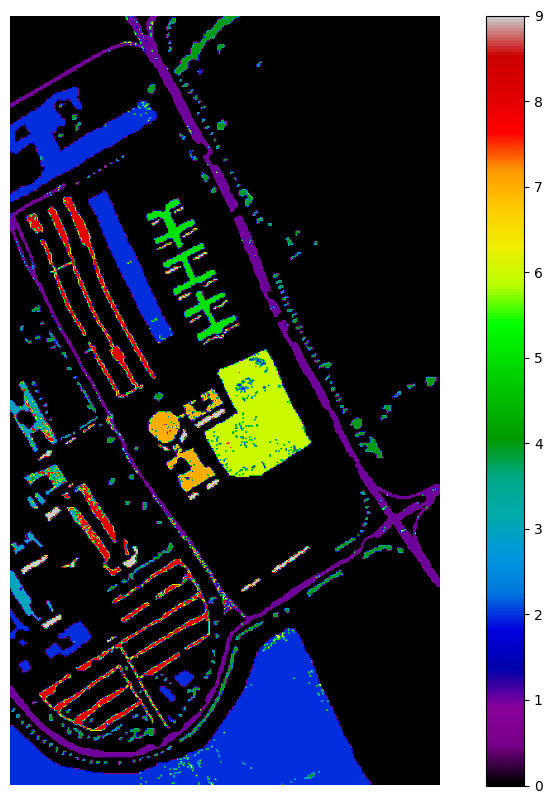

In [32]:
q = np.array(l).reshape(gt.shape).astype('float')

plot_data(q)